In [1]:
%pip install "ultralytics<=8.3.40" supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.1/112.6 GB disk)


In [3]:
from google.colab import userdata
key=userdata.get('RF_TOKEN')

For custom training of YOLO

In [3]:
HOME='/content'

In [4]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

/content/datasets


In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key=key)
project = rf.workspace("nflfootball").project("nfl-players-qs3y8")
version = project.version(4)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to nfl-players-4 in yolov11:: 100%|██████████| 2380/2380 [00:00<00:00, 6473.79it/s]


In [6]:
%cd {HOME}

/content


In [7]:
!yolo task=detect mode=train model=yolo11s.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 batch=40 plots=True

100% 18.4M/18.4M [00:00<00:00, 201MB/s]
New https://pypi.org/project/ultralytics/8.3.68 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/datasets/nfl-players-4/data.yaml, epochs=100, time=None, patience=100, batch=40, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, 

After traing use the best wights

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [38]:
%cd '/content'
import os
import cv2
import numpy as np
import supervision as sv
from PIL import Image
from torchvision import transforms
from ultralytics import YOLO

# Initialize the YOLO model (Ultralytics)
model = YOLO('/content/drive/MyDrive/NFL/best.pt')

# Transformation for input images
transform = transforms.Compose([transforms.Resize((100, 60)),])
def load_image(image_path):
    image=cv2.imread(image_path)
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    print(image.shape)
    return image
def convert_to_hsv_or_lab(image, color_space='hsv'):
    if color_space == 'hsv':
        return cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    elif color_space == 'lab':
        return cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    else:
        raise ValueError("Invalid color space. Choose 'hsv' or 'lab'.")
def extract_object(image):
    blurred = cv2.GaussianBlur(image, (3, 3), 2.5)
    edges = cv2.Canny(blurred, 50, 90)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges_dilated = cv2.dilate(edges, kernel, iterations=1)
    edges_closed = cv2.morphologyEx(edges_dilated, cv2.MORPH_CLOSE, kernel)
    contours, _ = cv2.findContours(edges_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for contour in contours:
        cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)
    extracted_object = cv2.bitwise_and(image, image, mask=mask)
    return extracted_object, mask

def compute_color_histogram(image, mask=None, normalize=True):
    # Convert the image from BGR to HSV color space
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the HSV channels
    channels = ('h', 's', 'v')
    histograms = []

    for i, channel in enumerate(channels):
        # Calculate the histogram for each HSV channel
        hist = cv2.calcHist([image_hsv], [i], mask, [32], [0, 256])

        # Normalize the histogram if requested
        if normalize:
            hist /= hist.sum()  # Normalize by dividing by the total count of pixels

        # Flatten the histogram to a 1D array
        histograms.append(hist.flatten())

    # Concatenate all histograms into a single vector
    histogram_vector = np.concatenate(histograms)

    return histogram_vector

def compute_histogram_similarity(hist1, hist2, method='cosine'):
    """
    Compare two histograms using the specified method.
    Supported methods: 'correlation', 'chi-square', 'intersection', 'bhattacharyya', 'euclidean', 'cosine'.
    """
    methods = {
        'correlation': cv2.HISTCMP_CORREL,
        'chi-square': cv2.HISTCMP_CHISQR,
        'intersection': cv2.HISTCMP_INTERSECT,
        'bhattacharyya': cv2.HISTCMP_BHATTACHARYYA
    }

    if method not in methods and method not in ['euclidean', 'cosine']:
        raise ValueError(f"Invalid method: {method}. Choose from {list(methods.keys())} or 'euclidean'/'cosine'.")

    if method in methods:
        similarity = cv2.compareHist(hist1, hist2, methods[method])
        # Invert for consistency: higher = more similar for some metrics
        if method== ['chi-square']:
            return -similarity
        if method == 'bhattacharyya':
          return 1-similarity  # Do not invert

    # For Euclidean and Cosine similarity, we use vector operations
    if method == 'euclidean':
        # Euclidean distance: smaller values = more similar
        similarity = np.linalg.norm(hist1 - hist2)
        return similarity

    if method == 'cosine':
        # Cosine similarity: 1 = identical, 0 = orthogonal, -1 = opposite
        similarity = np.dot(hist1, hist2) / (np.linalg.norm(hist1) * np.linalg.norm(hist2))
        return similarity
def determine_home_away(initial_crop, general_home_histogram, general_away_histogram, team_a_histogram, team_b_histogram, team_a_name, team_b_name):
    similarity_home = compute_histogram_similarity(initial_crop, general_home_histogram)
    similarity_away = compute_histogram_similarity(initial_crop, general_away_histogram)
    if (similarity_home) > (similarity_away)+0.02 and (similarity_home)>0:
        similarity_team_a_home = compute_histogram_similarity(initial_crop, team_a_histogram)
        similarity_team_b_home = compute_histogram_similarity(initial_crop, team_b_histogram)
        if similarity_team_a_home > similarity_team_b_home+0.001 and similarity_team_a_home>0:
            return team_a_name, team_b_name
        elif similarity_team_a_home+0.001 < similarity_team_b_home and similarity_team_b_home>0:
            return team_b_name, team_a_name
    return None, None

def initialize_team_histograms(home_kits_folder, away_kits_folder):
    """
    Initialize histograms for home and away kits.
    Ensures all images are resized and correctly formatted.
    """
    home_histograms = []
    away_histograms = []

    for f in os.listdir(home_kits_folder):
        if f.endswith('.png'):
            image_path = os.path.join(home_kits_folder, f)
            image = load_image(image_path)
            extracted,mask=extract_object(image)
            image_resized = np.array(transform(Image.fromarray(extracted)))
            mask=np.array(transform(Image.fromarray(mask)))
            if image_resized.dtype != np.uint8:
                image_resized = (image_resized * 255).astype(np.uint8)
                mask=(mask * 255).astype(np.uint8)
            for i in range(mask.shape[0]):
                for j in range(mask.shape[1]):
                    if mask[i][j] < 90:
                        mask[i][j]=0
                    else:
                        mask[i][j]=255
            home_histograms.append(compute_color_histogram(image_resized,mask))

    for f in os.listdir(away_kits_folder):
        if f.endswith('.png'):
            image_path = os.path.join(away_kits_folder, f)
            image = load_image(image_path)
            extracted,mask=extract_object(image)
            image_resized = np.array(transform(Image.fromarray(extracted)))
            mask=np.array(transform(Image.fromarray(mask)))
            if image_resized.dtype != np.uint8:
                image_resized = (image_resized * 255).astype(np.uint8)
                mask=(mask * 255).astype(np.uint8)
            for i in range(mask.shape[0]):
                for j in range(mask.shape[1]):
                    if mask[i][j] < 90:
                        mask[i][j]=0
                    else:
                        mask[i][j]=255
            away_histograms.append(compute_color_histogram(image_resized,mask))

    print(f"Loaded {len(home_histograms)} home kits and {len(away_histograms)} away kits.")
    return np.array(home_histograms), np.array(away_histograms)
def process_video_with_yolo_tracking_optimized(source_video_path, team_a_name, team_b_name, year):
    # Load YOLO model

    model = YOLO('/content/drive/MyDrive/NFL/older_weights_.pt')
    # Paths for team kits
    home_kits_folder = f"/content/drive/MyDrive/NFL/Clubs/{year}/Home"
    away_kits_folder = f"/content/drive/MyDrive/NFL/Clubs/{year}/Away"
    team_a_image = f"/content/drive/MyDrive/NFL/Clubs/{year}/Home/{team_a_name}.png"
    team_b_image = f"/content/drive/MyDrive/NFL/Clubs/{year}/Home/{team_b_name}.png"

    # Initialize team histograms
    general_home_histogram, general_away_histogram = initialize_team_histograms(home_kits_folder, away_kits_folder)
    c_home_histogram= np.mean(general_home_histogram, axis=0)
    c_away_histogram= np.mean(general_away_histogram, axis=0)
    team_a_image = load_image(team_a_image)
    team_b_image = load_image(team_b_image)
    extracteda,mask=extract_object(team_a_image)
    extractedb,maskb=extract_object(team_b_image)
    extracteda=np.array(transform(Image.fromarray(extracteda)))
    extractedb=np.array(transform(Image.fromarray(team_b_image)))
    mask=np.array(transform(Image.fromarray(mask)))
    maskb = np.array(transform(Image.fromarray(maskb)))
    if(extracteda.dtype!=np.uint8):
      extracteda = (extracteda* 255).astype(np.uint8)
      mask=(mask * 255).astype(np.uint8)
      extractedb = (extractedb* 255).astype(np.uint8)
      maskb=(maskb * 255).astype(np.uint8)
    team_a_histogram = compute_color_histogram(extracteda,mask=mask)
    team_b_histogram = compute_color_histogram(extractedb,mask=maskb)
    home_team_label = None
    away_team_label = None
    team_label = None
    print("Initializing video processing with YOLO tracking...")
    cap = cv2.VideoCapture(source_video_path)
    frame_count = 0
    out = None
    previous_tracked_objects = []
    tracker_initialized = False
    tracked_id=[]
    team_labels=[]
    color_arr=[]
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1
        # Perform YOLO object detection
        results = model.track(source=frame, persist=True)
        tracked_objects = results[0].boxes.data.cpu().numpy() if results[0].boxes is not None else []

        # Check if re-detection is needed
        if not tracked_objects.any() or len(tracked_objects) < len(previous_tracked_objects) * 0.5:
            # Call predict if tracking fails or a significant number of objects are lost
            results = model.predict(frame, conf=0.35)
            tracked_objects = results[0].boxes.data.cpu().numpy() if results[0].boxes is not None else []
            if tracked_objects.any():
                model.track(source=frame, persist=True)  # Reinitialize tracker
        previous_tracked_objects = tracked_objects
        drawing_data = []
        for obj in tracked_objects:
            cont=False
            class_id=-1
            track_id=-1
            x1=0; y1=0; x2=0; y2=0
            if len(obj) == 7:
                x1, y1, x2, y2, track_id, conf, class_id = obj
                if(track_id in tracked_id):
                    cont=True
                #print("classid",class_id)
                #print("track",track_id)
                #print("conf",conf)
            elif len(obj) == 6:
                x1, y1, x2, y2, conf, class_id = obj
                track_id = None  # Assign a default value if track ID is missing
                print(class_id)
            else:
                print(f"Unexpected object format: {obj}")
                continue  # Skip invalid object formats
            if(conf<0.5):
              continue
            # Ensure coordinates are integers
            x1, y1, x2, y2 = map(int, (x1, y1, x2, y2))
            w, h = x2 - x1, y2 - y1
            if(not cont):
              crop = frame[y1:y2, x1:x2]
              # Further processing (e.g., cropping, labeling)...

              if crop.size == 0:
                  continue

              if home_team_label is None and away_team_label is None:
                  extracted_,mask_=extract_object(crop)
                  extracted_ = np.array(transform(Image.fromarray(extracted_)))
                  print("masks_shape",mask_.shape)
                  mask_=np.array(transform(Image.fromarray(mask_)))
                  for i in range(mask_.shape[0]):
                    for j in range(mask_.shape[1]):
                        if mask_[i][j] < 90:
                            mask_[i][j]=0
                        else:
                            mask_[i][j]=255
                  print(mask_.shape)
                  if extracted_.dtype != np.uint8:
                      extracted_ = (extracted_ * 255).astype(np.uint8)
                      mask_=(mask_ * 255).astype(np.uint8)
                  initial_histogram = compute_color_histogram(extracted_,mask=mask_)
                  home_team_label, away_team_label = determine_home_away(
                      initial_histogram, c_home_histogram, c_away_histogram,
                      team_a_histogram, team_b_histogram, team_a_name, team_b_name
                  )
                  continue
              extracted_,mask_=extract_object(crop)
              print(mask_.shape)
              extracted_ = np.array(transform(Image.fromarray(extracted_)))
              mask_=np.array(transform(Image.fromarray(mask_)))
              print(mask_.shape)
              if extracted_.dtype != np.uint8:
                  extracted_ = (extracted_ * 255).astype(np.uint8)
                  mask_=(mask_ * 255).astype(np.uint8)
              mask_=np.array(transform(Image.fromarray(mask_)))
              for i in range(mask_.shape[0]):
                  for j in range(mask_.shape[1]):
                      if mask_[i][j] < 90:
                          mask_[i][j]=0
                      else:
                          mask_[i][j]=255
              extracted_histogram = compute_color_histogram(extracted_,mask=mask_)
              similarity_home=compute_histogram_similarity(extracted_histogram,c_home_histogram)
              similarity_away=compute_histogram_similarity(extracted_histogram,c_away_histogram)
              #print(similarity_home,similarity_away)
              if class_id == 0:  # Player
                  if similarity_away+0.02 <similarity_home and similarity_home>0.01:
                      team_label = home_team_label
                      color = (255, 0, 0) # Blue for Home team
                      sv.plot_image(extracted_)
                      print(team_label,similarity_away,similarity_home)
                  elif similarity_away>similarity_home+0.02 and similarity_away>0.01:
                      team_label = away_team_label
                      color = (0, 0, 255)  # Red for Away team
                      sv.plot_image(extracted_)
                      print(team_label,similarity_away,similarity_home)
                  else:
                      continue
              elif class_id == 1:  # Referee
                  team_label = "Referee"
                  color = (0, 200, 0)
              else:
                  team_label = "Not-Confirm"
                  color = (0, 0, 0)
              tracked_id.append(track_id)
              team_labels.append(team_label)
              color_arr.append(color)
            else:
              team_label=team_labels[tracked_id.index(track_id)]
              color=color_arr[tracked_id.index(track_id)]
            # Draw bounding box and label

            drawing_data.append((x1, y1, x2, y2, color, team_label, track_id))
        for x1, y1, x2, y2, color, team_label, track_id in drawing_data:
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            cv2.putText(frame, f"{team_label} {track_id}", (x1, y1 - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        # Initialize output video writer
        if frame_count == 1:
            fourcc = cv2.VideoWriter_fourcc(*'mp4v')
            out = cv2.VideoWriter('output_with_tracking.mp4', fourcc, 30.0, (frame.shape[1], frame.shape[0]))

        if out is not None:
            out.write(frame)
    cap.release()
    if out is not None:
        out.release()
    print("Processing complete. Video saved as 'output_with_tracking.mp4'.")



/content


(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 64, 3)
(100, 50, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
(100, 60, 3)
Loaded 32 home kits and 32 away kits.
(100, 60, 3)
(100, 60, 3)
Initializing video processing with YOLO tracking...

0: 384x640 (no detections), 18.0ms
Speed: 2.6ms pre

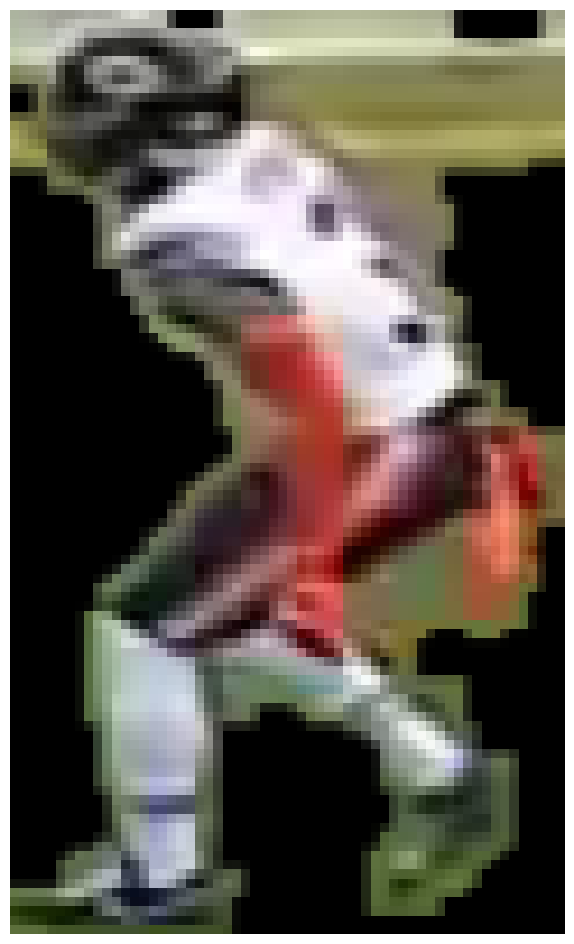

Chicago Bears 0.7803852 0.7404943
0.0
(86, 45)
(100, 60)


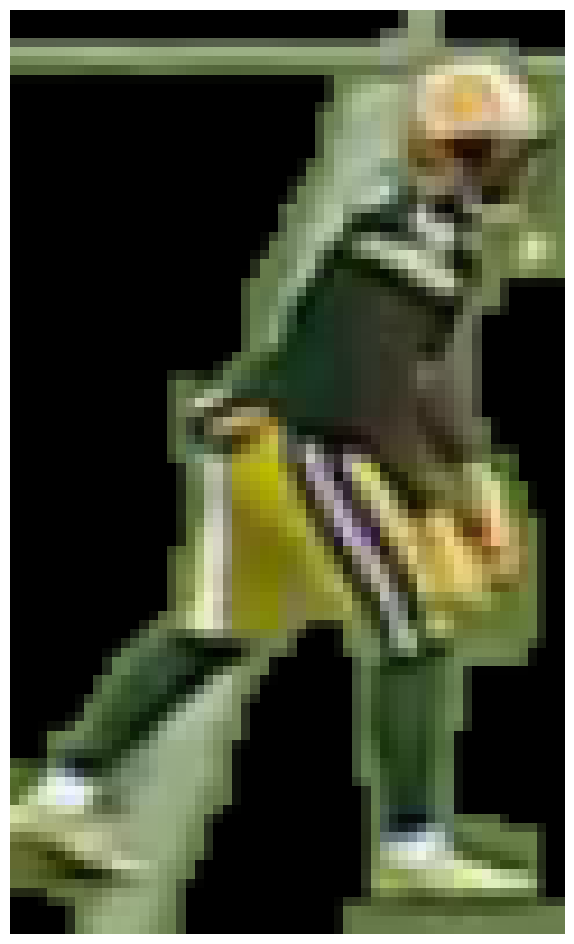

Green Bay Packers 0.4395429 0.5038644
0.0
(88, 60)
(100, 60)


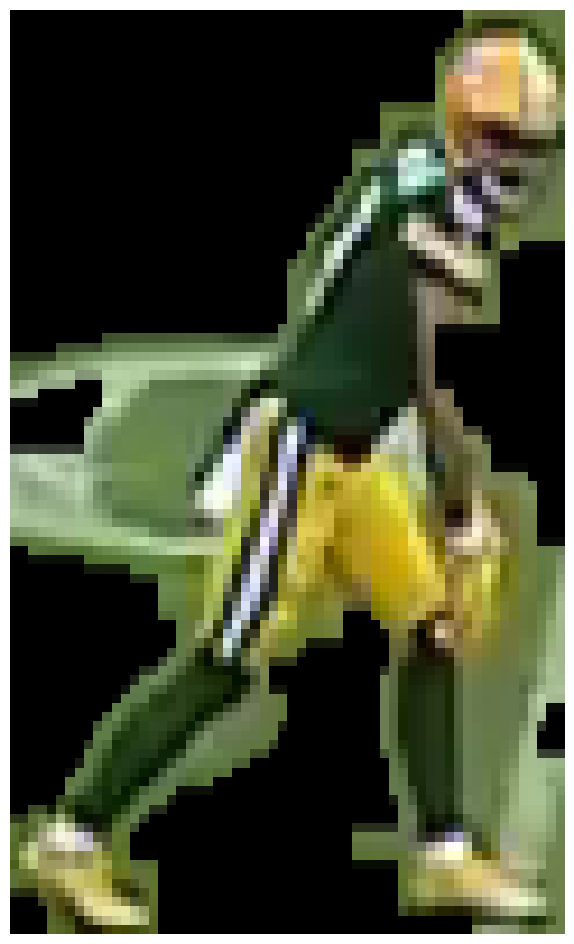

Green Bay Packers 0.45619 0.527489
0.0
(117, 69)
(100, 60)


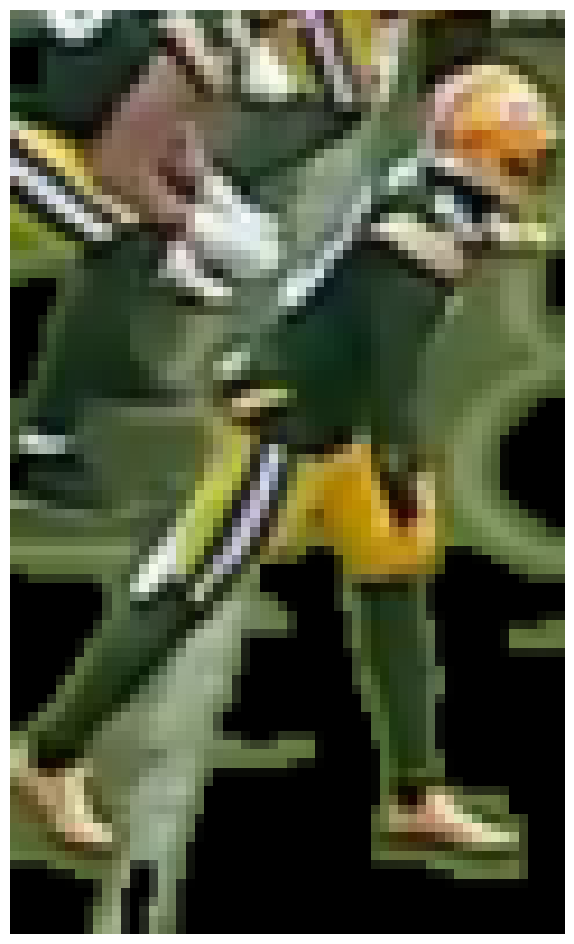

Green Bay Packers 0.5335507 0.61011416
0.0
(112, 40)
(100, 60)


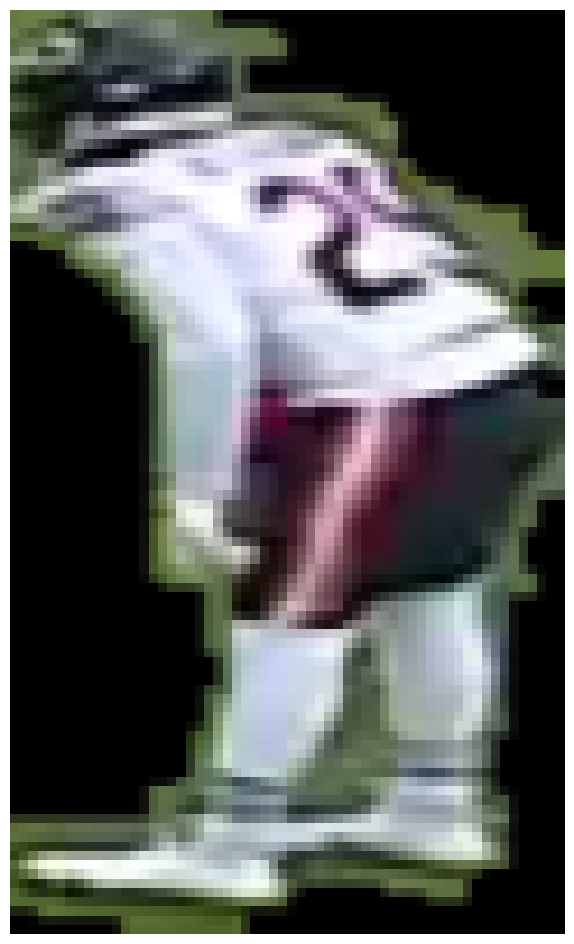

Chicago Bears 0.81297326 0.7753382
0.0
(90, 44)
(100, 60)


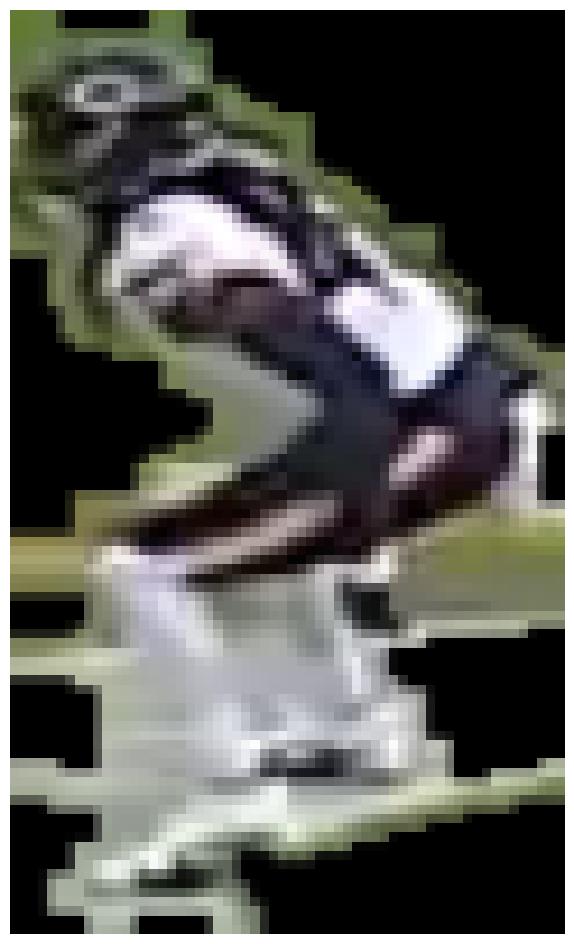

Chicago Bears 0.7304258 0.66146713
0.0
(88, 32)
(100, 60)


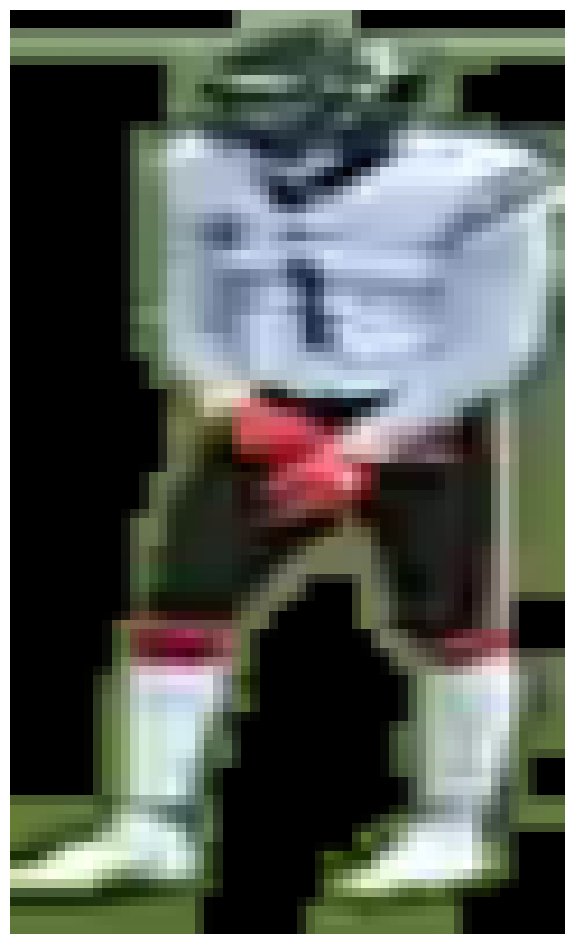

Green Bay Packers 0.6815132 0.71542704
0.0
(68, 72)
(100, 60)


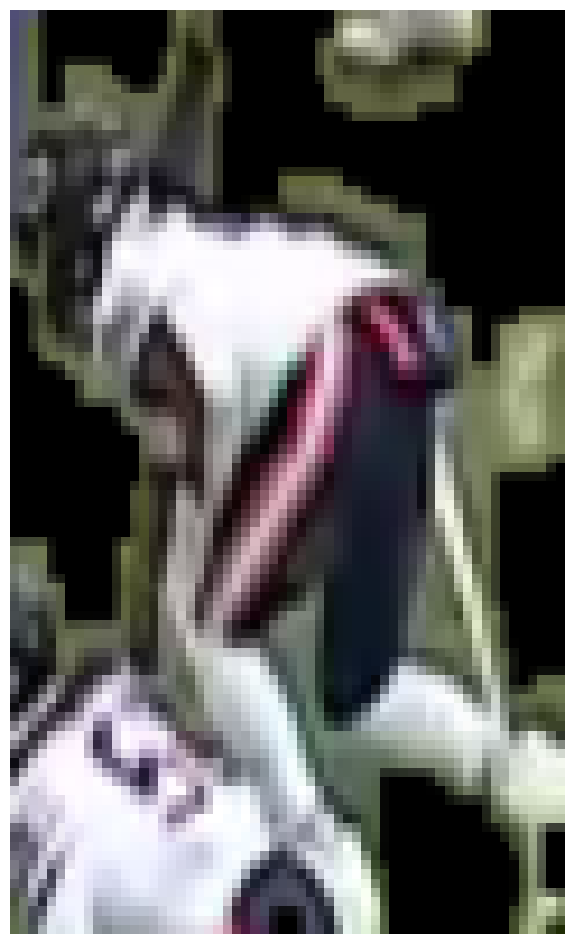

Chicago Bears 0.79805523 0.7249358
0.0
(89, 29)
(100, 60)


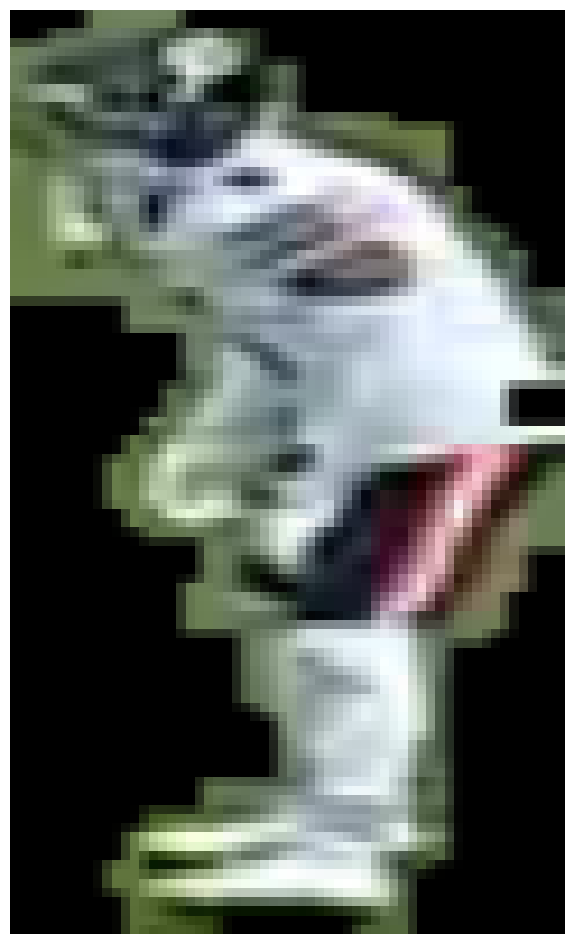

Chicago Bears 0.7525535 0.72679704
0.0
(111, 55)
(100, 60)


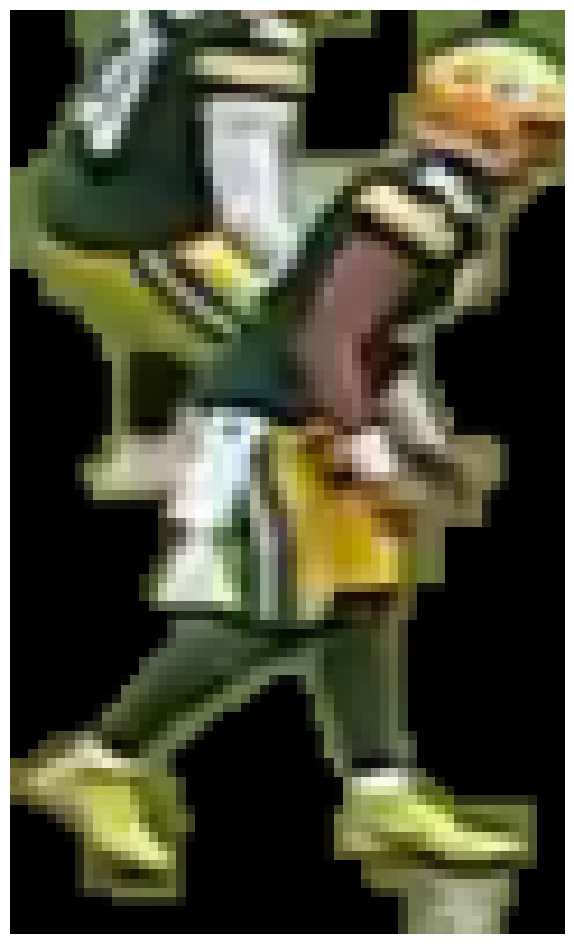

Green Bay Packers 0.55399704 0.61044335
0.0
(80, 34)
(100, 60)


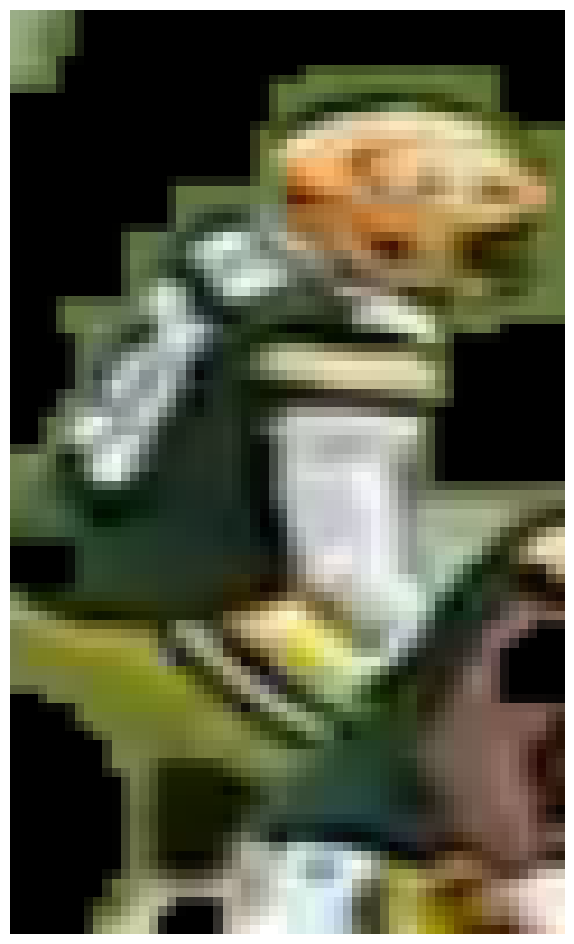

Green Bay Packers 0.65272385 0.70220923
0.0
(89, 50)
(100, 60)


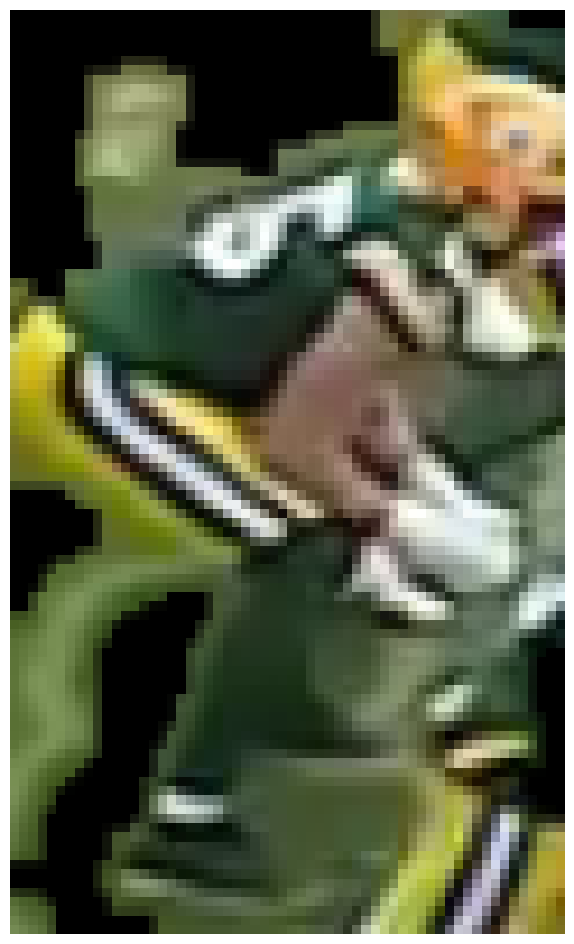

Green Bay Packers 0.60935307 0.6829104
0.0
(66, 44)
(100, 60)


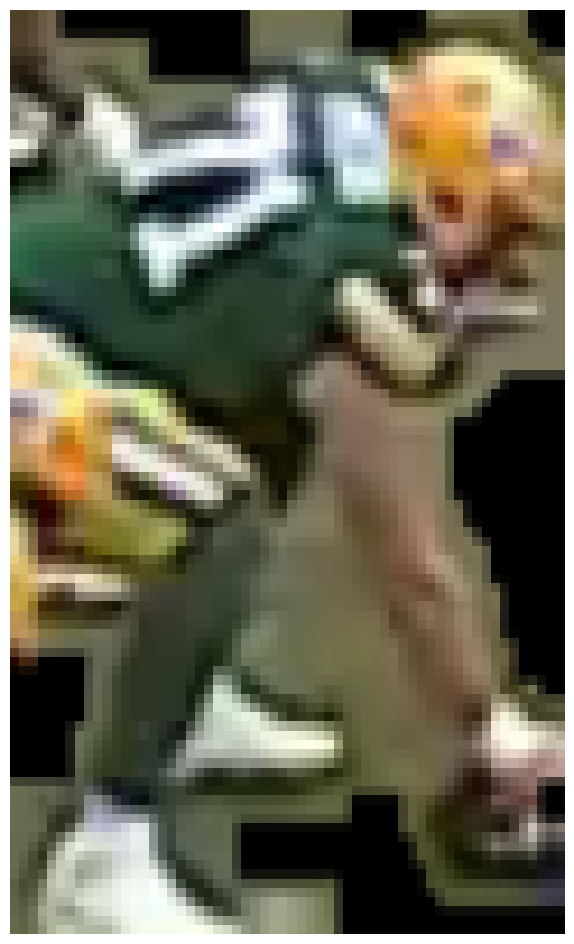

Green Bay Packers 0.674359 0.7210263
0.0
(51, 56)
(100, 60)


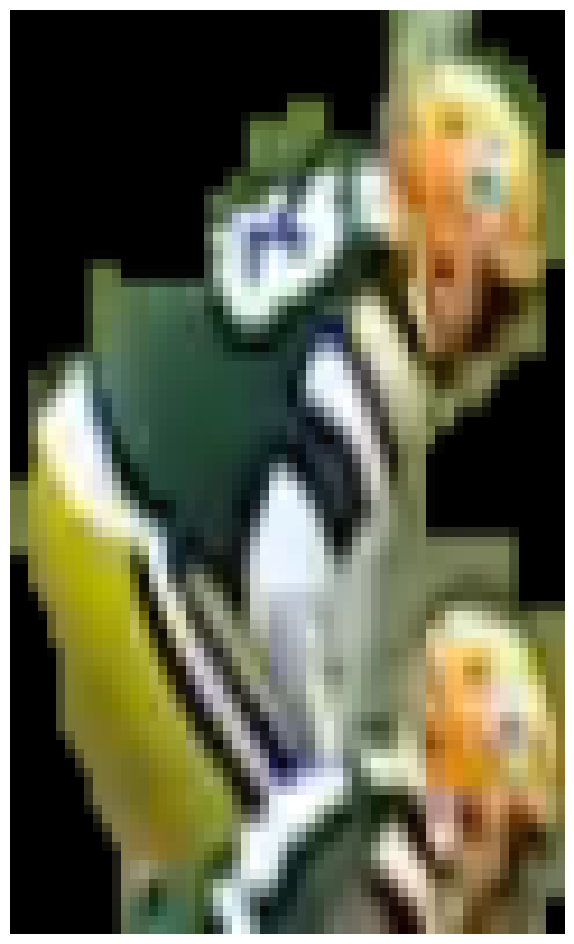

Green Bay Packers 0.71118647 0.7381291
0.0
(59, 48)
(100, 60)


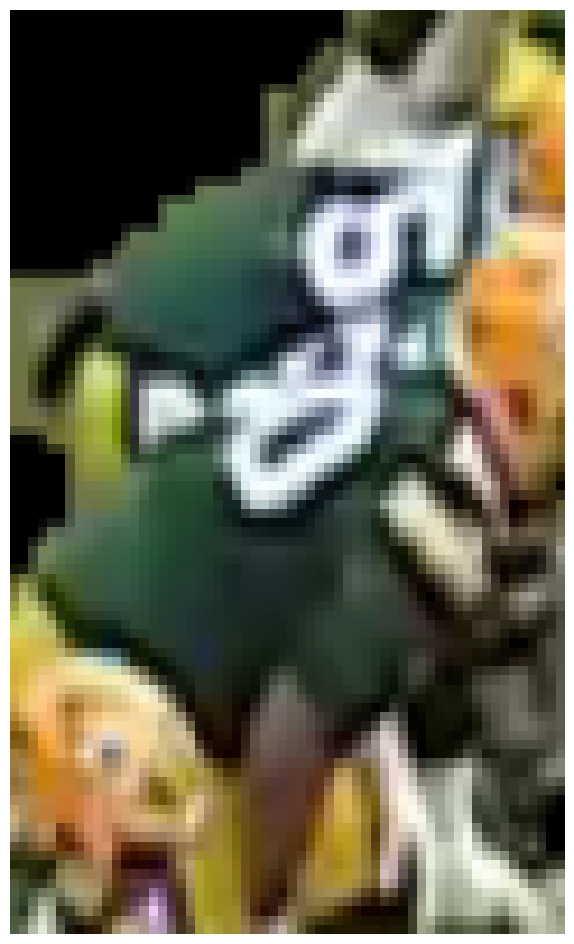

Green Bay Packers 0.73407936 0.786838
0.0
(45, 48)
(100, 60)


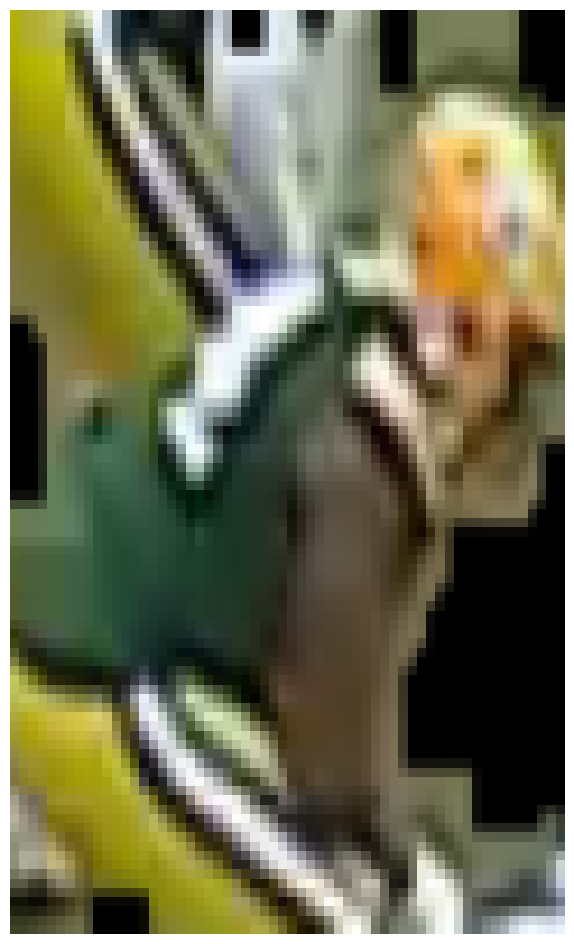

Green Bay Packers 0.6276242 0.67030686
0.0
(56, 44)
(100, 60)


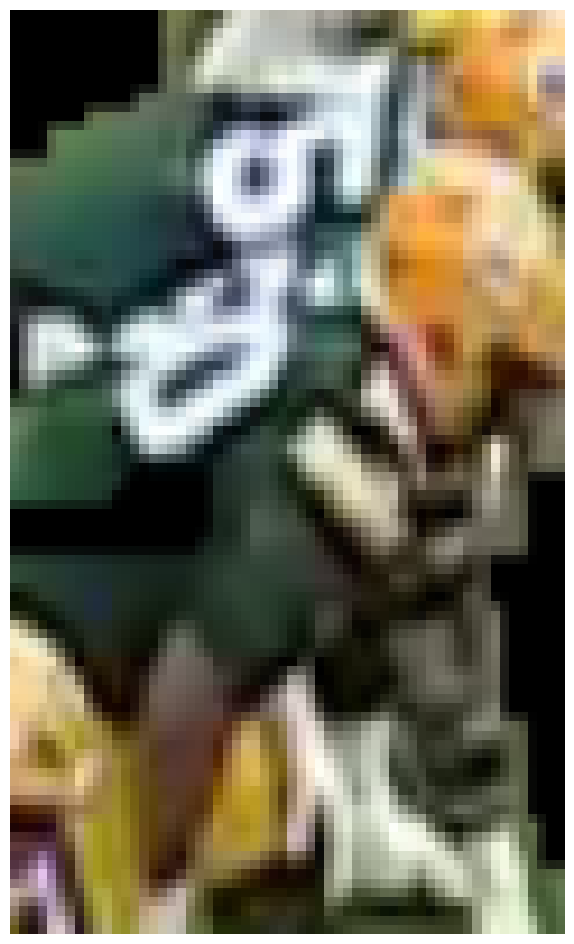

Green Bay Packers 0.7397207 0.78282684
0.0
(53, 33)
(100, 60)
0.0
0.0
0.0

0: 384x640 22 Players, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(67, 74)
(100, 60)


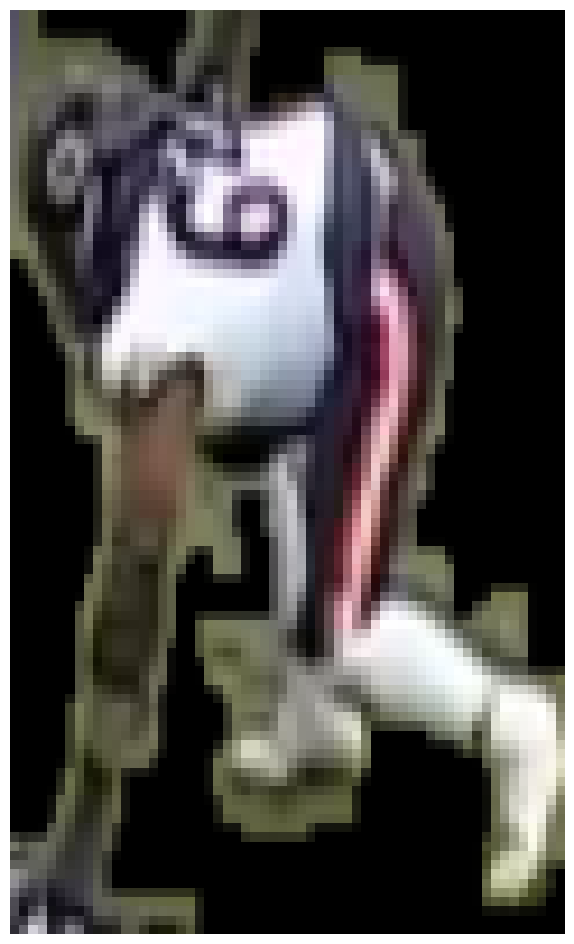

Chicago Bears 0.71955264 0.68454176
(85, 69)
(100, 60)


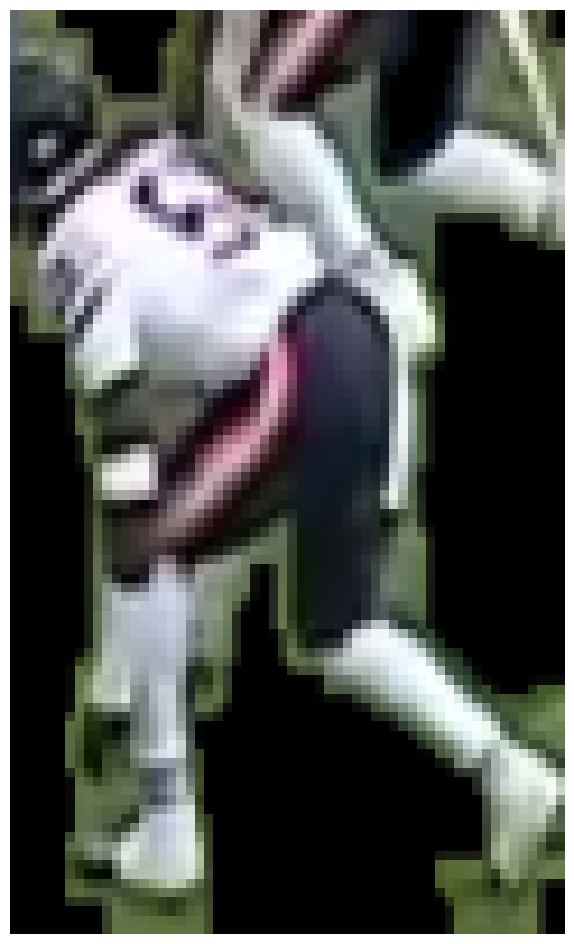

Chicago Bears 0.81252027 0.7755729
(102, 39)
(100, 60)


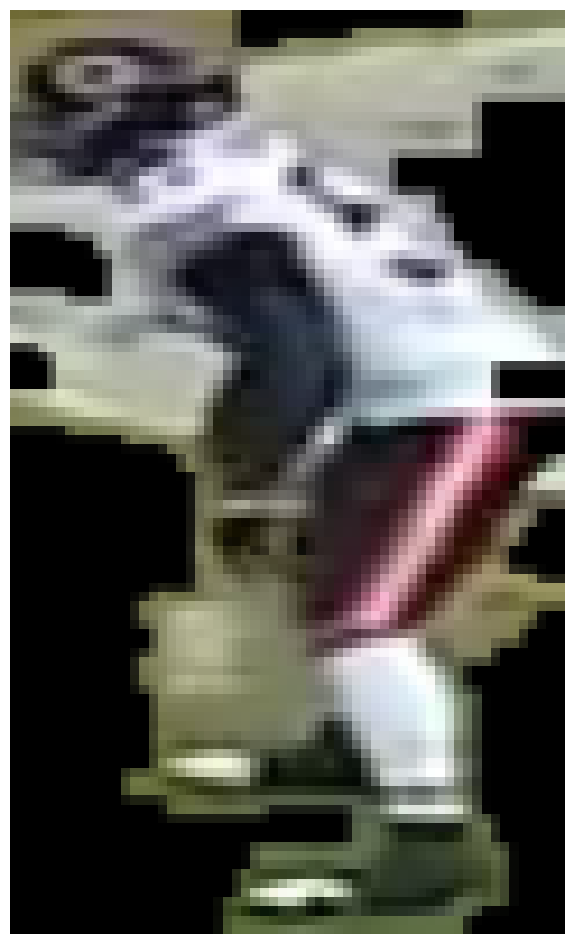

Chicago Bears 0.7607581 0.7274712
(55, 75)
(100, 60)


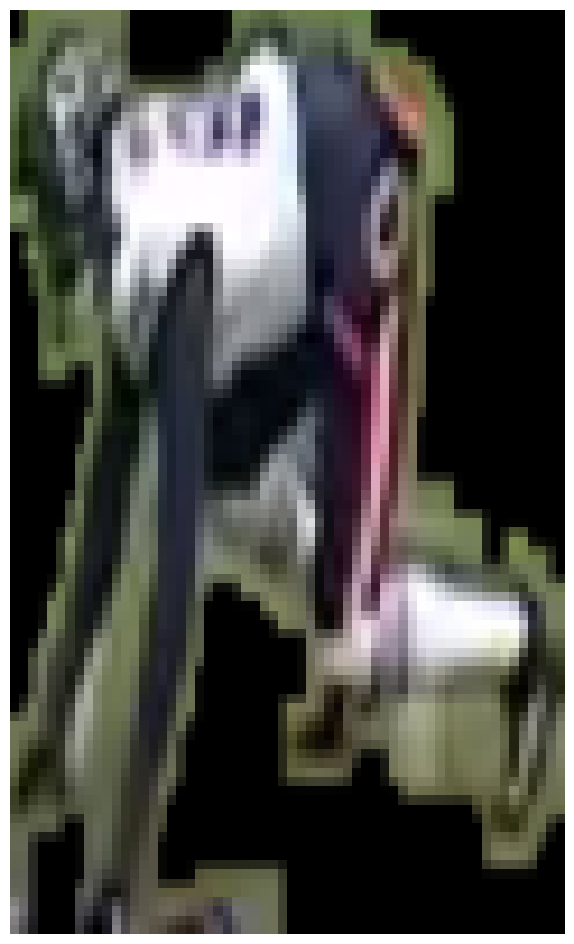

Green Bay Packers 0.71406674 0.7379909
(98, 47)
(100, 60)


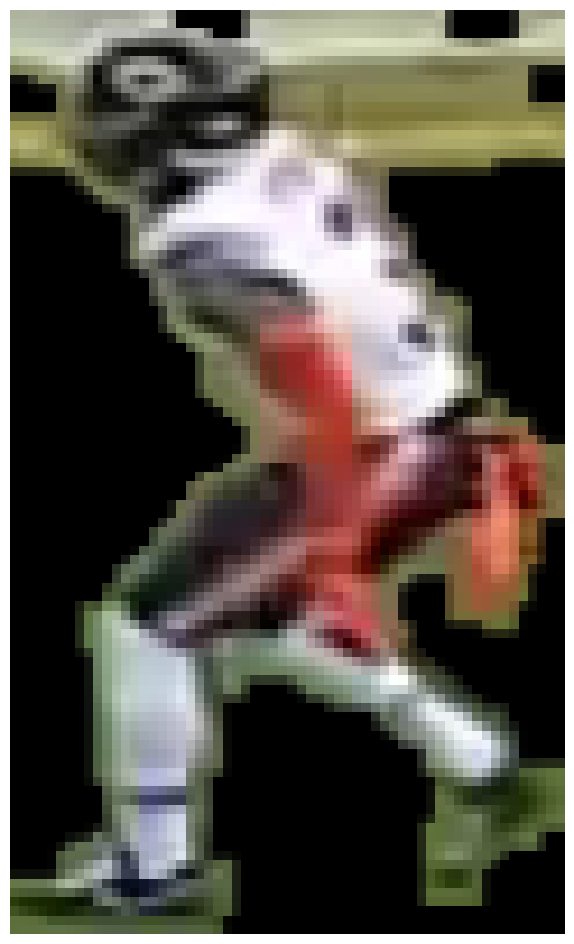

Chicago Bears 0.7872988 0.7422831
(86, 45)
(100, 60)


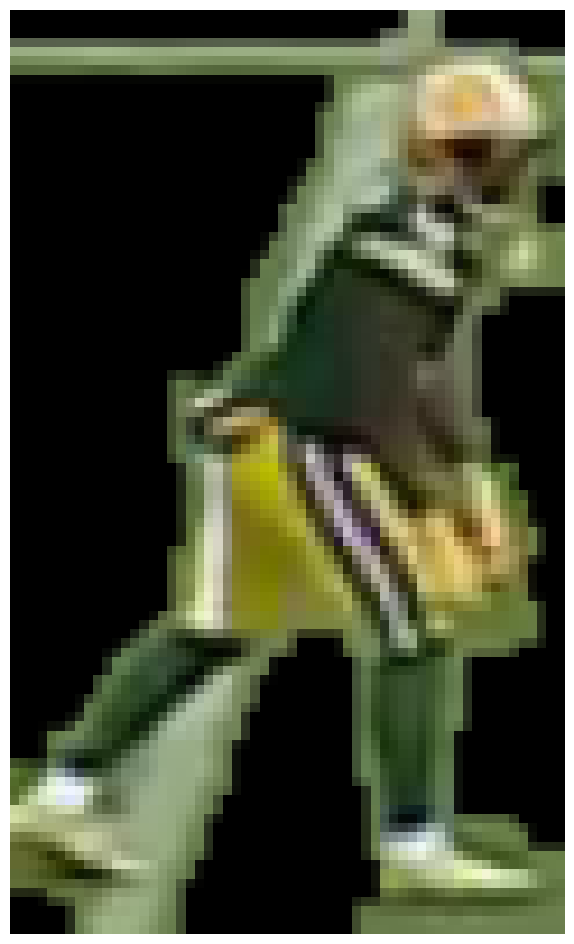

Green Bay Packers 0.43780145 0.50261444
(88, 60)
(100, 60)


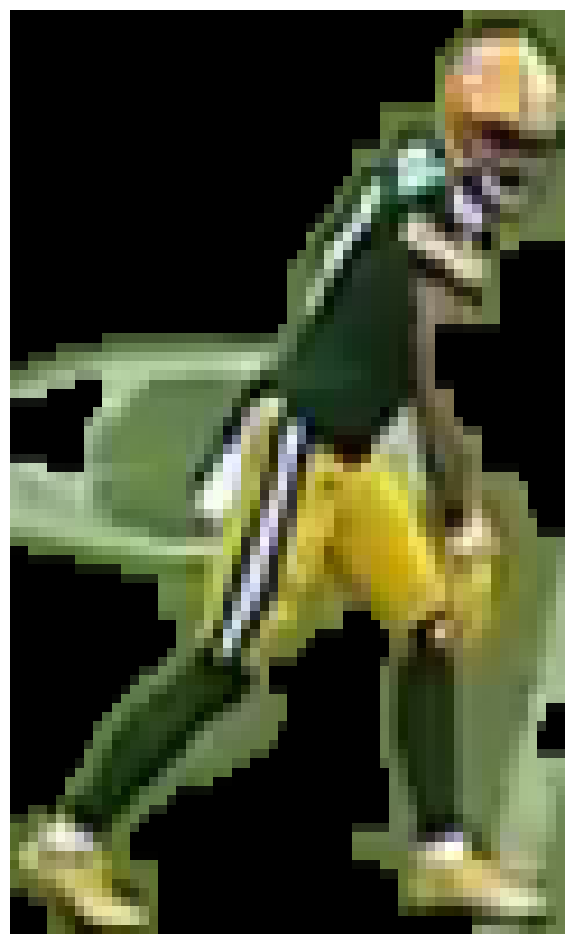

Green Bay Packers 0.45238364 0.52293915
(117, 69)
(100, 60)


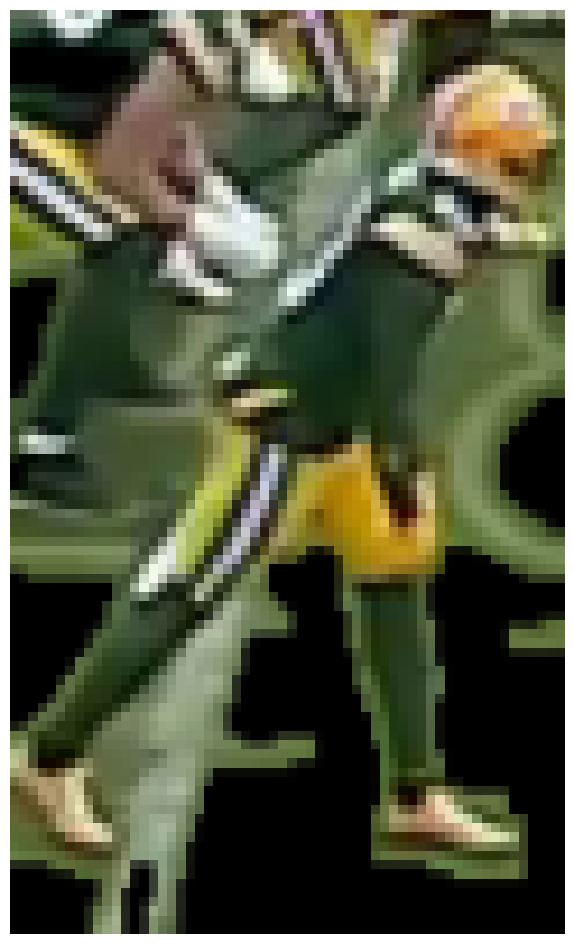

Green Bay Packers 0.5282127 0.6032003
(112, 41)
(100, 60)


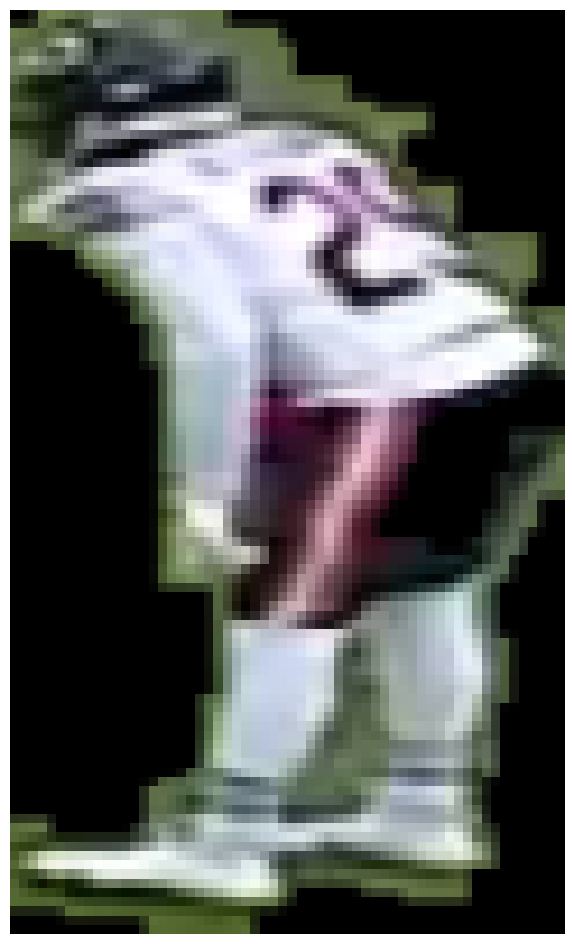

Chicago Bears 0.8049596 0.75232214
(91, 44)
(100, 60)


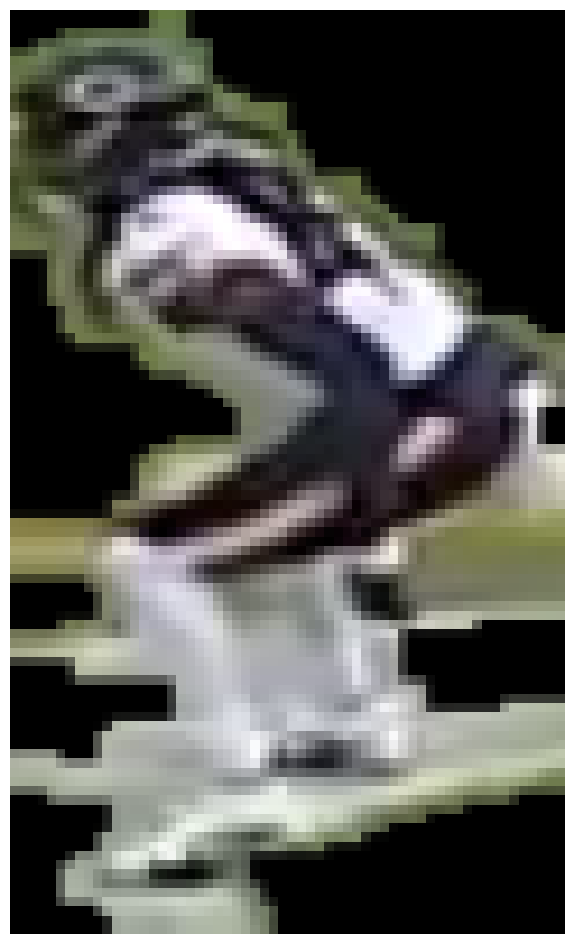

Chicago Bears 0.73359215 0.6587213
(88, 33)
(100, 60)


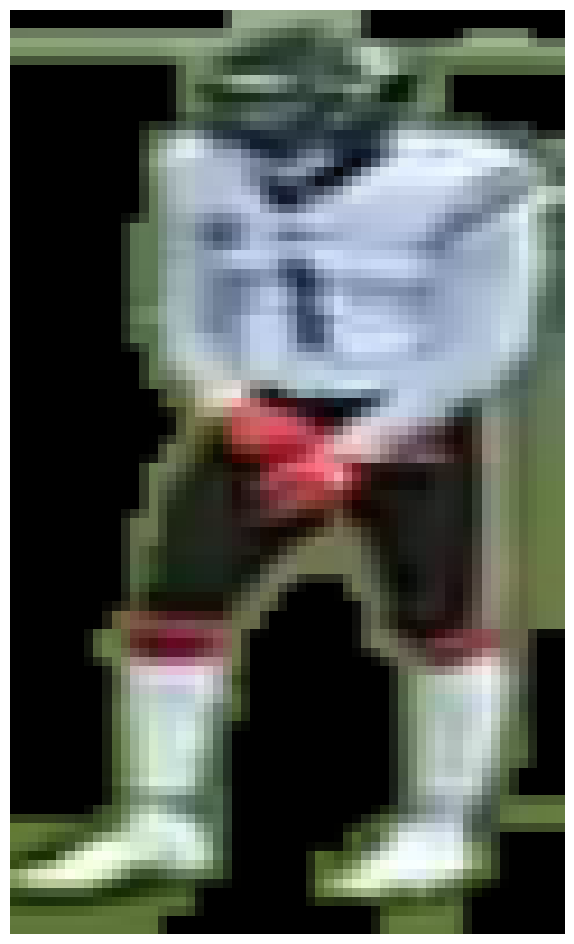

Green Bay Packers 0.6924817 0.72534585
(69, 74)
(100, 60)


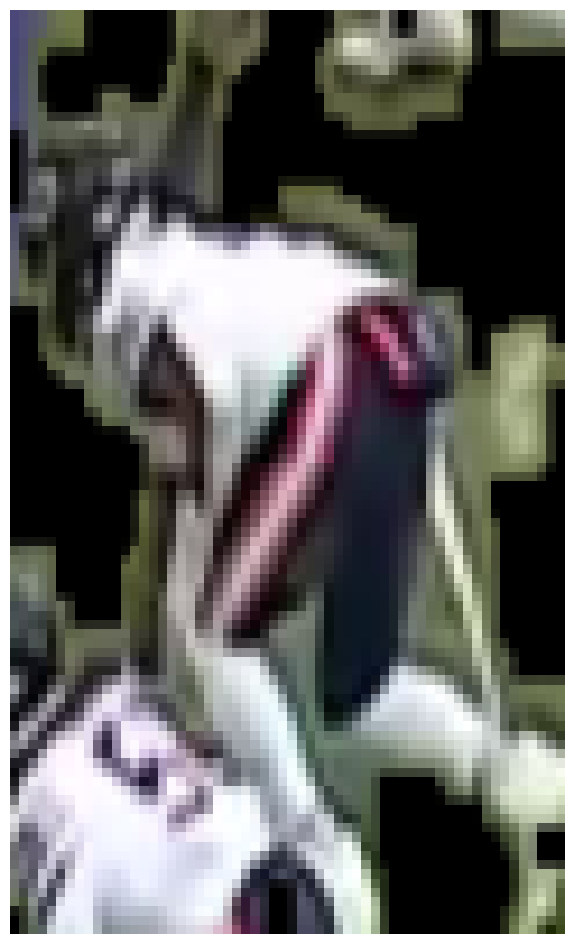

Chicago Bears 0.79553384 0.7247036
(90, 30)
(100, 60)


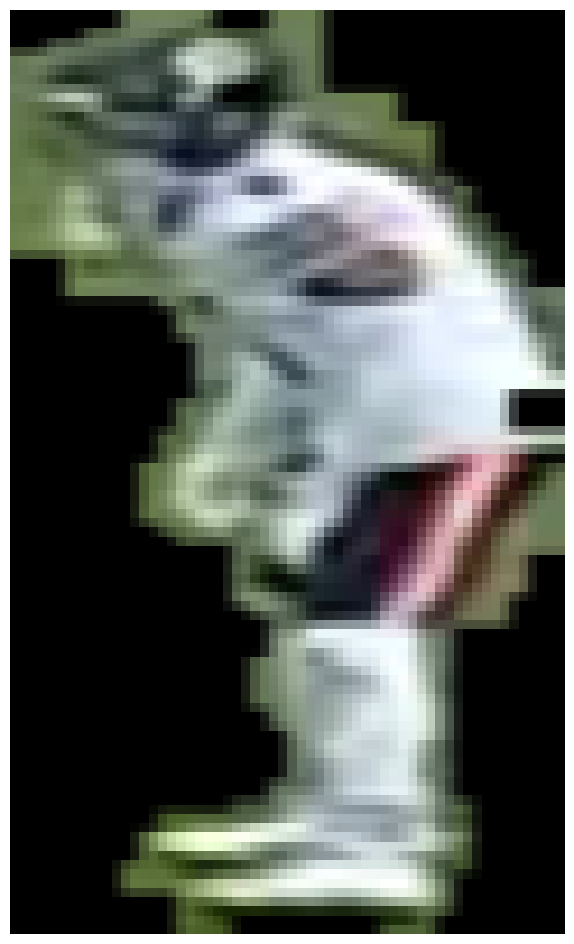

Chicago Bears 0.75870115 0.7287142
(108, 54)
(100, 60)


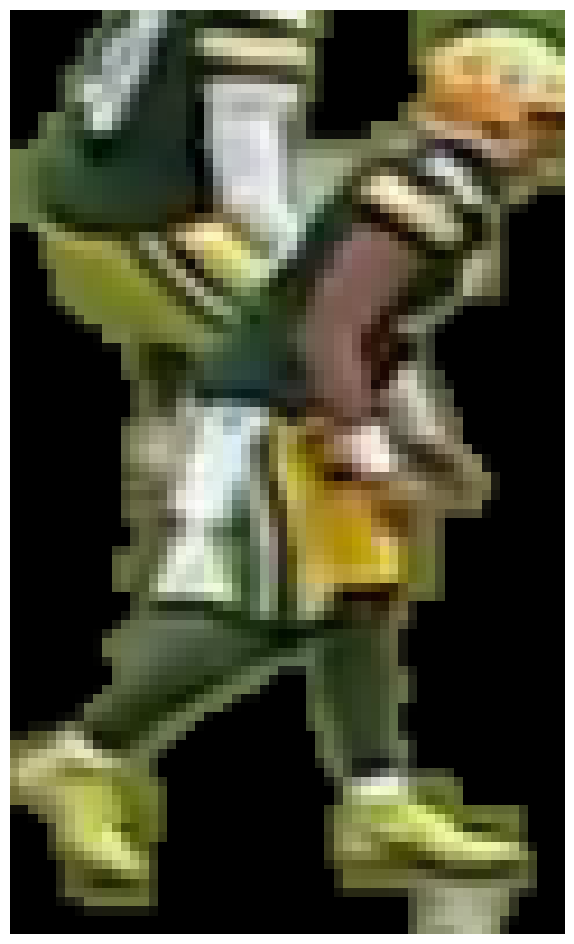

Green Bay Packers 0.5396065 0.5926526
(82, 34)
(100, 60)


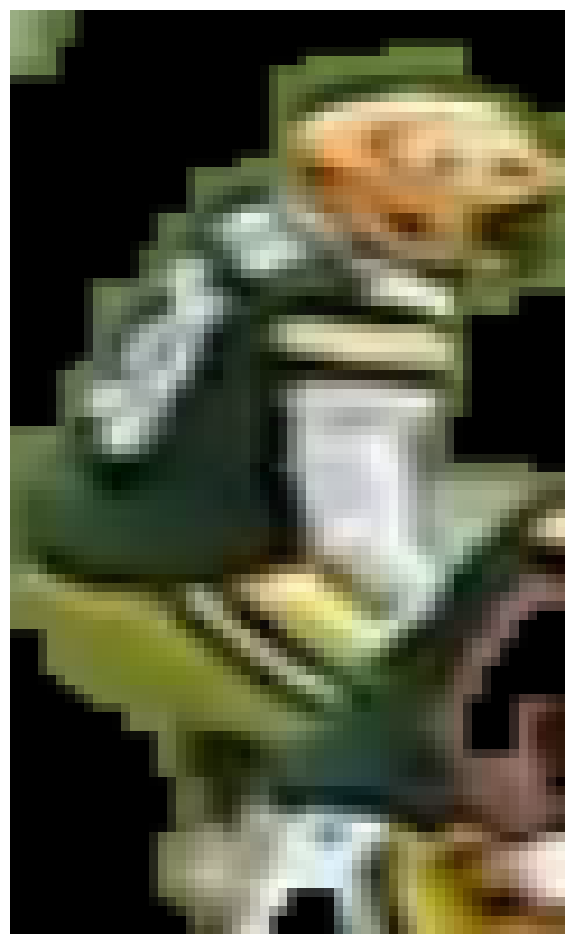

Green Bay Packers 0.62799335 0.676742
(89, 50)
(100, 60)


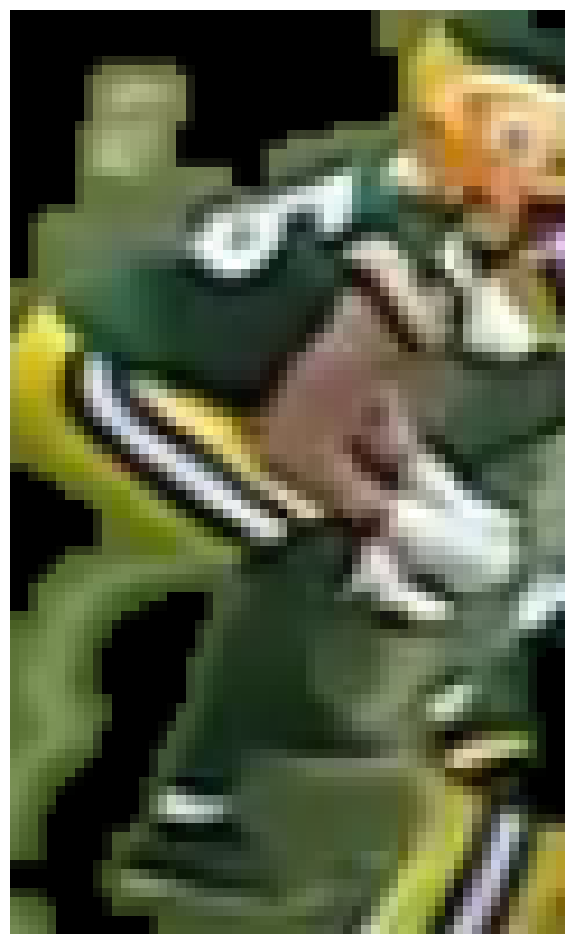

Green Bay Packers 0.601533 0.6736297
(66, 43)
(100, 60)


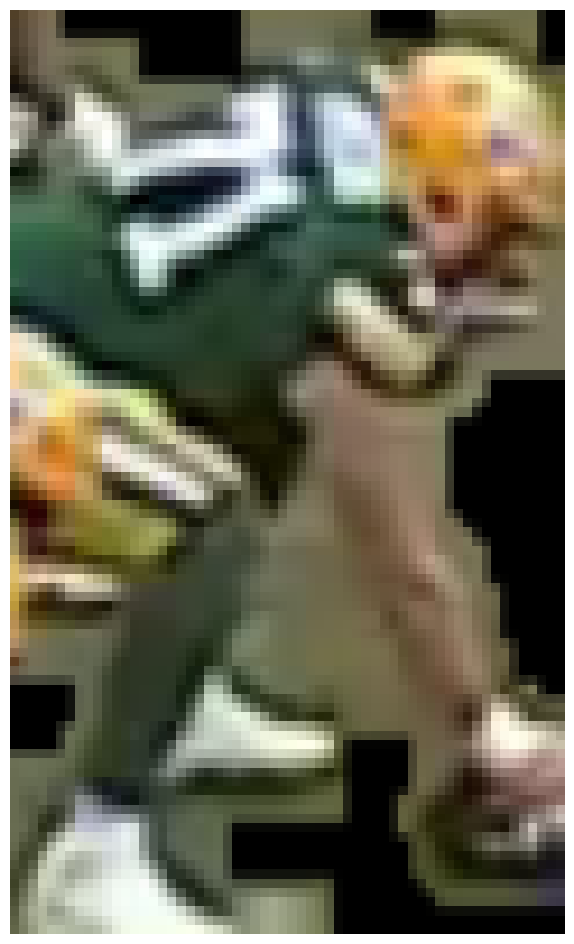

Green Bay Packers 0.6705906 0.71871865
(54, 58)
(100, 60)


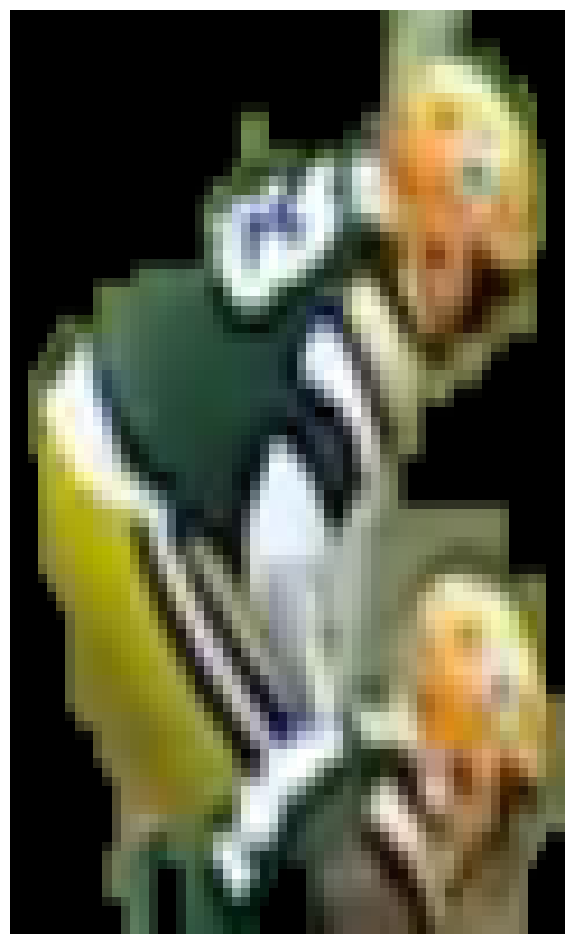

Green Bay Packers 0.7012249 0.73649234
(58, 47)
(100, 60)


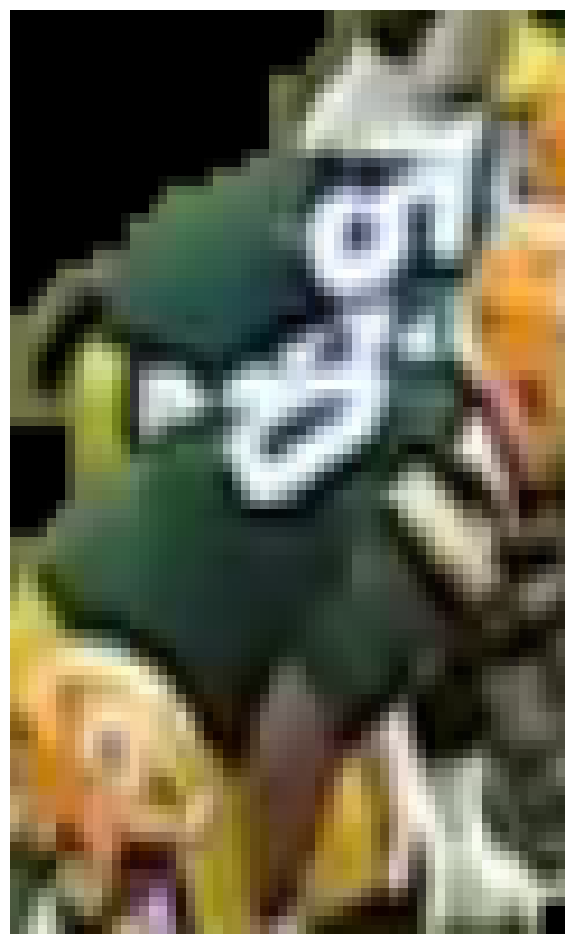

Green Bay Packers 0.73475033 0.7880156
(46, 50)
(100, 60)


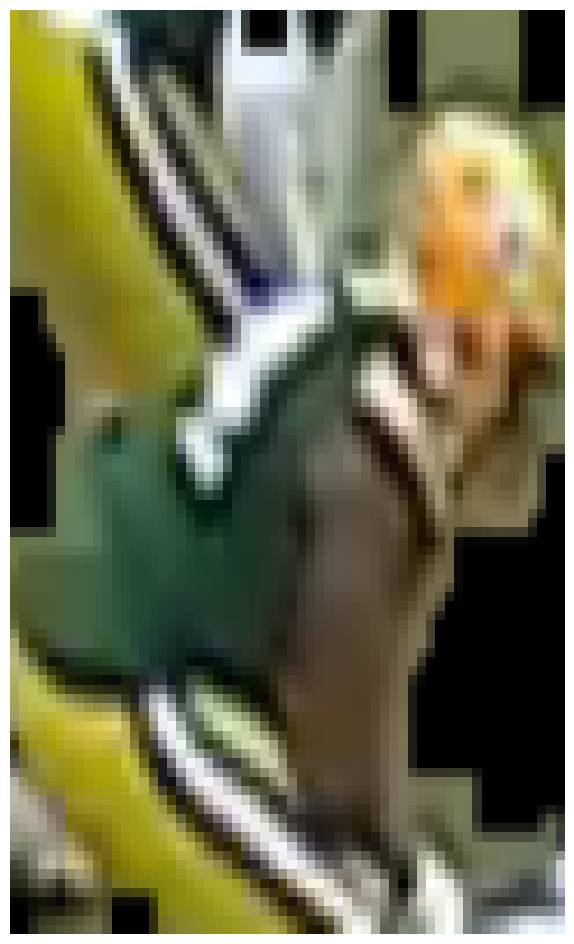

Green Bay Packers 0.61703044 0.65904677
(56, 44)
(100, 60)


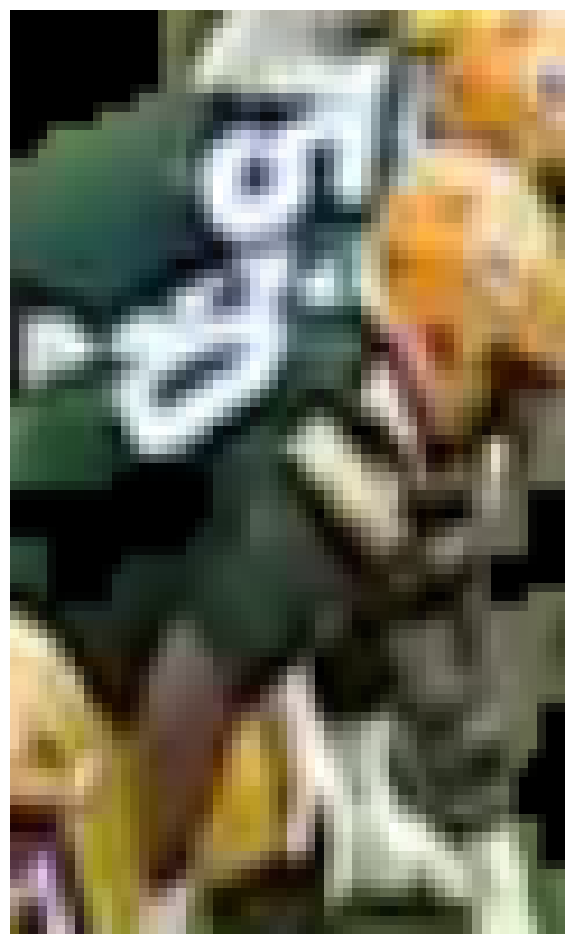

Green Bay Packers 0.72617614 0.7679154
(52, 32)
(100, 60)


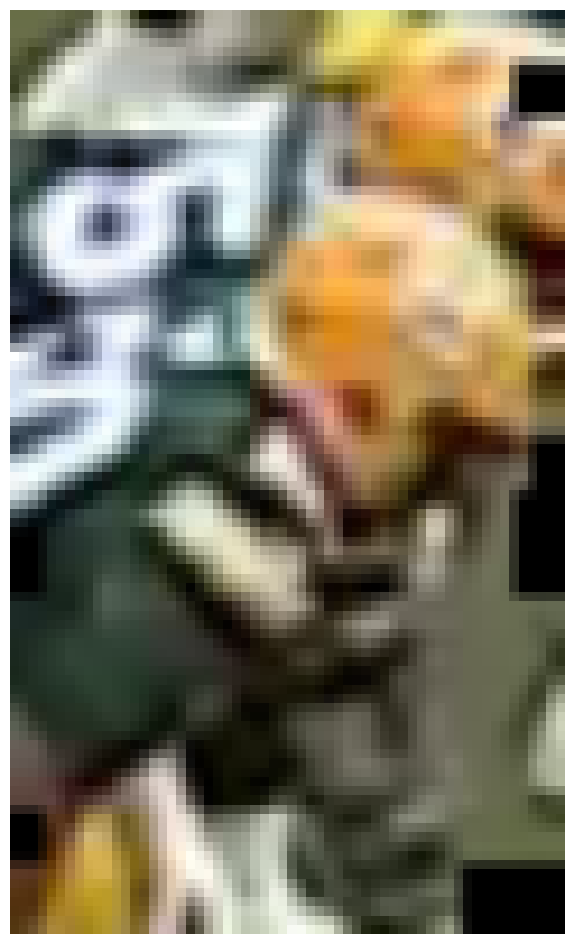

Green Bay Packers 0.68173987 0.7023146

0: 384x640 22 Players, 32.3ms
Speed: 4.2ms preprocess, 32.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 15.4ms
Speed: 2.9ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 13.5ms
Speed: 4.0ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms in

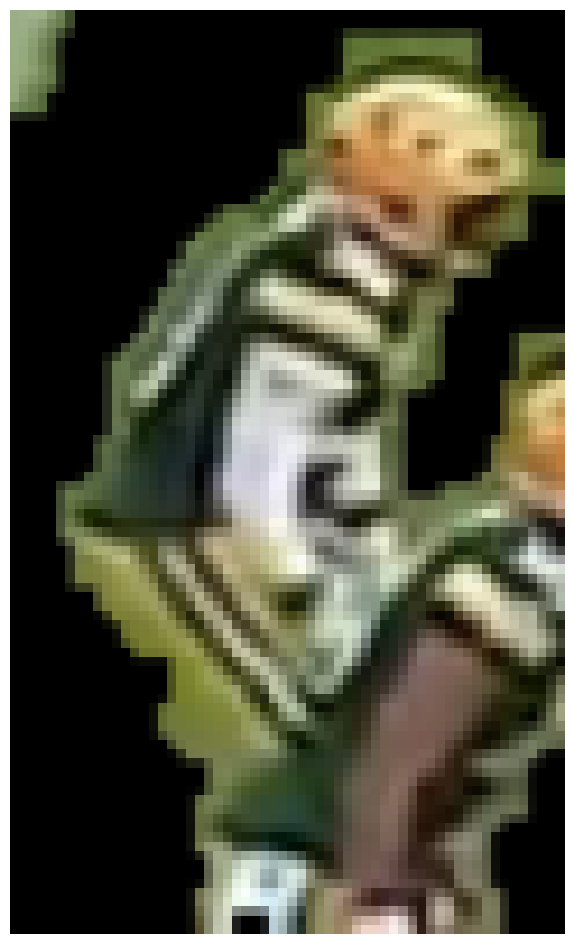

Green Bay Packers 0.5749718 0.61216986

0: 384x640 25 Players, 21.0ms
Speed: 10.6ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 21.8ms
Speed: 4.0ms preprocess, 21.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 15.8ms
Speed: 2.4ms preprocess, 15.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
(112, 71)
(100, 60)


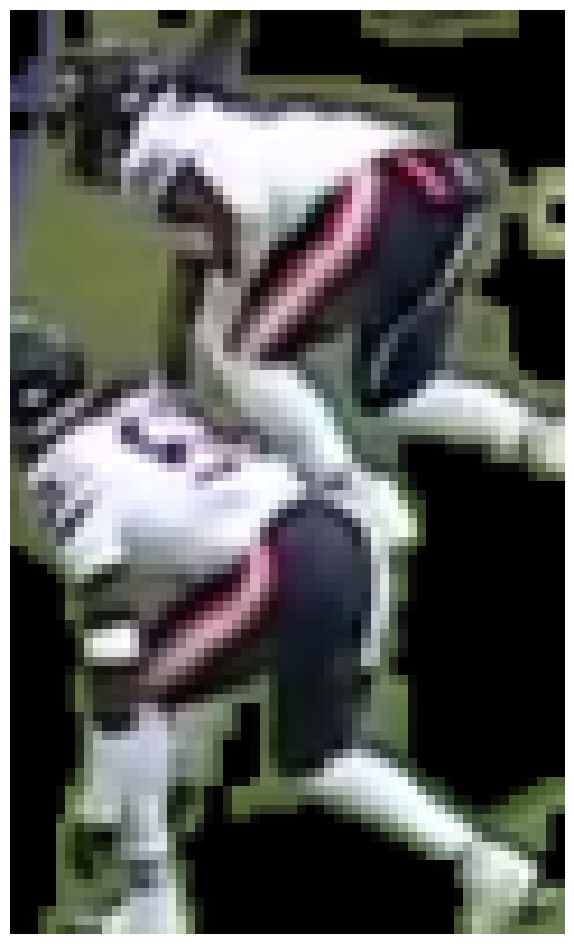

Chicago Bears 0.8266023 0.7894501

0: 384x640 25 Players, 20.8ms
Speed: 3.0ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 17.0ms
Speed: 3.5ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inferen

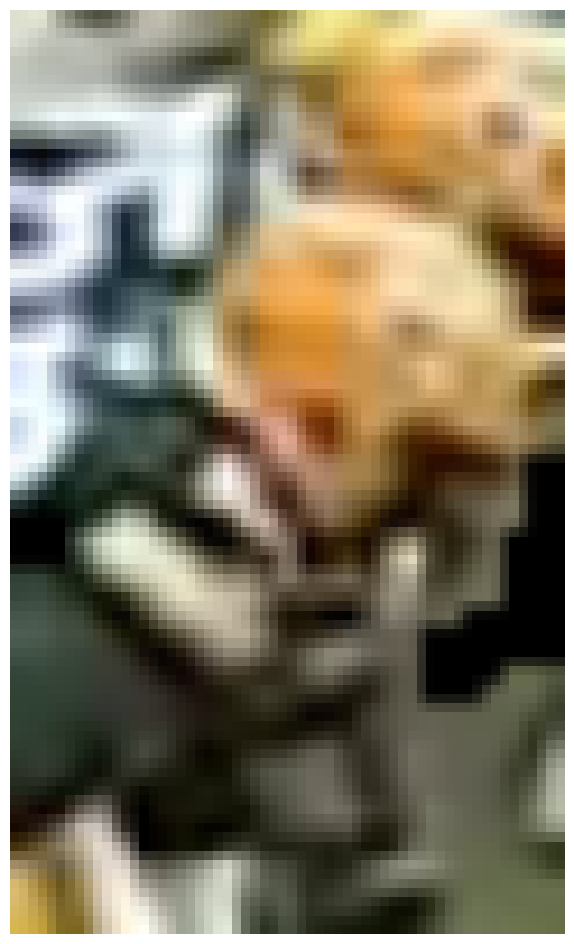

Green Bay Packers 0.591998 0.61395407

0: 384x640 27 Players, 32.1ms
Speed: 2.5ms preprocess, 32.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 28 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 28 Players, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 26 Players, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 26 Players, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(50, 53)
(100, 60)


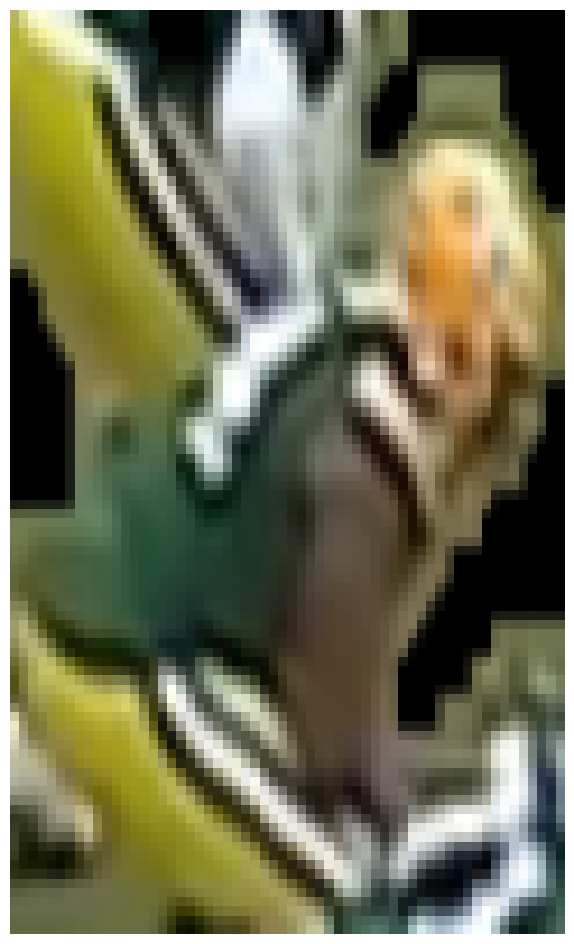

Green Bay Packers 0.61316097 0.6542405

0: 384x640 26 Players, 18.6ms
Speed: 8.5ms preprocess, 18.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 26 Players, 14.1ms
Speed: 4.8ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(60, 49)
(100, 60)


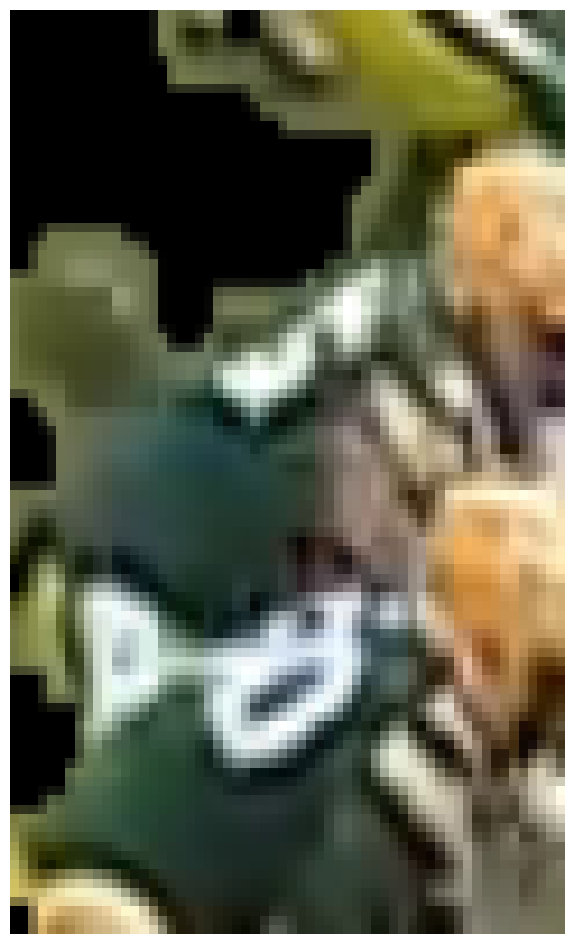

Green Bay Packers 0.69724244 0.76154095
(64, 41)
(100, 60)


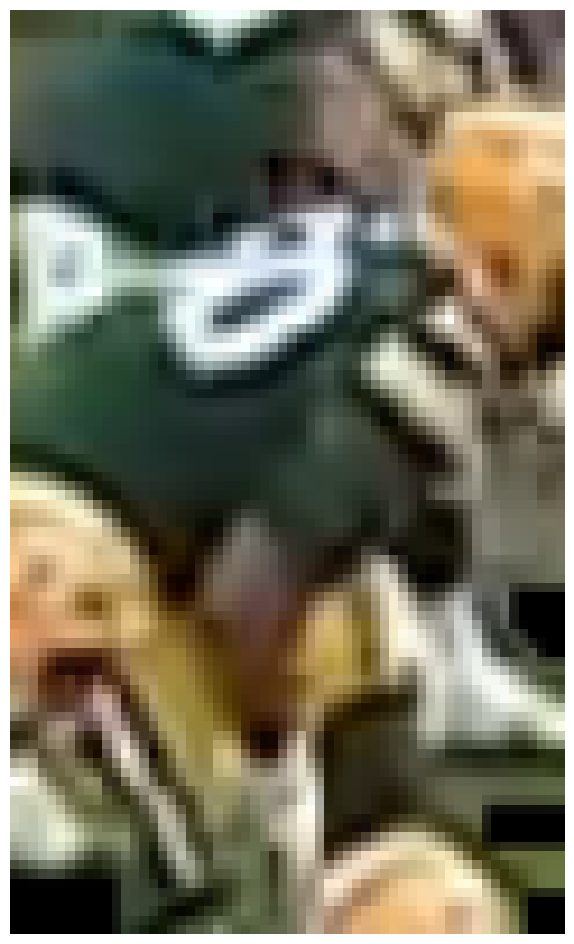

Green Bay Packers 0.68815196 0.7388847

0: 384x640 26 Players, 28.4ms
Speed: 2.7ms preprocess, 28.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 26 Players, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 21.1ms
Speed: 2.6ms preprocess, 21.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 19.5ms
Speed: 2.7ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 16.1ms
Speed: 2.6ms preprocess, 16.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 20.0ms
Speed: 4.1ms preprocess, 20.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 18.5ms
Speed: 2.4ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 14.8ms
Speed: 3.0ms preprocess, 14.8ms in

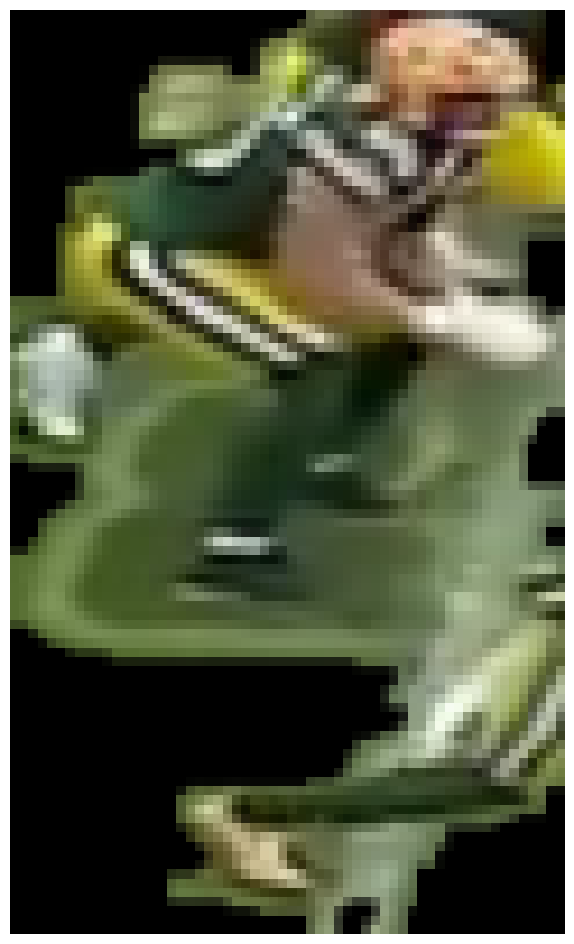

Green Bay Packers 0.46345592 0.5216106

0: 384x640 26 Players, 26.1ms
Speed: 2.6ms preprocess, 26.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(51, 41)
(100, 60)


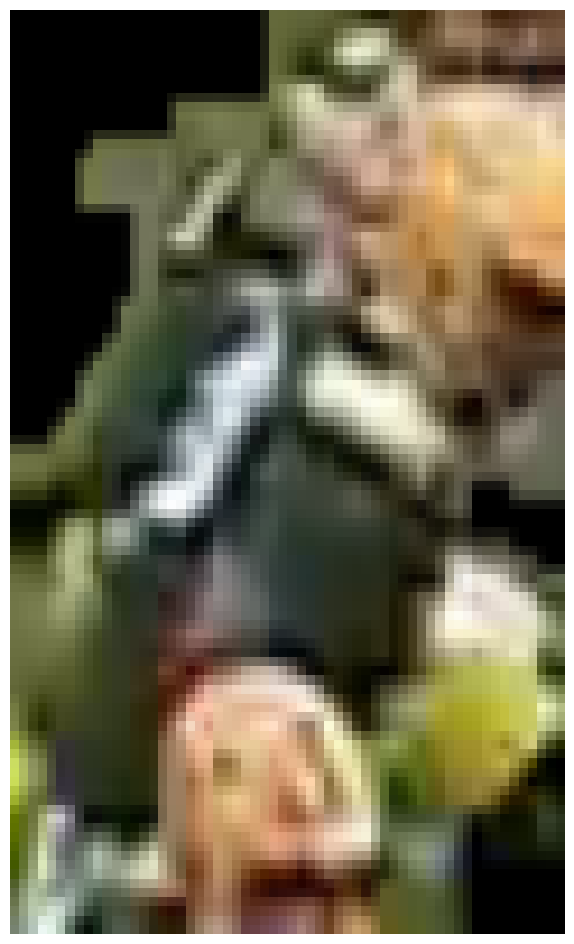

Green Bay Packers 0.61089605 0.6513574

0: 384x640 26 Players, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(69, 45)
(100, 60)


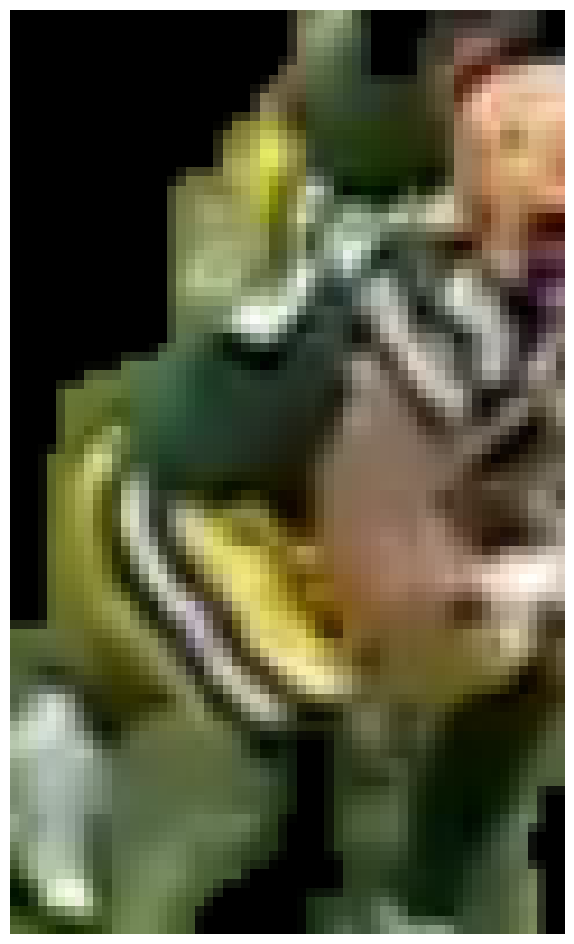

Green Bay Packers 0.57153827 0.64499027

0: 384x640 26 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
(53, 36)
(100, 60)


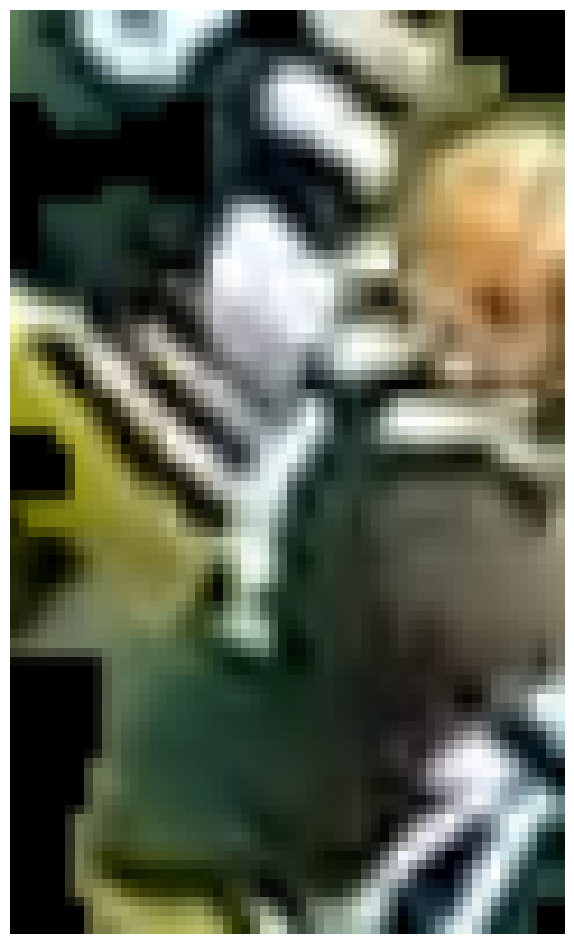

Green Bay Packers 0.72836304 0.78479046

0: 384x640 26 Players, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(84, 37)
(100, 60)


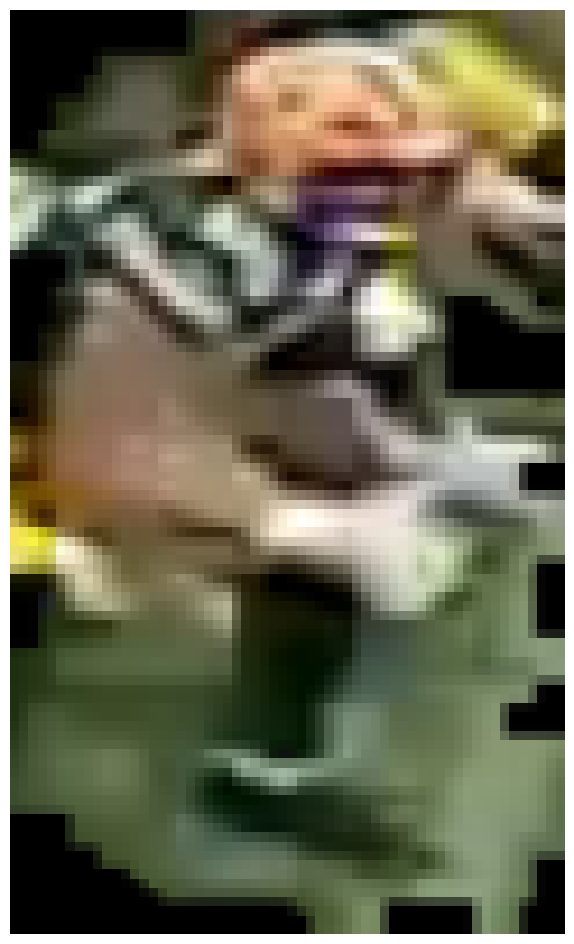

Green Bay Packers 0.58389616 0.6277768

0: 384x640 27 Players, 21.6ms
Speed: 8.7ms preprocess, 21.6ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)
(52, 33)
(100, 60)


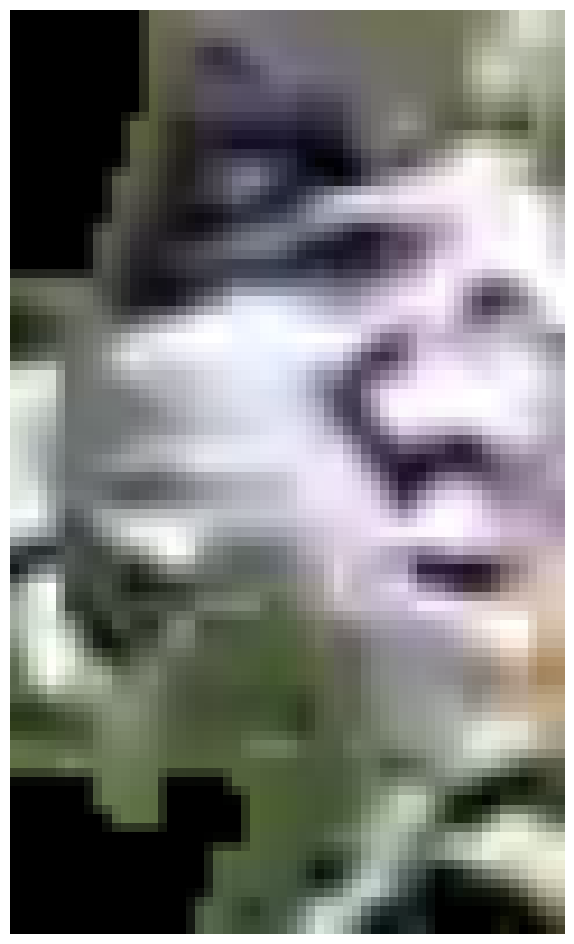

Chicago Bears 0.7480638 0.6528063

0: 384x640 23 Players, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(97, 43)
(100, 60)


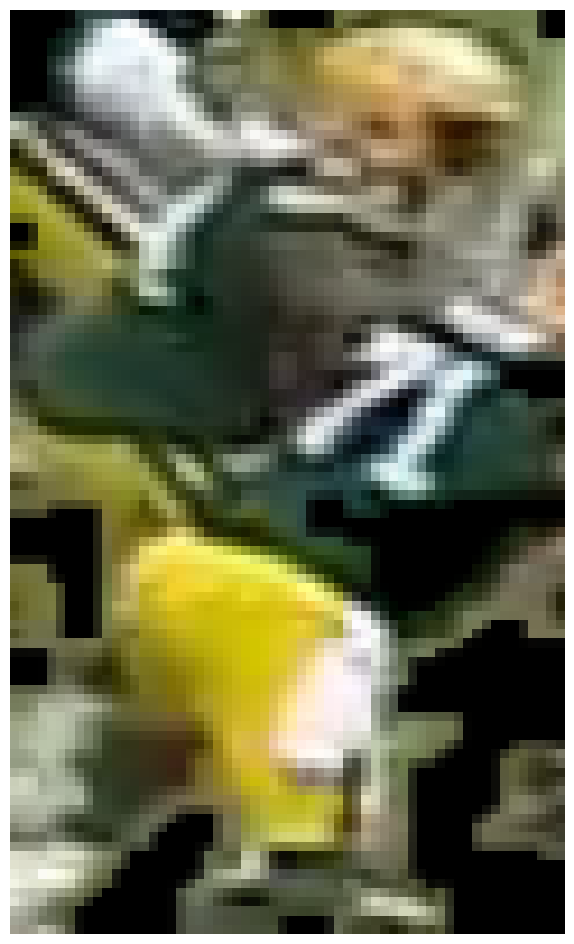

Green Bay Packers 0.58458066 0.6162613

0: 384x640 22 Players, 25.5ms
Speed: 2.5ms preprocess, 25.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 20.4ms
Speed: 2.4ms preprocess, 20.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 15.1ms
Speed: 4.4ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(31, 23)
(100, 60)
(88, 41)
(100, 60)


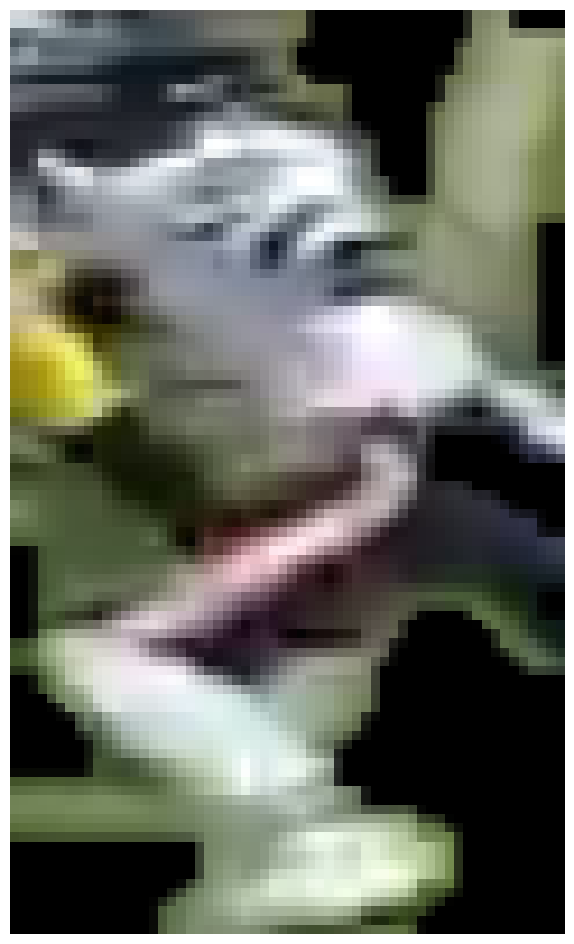

Chicago Bears 0.73322713 0.7027111

0: 384x640 23 Players, 22.2ms
Speed: 7.8ms preprocess, 22.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 22.0ms
Speed: 2.7ms preprocess, 22.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 22.6ms
Speed: 2.8ms preprocess, 22.6ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 18.9ms
Speed: 2.6ms preprocess, 18.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 16.7ms
Speed: 2.5ms preprocess, 16.7ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 18.7ms
Speed: 2.6ms preprocess, 18.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 19.7ms
Speed: 2.6ms preprocess, 19.7ms infere

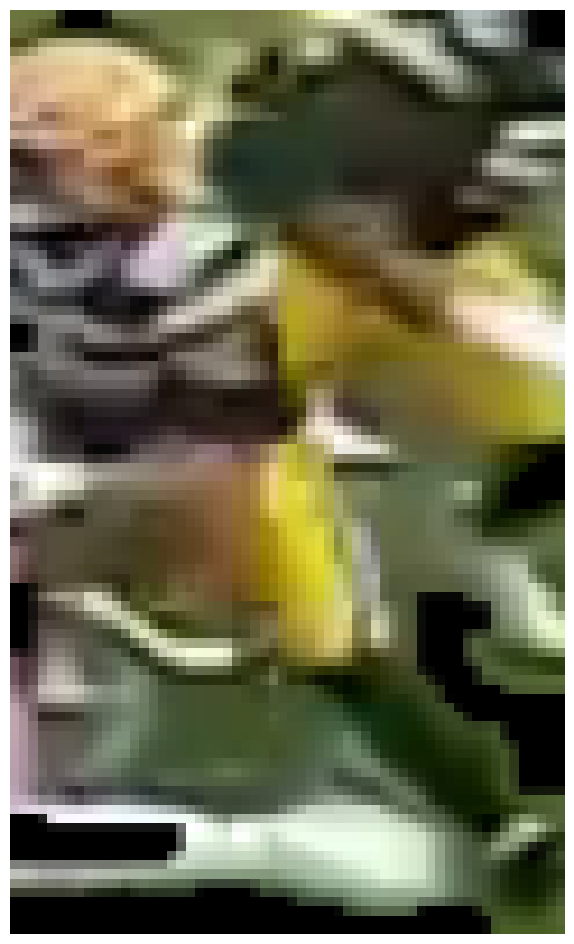

Green Bay Packers 0.62388825 0.6583719

0: 384x640 21 Players, 21.7ms
Speed: 3.9ms preprocess, 21.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 18.3ms
Speed: 2.5ms preprocess, 18.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(53, 37)
(100, 60)

0: 384x640 21 Players, 19.7ms
Speed: 2.6ms preprocess, 19.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(49, 32)
(100, 60)

0: 384x640 20 Players, 19.1ms
Speed: 2.5ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 16.9ms
Speed: 2.4ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(73, 35)
(100, 60)

0: 384x640 21 Players, 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 16.2ms
Speed: 2.5ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(87, 38)

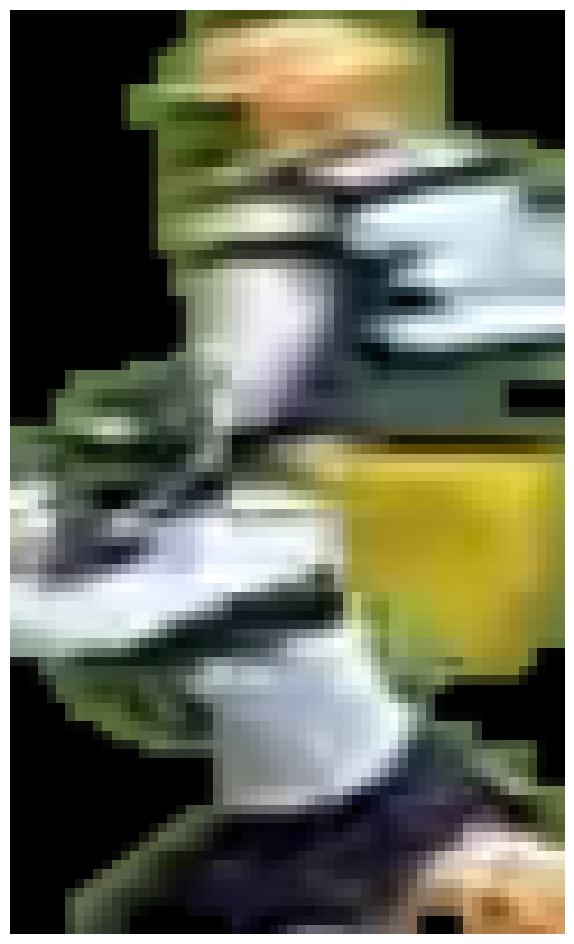

Green Bay Packers 0.7854871 0.80621034

0: 384x640 19 Players, 20.7ms
Speed: 2.5ms preprocess, 20.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 24.5ms
Speed: 2.4ms preprocess, 24.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 16.5ms
Speed: 2.6ms preprocess, 16.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 23.2ms
Speed: 2.7ms preprocess, 23.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 16.6ms
Speed: 2.8ms preprocess, 16.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 19.9ms
Speed: 3.5ms preprocess, 19.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.5ms
Speed: 3.8ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.9ms
Speed: 2.9ms preprocess, 12.9ms in

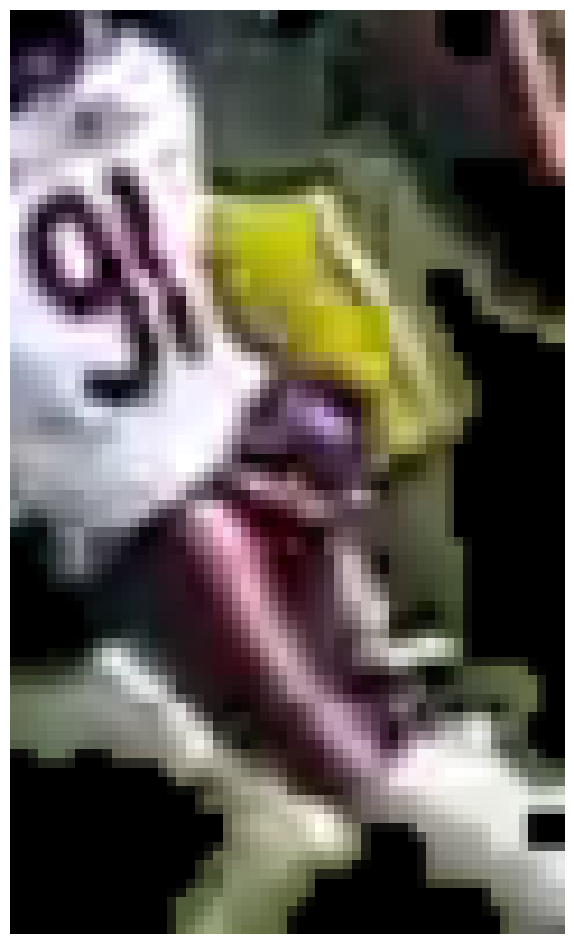

Chicago Bears 0.8118021 0.7636482

0: 384x640 20 Players, 17.1ms
Speed: 2.5ms preprocess, 17.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(70, 49)
(100, 60)

0: 384x640 21 Players, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(75, 58)
(100, 60)


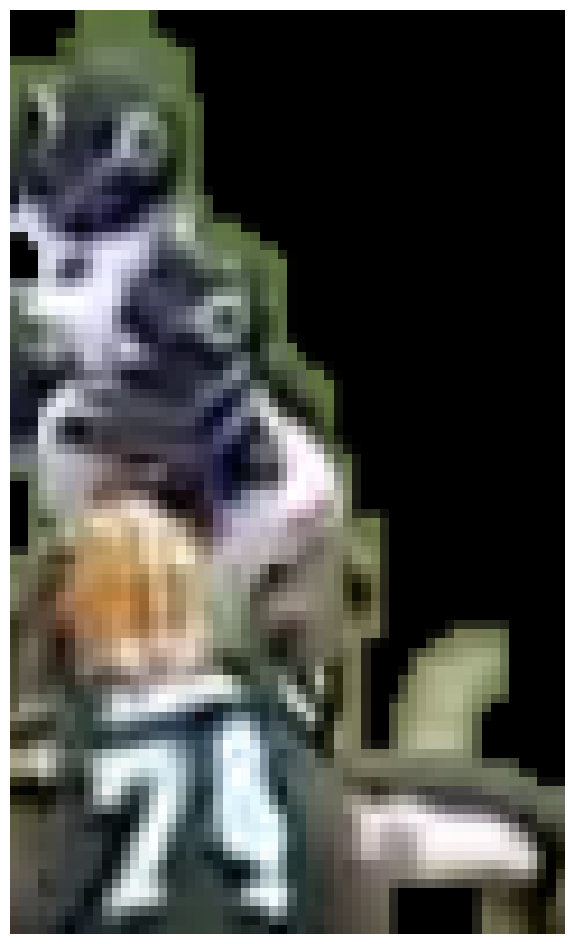

Green Bay Packers 0.8347418 0.8552825

0: 384x640 22 Players, 16.7ms
Speed: 2.6ms preprocess, 16.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
(44, 39)
(100, 60)

0: 384x640 20 Players, 14.5ms
Speed: 2.4ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(76, 51)
(100, 60)


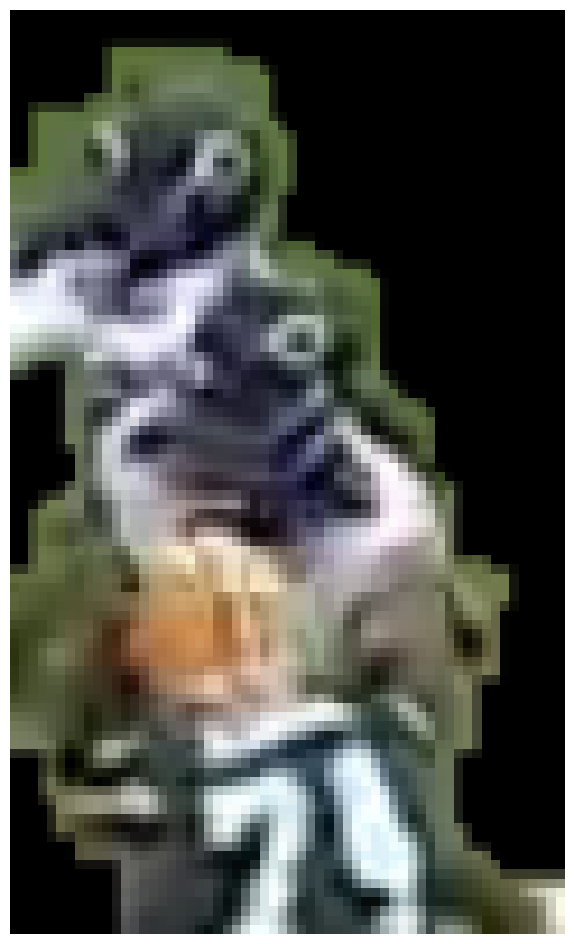

Green Bay Packers 0.80844903 0.84375644

0: 384x640 21 Players, 24.4ms
Speed: 2.8ms preprocess, 24.4ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(81, 44)
(100, 60)

0: 384x640 21 Players, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(72, 41)
(100, 60)


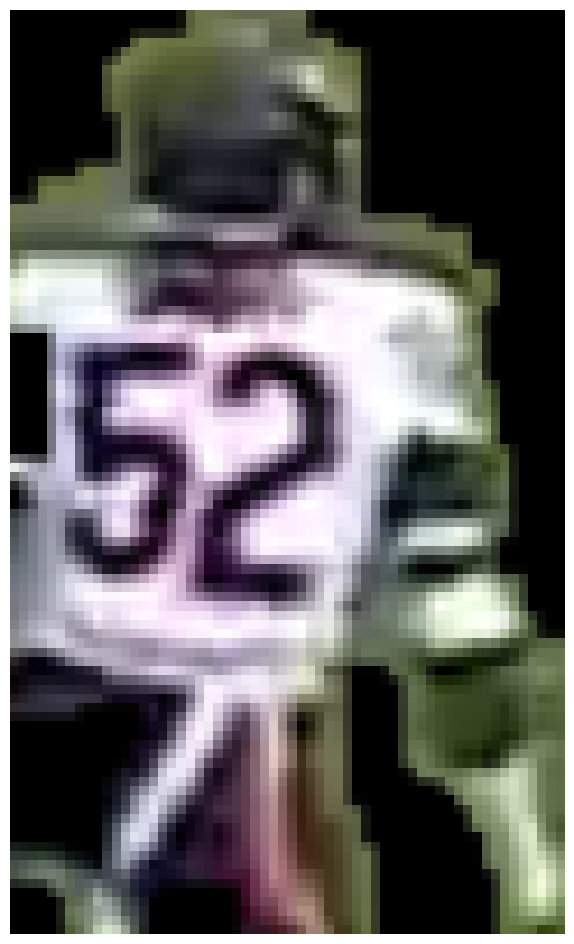

Chicago Bears 0.75670725 0.6974039

0: 384x640 20 Players, 29.3ms
Speed: 4.2ms preprocess, 29.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(83, 58)
(100, 60)


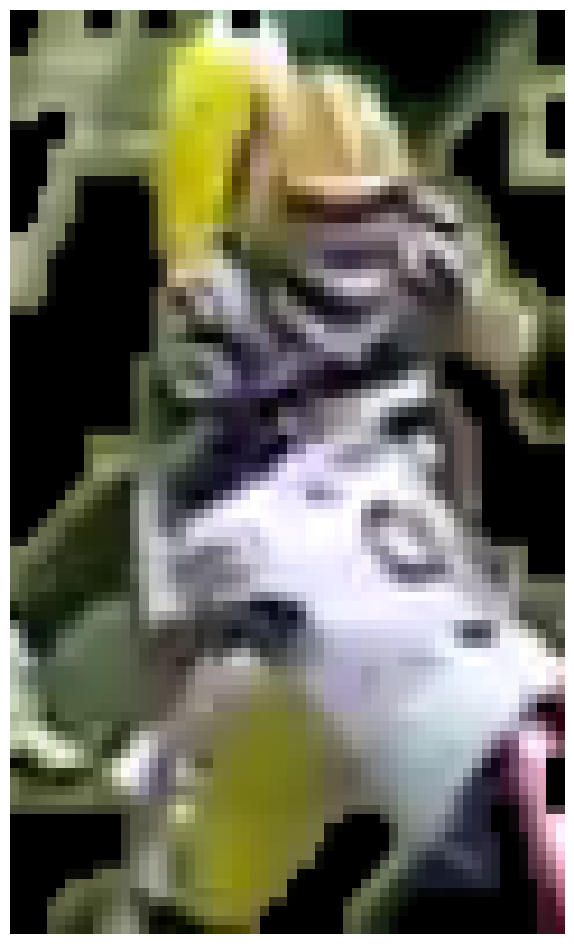

Chicago Bears 0.7183267 0.6932118

0: 384x640 17 Players, 22.7ms
Speed: 5.4ms preprocess, 22.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.8ms
Speed: 3.2ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(111, 44)
(100, 60)


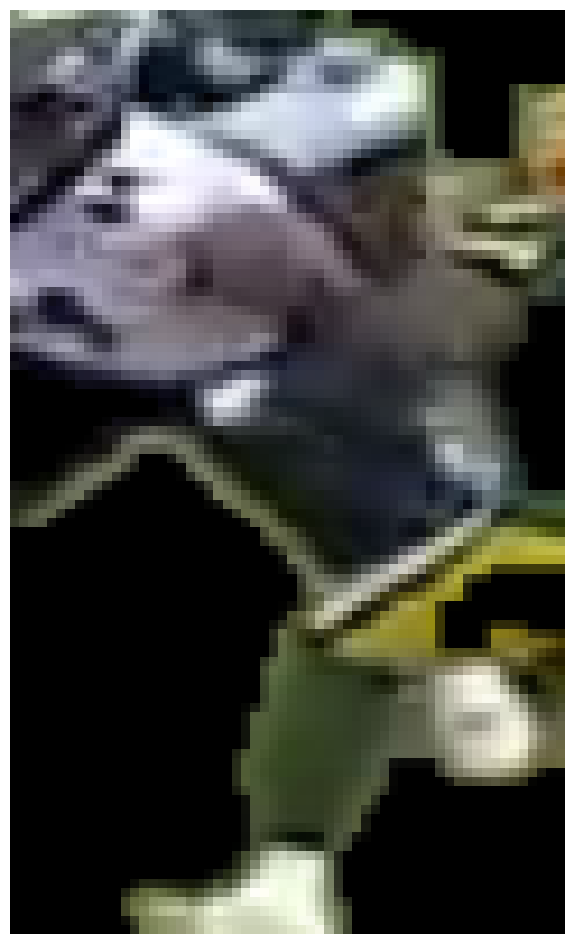

Green Bay Packers 0.7162489 0.74937975

0: 384x640 16 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms in

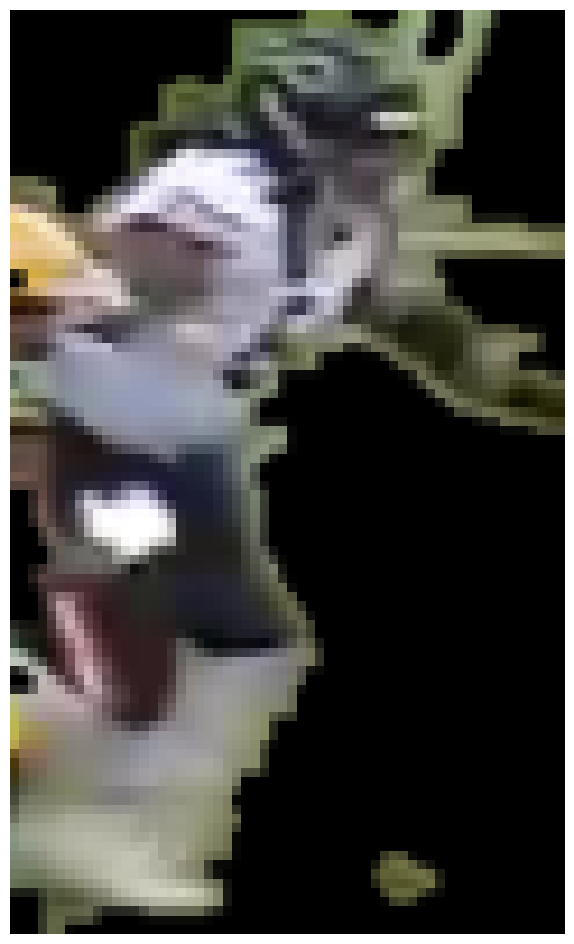

Chicago Bears 0.7602522 0.7335899

0: 384x640 12 Players, 25.0ms
Speed: 3.2ms preprocess, 25.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 15.8ms
Speed: 4.7ms preprocess, 15.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(59, 58)
(100, 60)


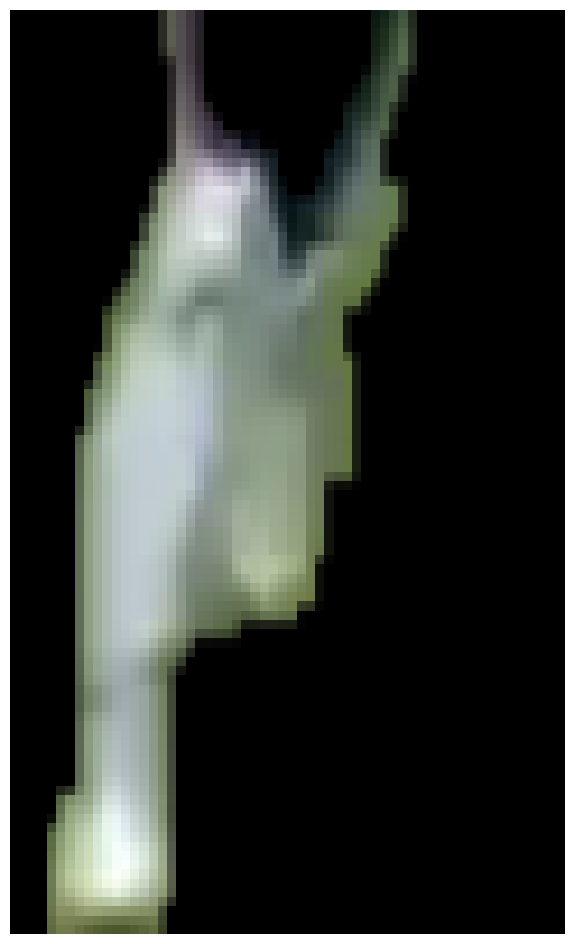

Chicago Bears 0.66104084 0.61682546

0: 384x640 13 Players, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(189, 113)
(100, 60)


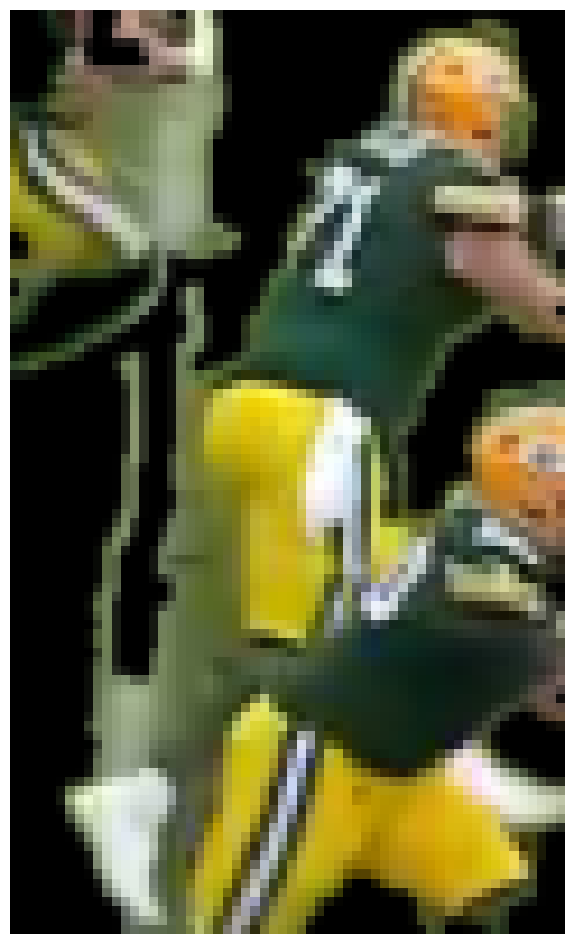

Green Bay Packers 0.5943952 0.6498768
(154, 74)
(100, 60)


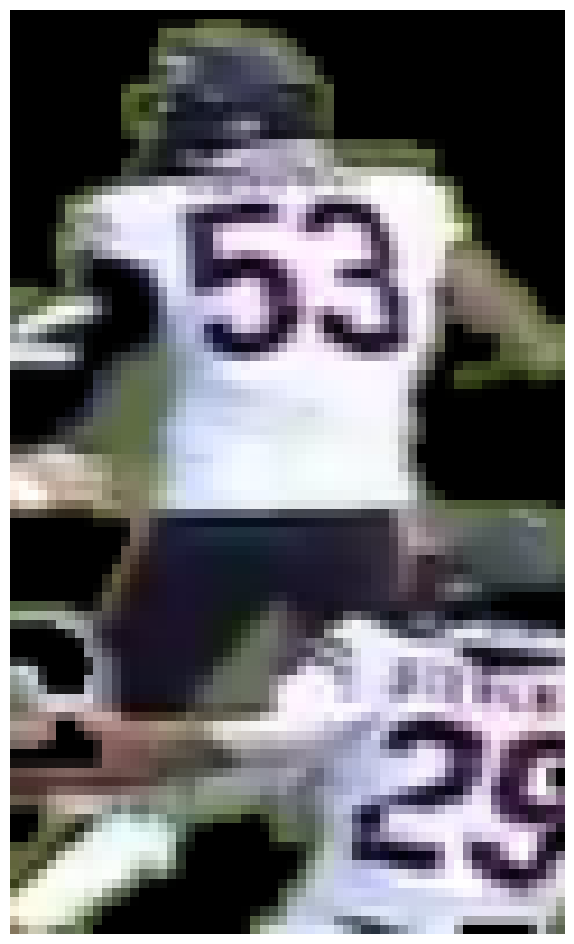

Chicago Bears 0.81348026 0.7424241

0: 384x640 14 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 14.3ms
Speed: 5.5ms preprocess, 14.3ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.7ms
Speed: 2.3ms preprocess, 13.7ms infere

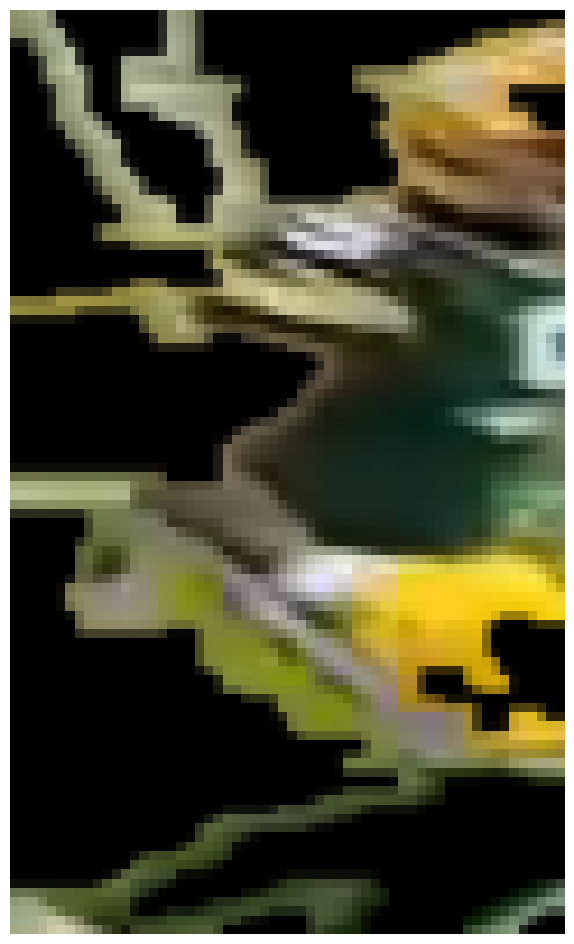

Green Bay Packers 0.51478887 0.58142054

0: 384x640 11 Players, 15.7ms
Speed: 4.1ms preprocess, 15.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(78, 58)
(100, 60)


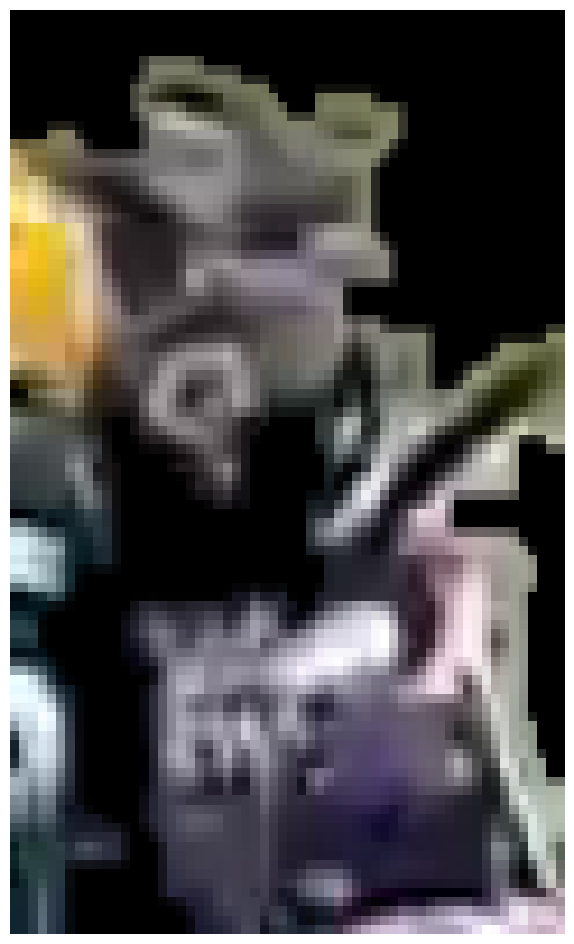

Chicago Bears 0.78306663 0.74998814

0: 384x640 10 Players, 22.4ms
Speed: 2.5ms preprocess, 22.4ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 18.5ms
Speed: 2.4ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 15.4ms
Speed: 2.6ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 29.5ms
Speed: 4.2ms preprocess, 29.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 22.9ms
Speed: 2.4ms preprocess, 22.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 15.4ms
Speed: 2.5ms preprocess, 15.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 16.7ms
Speed: 2.7ms preprocess, 16.7ms inferen

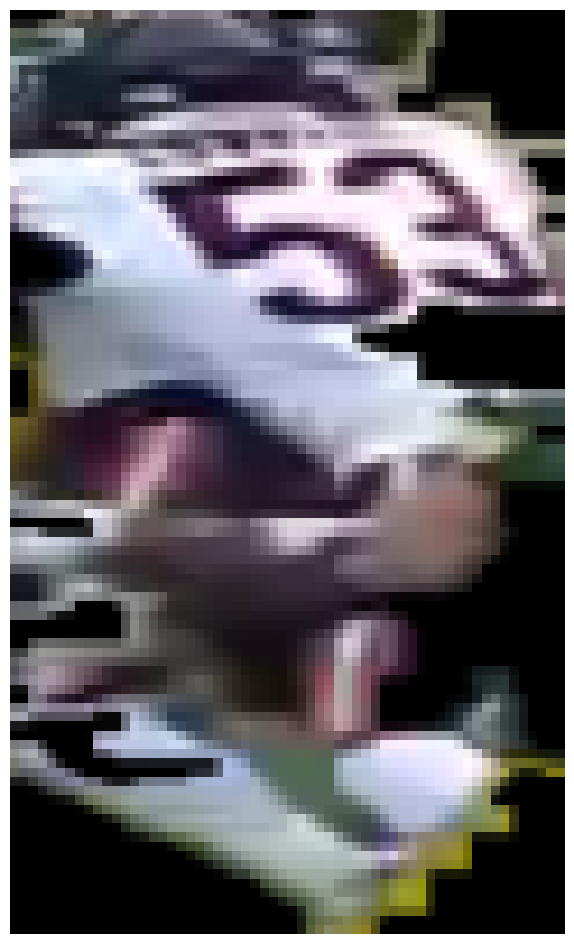

Chicago Bears 0.81234735 0.7669428

0: 384x640 10 Players, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 17.4ms
Speed: 2.5ms preprocess, 17.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 22.3ms
Speed: 2.4ms preprocess, 22.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(207, 33)
(100, 60)

0: 384x640 11 Players, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(78, 53)
(100, 60)


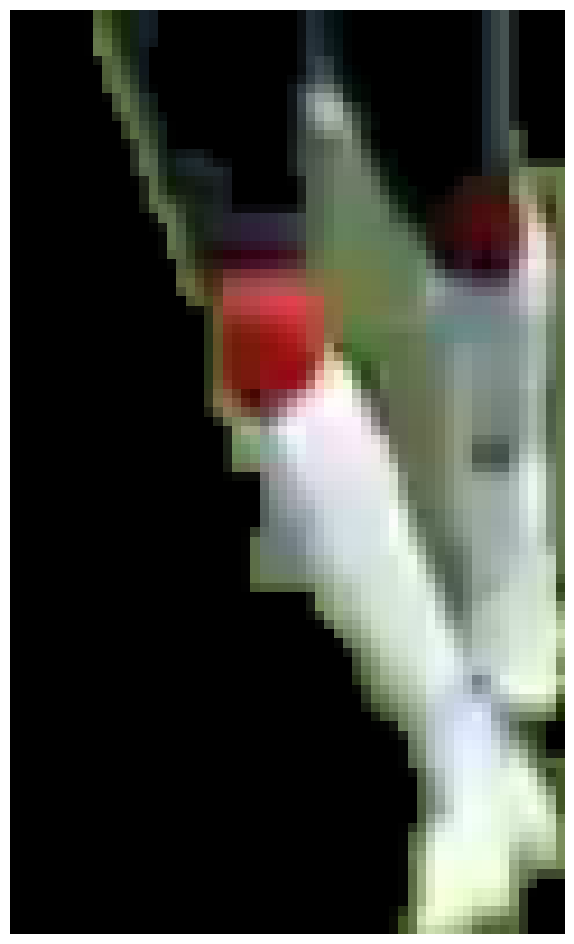

Chicago Bears 0.7729599 0.7298382
(220, 41)
(100, 60)

0: 384x640 11 Players, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(231, 48)
(100, 60)


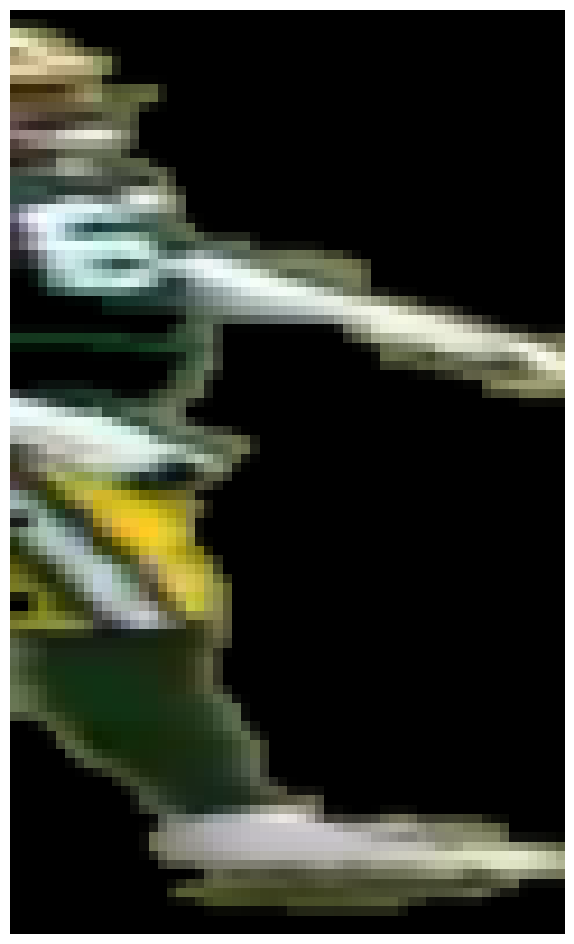

Green Bay Packers 0.6634941 0.6862042

0: 384x640 11 Players, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 16.4ms
Speed: 2.6ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.6ms
Speed: 4.0ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inf

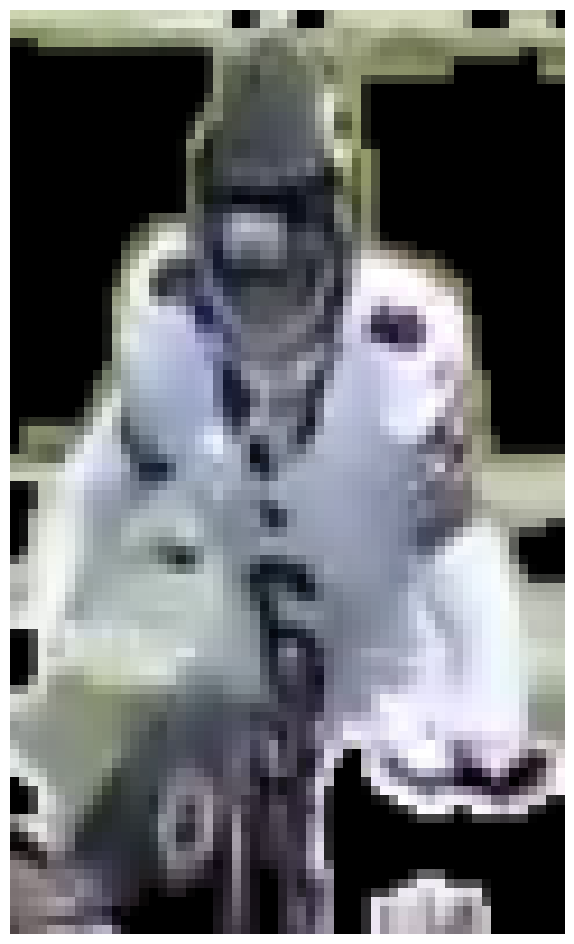

Chicago Bears 0.7243761 0.6699405

0: 384x640 11 Players, 15.9ms
Speed: 2.5ms preprocess, 15.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 21.2ms
Speed: 4.7ms preprocess, 21.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(198, 70)
(100, 60)

0: 384x640 10 Players, 16.0ms
Speed: 2.5ms preprocess, 16.0ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 15.6ms
Speed: 5.4ms preprocess, 15.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 19.3ms
Speed: 2.5ms preprocess, 19.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 17.2ms
Speed: 3.9ms prepro

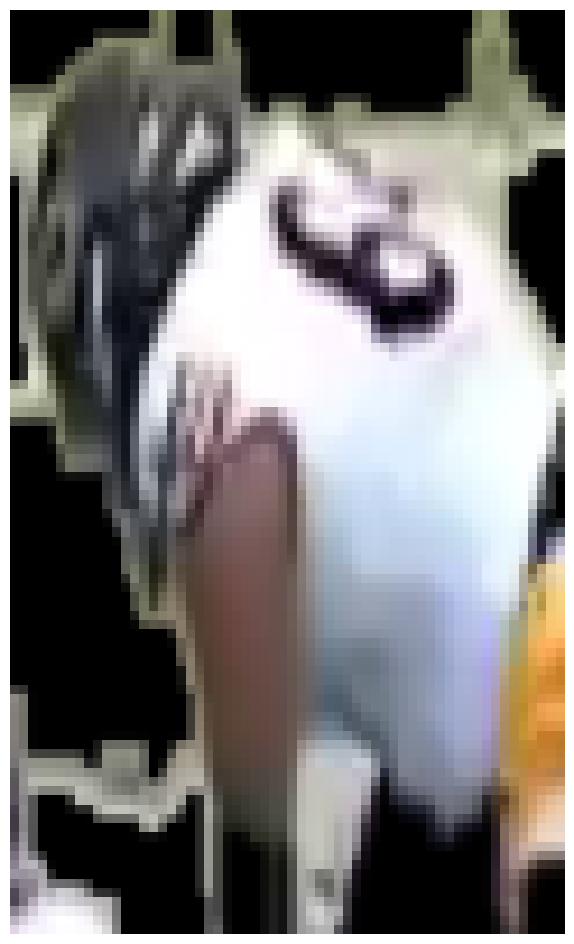

Chicago Bears 0.80905724 0.6946143

0: 384x640 10 Players, 18.3ms
Speed: 2.6ms preprocess, 18.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.2ms
Speed: 5.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(64, 61)
(100, 60)


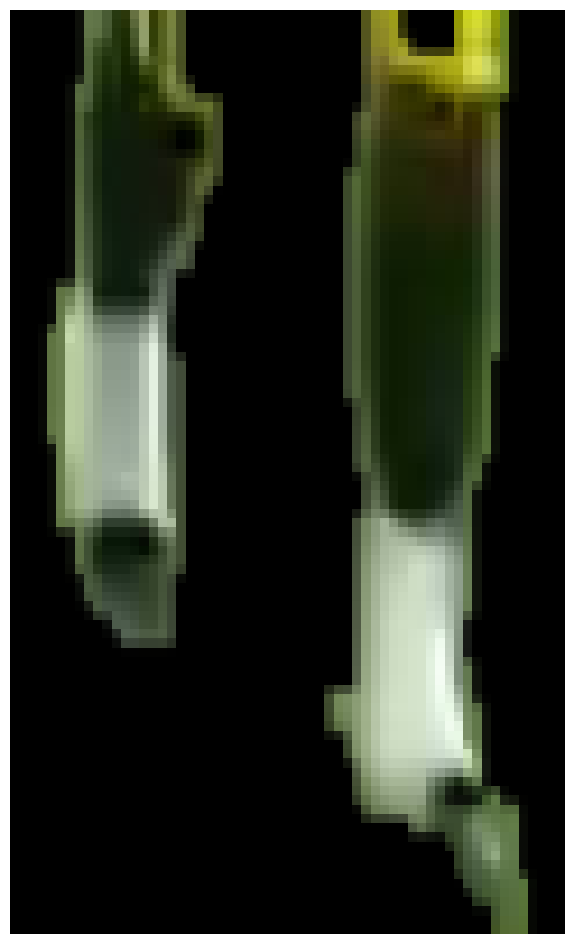

Green Bay Packers 0.37436163 0.43967888

0: 384x640 10 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 17.0ms
Speed: 2.5ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 16.3ms
Speed: 2.9ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(208, 54)
(100, 60)


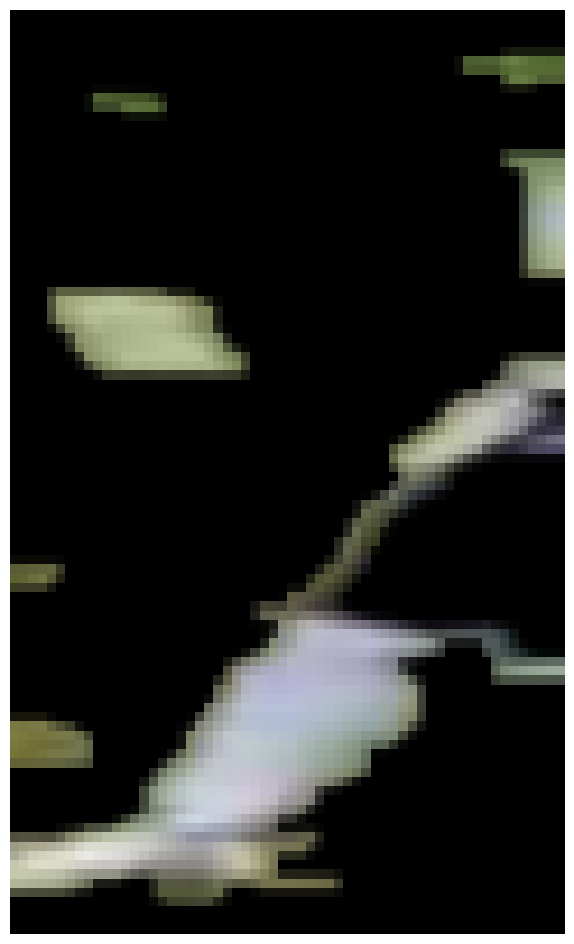

Chicago Bears 0.6351883 0.59692943

0: 384x640 12 Players, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.8ms
Speed: 2.6ms preprocess, 14.8ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 17.5ms
Speed: 2.5ms preprocess, 17.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 26.4ms
Speed: 3.3ms preprocess, 26.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 16.0ms
Speed: 2.7ms preprocess, 16.0ms infere

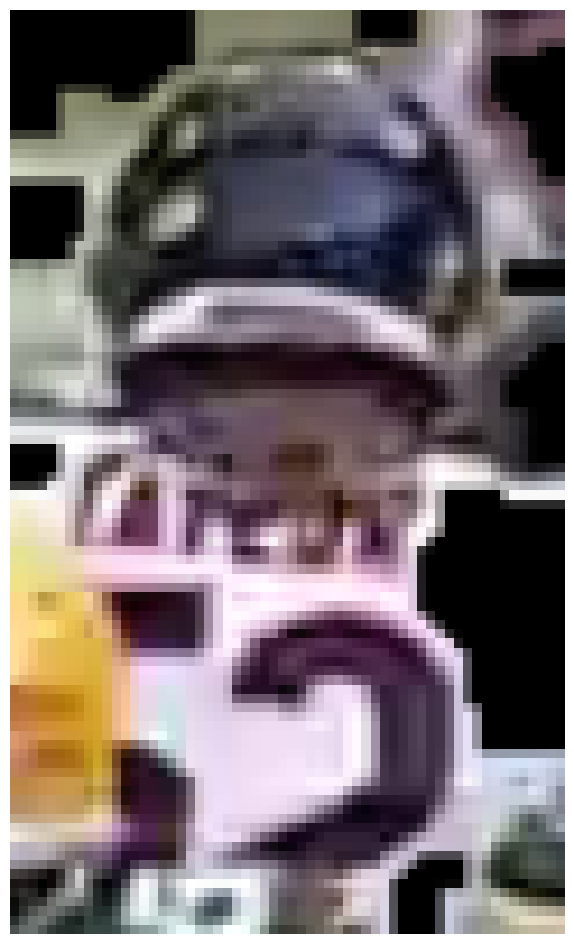

Chicago Bears 0.8053753 0.70925885

0: 384x640 14 Players, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(232, 34)
(100, 60)


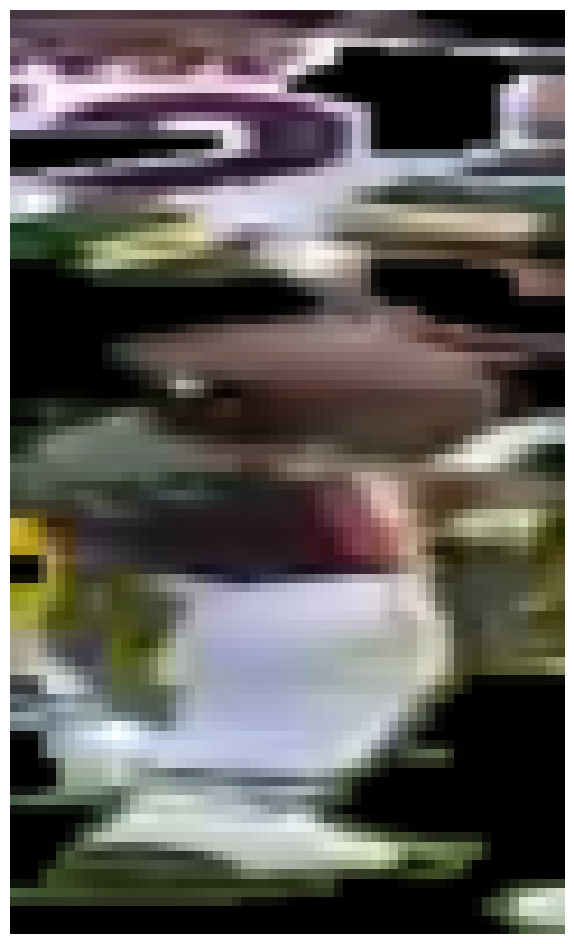

Chicago Bears 0.8678916 0.8425761

0: 384x640 16 Players, 20.3ms
Speed: 8.7ms preprocess, 20.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(184, 92)
(100, 60)


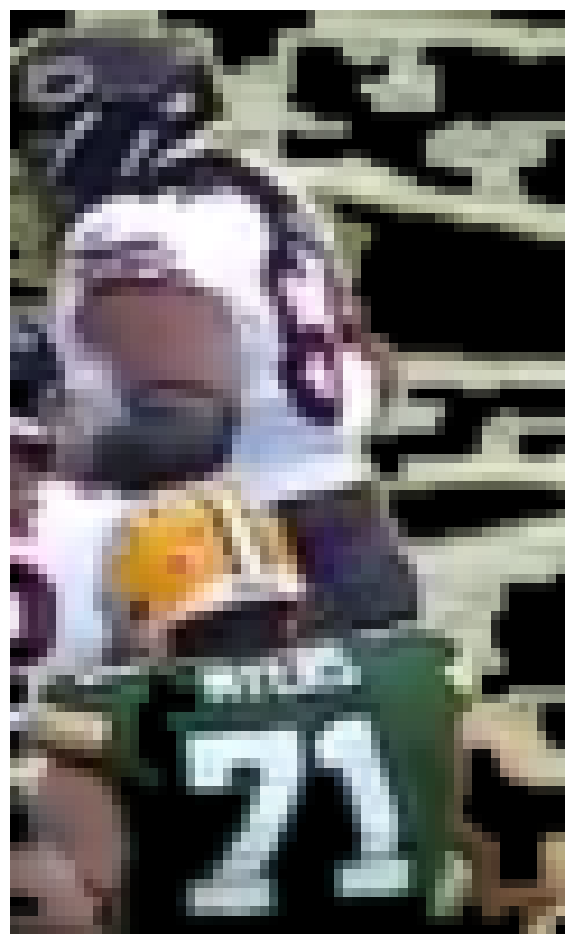

Chicago Bears 0.8255206 0.7771159
(231, 35)
(100, 60)


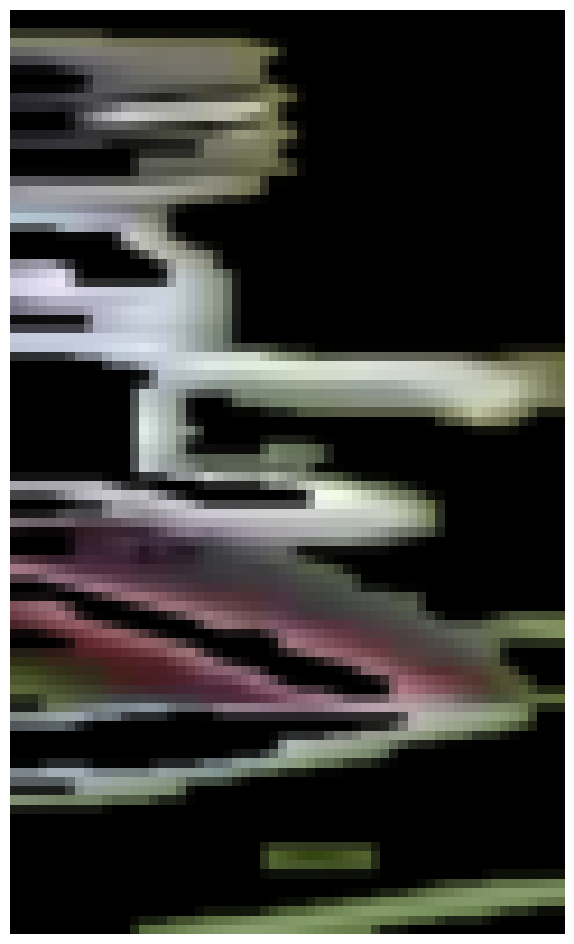

Chicago Bears 0.7393066 0.68714064

0: 384x640 15 Players, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.3ms
Speed: 3.0ms preprocess, 12.3ms infere

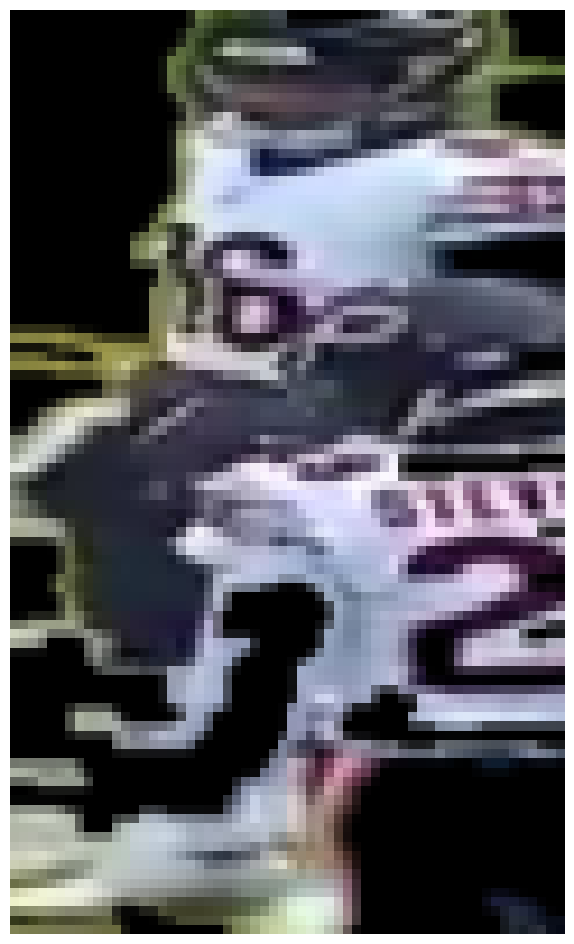

Green Bay Packers 0.69573617 0.72608054

0: 384x640 13 Players, 25.9ms
Speed: 2.5ms preprocess, 25.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 16.0ms
Speed: 2.5ms preprocess, 16.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 20.1ms
Speed: 4.2ms preprocess, 20.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
(95, 128)
(100, 60)


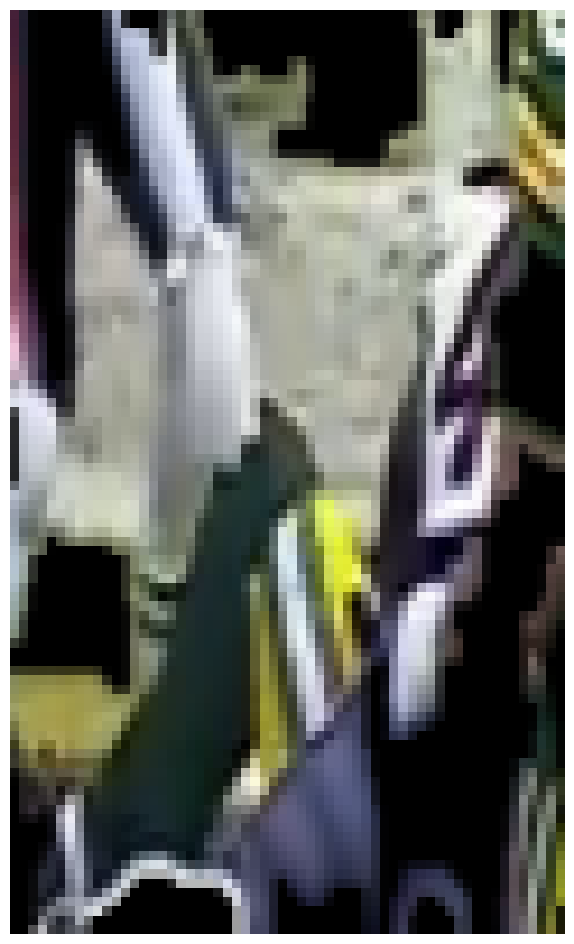

Chicago Bears 0.7433934 0.7164014

0: 384x640 11 Players, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(267, 79)
(100, 60)

0: 384x640 11 Players, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(266, 78)
(100, 60)


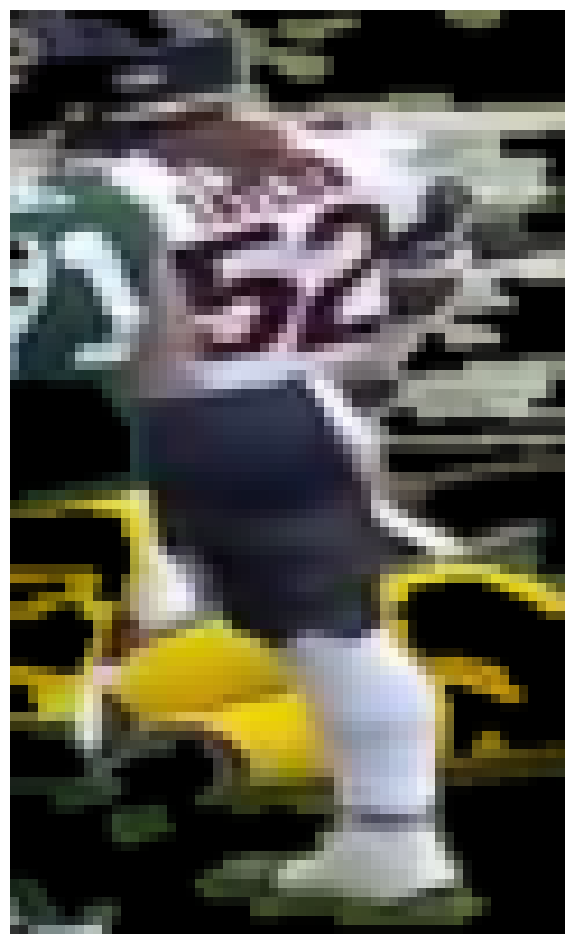

Chicago Bears 0.7988007 0.7787478

0: 384x640 12 Players, 23.8ms
Speed: 4.6ms preprocess, 23.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.7ms
Speed: 2.5ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.9ms
Speed: 3.3ms preprocess, 12.9ms inferen

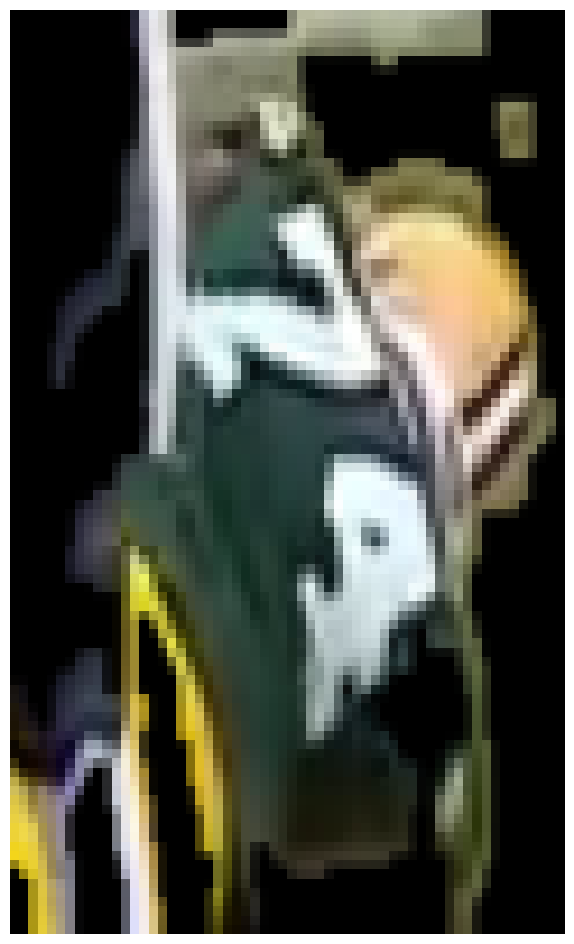

Green Bay Packers 0.7915423 0.82050383

0: 384x640 13 Players, 29.5ms
Speed: 2.6ms preprocess, 29.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 19.7ms
Speed: 4.1ms preprocess, 19.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 15.0ms
Speed: 2.6ms preprocess, 15.0ms inf

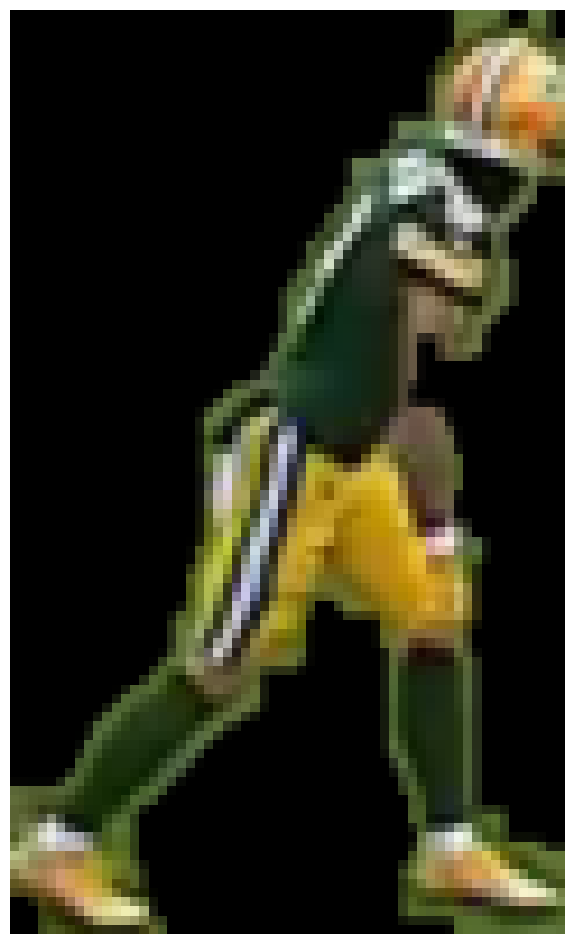

Green Bay Packers 0.48771667 0.5817757
(103, 39)
(100, 60)


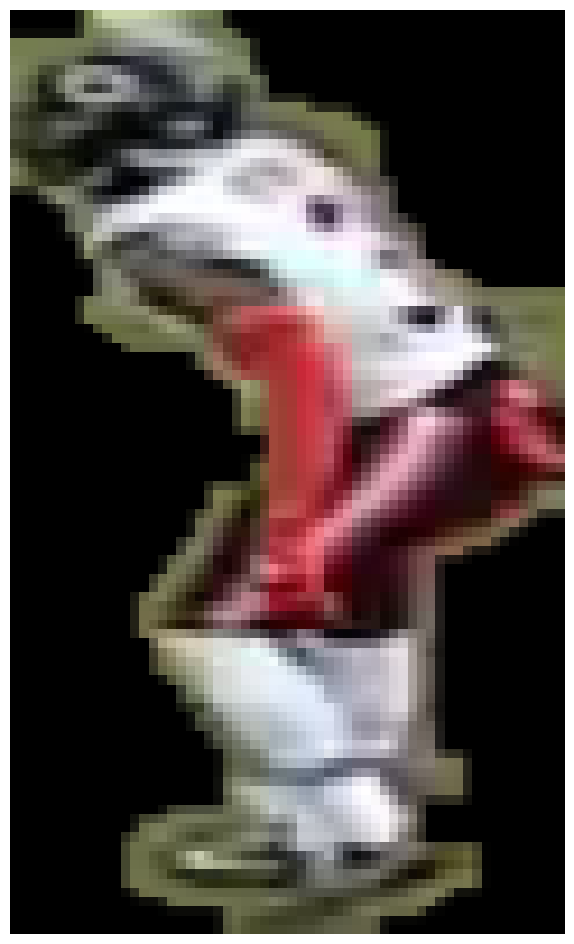

Chicago Bears 0.8059332 0.7536722
(94, 66)
(100, 60)


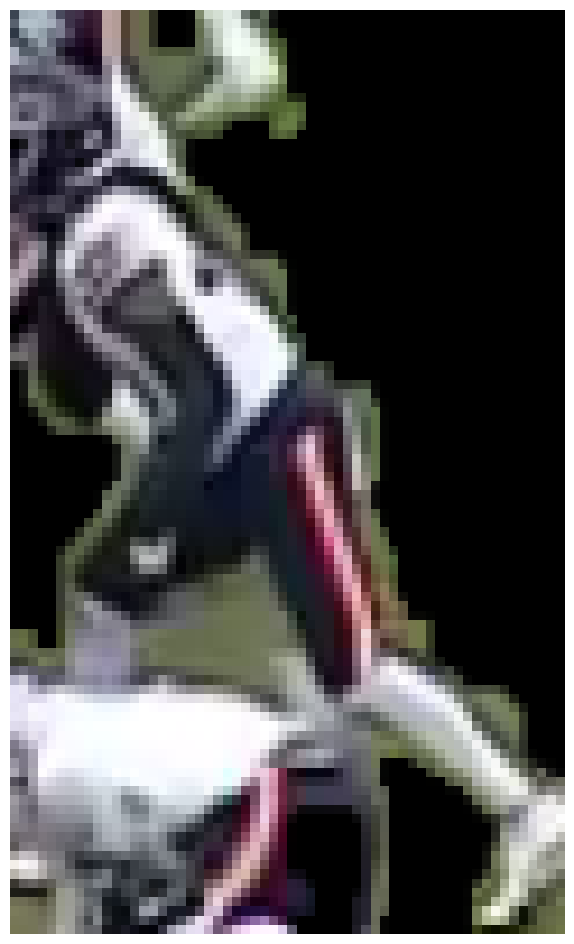

Chicago Bears 0.7793471 0.74584424
(88, 50)
(100, 60)


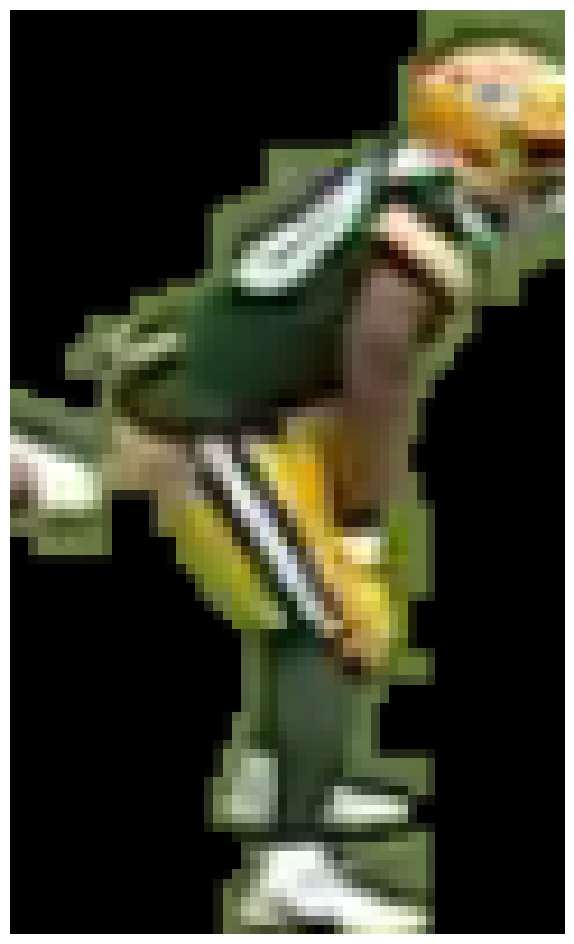

Green Bay Packers 0.54304224 0.6053659
(101, 68)
(100, 60)
(105, 60)
(100, 60)


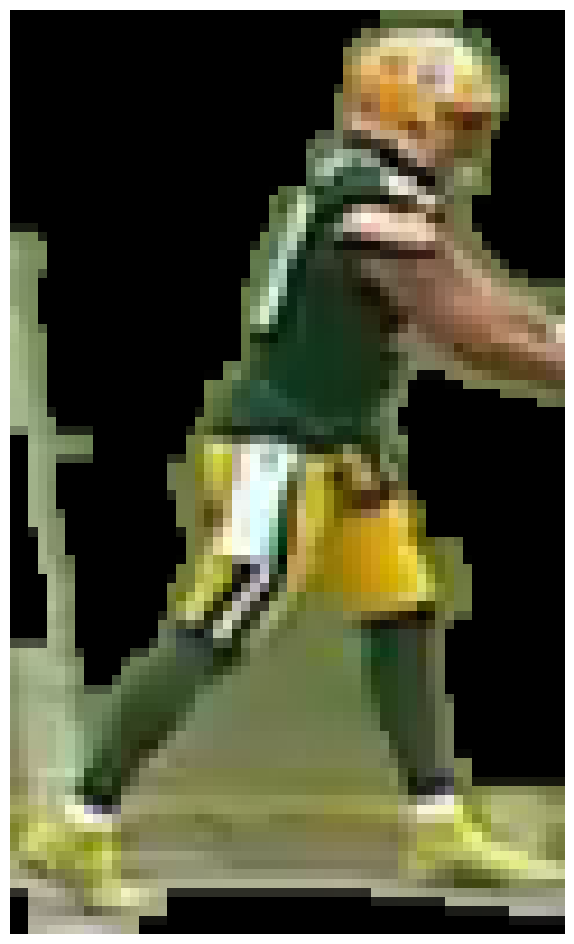

Green Bay Packers 0.47541478 0.52761984
(80, 40)
(100, 60)
(123, 41)
(100, 60)
(82, 48)
(100, 60)


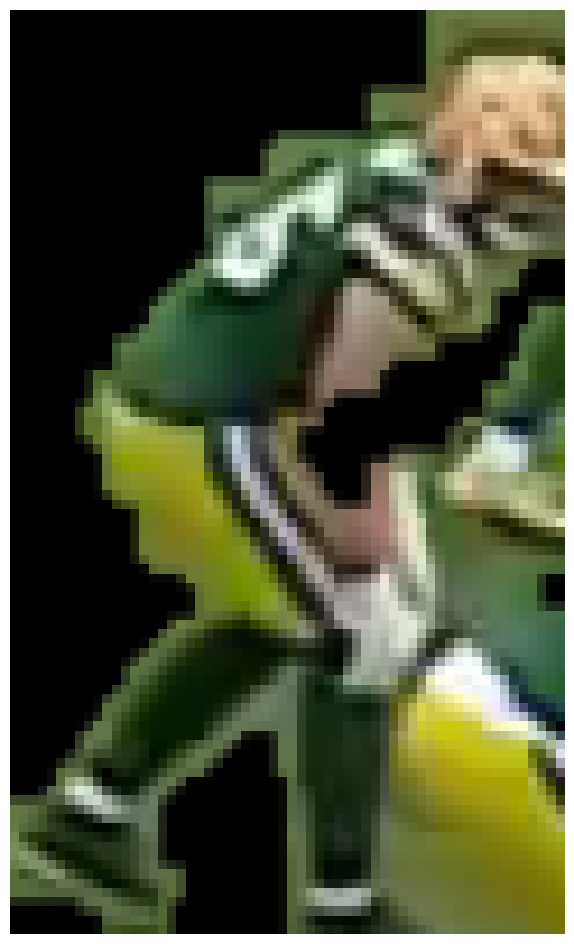

Green Bay Packers 0.54145867 0.62189573
(82, 66)
(100, 60)


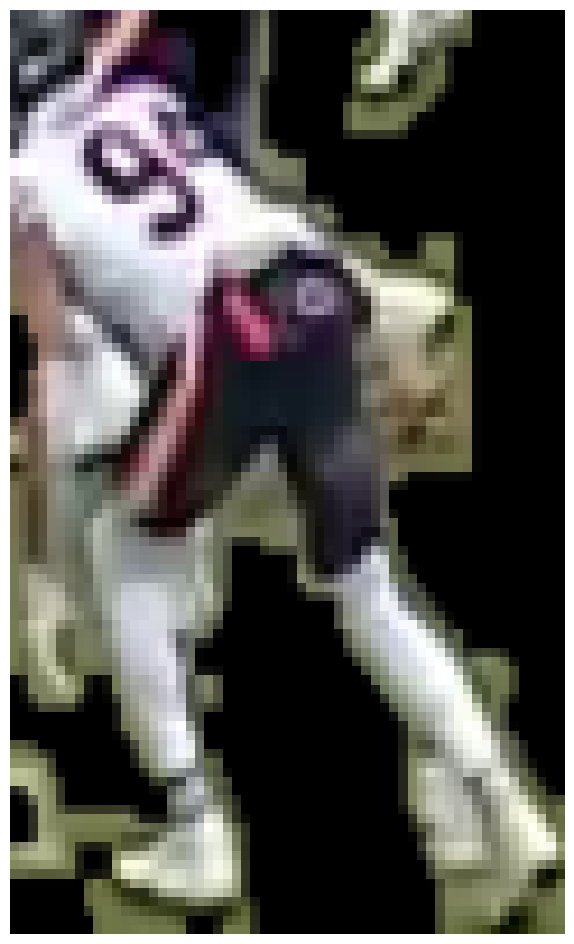

Chicago Bears 0.7031124 0.643365
(87, 38)
(100, 60)


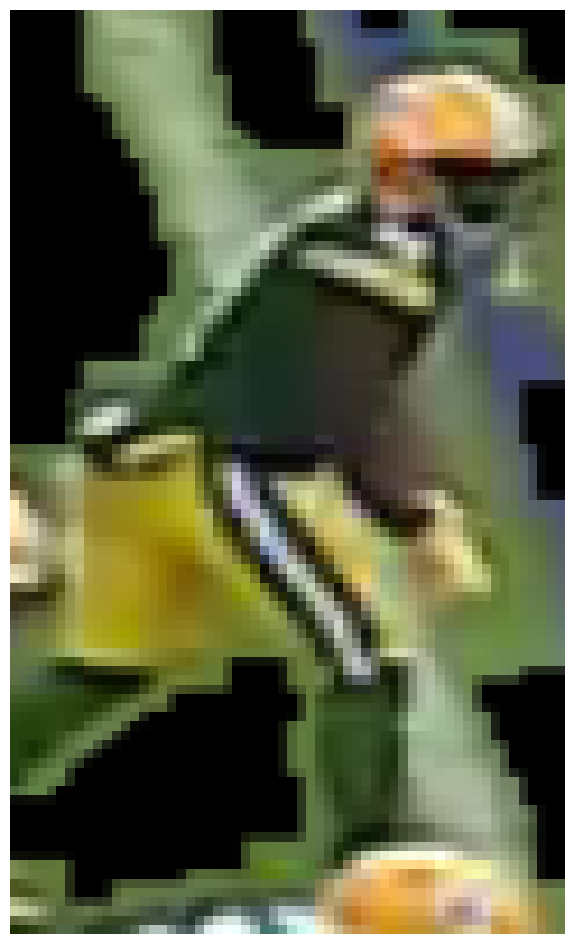

Green Bay Packers 0.5105042 0.57445085
(75, 60)
(100, 60)


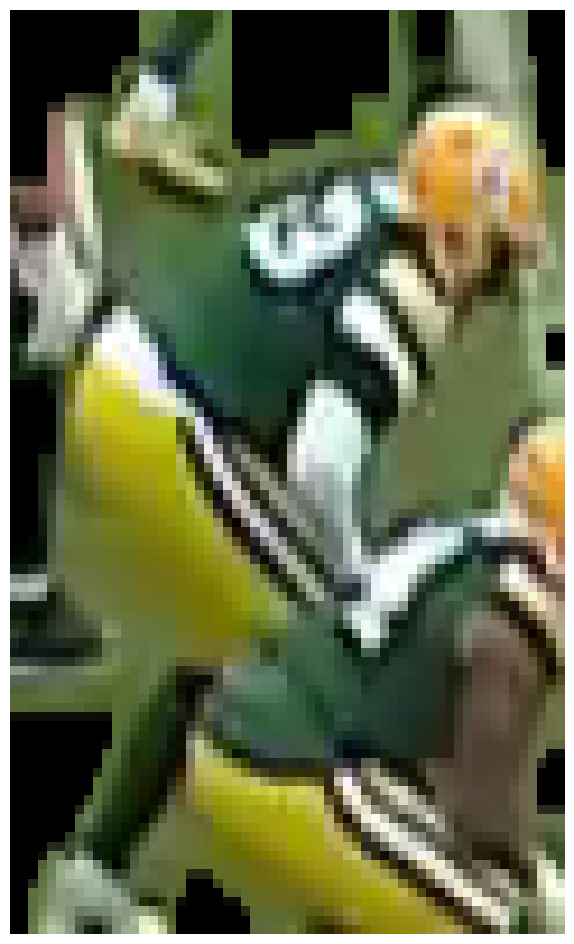

Green Bay Packers 0.6294673 0.6901014
(94, 28)
(100, 60)


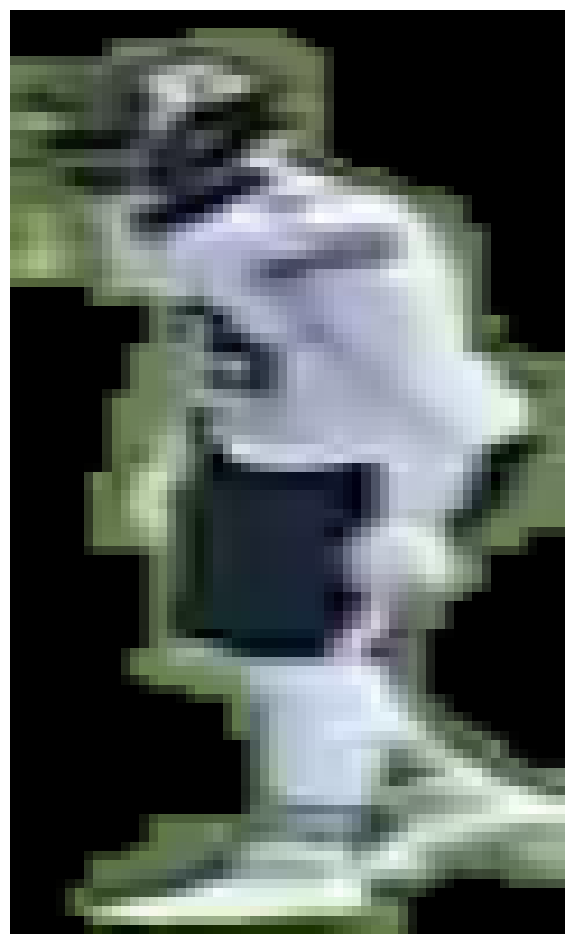

Green Bay Packers 0.67153287 0.69735664
(61, 47)
(100, 60)


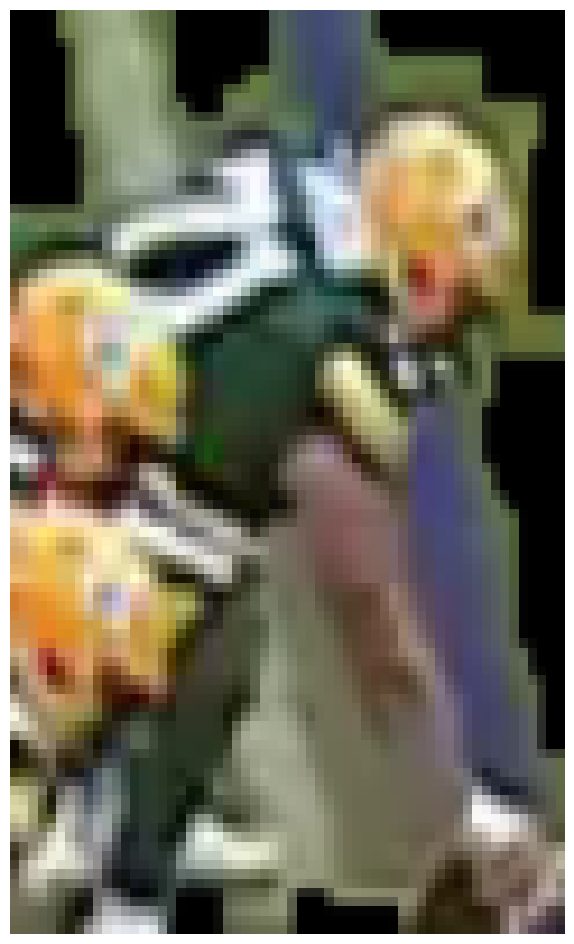

Green Bay Packers 0.727437 0.76470906
(78, 58)
(100, 60)
(57, 51)
(100, 60)


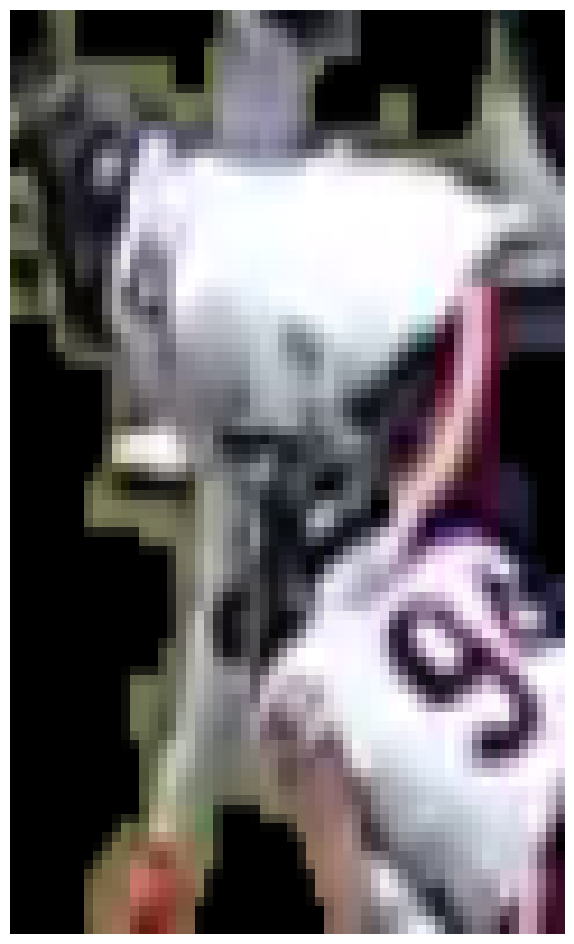

Chicago Bears 0.7944935 0.6782951
(83, 34)
(100, 60)
(60, 51)
(100, 60)


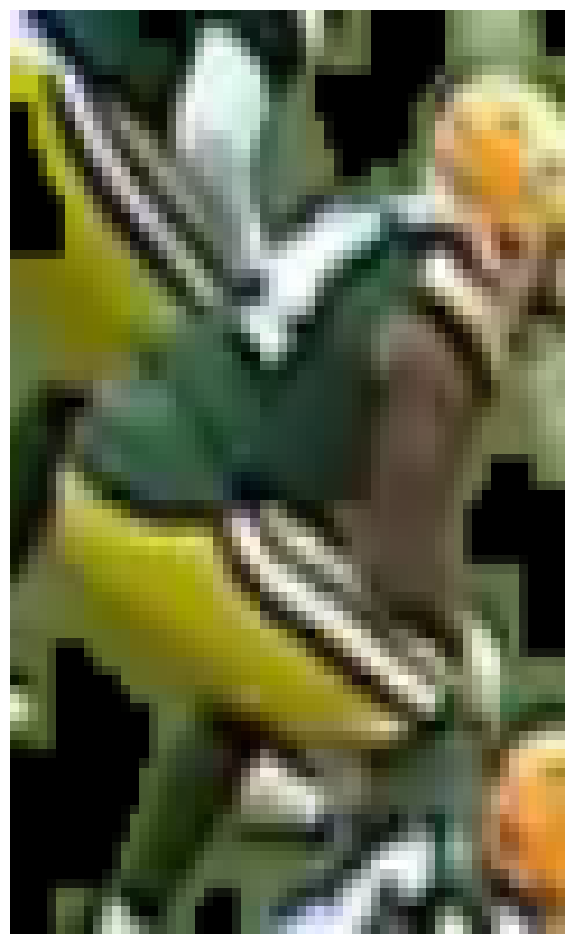

Green Bay Packers 0.6411266 0.7051951
(56, 53)
(100, 60)


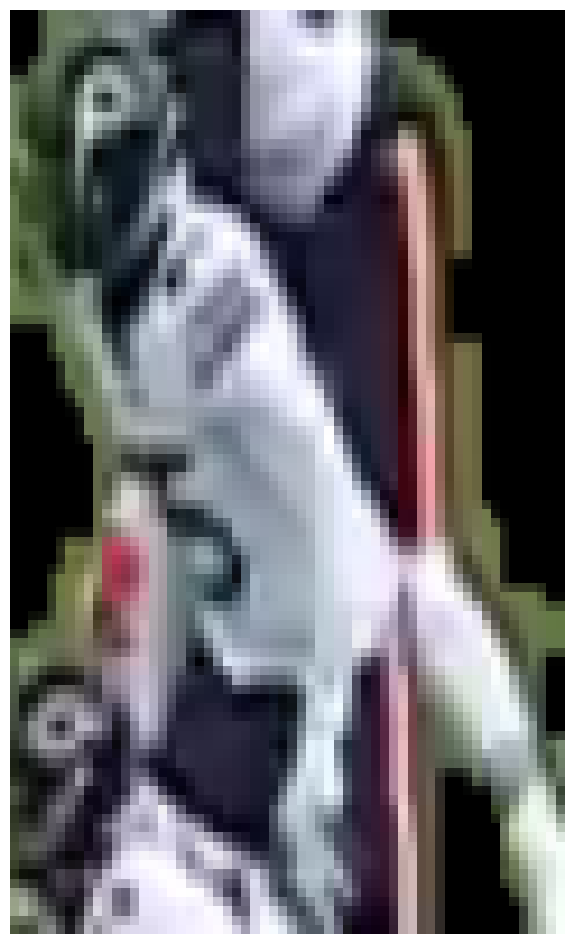

Green Bay Packers 0.77272695 0.7974443

0: 384x640 22 Players, 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 68)
(100, 60)
(80, 40)
(100, 60)
(122, 43)
(100, 60)
(76, 58)
(100, 60)
(83, 34)
(100, 60)

0: 384x640 21 Players, 12.3ms
Speed: 3.9ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 68)
(100, 60)
(81, 40)
(100, 60)
(122, 46)
(100, 60)
(75, 58)
(100, 60)
(83, 34)
(100, 60)

0: 384x640 21 Players, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(102, 68)
(100, 60)
(82, 41)
(100, 60)
(122, 48)
(100, 60)
(75, 55)
(100, 60)
(83, 35)
(100, 60)

0: 384x640 21 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 68)
(100, 60)
(82, 41)
(100, 60)
(121, 48)
(100, 60)
(73, 54)
(100, 60)
(83, 35)
(100, 60)

0: 384x640 22 Players, 12.4ms
Speed: 4.2ms preprocess, 12.4m

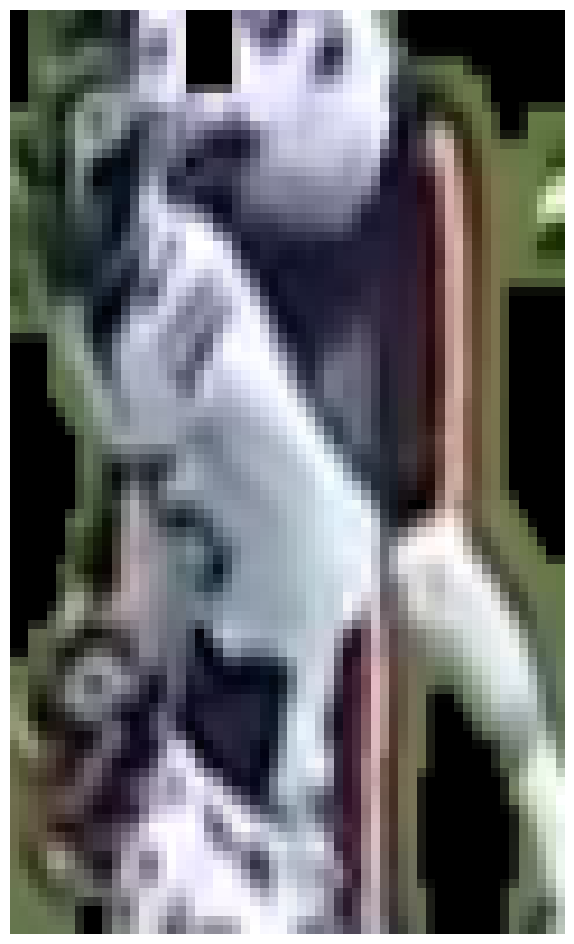

Green Bay Packers 0.7862863 0.806617

0: 384x640 22 Players, 19.9ms
Speed: 2.5ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(104, 68)
(100, 60)
(81, 40)
(100, 60)
(120, 36)
(100, 60)
(66, 60)
(100, 60)
(85, 35)
(100, 60)

0: 384x640 23 Players, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(105, 69)
(100, 60)
(80, 40)
(100, 60)
(119, 35)
(100, 60)


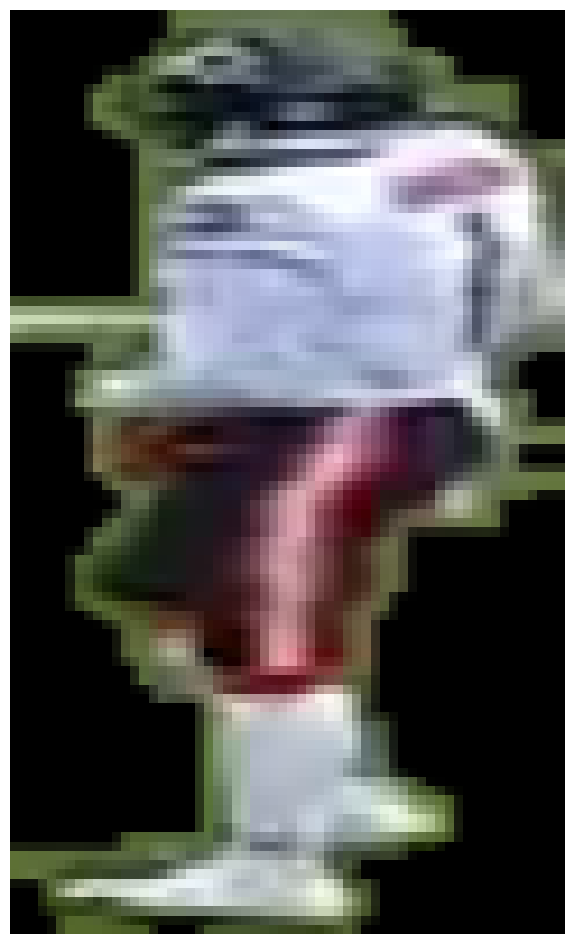

Green Bay Packers 0.7430015 0.7655712
(65, 61)
(100, 60)
(85, 34)
(100, 60)

0: 384x640 23 Players, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(106, 69)
(100, 60)
(80, 40)
(100, 60)
(64, 63)
(100, 60)
(85, 32)
(100, 60)
(41, 36)
(100, 60)

0: 384x640 23 Players, 15.6ms
Speed: 2.5ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(106, 69)
(100, 60)
(80, 40)
(100, 60)


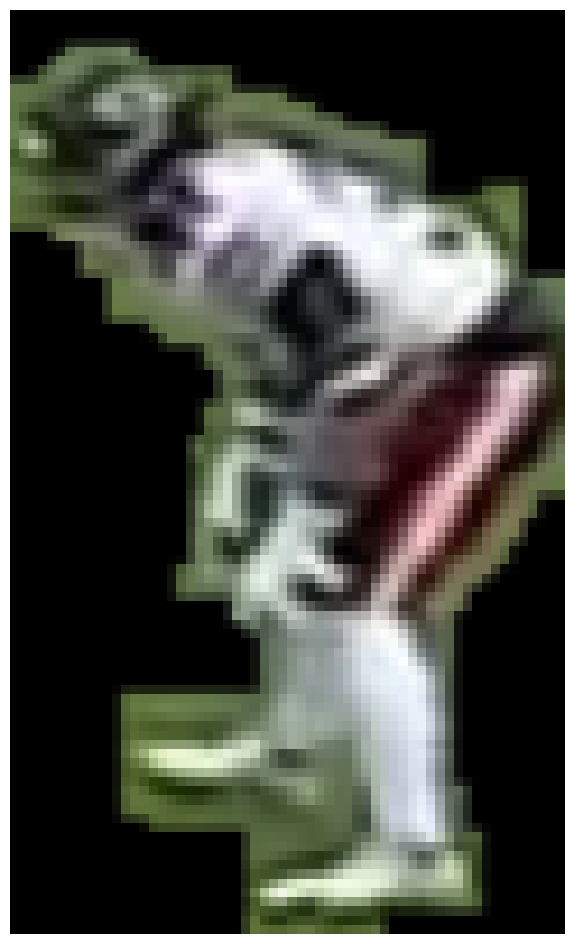

Chicago Bears 0.7181852 0.6888491
(65, 64)
(100, 60)


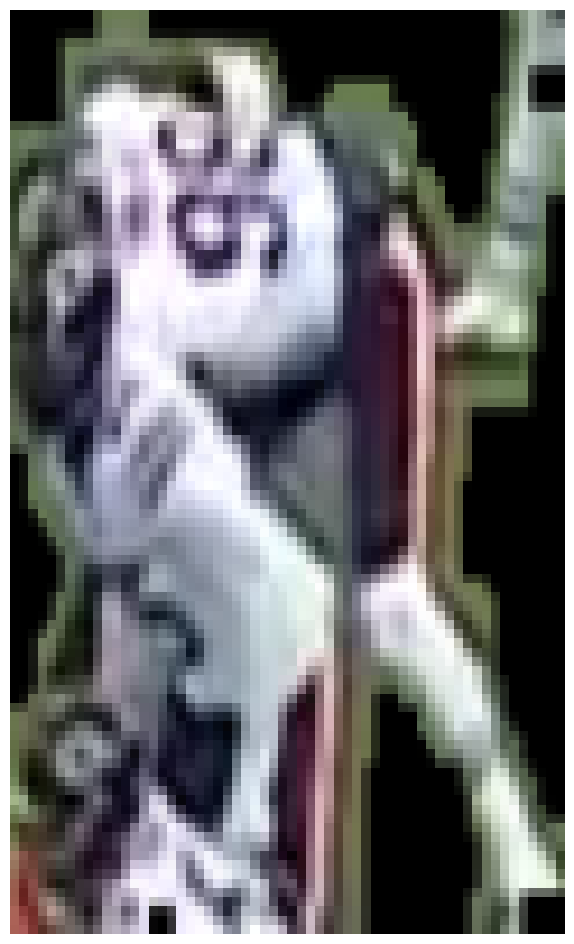

Chicago Bears 0.8309805 0.80284536
(85, 33)
(100, 60)
(38, 35)
(100, 60)

0: 384x640 23 Players, 24.6ms
Speed: 4.9ms preprocess, 24.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(106, 69)
(100, 60)
(78, 32)
(100, 60)
(38, 34)
(100, 60)

0: 384x640 24 Players, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 68)
(100, 60)
(80, 32)
(100, 60)
(38, 35)
(100, 60)


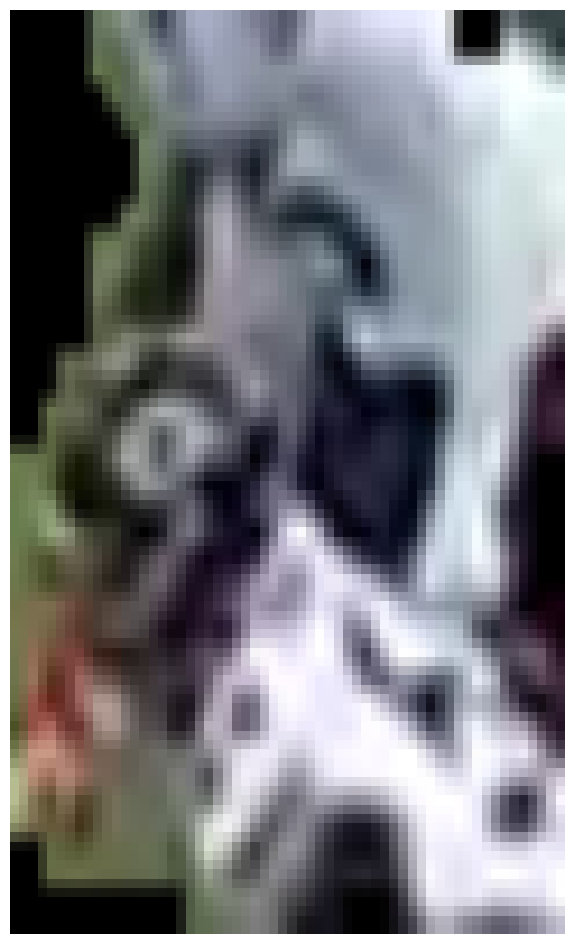

Chicago Bears 0.75826275 0.73325187

0: 384x640 24 Players, 16.6ms
Speed: 2.7ms preprocess, 16.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
(105, 66)
(100, 60)
(83, 33)
(100, 60)

0: 384x640 24 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(104, 64)
(100, 60)
(82, 31)
(100, 60)

0: 384x640 25 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(77, 31)
(100, 60)

0: 384x640 26 Players, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(106, 61)
(100, 60)
(73, 30)
(100, 60)

0: 384x640 26 Players, 17.8ms
Speed: 2.7ms preprocess, 17.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(106, 59)
(100, 60)
(70, 30)
(100, 60)

0: 384x640 26 Players, 15.8ms
Speed: 2.6ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(

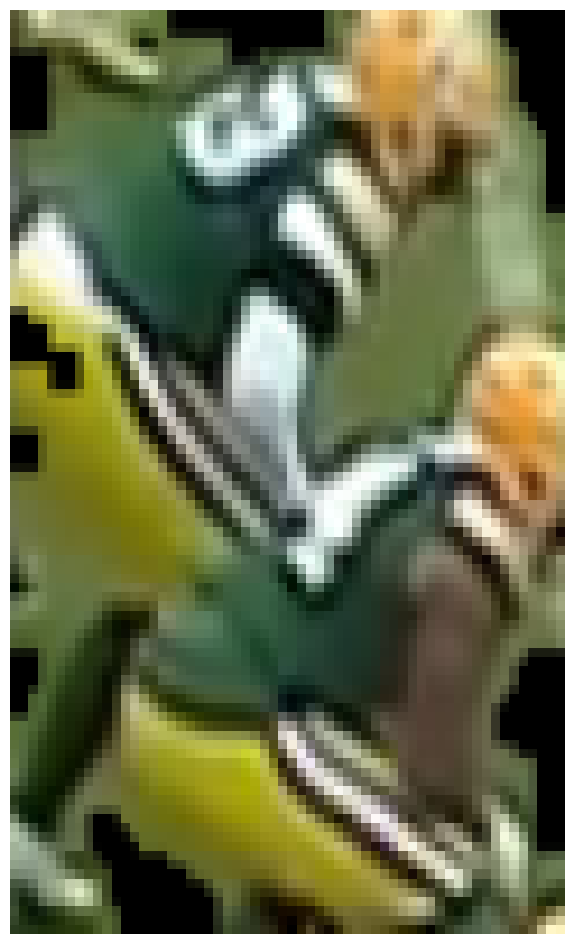

Green Bay Packers 0.6071694 0.67269474

0: 384x640 26 Players, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(73, 34)
(100, 60)

0: 384x640 26 Players, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(74, 35)
(100, 60)

0: 384x640 27 Players, 18.6ms
Speed: 2.5ms preprocess, 18.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(105, 60)
(100, 60)
(75, 36)
(100, 60)

0: 384x640 26 Players, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(77, 36)
(100, 60)

0: 384x640 27 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(76, 36)
(100, 60)

0: 384x640 26 Players, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640

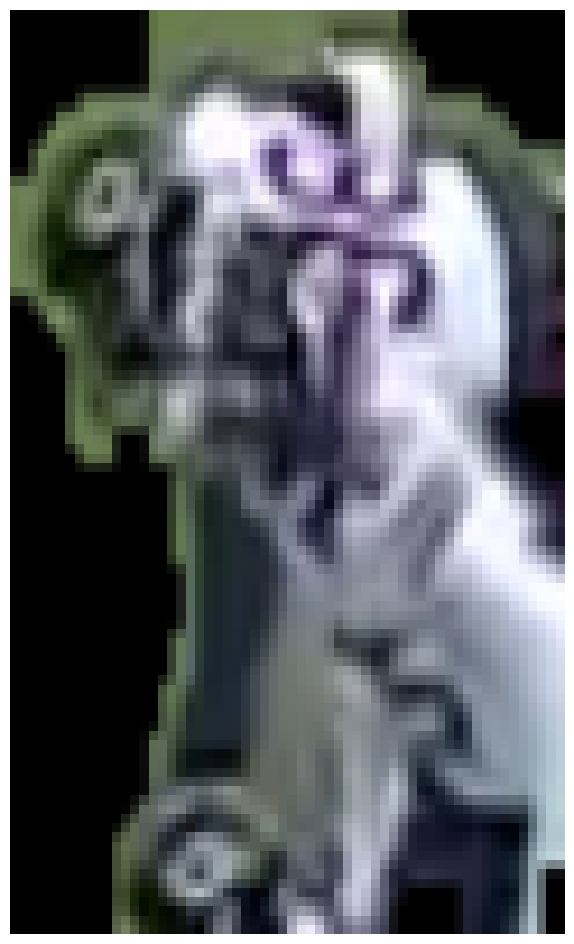

Green Bay Packers 0.68987834 0.7347429
(47, 38)
(100, 60)

0: 384x640 26 Players, 20.8ms
Speed: 3.0ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(83, 33)
(100, 60)
(53, 38)
(100, 60)


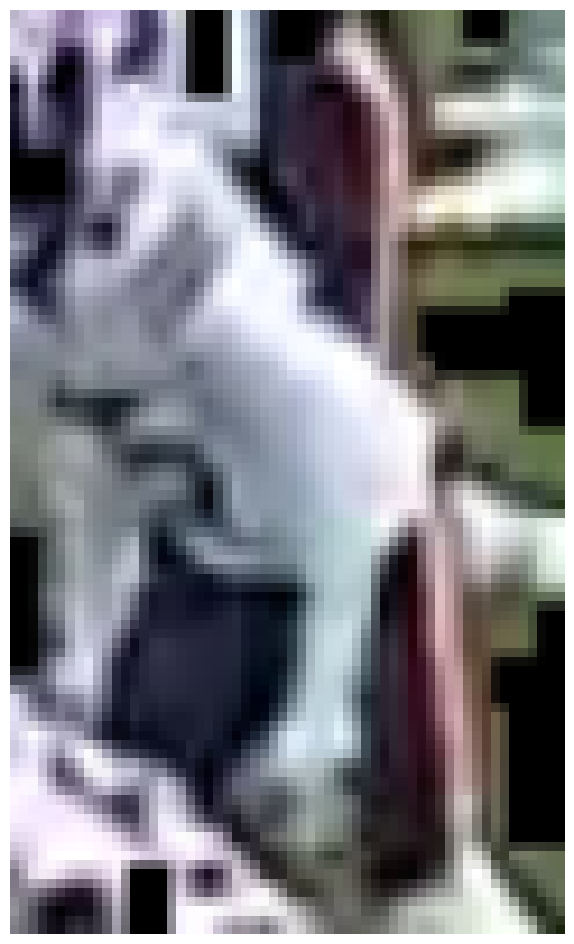

Chicago Bears 0.78823286 0.7681834

0: 384x640 26 Players, 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 62)
(100, 60)
(83, 34)
(100, 60)

0: 384x640 26 Players, 15.4ms
Speed: 2.5ms preprocess, 15.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
(105, 62)
(100, 60)
(83, 33)
(100, 60)

0: 384x640 26 Players, 17.1ms
Speed: 2.5ms preprocess, 17.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(105, 62)
(100, 60)
(82, 33)
(100, 60)

0: 384x640 25 Players, 15.7ms
Speed: 2.6ms preprocess, 15.7ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(81, 34)
(100, 60)

0: 384x640 25 Players, 15.1ms
Speed: 2.6ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(105, 61)
(100, 60)
(81, 34)
(100, 60)

0: 384x640 23 Players, 13.1ms
Speed: 4.0ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(1

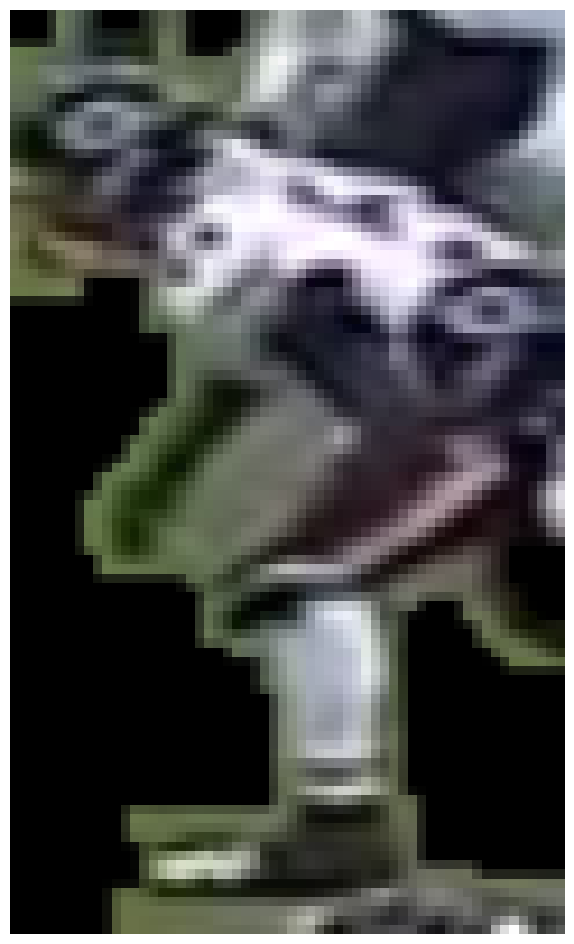

Green Bay Packers 0.73185086 0.75685614

0: 384x640 24 Players, 17.8ms
Speed: 7.5ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(104, 62)
(100, 60)

0: 384x640 24 Players, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 62)
(100, 60)

0: 384x640 25 Players, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 62)
(100, 60)

0: 384x640 24 Players, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 62)
(100, 60)

0: 384x640 25 Players, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 62)
(100, 60)

0: 384x640 25 Players, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 61)
(100, 60)

0: 384x640 25 Players, 12.6ms
Speed: 3.3ms preprocess, 12.6ms inference

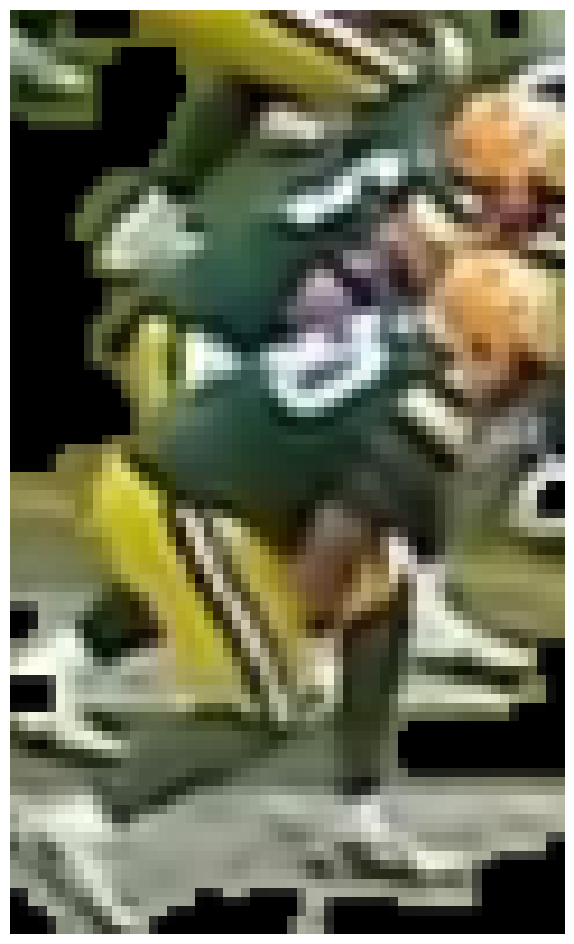

Green Bay Packers 0.59728813 0.621292

0: 384x640 28 Players, 34.2ms
Speed: 2.6ms preprocess, 34.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 28 Players, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 30 Players, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(71, 50)
(100, 60)


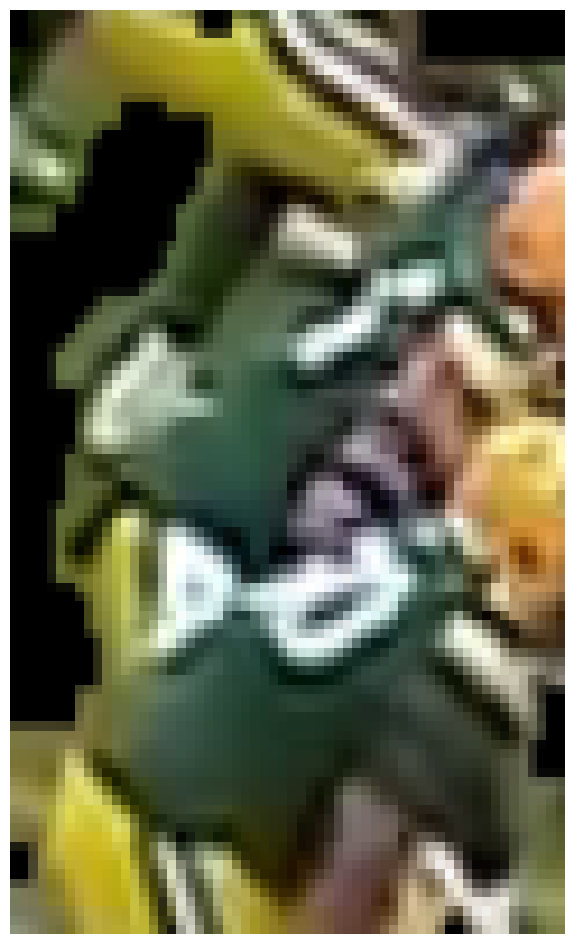

Green Bay Packers 0.6906386 0.7521135

0: 384x640 28 Players, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
(50, 58)
(100, 60)


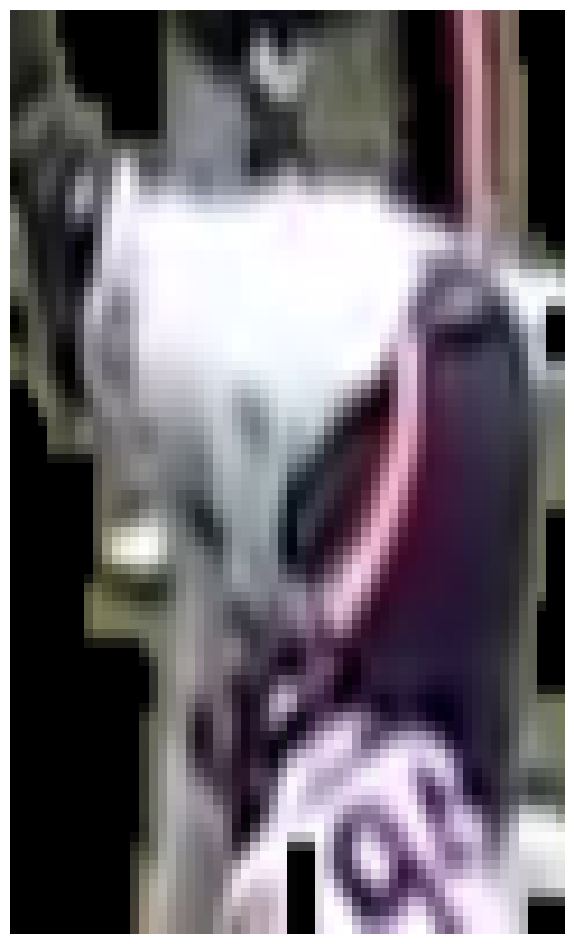

Chicago Bears 0.7570654 0.64418864
(92, 51)
(100, 60)


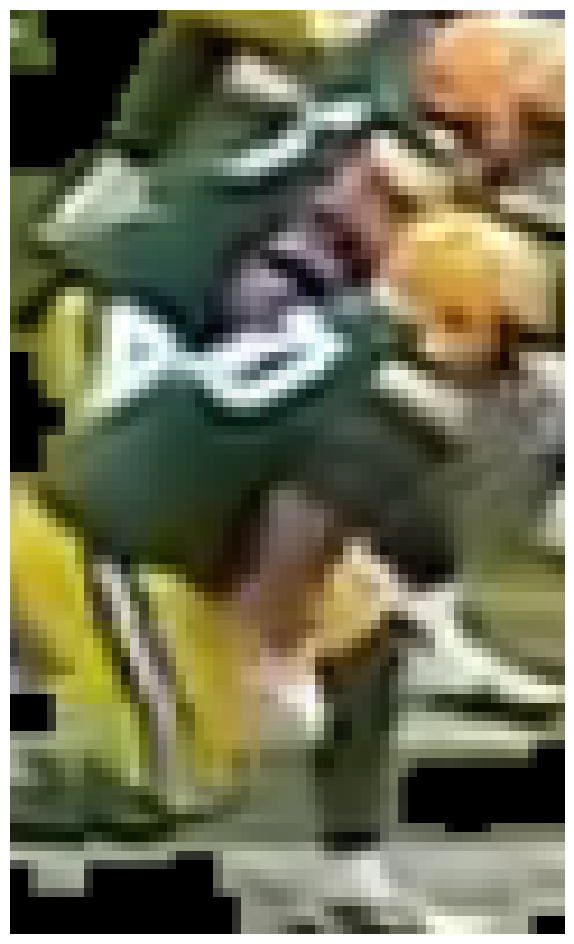

Green Bay Packers 0.6335991 0.6701542
(78, 58)
(100, 60)


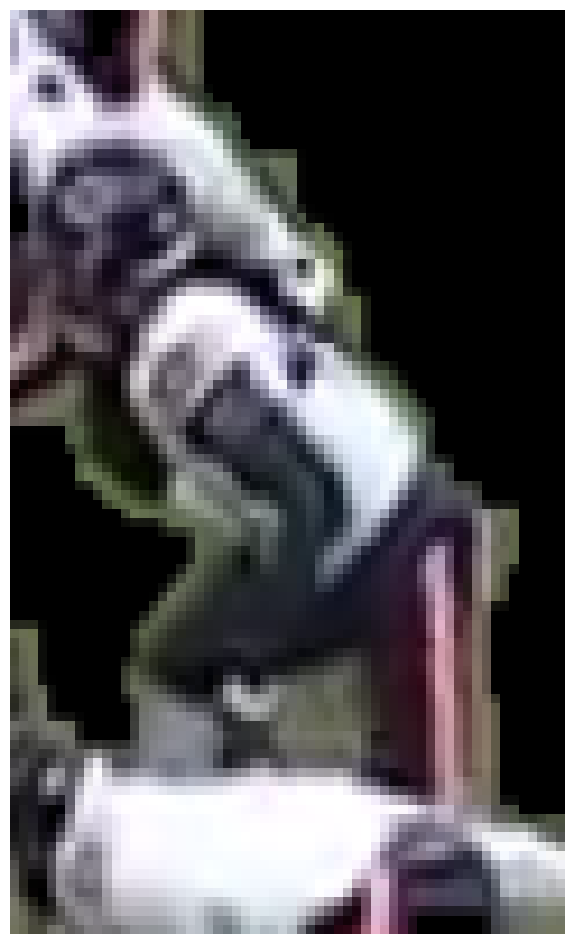

Chicago Bears 0.80048996 0.7368707

0: 384x640 28 Players, 28.1ms
Speed: 2.6ms preprocess, 28.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(62, 43)
(100, 60)


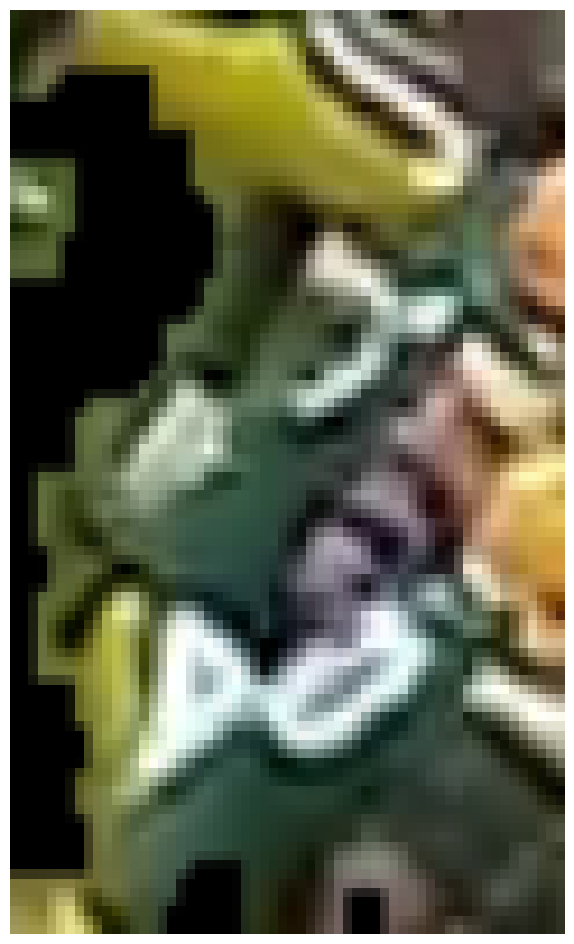

Green Bay Packers 0.72064173 0.7816843
(80, 37)
(100, 60)


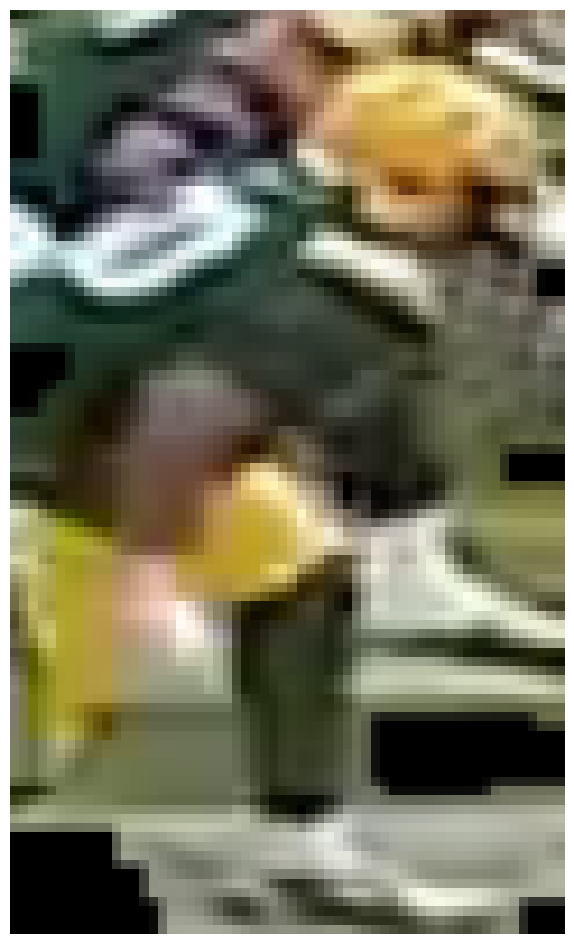

Green Bay Packers 0.61766696 0.6387972

0: 384x640 27 Players, 12.7ms
Speed: 4.7ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(69, 35)
(100, 60)

0: 384x640 31 Players, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(72, 35)
(100, 60)

0: 384x640 30 Players, 19.6ms
Speed: 5.9ms preprocess, 19.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(78, 31)
(100, 60)
(58, 66)
(100, 60)


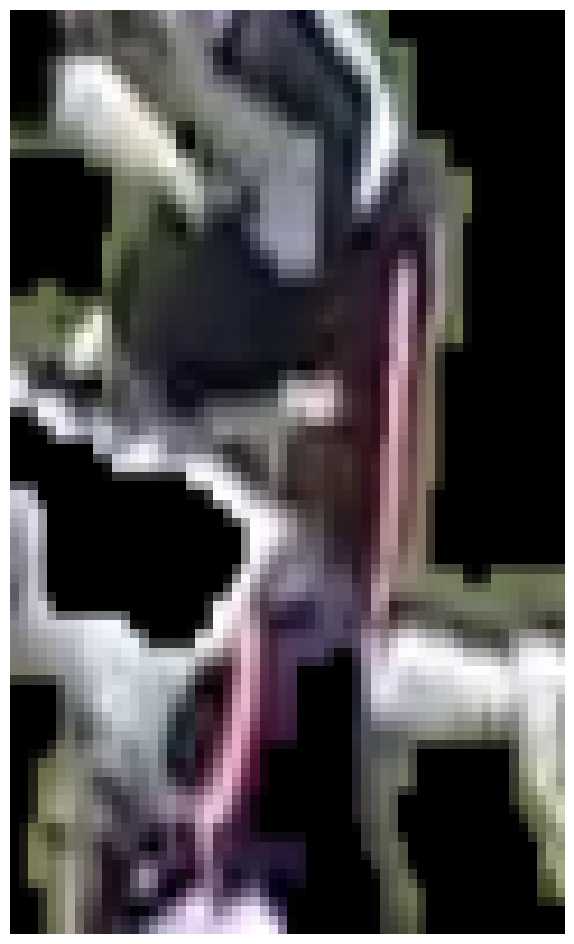

Chicago Bears 0.8141315 0.77237487

0: 384x640 26 Players, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(82, 29)
(100, 60)


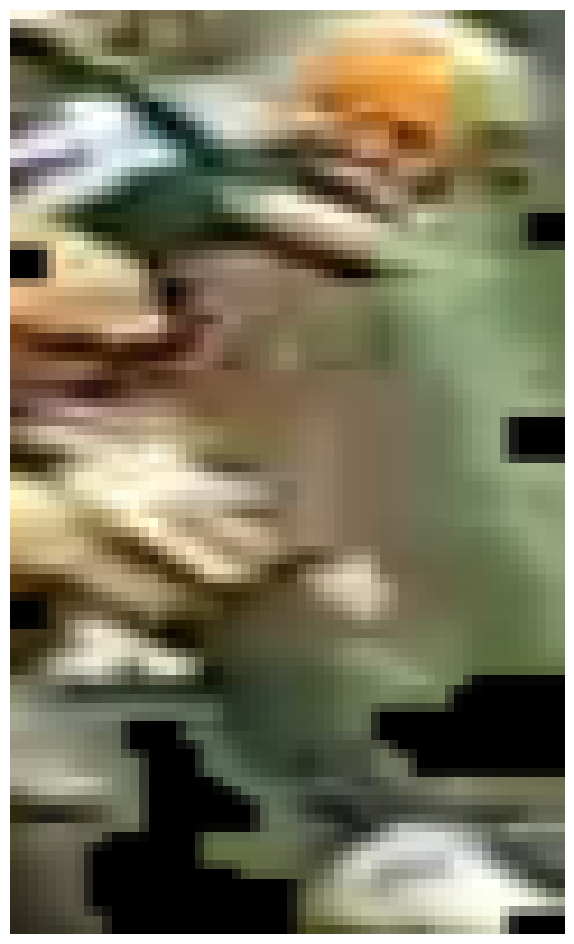

Green Bay Packers 0.55999047 0.5830337

0: 384x640 23 Players, 12.2ms
Speed: 3.8ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 29 Players, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(63, 54)
(100, 60)

0: 384x640 28 Players, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(65, 50)
(100, 60)

0: 384x640 24 Players, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(63, 48)
(100, 60)

0: 384x640 25 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 27 Players, 15.7ms
Speed: 2.6ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 31)
(100, 60)


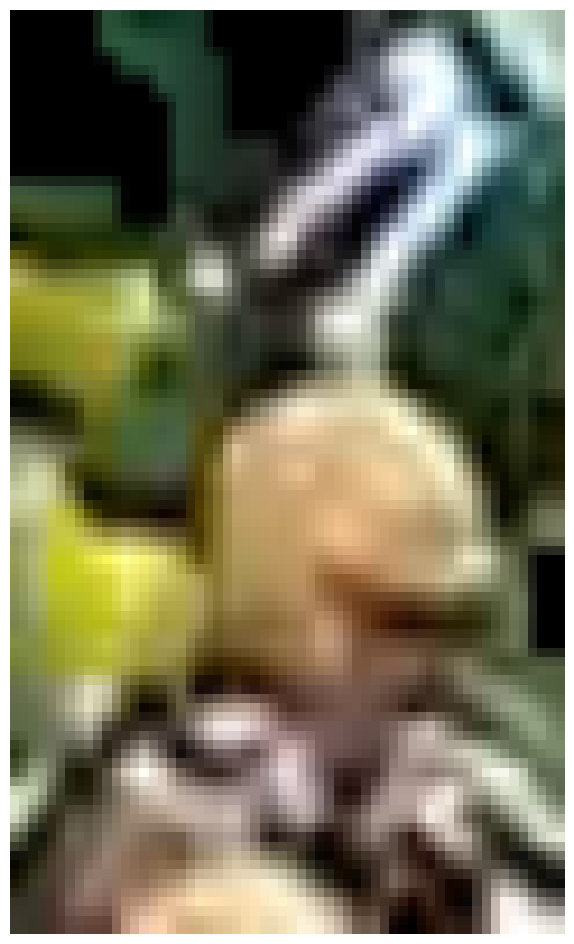

Green Bay Packers 0.6961407 0.73904824
(31, 31)
(100, 60)


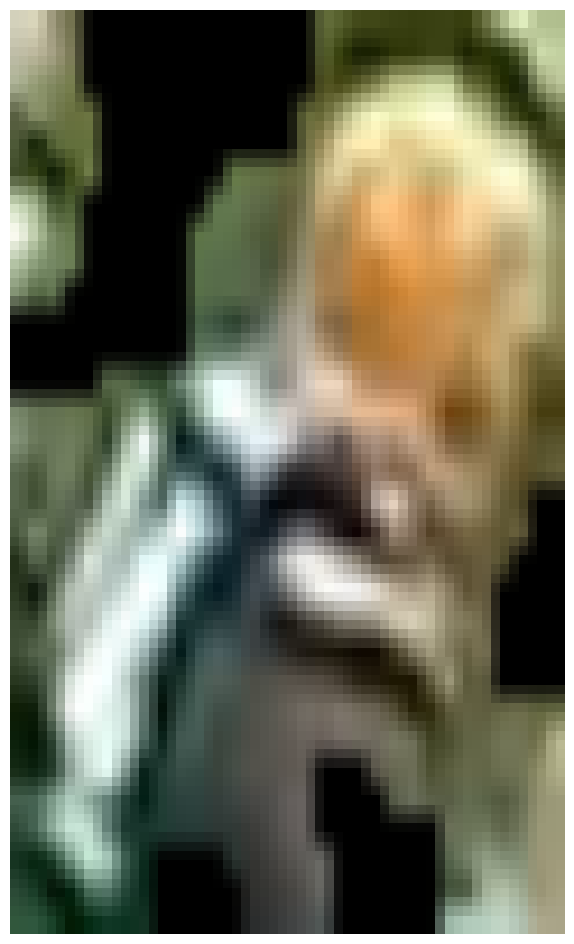

Green Bay Packers 0.7093844 0.74067247

0: 384x640 24 Players, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 29 Players, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(47, 37)
(100, 60)


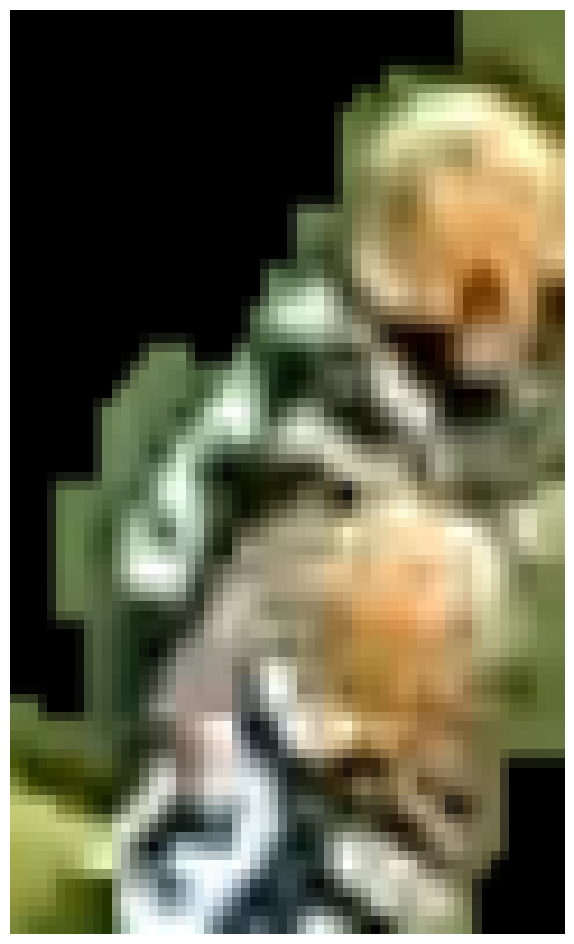

Green Bay Packers 0.5580421 0.5917229

0: 384x640 29 Players, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 11.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 27 Players, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(69, 46)
(100, 60)

0: 384x640 25 Players, 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(79, 44)
(100, 60)


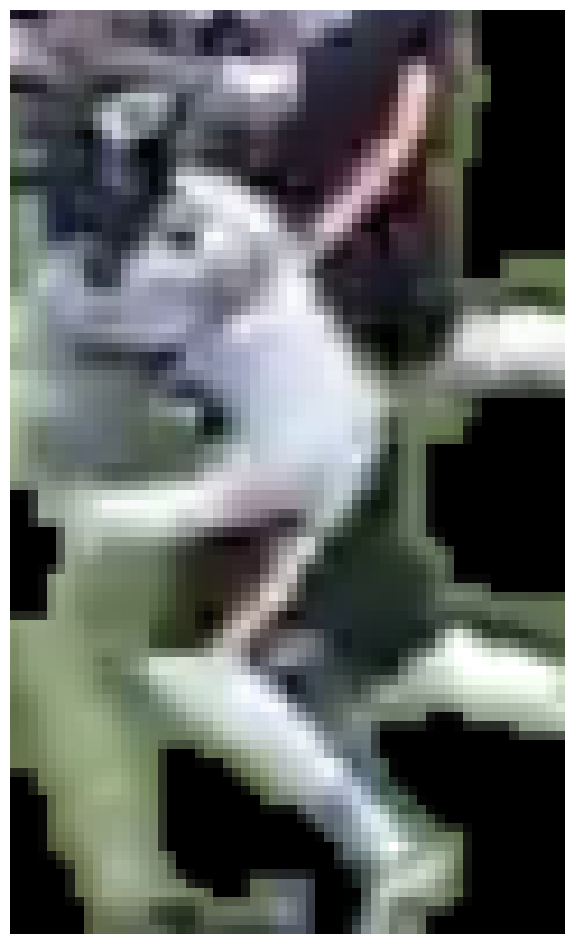

Chicago Bears 0.78668636 0.76593405

0: 384x640 22 Players, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 15.5ms
Speed: 2.4ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 19.0ms
Speed: 3.4ms preprocess, 19.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 26 Players, 15.2ms
Speed: 2.5ms preprocess, 15.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(61, 26)
(100, 60)


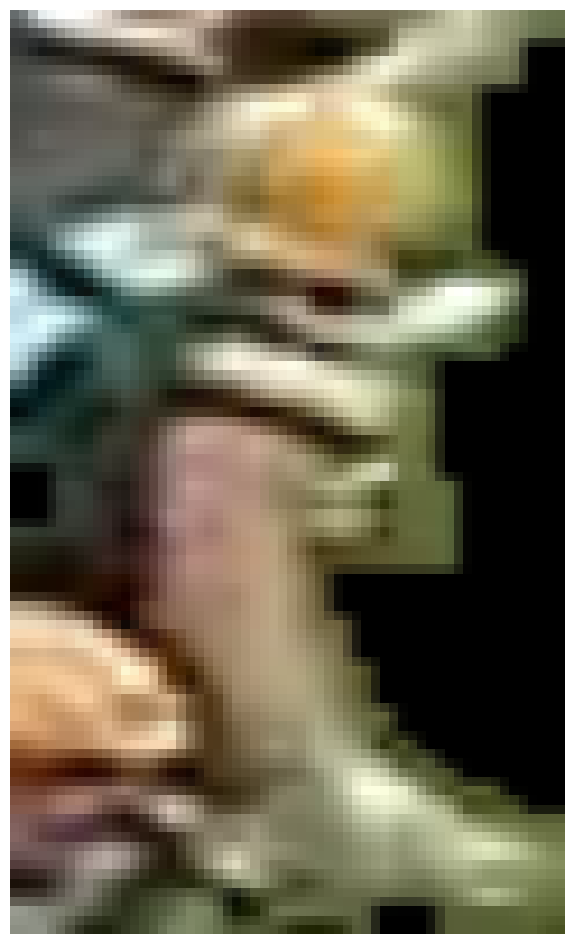

Green Bay Packers 0.6024214 0.63233274

0: 384x640 25 Players, 17.5ms
Speed: 3.0ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(73, 53)
(100, 60)


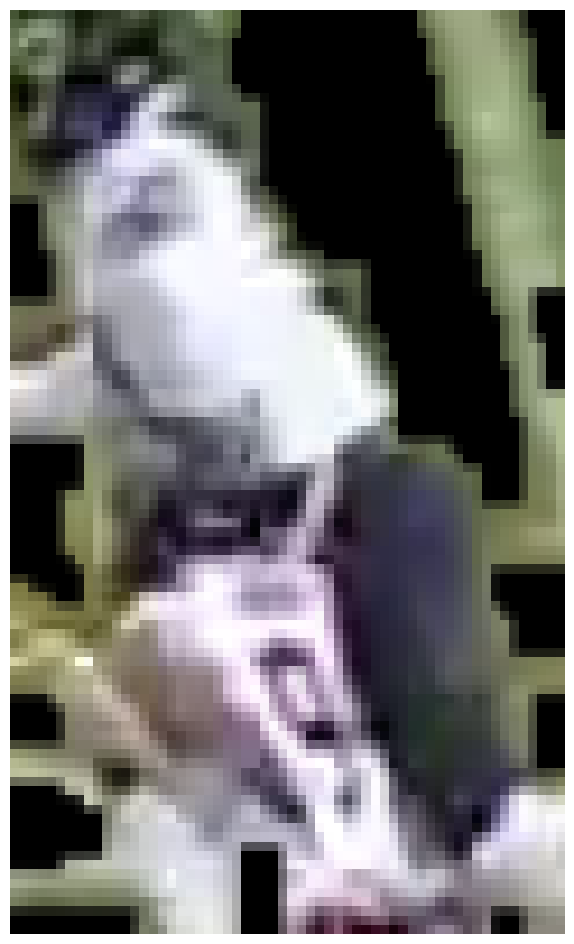

Chicago Bears 0.766138 0.7023068

0: 384x640 23 Players, 19.6ms
Speed: 5.7ms preprocess, 19.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 1 Referee, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 24.0ms
Speed: 3.3ms preprocess, 24.0ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 1 Referee, 19.5ms
Speed: 2.5ms preprocess, 19.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(82, 53)
(100, 60)

0: 384x640 25 Players, 1 Referee, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(60, 45)
(100, 60)


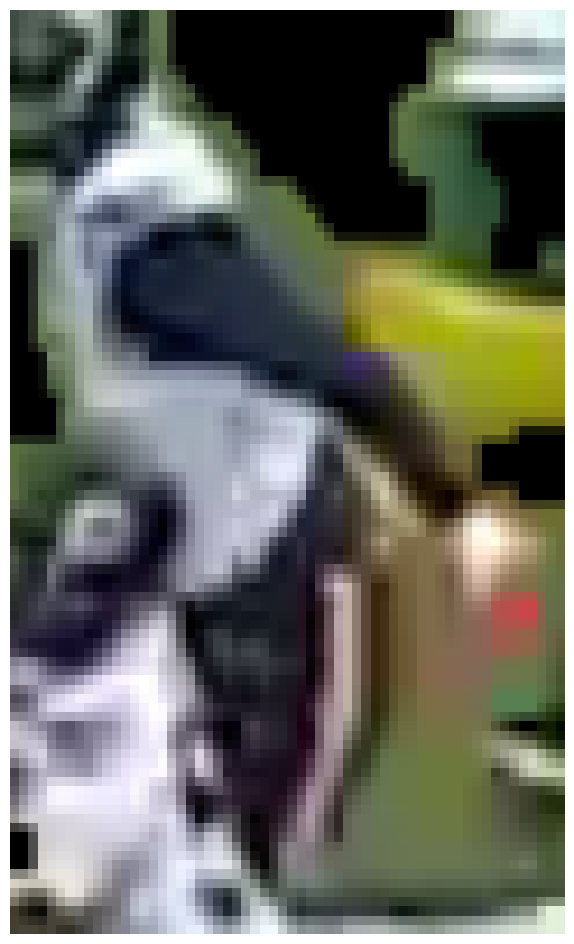

Green Bay Packers 0.79561865 0.8338485

0: 384x640 25 Players, 15.2ms
Speed: 2.4ms preprocess, 15.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(38, 23)
(100, 60)


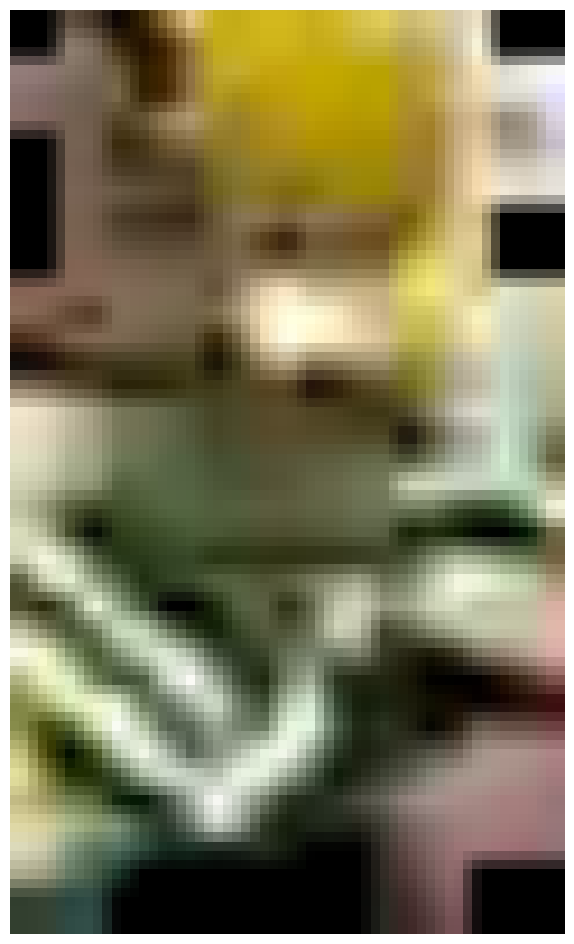

Green Bay Packers 0.57544124 0.60812205

0: 384x640 23 Players, 14.9ms
Speed: 2.6ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)
(57, 28)
(100, 60)

0: 384x640 23 Players, 14.4ms
Speed: 4.5ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(52, 26)
(100, 60)


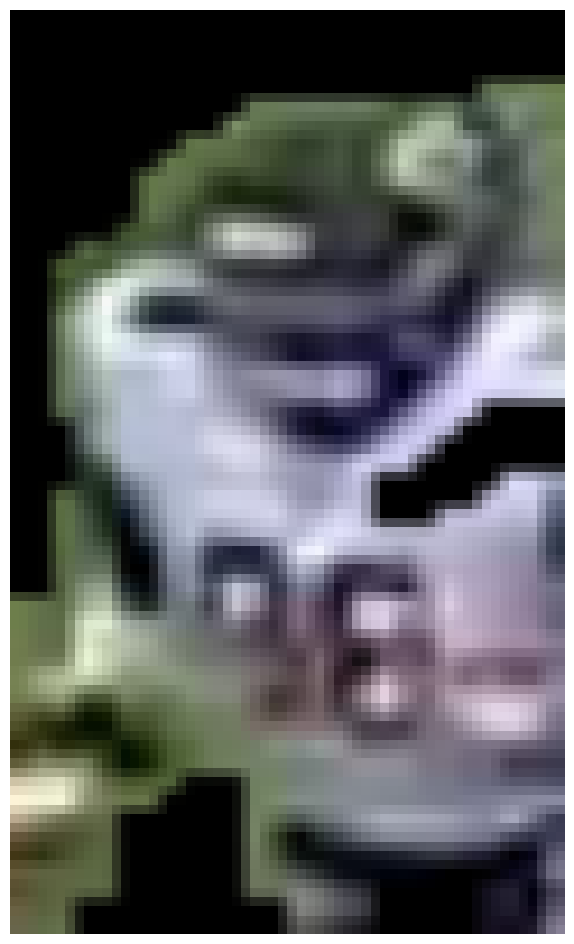

Green Bay Packers 0.68192947 0.7162095

0: 384x640 21 Players, 16.9ms
Speed: 5.0ms preprocess, 16.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(58, 36)
(100, 60)


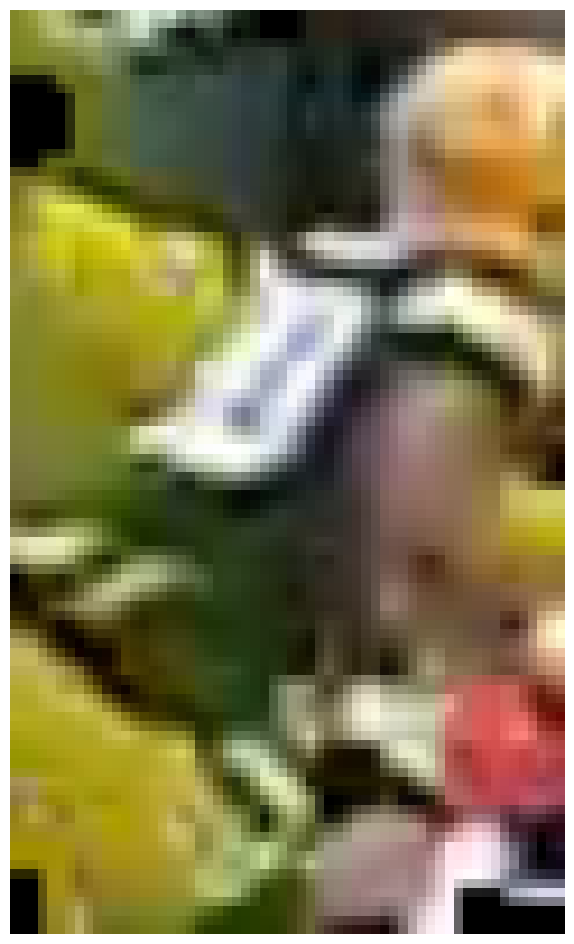

Green Bay Packers 0.5776801 0.62459594

0: 384x640 22 Players, 28.8ms
Speed: 2.7ms preprocess, 28.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 19.4ms
Speed: 2.5ms preprocess, 19.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 19.9ms
Speed: 2.6ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 13.8ms
Speed: 4.4ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms in

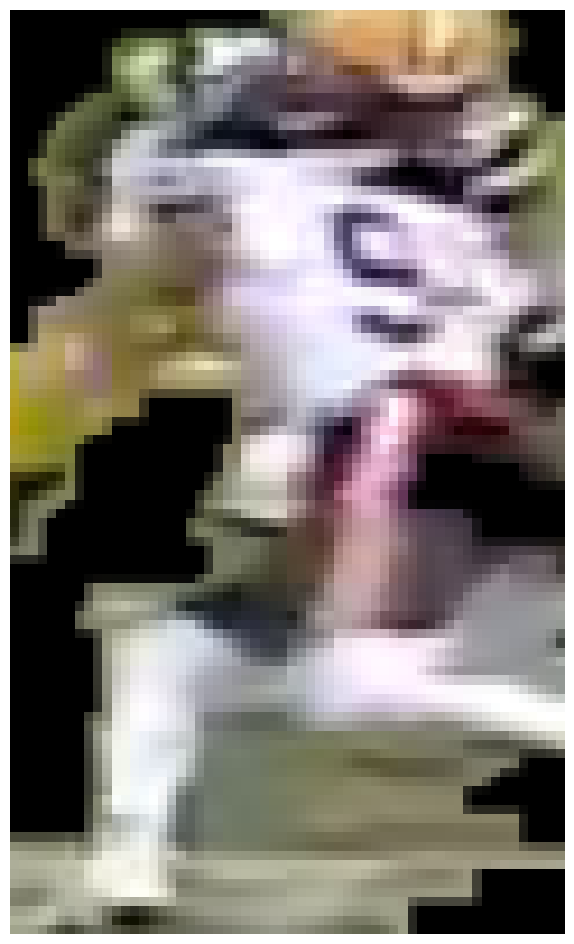

Chicago Bears 0.78221357 0.67737603

0: 384x640 18 Players, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(49, 36)
(100, 60)

0: 384x640 17 Players, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(60, 41)
(100, 60)


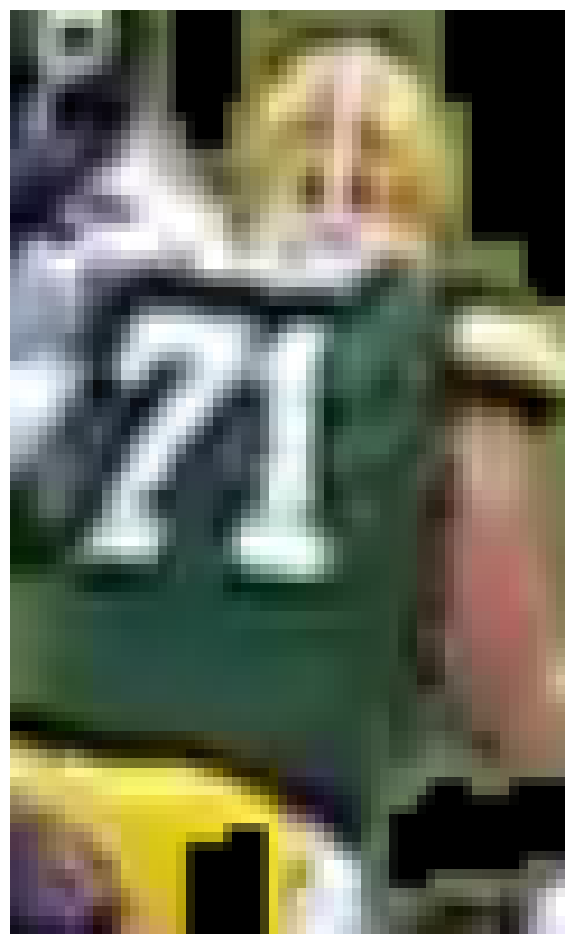

Green Bay Packers 0.8044262 0.8602564

0: 384x640 18 Players, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(46, 35)
(100, 60)

0: 384x640 15 Players, 20.6ms
Speed: 2.6ms preprocess, 20.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 21.1ms
Speed: 2.6ms preprocess, 21.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)
(52, 54)
(100, 60)


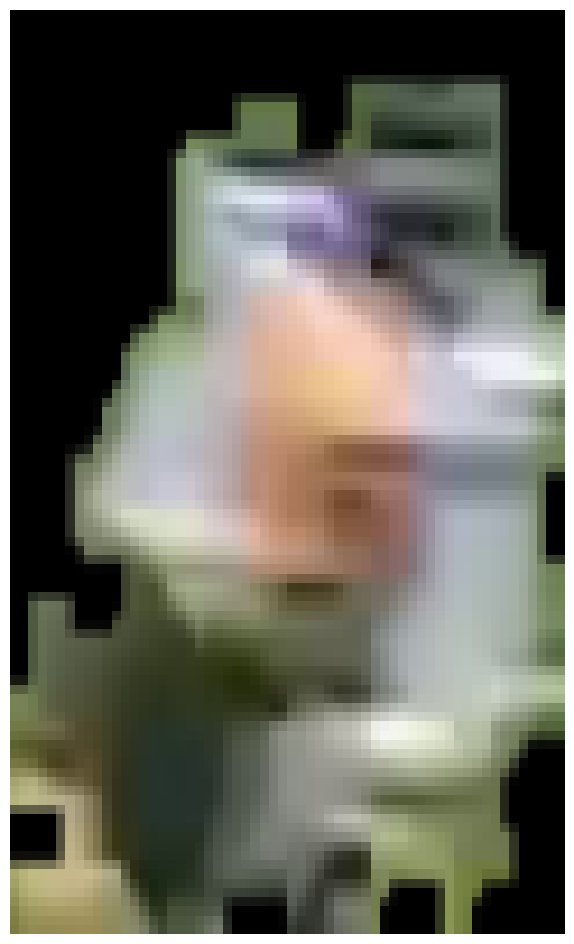

Chicago Bears 0.7537068 0.70313215

0: 384x640 17 Players, 21.4ms
Speed: 2.5ms preprocess, 21.4ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 15.6ms
Speed: 2.5ms preprocess, 15.6ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 16.9ms
Speed: 2.5ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 23.0ms
Speed: 2.5ms preprocess, 23.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(59, 40)
(100, 60)

0: 384x640 17 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(72, 41)
(100, 60)


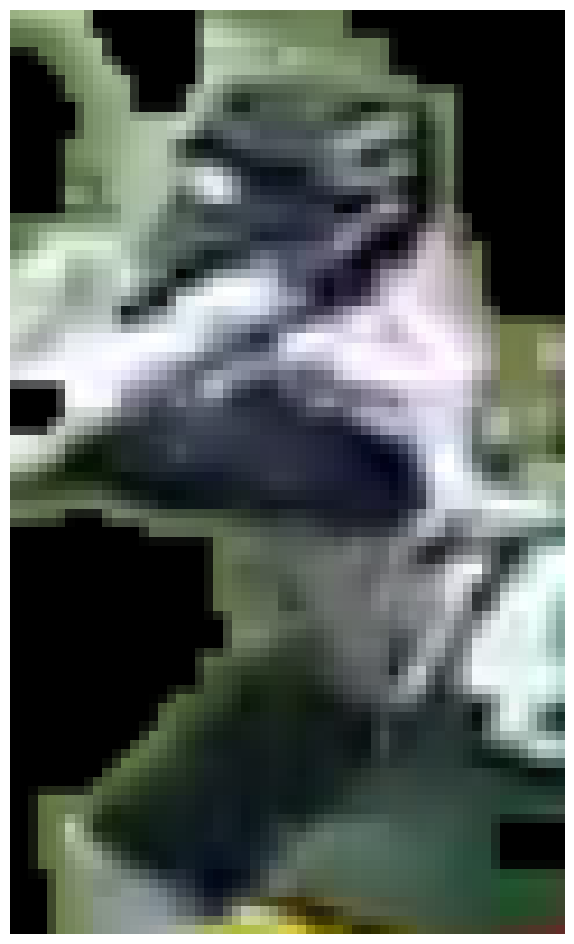

Green Bay Packers 0.81517345 0.8507221

0: 384x640 17 Players, 18.1ms
Speed: 8.0ms preprocess, 18.1ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(140, 61)
(100, 60)


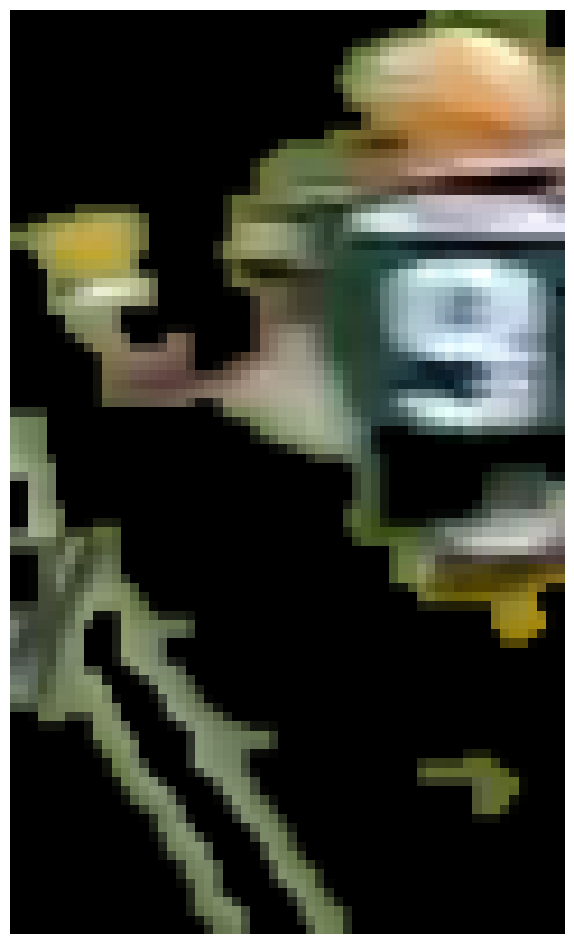

Green Bay Packers 0.64893264 0.6938212
(70, 27)
(100, 60)

0: 384x640 17 Players, 18.7ms
Speed: 2.6ms preprocess, 18.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(110, 31)
(100, 60)

0: 384x640 17 Players, 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(130, 53)
(100, 60)


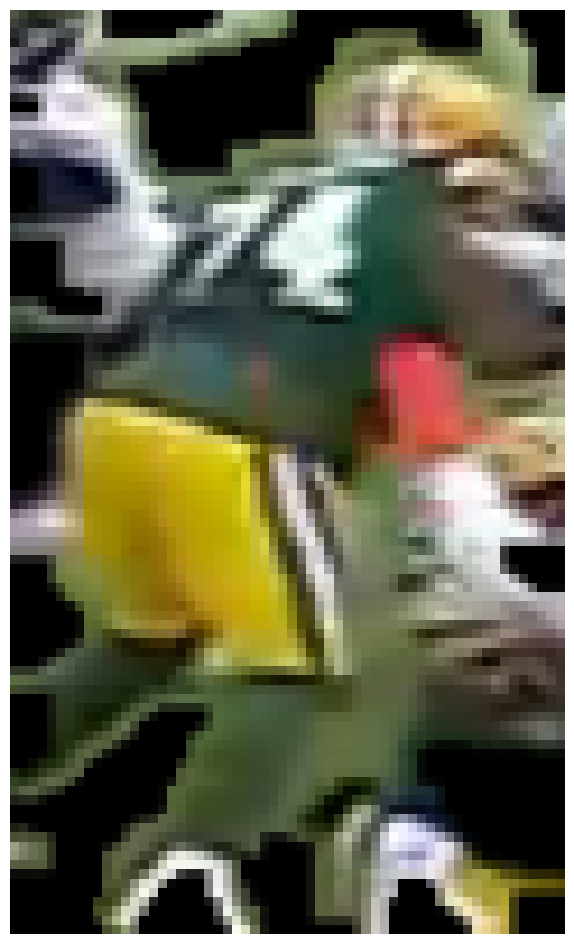

Green Bay Packers 0.72162145 0.7507246

0: 384x640 15 Players, 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 6.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 19.6ms
Speed: 2.9ms preprocess, 19.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 23.6ms
Speed: 2.5ms preprocess, 23.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 31.0ms
Speed: 4.2ms preprocess, 31.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 23.0ms
Speed: 4.4ms preprocess, 23.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(65, 62)
(100, 60)


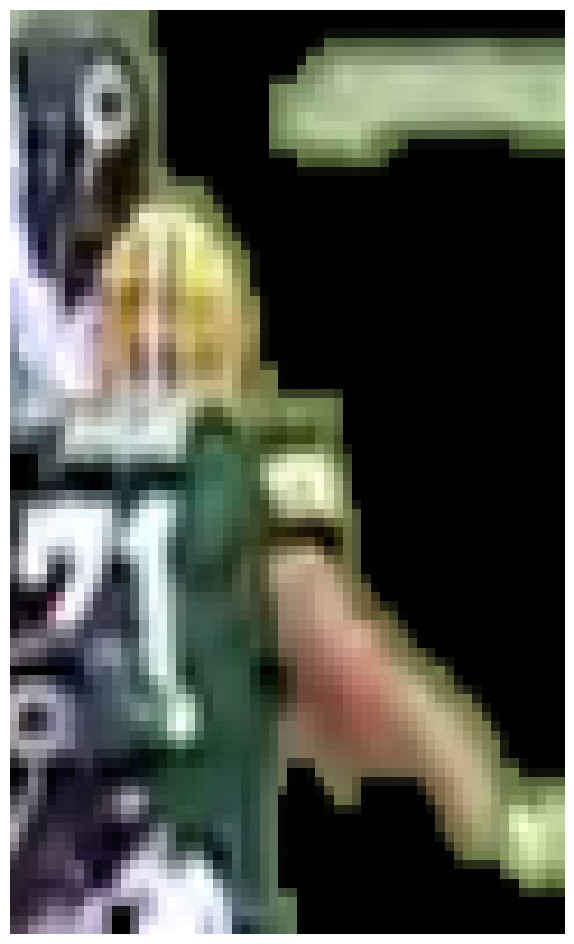

Green Bay Packers 0.7981335 0.83092934

0: 384x640 15 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 18.2ms
Speed: 4.5ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 15.5ms
Speed: 2.5ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 14.4ms
Speed: 2.6ms preprocess, 14.4ms in

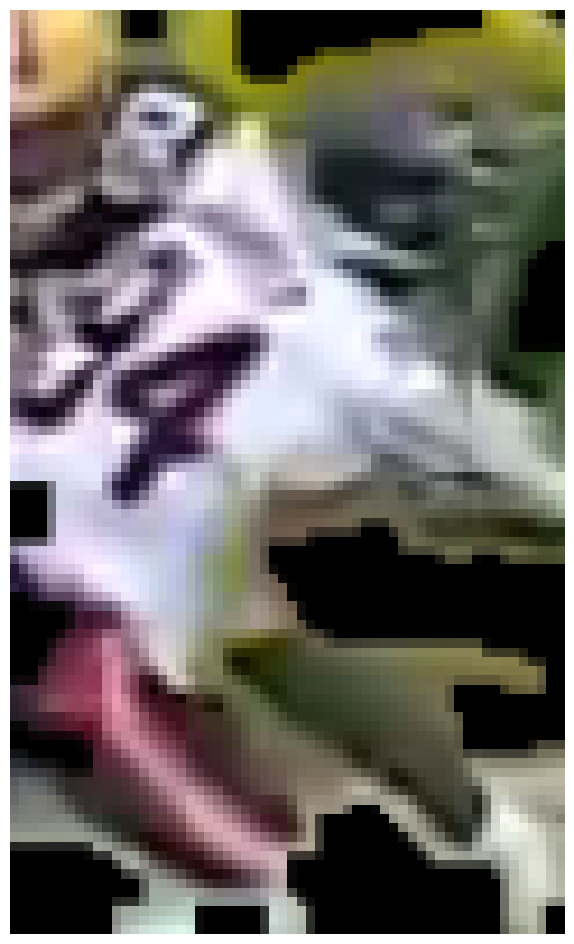

Chicago Bears 0.80210745 0.75359243

0: 384x640 14 Players, 14.5ms
Speed: 2.7ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 16.2ms
Speed: 2.6ms preprocess, 16.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 23.6ms
Speed: 4.6ms preprocess, 23.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(136, 44)
(100, 60)
(73, 47)
(100, 60)


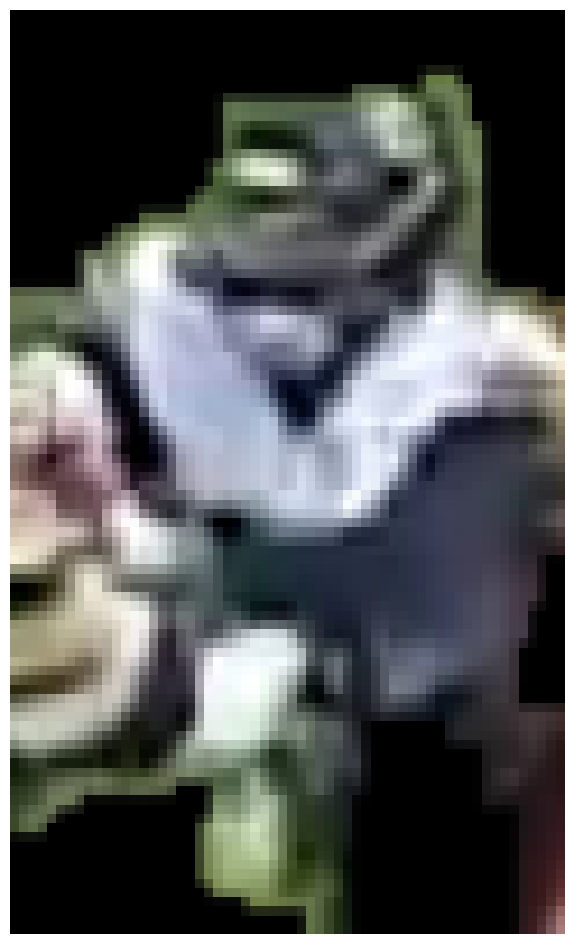

Green Bay Packers 0.74276304 0.76816195

0: 384x640 16 Players, 24.9ms
Speed: 2.5ms preprocess, 24.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(136, 48)
(100, 60)


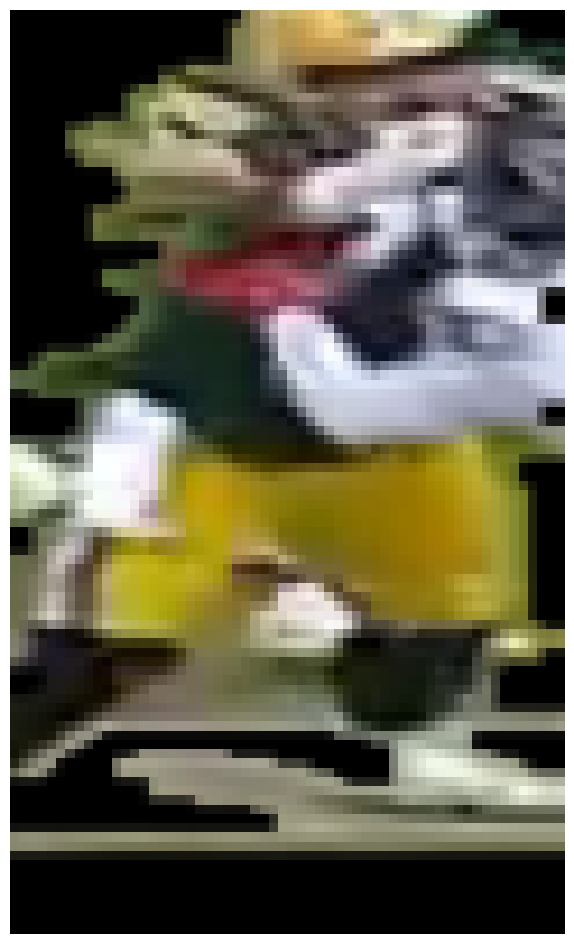

Green Bay Packers 0.6384945 0.6654292
(116, 47)
(100, 60)

0: 384x640 16 Players, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(90, 34)
(100, 60)

0: 384x640 15 Players, 22.7ms
Speed: 2.7ms preprocess, 22.7ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(98, 36)
(100, 60)
(109, 22)
(100, 60)


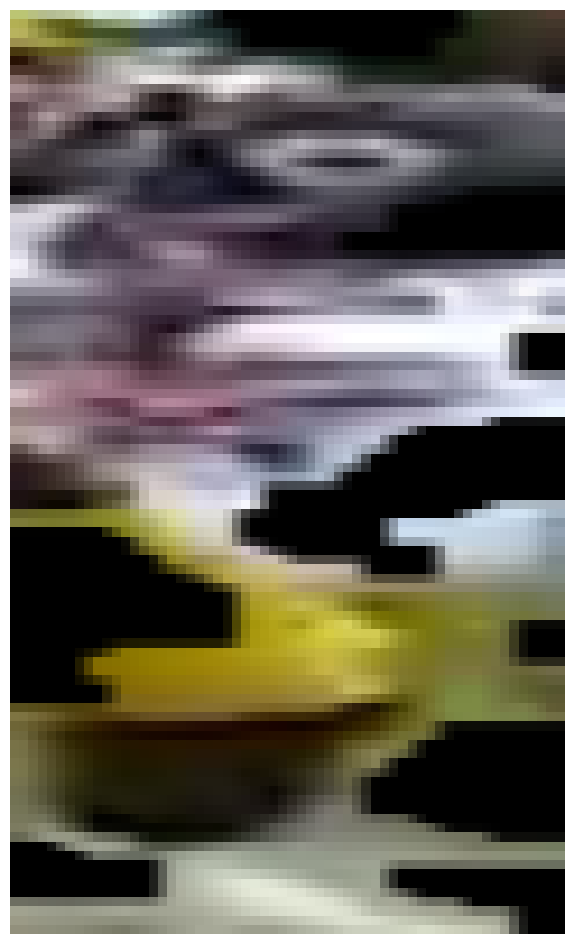

Chicago Bears 0.73173875 0.7033727

0: 384x640 16 Players, 12.9ms
Speed: 4.7ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(107, 61)
(100, 60)


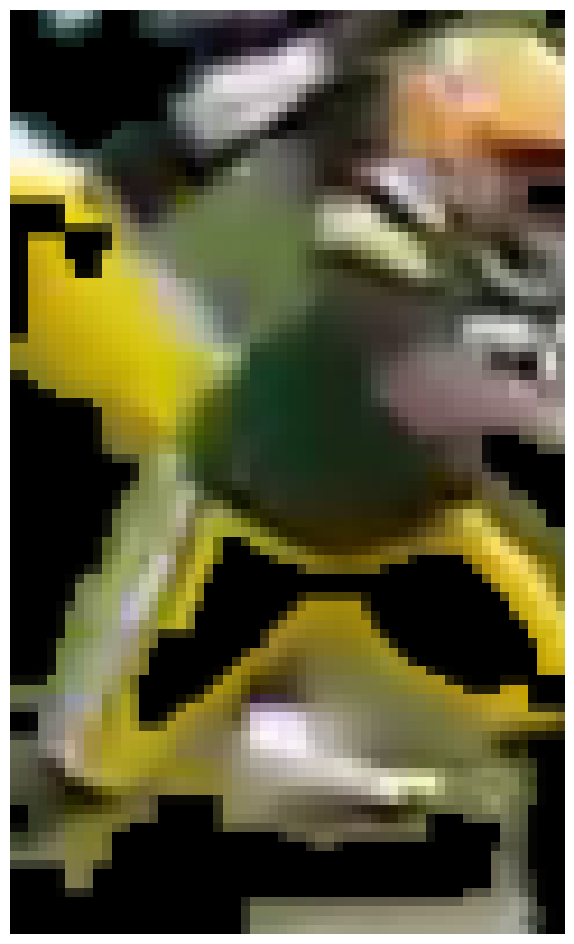

Green Bay Packers 0.50510406 0.537986

0: 384x640 14 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.3ms
Speed: 5.2ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(44, 79)
(100, 60)

0: 384x640 14 Players, 14.4ms
Speed: 3.0ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(54, 85)
(100, 60)


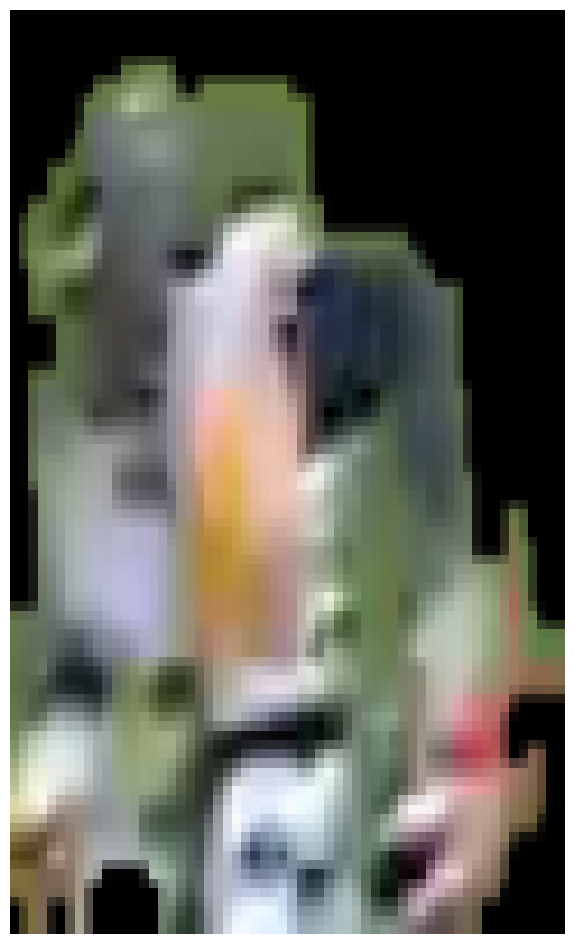

Chicago Bears 0.8195913 0.79361725

0: 384x640 14 Players, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 21.7ms
Speed: 4.8ms preprocess, 21.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
(44, 31)
(100, 60)

0: 384x640 15 Players, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(153, 34)
(100, 60)


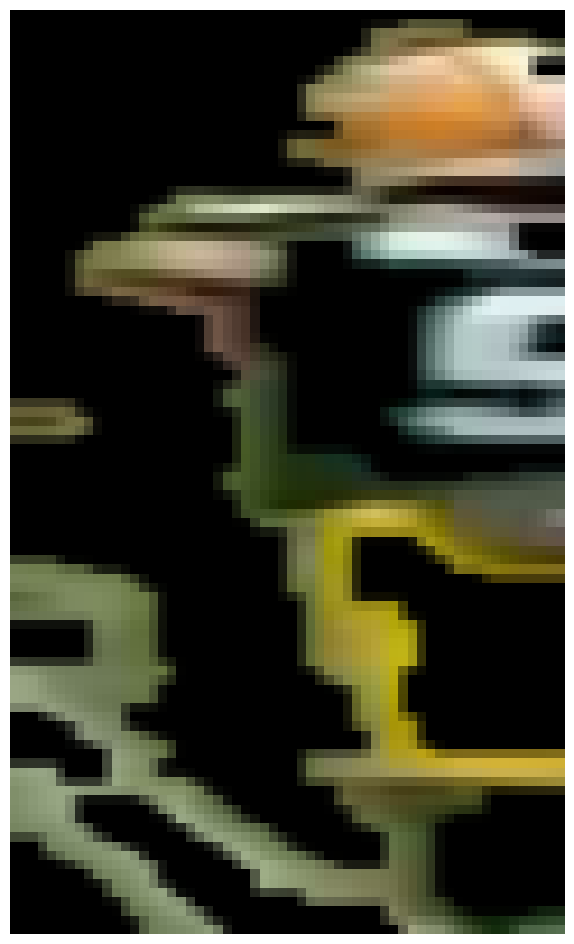

Green Bay Packers 0.5623141 0.6180027

0: 384x640 14 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(121, 54)
(100, 60)

0: 384x640 14 Players, 1 Referee, 15.8ms
Speed: 2.4ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 1 Referee, 12.7ms
Speed: 3.3ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 1 Referee, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 1 Referee, 18.5ms
Speed: 3.1ms preprocess, 18.5ms inference, 2.3ms postprocess per image at shape (1, 3, 3

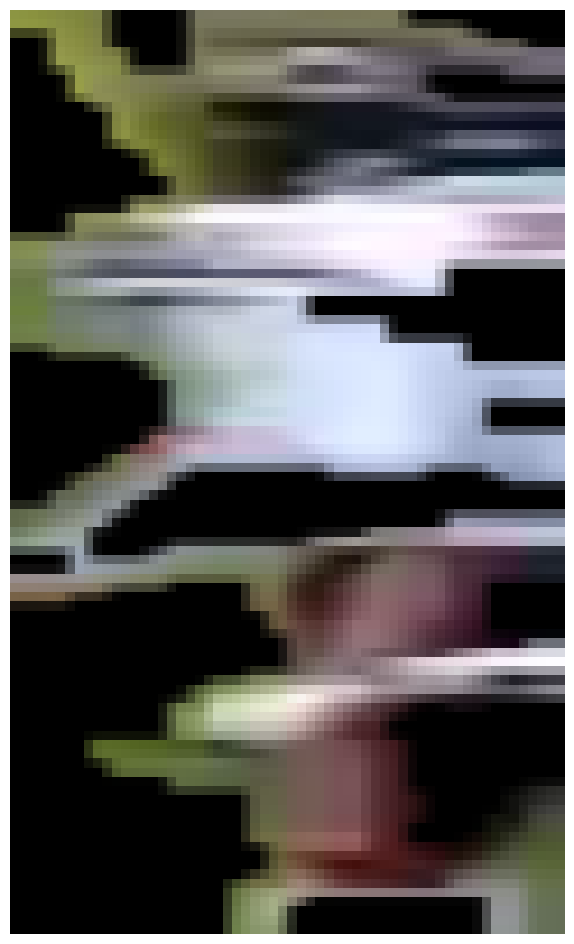

Chicago Bears 0.79914564 0.773622

0: 384x640 13 Players, 1 Referee, 18.8ms
Speed: 2.7ms preprocess, 18.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 1 Referee, 14.0ms
Speed: 4.5ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 1 Referee, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 1 Referee, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 1 Referee, 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 1 Referee, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.7ms
Speed: 2.5ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 

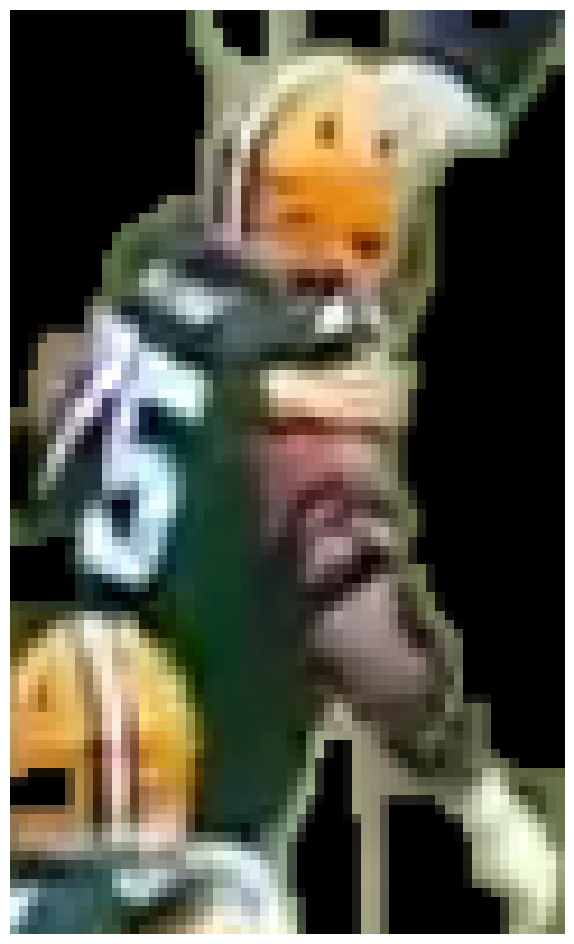

Green Bay Packers 0.7700885 0.80760264

0: 384x640 11 Players, 20.3ms
Speed: 2.6ms preprocess, 20.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.3ms
Speed: 3.3ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 21.7ms
Speed: 2.4ms preprocess, 21.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 17.0ms
Speed: 3.2ms preprocess, 17.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.7ms
Speed: 3.4ms preprocess, 13.7ms in

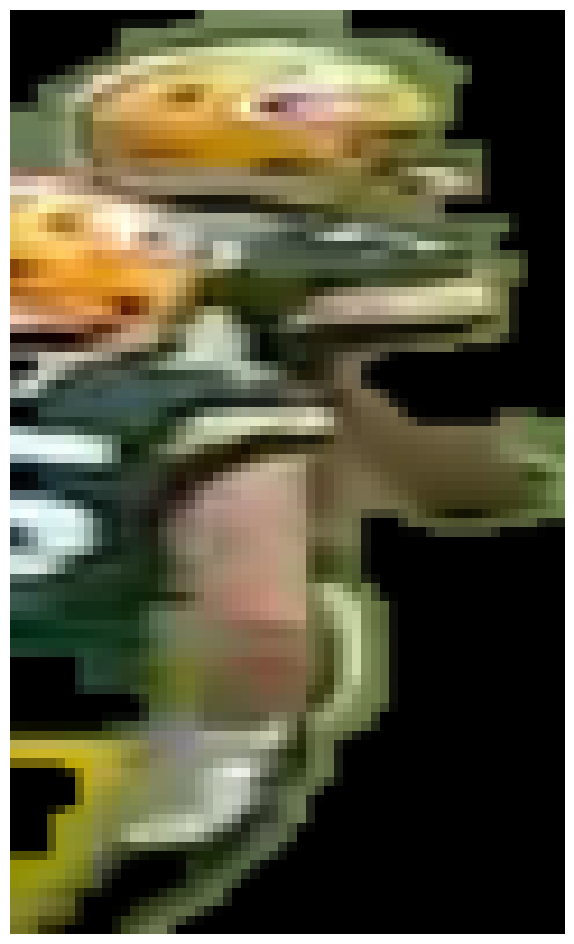

Green Bay Packers 0.56077516 0.6185242
(92, 42)
(100, 60)


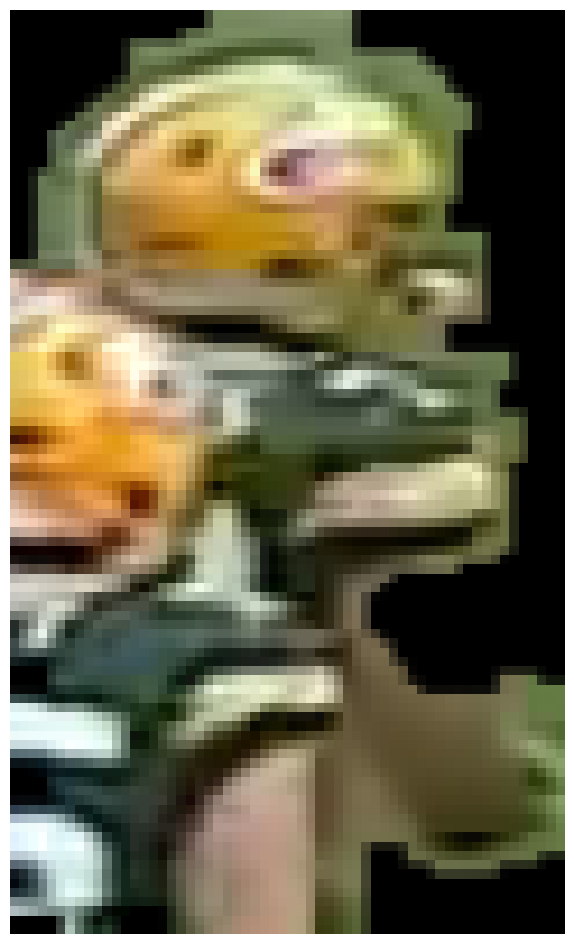

Green Bay Packers 0.56925106 0.61509144

0: 384x640 10 Players, 21.2ms
Speed: 2.6ms preprocess, 21.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(203, 40)
(100, 60)


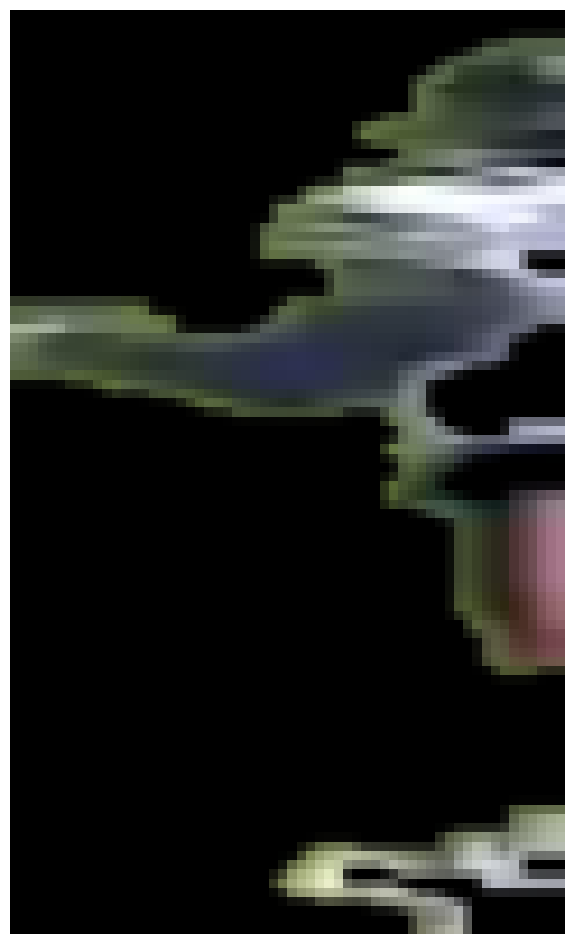

Green Bay Packers 0.6649882 0.7269688

0: 384x640 10 Players, 19.3ms
Speed: 3.4ms preprocess, 19.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 11.7ms
Speed: 3.2ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 20.0ms
Speed: 2.6ms preprocess, 20.0ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 20.2ms
Speed: 4.6ms preprocess, 20.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(83, 42)
(100, 60)

0: 384x640 12 Players, 20.0ms
Speed: 2.6ms preprocess, 20.0ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)
(87, 51)
(100, 60)


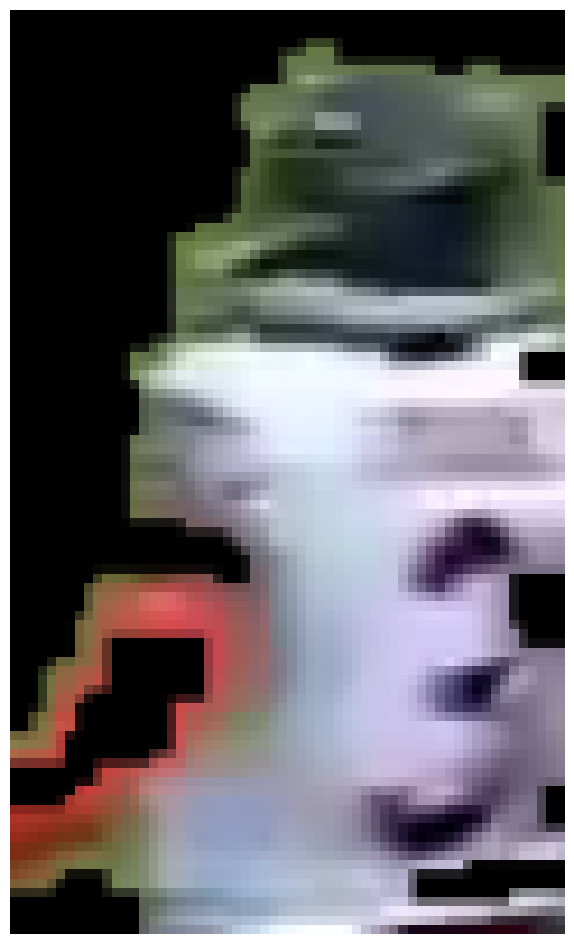

Chicago Bears 0.7657346 0.7443188
(91, 83)
(100, 60)

0: 384x640 12 Players, 21.6ms
Speed: 3.4ms preprocess, 21.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(94, 97)
(100, 60)


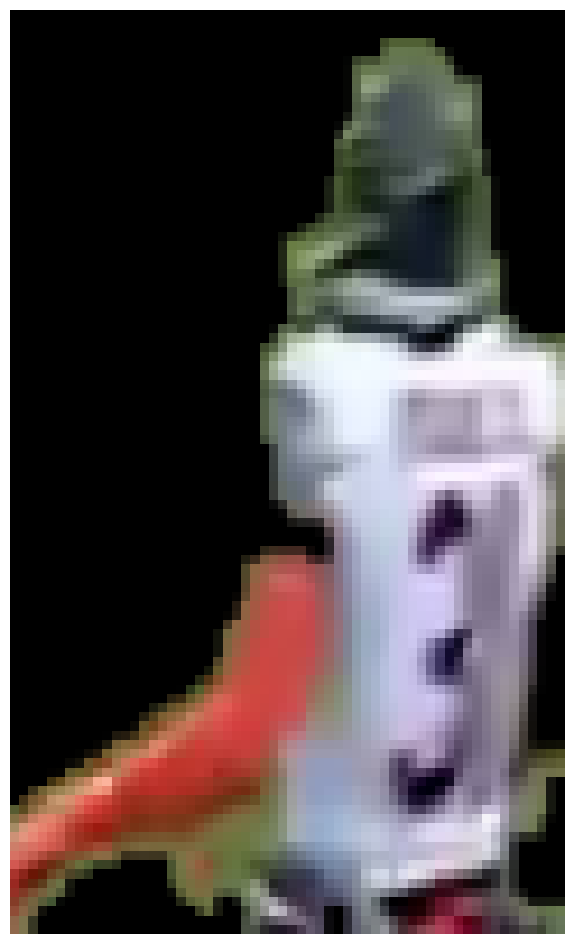

Chicago Bears 0.809069 0.772665

0: 384x640 12 Players, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.1ms
Speed: 2.2ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 17.3ms
Speed: 3.8ms preprocess, 17.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.2ms
Speed: 4.3ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 97)
(100, 60)


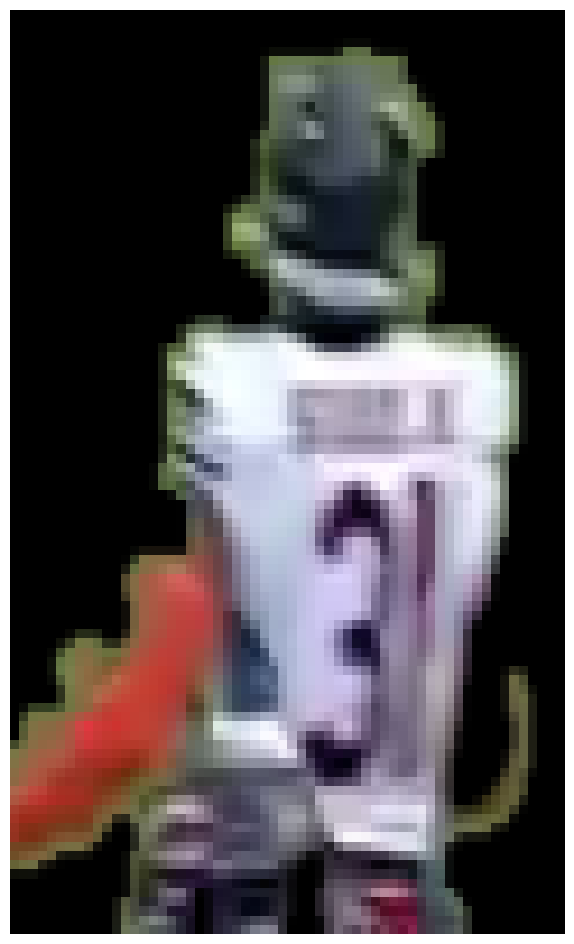

Chicago Bears 0.81746304 0.7928729

0: 384x640 11 Players, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 13.8ms
Speed: 4.3ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.9ms
Speed: 2.7ms preprocess, 14.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.0ms
Speed: 4.1ms preprocess, 14.0ms inference

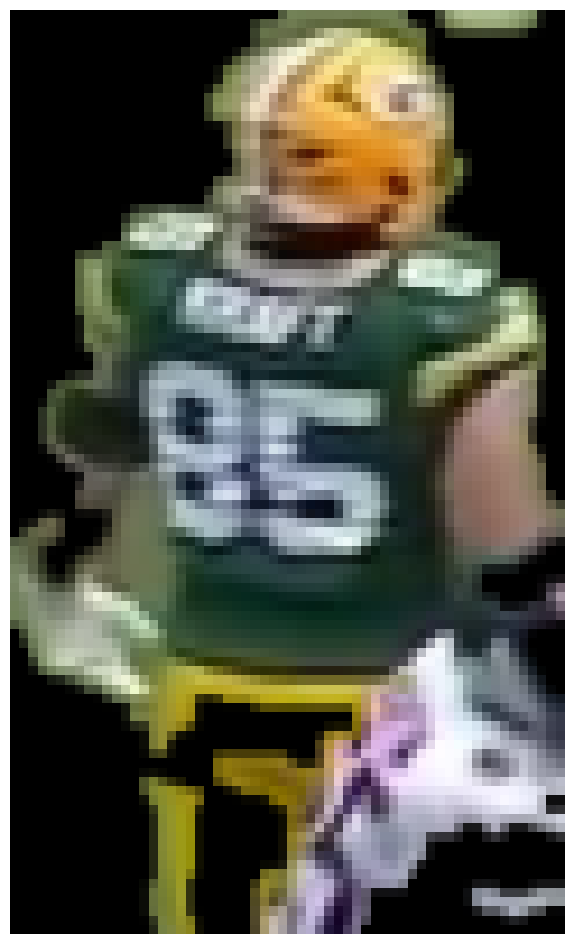

Green Bay Packers 0.80864775 0.8691369

0: 384x640 6 Players, 20.0ms
Speed: 2.5ms preprocess, 20.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 15.7ms
Speed: 5.1ms preprocess, 15.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(260, 90)
(100, 60)

0: 384x640 7 Players, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(272, 87)
(100, 60)

0: 384x640 7 Players, 18.2ms
Speed: 2.6ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 17.2ms
Speed: 2.6ms preprocess, 17.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(230, 87)
(100, 60)


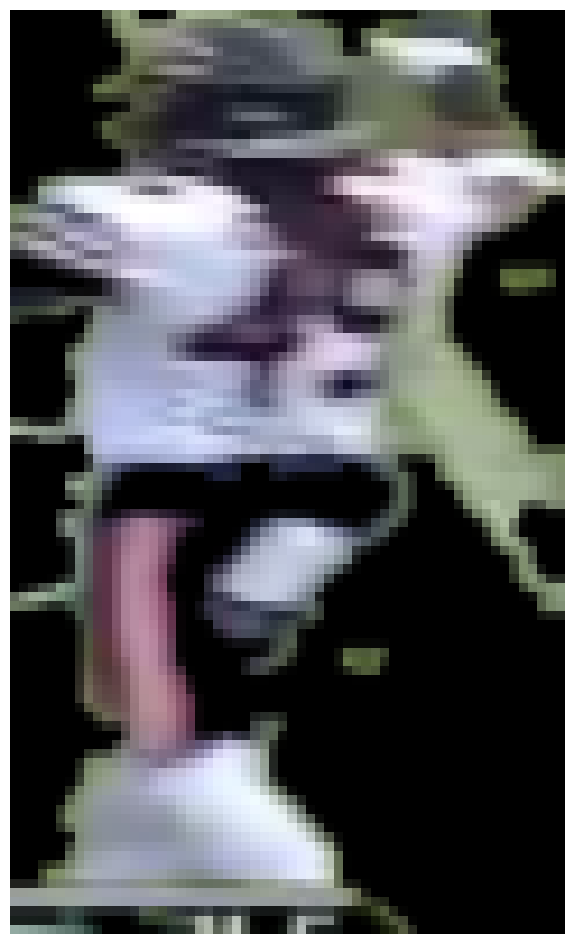

Chicago Bears 0.73348874 0.71132284

0: 384x640 6 Players, 18.6ms
Speed: 3.8ms preprocess, 18.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 17.6ms
Speed: 2.6ms preprocess, 17.6ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)
(216, 77)
(100, 60)

0: 384x640 6 Players, 1 Referee, 15.4ms
Speed: 4.0ms preprocess, 15.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 13.9ms
Speed: 5.2ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 20.9ms
Speed: 2.5ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 18.4ms
Speed: 2.6ms preprocess, 18.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(582, 701)
(100, 60)

0: 384x640 

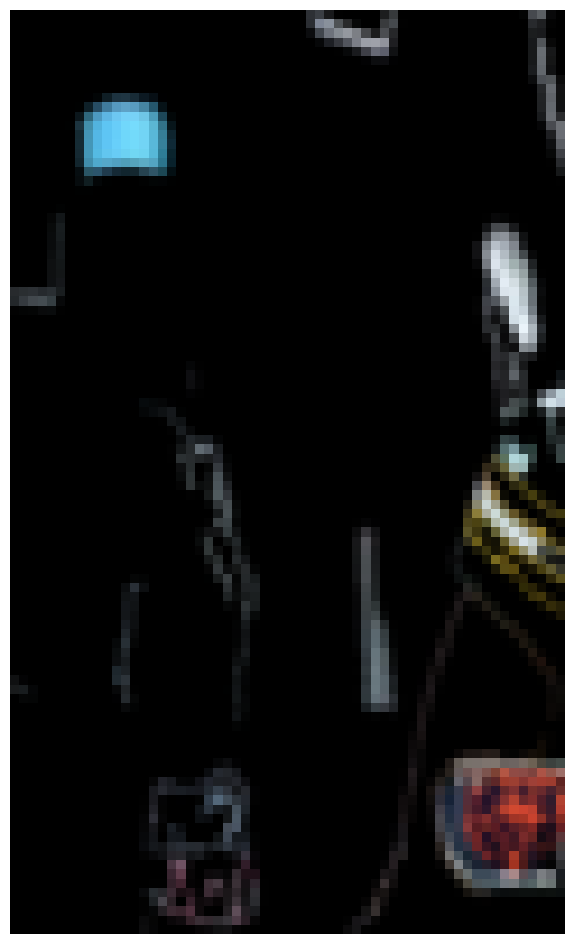

Green Bay Packers 0.6497204 0.70461565

0: 384x640 2 Players, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(567, 638)
(100, 60)

0: 384x640 2 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)
(575, 633)
(100, 60)

0: 384x640 2 Players, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(644, 619)
(100, 60)

0: 384x640 2 Players, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(659, 623)
(100, 60)

0: 384x640 2 Players, 19.0ms
Speed: 2.6ms preprocess, 19.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(678, 624)
(100, 60)

0: 384x640 2 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(677, 625)
(100, 60)

0: 384x640 2 Players, 14.5ms
Speed: 2.6ms preprocess, 14.5ms inference, 

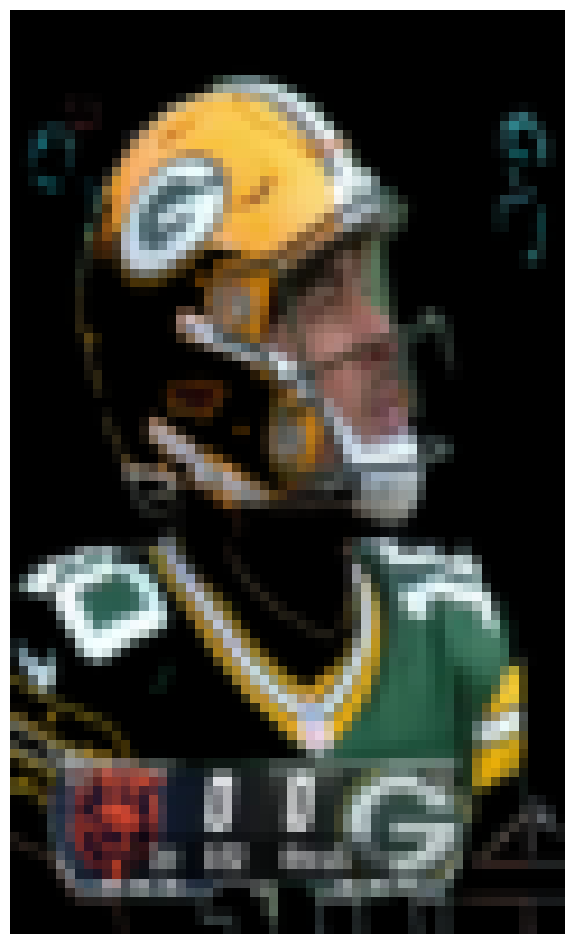

Green Bay Packers 0.8198431 0.8516342

0: 384x640 1 Player, 16.0ms
Speed: 2.7ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 25 Players, 3 Referees, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
1.0
(232, 73)
(100, 60)
0.0
(130, 59)
(100, 60)
0.0
(86, 74)
(100, 60)
0.0
(130, 33)
(100, 60)
0.0
(106, 39)
(100, 60)
0.0
(198, 53)
(100, 60)


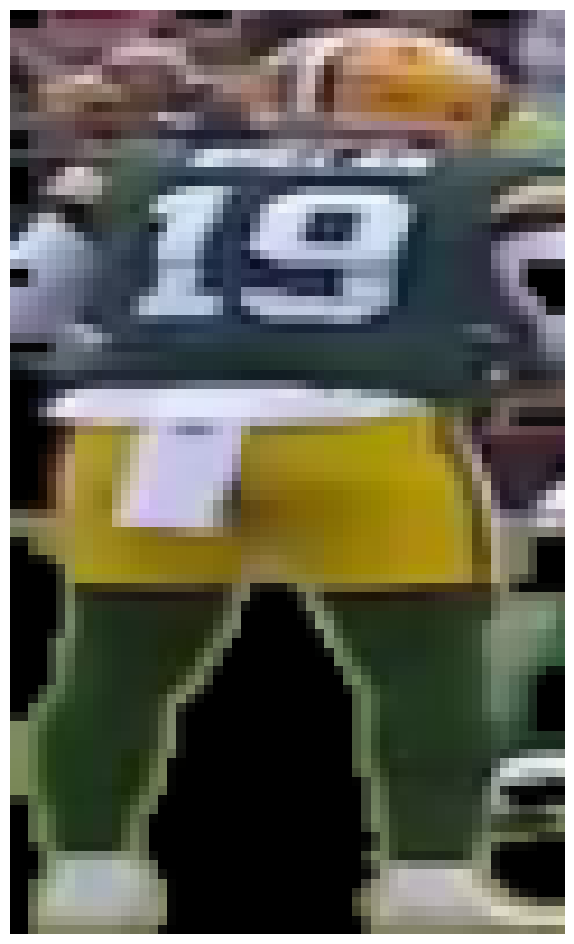

Green Bay Packers 0.7427269 0.8123859
0.0
(125, 46)
(100, 60)
0.0
(124, 58)
(100, 60)
0.0
(126, 46)
(100, 60)


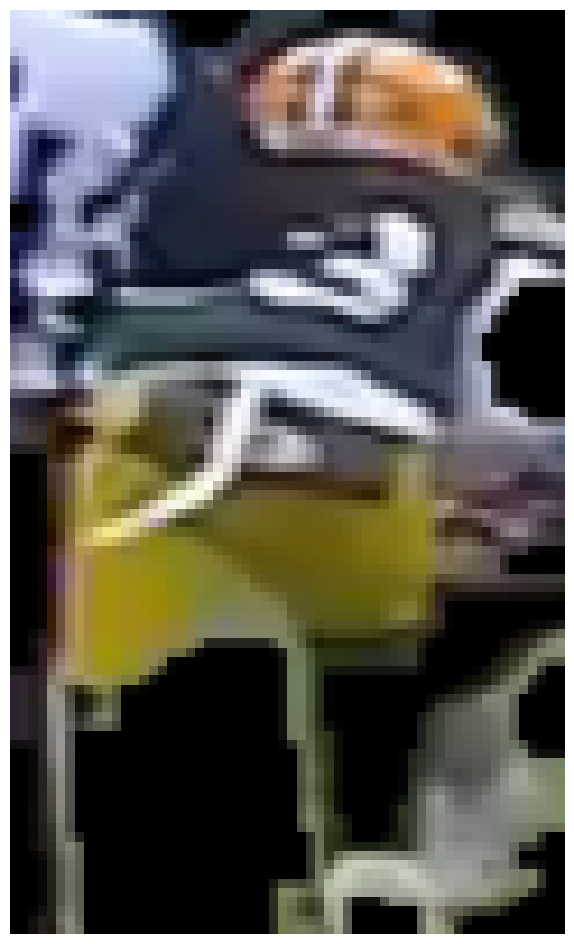

Green Bay Packers 0.71048045 0.7666651
0.0
(86, 74)
(100, 60)


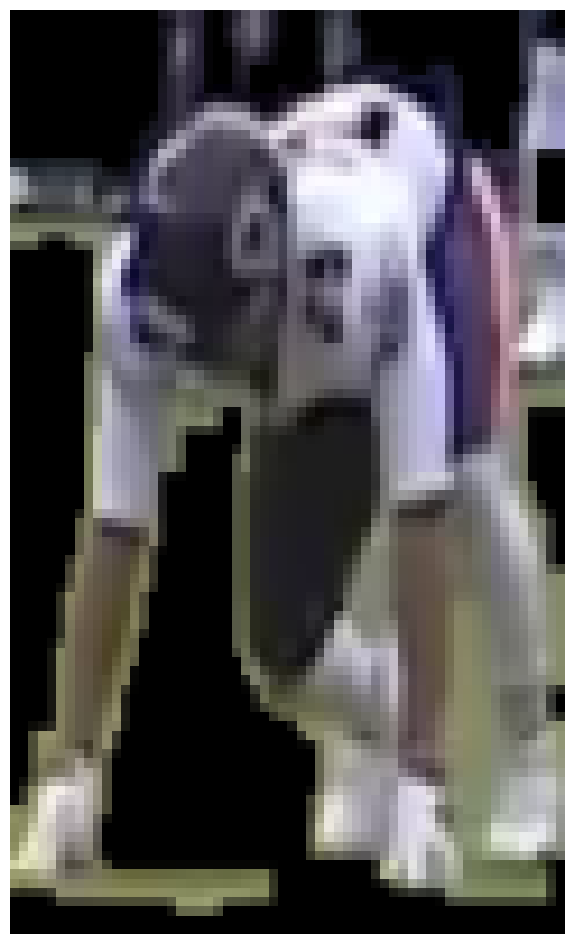

Chicago Bears 0.7067282 0.68263793
0.0
(142, 41)
(100, 60)


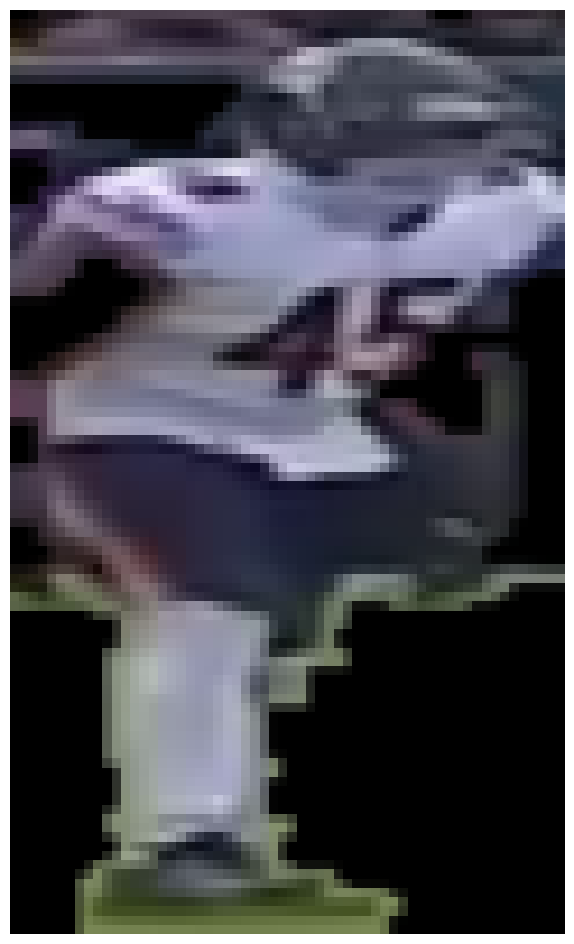

Green Bay Packers 0.58699554 0.6749372
0.0
(137, 37)
(100, 60)


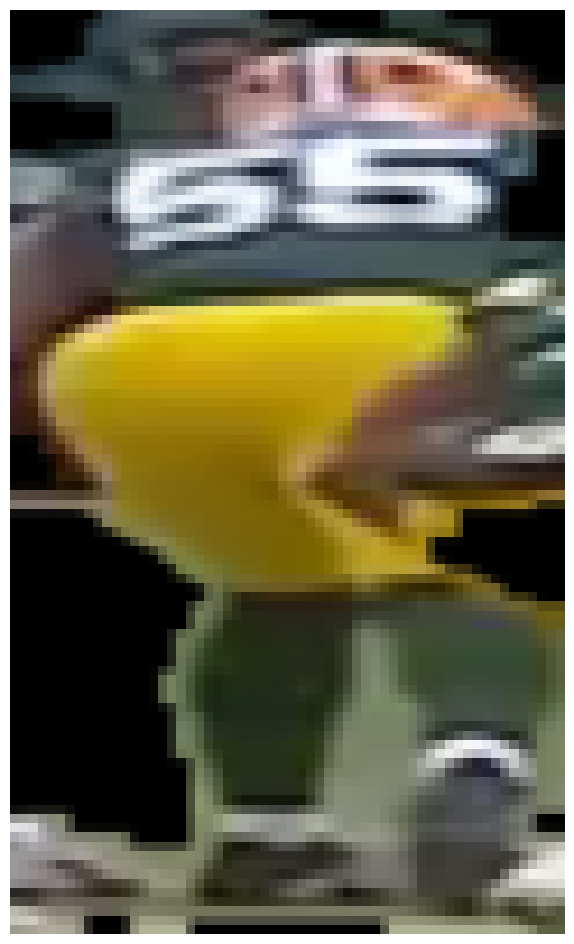

Green Bay Packers 0.6948348 0.7319913
0.0
(140, 39)
(100, 60)


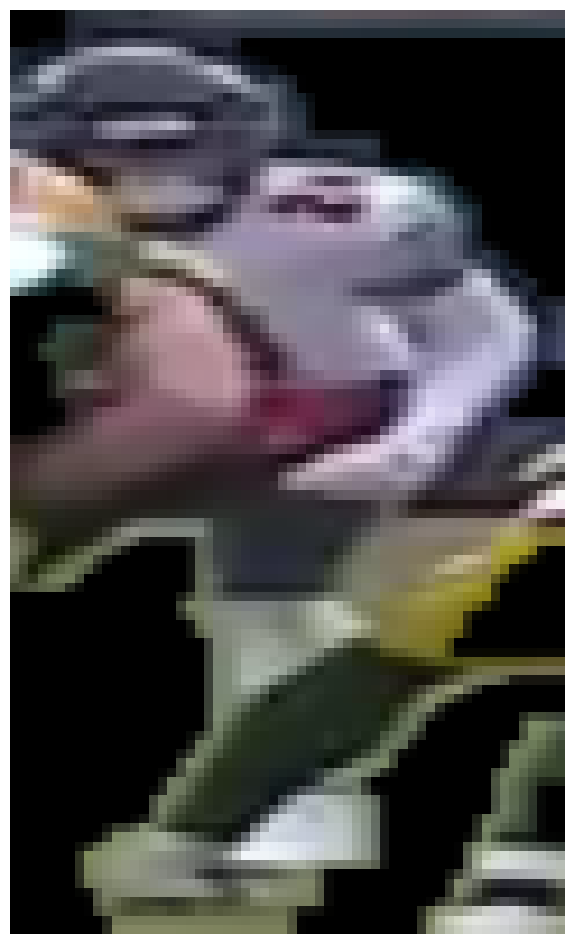

Green Bay Packers 0.7749737 0.80679584
1.0
(149, 45)
(100, 60)
0.0
(161, 52)
(100, 60)


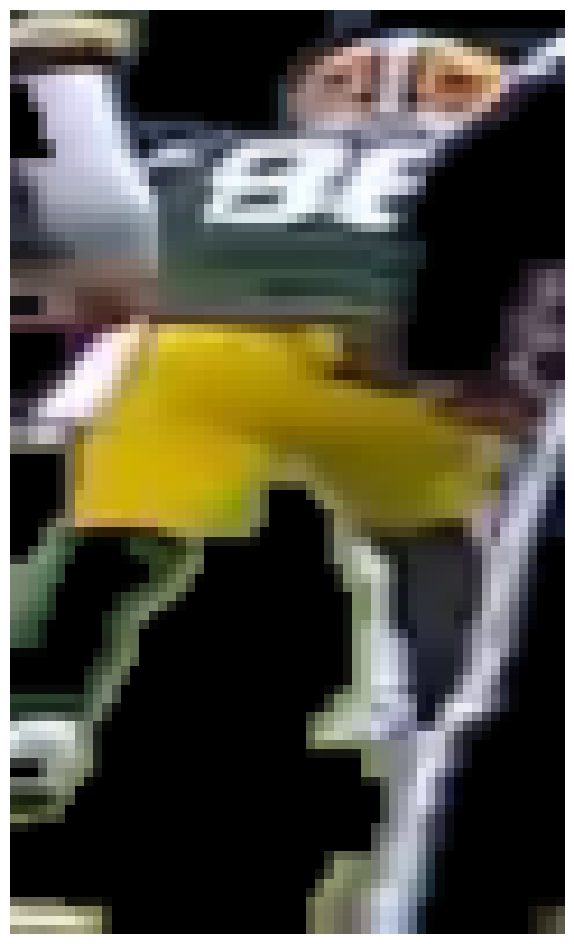

Green Bay Packers 0.7545928 0.77834344
0.0
(107, 37)
(100, 60)


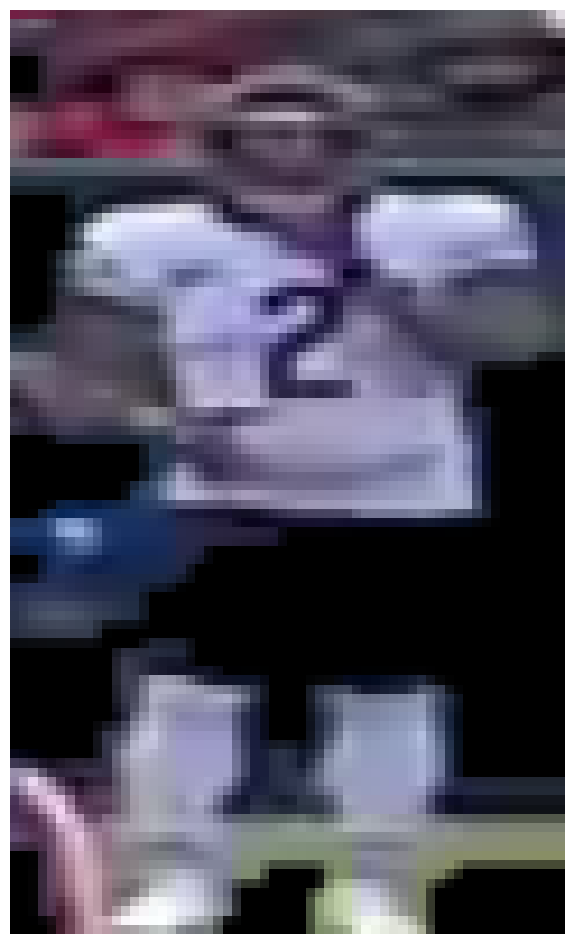

Green Bay Packers 0.5729283 0.6656394
1.0
(205, 65)
(100, 60)
0.0
(160, 62)
(100, 60)


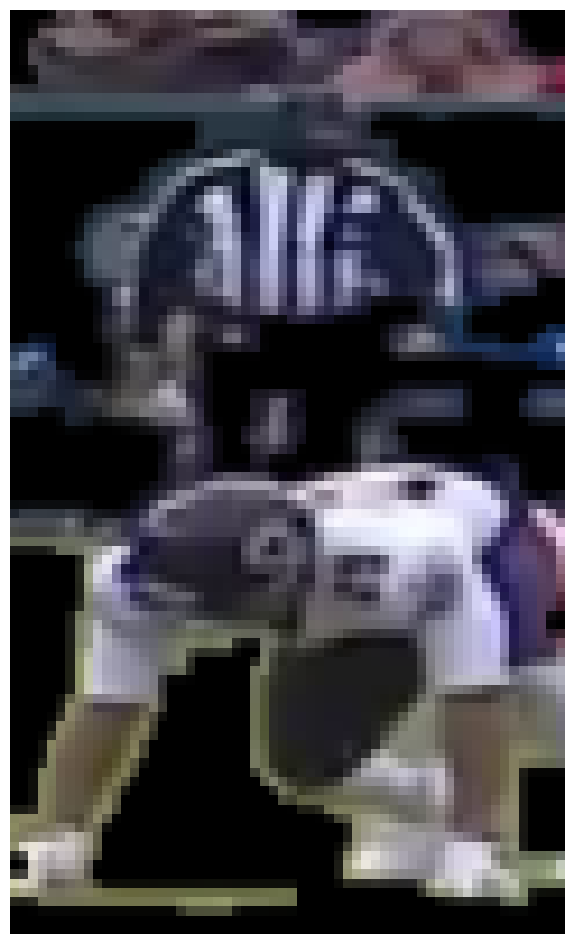

Green Bay Packers 0.69380194 0.74811363
0.0
(120, 42)
(100, 60)


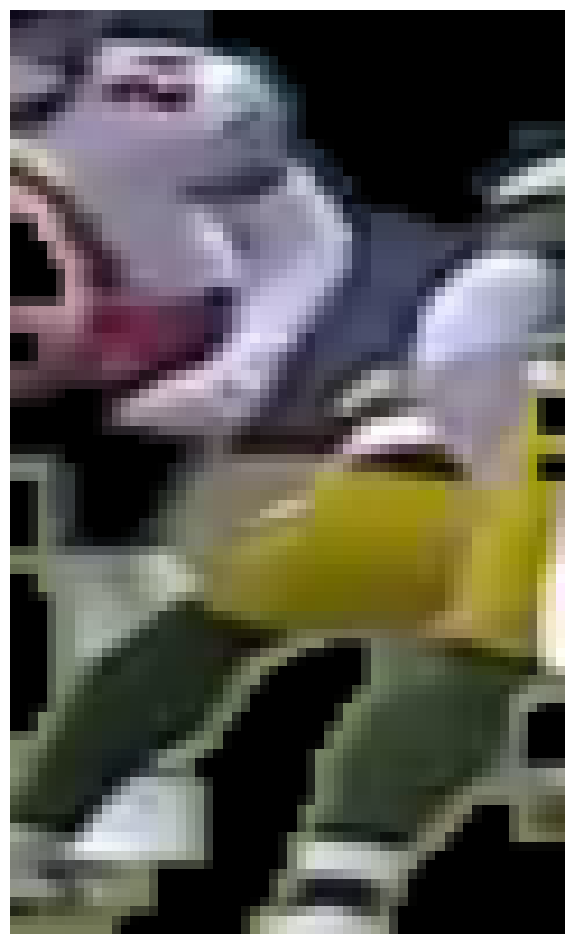

Green Bay Packers 0.7388903 0.7622614
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0: 384x640 17 Players, 3 Referees, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(233, 72)
(100, 60)
(129, 62)
(100, 60)
(87, 74)
(100, 60)
(130, 34)
(100, 60)
(105, 40)
(100, 60)
(199, 54)
(100, 60)


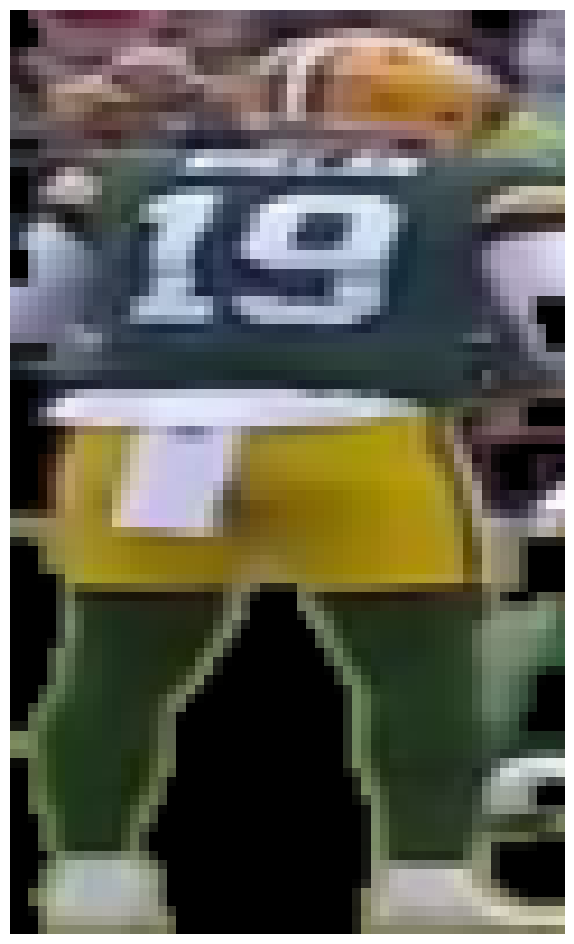

Green Bay Packers 0.7464485 0.8147621
(127, 47)
(100, 60)
(127, 60)
(100, 60)
(125, 45)
(100, 60)


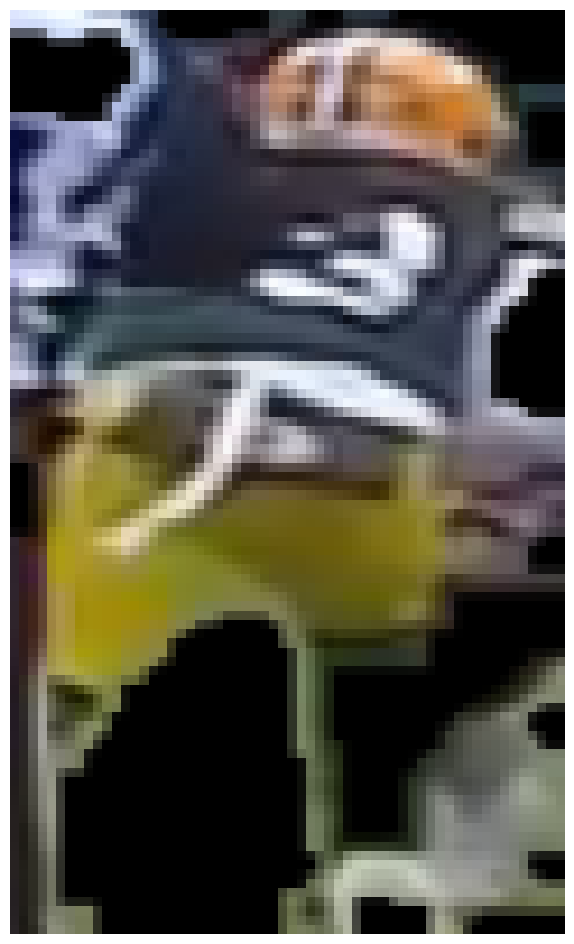

Green Bay Packers 0.7058488 0.76541984
(85, 73)
(100, 60)


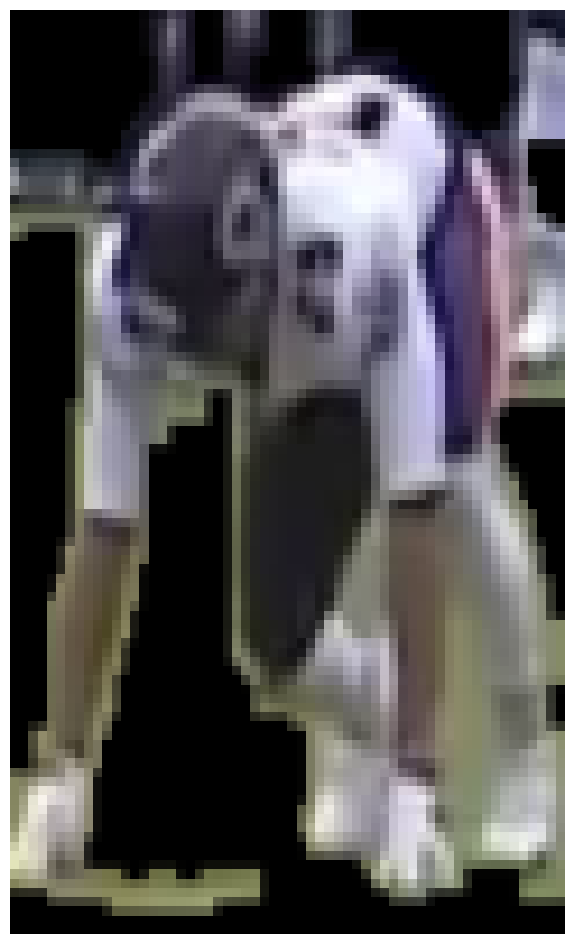

Chicago Bears 0.712189 0.6869427
(141, 43)
(100, 60)


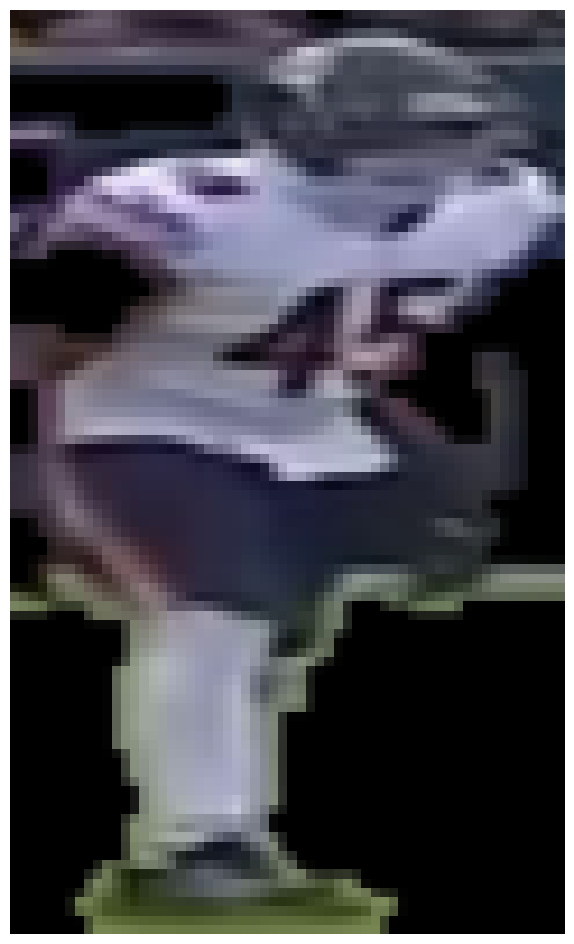

Green Bay Packers 0.5889649 0.67847514
(137, 36)
(100, 60)


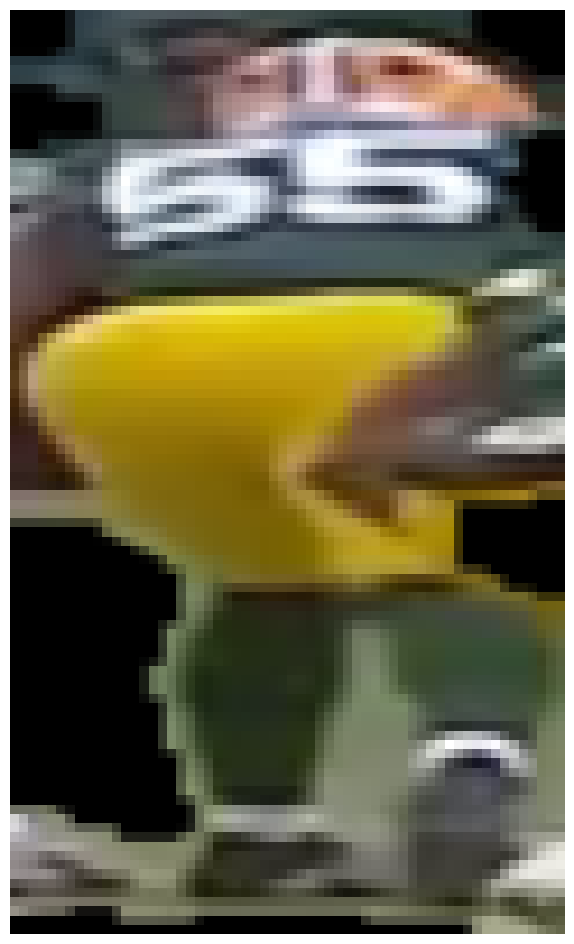

Green Bay Packers 0.68472624 0.72275275
(139, 39)
(100, 60)


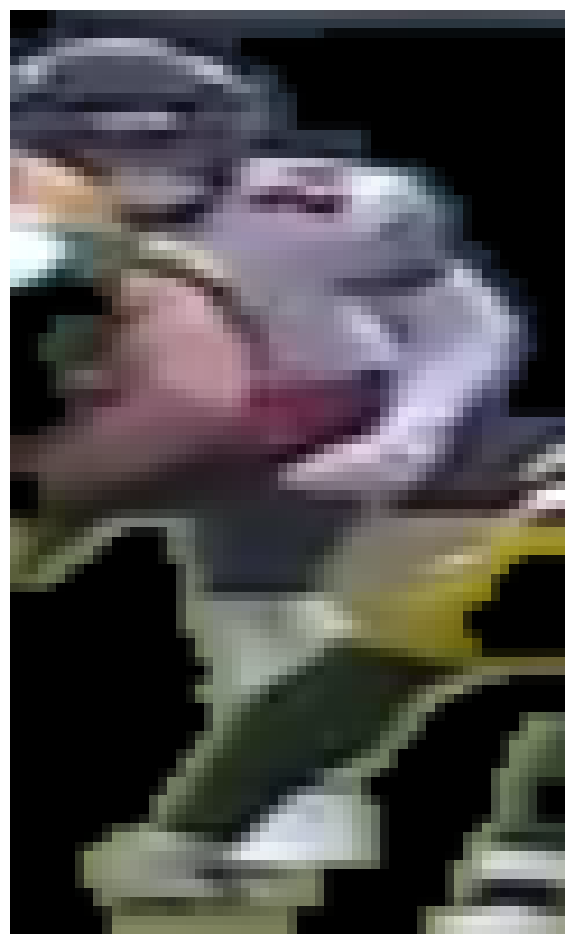

Green Bay Packers 0.77065104 0.8028627
(135, 44)
(100, 60)
(174, 50)
(100, 60)


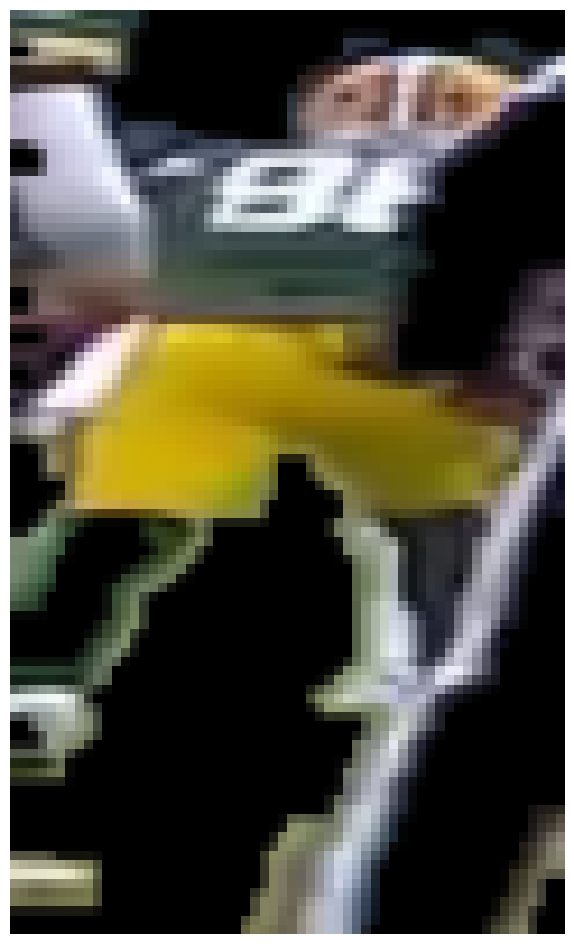

Green Bay Packers 0.7446412 0.7670448
(107, 38)
(100, 60)


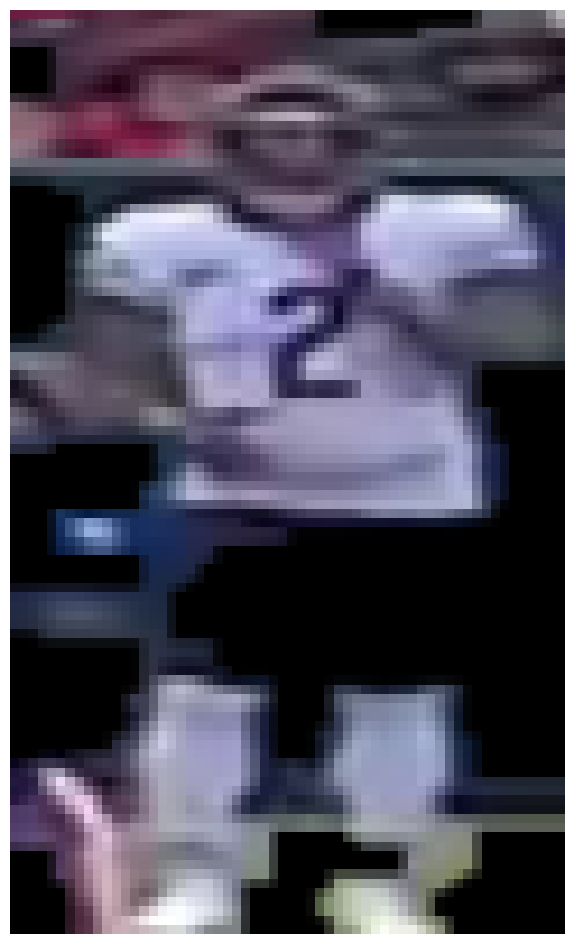

Green Bay Packers 0.5683499 0.6609434
(206, 65)
(100, 60)
(122, 43)
(100, 60)


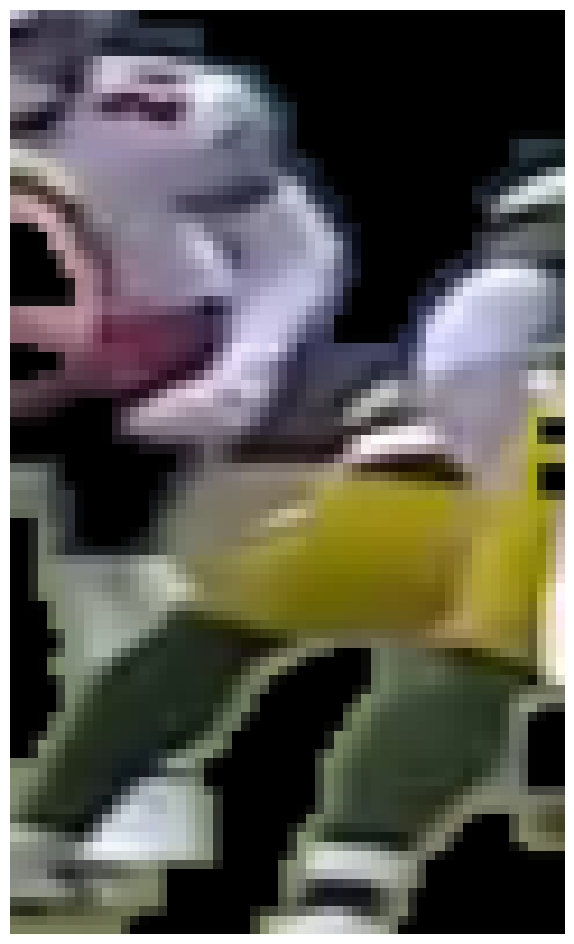

Green Bay Packers 0.73326397 0.7533578

0: 384x640 18 Players, 3 Referees, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(129, 61)
(100, 60)
(88, 74)
(100, 60)
(129, 32)
(100, 60)
(96, 38)
(100, 60)
(127, 46)
(100, 60)
(132, 59)
(100, 60)
(85, 43)
(100, 60)


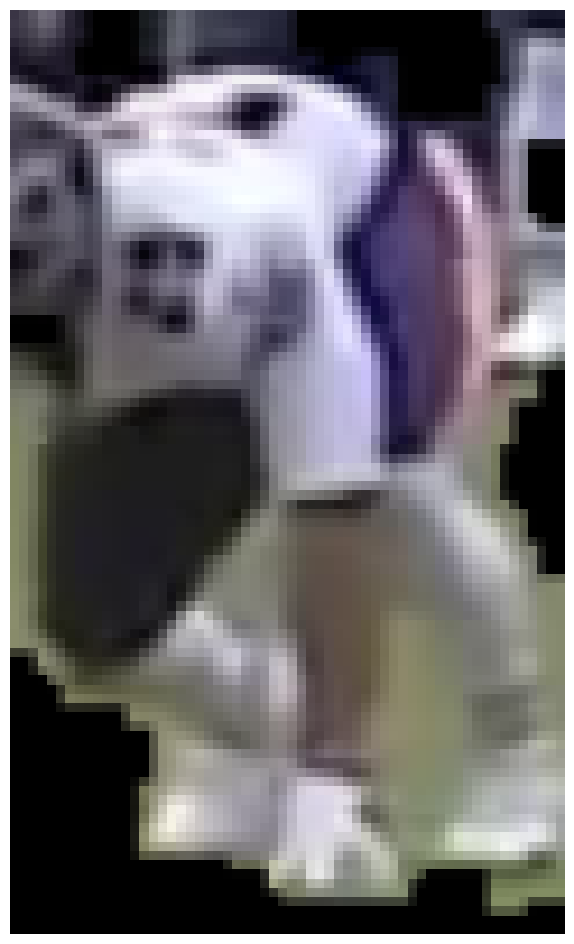

Chicago Bears 0.71794266 0.66761935

0: 384x640 18 Players, 4 Referees, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 60)
(100, 60)
(88, 73)
(100, 60)
(128, 31)
(100, 60)
(86, 37)
(100, 60)
(126, 42)
(100, 60)
(136, 58)
(100, 60)
(110, 43)
(100, 60)

0: 384x640 19 Players, 4 Referees, 16.6ms
Speed: 3.8ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 60)
(100, 60)
(87, 73)
(100, 60)
(127, 30)
(100, 60)
(93, 36)
(100, 60)
(128, 44)
(100, 60)
(138, 59)
(100, 60)
(110, 41)
(100, 60)

0: 384x640 22 Players, 4 Referees, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 60)
(100, 60)
(87, 73)
(100, 60)
(126, 31)
(100, 60)
(94, 35)
(100, 60)
(129, 45)
(100, 60)
(139, 63)
(100, 60)
(107, 39)
(100, 60)

0: 384x640 21 Players, 4 Referees, 21.4ms
Speed: 2.6ms preprocess, 21.4ms inference, 1.7ms postprocess per image at shape (1, 3, 

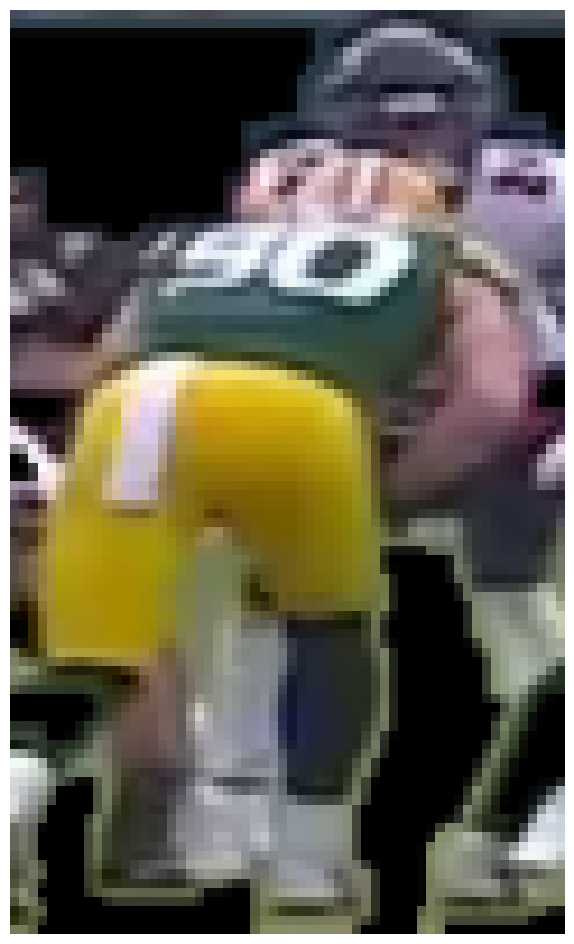

Green Bay Packers 0.7726239 0.7961669

0: 384x640 22 Players, 5 Referees, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(129, 61)
(100, 60)
(87, 74)
(100, 60)
(128, 32)
(100, 60)
(102, 34)
(100, 60)
(130, 45)
(100, 60)
(100, 41)
(100, 60)

0: 384x640 21 Players, 3 Referees, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(129, 61)
(100, 60)
(85, 74)
(100, 60)
(128, 32)
(100, 60)
(99, 34)
(100, 60)
(126, 41)
(100, 60)
(91, 35)
(100, 60)
(229, 91)
(100, 60)

0: 384x640 22 Players, 4 Referees, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(129, 60)
(100, 60)
(85, 74)
(100, 60)
(128, 32)
(100, 60)
(96, 33)
(100, 60)


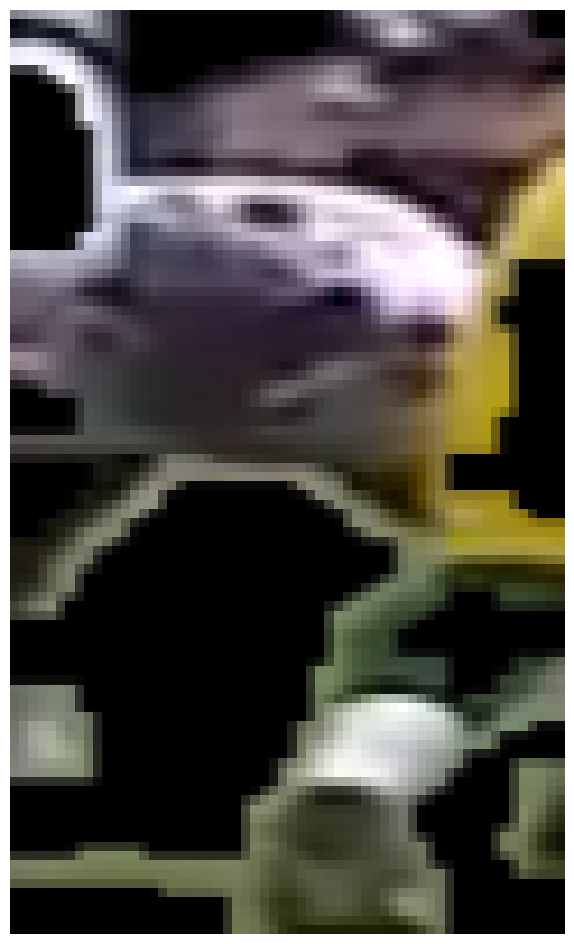

Chicago Bears 0.7228672 0.70185316
(125, 41)
(100, 60)
(97, 45)
(100, 60)

0: 384x640 21 Players, 3 Referees, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 61)
(100, 60)
(84, 73)
(100, 60)
(129, 33)
(100, 60)
(126, 41)
(100, 60)
(95, 45)
(100, 60)

0: 384x640 20 Players, 2 Referees, 12.7ms
Speed: 5.0ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 63)
(100, 60)
(82, 74)
(100, 60)
(129, 32)
(100, 60)
(129, 45)
(100, 60)
(94, 43)
(100, 60)

0: 384x640 20 Players, 2 Referees, 13.5ms
Speed: 4.2ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(130, 62)
(100, 60)
(81, 73)
(100, 60)
(128, 32)
(100, 60)
(131, 46)
(100, 60)
(93, 42)
(100, 60)
(85, 64)
(100, 60)

0: 384x640 20 Players, 2 Referees, 11.5ms
Speed: 4.1ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(130, 63)
(100, 60)
(80, 72)
(100, 60)
(129, 34)
(100

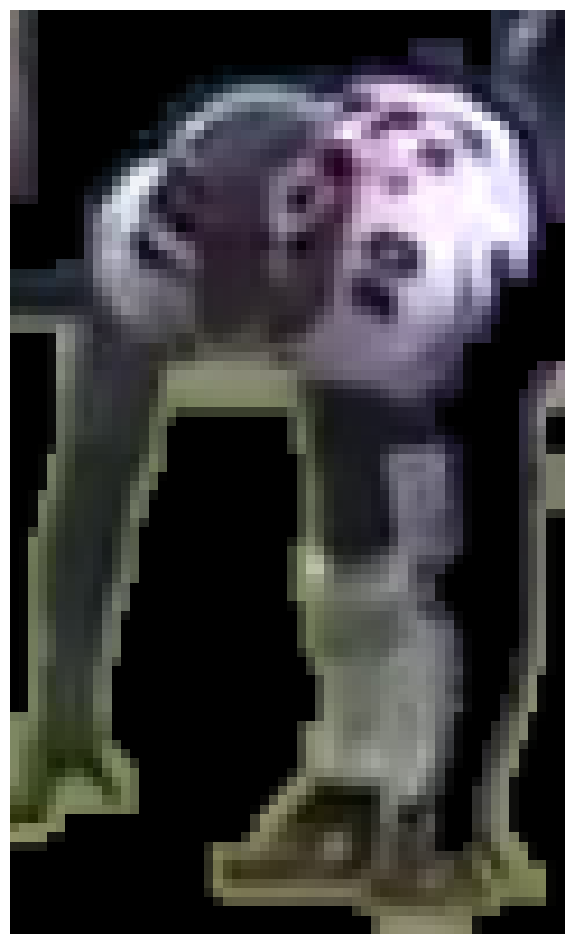

Green Bay Packers 0.7022369 0.7241765
(87, 71)
(100, 60)


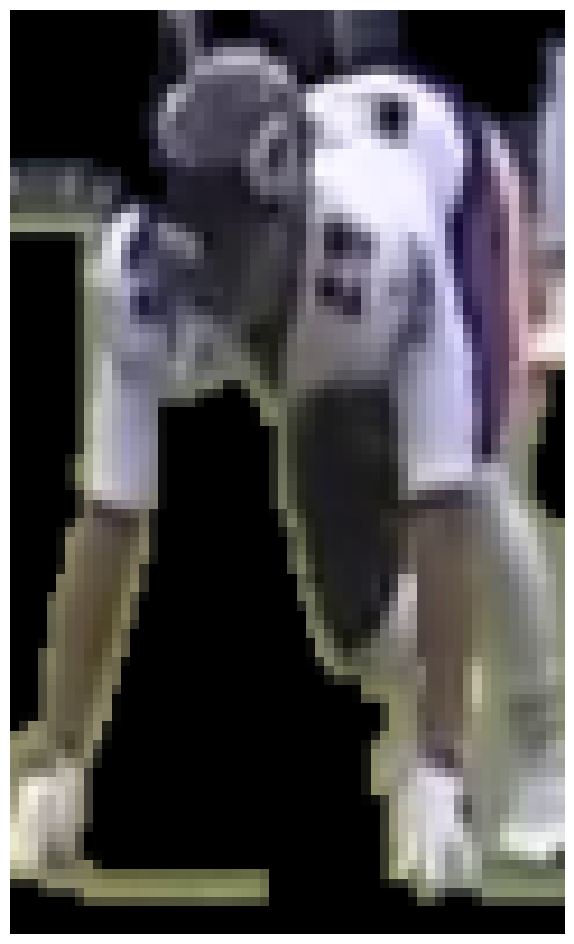

Chicago Bears 0.6891494 0.6684428

0: 384x640 18 Players, 3 Referees, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(132, 60)
(100, 60)
(85, 75)
(100, 60)
(127, 40)
(100, 60)
(131, 48)
(100, 60)

0: 384x640 17 Players, 3 Referees, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(132, 61)
(100, 60)
(85, 75)
(100, 60)
(127, 40)
(100, 60)
(131, 47)
(100, 60)

0: 384x640 16 Players, 3 Referees, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(132, 61)
(100, 60)
(85, 75)
(100, 60)
(126, 40)
(100, 60)
(132, 47)
(100, 60)

0: 384x640 17 Players, 3 Referees, 13.2ms
Speed: 5.1ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(133, 61)
(100, 60)
(84, 75)
(100, 60)
(125, 42)
(100, 60)
(132, 49)
(100, 60)

0: 384x640 18 Players, 3 Referees, 16.0ms
Speed: 2.6ms preprocess, 16.0ms inference, 1.9m

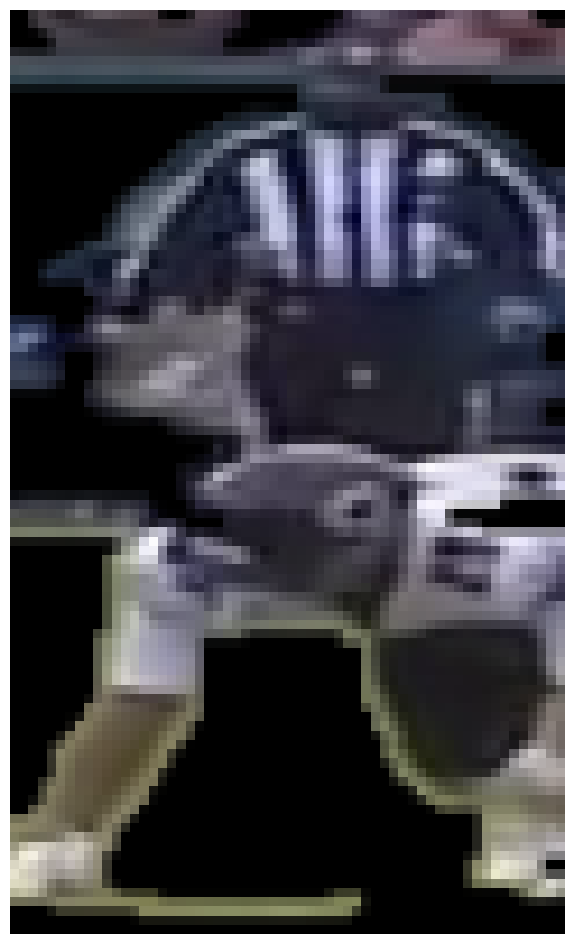

Green Bay Packers 0.62449205 0.7041565
(130, 45)
(100, 60)


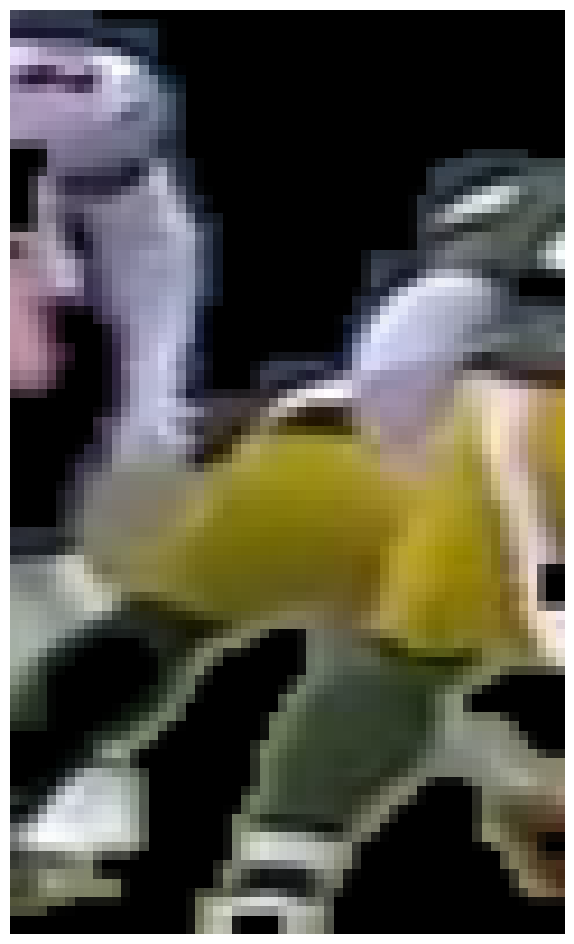

Green Bay Packers 0.69960076 0.73815
(237, 84)
(100, 60)


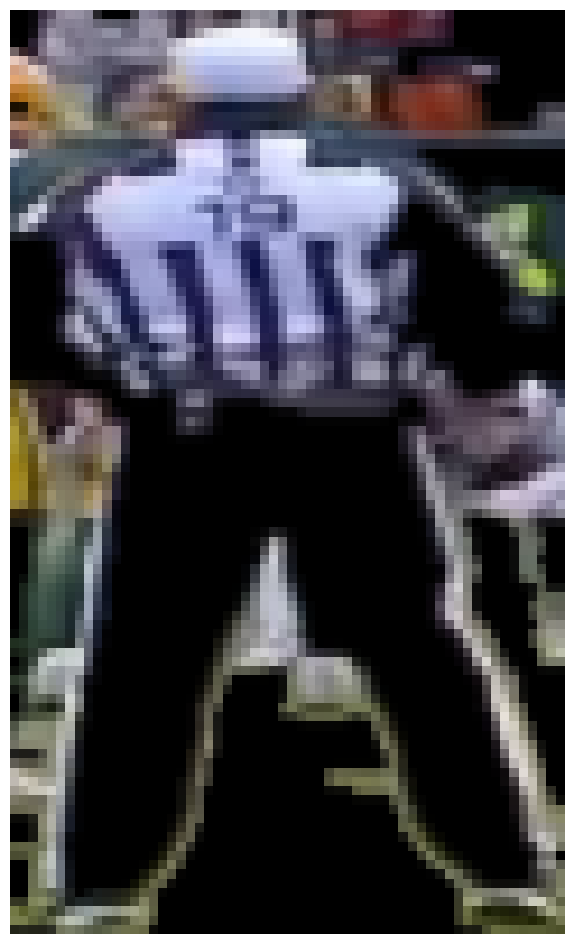

Green Bay Packers 0.70660436 0.77208626

0: 384x640 19 Players, 2 Referees, 15.5ms
Speed: 2.7ms preprocess, 15.5ms inference, 6.3ms postprocess per image at shape (1, 3, 384, 640)
(132, 61)
(100, 60)
(84, 74)
(100, 60)
(124, 40)
(100, 60)
(133, 48)
(100, 60)
(109, 62)
(100, 60)

0: 384x640 17 Players, 3 Referees, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(132, 61)
(100, 60)
(83, 74)
(100, 60)
(124, 40)
(100, 60)
(133, 47)
(100, 60)

0: 384x640 18 Players, 3 Referees, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(132, 60)
(100, 60)
(83, 74)
(100, 60)
(125, 40)
(100, 60)
(133, 47)
(100, 60)

0: 384x640 19 Players, 3 Referees, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(132, 61)
(100, 60)
(84, 75)
(100, 60)
(126, 39)
(100, 60)
(133, 46)
(100, 60)

0: 384x640 20 Players, 3 Referees, 20.5ms
Speed: 2.7ms preproce

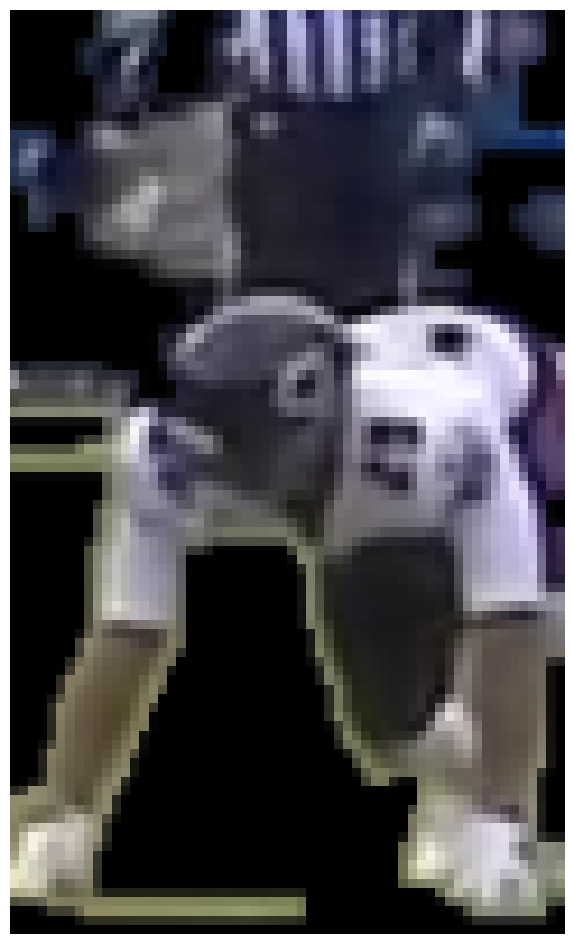

Green Bay Packers 0.6652622 0.69885415

0: 384x640 19 Players, 3 Referees, 16.5ms
Speed: 2.7ms preprocess, 16.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(132, 56)
(100, 60)
(85, 74)
(100, 60)
(125, 38)
(100, 60)
(130, 43)
(100, 60)

0: 384x640 19 Players, 3 Referees, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(133, 57)
(100, 60)
(85, 75)
(100, 60)
(124, 36)
(100, 60)
(127, 43)
(100, 60)

0: 384x640 18 Players, 3 Referees, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(132, 58)
(100, 60)


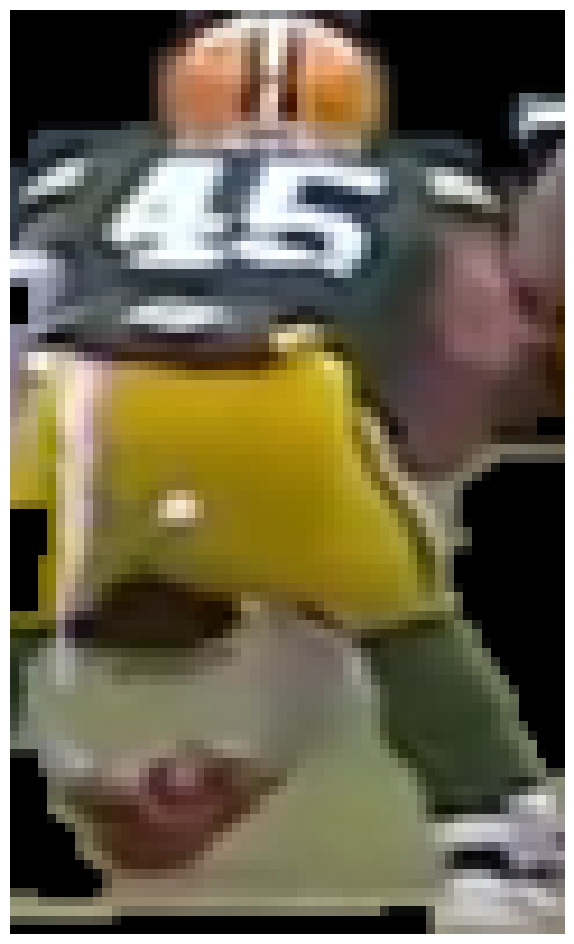

Green Bay Packers 0.6750996 0.6963479
(85, 76)
(100, 60)
(124, 36)
(100, 60)
(128, 43)
(100, 60)

0: 384x640 18 Players, 3 Referees, 18.6ms
Speed: 5.3ms preprocess, 18.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(84, 75)
(100, 60)
(122, 36)
(100, 60)
(127, 43)
(100, 60)

0: 384x640 17 Players, 3 Referees, 20.8ms
Speed: 2.7ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(84, 77)
(100, 60)


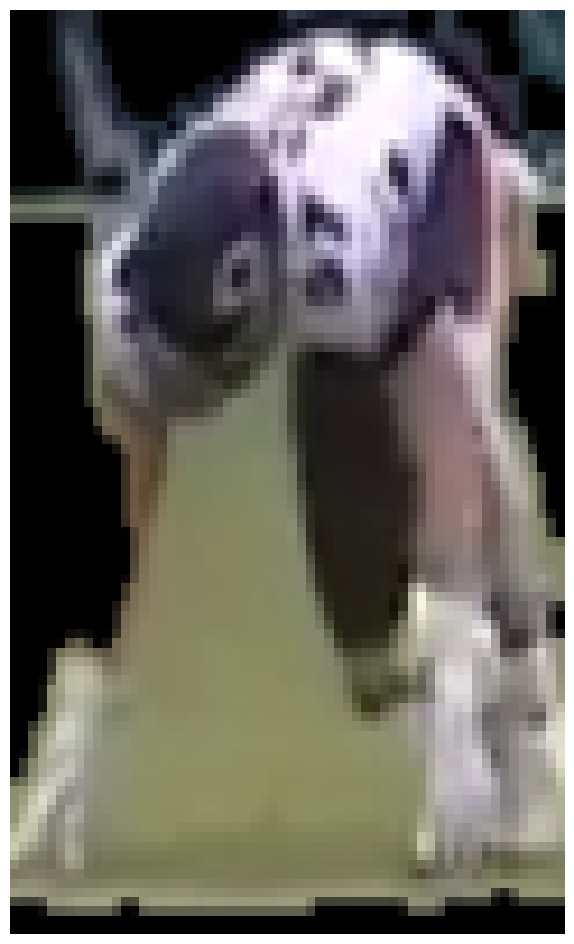

Chicago Bears 0.63845056 0.6181405
(120, 34)
(100, 60)
(128, 47)
(100, 60)

0: 384x640 17 Players, 3 Referees, 24.9ms
Speed: 5.6ms preprocess, 24.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(118, 32)
(100, 60)
(130, 49)
(100, 60)

0: 384x640 16 Players, 3 Referees, 21.3ms
Speed: 2.5ms preprocess, 21.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(118, 33)
(100, 60)
(130, 49)
(100, 60)

0: 384x640 17 Players, 4 Referees, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(116, 33)
(100, 60)
(131, 49)
(100, 60)

0: 384x640 19 Players, 3 Referees, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(116, 34)
(100, 60)
(132, 49)
(100, 60)
(157, 26)
(100, 60)


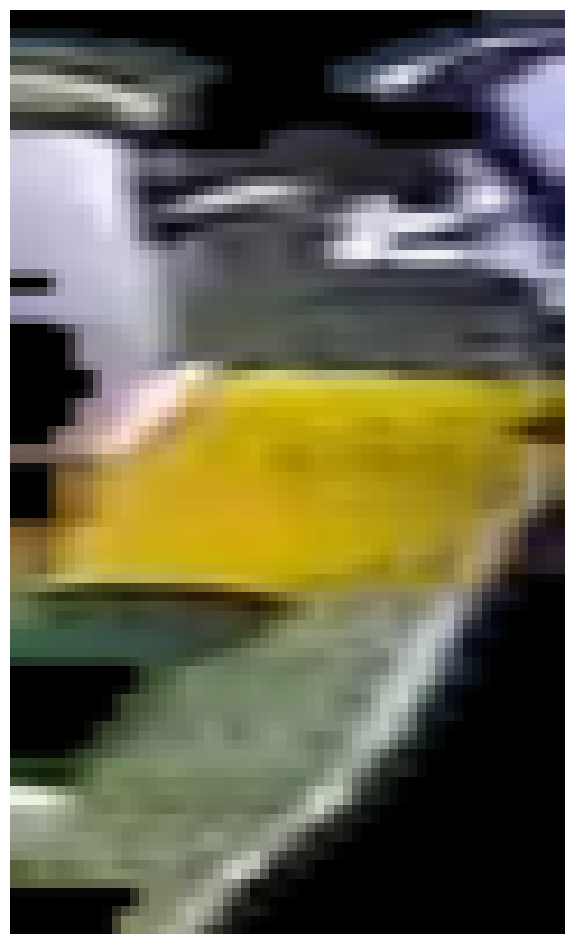

Green Bay Packers 0.65339446 0.6873245

0: 384x640 19 Players, 3 Referees, 23.2ms
Speed: 8.6ms preprocess, 23.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(116, 35)
(100, 60)
(132, 48)
(100, 60)

0: 384x640 18 Players, 4 Referees, 16.9ms
Speed: 2.6ms preprocess, 16.9ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)
(117, 34)
(100, 60)
(133, 47)
(100, 60)

0: 384x640 17 Players, 4 Referees, 20.6ms
Speed: 2.7ms preprocess, 20.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(118, 35)
(100, 60)
(134, 48)
(100, 60)

0: 384x640 18 Players, 3 Referees, 19.1ms
Speed: 2.6ms preprocess, 19.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(121, 35)
(100, 60)
(134, 47)
(100, 60)
(130, 68)
(100, 60)


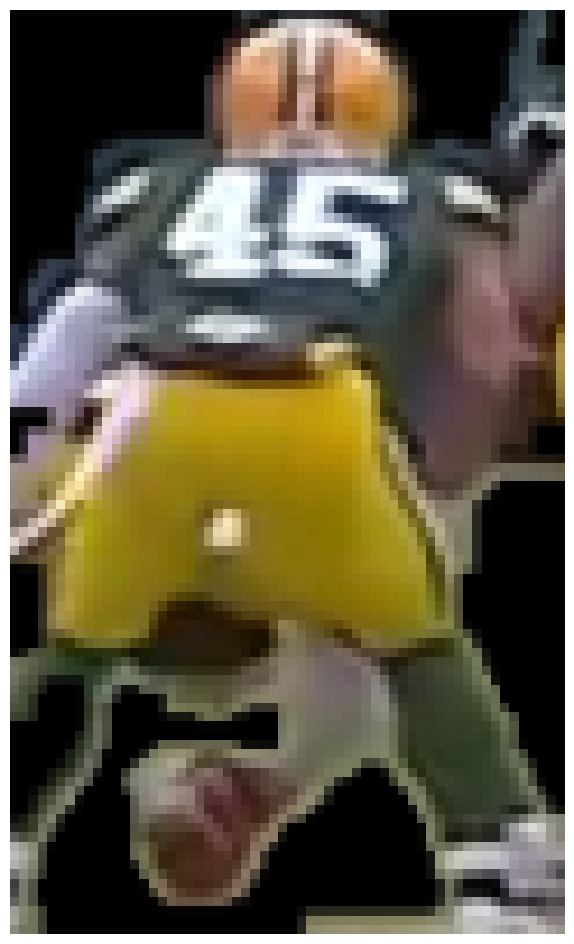

Green Bay Packers 0.71051806 0.7384023

0: 384x640 16 Players, 3 Referees, 15.3ms
Speed: 2.6ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(121, 35)
(100, 60)
(134, 47)
(100, 60)

0: 384x640 17 Players, 3 Referees, 20.2ms
Speed: 2.7ms preprocess, 20.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(119, 36)
(100, 60)
(133, 48)
(100, 60)

0: 384x640 17 Players, 2 Referees, 18.7ms
Speed: 2.5ms preprocess, 18.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(117, 35)
(100, 60)
(133, 48)
(100, 60)

0: 384x640 17 Players, 4 Referees, 20.0ms
Speed: 3.1ms preprocess, 20.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(116, 35)
(100, 60)
(133, 49)
(100, 60)
(92, 33)
(100, 60)


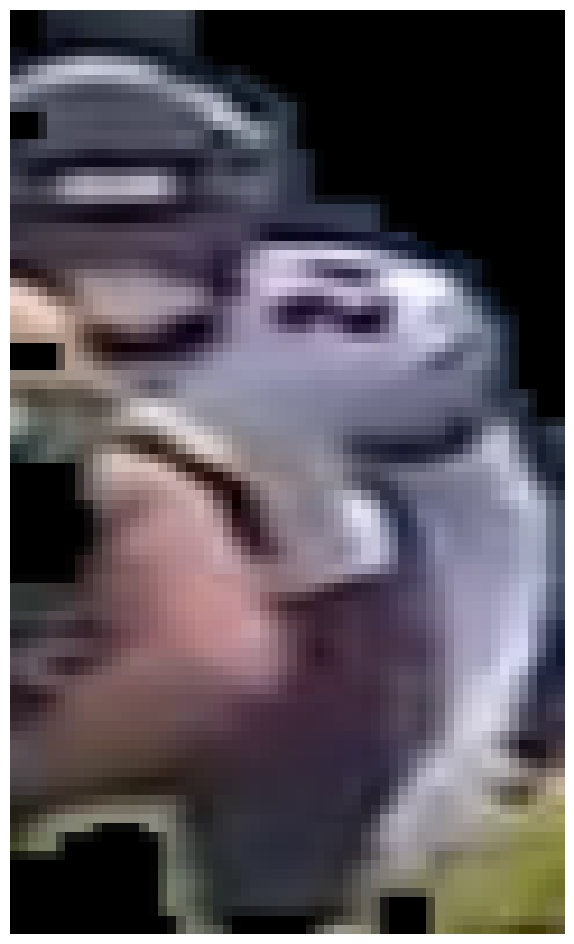

Green Bay Packers 0.71056134 0.748426

0: 384x640 17 Players, 4 Referees, 20.6ms
Speed: 5.1ms preprocess, 20.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(116, 36)
(100, 60)
(134, 49)
(100, 60)

0: 384x640 17 Players, 4 Referees, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(117, 36)
(100, 60)
(134, 49)
(100, 60)

0: 384x640 17 Players, 4 Referees, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(118, 36)
(100, 60)
(134, 48)
(100, 60)

0: 384x640 17 Players, 3 Referees, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(118, 38)
(100, 60)
(134, 48)
(100, 60)

0: 384x640 17 Players, 3 Referees, 20.8ms
Speed: 2.5ms preprocess, 20.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(118, 38)
(100, 60)
(134, 48)
(100, 60)
(162, 48)
(100, 60)

0: 384x640 17 Players, 3 Referees, 15.6ms

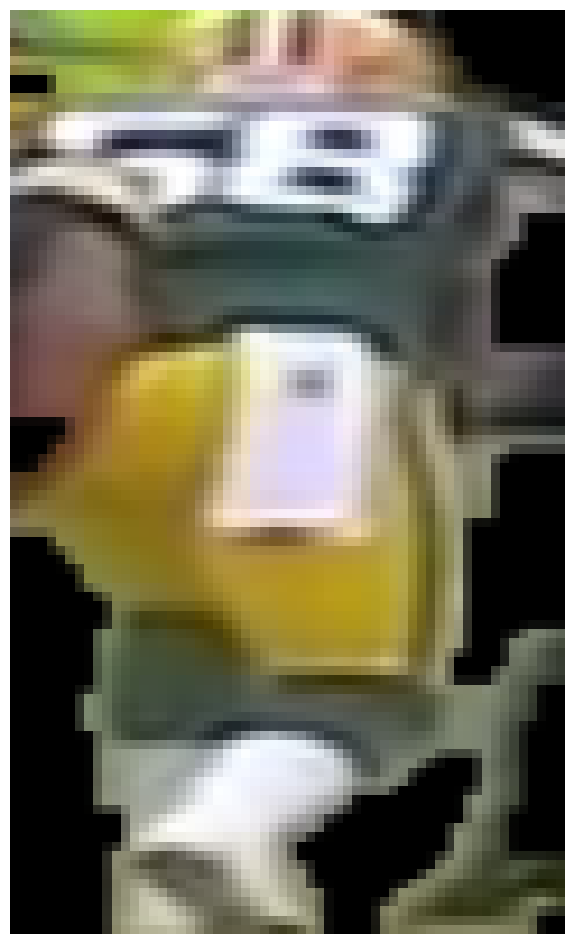

Chicago Bears 0.7434409 0.7194709
(134, 48)
(100, 60)

0: 384x640 17 Players, 3 Referees, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(135, 48)
(100, 60)
(216, 54)
(100, 60)

0: 384x640 17 Players, 2 Referees, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(135, 48)
(100, 60)

0: 384x640 18 Players, 2 Referees, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(135, 49)
(100, 60)

0: 384x640 18 Players, 2 Referees, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(136, 49)
(100, 60)

0: 384x640 19 Players, 2 Referees, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(137, 49)
(100, 60)

0: 384x640 19 Players, 4 Referees, 12.6ms
Speed: 6.5ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1,

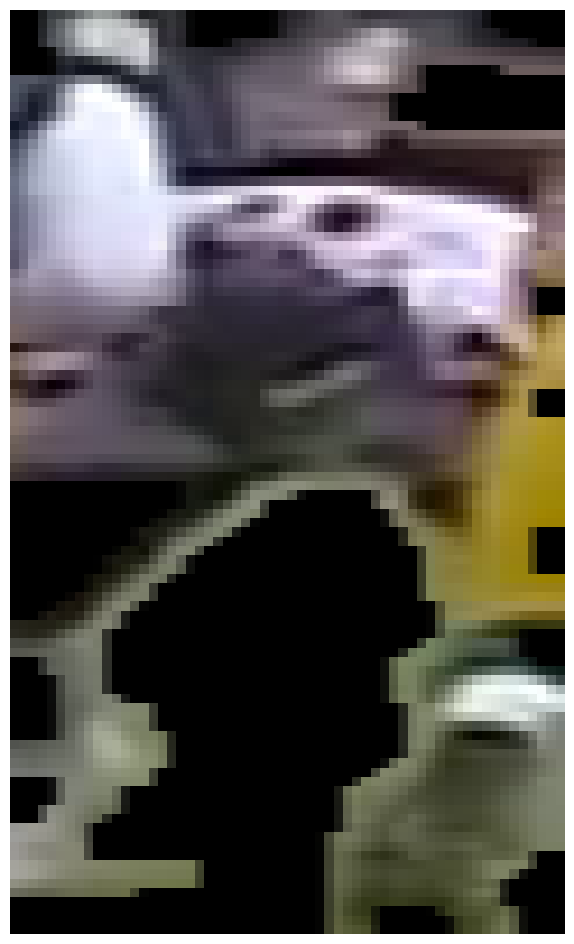

Chicago Bears 0.6830724 0.6582224
(88, 33)
(100, 60)

0: 384x640 17 Players, 3 Referees, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(137, 49)
(100, 60)

0: 384x640 16 Players, 3 Referees, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(136, 46)
(100, 60)

0: 384x640 15 Players, 3 Referees, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(136, 46)
(100, 60)


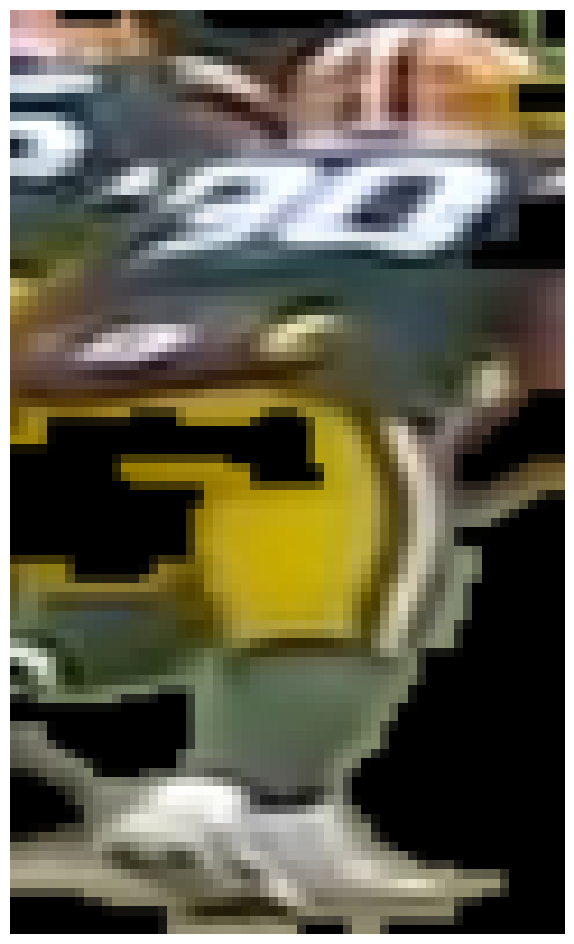

Green Bay Packers 0.68829566 0.7088907

0: 384x640 15 Players, 3 Referees, 12.4ms
Speed: 4.2ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 3 Referees, 18.7ms
Speed: 2.7ms preprocess, 18.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 3 Referees, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(127, 30)
(100, 60)


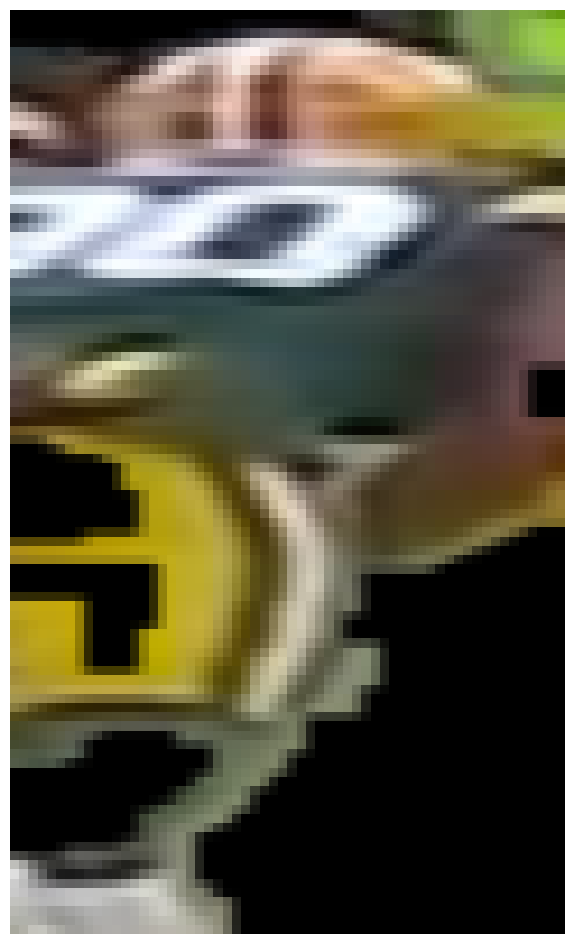

Green Bay Packers 0.7308861 0.7543576

0: 384x640 18 Players, 3 Referees, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 3 Referees, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 3 Referees, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 3 Referees, 16.5ms
Speed: 2.5ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 3 Referees, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 3 Referees, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 3 Referees, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape

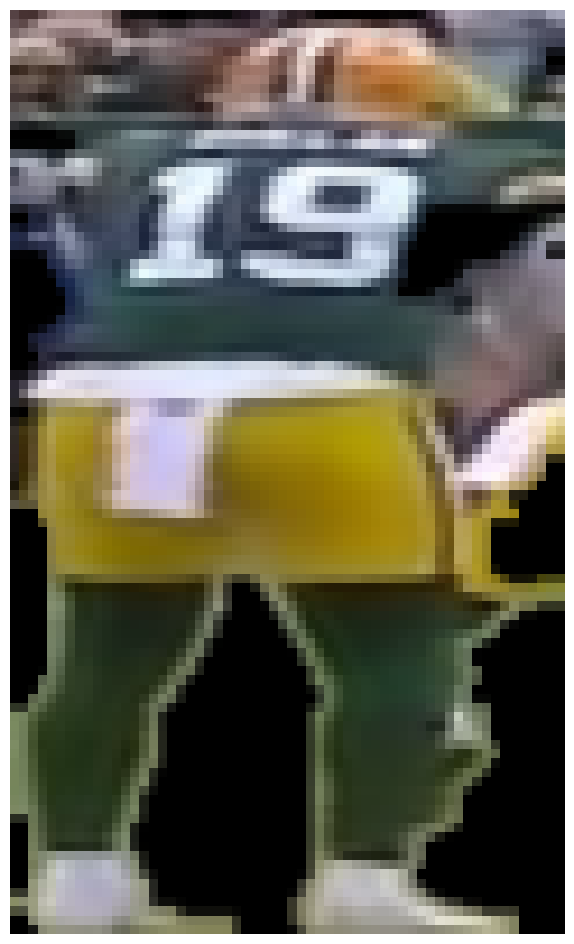

Green Bay Packers 0.7487881 0.793274

0: 384x640 14 Players, 3 Referees, 15.0ms
Speed: 2.7ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 3 Referees, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 2 Referees, 16.6ms
Speed: 2.6ms preprocess, 16.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 3 Referees, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 3 Referees, 15.7ms
Speed: 2.6ms preprocess, 15.7ms inference, 1.9ms postprocess per image at shape 

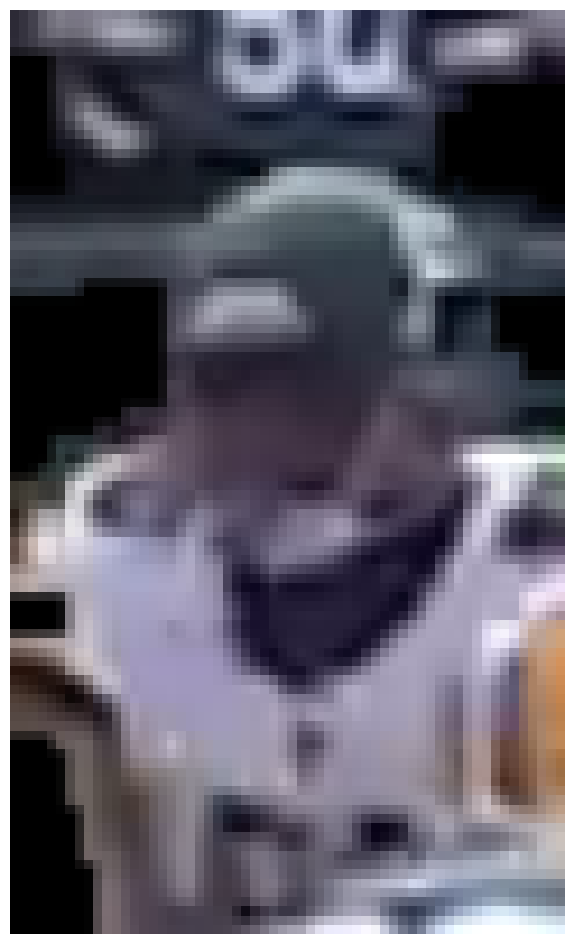

Green Bay Packers 0.631535 0.6873383
(147, 50)
(100, 60)


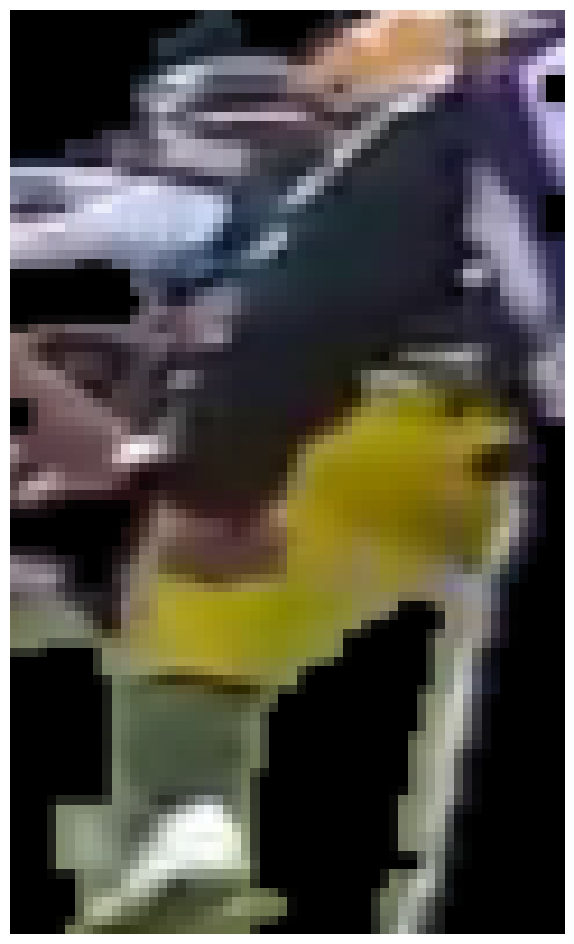

Green Bay Packers 0.7202975 0.78127784

0: 384x640 13 Players, 3 Referees, 22.1ms
Speed: 6.3ms preprocess, 22.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 3 Referees, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 3 Referees, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 3 Referees, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 2 Referees, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 25.4ms
Speed: 2.5ms preprocess, 25.4ms inference, 2.5ms postprocess per image at shap

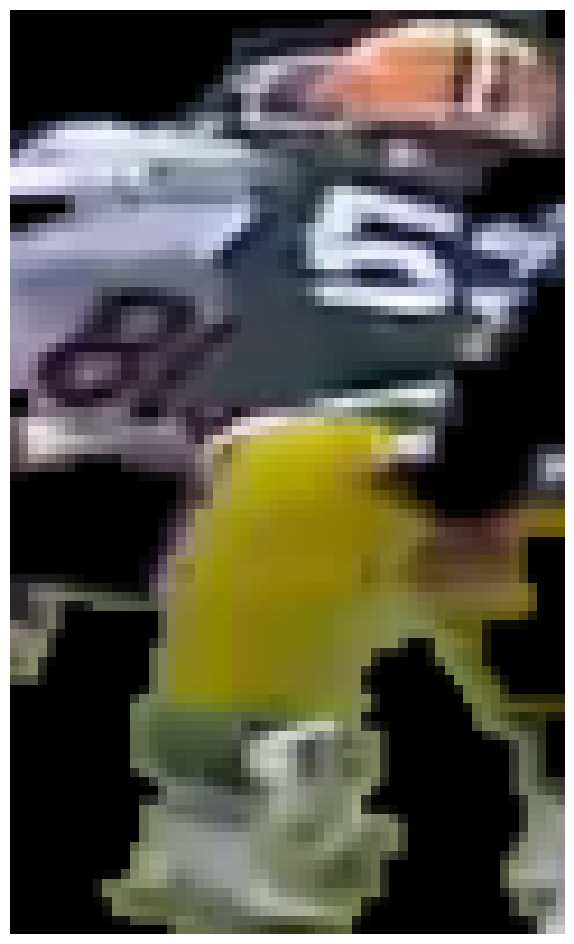

Green Bay Packers 0.70315623 0.7502872

0: 384x640 9 Players, 3 Referees, 19.8ms
Speed: 7.6ms preprocess, 19.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 3 Referees, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 3 Referees, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 2 Referees, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 2 Referees, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape 

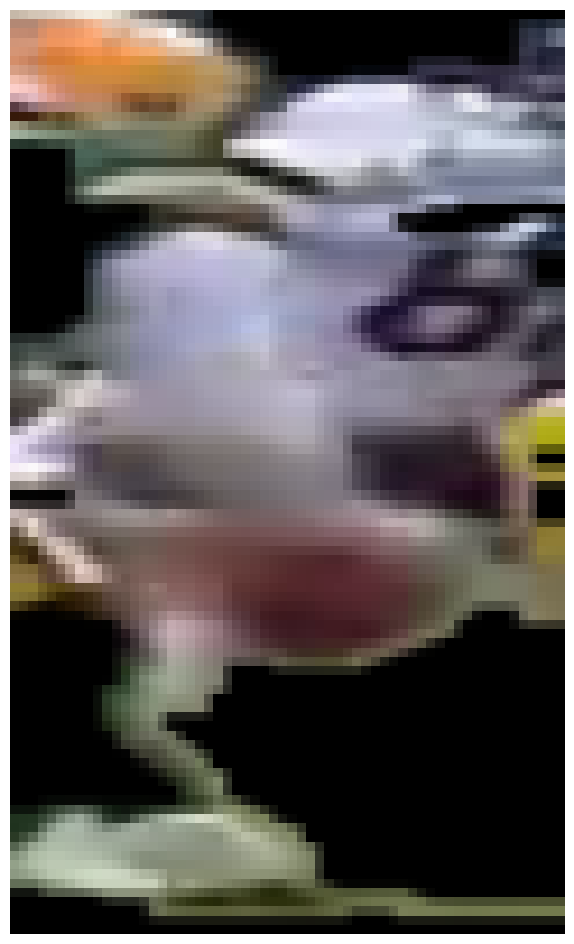

Chicago Bears 0.80570763 0.7827676

0: 384x640 10 Players, 2 Referees, 18.3ms
Speed: 3.9ms preprocess, 18.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 2 Referees, 18.2ms
Speed: 4.7ms preprocess, 18.2ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 2 Referees, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(140, 60)
(100, 60)

0: 384x640 9 Players, 2 Referees, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(145, 58)
(100, 60)


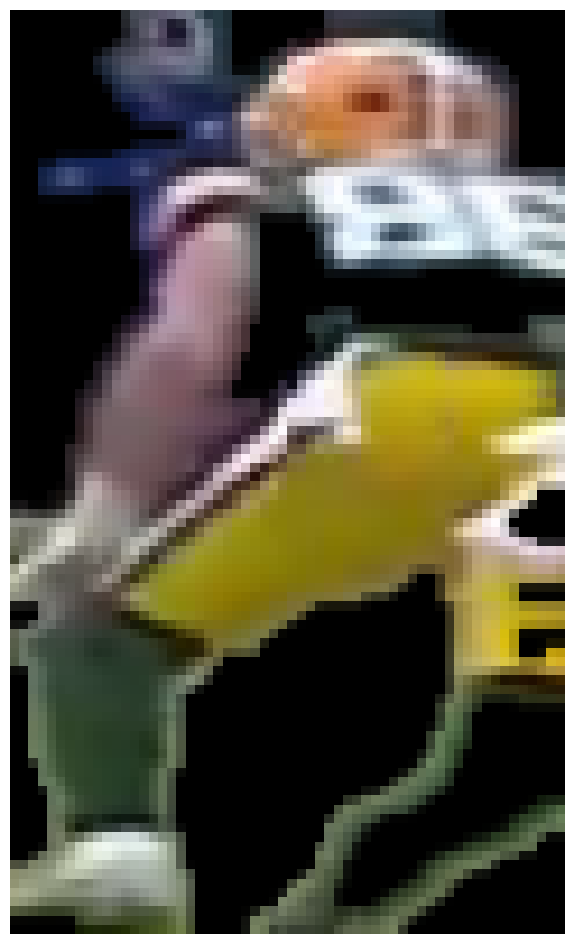

Green Bay Packers 0.72830224 0.74961334

0: 384x640 9 Players, 2 Referees, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 2 Referees, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 2 Referees, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 16.7ms
Speed: 2.5ms preprocess, 16.7ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 14.7ms
Speed: 2.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 3

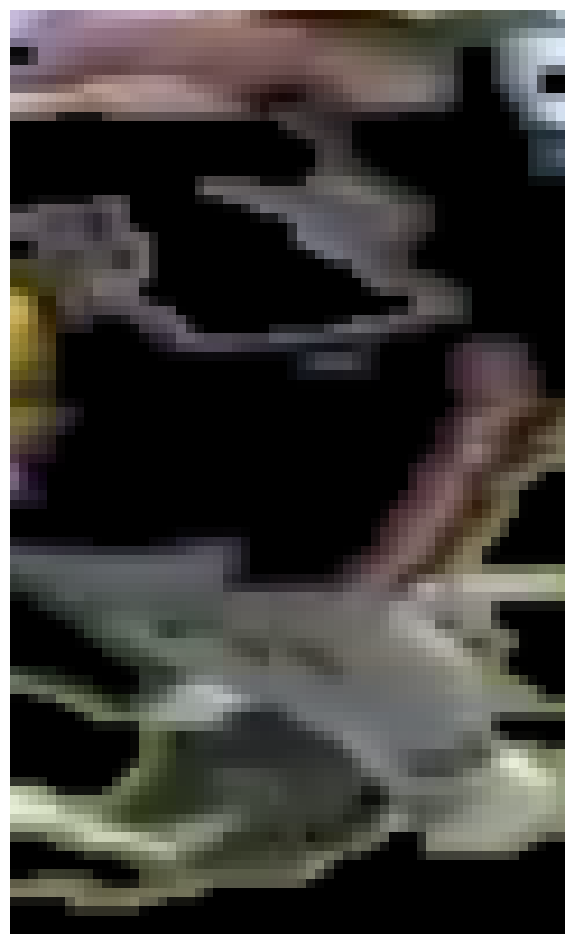

Chicago Bears 0.8084401 0.7687325

0: 384x640 8 Players, 2 Referees, 16.1ms
Speed: 2.6ms preprocess, 16.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 3 Referees, 12.8ms
Speed: 3.1ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 2 Referees, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 2 Referees, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384

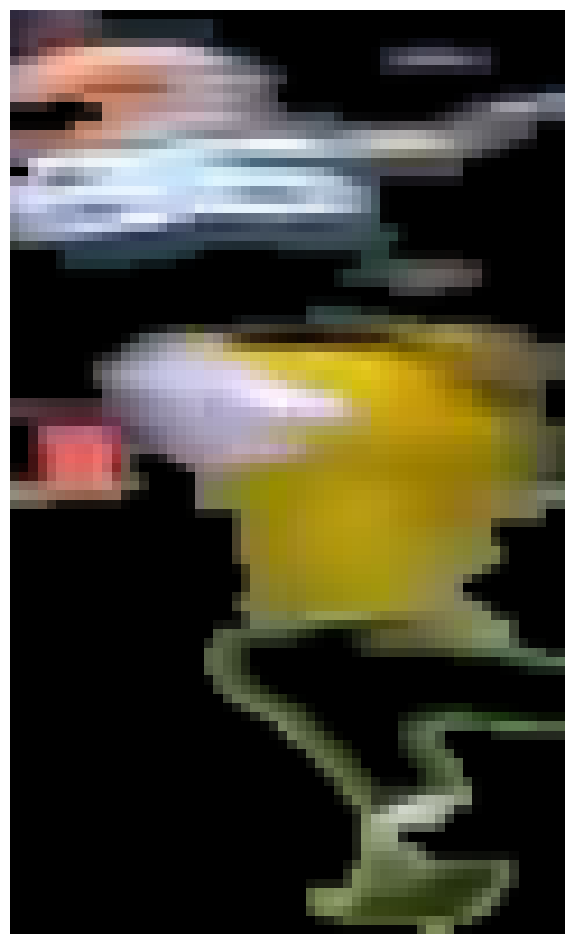

Green Bay Packers 0.6714955 0.69405735

0: 384x640 7 Players, 3 Referees, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 18.4ms
Speed: 2.4ms preprocess, 18.4ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 3 Referees, 19.2ms
Speed: 2.6ms preprocess, 19.2ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 2 Referees, 14.5ms
Speed: 2.3ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 2 Referees, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3

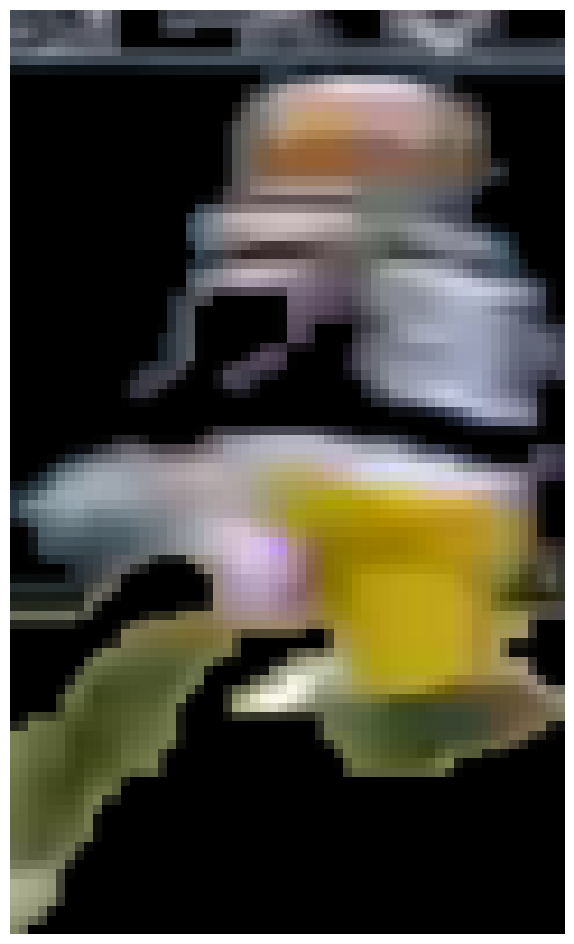

Green Bay Packers 0.71746 0.7468674

0: 384x640 7 Players, 2 Referees, 19.9ms
Speed: 2.5ms preprocess, 19.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 2 Referees, 17.5ms
Speed: 2.4ms preprocess, 17.5ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)
(288, 109)
(100, 60)


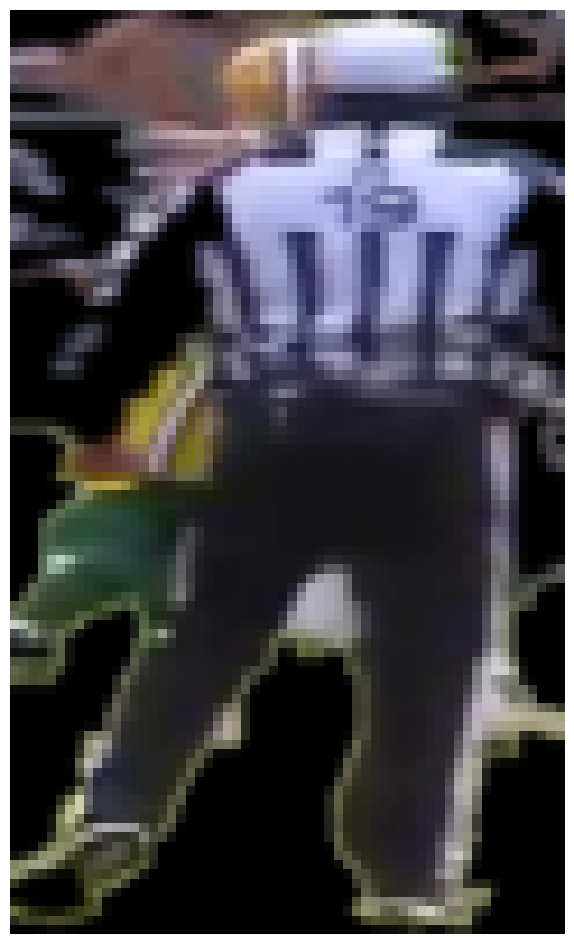

Green Bay Packers 0.6623577 0.7291716

0: 384x640 7 Players, 2 Referees, 27.0ms
Speed: 2.7ms preprocess, 27.0ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)
(178, 75)
(100, 60)


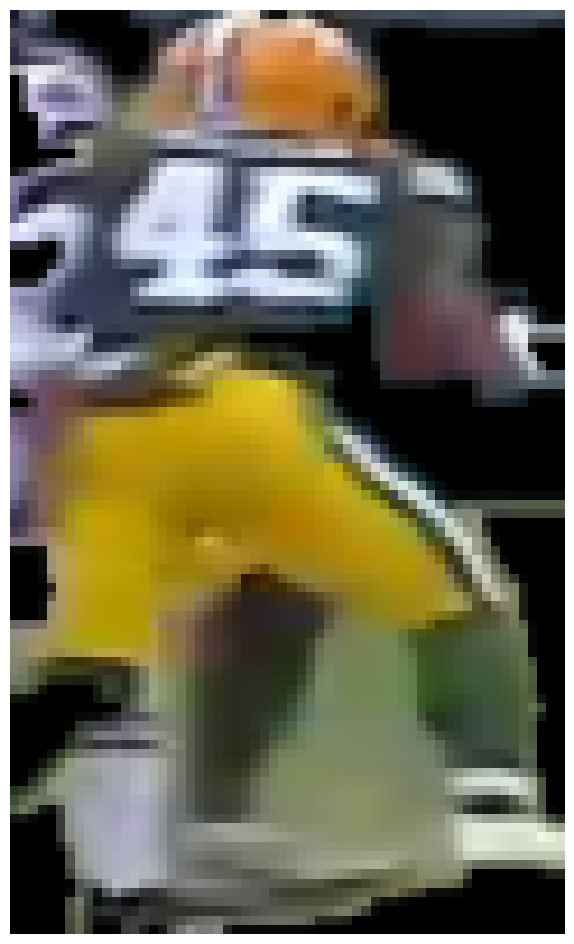

Green Bay Packers 0.7087842 0.74139833

0: 384x640 7 Players, 2 Referees, 12.0ms
Speed: 5.6ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 2 Referees, 20.6ms
Speed: 2.5ms preprocess, 20.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(164, 37)
(100, 60)

0: 384x640 9 Players, 1 Referee, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(165, 46)
(100, 60)

0: 384x640 10 Players, 1 Referee, 13.3ms
Speed: 4.0ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(204, 70)
(100, 60)

0: 384x640 8 Players, 1 Referee, 17.5ms
Speed: 2.5ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(171, 61)
(100, 60)


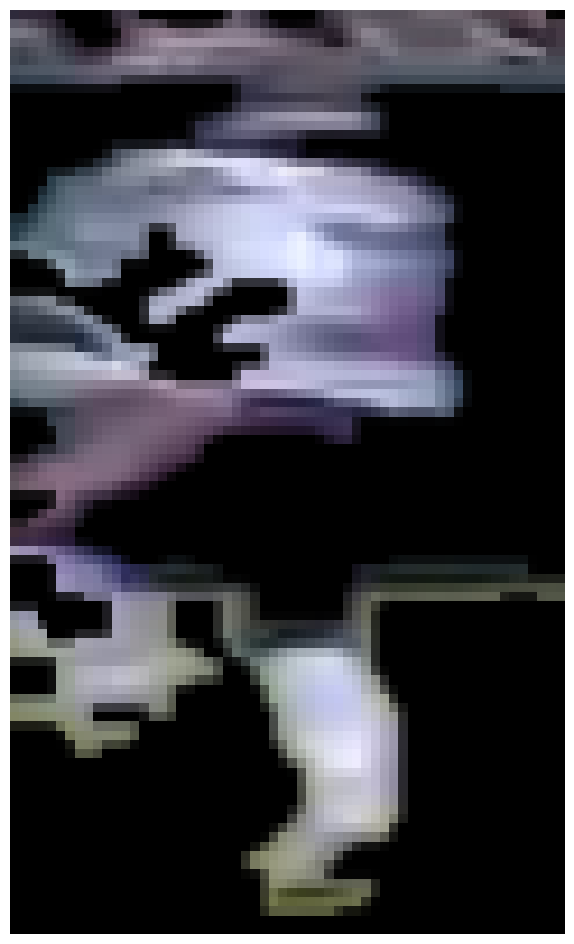

Green Bay Packers 0.6417725 0.67356324
(206, 72)
(100, 60)

0: 384x640 17 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
0.0
(79, 48)
(100, 60)


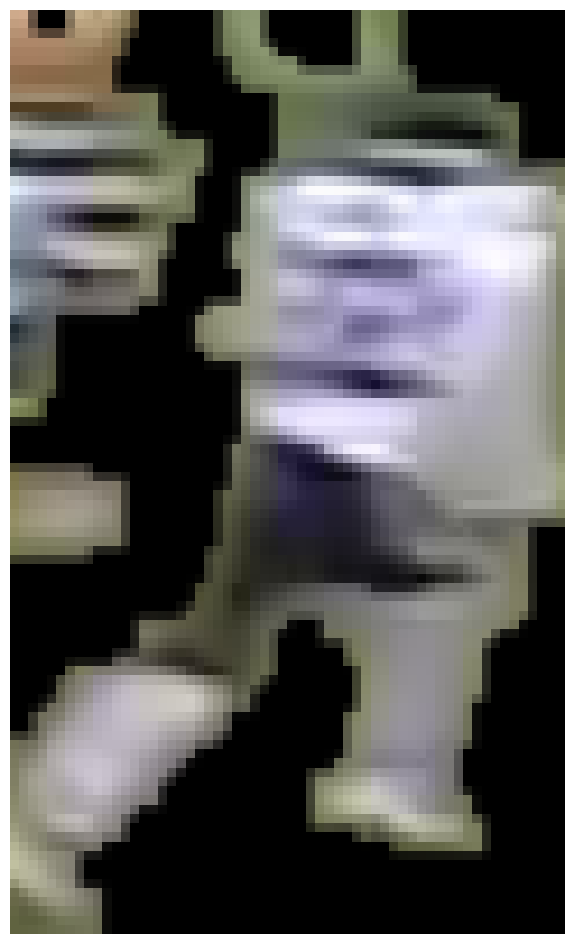

Chicago Bears 0.6904752 0.64088875
0.0
(69, 56)
(100, 60)
0.0
(79, 48)
(100, 60)


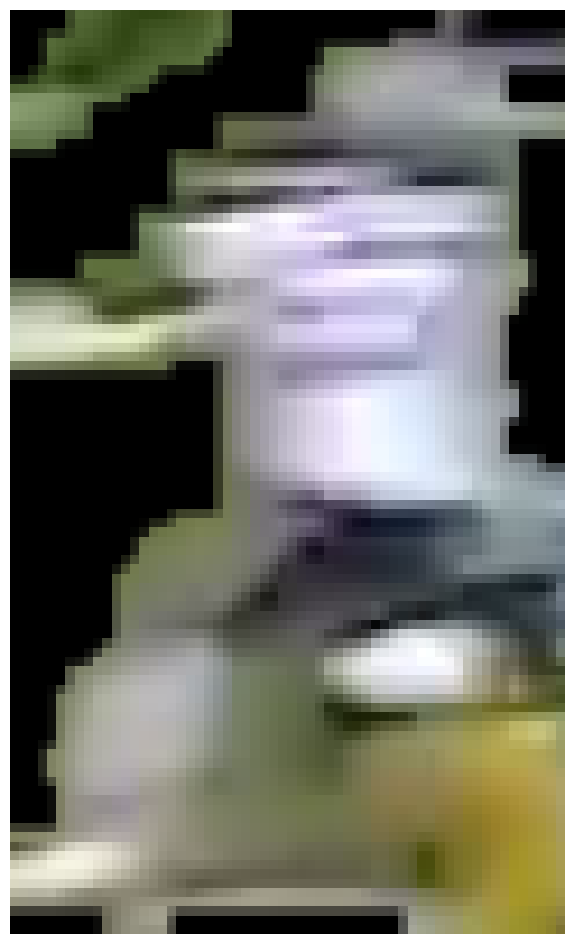

Chicago Bears 0.6837213 0.63264465
0.0
(75, 44)
(100, 60)
0.0
(81, 55)
(100, 60)


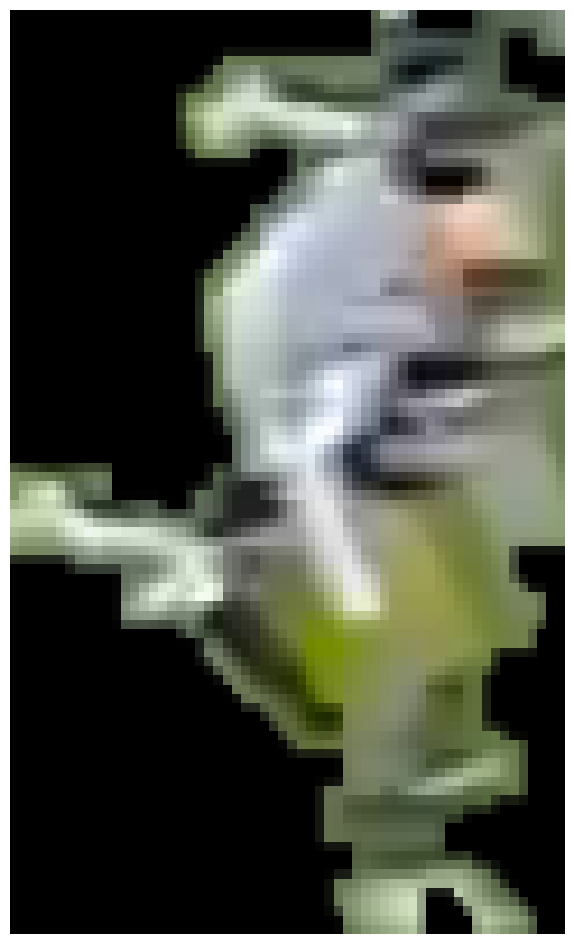

Chicago Bears 0.6641722 0.6315181
0.0
(75, 67)
(100, 60)


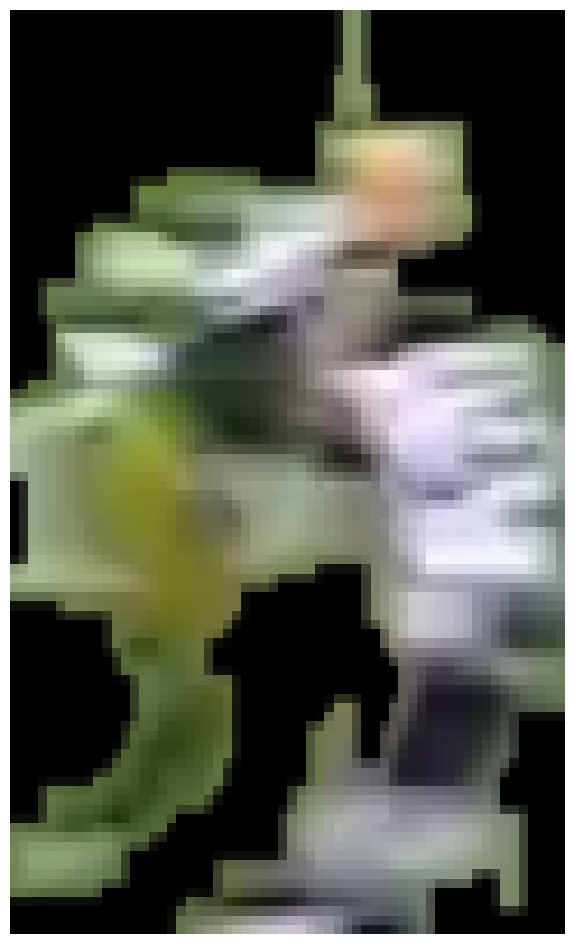

Chicago Bears 0.6785452 0.6470917
0.0
(98, 41)
(100, 60)
0.0
(97, 40)
(100, 60)
0.0
(61, 68)
(100, 60)
0.0
(45, 47)
(100, 60)


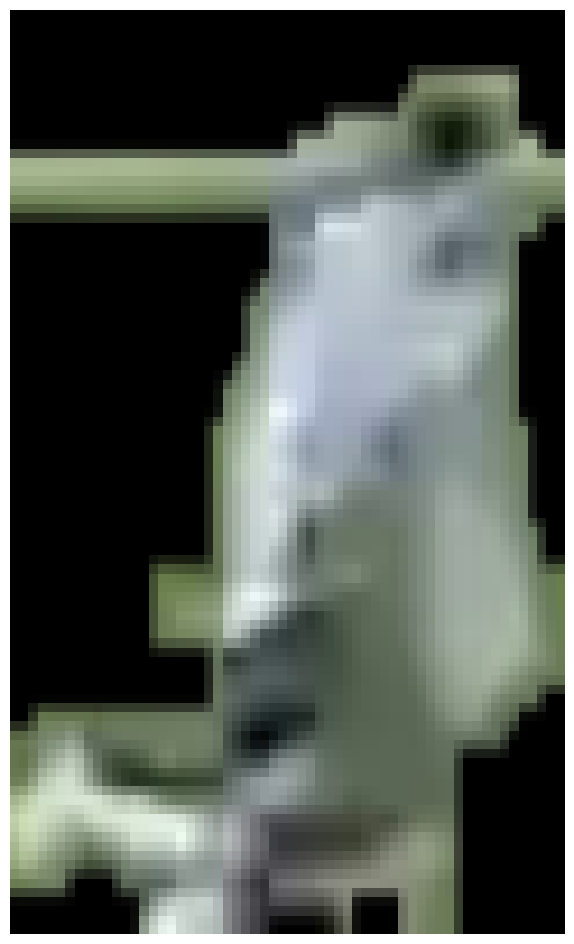

Chicago Bears 0.64448565 0.6222142
0.0
(83, 72)
(100, 60)
0.0
(64, 38)
(100, 60)


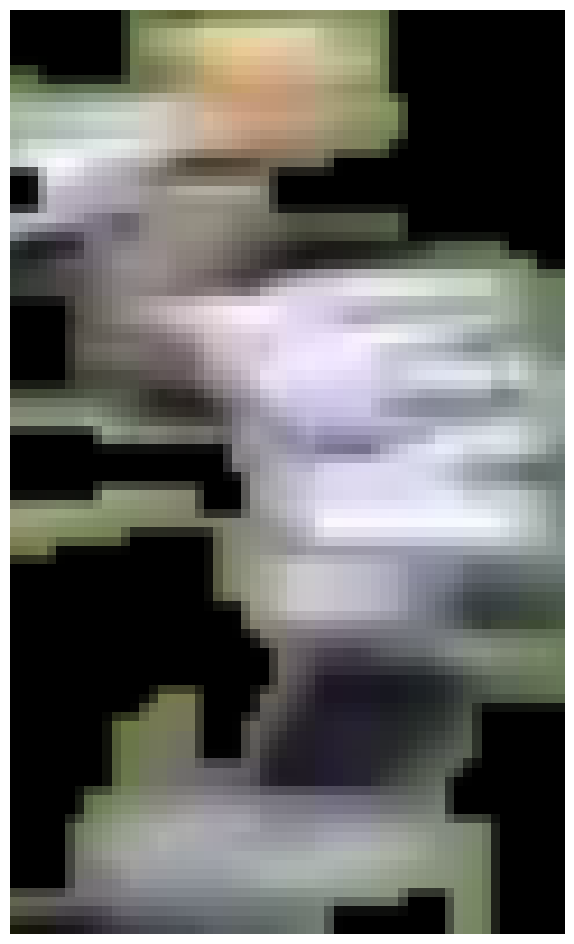

Chicago Bears 0.78993696 0.68899405
0.0
(66, 56)
(100, 60)
0.0
(65, 43)
(100, 60)
0.0
0.0
0.0

0: 384x640 11 Players, 20.4ms
Speed: 4.8ms preprocess, 20.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(75, 42)
(100, 60)


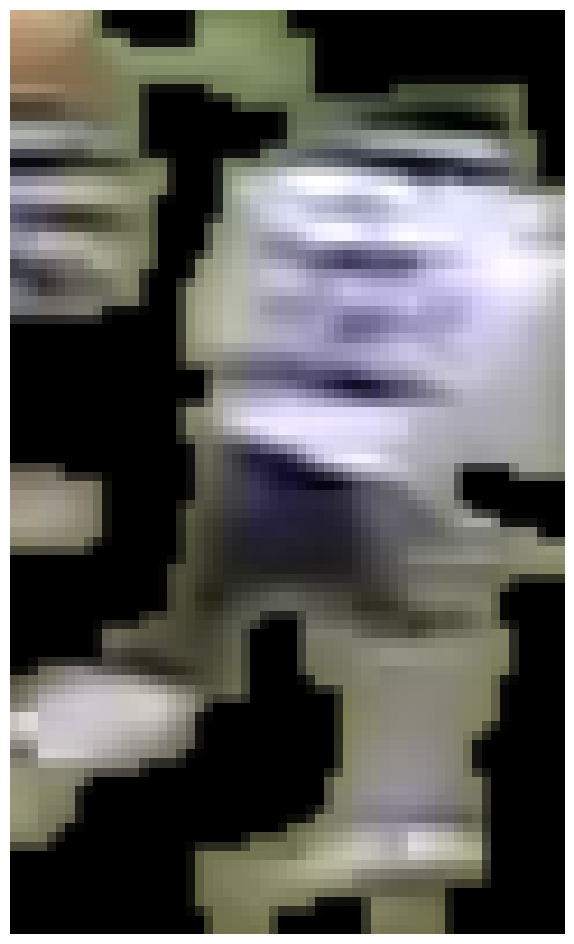

Chicago Bears 0.6515104 0.6209528
(75, 56)
(100, 60)
(76, 45)
(100, 60)


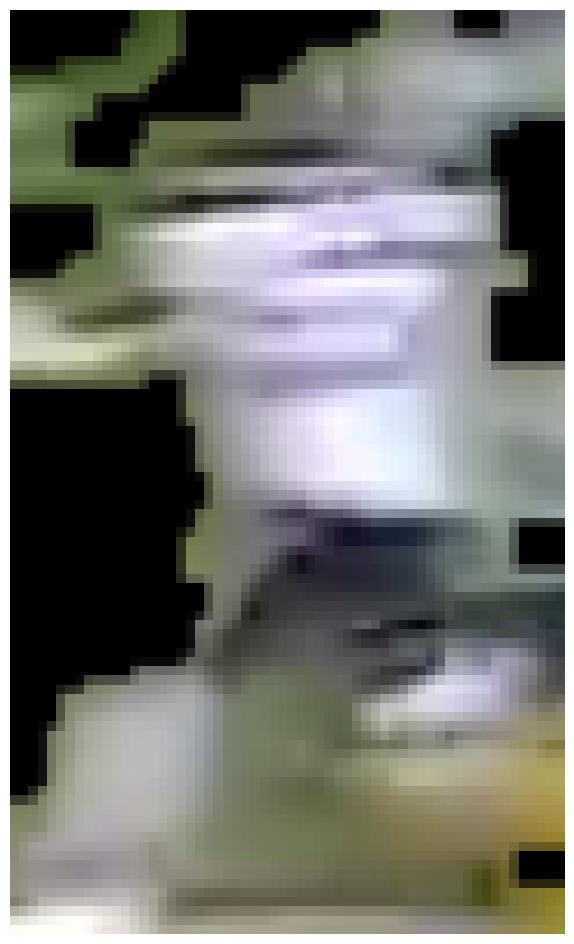

Chicago Bears 0.7287544 0.6530251
(74, 42)
(100, 60)
(103, 52)
(100, 60)


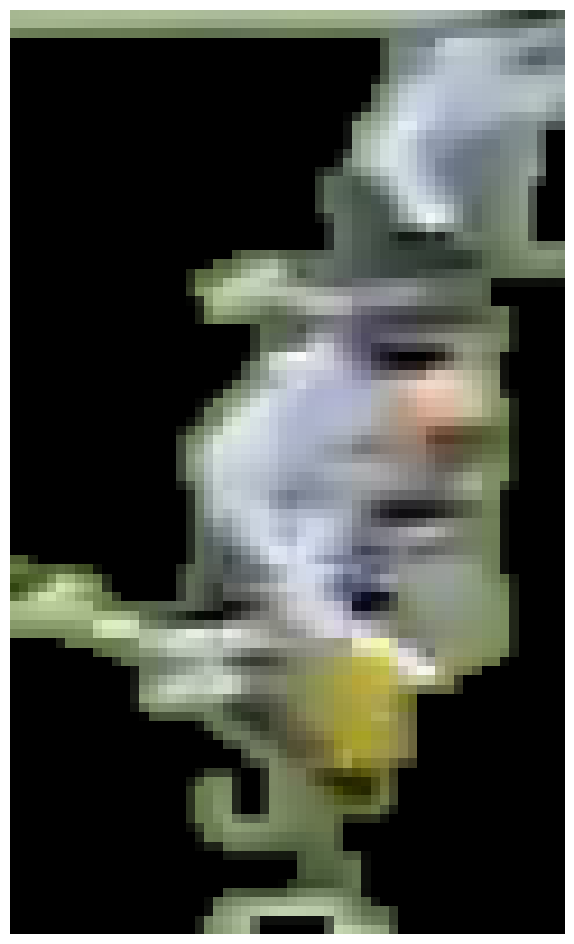

Chicago Bears 0.6829458 0.6565842
(79, 63)
(100, 60)


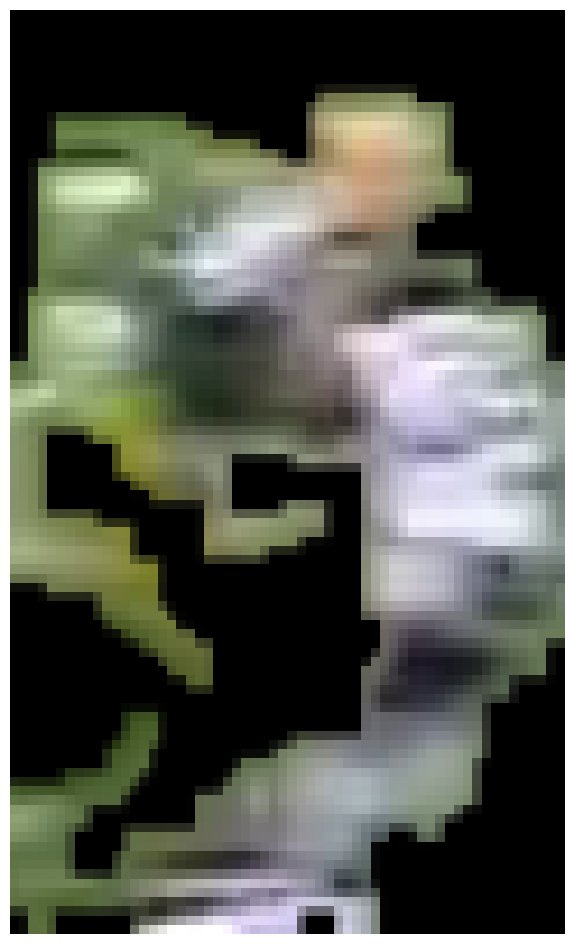

Chicago Bears 0.70171636 0.66153526
(97, 52)
(100, 60)
(82, 71)
(100, 60)
(60, 58)
(100, 60)
(66, 34)
(100, 60)

0: 384x640 12 Players, 22.1ms
Speed: 2.7ms preprocess, 22.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(76, 61)
(100, 60)
(79, 49)
(100, 60)
(89, 51)
(100, 60)
(77, 67)
(100, 60)
(60, 53)
(100, 60)
(76, 40)
(100, 60)


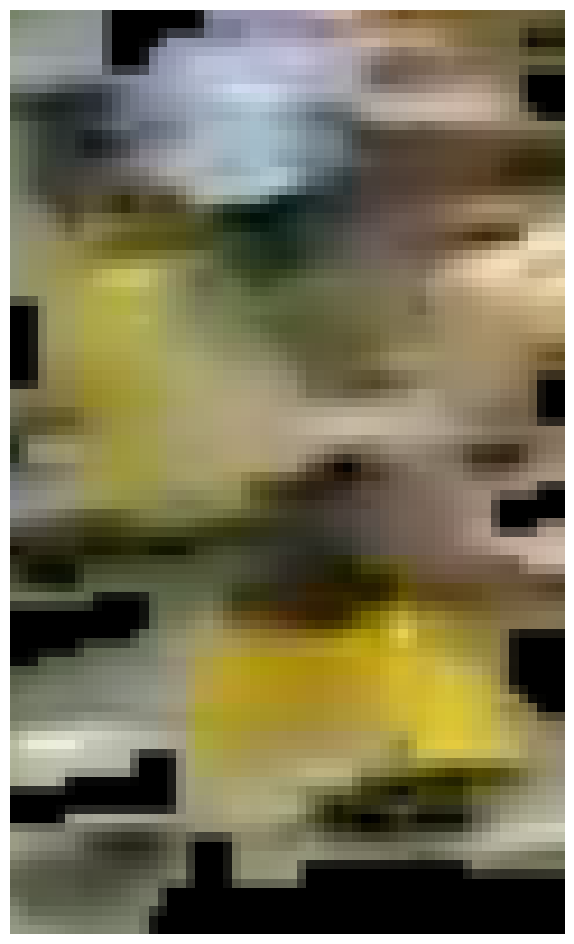

Green Bay Packers 0.5061195 0.5467434

0: 384x640 12 Players, 20.9ms
Speed: 2.7ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(77, 62)
(100, 60)
(70, 47)
(100, 60)
(83, 52)
(100, 60)
(65, 62)
(100, 60)
(68, 54)
(100, 60)


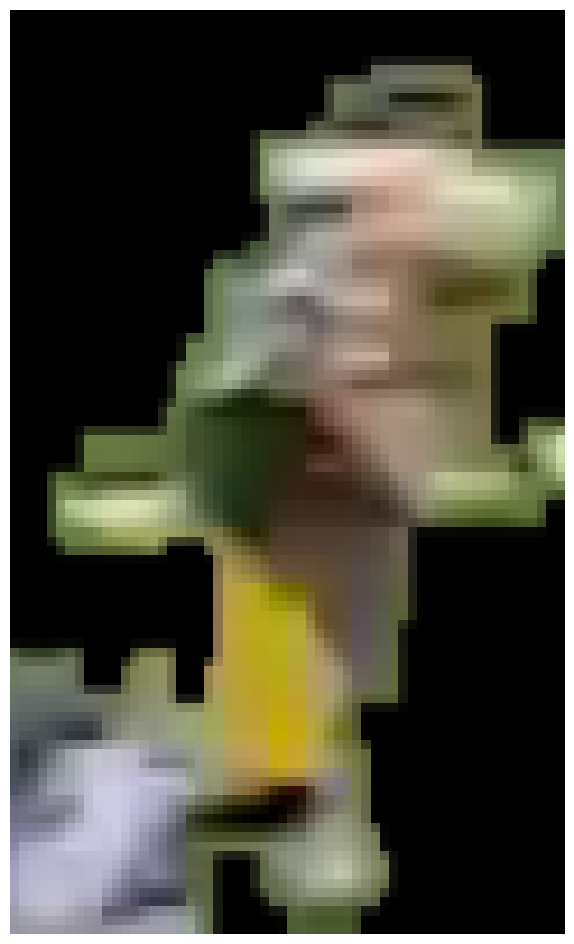

Green Bay Packers 0.6141283 0.6398578

0: 384x640 12 Players, 15.1ms
Speed: 2.6ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(74, 63)
(100, 60)
(73, 53)
(100, 60)
(66, 54)
(100, 60)

0: 384x640 10 Players, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(72, 60)
(100, 60)
(65, 51)
(100, 60)

0: 384x640 10 Players, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(73, 57)
(100, 60)

0: 384x640 9 Players, 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(71, 57)
(100, 60)

0: 384x640 10 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(72, 57)
(100, 60)
(60, 67)
(100, 60)
(74, 45)
(100, 60)


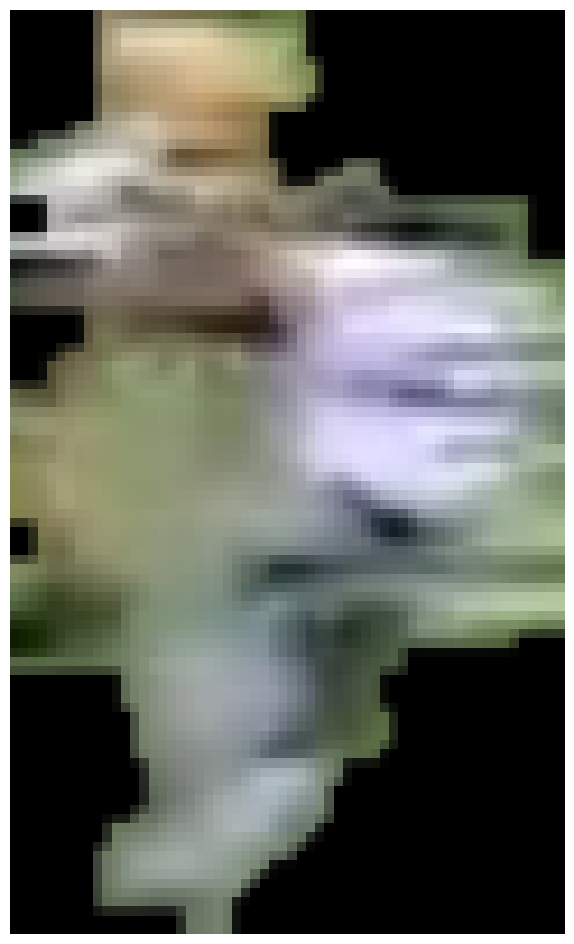

Chicago Bears 0.74459034 0.71792513
(102, 95)
(100, 60)

0: 384x640 8 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(72, 57)
(100, 60)

0: 384x640 7 Players, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(70, 55)
(100, 60)
(47, 55)
(100, 60)

0: 384x640 9 Players, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(69, 55)
(100, 60)
(60, 48)
(100, 60)
(56, 83)
(100, 60)

0: 384x640 5 Players, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(68, 54)
(100, 60)
(62, 49)
(100, 60)

0: 384x640 7 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(71, 53)
(100, 60)
(62, 44)
(100, 60)
(55, 43)
(100, 60)


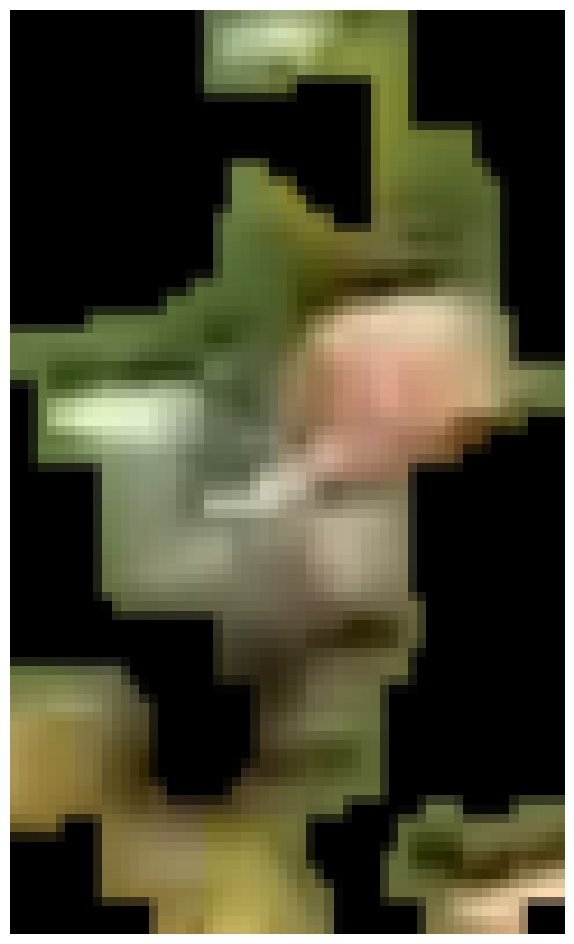

Green Bay Packers 0.42490757 0.49468574

0: 384x640 7 Players, 23.5ms
Speed: 2.4ms preprocess, 23.5ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)
(70, 61)
(100, 60)
(58, 41)
(100, 60)

0: 384x640 7 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(67, 59)
(100, 60)
(54, 36)
(100, 60)

0: 384x640 6 Players, 19.0ms
Speed: 6.7ms preprocess, 19.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(67, 62)
(100, 60)
(96, 37)
(100, 60)

0: 384x640 5 Players, 12.3ms
Speed: 4.1ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(75, 49)
(100, 60)
(85, 40)
(100, 60)

0: 384x640 5 Players, 13.8ms
Speed: 4.4ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(81, 33)
(100, 60)
(75, 45)
(100, 60)

0: 384x640 5 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(72, 47)

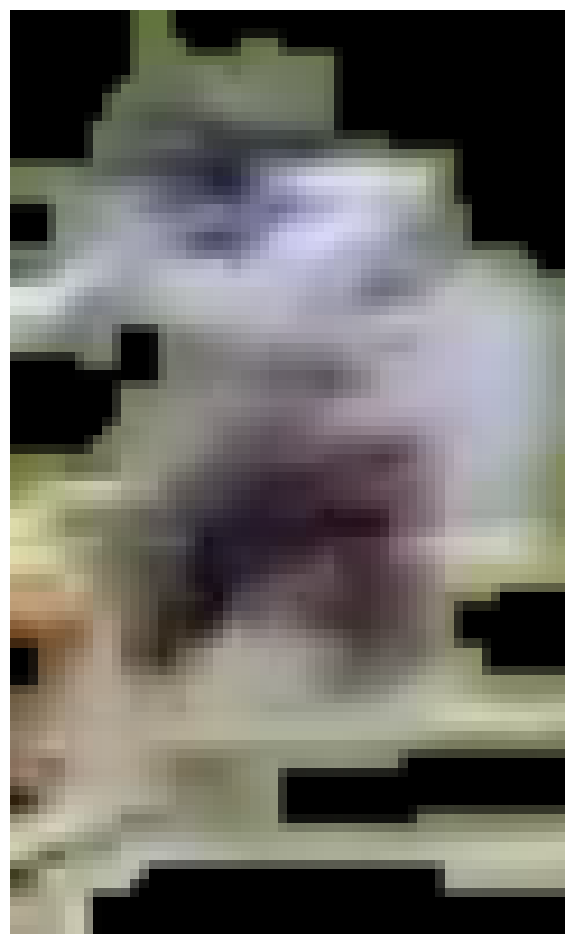

Chicago Bears 0.70872873 0.6495588

0: 384x640 5 Players, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(66, 50)
(100, 60)

0: 384x640 4 Players, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(62, 49)
(100, 60)


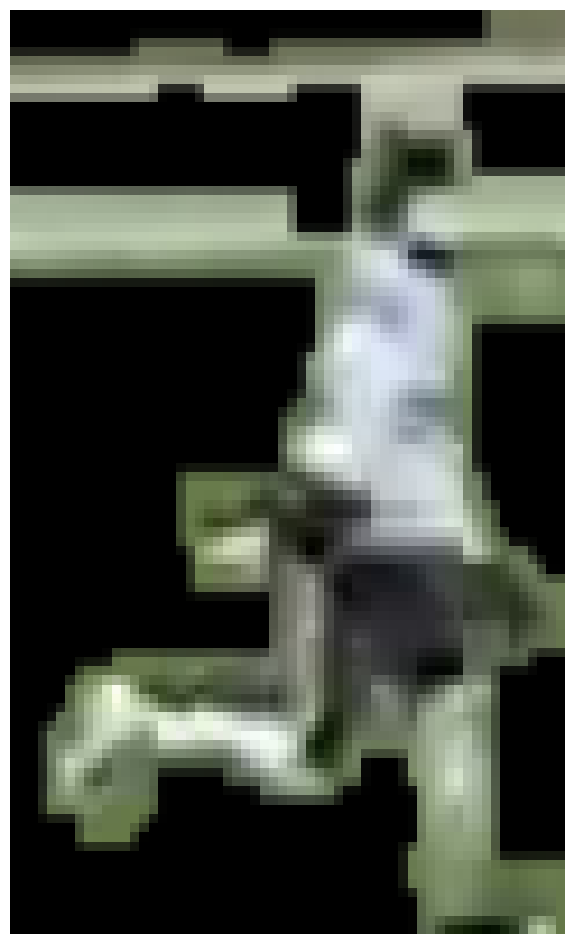

Chicago Bears 0.49492607 0.47398213

0: 384x640 4 Players, 22.6ms
Speed: 2.6ms preprocess, 22.6ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.

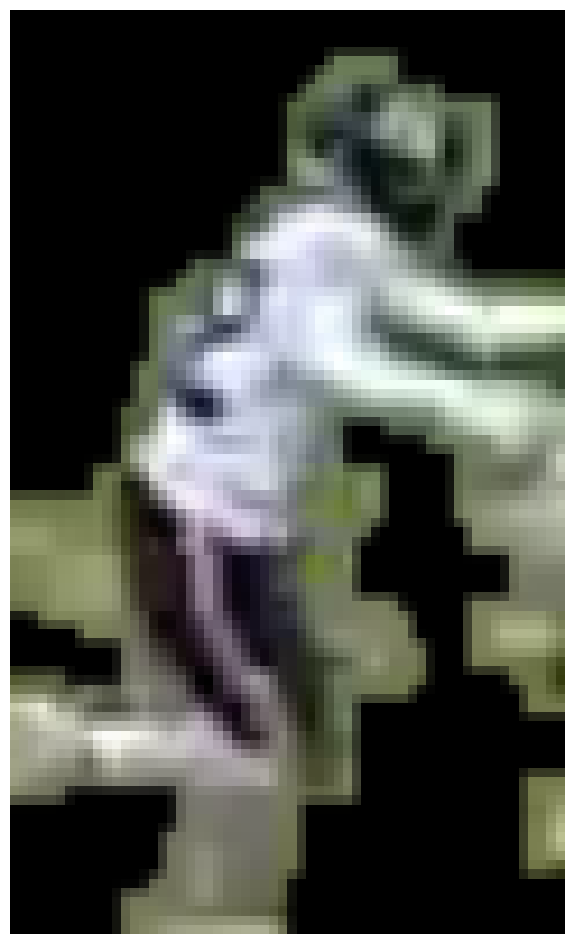

Chicago Bears 0.6767199 0.6521851

0: 384x640 5 Players, 34.3ms
Speed: 6.2ms preprocess, 34.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(82, 25)
(100, 60)


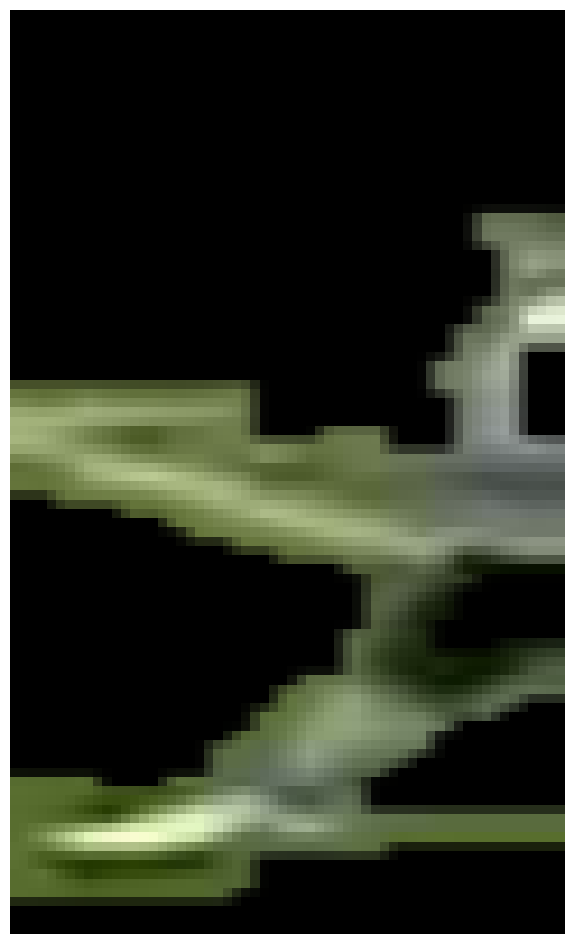

Green Bay Packers 0.34507903 0.38005444

0: 384x640 7 Players, 16.7ms
Speed: 2.7ms preprocess, 16.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(66, 64)
(100, 60)

0: 384x640 6 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(77, 20)
(100, 60)

0: 384x640 6 Players,

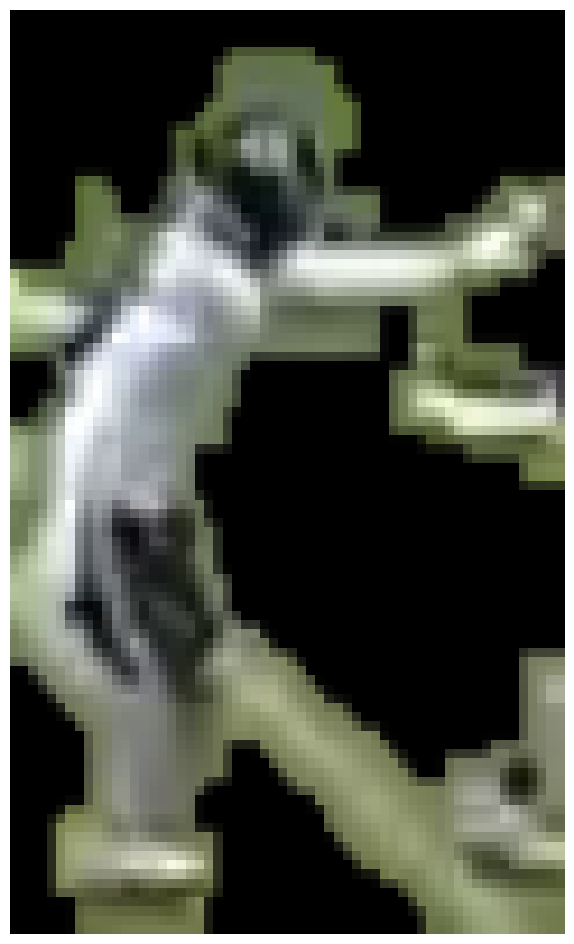

Chicago Bears 0.52438647 0.50429845

0: 384x640 7 Players, 1 Referee, 23.2ms
Speed: 7.3ms preprocess, 23.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 22.0ms
Speed: 2.4ms preprocess, 22.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 12.3ms
Speed: 3.3ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 17.0ms
Speed: 3.4ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640

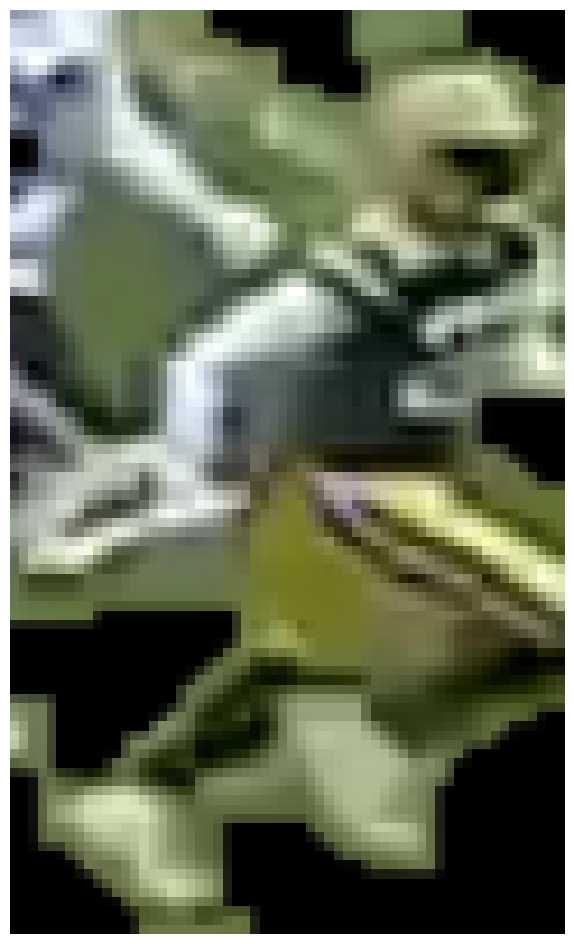

Green Bay Packers 0.5545995 0.5815196

0: 384x640 7 Players, 1 Referee, 21.5ms
Speed: 4.2ms preprocess, 21.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 13.9ms
Speed: 3.2ms preprocess, 13.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.0ms
Speed: 3.2ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 6

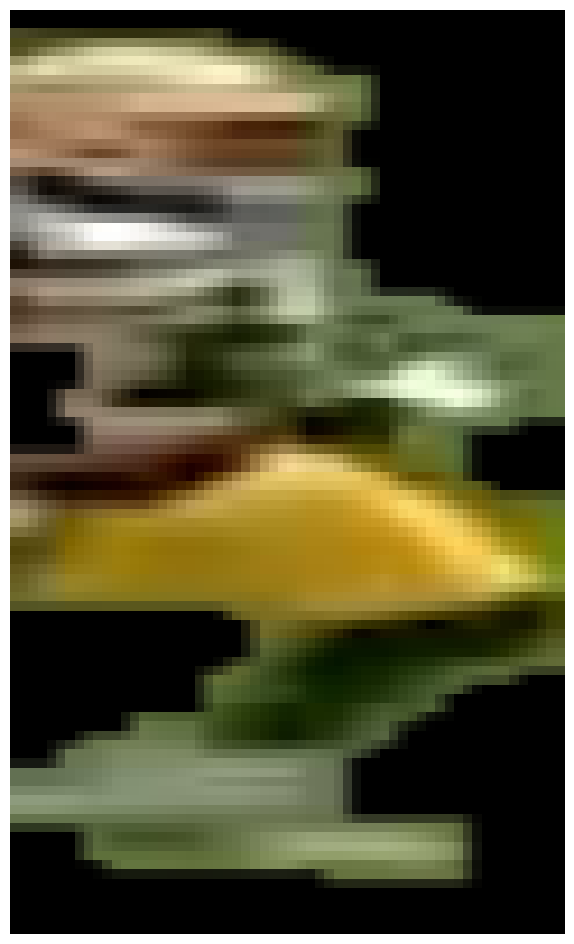

Green Bay Packers 0.47132832 0.5216798

0: 384x640 7 Players, 1 Referee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 12.7ms
Speed: 3.1ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 

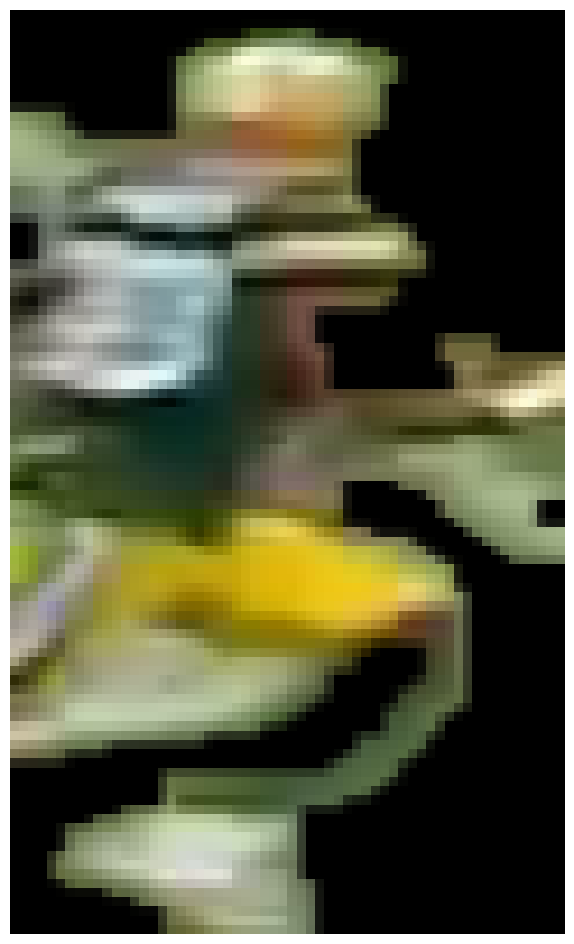

Green Bay Packers 0.5303619 0.56795764
(76, 21)
(100, 60)

0: 384x640 9 Players, 1 Referee, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(73, 26)
(100, 60)

0: 384x640 9 Players, 1 Referee, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)
(70, 29)
(100, 60)

0: 384x640 9 Players, 1 Referee, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(74, 33)
(100, 60)

0: 384x640 9 Players, 1 Referee, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(76, 36)
(100, 60)

0: 384x640 9 Players, 1 Referee, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(77, 39)
(100, 60)

0: 384x640 9 Players, 1 Referee, 15.3ms
Speed: 5.5ms preprocess, 15.3ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)
(76, 44)
(100, 60)


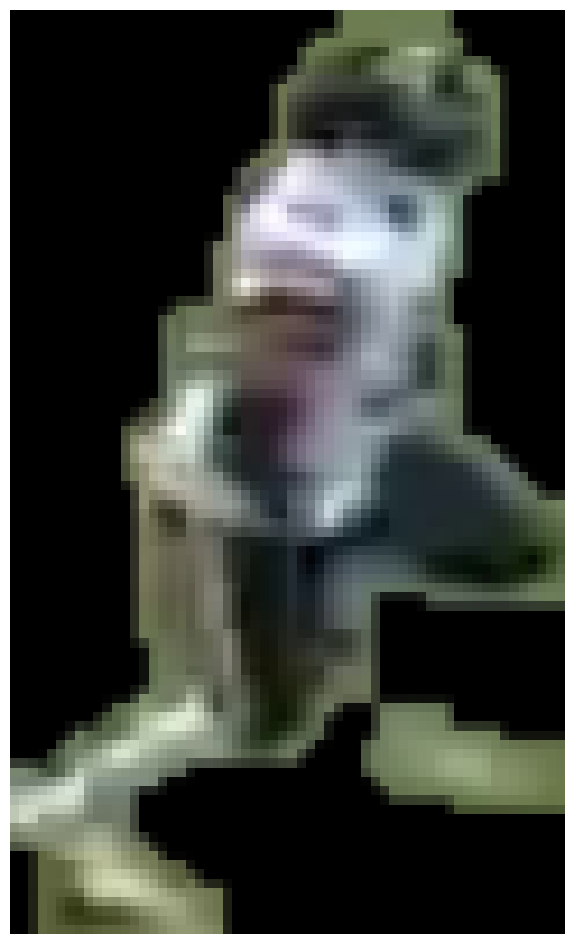

Green Bay Packers 0.6736307 0.7039925

0: 384x640 9 Players, 1 Referee, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 14.7ms
Speed: 3.8ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 16.6ms
Speed: 2.5ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 12.1ms
Speed: 3.2ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 6

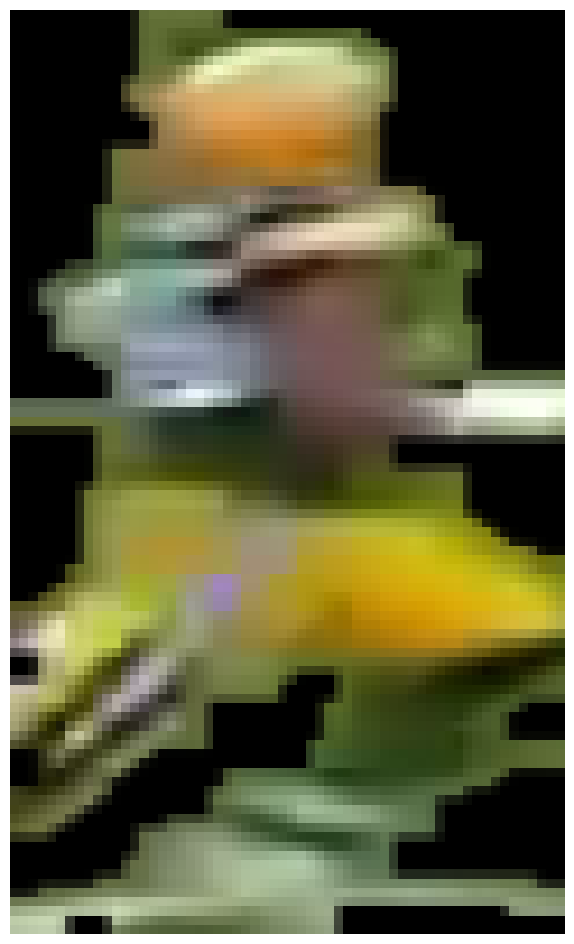

Green Bay Packers 0.5148901 0.57103616

0: 384x640 10 Players, 1 Referee, 22.5ms
Speed: 2.6ms preprocess, 22.5ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 15.2ms
Speed: 5.6ms preprocess, 15.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 16.8ms
Speed: 2.5ms preprocess, 16.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 1 Referee, 19.1ms
Speed: 3.2ms preprocess, 19.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(95, 35)
(100, 60)

0: 384x640 11 Players, 1 Referee, 17.9ms
Speed: 2.5ms preprocess, 17.9ms inference, 6.7ms postprocess per image at shape (1, 3, 384, 640)
(92, 43)
(100, 60)

0: 384x640 11 Players, 1 Referee, 20.0ms
Speed: 2.6ms preprocess, 20.0ms inference, 1.5m

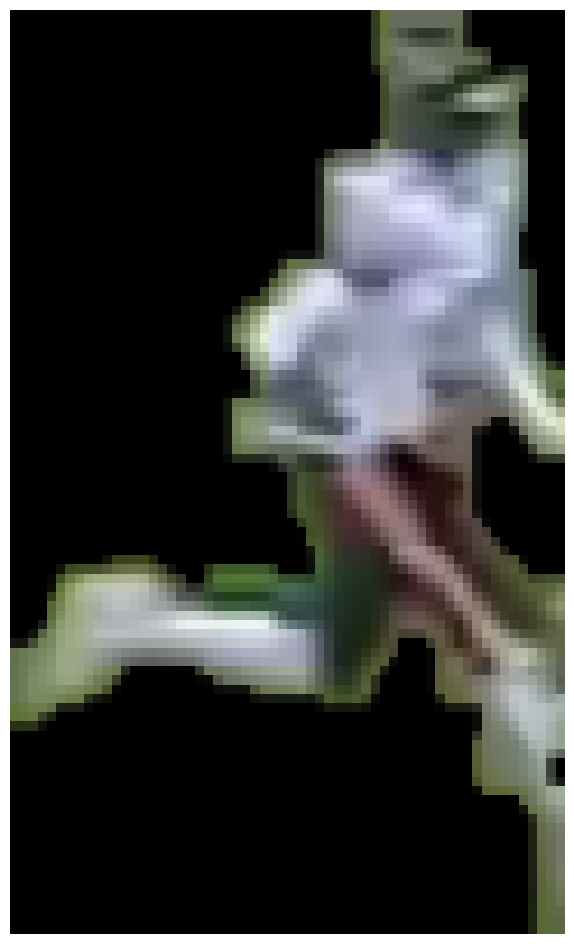

Green Bay Packers 0.720884 0.74089533

0: 384x640 11 Players, 1 Referee, 30.0ms
Speed: 4.2ms preprocess, 30.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 1 Referee, 17.2ms
Speed: 2.5ms preprocess, 17.2ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 1 Referee, 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 1 Referee, 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 1 Referee, 12.5ms
Speed: 3.1ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(108, 34)
(100, 60)

0: 384x640 12 Players, 1 Referee, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(104, 45)
(100, 60)

0: 384x640 13 Players, 1 Referee, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.6

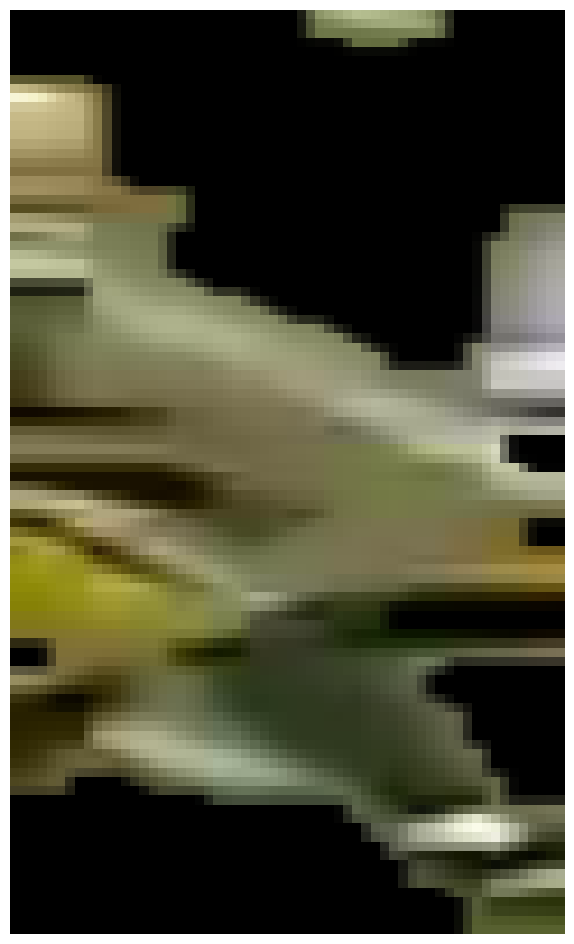

Green Bay Packers 0.37537125 0.4226692

0: 384x640 13 Players, 1 Referee, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(99, 46)
(100, 60)

0: 384x640 13 Players, 1 Referee, 16.1ms
Speed: 3.8ms preprocess, 16.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(100, 47)
(100, 60)

0: 384x640 13 Players, 1 Referee, 17.7ms
Speed: 2.6ms preprocess, 17.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(103, 43)
(100, 60)

0: 384x640 13 Players, 1 Referee, 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(103, 45)
(100, 60)

0: 384x640 14 Players, 1 Referee, 18.0ms
Speed: 4.4ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(108, 48)
(100, 60)
(104, 33)
(100, 60)


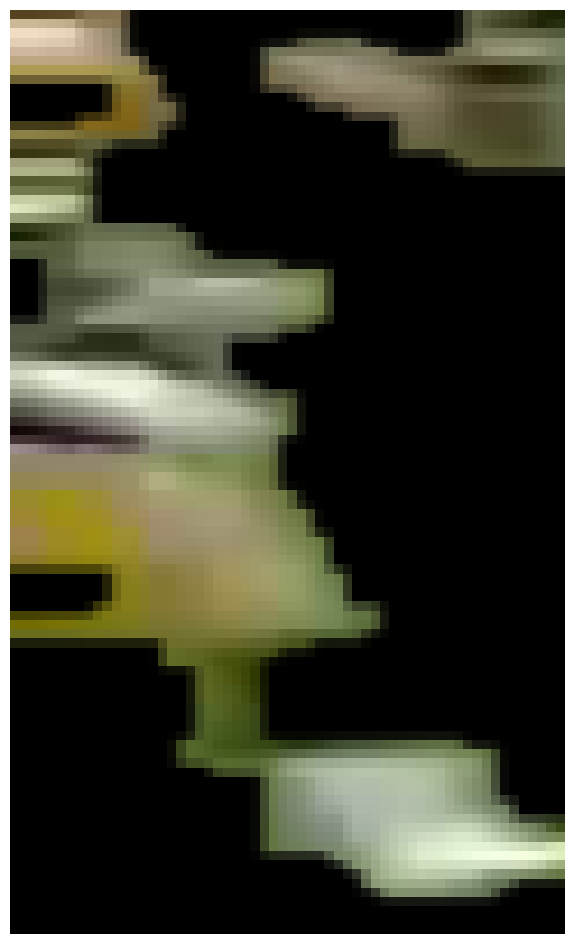

Green Bay Packers 0.44847098 0.4799329

0: 384x640 14 Players, 1 Referee, 25.2ms
Speed: 3.0ms preprocess, 25.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(106, 50)
(100, 60)

0: 384x640 14 Players, 1 Referee, 17.2ms
Speed: 3.2ms preprocess, 17.2ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)
(105, 57)
(100, 60)

0: 384x640 13 Players, 1 Referee, 16.9ms
Speed: 2.6ms preprocess, 16.9ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)
(101, 64)
(100, 60)

0: 384x640 13 Players, 1 Referee, 17.6ms
Speed: 2.6ms preprocess, 17.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 63)
(100, 60)

0: 384x640 13 Players, 1 Referee, 17.4ms
Speed: 2.4ms preprocess, 17.4ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)
(110, 69)
(100, 60)

0: 384x640 14 Players, 1 Referee, 17.4ms
Speed: 2.6ms preprocess, 17.4ms inference, 6.7ms postprocess per image at shape (1, 3, 384, 640)
(111, 65)
(100, 60)

0: 384

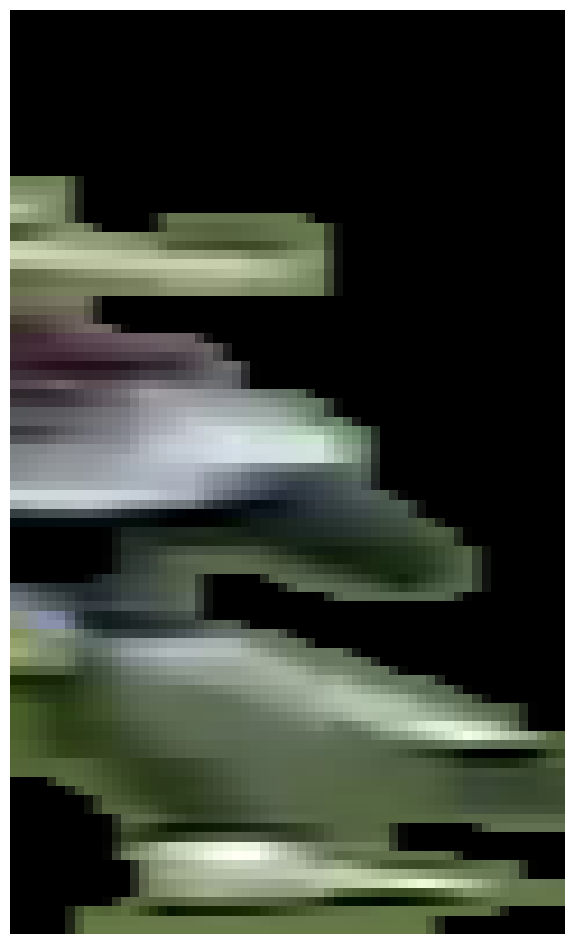

Green Bay Packers 0.5495151 0.5818395

0: 384x640 12 Players, 1 Referee, 20.3ms
Speed: 2.6ms preprocess, 20.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
(103, 44)
(100, 60)

0: 384x640 11 Players, 1 Referee, 30.9ms
Speed: 4.3ms preprocess, 30.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(105, 42)
(100, 60)

0: 384x640 11 Players, 1 Referee, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 6.7ms postprocess per image at shape (1, 3, 384, 640)
(103, 47)
(100, 60)

0: 384x640 12 Players, 1 Referee, 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(100, 59)
(100, 60)
(92, 46)
(100, 60)


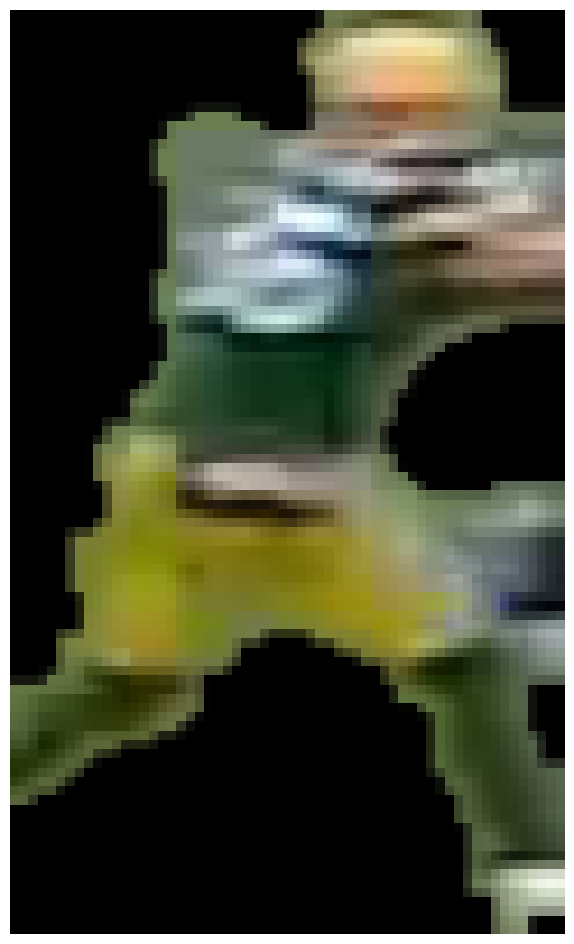

Green Bay Packers 0.6052941 0.66837597

0: 384x640 12 Players, 1 Referee, 26.0ms
Speed: 2.6ms preprocess, 26.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(101, 61)
(100, 60)

0: 384x640 12 Players, 1 Referee, 21.1ms
Speed: 3.6ms preprocess, 21.1ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)
(104, 63)
(100, 60)
(47, 36)
(100, 60)


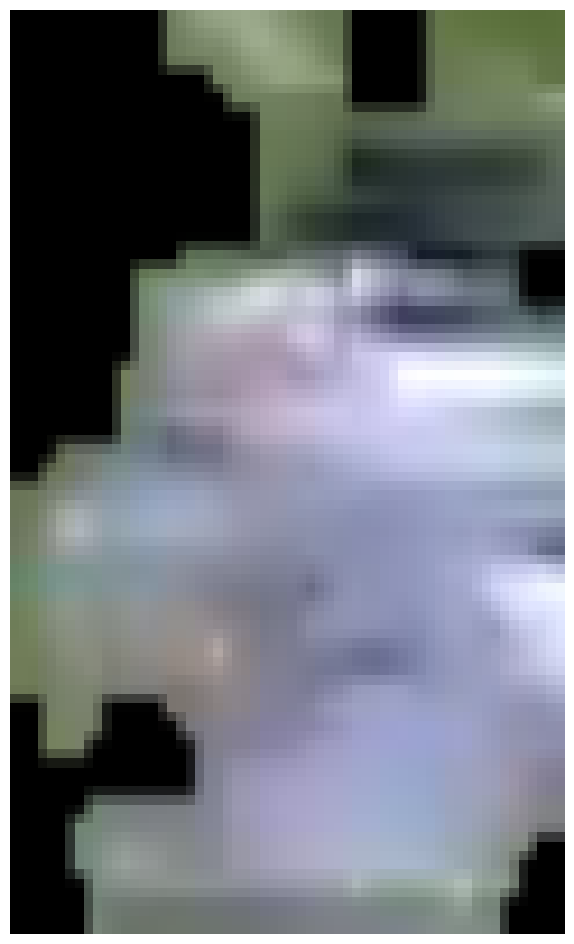

Green Bay Packers 0.6247627 0.6469802

0: 384x640 12 Players, 1 Referee, 12.4ms
Speed: 3.3ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 58)
(100, 60)

0: 384x640 13 Players, 1 Referee, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(102, 50)
(100, 60)
(26, 22)
(100, 60)


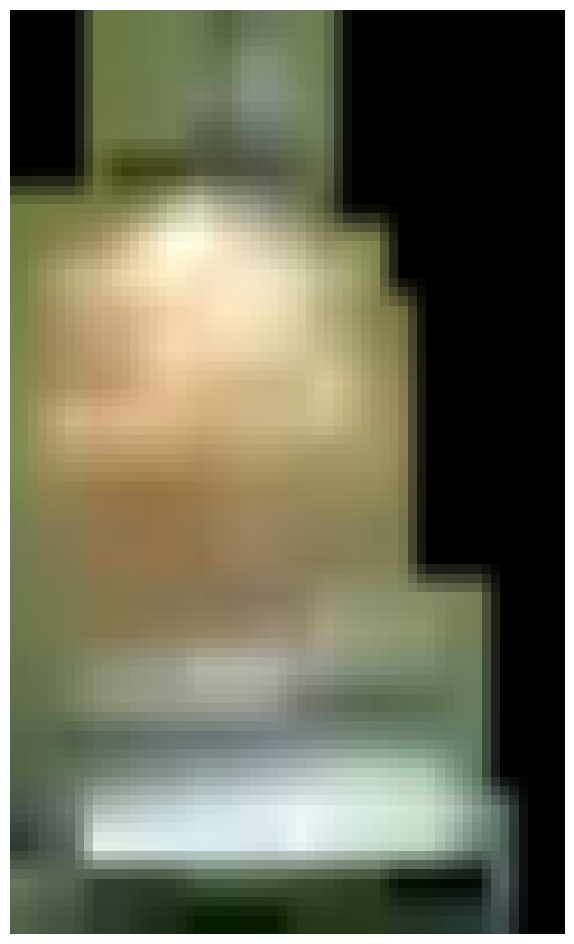

Green Bay Packers 0.5718355 0.5931439

0: 384x640 13 Players, 1 Referee, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(101, 48)
(100, 60)

0: 384x640 14 Players, 1 Referee, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 46)
(100, 60)
(95, 40)
(100, 60)

0: 384x640 13 Players, 1 Referee, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 50)
(100, 60)
(95, 49)
(100, 60)


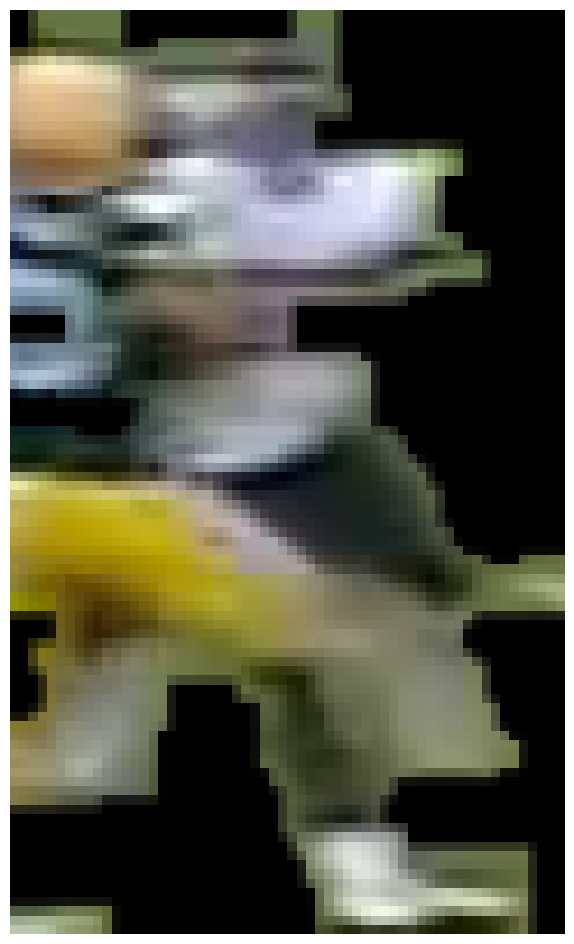

Green Bay Packers 0.67974323 0.699833

0: 384x640 13 Players, 1 Referee, 12.4ms
Speed: 3.3ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(101, 47)
(100, 60)

0: 384x640 13 Players, 1 Referee, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(96, 52)
(100, 60)

0: 384x640 14 Players, 12.8ms
Speed: 3.3ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 56)
(100, 60)


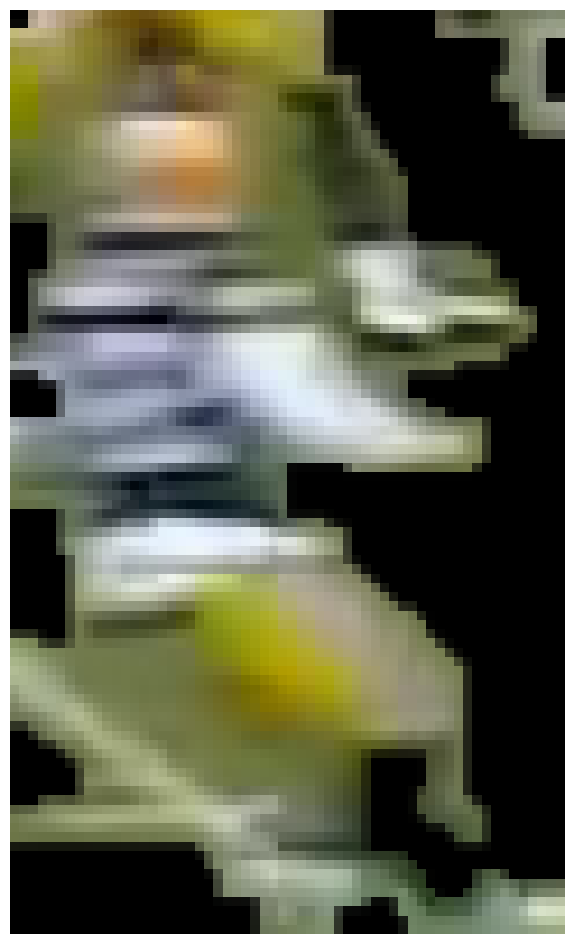

Green Bay Packers 0.5366003 0.55963725
(91, 49)
(100, 60)

0: 384x640 13 Players, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(92, 62)
(100, 60)

0: 384x640 13 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(96, 59)
(100, 60)

0: 384x640 13 Players, 23.4ms
Speed: 3.2ms preprocess, 23.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(101, 59)
(100, 60)

0: 384x640 12 Players, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(95, 79)
(100, 60)

0: 384x640 13 Players, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(99, 72)
(100, 60)


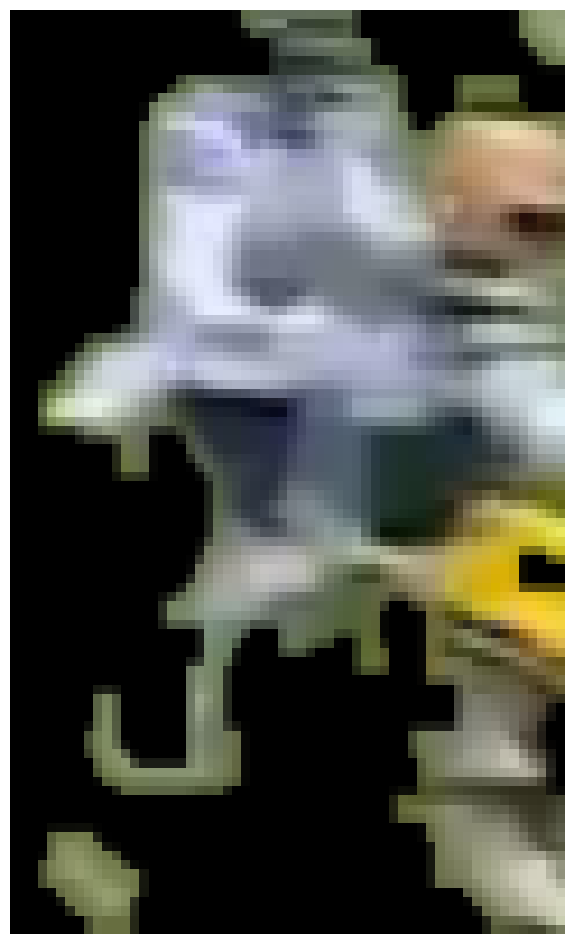

Green Bay Packers 0.69117975 0.72128326
(94, 42)
(100, 60)


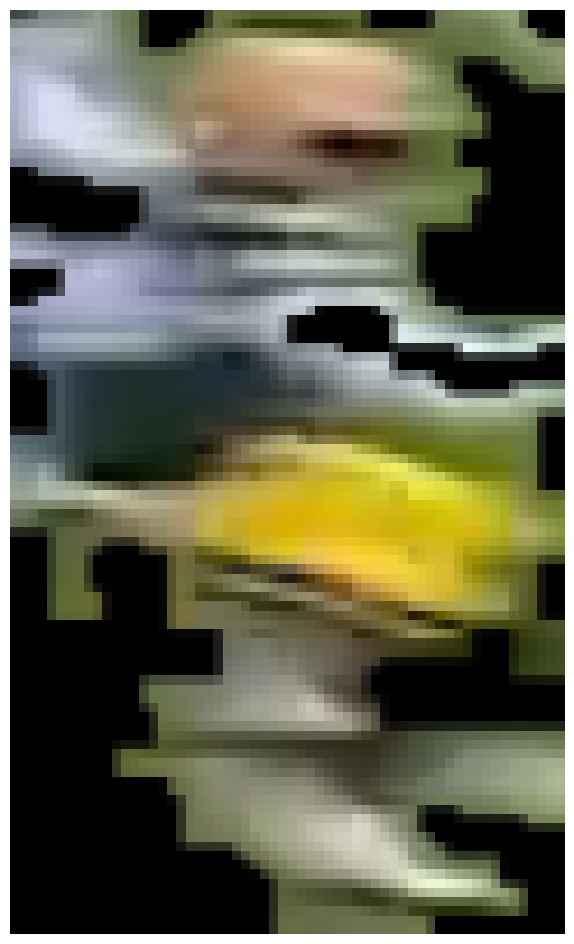

Green Bay Packers 0.61231196 0.64192206

0: 384x640 12 Players, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 17.2ms
Speed: 3.3ms preprocess, 17.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(107, 56)
(100, 60)


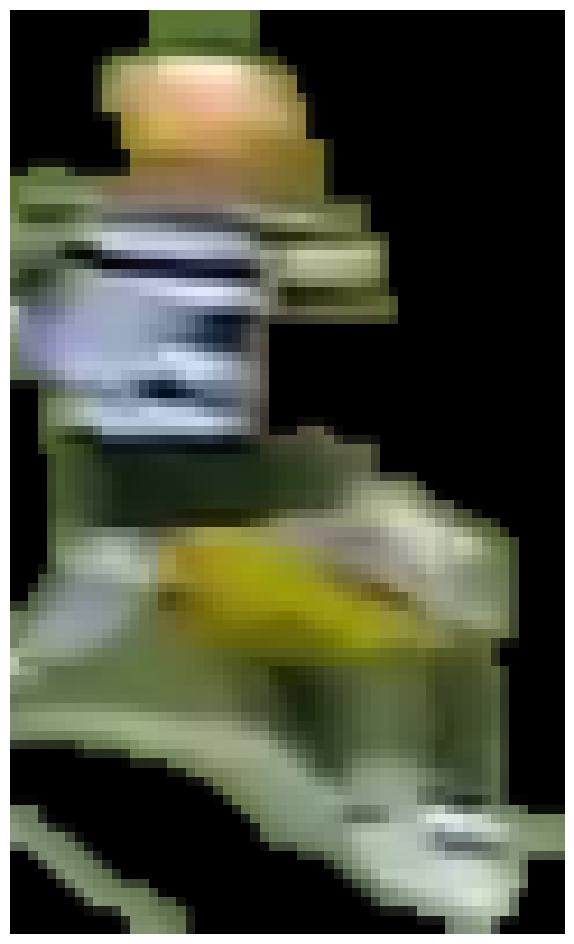

Green Bay Packers 0.5523374 0.6039666

0: 384x640 13 Players, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(107, 64)
(100, 60)


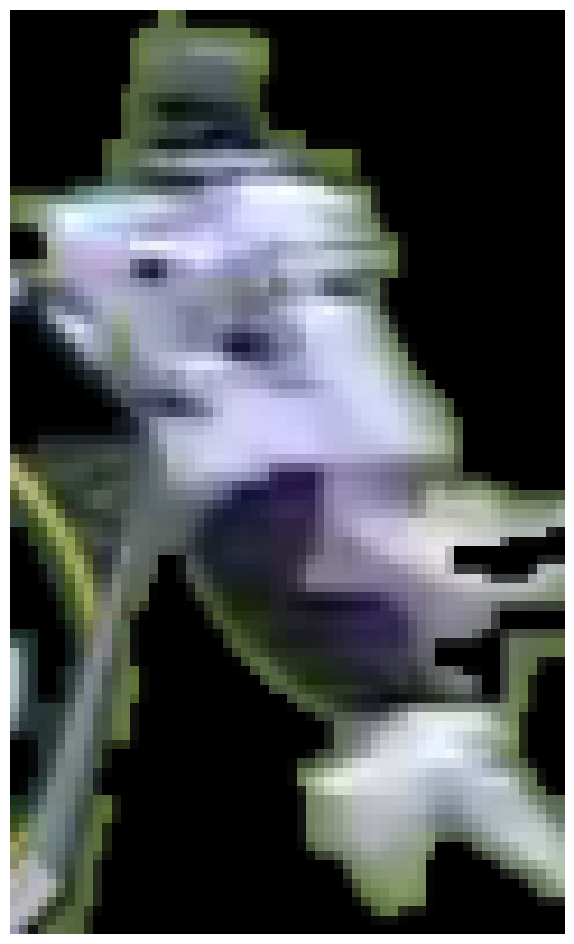

Green Bay Packers 0.72000885 0.7544231

0: 384x640 13 Players, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 16.5ms
Speed: 2.4ms preprocess, 16.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 20.4ms
Speed: 2.6ms preprocess, 20.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms in

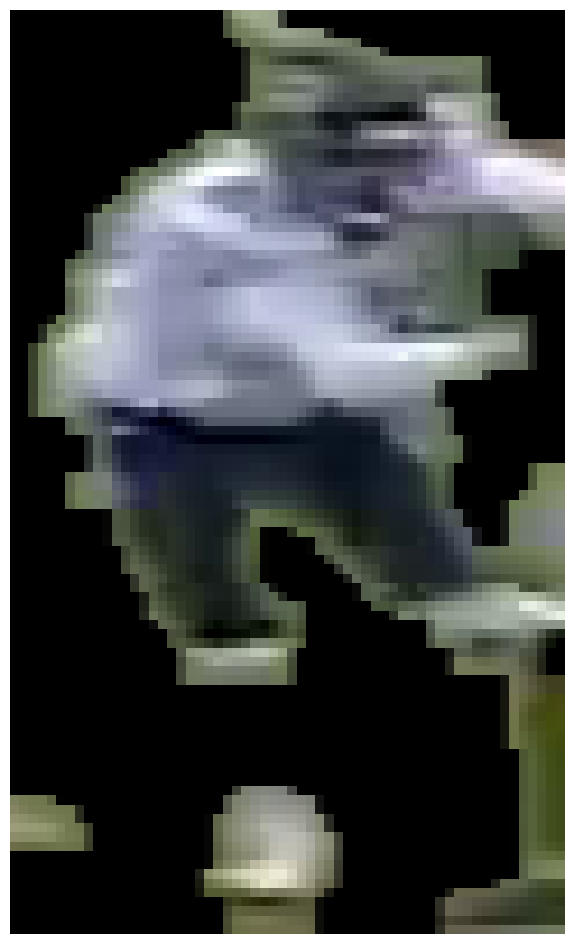

Green Bay Packers 0.66934884 0.72567374

0: 384x640 13 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 21.0ms
Speed: 2.5ms preprocess, 21.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 14.7ms
Speed: 2.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms i

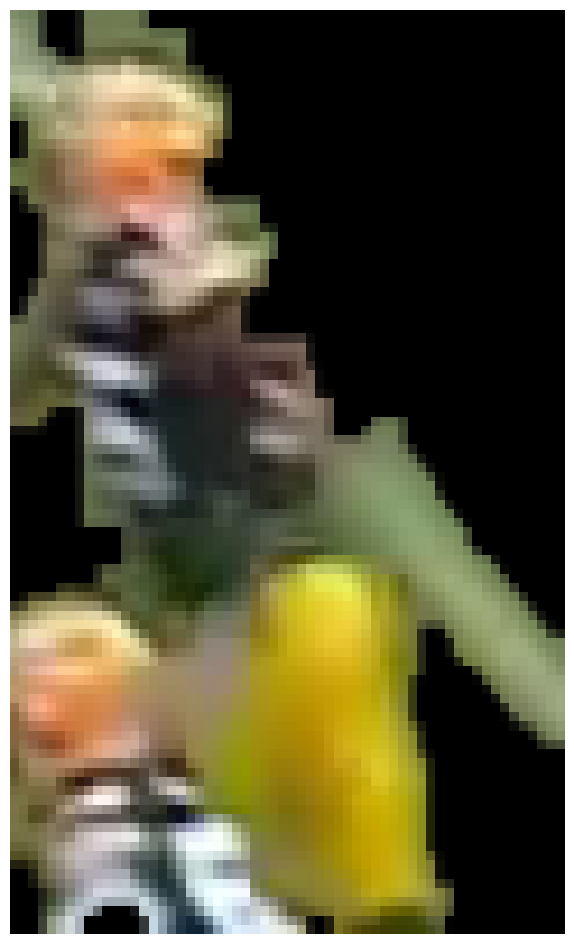

Green Bay Packers 0.58782154 0.6087899

0: 384x640 14 Players, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(116, 42)
(100, 60)

0: 384x640 14 Players, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(121, 51)
(100, 60)

0: 384x640 14 Players, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(117, 62)
(100, 60)


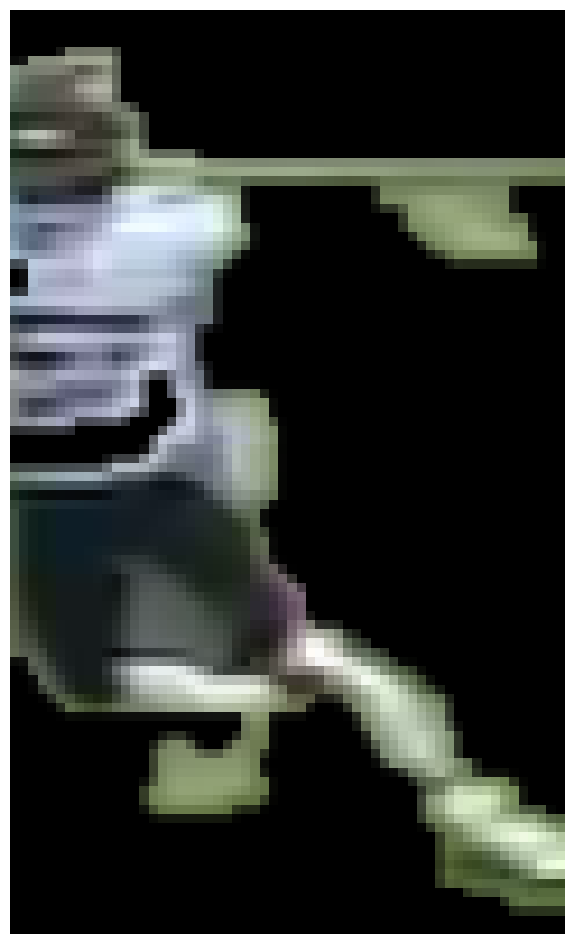

Green Bay Packers 0.61867636 0.6518926

0: 384x640 14 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 15.0ms
Speed: 2.6ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.1ms
Speed: 4.2ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.7ms
Speed: 3.5ms preprocess, 12.7ms in

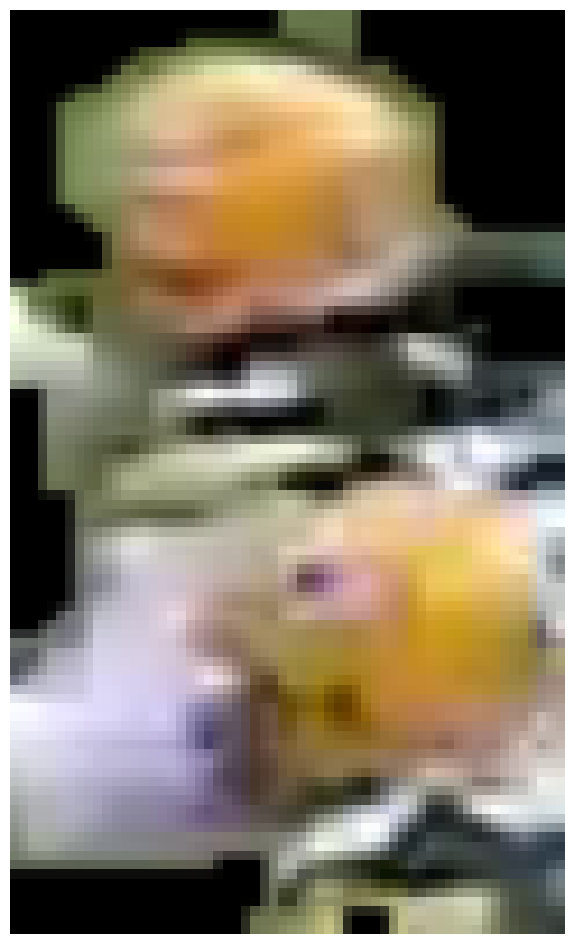

Chicago Bears 0.70203793 0.6754528

0: 384x640 15 Players, 27.1ms
Speed: 3.1ms preprocess, 27.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.0ms
Speed: 4.0ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.3ms
Speed: 3.9ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 11.7ms
Speed: 2.6ms preprocess, 11.7ms infere

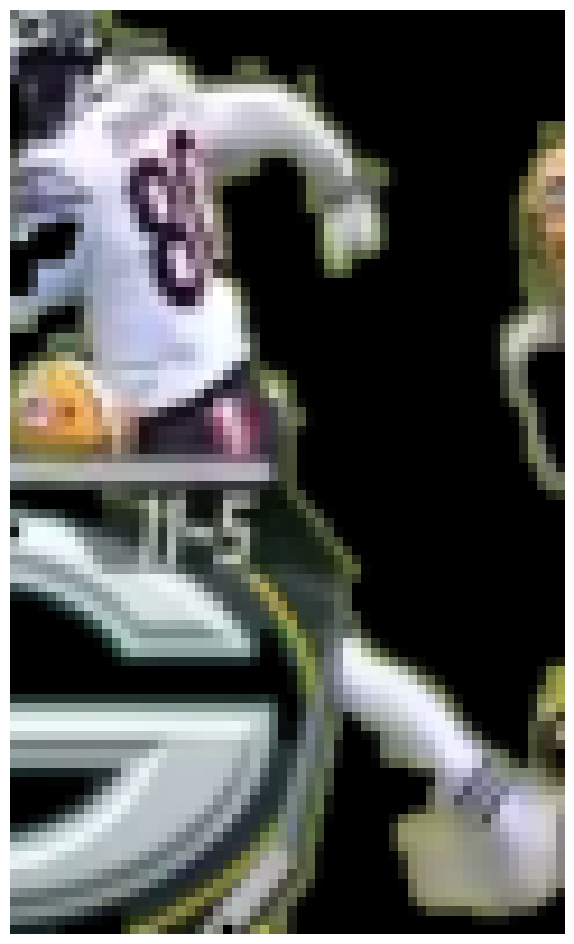

Chicago Bears 0.848025 0.7831001

0: 384x640 10 Players, 1 Referee, 12.8ms
Speed: 4.9ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Referee, 16.4ms
Speed: 2.4ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(169, 90)
(100, 60)

0: 384x640 9 Players, 1 Referee, 14.9ms
Speed: 2.4ms preprocess, 14.9ms inference, 1.6ms postprocess per image at 

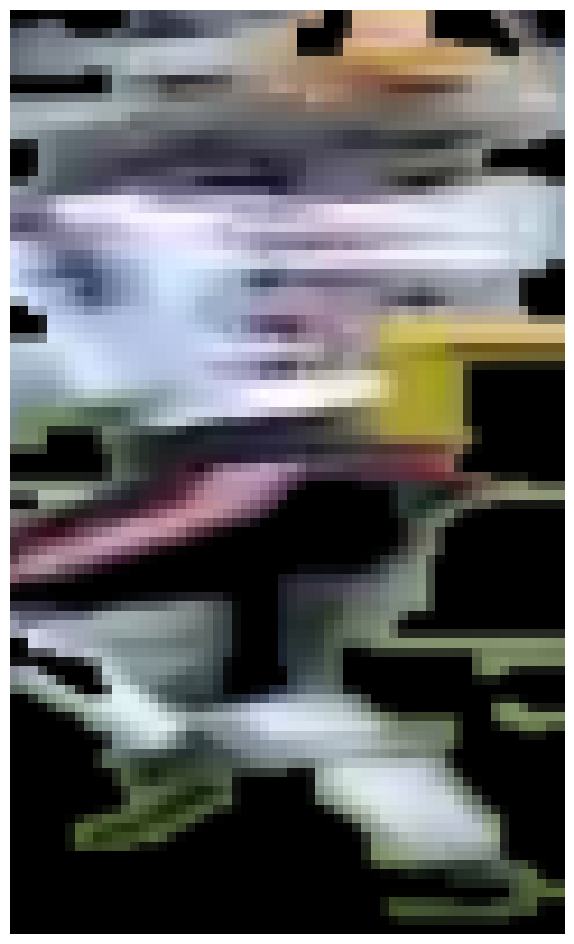

Chicago Bears 0.81253153 0.78751403
(159, 42)
(100, 60)

0: 384x640 11 Players, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(164, 50)
(100, 60)

0: 384x640 11 Players, 13.0ms
Speed: 4.3ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(159, 54)
(100, 60)
(170, 31)
(100, 60)


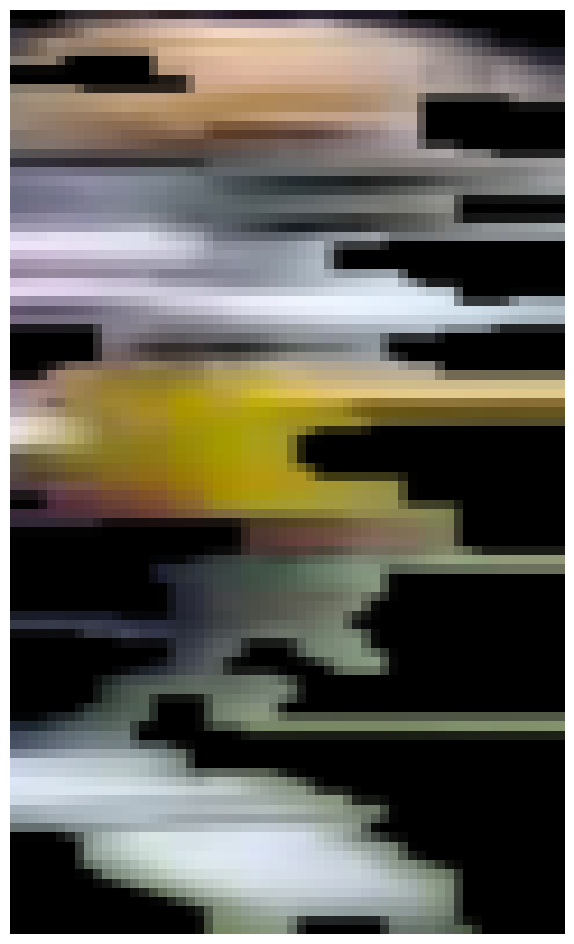

Chicago Bears 0.81311953 0.76543766

0: 384x640 11 Players, 20.3ms
Speed: 2.8ms preprocess, 20.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(156, 55)
(100, 60)

0: 384x640 11 Players, 19.0ms
Speed: 3.8ms preprocess, 19.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
(161, 60)
(100, 60)

0: 384x640 11 Players, 1 Referee, 15.5ms
Speed: 2.8ms preprocess, 15.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(154, 68)
(100, 60)

0: 384x640 11 Players, 1 Referee, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(146, 73)
(100, 60)

0: 384x640 10 Players, 18.6ms
Speed: 2.5ms preprocess, 18.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(147, 78)
(100, 60)
(56, 42)
(100, 60)

0: 384x640 11 Players, 22.1ms
Speed: 2.5ms preprocess, 22.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(152, 83)
(100, 60)
(60, 45)
(100, 60)
(141, 38)
(100, 

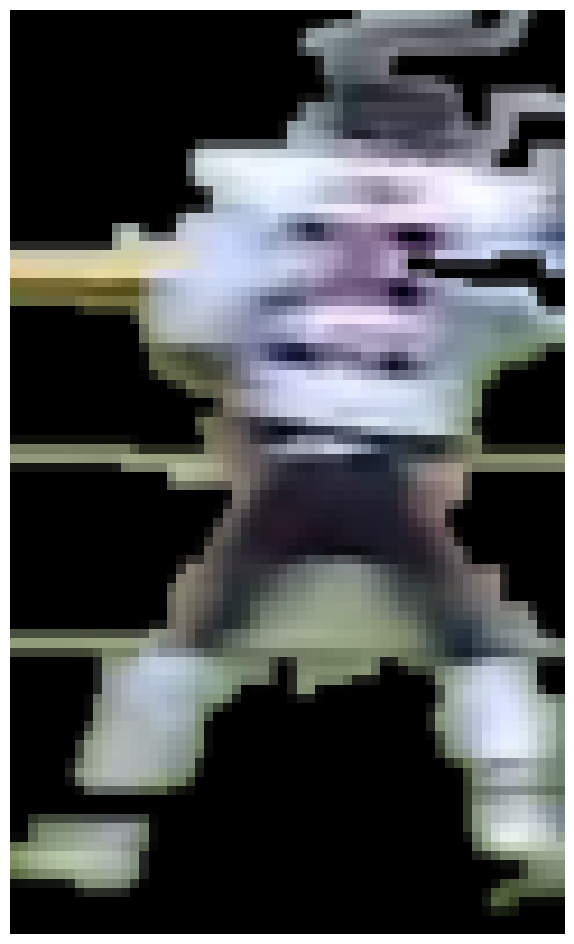

Chicago Bears 0.75452226 0.7305181
(61, 45)
(100, 60)
(129, 41)
(100, 60)

0: 384x640 12 Players, 1 Referee, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(64, 50)
(100, 60)

0: 384x640 11 Players, 1 Referee, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(68, 63)
(100, 60)

0: 384x640 11 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)
(70, 75)
(100, 60)


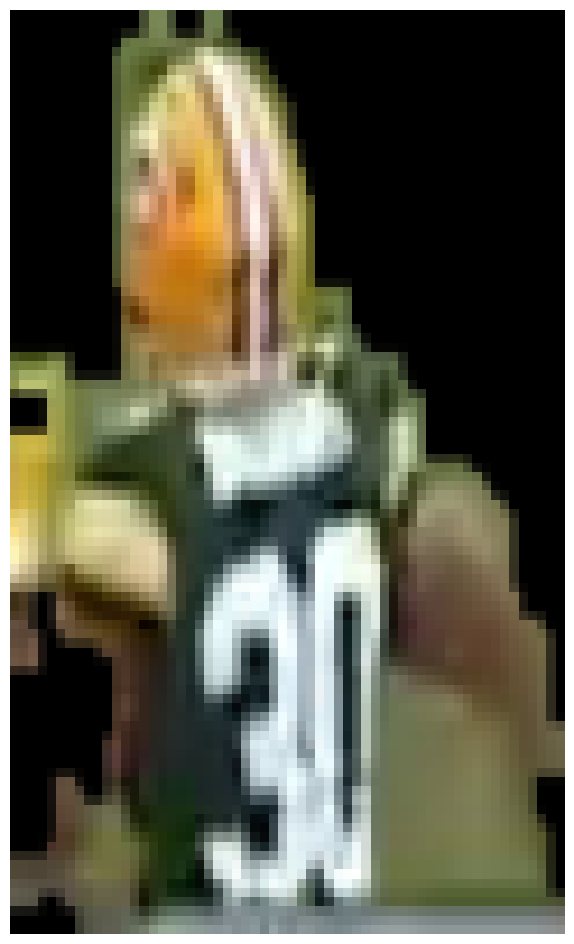

Green Bay Packers 0.69773686 0.72569245

0: 384x640 12 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(135, 94)
(100, 60)


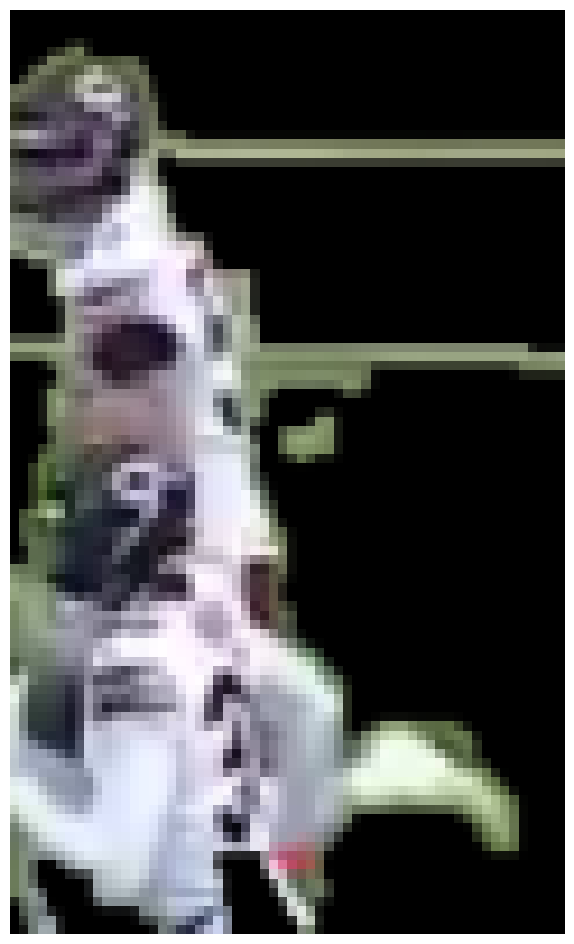

Chicago Bears 0.7482077 0.6691204

0: 384x640 12 Players, 17.5ms
Speed: 3.3ms preprocess, 17.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.3ms
Speed: 3.2ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 1 Referee, 16.6ms
Speed: 4.2ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(186, 89)
(100, 60)

0: 384x640 9 Players, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 1 Referee, 14.5ms
Speed: 2.6ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 1 Refe

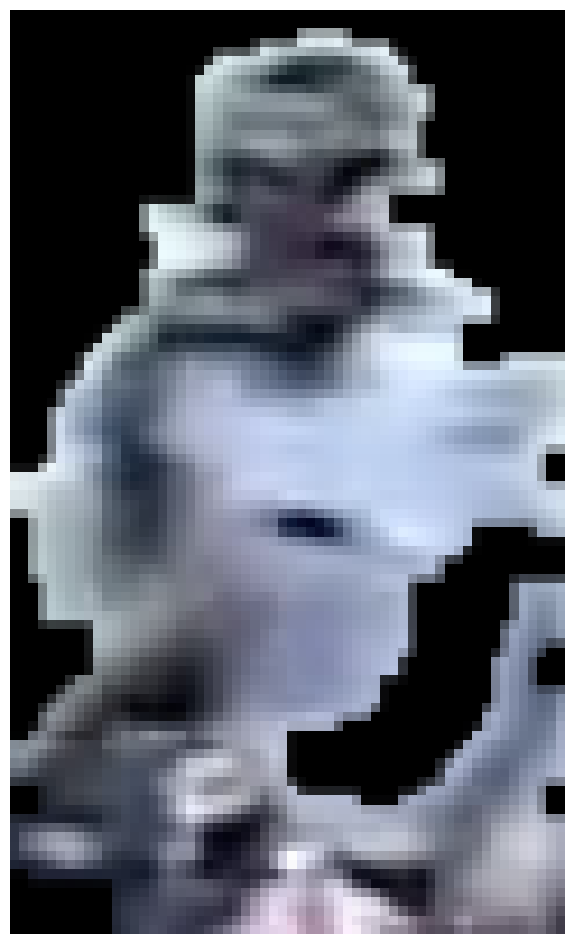

Green Bay Packers 0.52343357 0.56847566

0: 384x640 9 Players, 15.9ms
Speed: 2.6ms preprocess, 15.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.3ms
Speed: 3.2ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 15.2ms
Speed: 3.3ms preprocess, 15.2ms inf

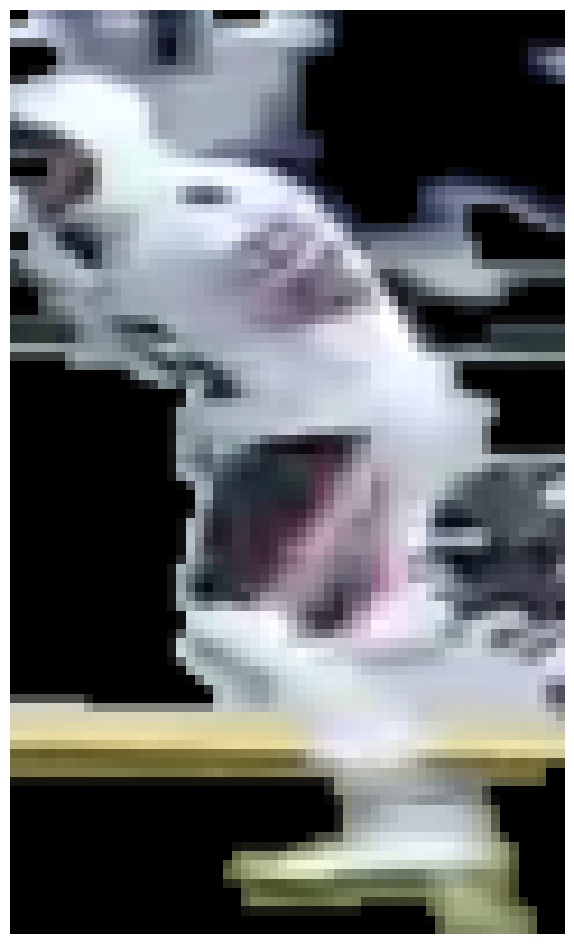

Chicago Bears 0.6642818 0.6232131

0: 384x640 10 Players, 13.4ms
Speed: 3.2ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(182, 42)
(100, 60)


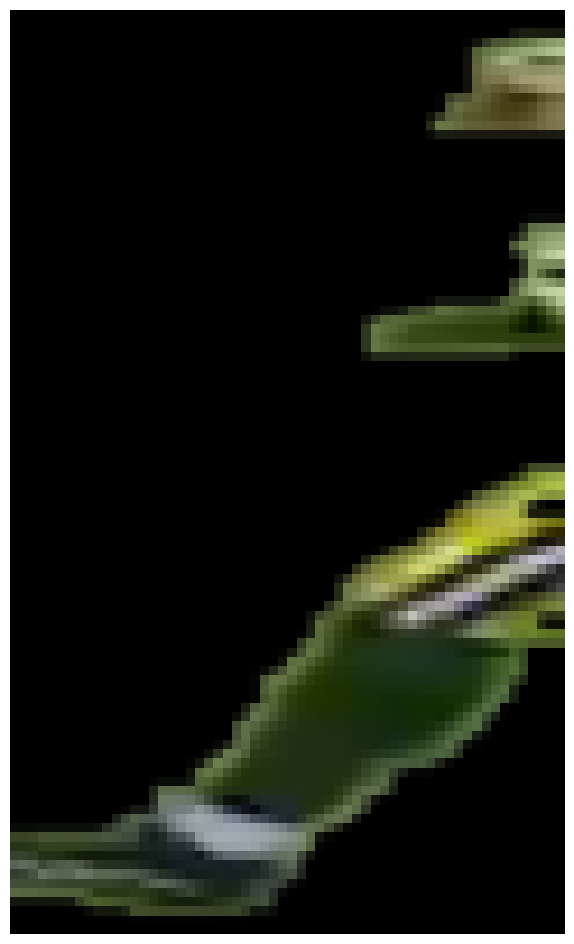

Green Bay Packers 0.39864743 0.49889135

0: 384x640 11 Players, 16.4ms
Speed: 3.8ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 5.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.0ms
Speed: 2.3ms preprocess, 12.0ms i

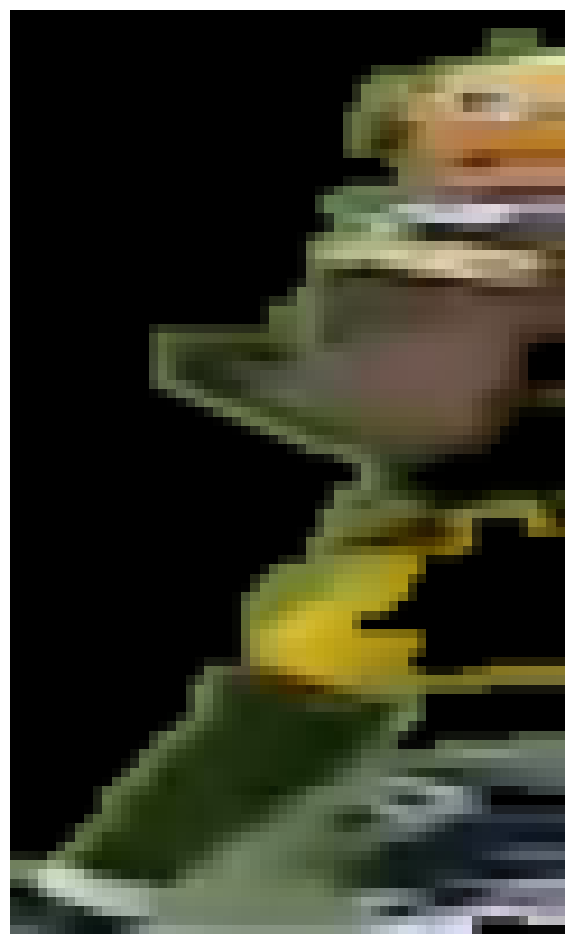

Green Bay Packers 0.5683876 0.6505835
(72, 55)
(100, 60)


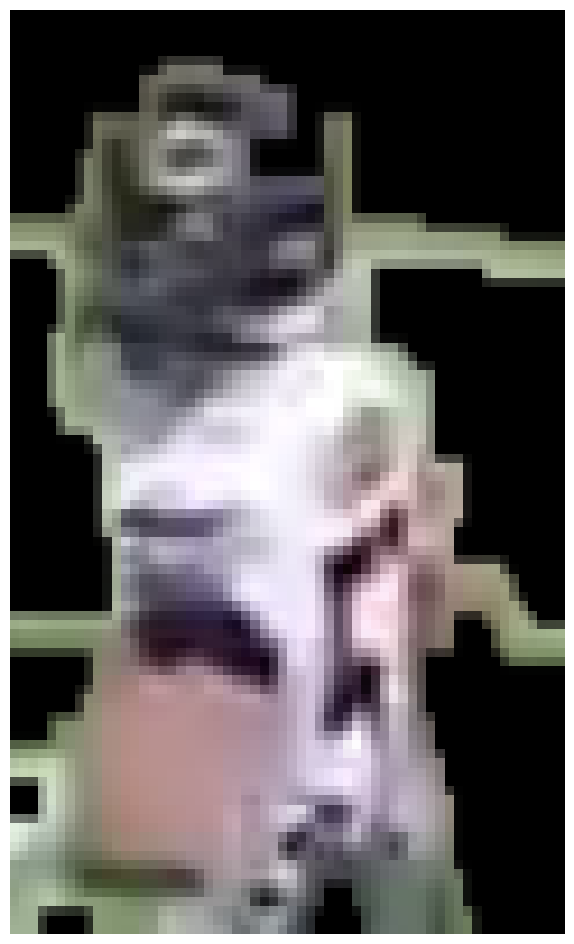

Chicago Bears 0.756337 0.6462924

0: 384x640 14 Players, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(98, 82)
(100, 60)
(176, 65)
(100, 60)
(189, 63)
(100, 60)

0: 384x640 14 Players, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(180, 54)
(100, 60)
(218, 66)
(100, 60)
(129, 66)
(100, 60)


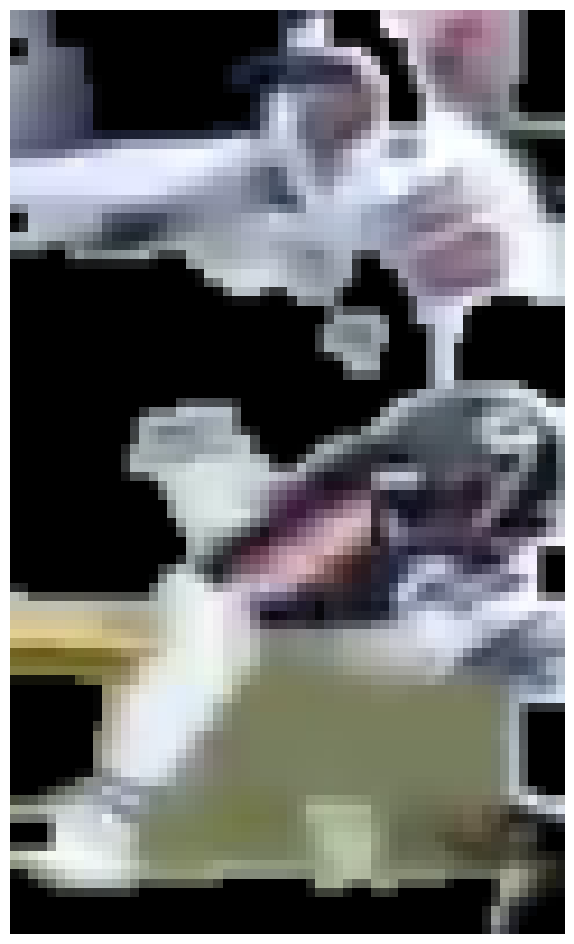

Chicago Bears 0.725419 0.67772347

0: 384x640 13 Players, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(141, 73)
(100, 60)


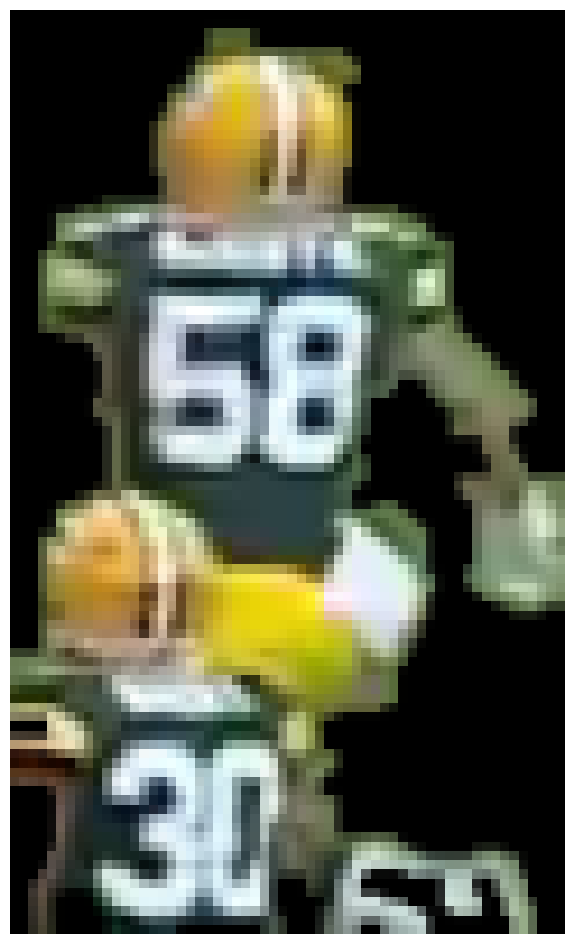

Green Bay Packers 0.7545911 0.77549714
(180, 49)
(100, 60)

0: 384x640 13 Players, 21.4ms
Speed: 2.5ms preprocess, 21.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(181, 54)
(100, 60)

0: 384x640 12 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(171, 67)
(100, 60)


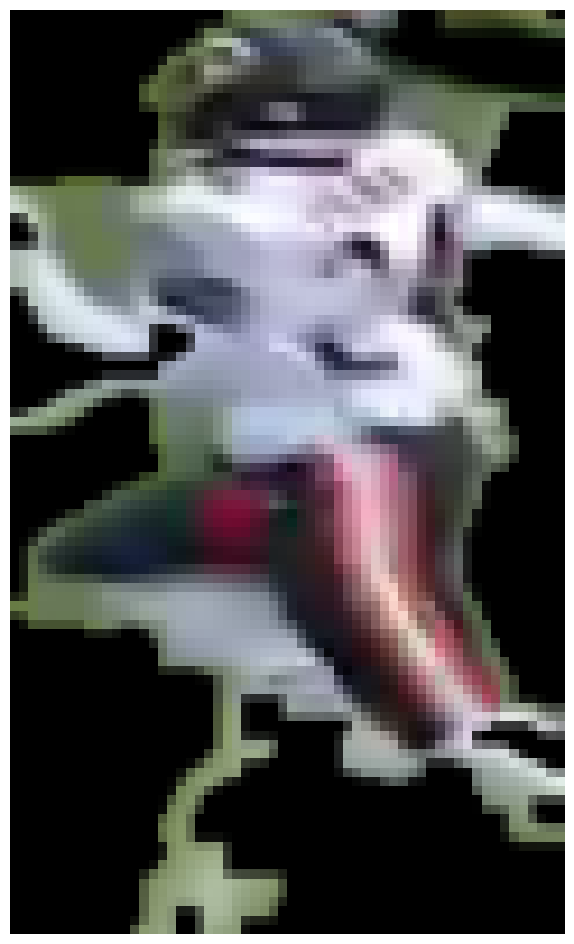

Chicago Bears 0.810182 0.7880215

0: 384x640 15 Players, 12.1ms
Speed: 8.1ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(185, 61)
(100, 60)

0: 384x640 13 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(159, 31)
(100, 60)


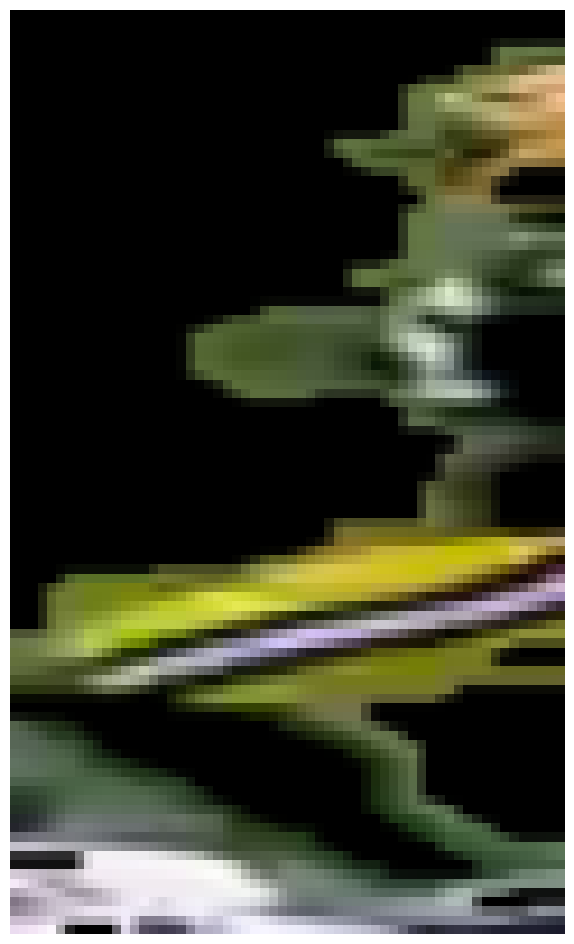

Green Bay Packers 0.5843864 0.6350009
(184, 63)
(100, 60)

0: 384x640 13 Players, 12.3ms
Speed: 9.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(80, 99)
(100, 60)

0: 384x640 14 Players, 16.1ms
Speed: 2.7ms preprocess, 16.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(169, 30)
(100, 60)


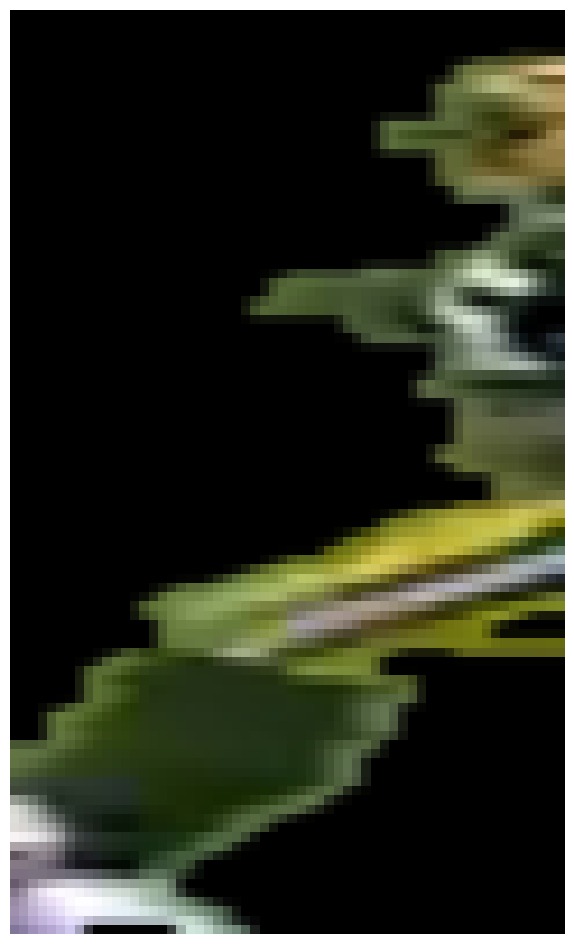

Green Bay Packers 0.4354362 0.51351184

0: 384x640 13 Players, 14.2ms
Speed: 2.3ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 14.3ms
Speed: 4.5ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 21.1ms
Speed: 2.4ms preprocess, 21.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(182, 62)
(100, 60)

0: 384x640 13 Players, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(173, 59)
(100, 60)

0: 384x640 13 Players, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(162, 59)
(100, 60)
(134, 61)
(100, 60)

0: 384x640 13 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1

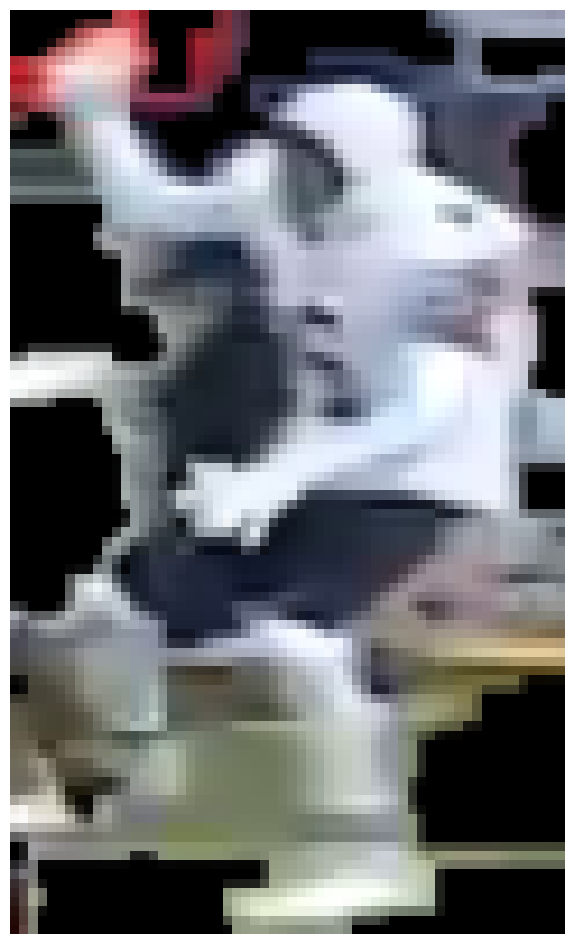

Chicago Bears 0.6898003 0.6668958
(148, 72)
(100, 60)


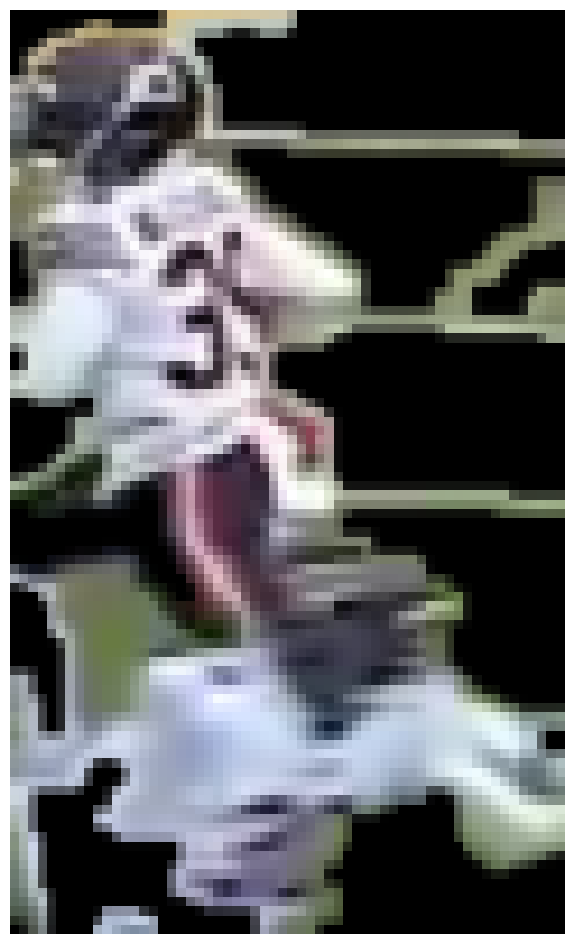

Chicago Bears 0.775972 0.7129696

0: 384x640 11 Players, 22.6ms
Speed: 2.7ms preprocess, 22.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(152, 62)
(100, 60)

0: 384x640 13 Players, 17.0ms
Speed: 2.6ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(157, 66)
(100, 60)

0: 384x640 14 Players, 18.0ms
Speed: 2.5ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(155, 55)
(100, 60)


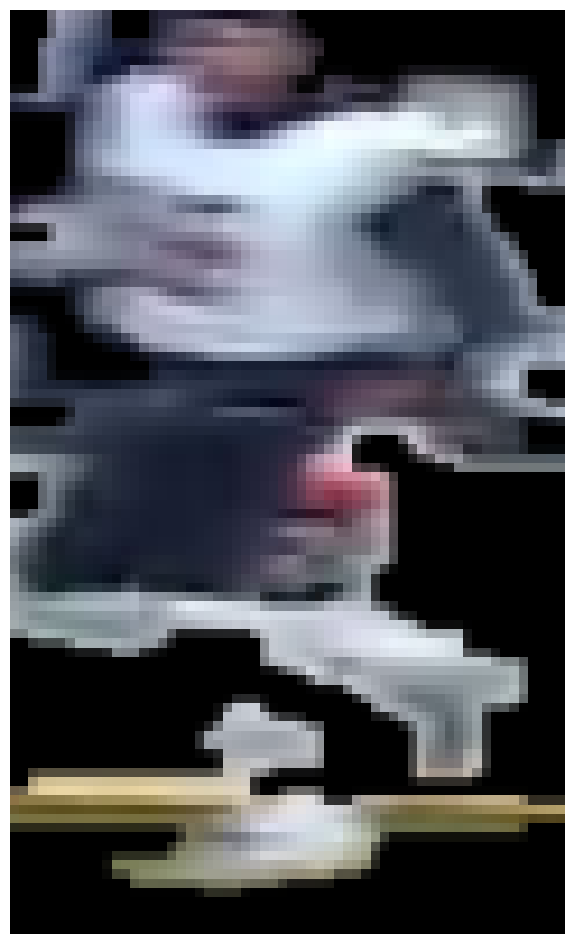

Green Bay Packers 0.5830504 0.62811387
(162, 63)
(100, 60)


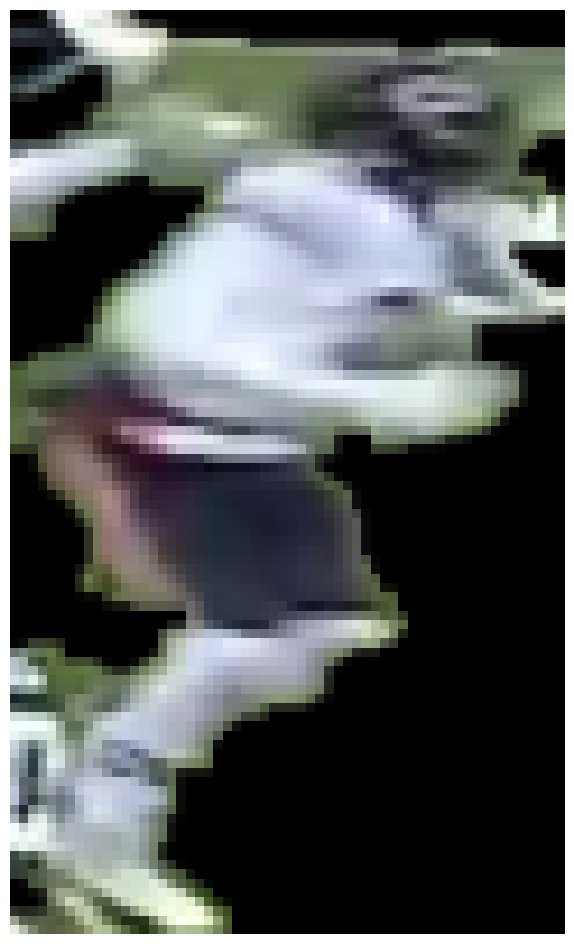

Chicago Bears 0.73182386 0.7117703
(167, 73)
(100, 60)


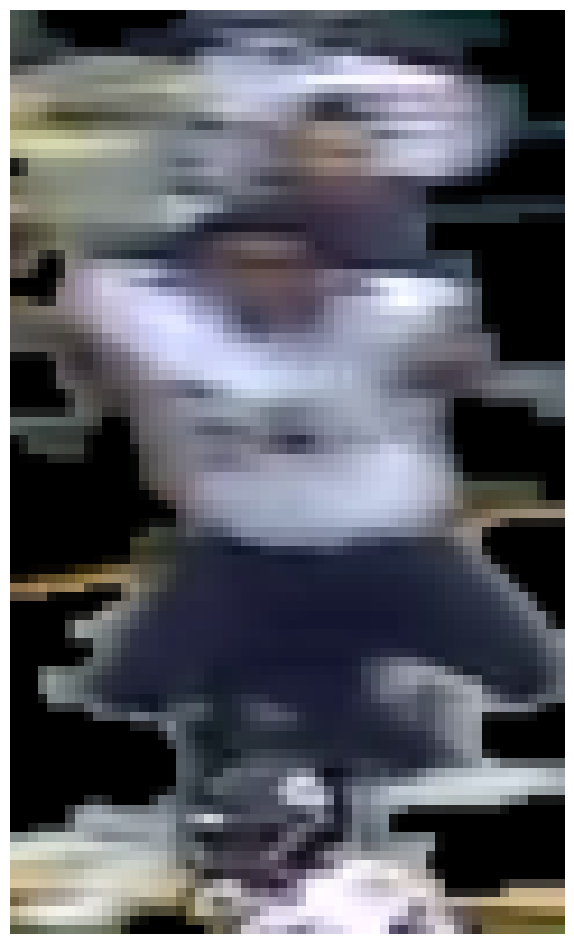

Green Bay Packers 0.63173103 0.67919993

0: 384x640 13 Players, 24.4ms
Speed: 2.6ms preprocess, 24.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 18.5ms
Speed: 2.4ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.5ms
Speed: 4.0ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 13.3ms
Speed: 2.7ms preprocess, 13.3ms i

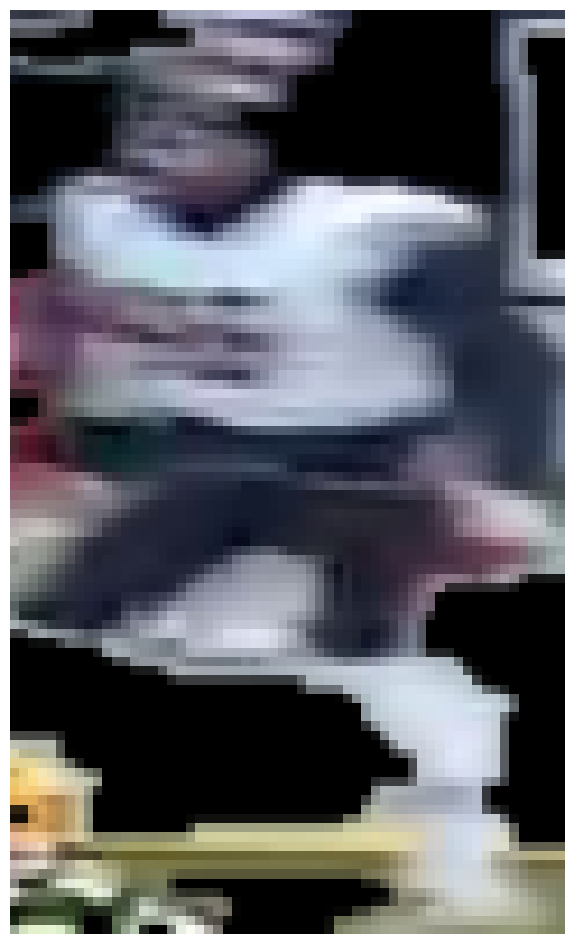

Green Bay Packers 0.6076128 0.65592545

0: 384x640 12 Players, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 20.7ms
Speed: 2.5ms preprocess, 20.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 18.9ms
Speed: 2.6ms preprocess, 18.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 16.0ms
Speed: 2.5ms preprocess, 16.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 22.9ms
Speed: 2.5ms preprocess, 22.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 15.8ms
Speed: 5.4ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 19.9ms
Speed: 2.4ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 19.8ms
Speed: 2.5ms preprocess, 19.8ms in

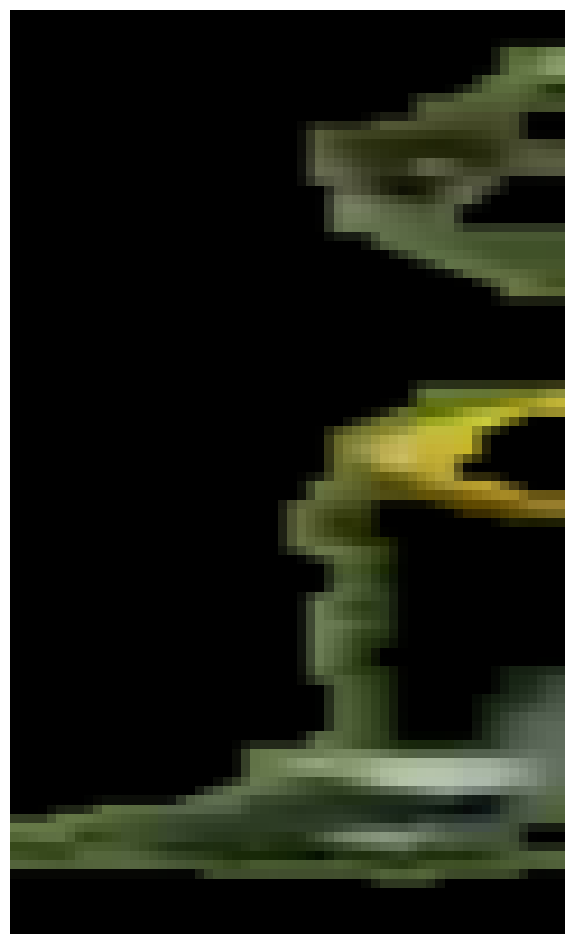

Green Bay Packers 0.34569326 0.4314179

0: 384x640 13 Players, 22.3ms
Speed: 2.4ms preprocess, 22.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(116, 42)
(100, 60)
(133, 56)
(100, 60)


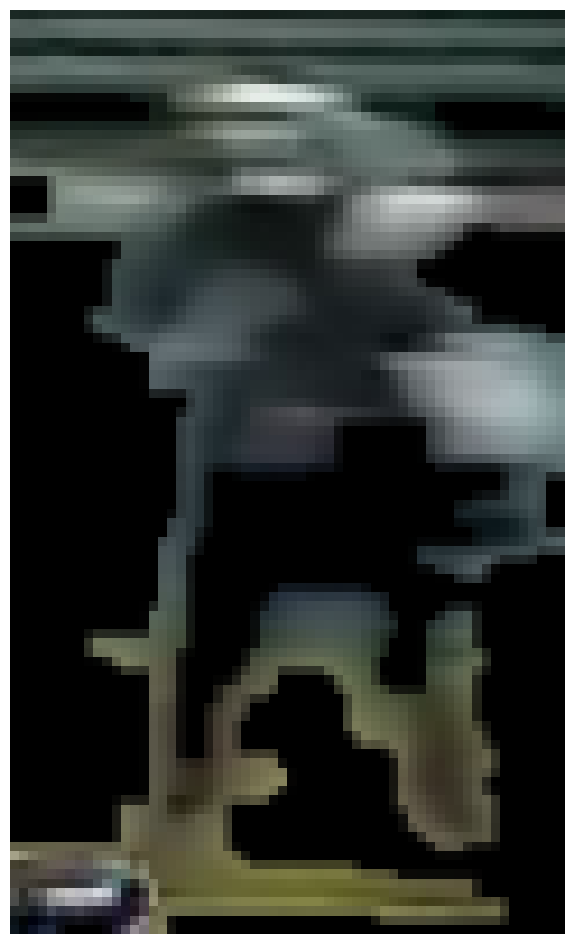

Green Bay Packers 0.7063127 0.77798414

0: 384x640 13 Players, 29.3ms
Speed: 3.1ms preprocess, 29.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(120, 44)
(100, 60)
(56, 37)
(100, 60)


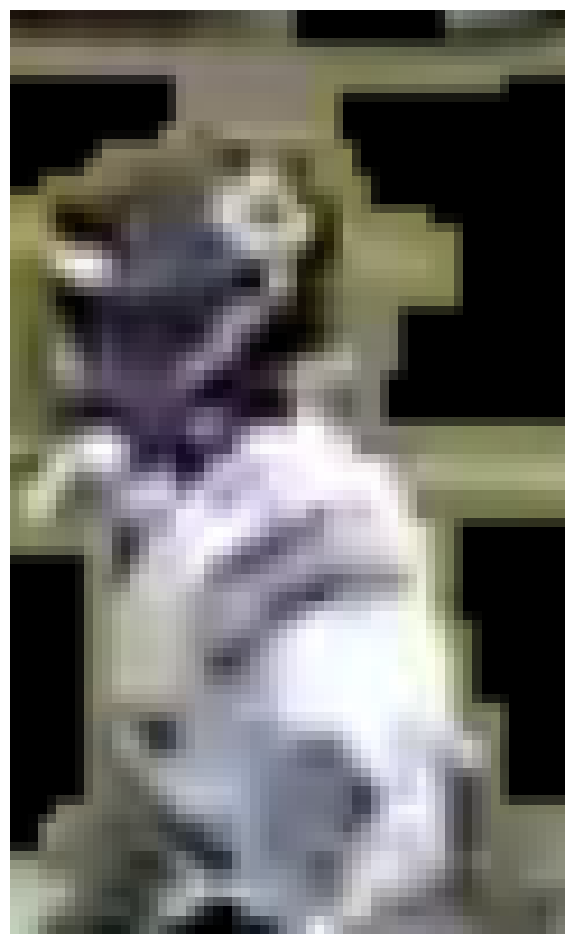

Chicago Bears 0.7029409 0.65375644

0: 384x640 14 Players, 28.5ms
Speed: 2.6ms preprocess, 28.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(121, 50)
(100, 60)

0: 384x640 14 Players, 15.3ms
Speed: 2.6ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(119, 54)
(100, 60)

0: 384x640 12 Players, 18.4ms
Speed: 2.5ms preprocess, 18.4ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)
(116, 60)
(100, 60)


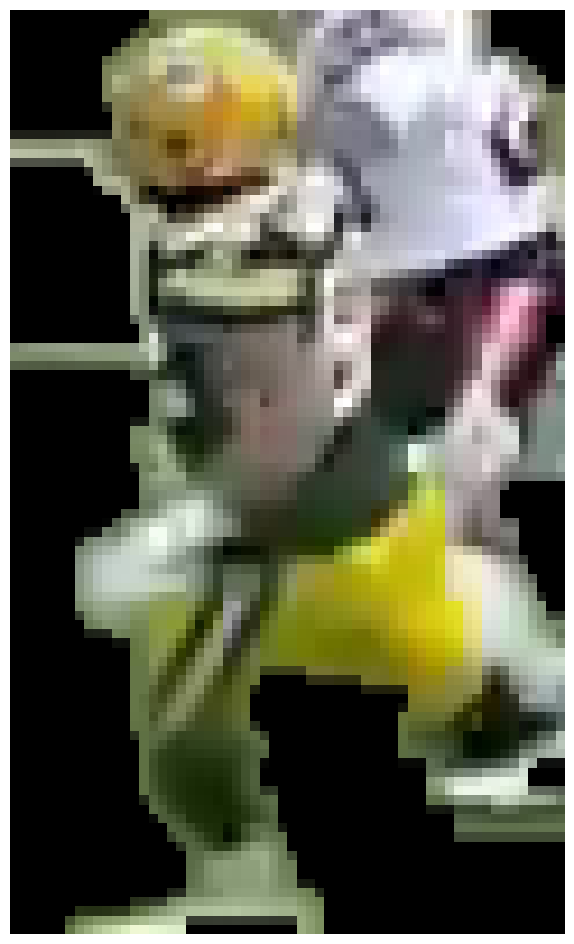

Chicago Bears 0.7122827 0.6852931

0: 384x640 12 Players, 24.2ms
Speed: 2.7ms preprocess, 24.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 20.4ms
Speed: 2.5ms preprocess, 20.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 17.0ms
Speed: 2.5ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 19.4ms
Speed: 2.5ms preprocess, 19.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 18.7ms
Speed: 2.5ms preprocess, 18.7ms inferen

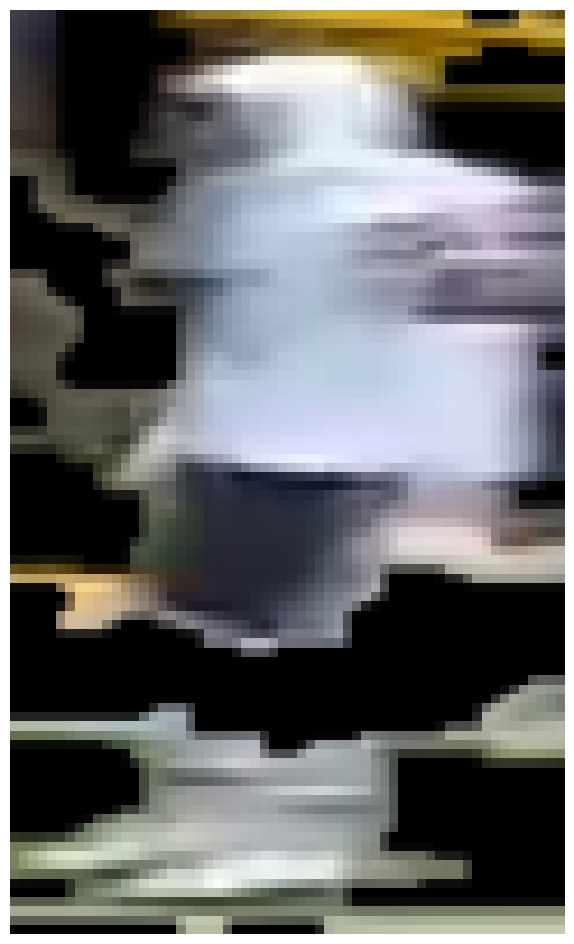

Chicago Bears 0.70155054 0.6698726

0: 384x640 14 Players, 26.6ms
Speed: 2.6ms preprocess, 26.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(130, 36)
(100, 60)


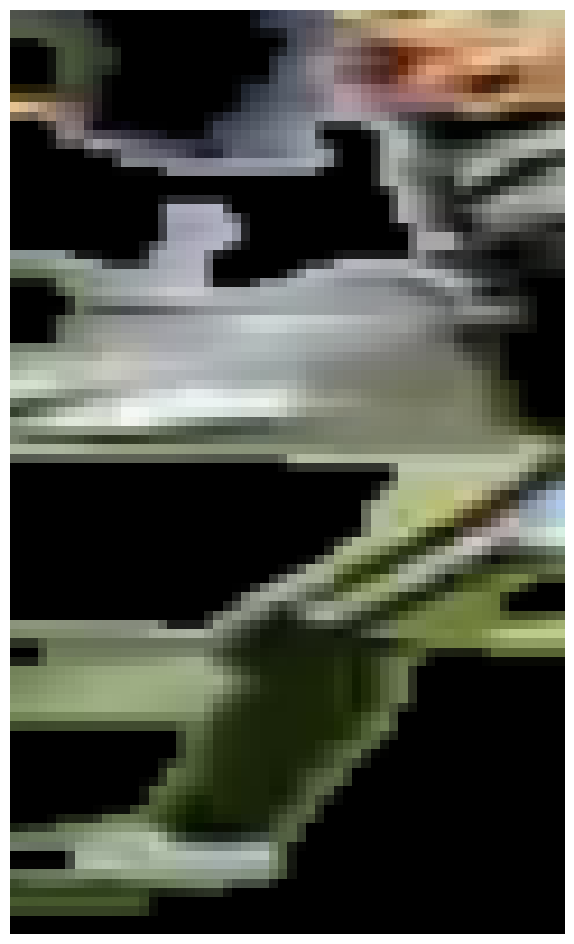

Chicago Bears 0.6039126 0.58263236
(94, 55)
(100, 60)

0: 384x640 14 Players, 20.8ms
Speed: 4.9ms preprocess, 20.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(94, 53)
(100, 60)

0: 384x640 14 Players, 18.1ms
Speed: 3.2ms preprocess, 18.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(103, 52)
(100, 60)
(114, 43)
(100, 60)

0: 384x640 14 Players, 17.5ms
Speed: 5.5ms preprocess, 17.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(97, 53)
(100, 60)
(117, 46)
(100, 60)


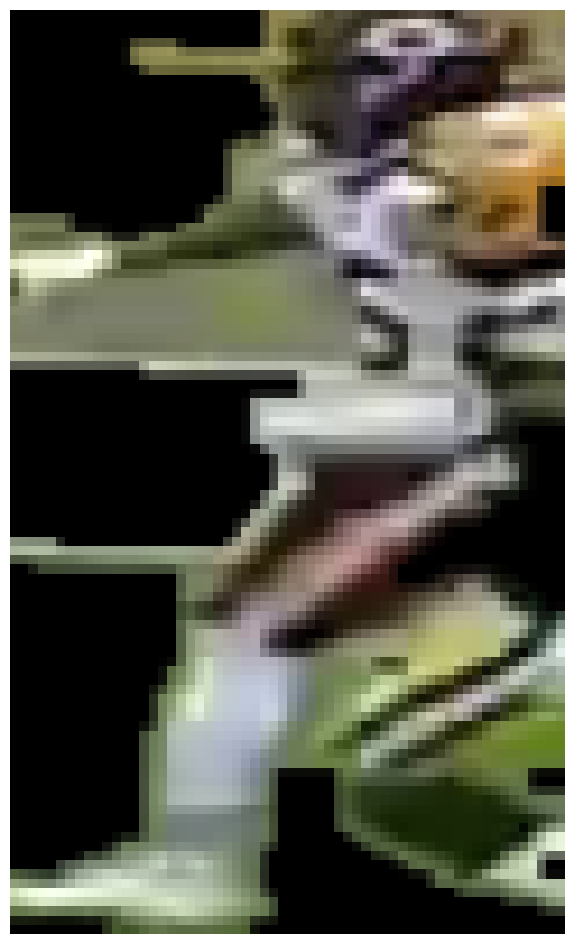

Chicago Bears 0.655242 0.6344039

0: 384x640 14 Players, 24.9ms
Speed: 3.7ms preprocess, 24.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(94, 50)
(100, 60)

0: 384x640 14 Players, 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 14.9ms
Speed: 4.0ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(88, 72)
(100, 60)


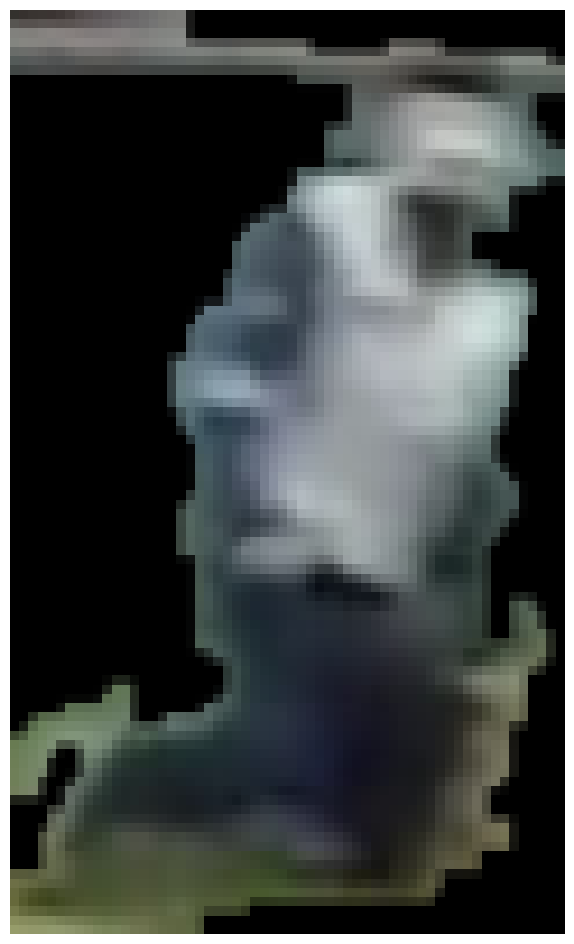

Green Bay Packers 0.7758008 0.80900383

0: 384x640 15 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms in

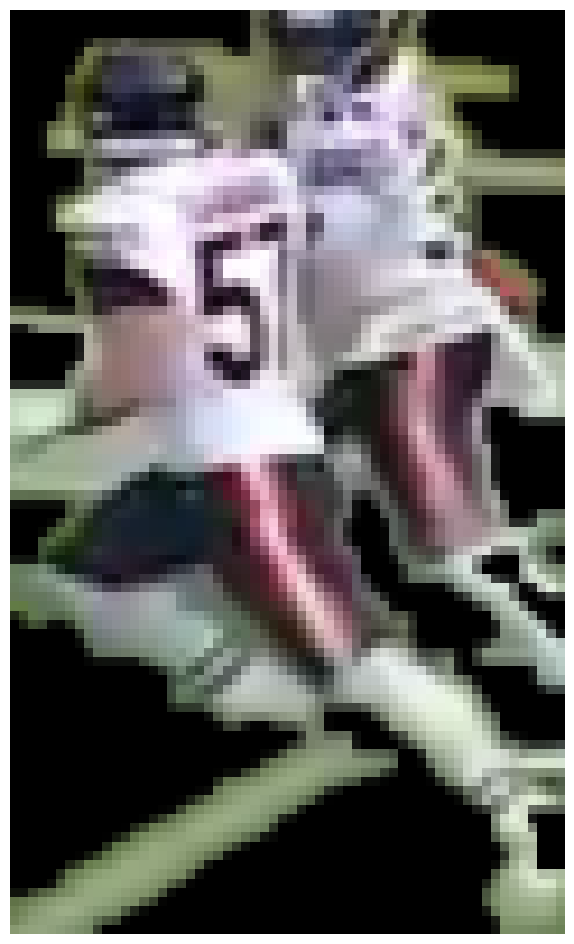

Chicago Bears 0.80941623 0.7198528

0: 384x640 12 Players, 22.4ms
Speed: 5.2ms preprocess, 22.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 Players, 21.6ms
Speed: 2.5ms preprocess, 21.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 13.6ms
Speed: 2.5ms preprocess, 13.6ms infere

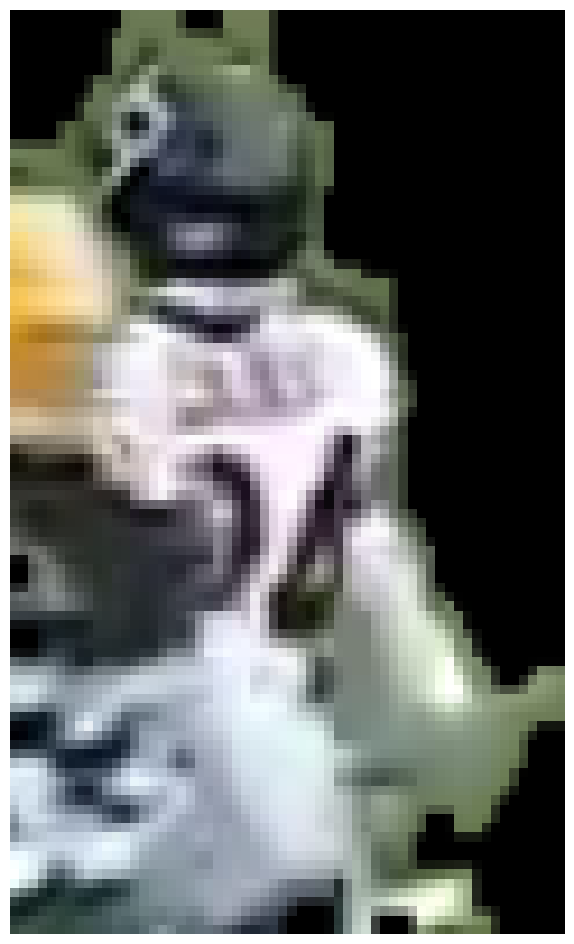

Chicago Bears 0.7862321 0.7234249

0: 384x640 10 Players, 12.5ms
Speed: 3.3ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 15.5ms
Speed: 3.1ms preprocess, 15.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 17.0ms
Speed: 3.4ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(142, 65)
(100, 60)

0: 384x640 10 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(151, 69)
(100, 60)


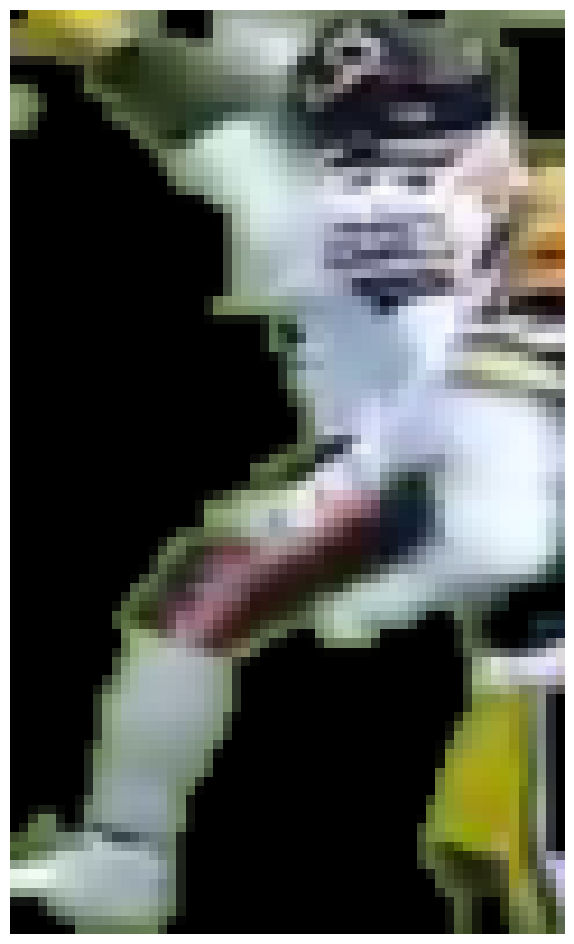

Chicago Bears 0.80789006 0.78373325

0: 384x640 10 Players, 19.9ms
Speed: 4.6ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 Players, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 12.0ms
Speed: 3.2ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.3ms
Speed: 4.1ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 

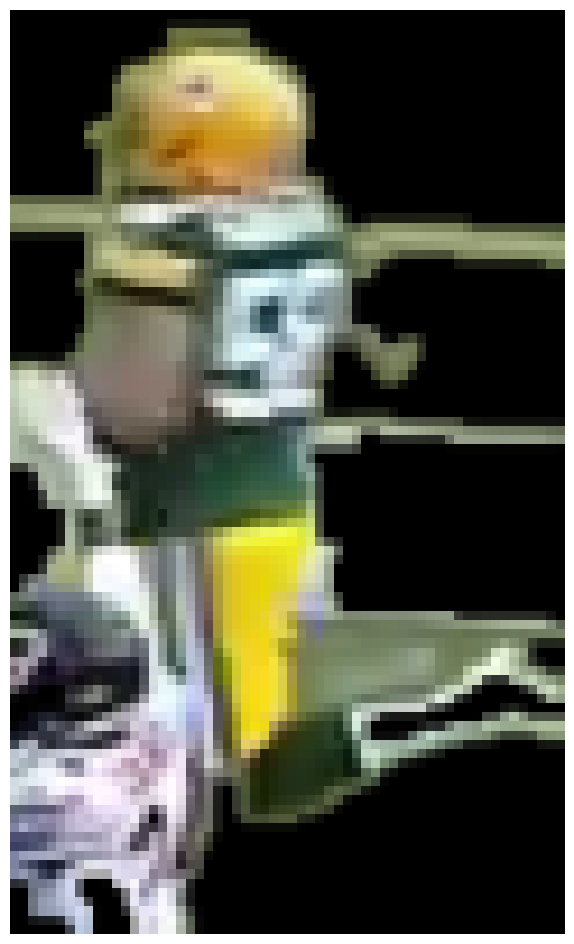

Chicago Bears 0.77824265 0.7559006

0: 384x640 7 Players, 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 1 Referee, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(209, 53)
(100, 60)

0: 384x640 8 Players, 1 Referee, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(212, 64)
(100, 60)
(212, 64)
(100

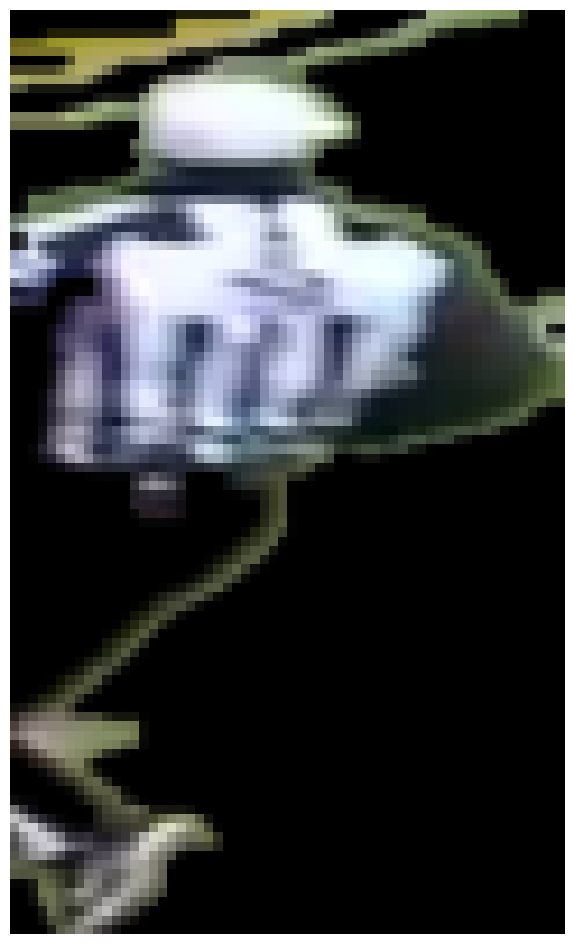

Green Bay Packers 0.73048335 0.7573568

0: 384x640 7 Players, 1 Referee, 14.5ms
Speed: 2.9ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 1 Referee, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(187, 61)
(100, 60)


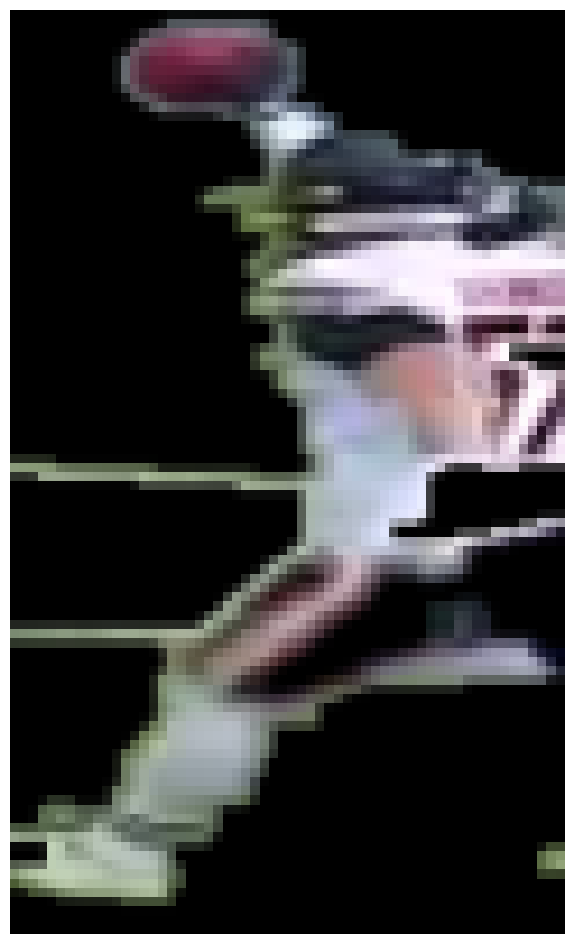

Chicago Bears 0.7927624 0.74526745

0: 384x640 6 Players, 1 Referee, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.2ms
Speed: 4.2ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 1 Referee, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 1 Referee, 15.3ms
Speed: 3.2ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 1 Referee, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

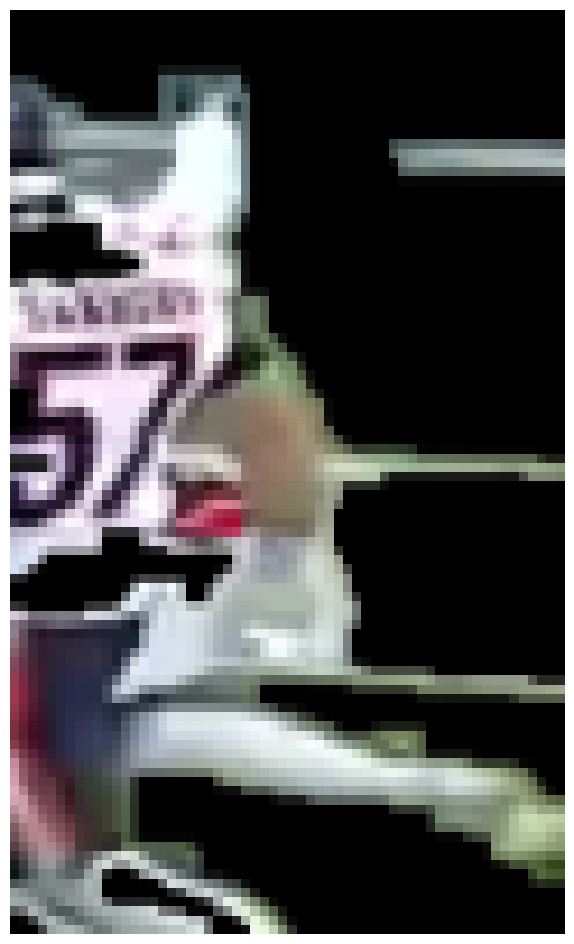

Chicago Bears 0.833349 0.7193529

0: 384x640 5 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.7ms

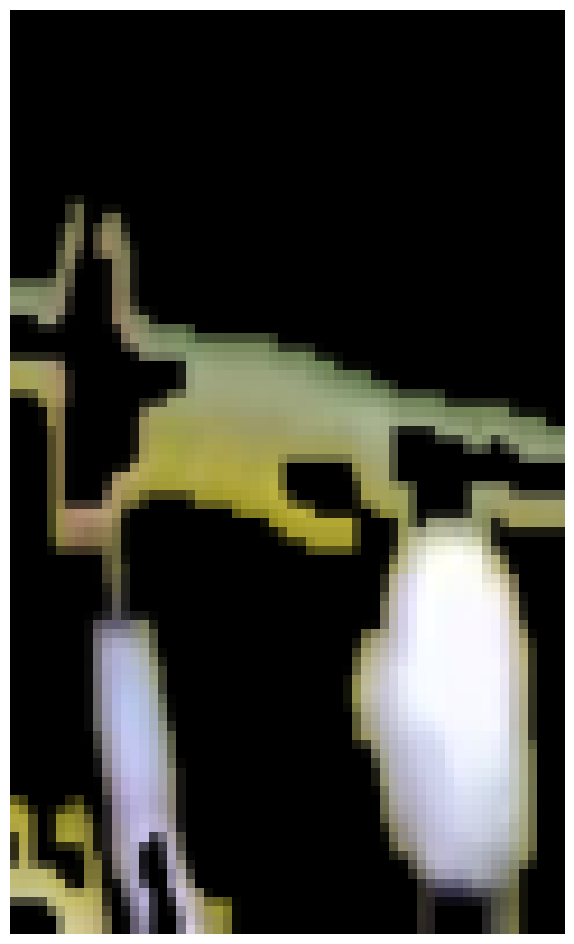

Chicago Bears 0.5848261 0.5559634

0: 384x640 6 Players, 24.5ms
Speed: 2.4ms preprocess, 24.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 20.1ms
Speed: 2.4ms preprocess, 20.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 1.6m

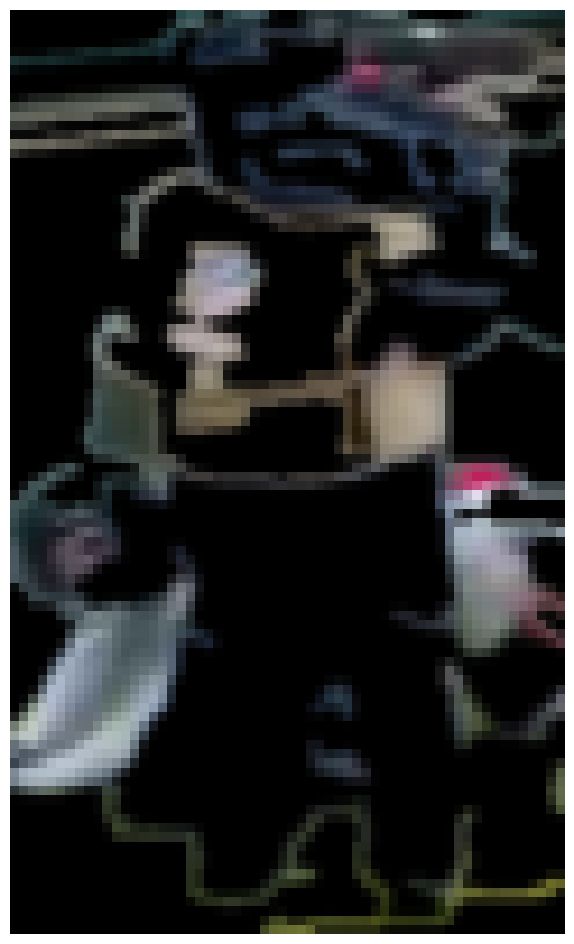

Green Bay Packers 0.7220251 0.7866829

0: 384x640 5 Players, 24.4ms
Speed: 2.6ms preprocess, 24.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 19.9ms
Speed: 2.6ms preprocess, 19.9ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 16.4ms
Speed: 2.5ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 20.8ms
Speed: 2.5ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 17.7ms
Speed: 2.6ms preprocess, 17.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 19.4ms
Speed: 3.3ms preprocess, 19.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 15.6ms
Speed: 2.5ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 19.0ms
Speed: 3.0ms preprocess, 19.0ms inference, 

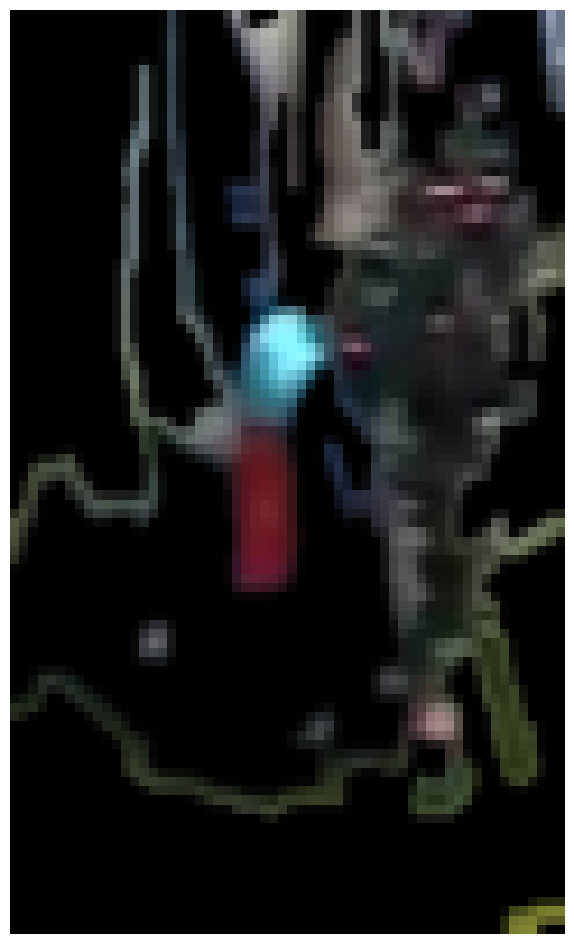

Green Bay Packers 0.758448 0.80893475

0: 384x640 5 Players, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 24.5ms
Speed: 3.4ms preprocess, 24.5ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 15.4ms
Speed: 2.4ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 18.5ms
Speed: 3.8ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 14.1ms
Speed: 2.4ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 16.1ms
Speed: 2.6ms preprocess, 16.1ms inference, 

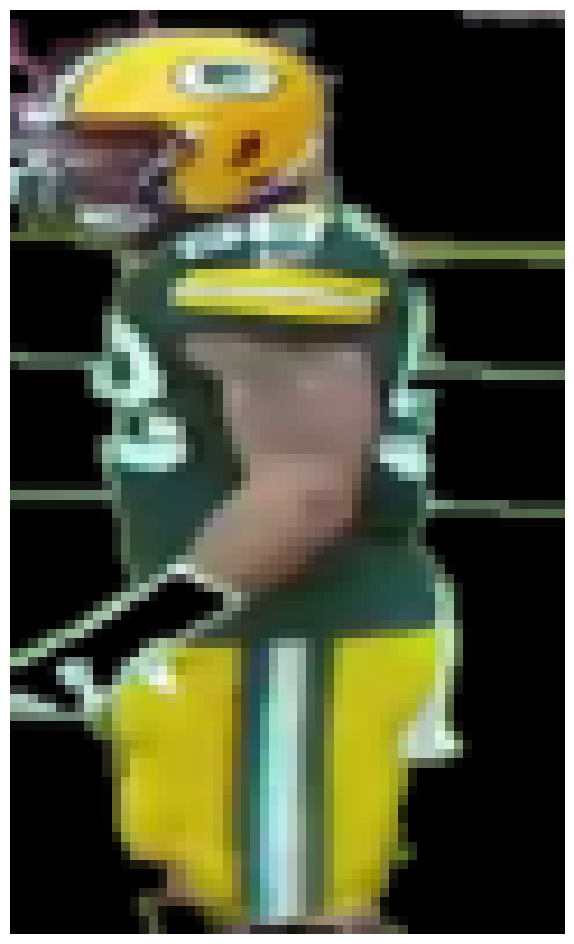

Green Bay Packers 0.7154445 0.75575584
(238, 125)
(100, 60)


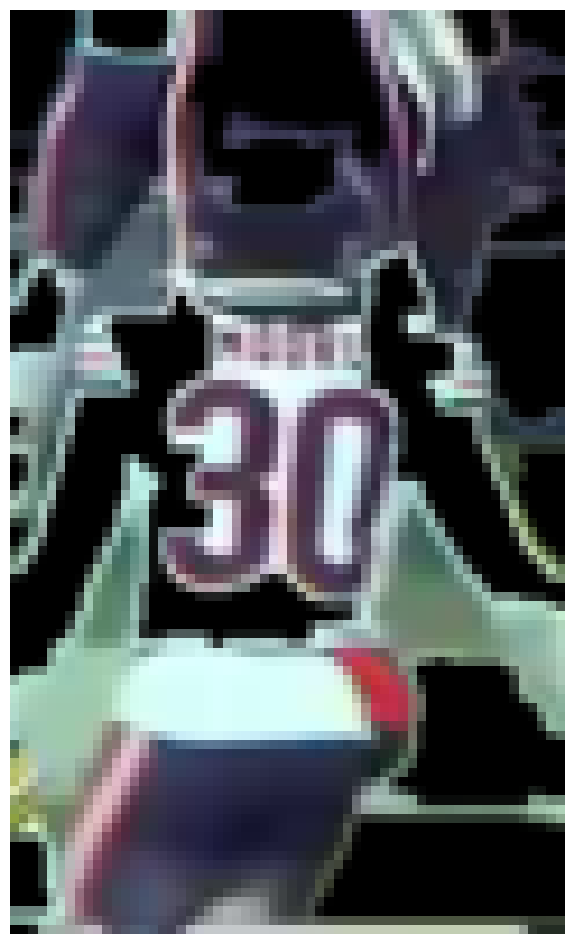

Green Bay Packers 0.80900145 0.853008
(313, 177)
(100, 60)


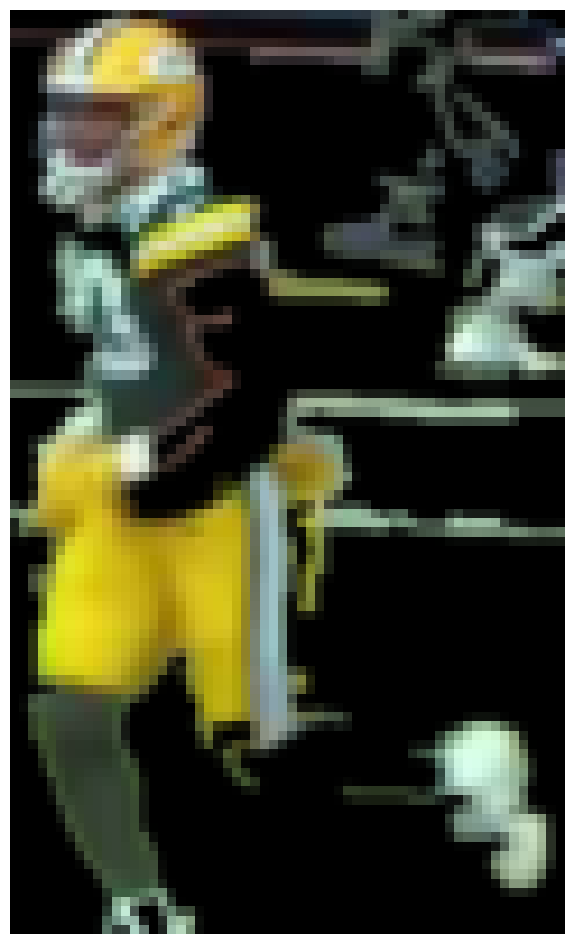

Green Bay Packers 0.674374 0.7280577
(169, 199)
(100, 60)


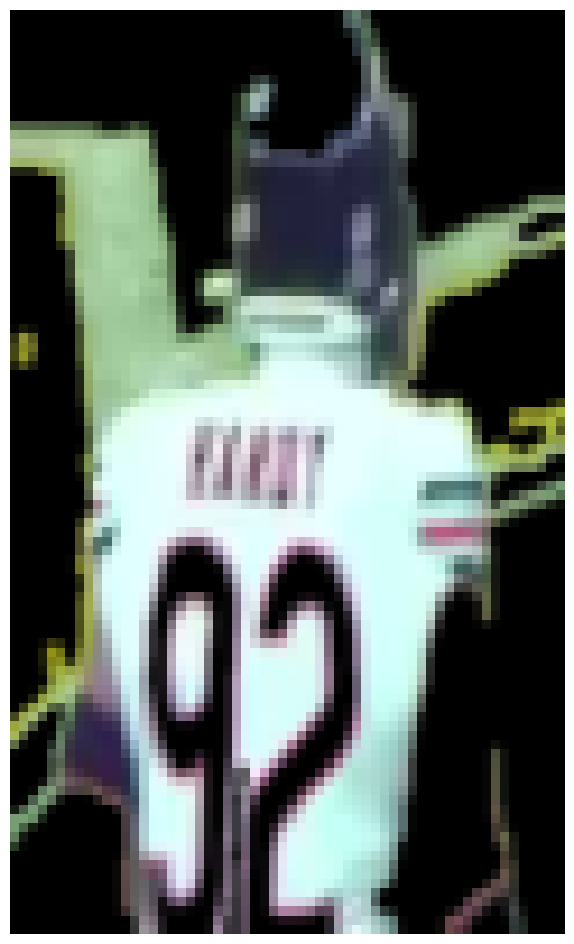

Chicago Bears 0.7554672 0.69978076
(234, 103)
(100, 60)
(219, 119)
(100, 60)

0: 384x640 7 Players, 12.4ms
Speed: 2.9ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(241, 108)
(100, 60)

0: 384x640 5 Players, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(130, 118)
(100, 60)


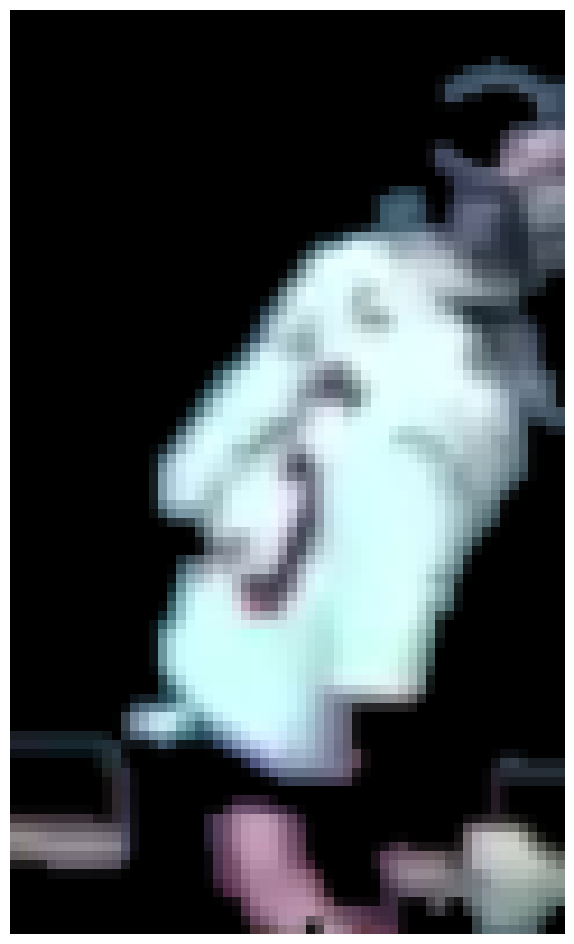

Chicago Bears 0.6244076 0.6000077

0: 384x640 5 Players, 20.2ms
Speed: 7.1ms preprocess, 20.2ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)
(159, 79)
(100, 60)

0: 384x640 6 Players, 17.6ms
Speed: 2.4ms preprocess, 17.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(136, 76)
(100, 60)

0: 384x640 7 Players, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(128, 79)
(100, 60)


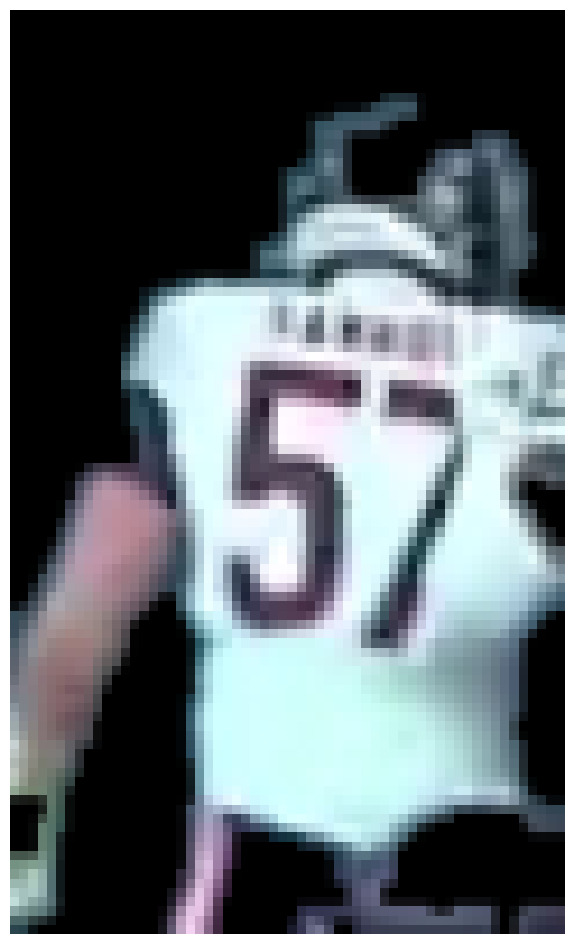

Chicago Bears 0.6518671 0.62141377

0: 384x640 7 Players, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(250, 67)
(100, 60)

0: 384x640 8 Players, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(86, 48)
(100, 60)

0: 384x640 8 Players, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(253, 64)
(100, 60)

0: 384x640 8 Players, 15.2ms
Speed: 2.5ms preprocess, 15.2ms inference, 5.9ms postprocess per image at shape (1, 3, 384, 640)
(252, 59)
(100, 60)

0: 384x640 7 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(251, 64)
(100, 60)

0: 384x640 7 Players, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at 

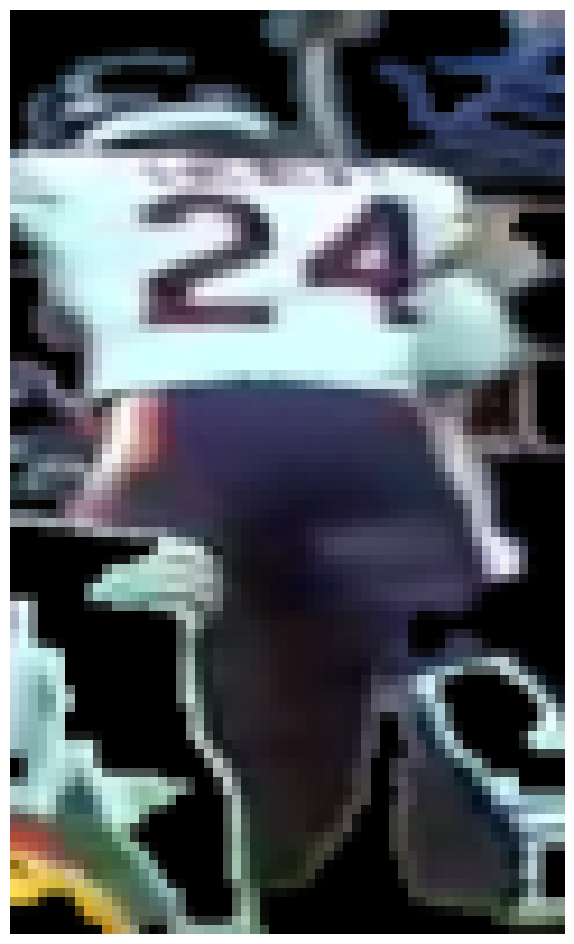

Green Bay Packers 0.7818083 0.82605225
(105, 48)
(100, 60)

0: 384x640 7 Players, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 18.5ms
Speed: 3.7ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 14.1ms
Speed: 2.4ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 17.0ms
Speed: 2.5ms preprocess, 17.0ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 15.7ms
Speed: 2.7ms preproces

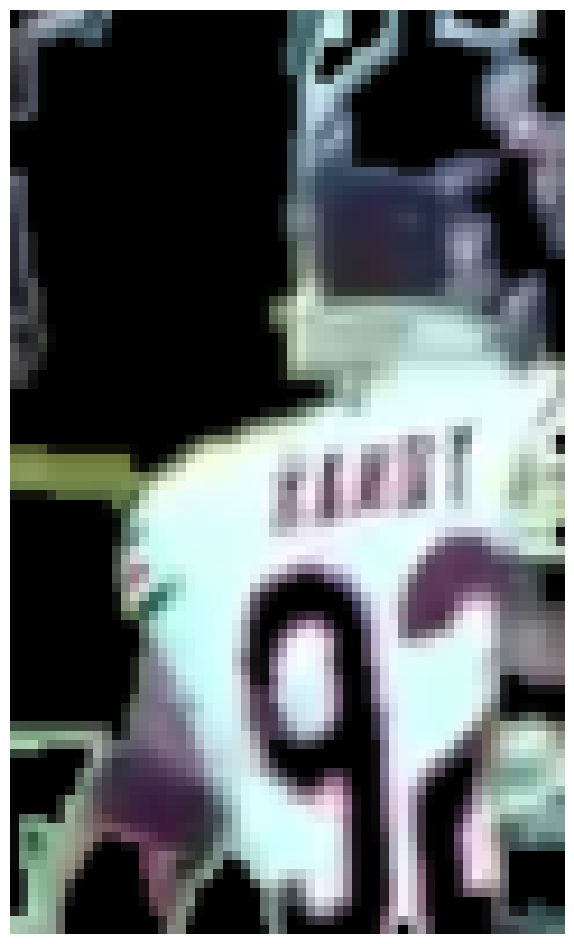

Chicago Bears 0.80369216 0.7358752

0: 384x640 2 Players, 23.6ms
Speed: 2.7ms preprocess, 23.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.9ms
Speed: 3.3ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.6ms

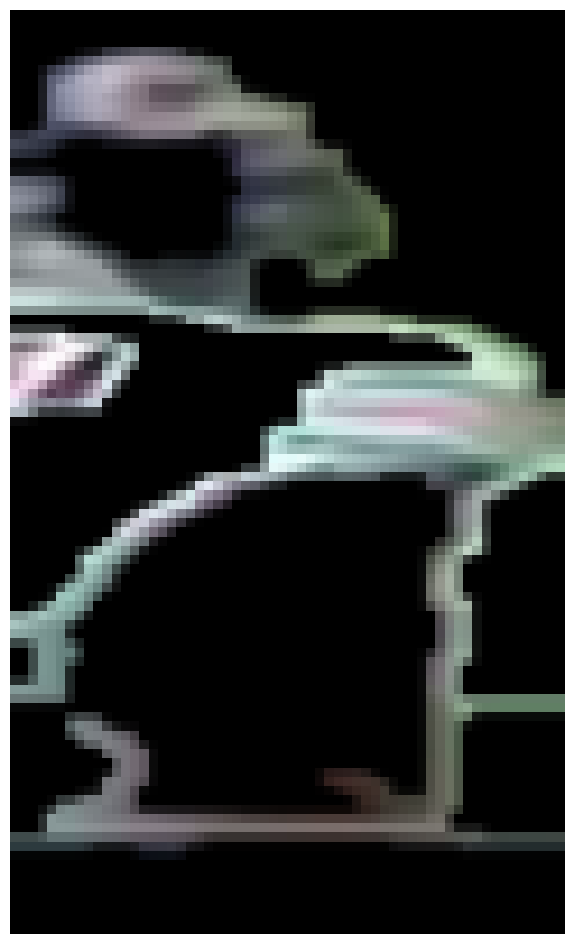

Chicago Bears 0.8074971 0.7678802

0: 384x640 5 Players, 17.0ms
Speed: 2.6ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 15.3ms
Speed: 2.6ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(206, 80)
(100, 60)

0: 384x640 5 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(212, 83)
(100, 60)

0: 384x640 3 Players, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(203, 76)
(100, 60)

0: 384x640 4 Players, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(208, 79)
(100, 6

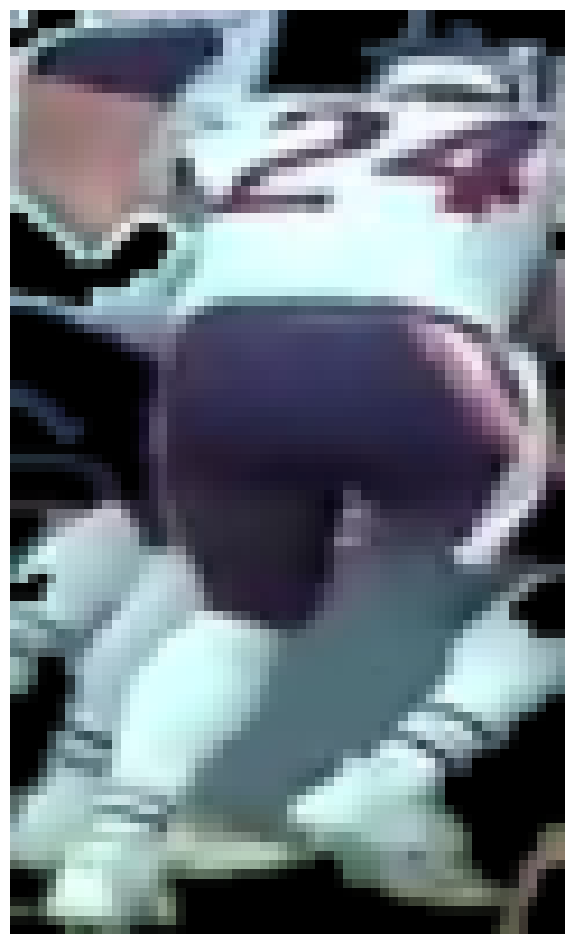

Green Bay Packers 0.73540306 0.7610423

0: 384x640 5 Players, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 17.4ms
Speed: 2.5ms preprocess, 17.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 19.6ms
Speed: 2.3ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 16.7ms
Speed: 2.5ms preprocess, 16.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference,

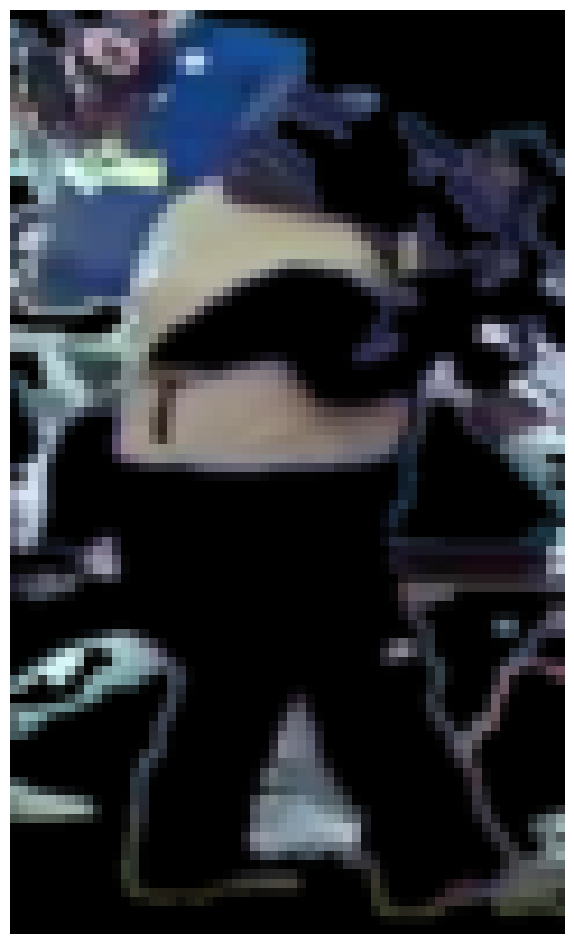

Green Bay Packers 0.6976293 0.78155

0: 384x640 6 Players, 28.0ms
Speed: 7.1ms preprocess, 28.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 15.5ms
Speed: 2.5ms preprocess, 15.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 14.9ms
Speed: 2.6ms preprocess, 14.9ms inference, 1.

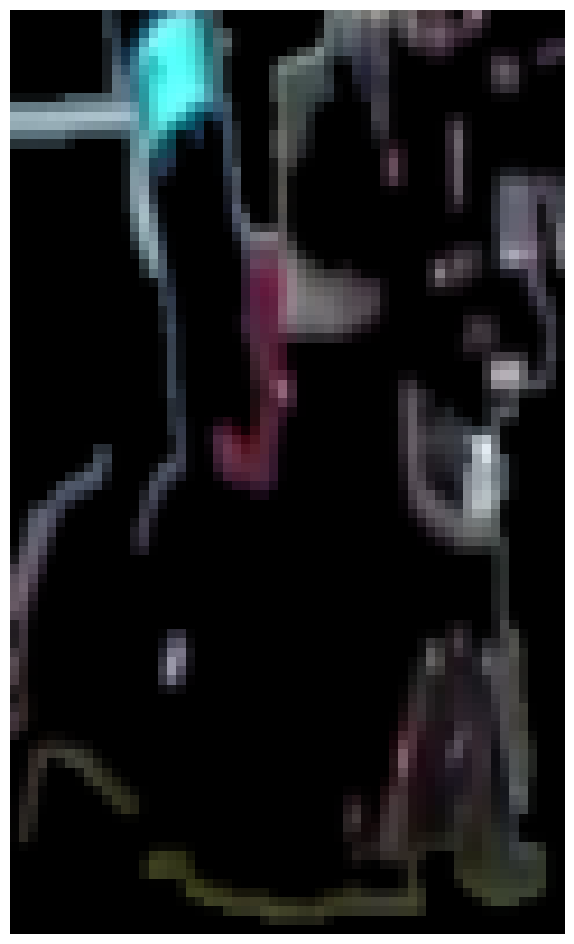

Green Bay Packers 0.7450456 0.7827418

0: 384x640 5 Players, 19.5ms
Speed: 2.5ms preprocess, 19.5ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)
(432, 132)
(100, 60)

0: 384x640 4 Players, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 22.4ms
Speed: 2.4ms preprocess, 22.4ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 16.5ms
Speed: 2.4ms preprocess, 16.5ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.2ms
Speed: 3.3ms preproces

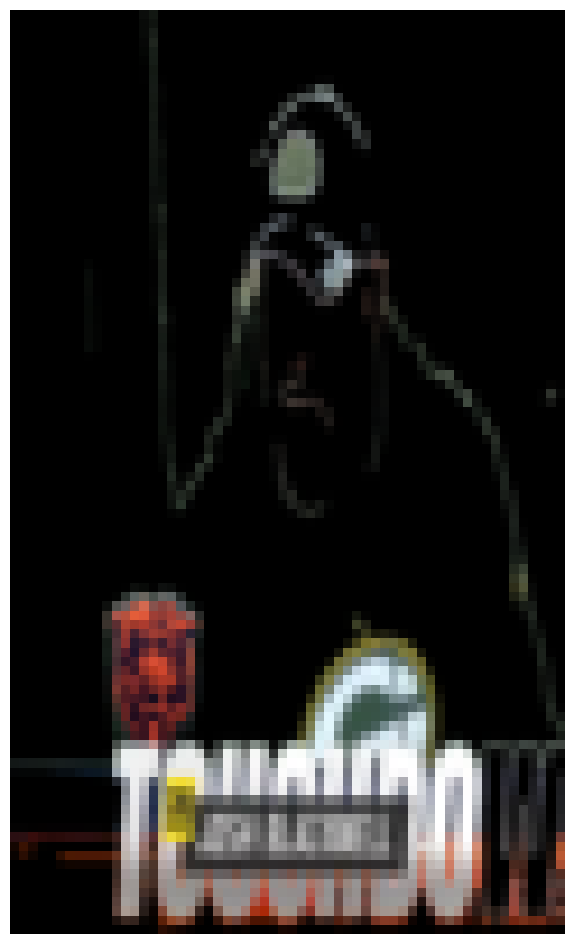

Chicago Bears 0.8153797 0.72435254

0: 384x640 1 Player, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 16.6ms
Speed: 3.7ms preprocess, 16.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 19.4ms
Speed: 3.0ms preprocess, 19.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.5ms postp

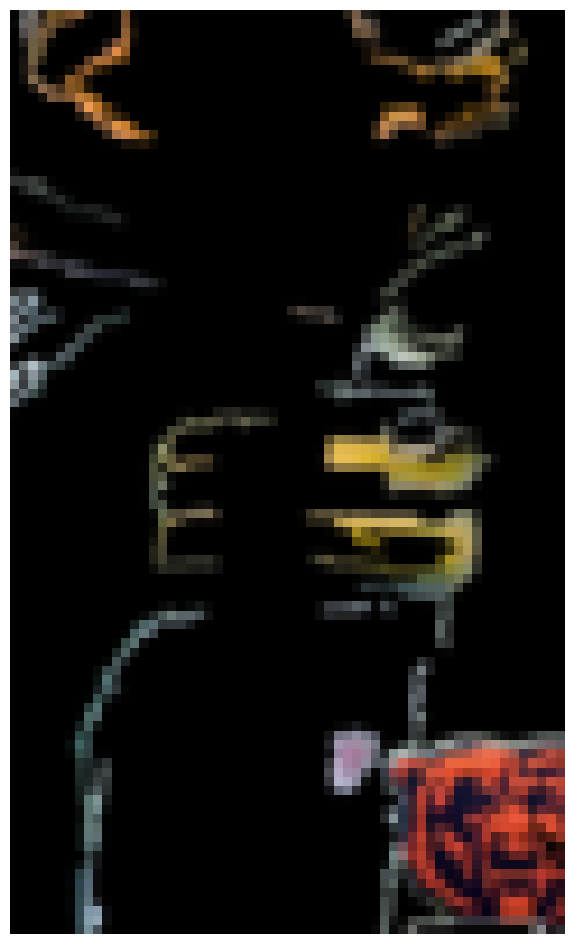

Green Bay Packers 0.7532787 0.81700987

0: 384x640 2 Players, 29.7ms
Speed: 2.5ms preprocess, 29.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 22.2ms
Speed: 2.6ms preprocess, 22.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 22.1ms
Speed: 2.5ms preprocess, 22.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 21.9ms
Speed: 2.5ms preprocess, 21.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference,

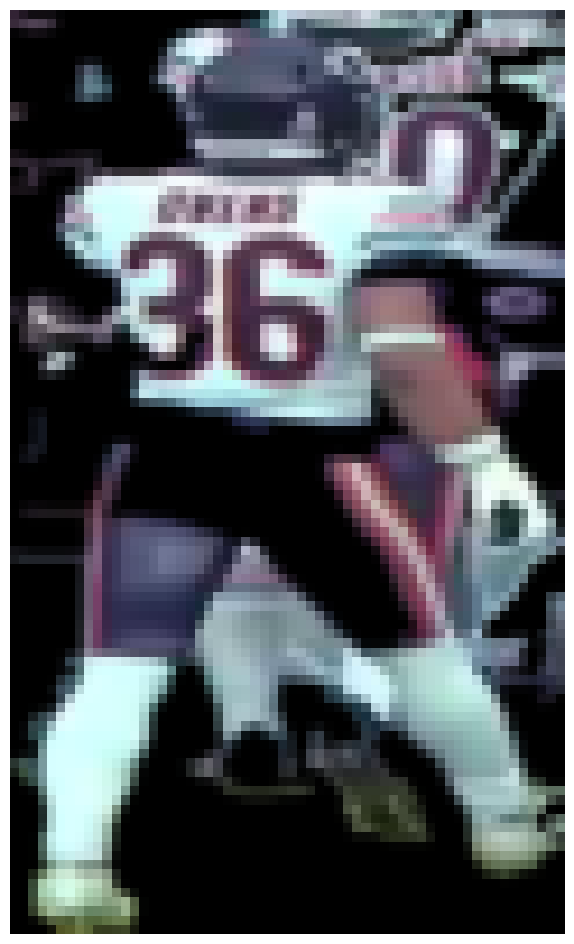

Green Bay Packers 0.75275856 0.7780637
(361, 105)
(100, 60)


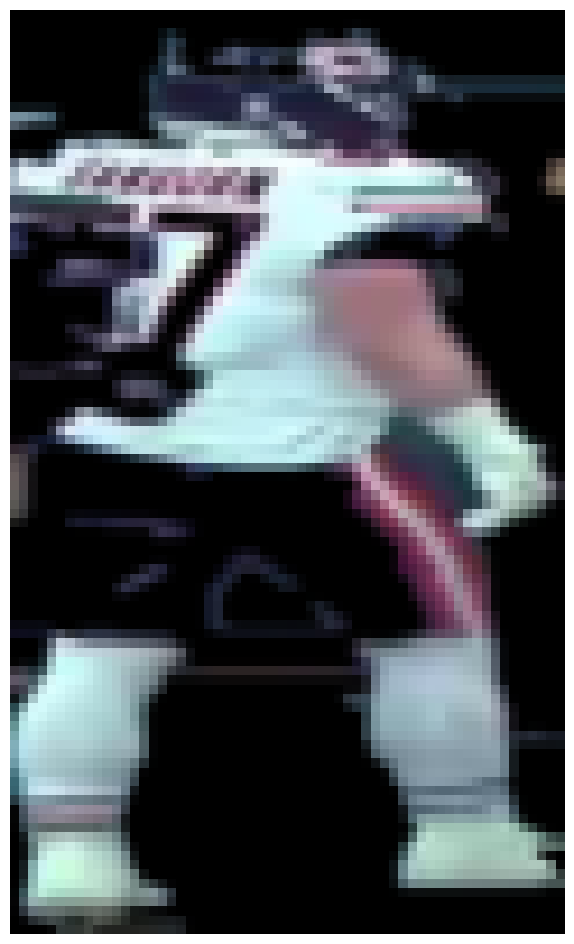

Green Bay Packers 0.69294745 0.7206575
(402, 107)
(100, 60)


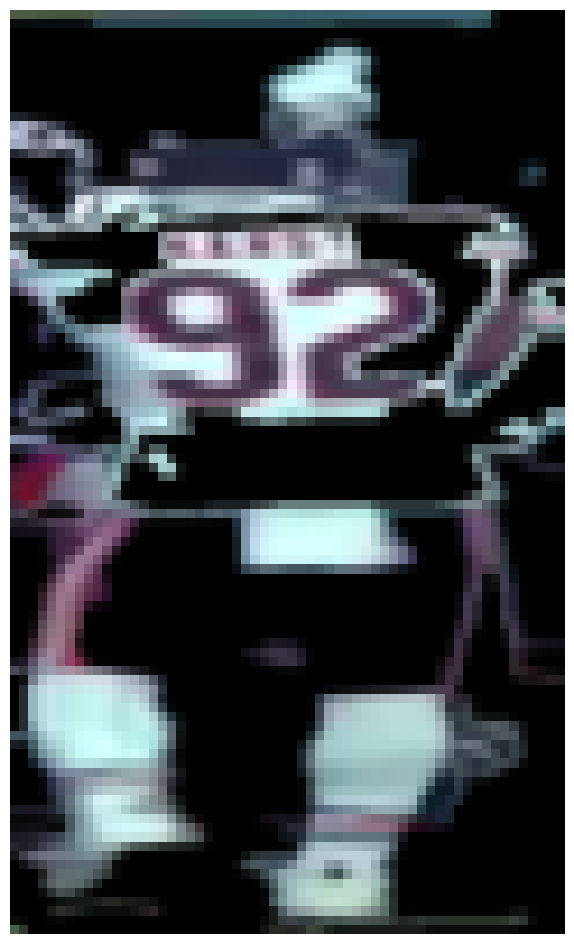

Green Bay Packers 0.68399495 0.7256052

0: 384x640 6 Players, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(264, 74)
(100, 60)


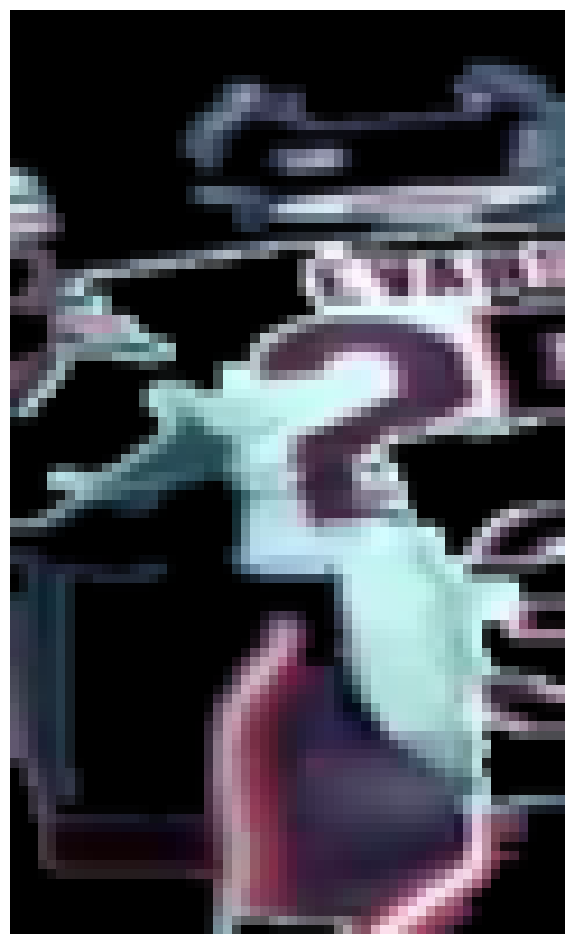

Green Bay Packers 0.7212045 0.7543001

0: 384x640 6 Players, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(337, 111)
(100, 60)


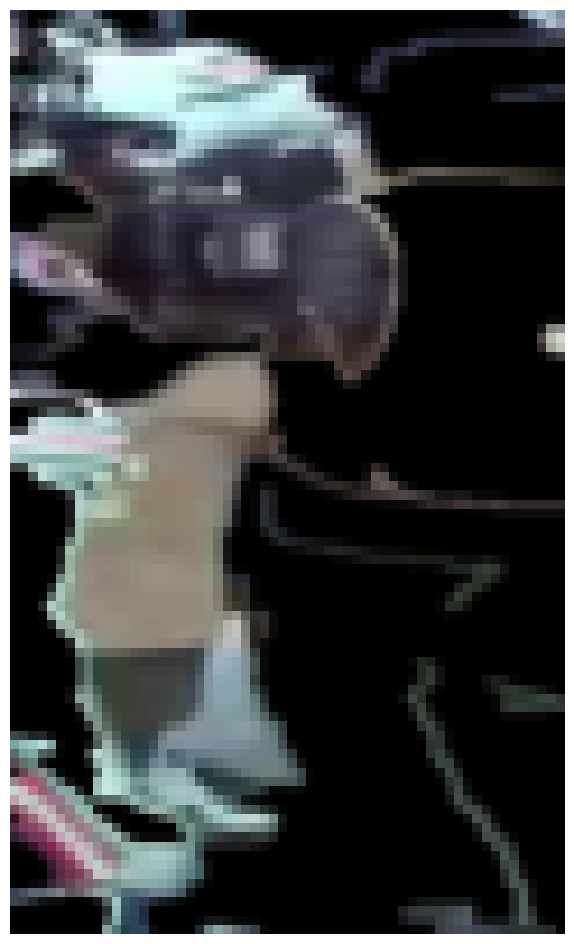

Green Bay Packers 0.775208 0.796757

0: 384x640 5 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 16.7ms
Speed: 2.5ms preprocess, 16.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 14.9ms
Speed: 2.7ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(341, 103)
(100, 60)


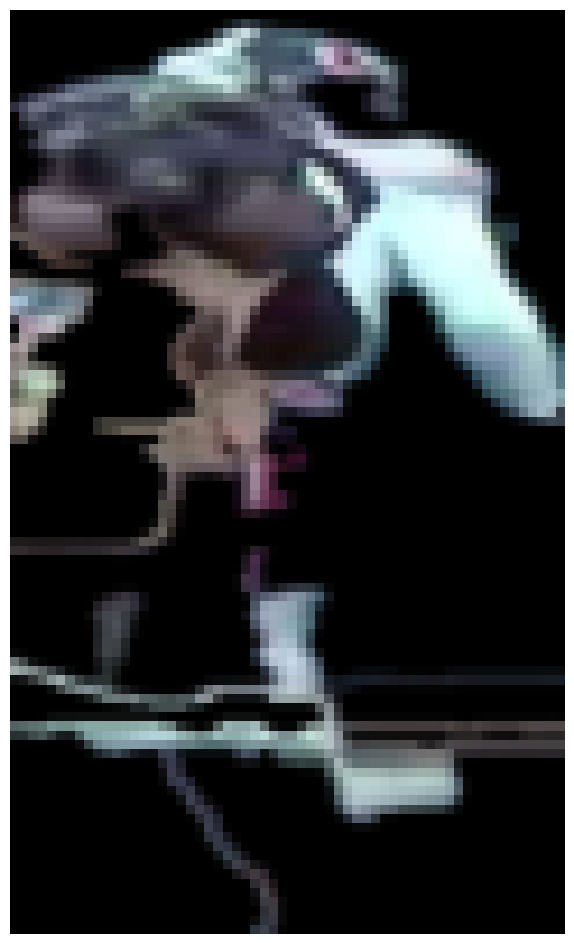

Green Bay Packers 0.7589193 0.7956283

0: 384x640 5 Players, 15.0ms
Speed: 2.6ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Players, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(403, 101)
(100, 60)


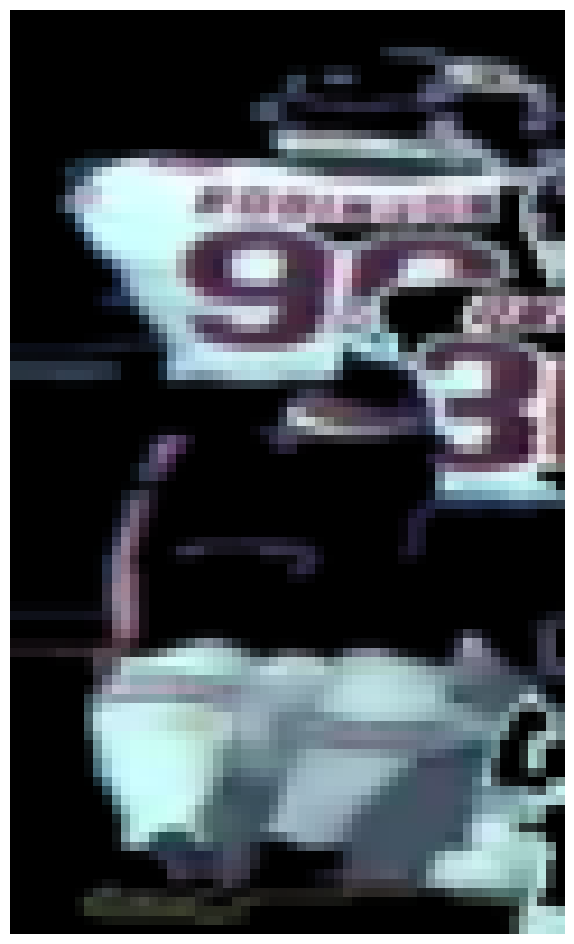

Green Bay Packers 0.7001927 0.7298908

0: 384x640 6 Players, 22.0ms
Speed: 4.8ms preprocess, 22.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 19.0ms
Speed: 3.5ms preprocess, 19.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 25.9ms
Speed: 4.1ms preprocess, 25.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 

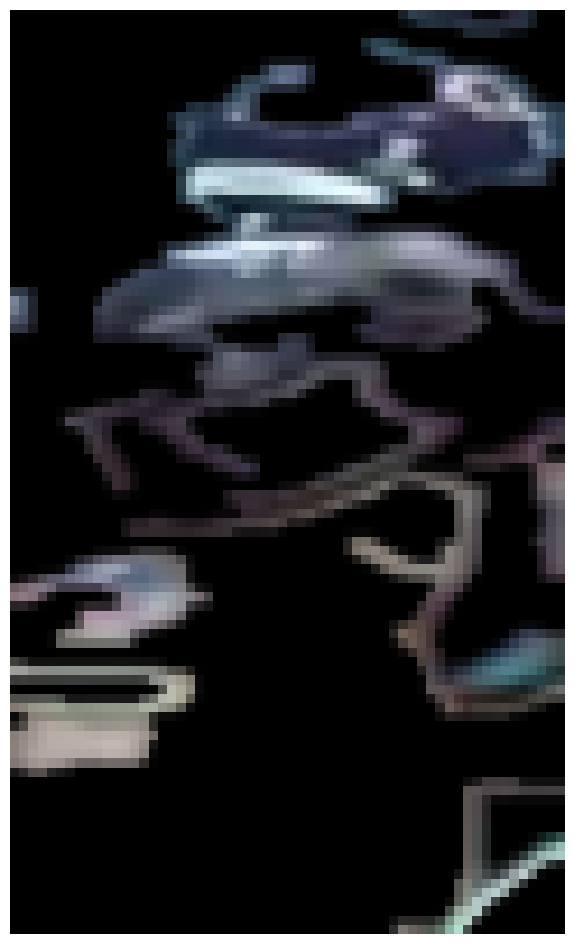

Green Bay Packers 0.70548856 0.7626569

0: 384x640 6 Players, 13.7ms
Speed: 4.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(340, 94)
(100, 60)


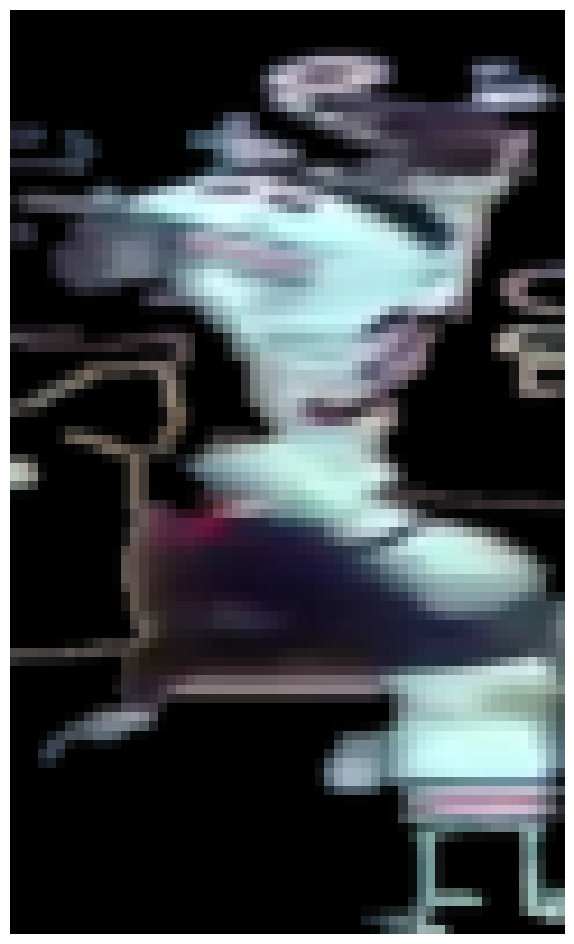

Green Bay Packers 0.7532016 0.78444386
(119, 66)
(100, 60)


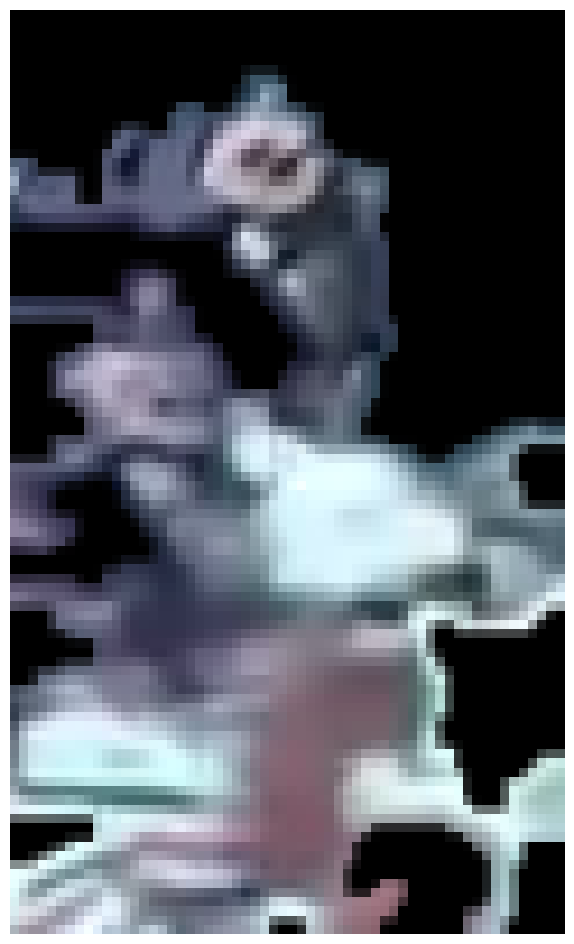

Green Bay Packers 0.6647681 0.70539826

0: 384x640 6 Players, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(371, 95)
(100, 60)


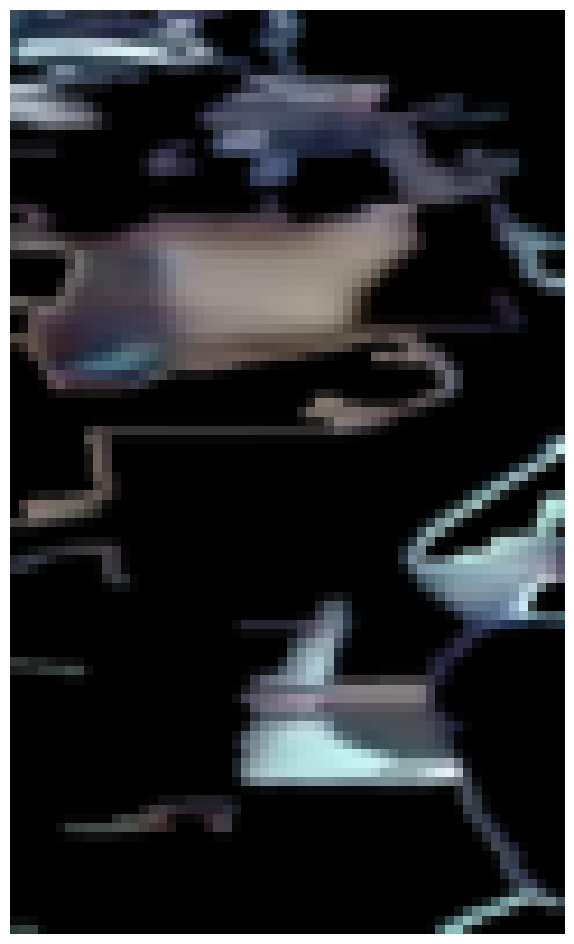

Green Bay Packers 0.74696076 0.8027587

0: 384x640 8 Players, 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 15.1ms
Speed: 2.4ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 16.6ms
Speed: 2.5ms preprocess, 16.6ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference,

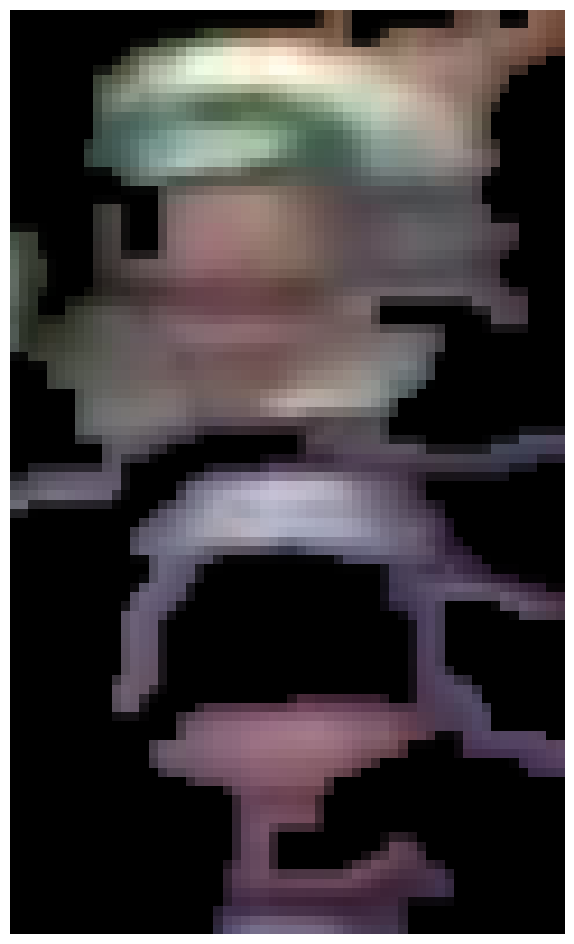

Chicago Bears 0.8057027 0.7694315

0: 384x640 9 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(340, 139)
(100, 60)

0: 384x640 8 Players, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(159, 94)
(100, 60)

0: 384x640 10 Players, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(343, 111)
(100, 60)
(318, 87)
(100, 60)

0: 384x640 10 Players, 19.1ms
Speed: 4.0ms preprocess, 19.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(273, 92)
(100, 60)

0: 384x640 9 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image

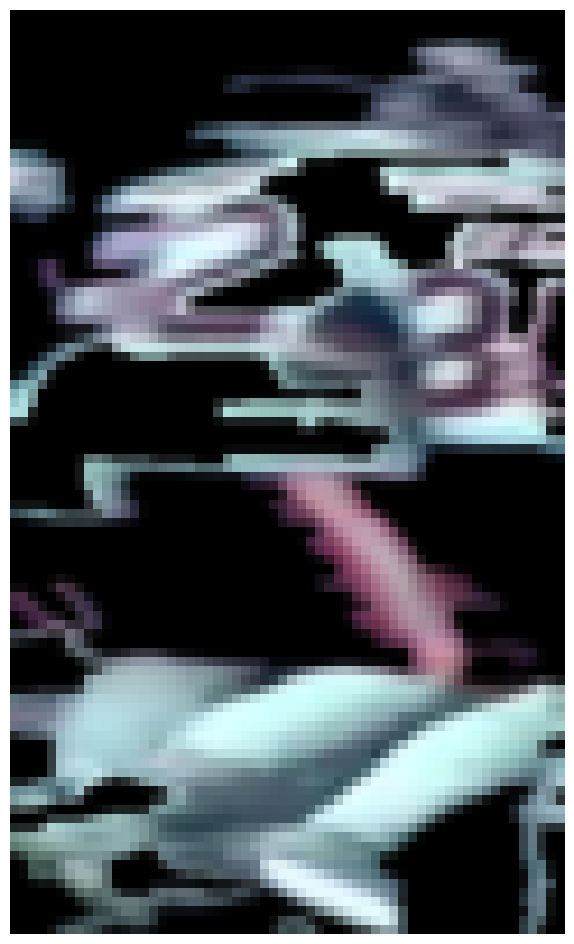

Green Bay Packers 0.61411834 0.6495727
(266, 96)
(100, 60)


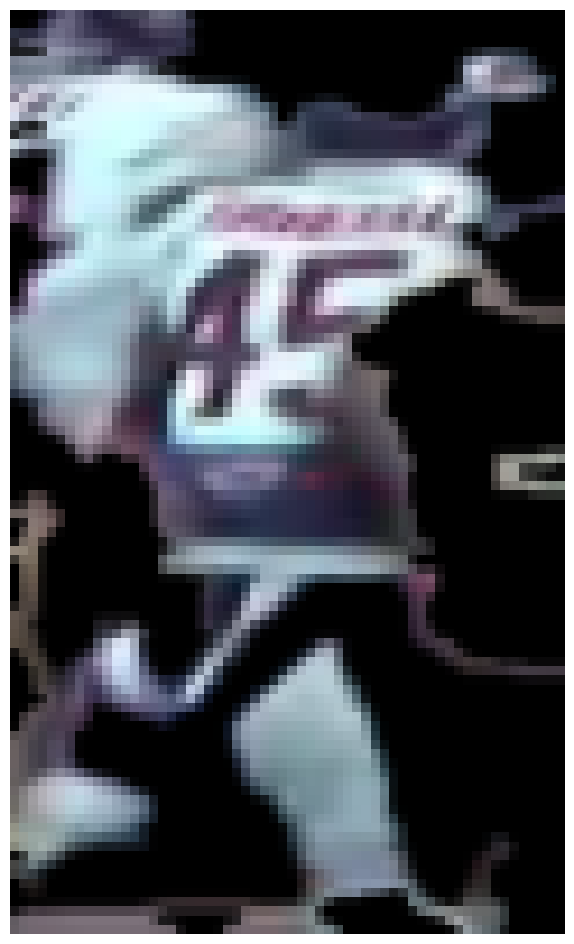

Green Bay Packers 0.6806619 0.70432585

0: 384x640 11 Players, 14.9ms
Speed: 2.6ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(257, 93)
(100, 60)


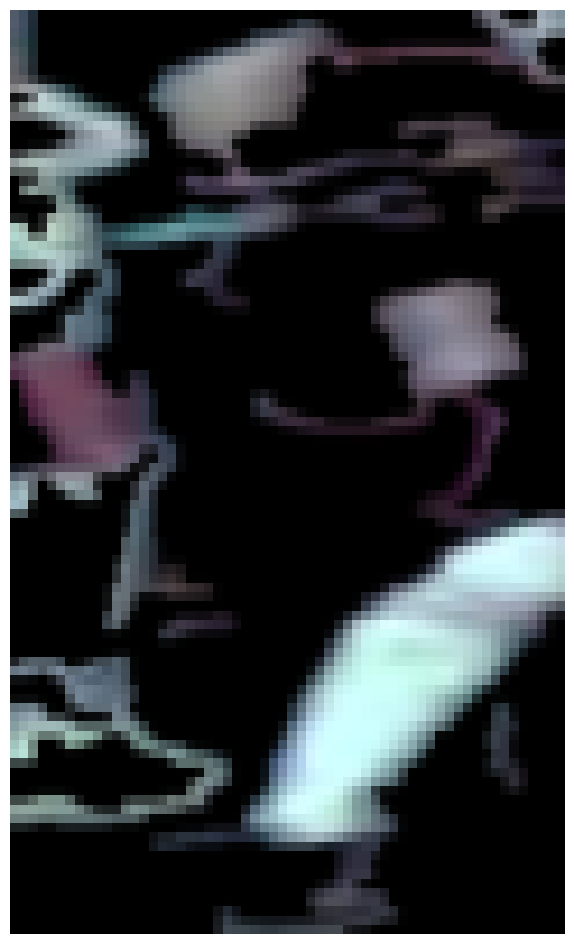

Green Bay Packers 0.706379 0.740916

0: 384x640 11 Players, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(263, 89)
(100, 60)


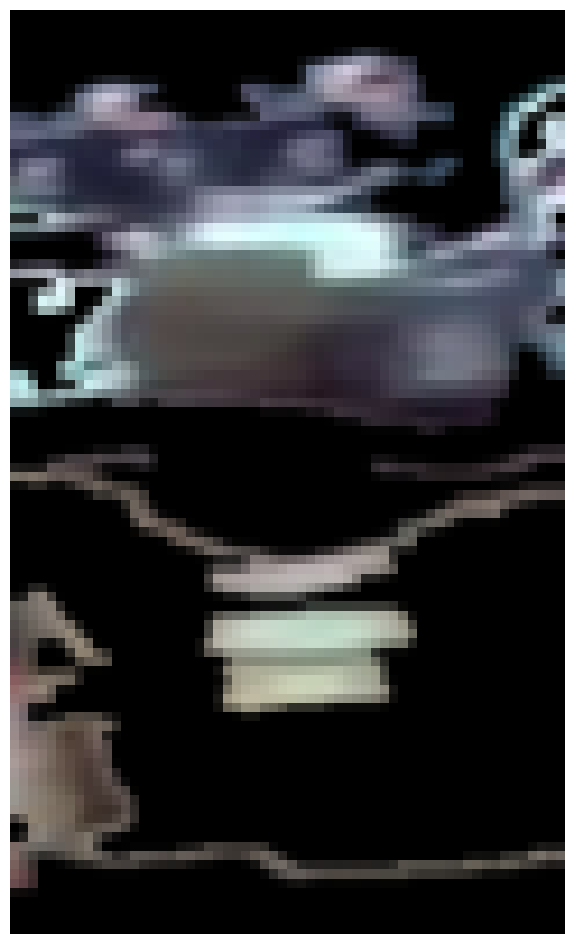

Green Bay Packers 0.7745698 0.7996802

0: 384x640 9 Players, 23.5ms
Speed: 8.6ms preprocess, 23.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 11.8ms
Speed: 3.9ms preprocess, 11.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
(335, 108)
(100, 60)

0: 384x640 10 Players, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 12.1ms
Speed: 4.0ms preproce

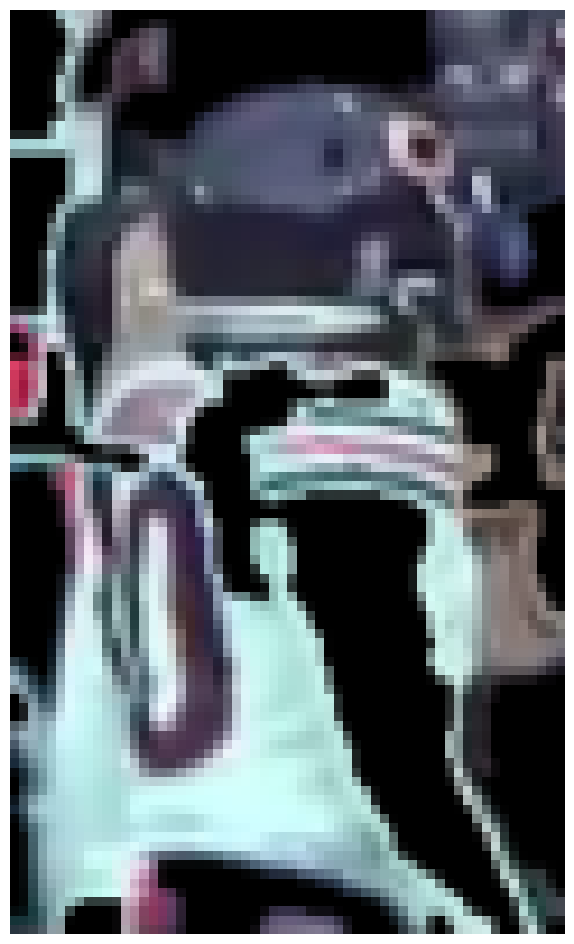

Green Bay Packers 0.75597906 0.78598595

0: 384x640 7 Players, 27.4ms
Speed: 7.6ms preprocess, 27.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(129, 81)
(100, 60)
(208, 106)
(100, 60)

0: 384x640 8 Players, 18.3ms
Speed: 2.6ms preprocess, 18.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(203, 106)
(100, 60)
(125, 72)
(100, 60)


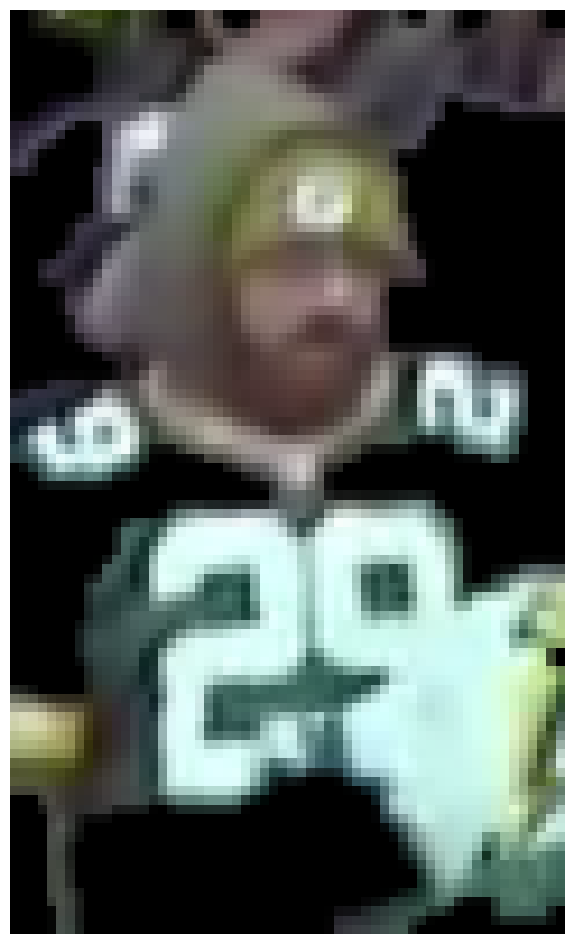

Chicago Bears 0.8452545 0.81810147

0: 384x640 9 Players, 22.5ms
Speed: 2.6ms preprocess, 22.5ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 14.5ms
Speed: 2.4ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 18.7ms
Speed: 2.6ms preprocess, 18.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(206, 104)
(100, 60)

0: 384x640 7 Players, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(132, 81)
(100, 60)
(208, 101)
(100, 60)

0: 384x640 7 Players, 17.2ms
Speed: 2.5ms preprocess, 17.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 

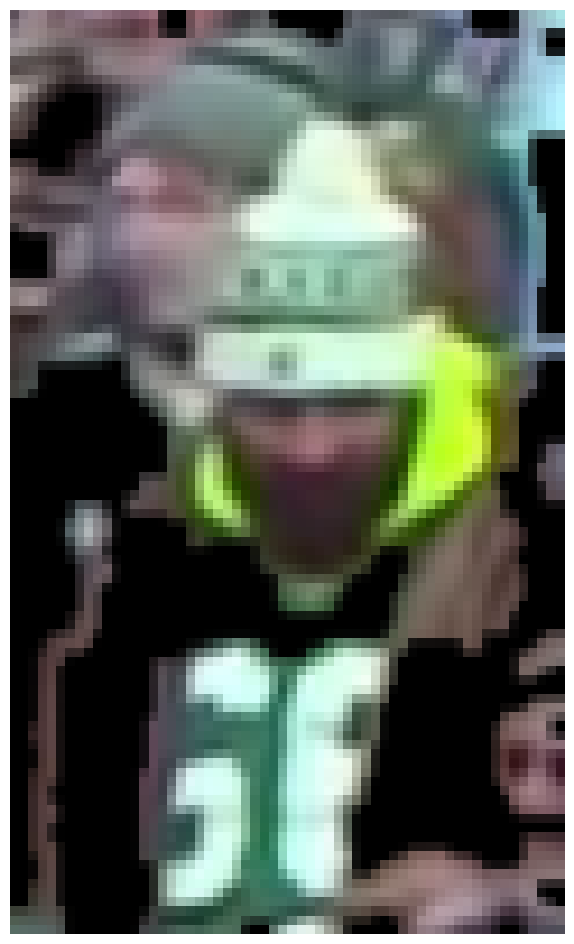

Chicago Bears 0.89671296 0.8715078

0: 384x640 6 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 Players, 18.3ms
Speed: 2.4ms preprocess, 18.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 Players, 22.4ms
Speed: 3.5ms preprocess, 22.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(95, 54)
(100, 60)
(121, 49)
(100, 60)


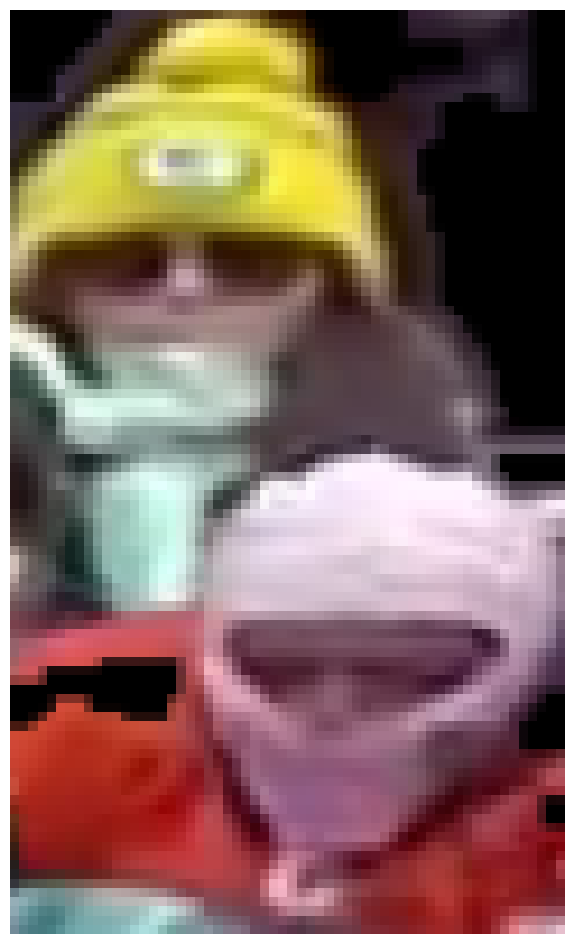

Chicago Bears 0.76341975 0.7083843

0: 384x640 10 Players, 25.9ms
Speed: 3.6ms preprocess, 25.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(142, 58)
(100, 60)


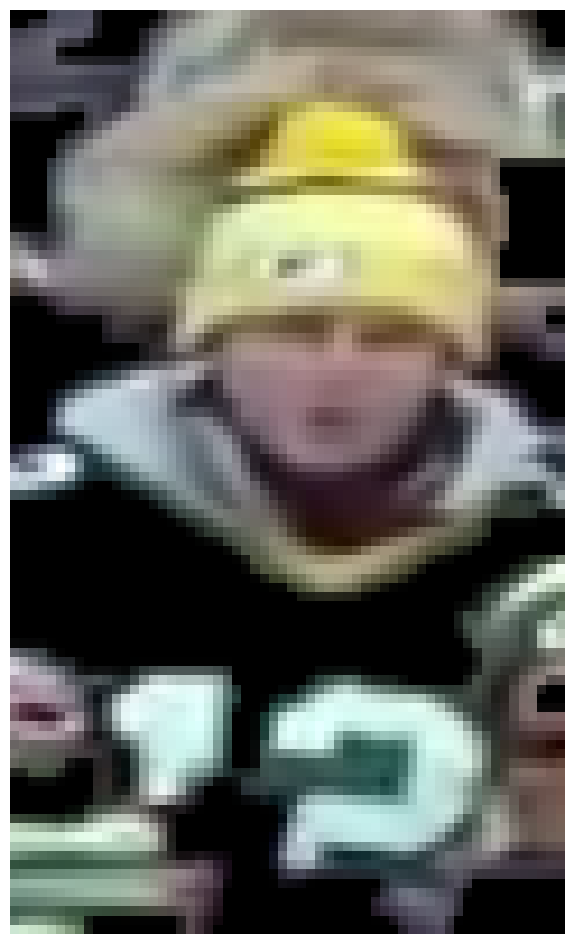

Chicago Bears 0.8584359 0.82537293
(110, 53)
(100, 60)


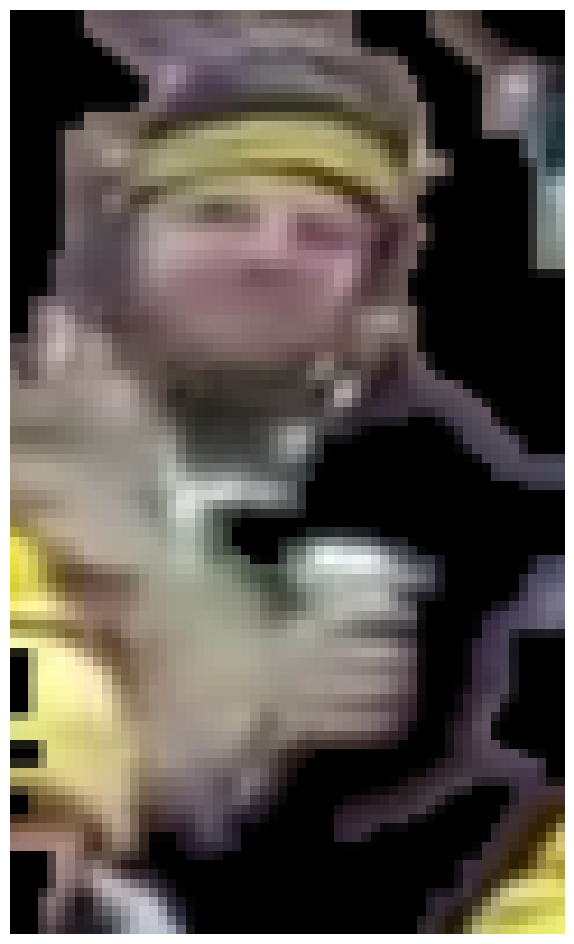

Chicago Bears 0.7746205 0.72917753
(206, 137)
(100, 60)

0: 384x640 6 Players, 18.2ms
Speed: 10.1ms preprocess, 18.2ms inference, 7.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 21.0ms
Speed: 2.5ms preprocess, 21.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 Players, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Players, 13.0ms
Speed: 3.3ms preprocess, 13.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(202, 83)
(100, 60)


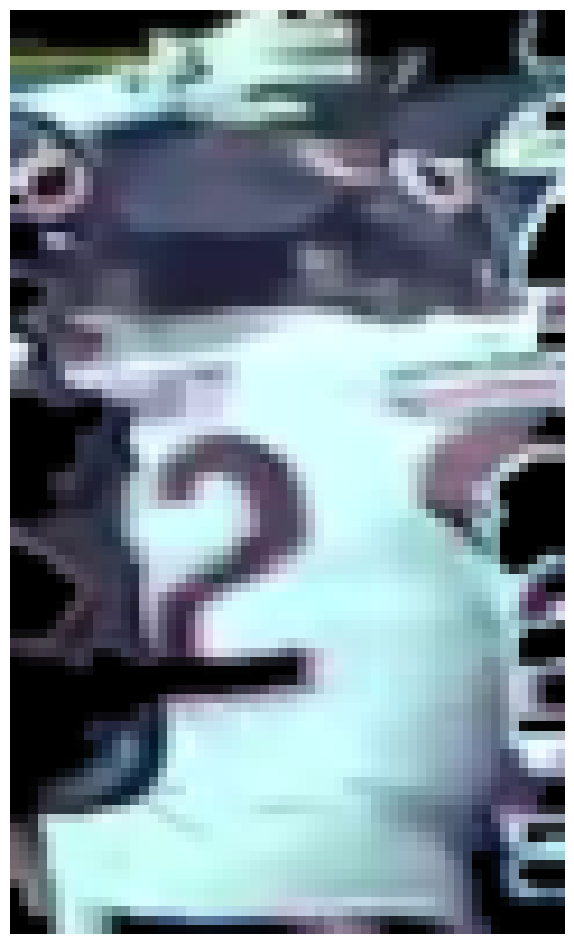

Green Bay Packers 0.6399398 0.6718328

0: 384x640 3 Players, 22.1ms
Speed: 4.1ms preprocess, 22.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 15.2ms
Speed: 2.4ms preprocess, 15.2ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 13.0ms
Speed: 2.2ms preprocess, 13.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms infere

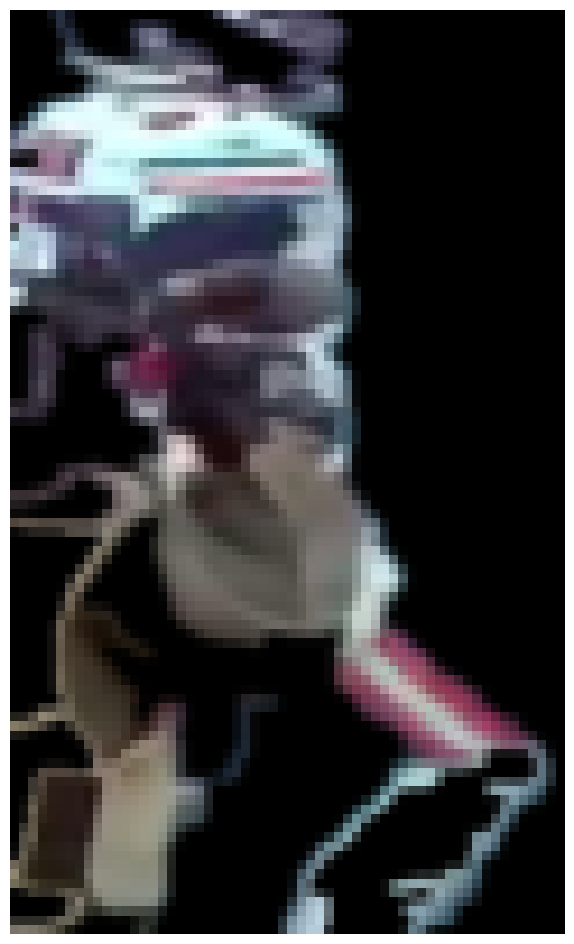

Green Bay Packers 0.8124981 0.83874303

0: 384x640 4 Players, 25.2ms
Speed: 4.5ms preprocess, 25.2ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)
(316, 114)
(100, 60)

0: 384x640 4 Players, 16.2ms
Speed: 5.8ms preprocess, 16.2ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)
(319, 115)
(100, 60)


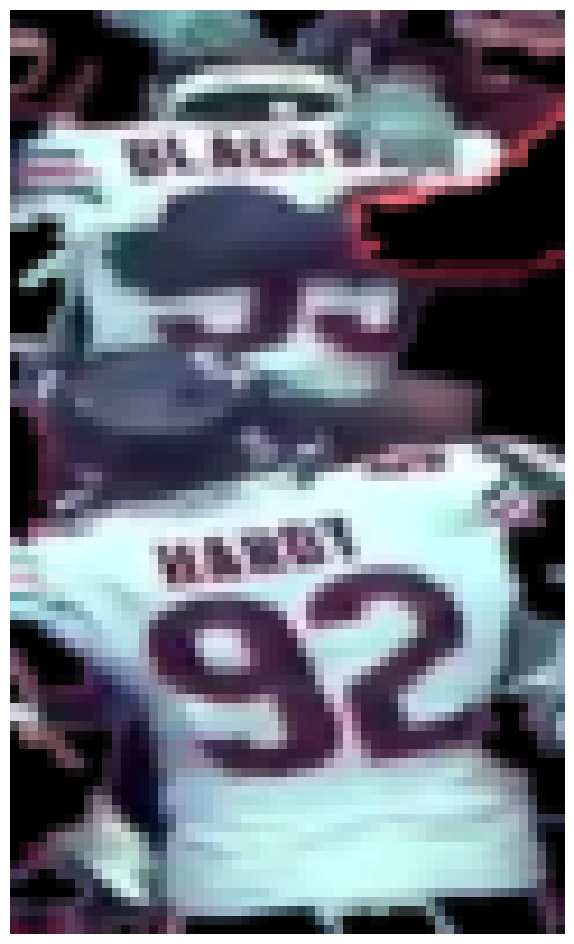

Green Bay Packers 0.7201808 0.74203587

0: 384x640 4 Players, 25.3ms
Speed: 2.5ms preprocess, 25.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Players, 21.2ms
Speed: 2.6ms preprocess, 21.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
0.0
(512, 410)
(100, 60)


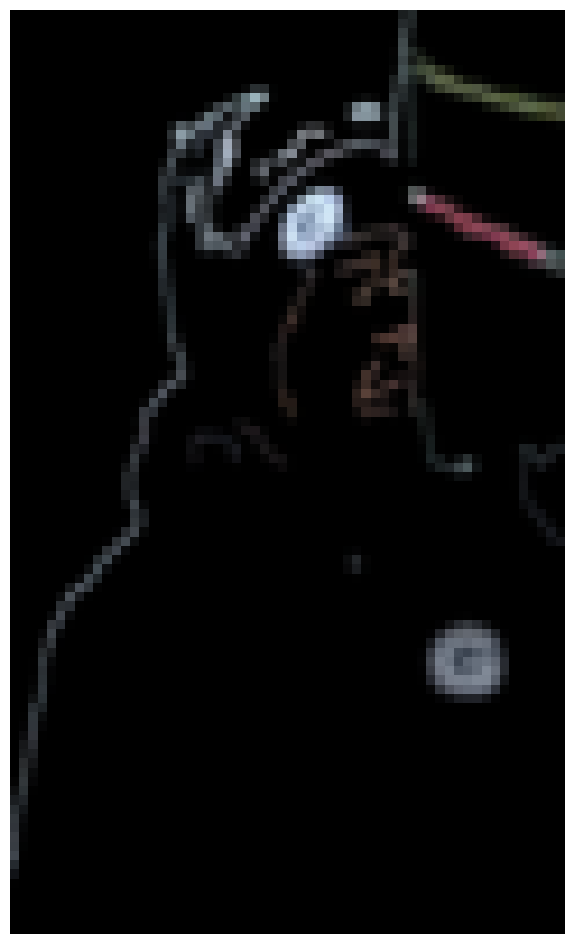

Green Bay Packers 0.562447 0.6317725
0.0
(719, 205)
(100, 60)


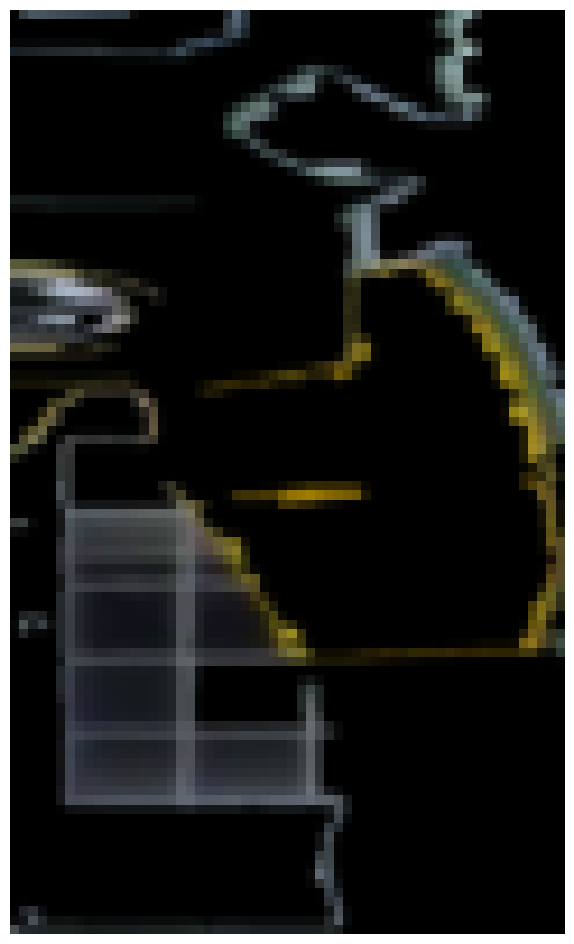

Green Bay Packers 0.61652225 0.7277815
0.0

0: 384x640 2 Players, 25.2ms
Speed: 2.6ms preprocess, 25.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(510, 408)
(100, 60)


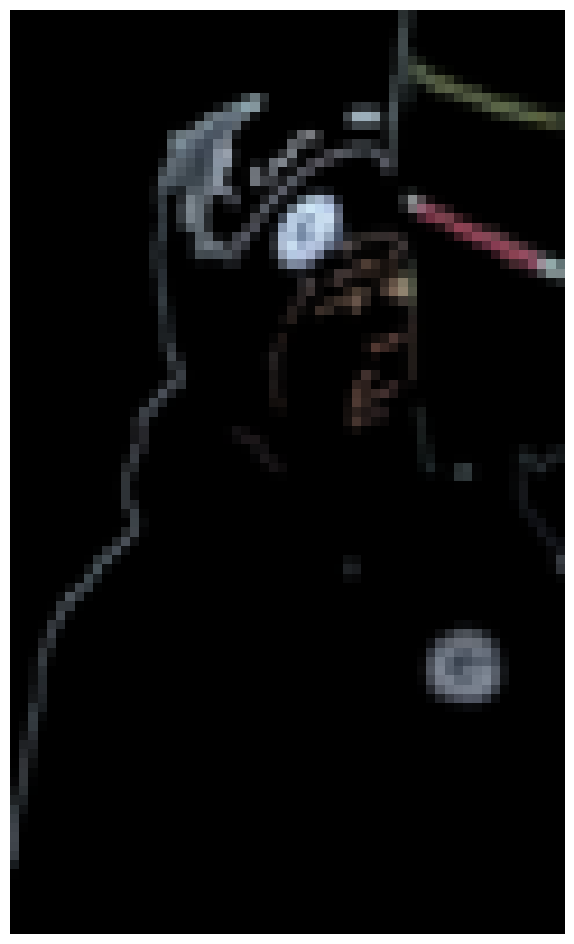

Green Bay Packers 0.55584997 0.62196326
(720, 224)
(100, 60)


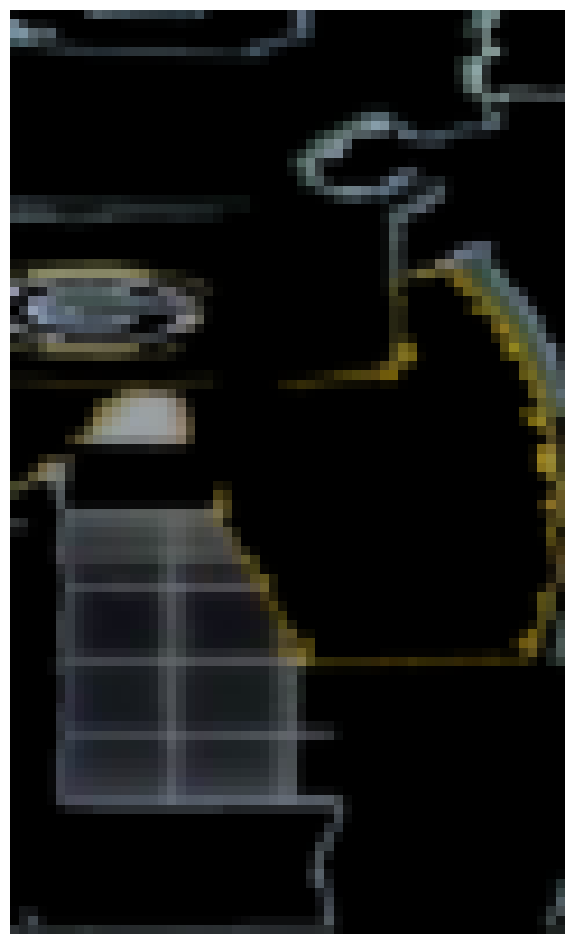

Green Bay Packers 0.6256082 0.7356187

0: 384x640 2 Players, 26.7ms
Speed: 3.0ms preprocess, 26.7ms inference, 8.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 23.5ms
Speed: 2.3ms preprocess, 23.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 20.3ms
Speed: 5.1ms preprocess, 20.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 21.6ms
Speed: 2.5ms preprocess, 21.6ms inference, 7.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 15.2ms
Speed: 3.8ms preprocess, 15.2ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 20.9ms
Speed: 2.4ms preprocess, 20.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 27.2ms
Speed: 2.7ms preprocess, 27.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 17.7ms
Speed: 2.3ms preprocess, 17.7ms inference, 

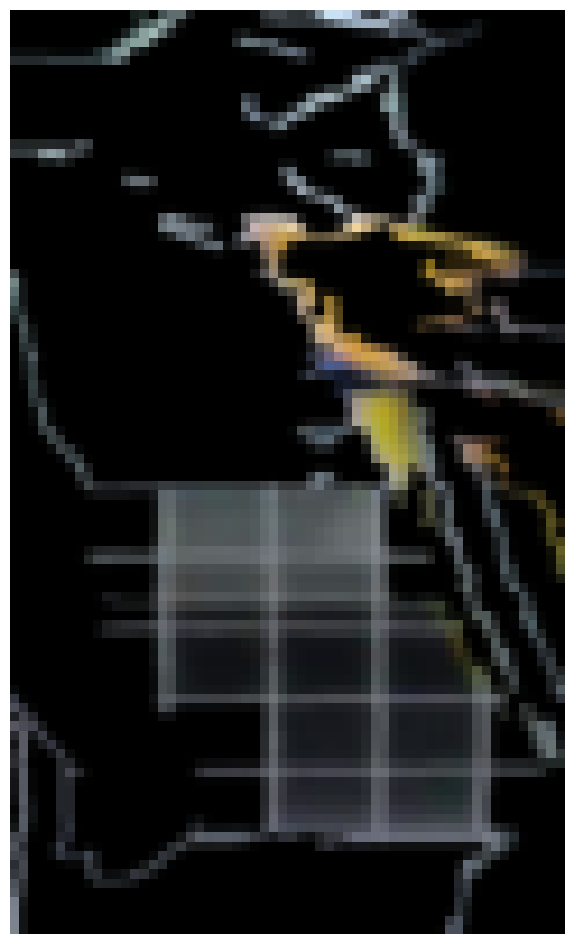

Green Bay Packers 0.6470106 0.7127615

0: 384x640 3 Players, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Players, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.6ms
Speed: 2.3ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 15.3ms
Speed: 2.3ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Player, 12.1ms
Speed: 3.2ms preprocess, 12.1ms inference, 1.5ms 

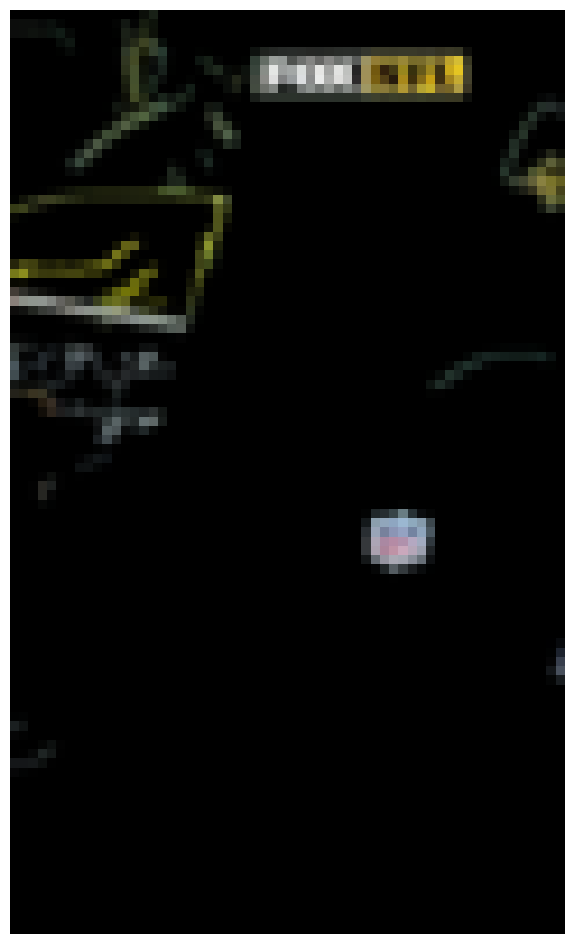

Green Bay Packers 0.6747714 0.7437861

0: 384x640 2 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 27 Players, 1 Referee, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
0.0
(75, 62)
(100, 60)
0.0
(80, 47)
(100, 60)


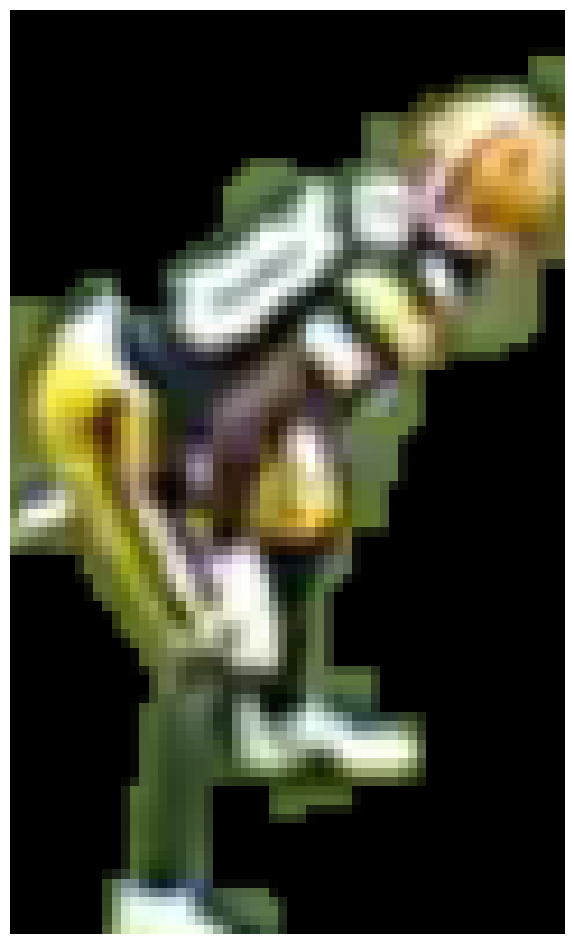

Green Bay Packers 0.68821037 0.7099848
0.0
(84, 41)
(100, 60)


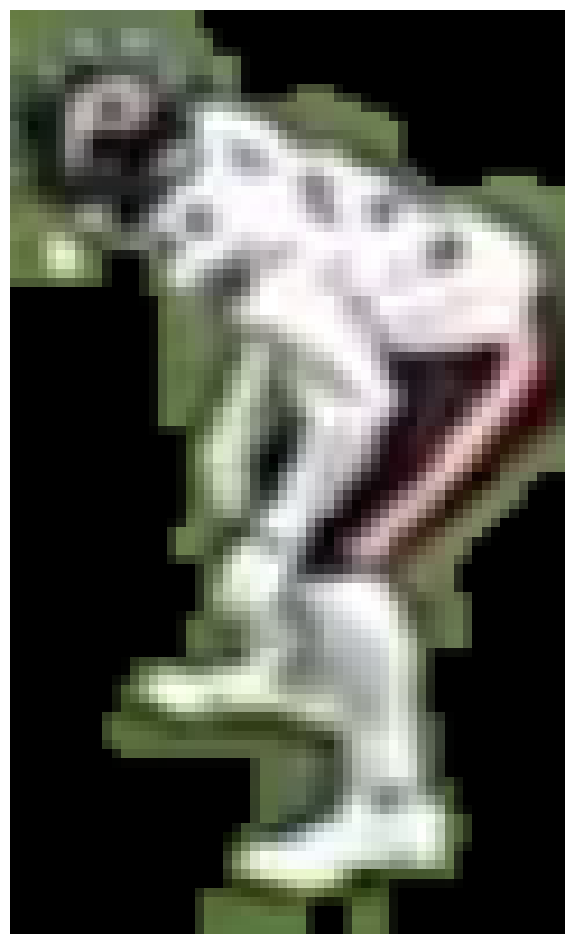

Chicago Bears 0.6605876 0.56588256
0.0
(72, 69)
(100, 60)


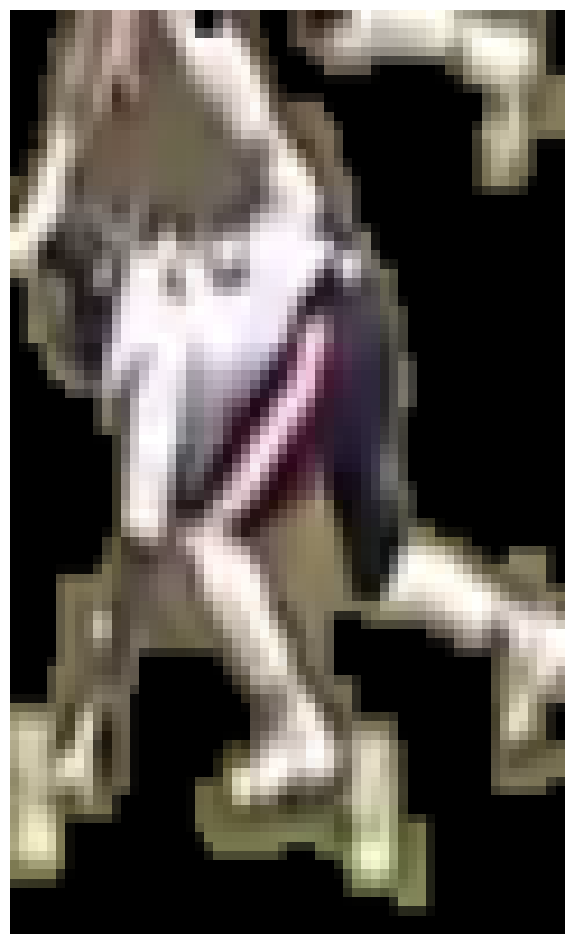

Chicago Bears 0.69335264 0.6257916
0.0
(82, 36)
(100, 60)


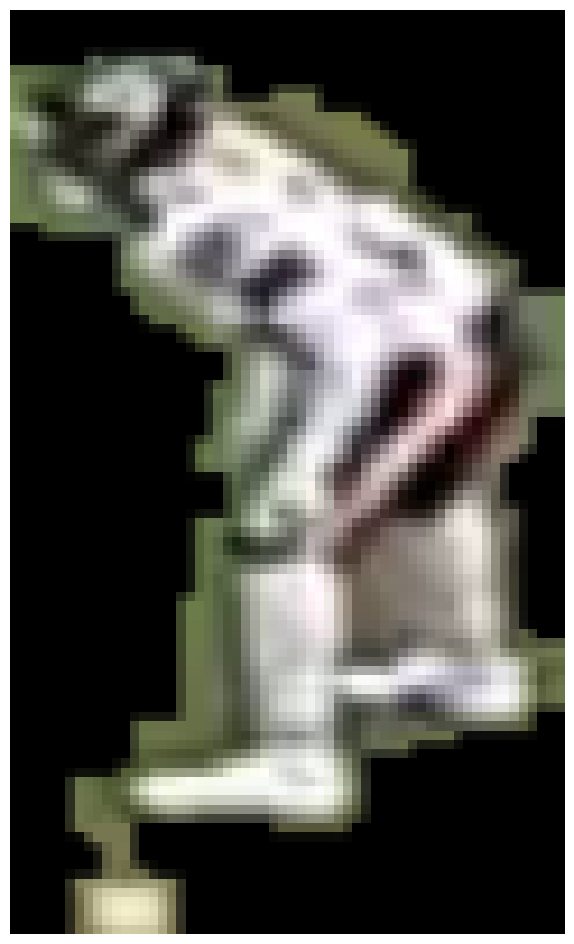

Chicago Bears 0.7245522 0.6090018
0.0
(91, 27)
(100, 60)
0.0
(66, 38)
(100, 60)


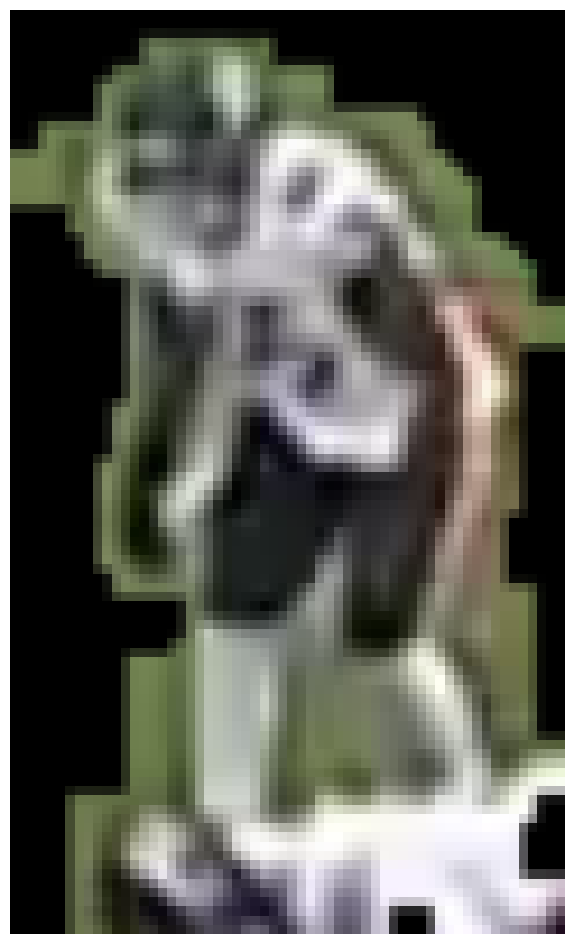

Chicago Bears 0.69796336 0.6234571
0.0
(66, 61)
(100, 60)


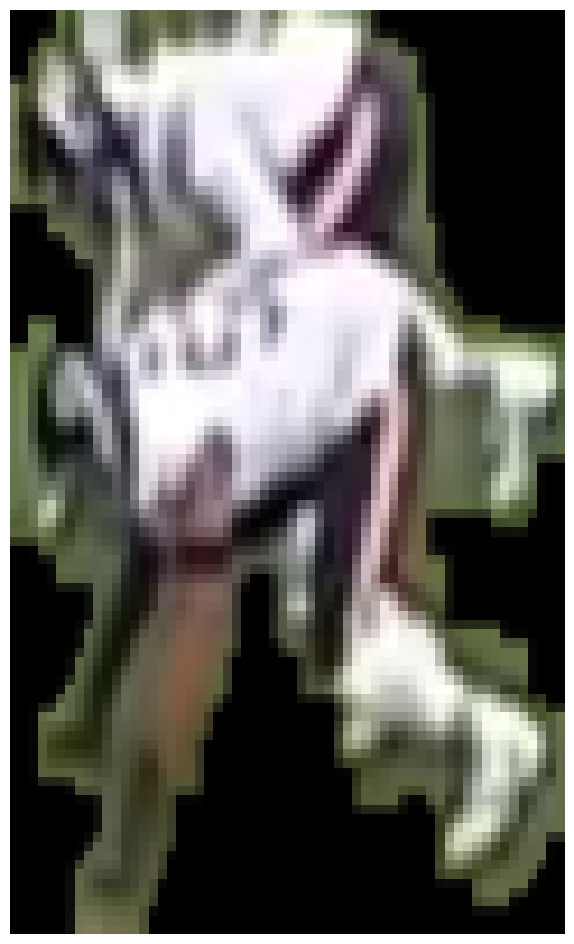

Chicago Bears 0.7188617 0.61213887
0.0
(84, 53)
(100, 60)
1.0
(90, 34)
(100, 60)
0.0
(61, 70)
(100, 60)


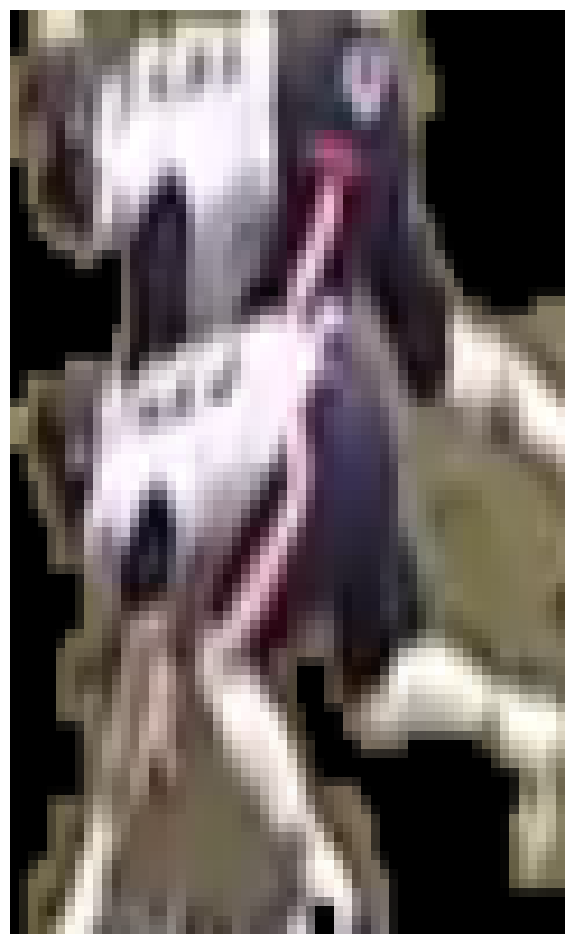

Chicago Bears 0.7727654 0.6772158
0.0
(74, 62)
(100, 60)
0.0
(70, 30)
(100, 60)


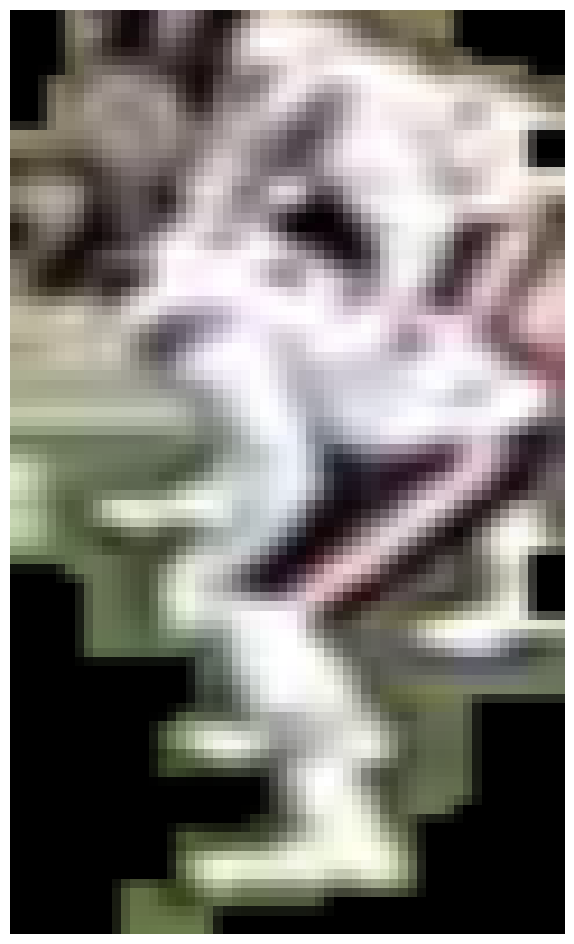

Chicago Bears 0.8198712 0.6496106
0.0
(64, 66)
(100, 60)


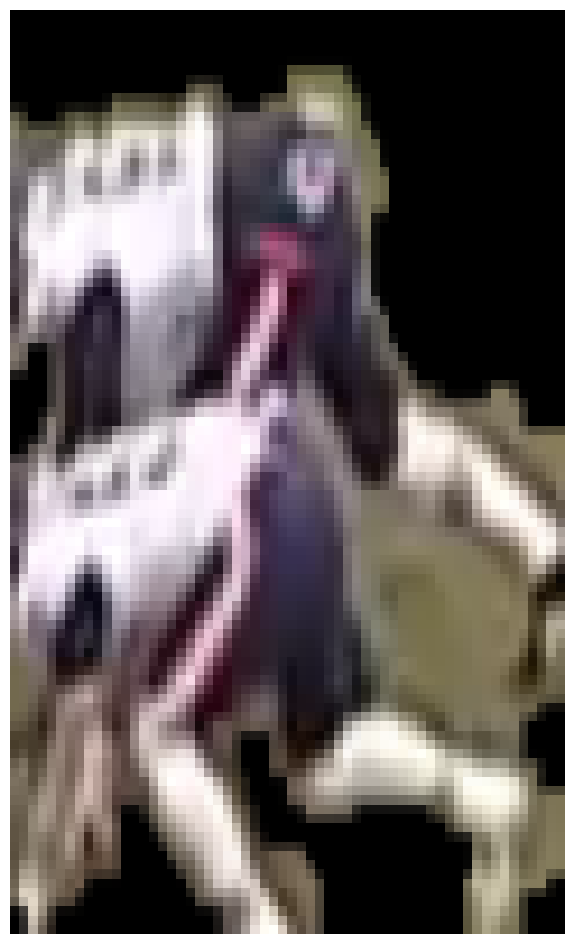

Chicago Bears 0.7681681 0.6628232
0.0
(68, 41)
(100, 60)
0.0
(39, 28)
(100, 60)


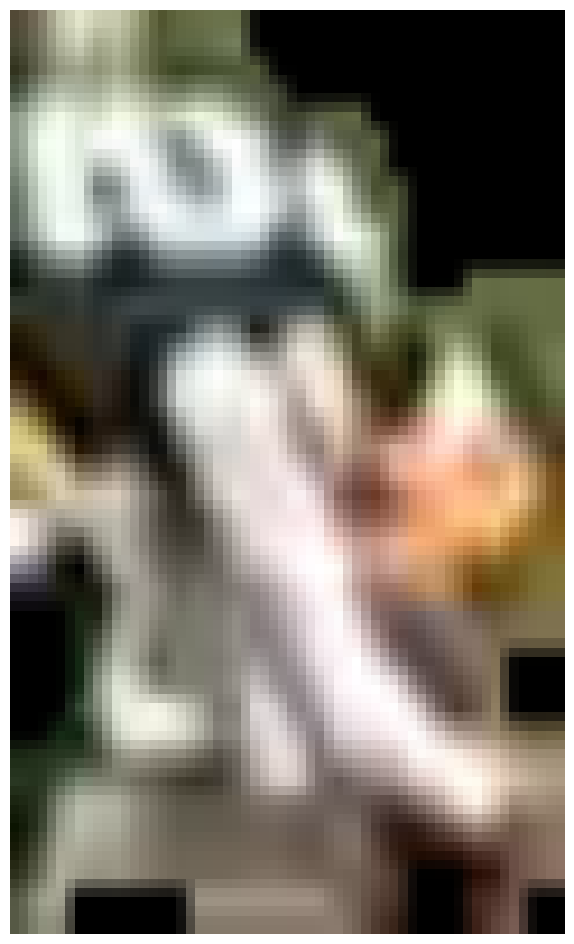

Chicago Bears 0.7972577 0.7230261
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0: 384x640 18 Players, 1 Referee, 25.2ms
Speed: 3.9ms preprocess, 25.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(76, 62)
(100, 60)
(79, 47)
(100, 60)


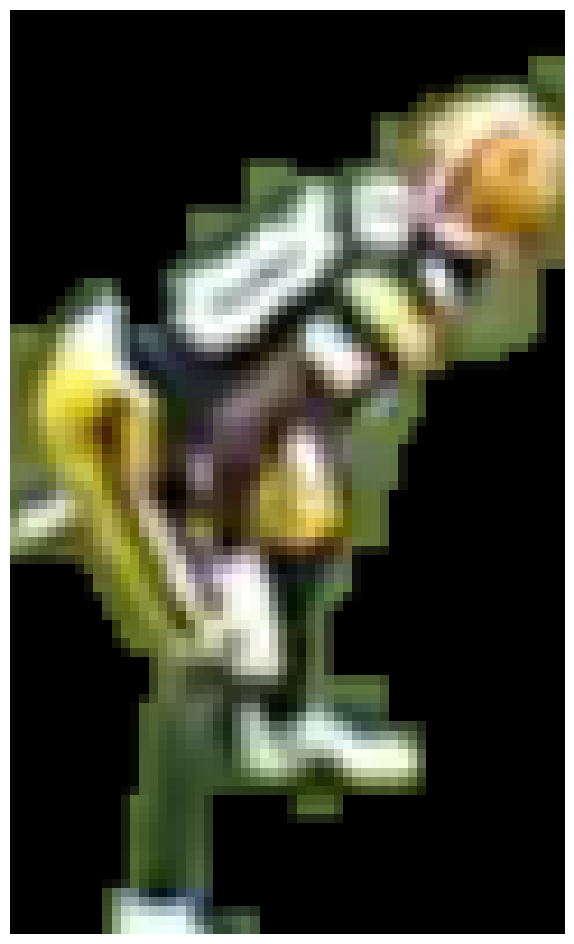

Green Bay Packers 0.67849207 0.70074517
(84, 41)
(100, 60)


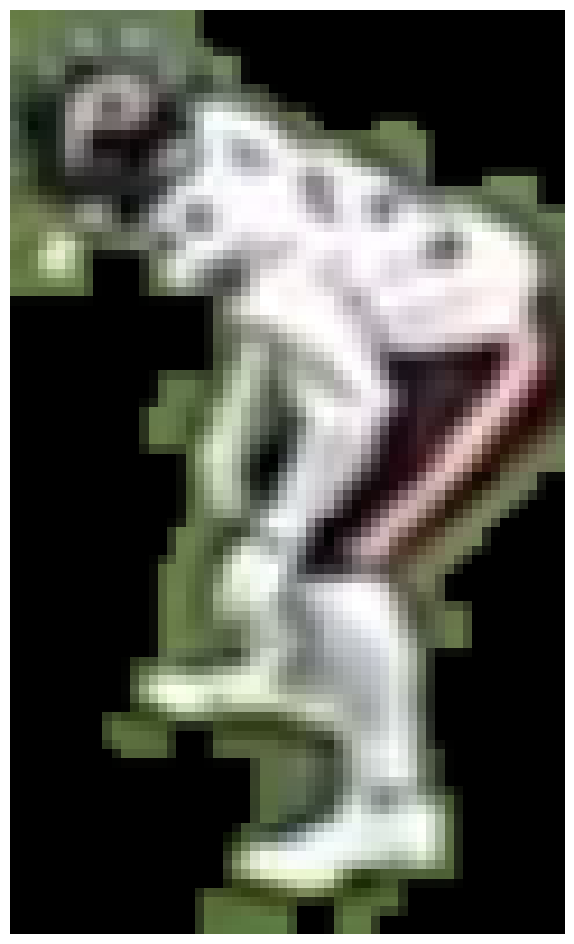

Chicago Bears 0.67227495 0.5755421
(72, 69)
(100, 60)


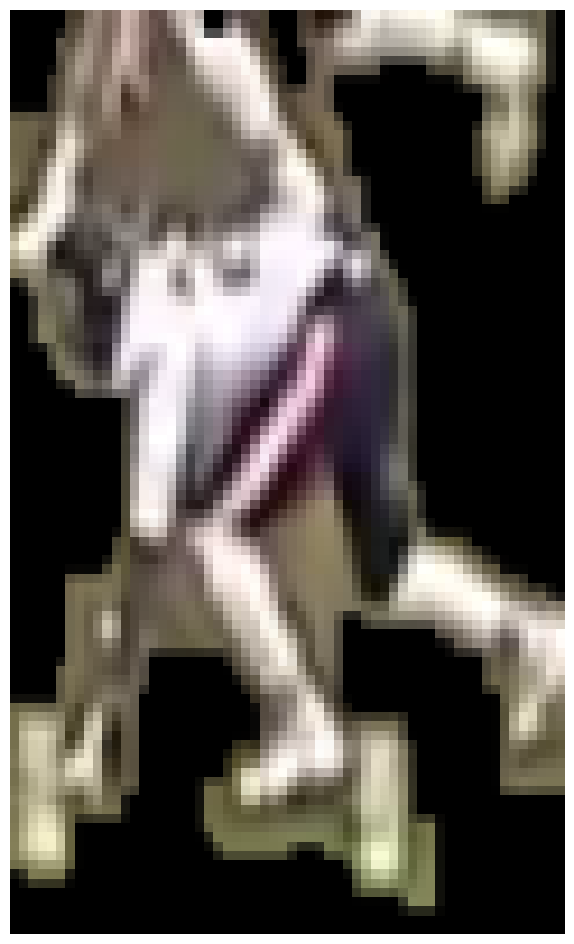

Chicago Bears 0.6812012 0.61874425
(81, 37)
(100, 60)


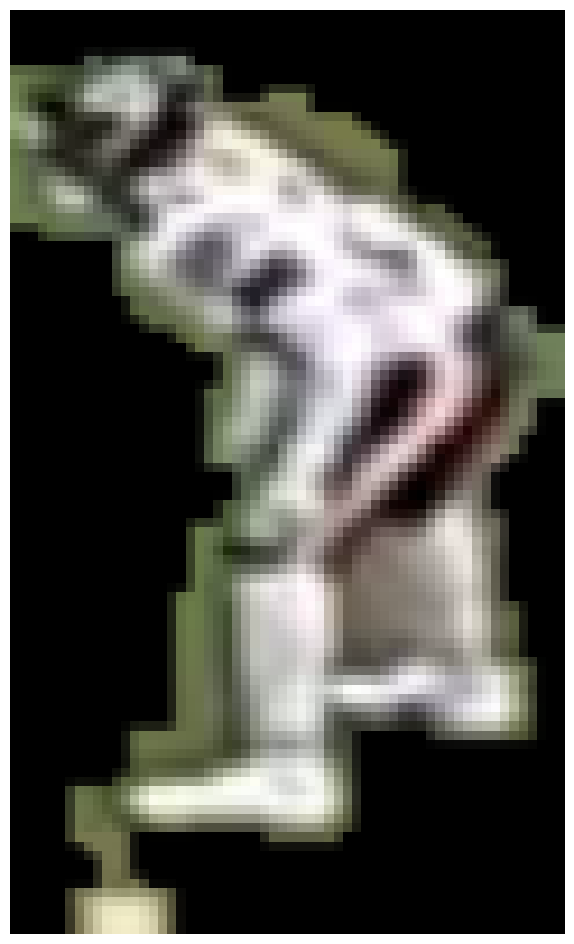

Chicago Bears 0.7319593 0.6120577
(90, 28)
(100, 60)
(66, 38)
(100, 60)


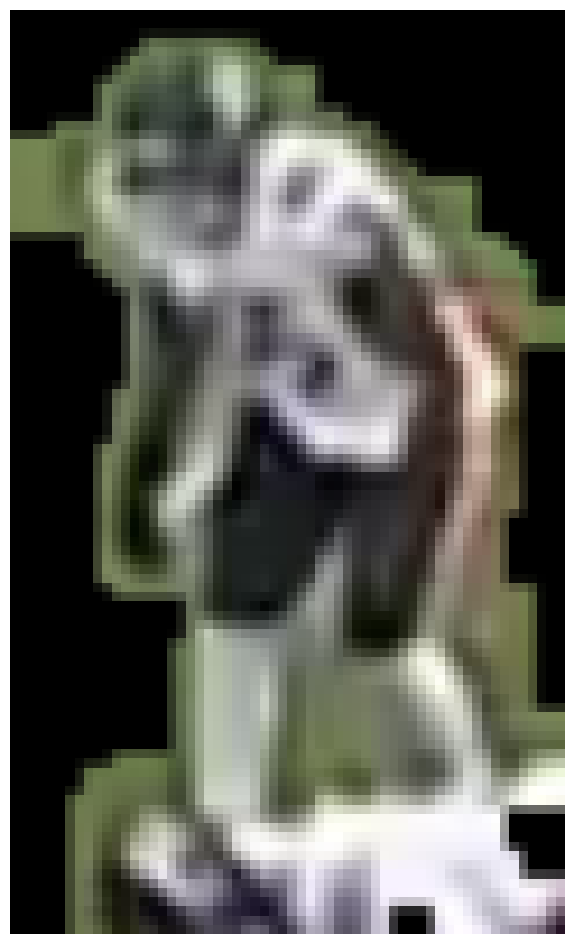

Chicago Bears 0.69478285 0.61826974
(66, 61)
(100, 60)


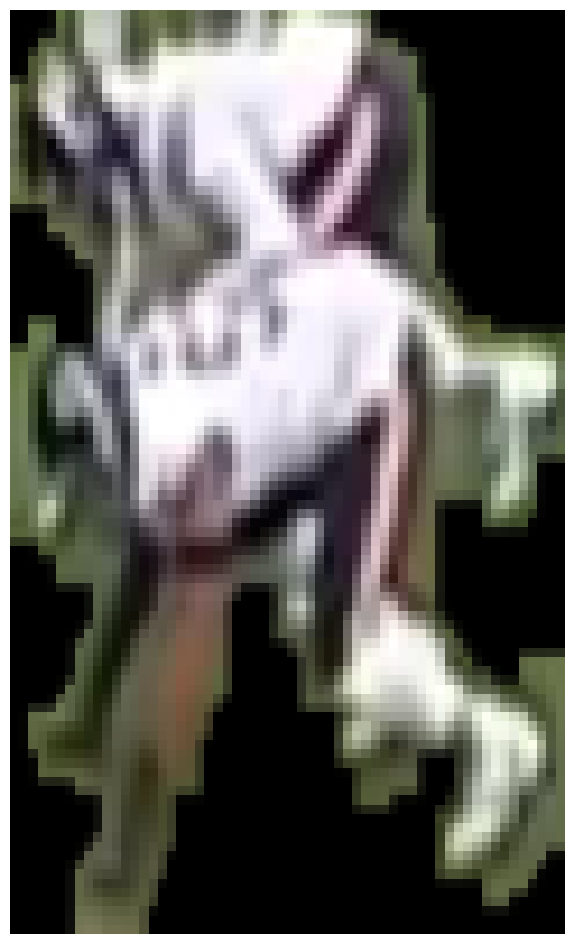

Chicago Bears 0.7273895 0.61665505
(84, 54)
(100, 60)
(91, 34)
(100, 60)
(61, 70)
(100, 60)


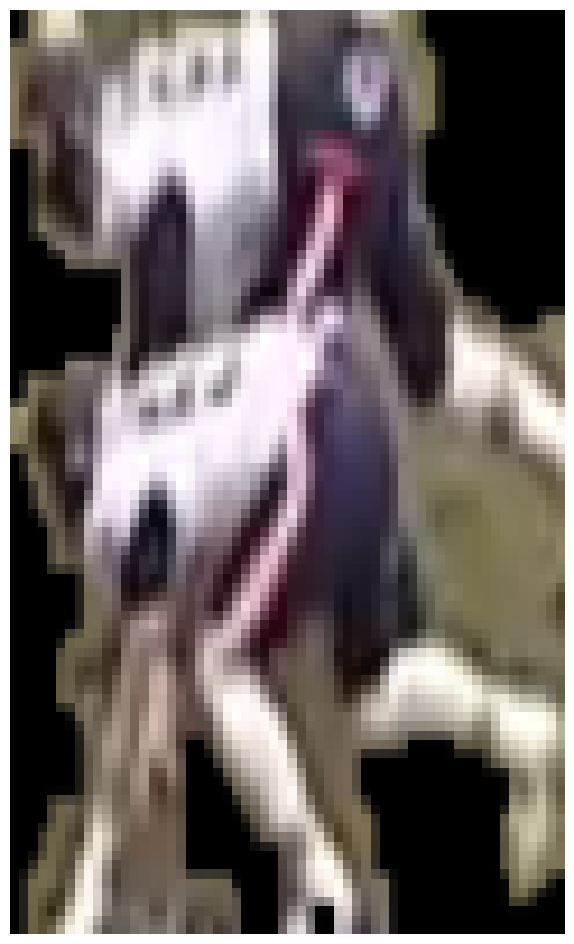

Chicago Bears 0.7749538 0.6801414
(74, 62)
(100, 60)


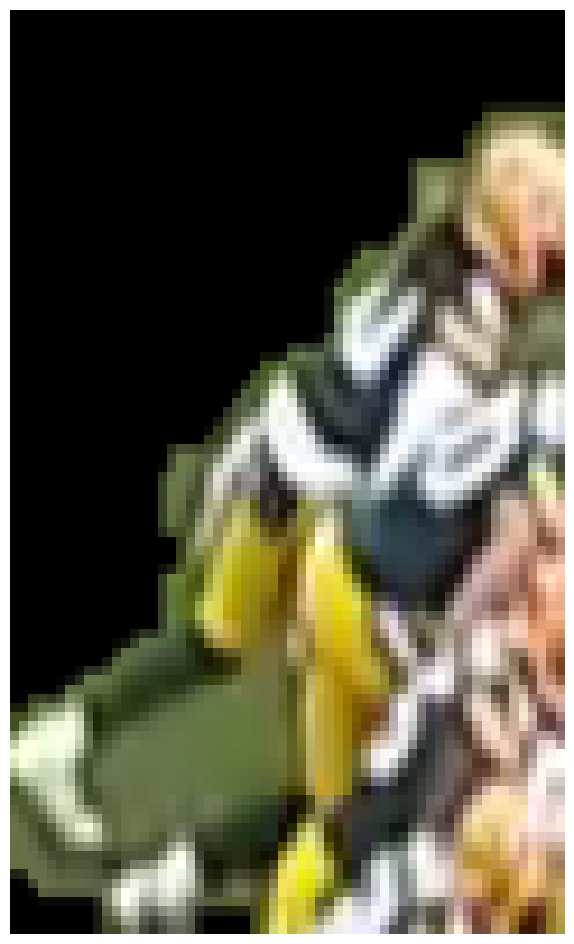

Chicago Bears 0.7142867 0.694004
(70, 31)
(100, 60)


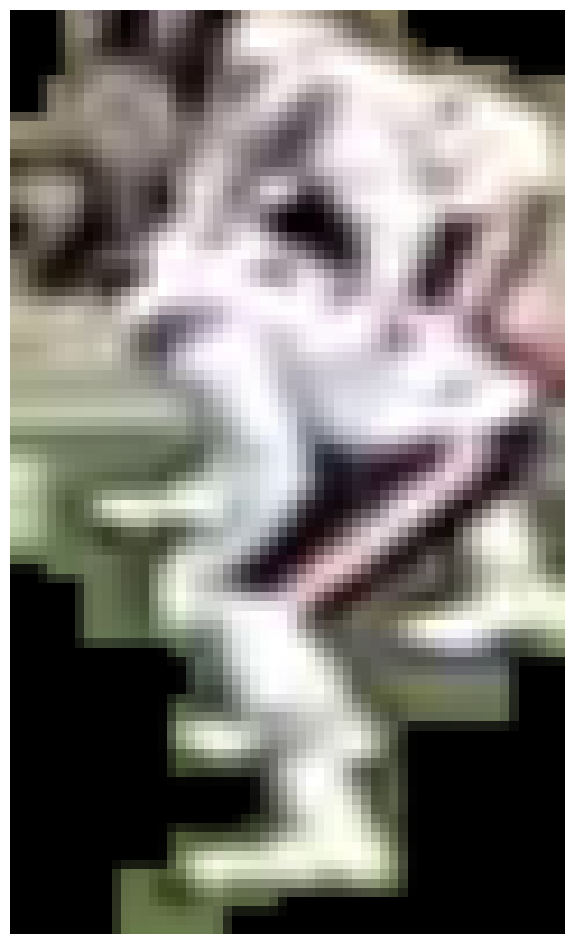

Chicago Bears 0.81467605 0.64383674
(65, 67)
(100, 60)


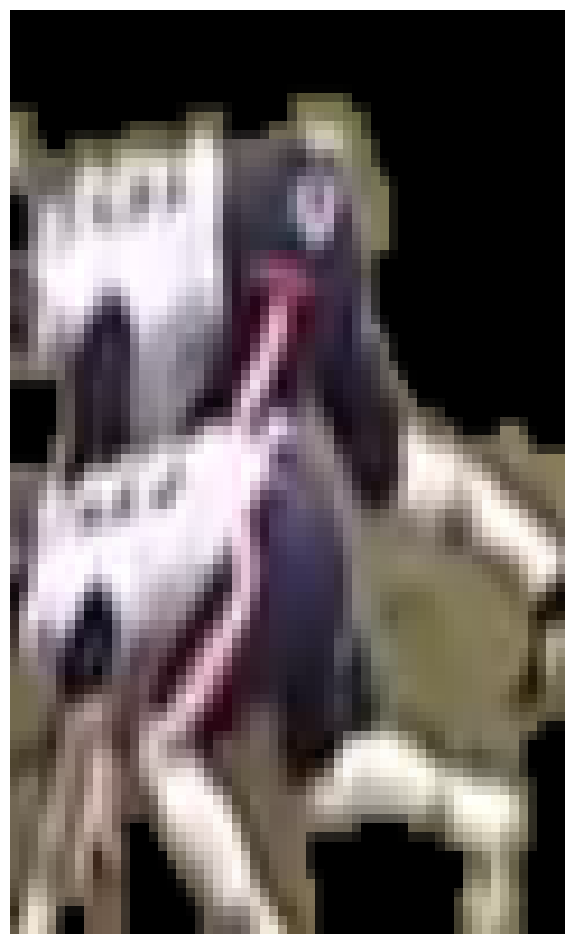

Chicago Bears 0.77243066 0.67182934
(68, 41)
(100, 60)
(39, 28)
(100, 60)


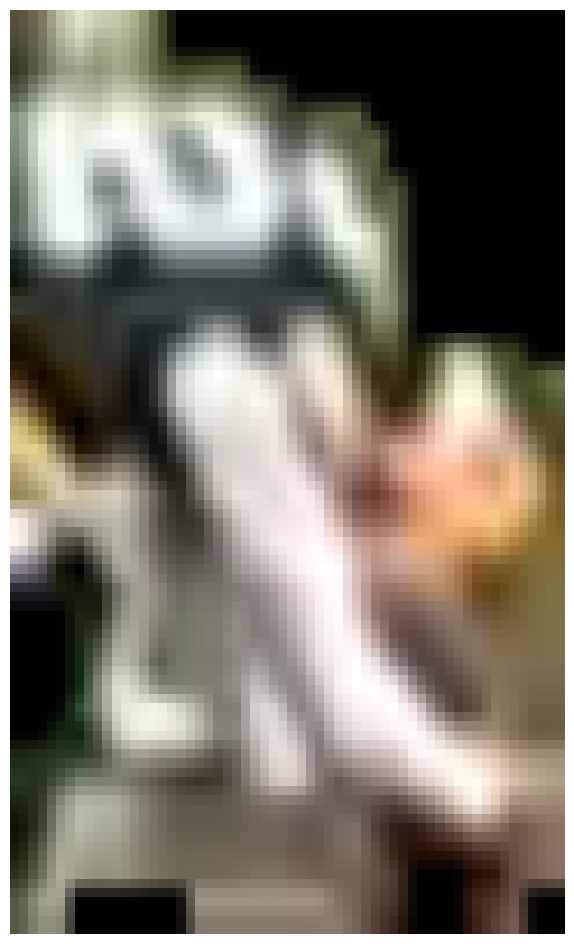

Chicago Bears 0.8000502 0.71809006

0: 384x640 19 Players, 1 Referee, 15.8ms
Speed: 2.6ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)
(90, 28)
(100, 60)
(85, 54)
(100, 60)
(66, 41)
(100, 60)

0: 384x640 19 Players, 1 Referee, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)
(90, 28)
(100, 60)
(85, 56)
(100, 60)
(67, 40)
(100, 60)

0: 384x640 19 Players, 1 Referee, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 62)
(100, 60)
(90, 29)
(100, 60)
(84, 56)
(100, 60)
(66, 40)
(100, 60)

0: 384x640 19 Players, 1 Referee, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 62)
(100, 60)
(90, 29)
(100, 60)
(85, 55)
(100, 60)
(66, 39)
(100, 60)

0: 384x640 19 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.6ms postprocess pe

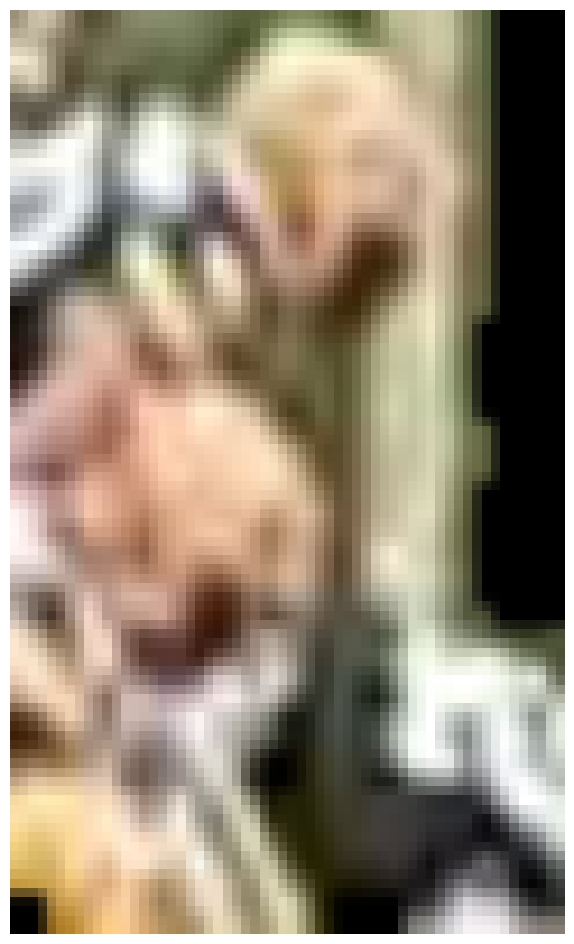

Chicago Bears 0.6777907 0.62269205

0: 384x640 21 Players, 1 Referee, 12.8ms
Speed: 3.9ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 60)
(100, 60)
(91, 29)
(100, 60)
(87, 54)
(100, 60)
(63, 41)
(100, 60)


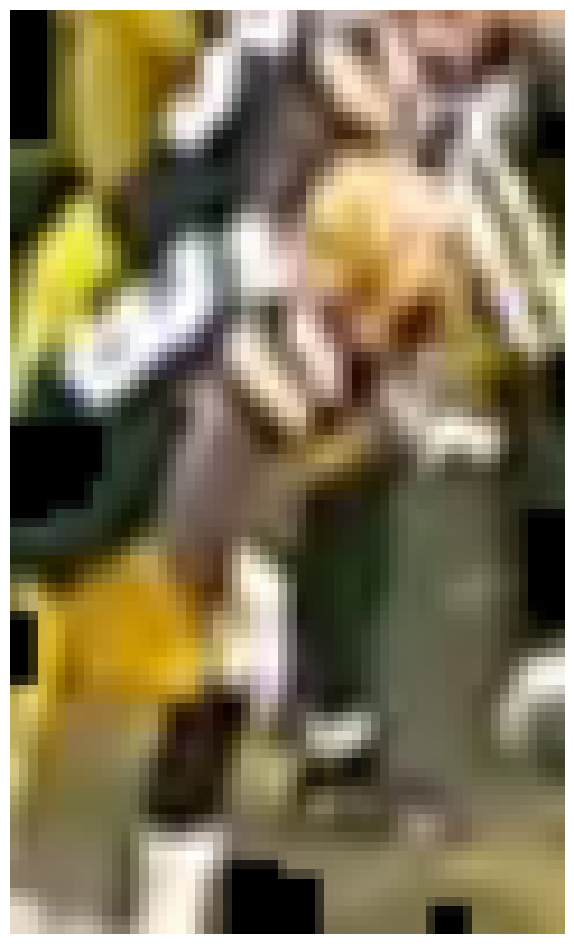

Green Bay Packers 0.56091464 0.5810256

0: 384x640 22 Players, 1 Referee, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(74, 60)
(100, 60)
(90, 29)
(100, 60)
(87, 54)
(100, 60)

0: 384x640 18 Players, 1 Referee, 30.4ms
Speed: 2.8ms preprocess, 30.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(74, 61)
(100, 60)
(91, 30)
(100, 60)
(85, 53)
(100, 60)
(58, 37)
(100, 60)


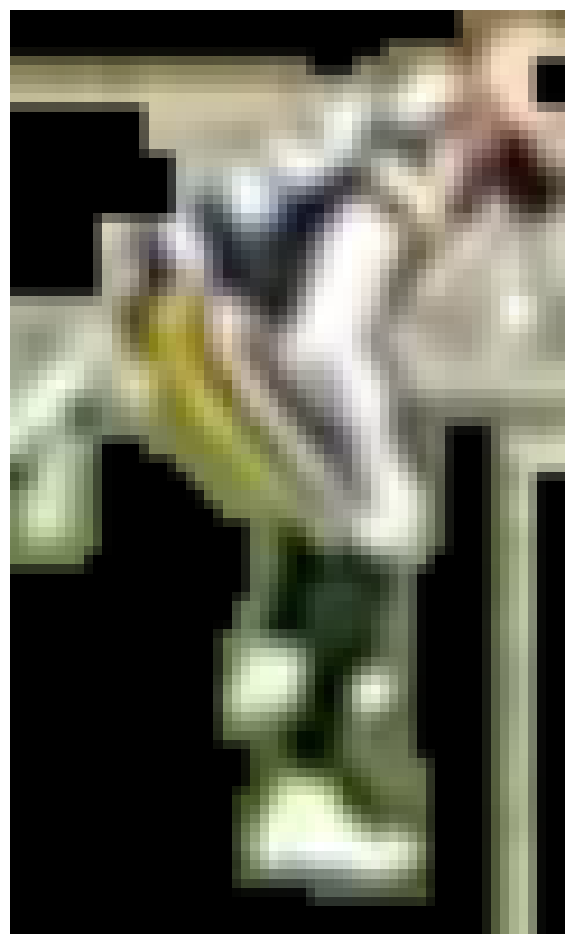

Chicago Bears 0.62072957 0.5766366

0: 384x640 18 Players, 1 Referee, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)
(91, 31)
(100, 60)
(87, 54)
(100, 60)

0: 384x640 18 Players, 1 Referee, 17.3ms
Speed: 2.5ms preprocess, 17.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)
(90, 31)
(100, 60)
(88, 55)
(100, 60)


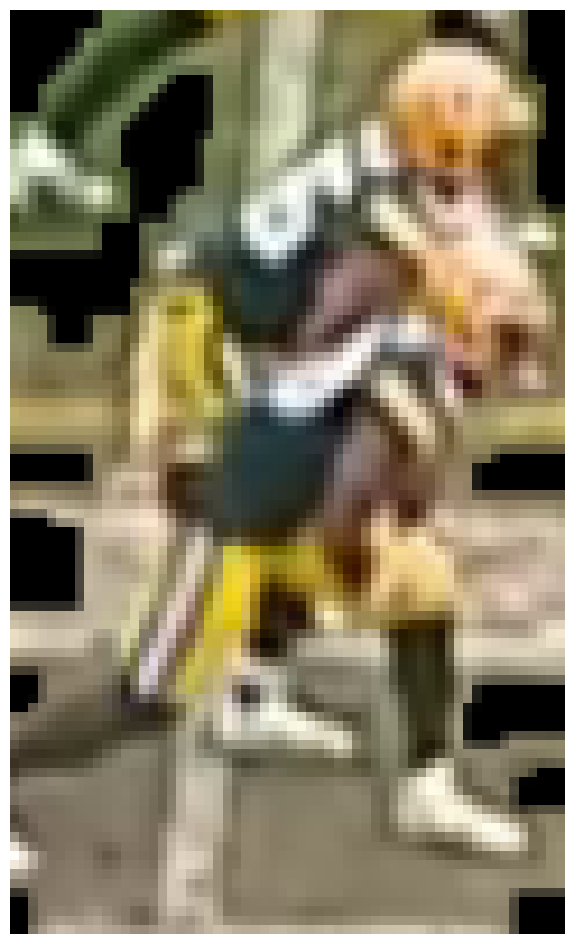

Green Bay Packers 0.48501924 0.50581133
(60, 31)
(100, 60)

0: 384x640 18 Players, 1 Referee, 26.3ms
Speed: 4.6ms preprocess, 26.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(74, 61)
(100, 60)
(91, 30)
(100, 60)
(64, 48)
(100, 60)


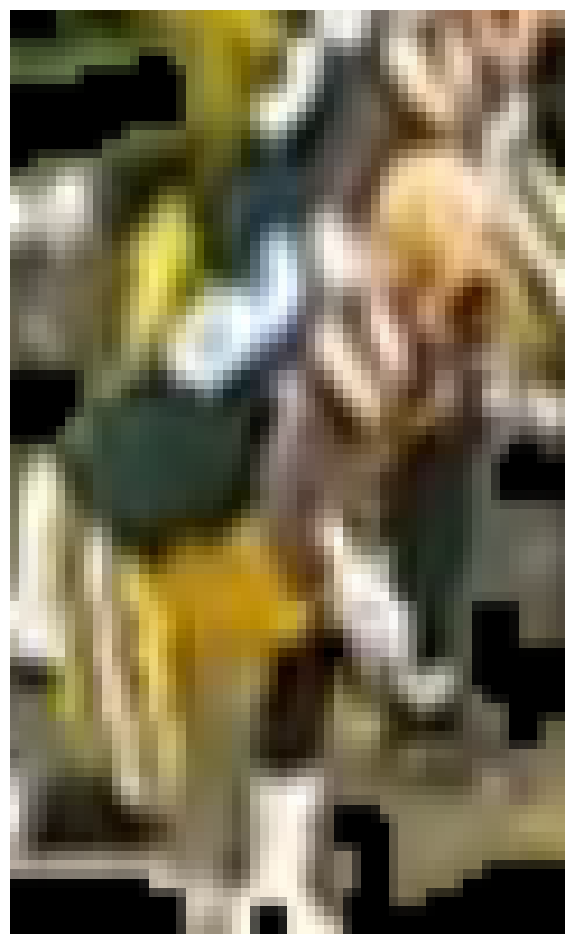

Green Bay Packers 0.5277042 0.55651677

0: 384x640 19 Players, 1 Referee, 31.9ms
Speed: 7.3ms preprocess, 31.9ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)
(73, 62)
(100, 60)
(91, 30)
(100, 60)

0: 384x640 17 Players, 1 Referee, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(74, 61)
(100, 60)
(91, 31)
(100, 60)

0: 384x640 17 Players, 1 Referee, 17.3ms
Speed: 4.1ms preprocess, 17.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(74, 62)
(100, 60)
(91, 30)
(100, 60)

0: 384x640 17 Players, 1 Referee, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(74, 62)
(100, 60)
(90, 32)
(100, 60)


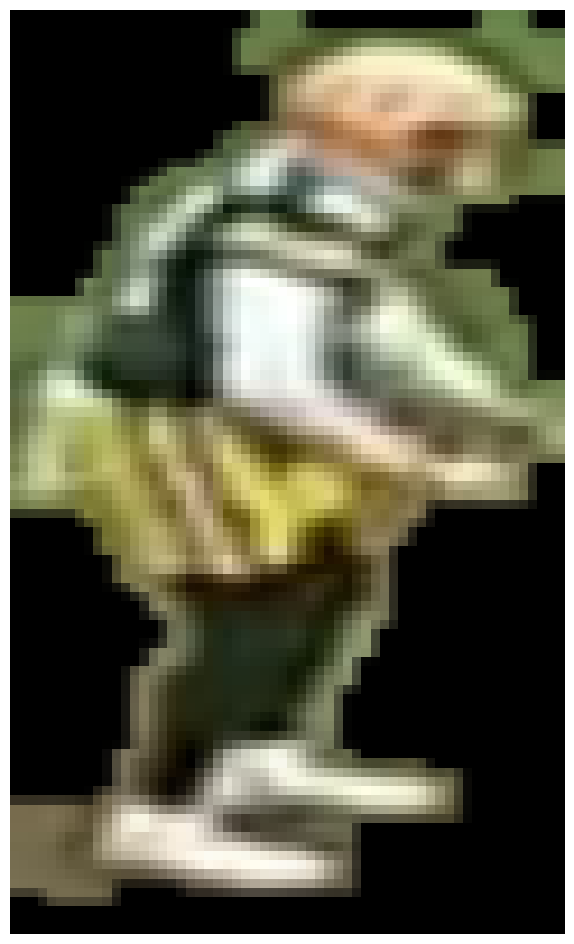

Green Bay Packers 0.54378325 0.5670777
(48, 27)
(100, 60)

0: 384x640 17 Players, 1 Referee, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(75, 62)
(100, 60)
(49, 26)
(100, 60)

0: 384x640 17 Players, 1 Referee, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 62)
(100, 60)

0: 384x640 18 Players, 1 Referee, 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(76, 62)
(100, 60)

0: 384x640 18 Players, 1 Referee, 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)

0: 384x640 19 Players, 1 Referee, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(75, 61)
(100, 60)
(49, 32)
(100, 60)


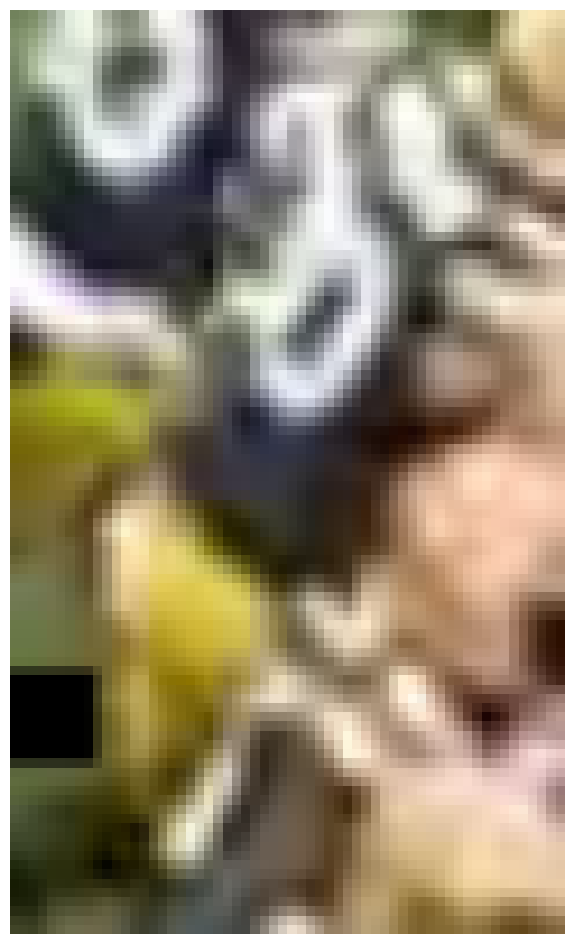

Chicago Bears 0.6920769 0.6683699
(54, 34)
(100, 60)


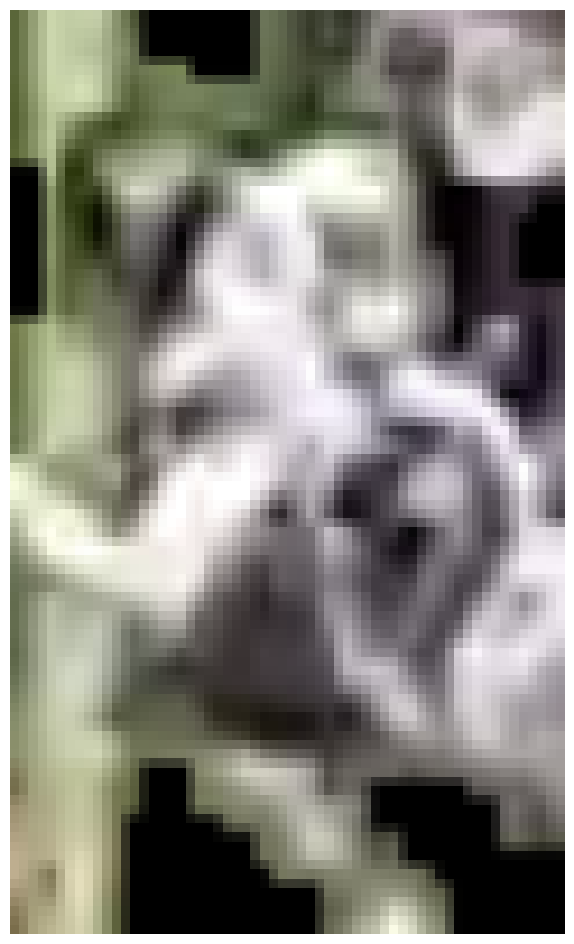

Chicago Bears 0.6971384 0.5474579

0: 384x640 20 Players, 1 Referee, 21.8ms
Speed: 2.5ms preprocess, 21.8ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)
(74, 60)
(100, 60)

0: 384x640 18 Players, 1 Referee, 23.1ms
Speed: 2.8ms preprocess, 23.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(74, 60)
(100, 60)

0: 384x640 18 Players, 1 Referee, 17.7ms
Speed: 2.5ms preprocess, 17.7ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)
(74, 60)
(100, 60)

0: 384x640 18 Players, 1 Referee, 15.0ms
Speed: 2.4ms preprocess, 15.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(74, 60)
(100, 60)

0: 384x640 17 Players, 1 Referee, 22.5ms
Speed: 4.2ms preprocess, 22.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(72, 55)
(100, 60)

0: 384x640 21 Players, 1 Referee, 16.0ms
Speed: 2.6ms preprocess, 16.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(72, 55)
(100, 60)
(50, 36)
(100, 60)

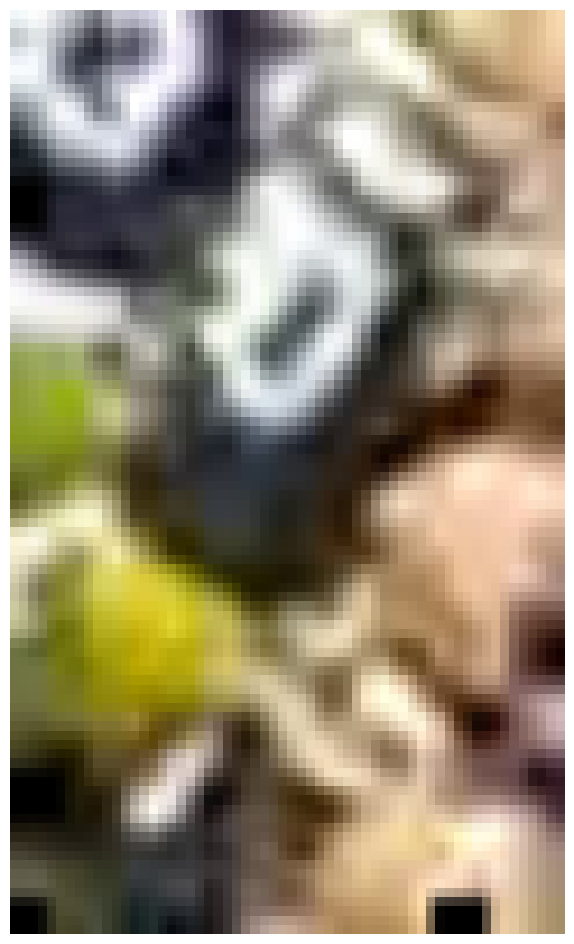

Chicago Bears 0.7006483 0.6747087
(73, 43)
(100, 60)


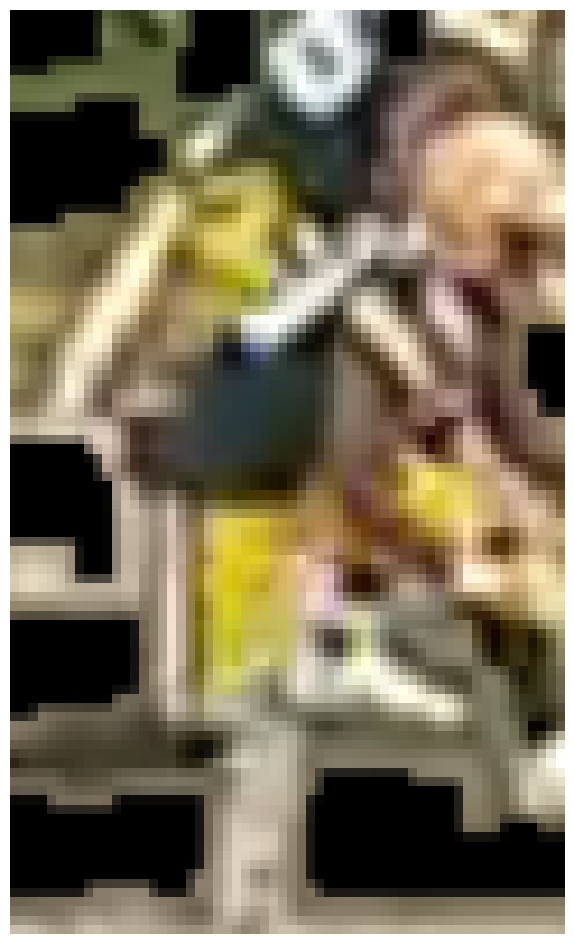

Green Bay Packers 0.5163173 0.5364429

0: 384x640 21 Players, 1 Referee, 25.2ms
Speed: 2.7ms preprocess, 25.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(69, 46)
(100, 60)
(71, 47)
(100, 60)


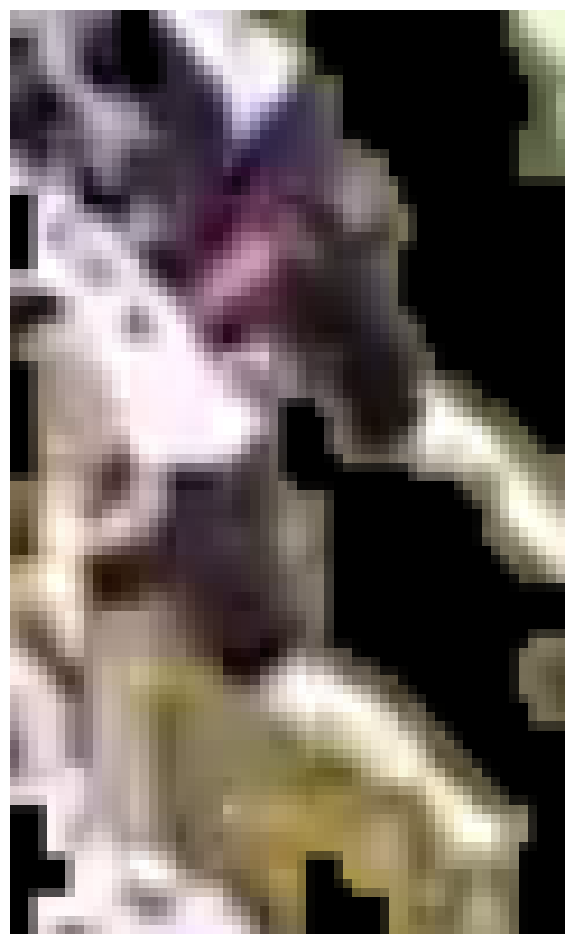

Chicago Bears 0.7596834 0.6696978

0: 384x640 19 Players, 1 Referee, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(70, 46)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(71, 48)
(100, 60)
(44, 34)
(100, 60)


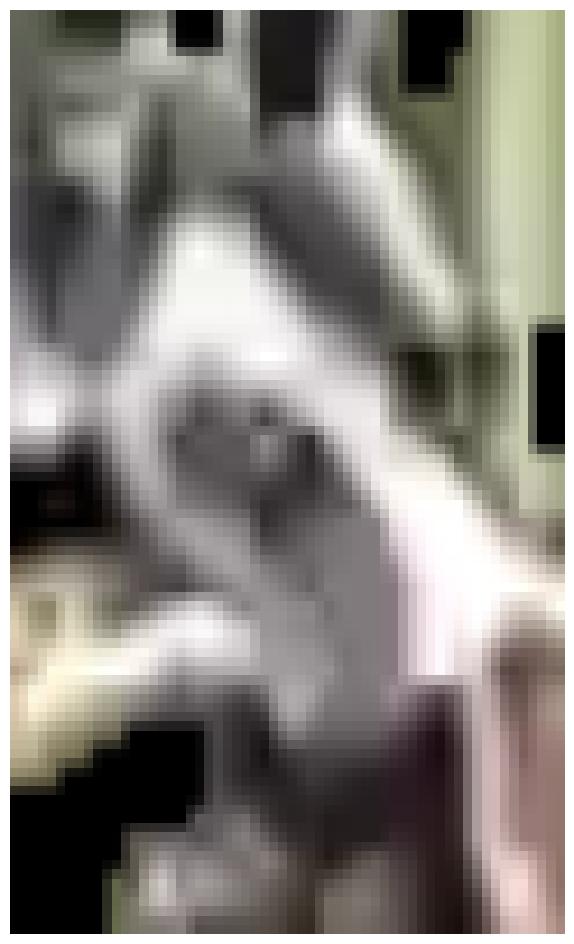

Chicago Bears 0.7263968 0.56875634

0: 384x640 21 Players, 1 Referee, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(72, 45)
(100, 60)

0: 384x640 19 Players, 1 Referee, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(71, 41)
(100, 60)


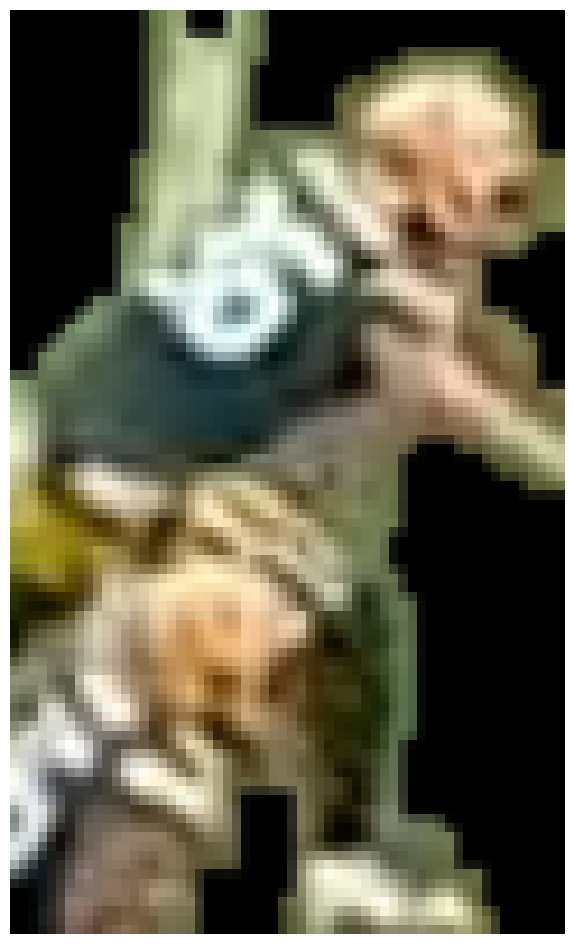

Green Bay Packers 0.5907655 0.61079013
(52, 36)
(100, 60)
(62, 32)
(100, 60)


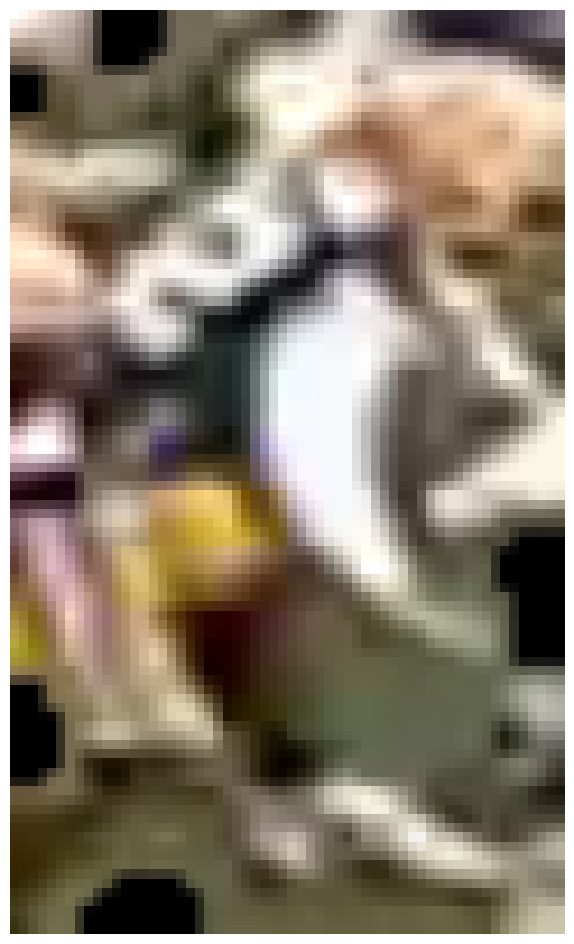

Chicago Bears 0.6504882 0.62902695

0: 384x640 22 Players, 1 Referee, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(58, 43)
(100, 60)


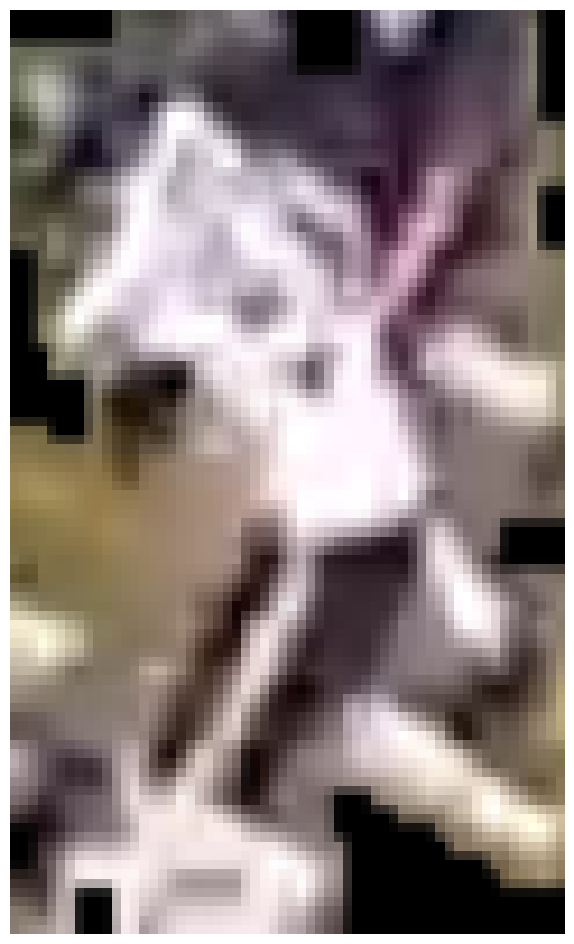

Chicago Bears 0.81450427 0.6730645

0: 384x640 22 Players, 1 Referee, 18.2ms
Speed: 2.5ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(99, 37)
(100, 60)


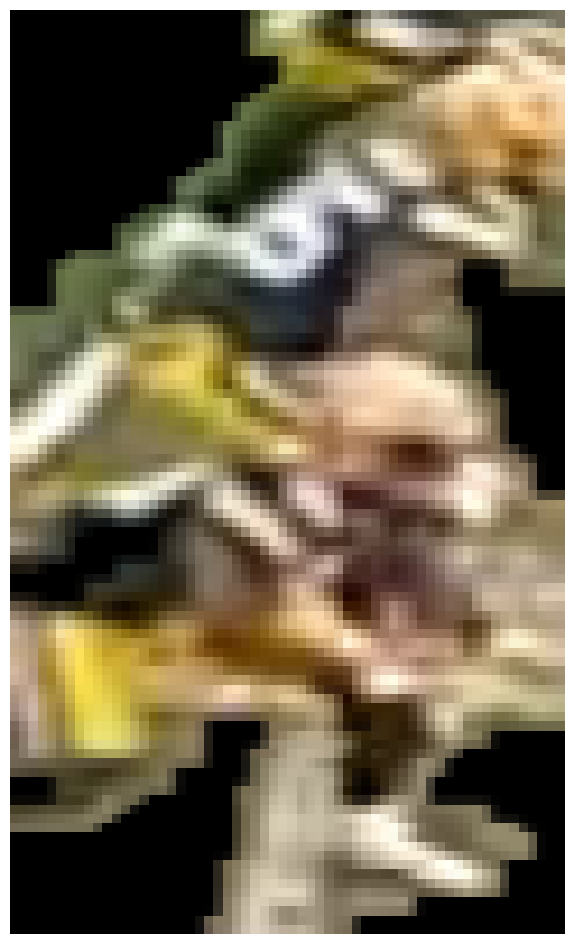

Green Bay Packers 0.48635682 0.50647056
(43, 25)
(100, 60)

0: 384x640 21 Players, 1 Referee, 23.2ms
Speed: 2.7ms preprocess, 23.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(64, 35)
(100, 60)

0: 384x640 22 Players, 1 Referee, 17.3ms
Speed: 2.5ms preprocess, 17.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(69, 38)
(100, 60)


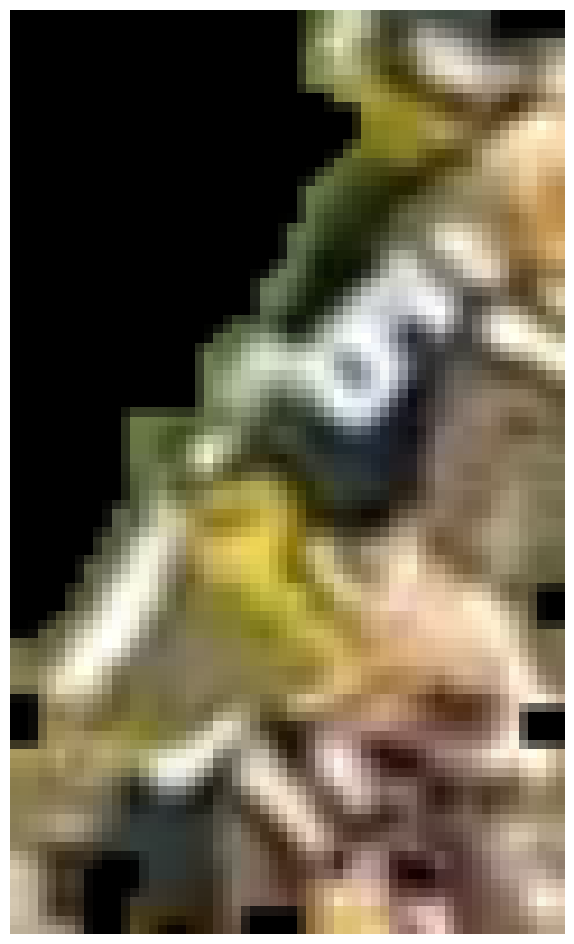

Green Bay Packers 0.55578405 0.5758104
(47, 30)
(100, 60)


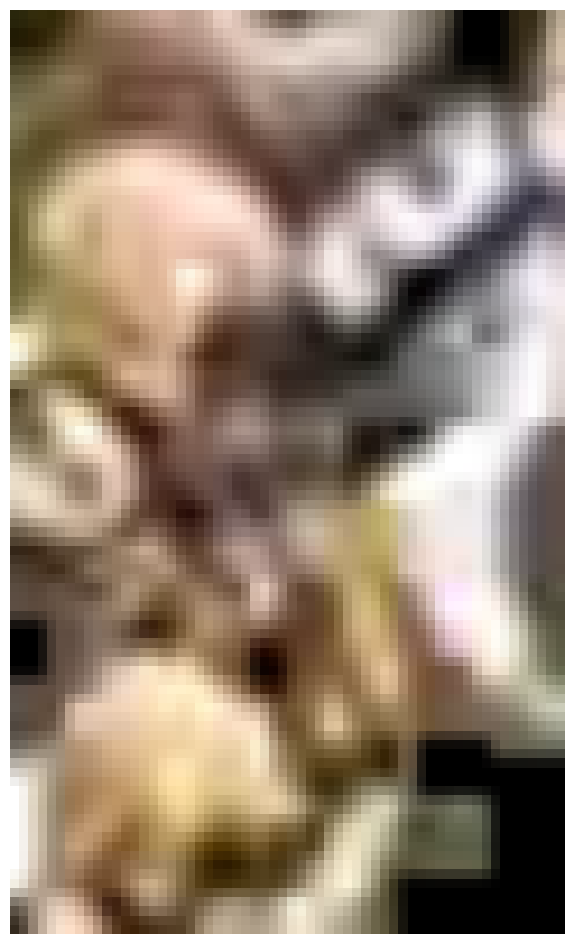

Chicago Bears 0.6143088 0.5699724
(82, 36)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 13.0ms
Speed: 3.1ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(52, 42)
(100, 60)

0: 384x640 18 Players, 1 Referee, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 19.0ms
Speed: 3.4ms preprocess, 19.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(61, 35)
(100, 60)


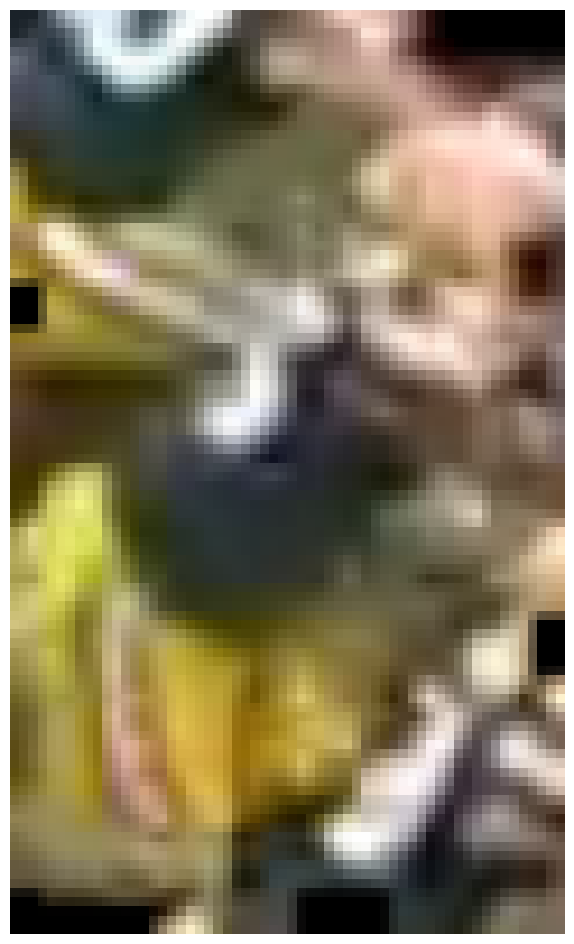

Green Bay Packers 0.61171484 0.6407908

0: 384x640 19 Players, 1 Referee, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 17.9ms
Speed: 2.4ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(113, 34)
(100, 60)


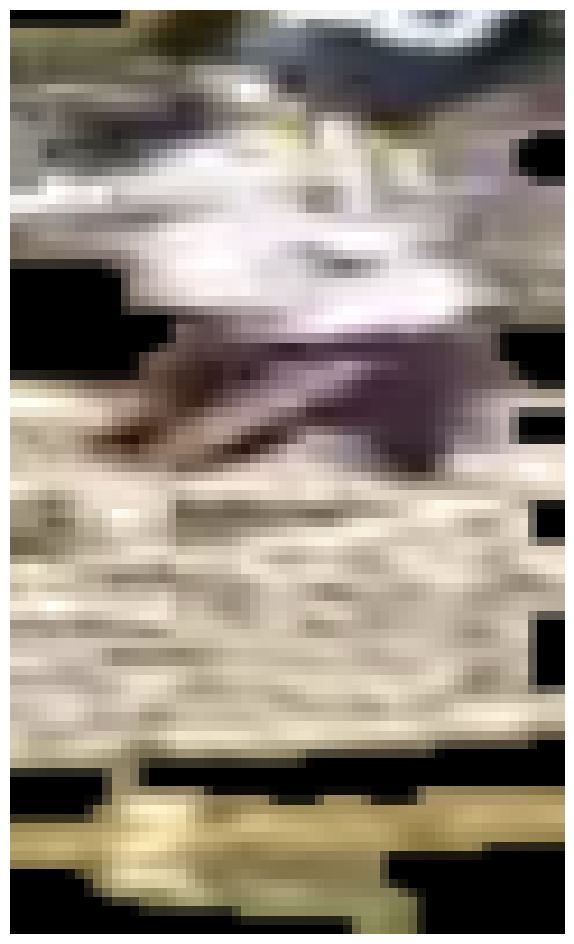

Chicago Bears 0.5725728 0.50767136
(73, 36)
(100, 60)


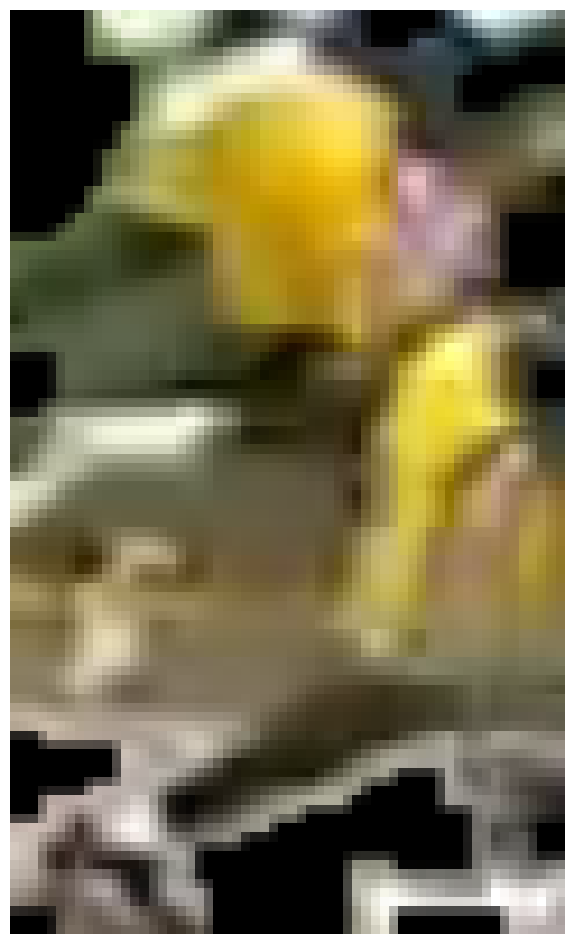

Green Bay Packers 0.48858464 0.5176047

0: 384x640 21 Players, 1 Referee, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(82, 32)
(100, 60)

0: 384x640 19 Players, 1 Referee, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 1 Referee, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 1 Referee, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(76, 49)
(100, 60)


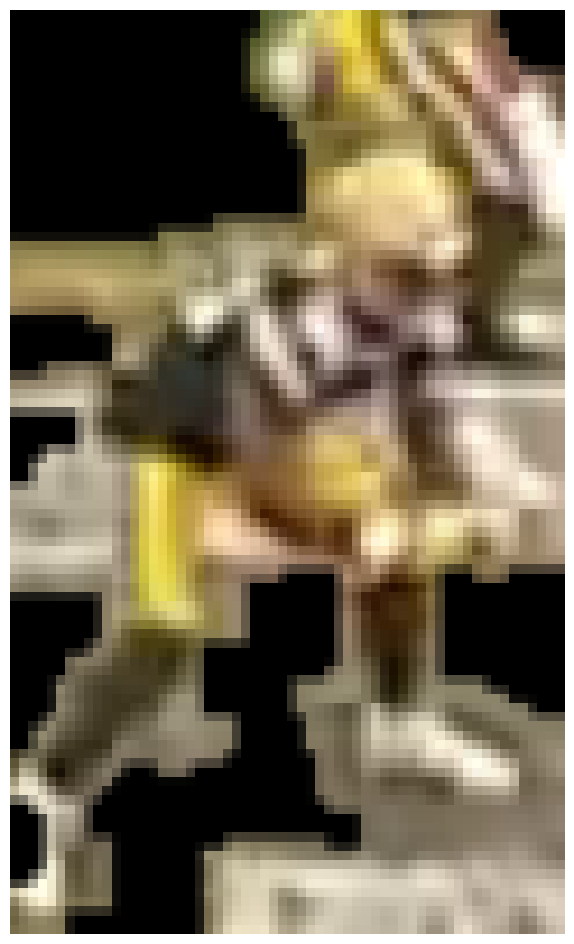

Green Bay Packers 0.3927117 0.41418383

0: 384x640 17 Players, 1 Referee, 16.3ms
Speed: 2.8ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(65, 67)
(100, 60)


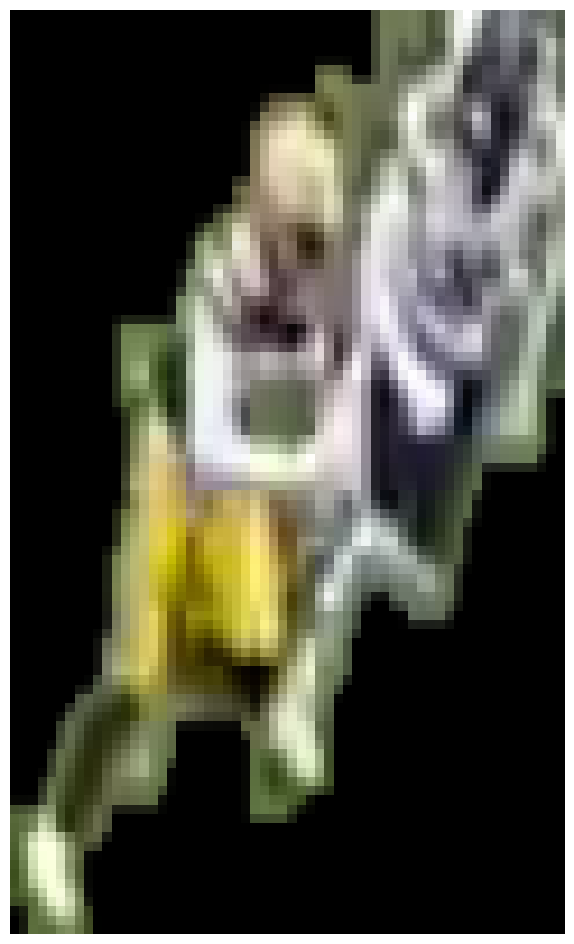

Chicago Bears 0.70155615 0.65600085

0: 384x640 16 Players, 1 Referee, 39.5ms
Speed: 4.9ms preprocess, 39.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 1 Referee, 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 15.0ms
Speed: 2.6ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(68, 45)
(100, 60)

0: 384x640 17 Players, 1 Referee, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(73, 35)
(100, 60)

0: 384x640 16 Players, 1 Referee, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.5ms p

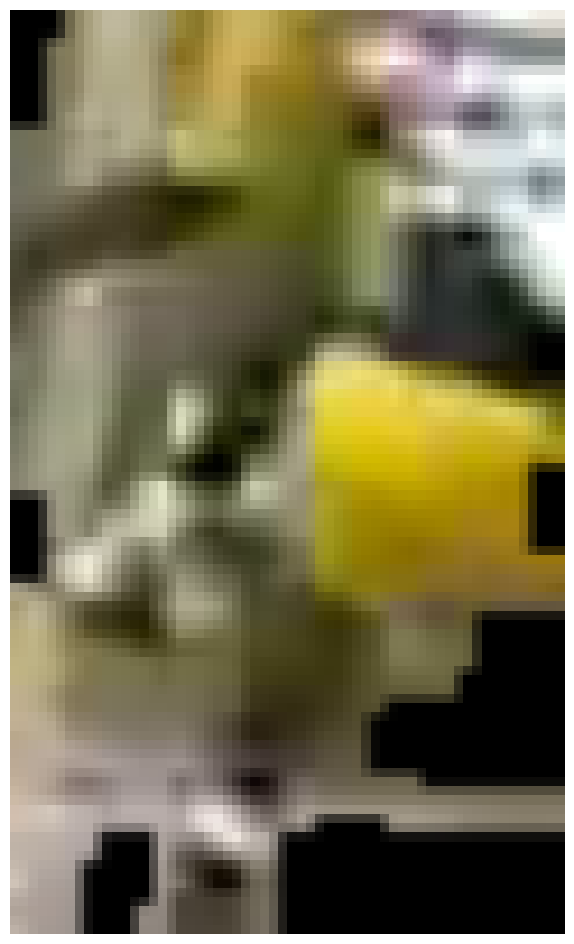

Green Bay Packers 0.4714604 0.4915342

0: 384x640 15 Players, 1 Referee, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(42, 28)
(100, 60)


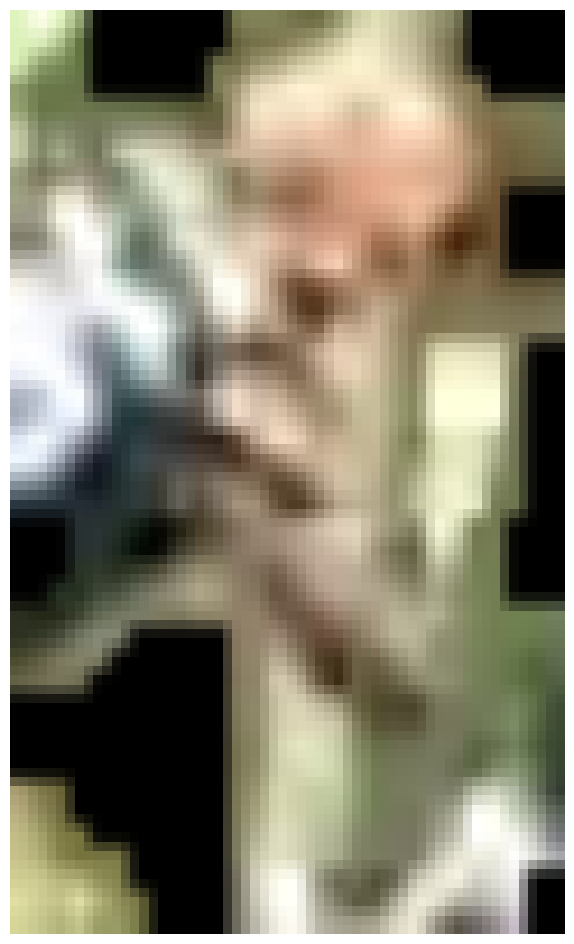

Chicago Bears 0.5984333 0.5769071

0: 384x640 15 Players, 1 Referee, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(58, 35)
(100, 60)


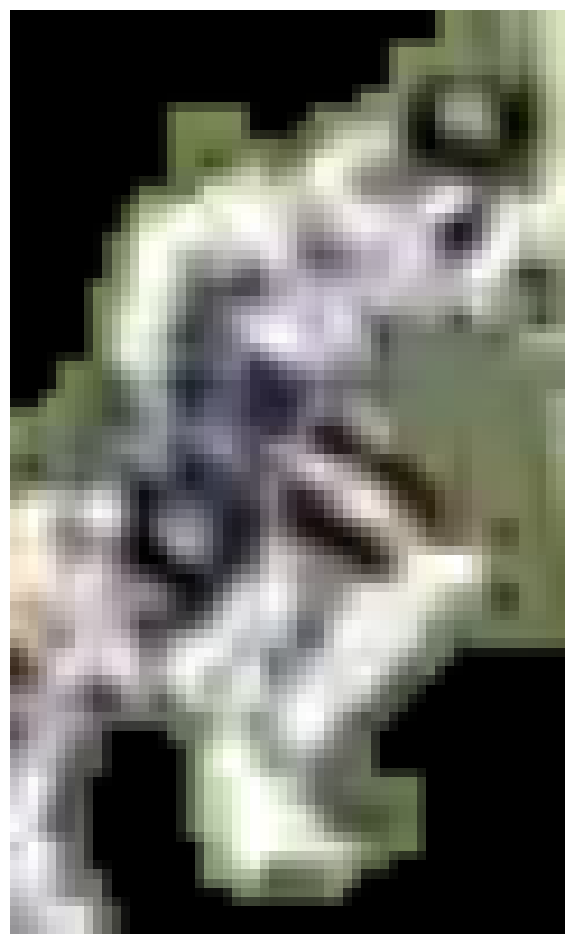

Chicago Bears 0.6865201 0.5699659

0: 384x640 16 Players, 1 Referee, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(88, 31)
(100, 60)


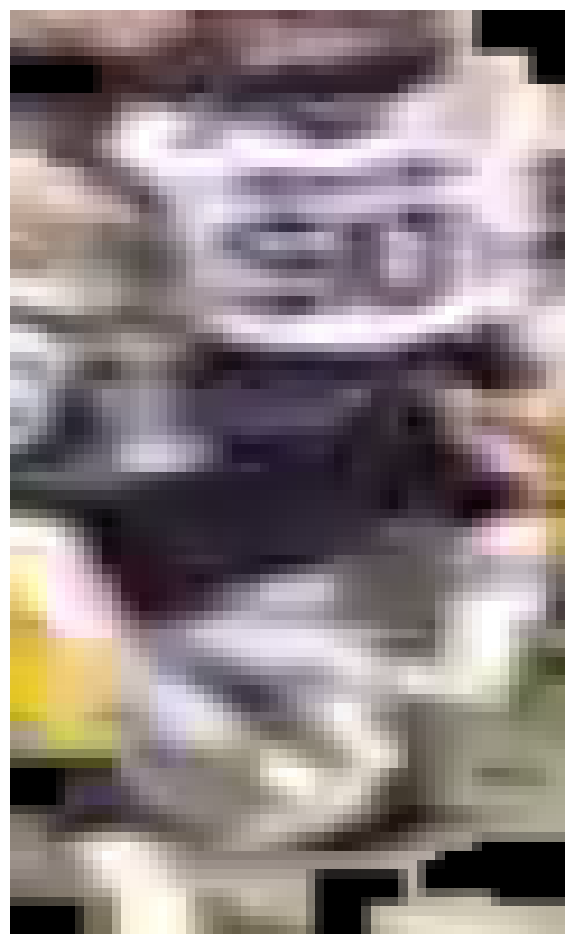

Chicago Bears 0.7773105 0.6337203

0: 384x640 17 Players, 1 Referee, 18.0ms
Speed: 2.6ms preprocess, 18.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 16.9ms
Speed: 2.4ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(72, 39)
(100, 60)
(80, 25)
(100, 60)


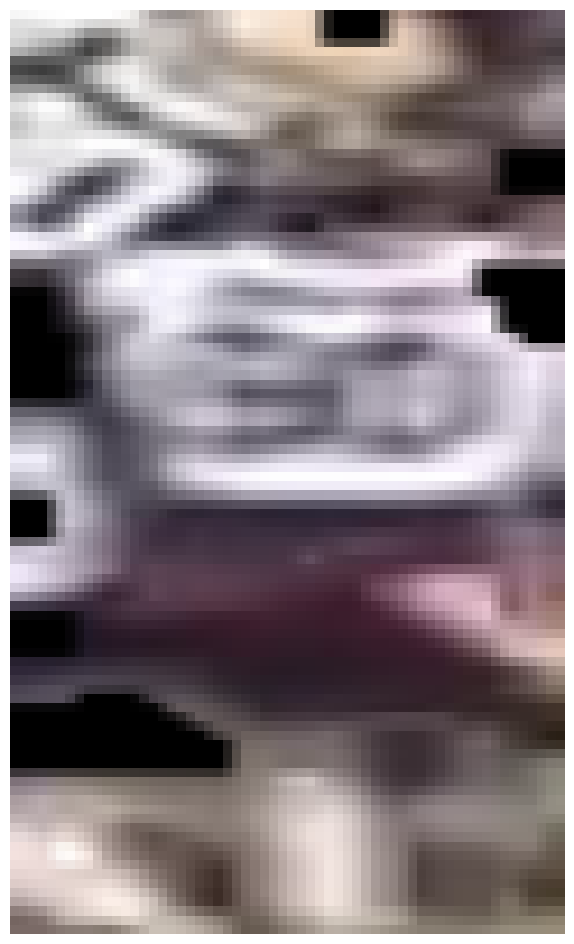

Chicago Bears 0.7899463 0.6514257

0: 384x640 19 Players, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(40, 27)
(100, 60)


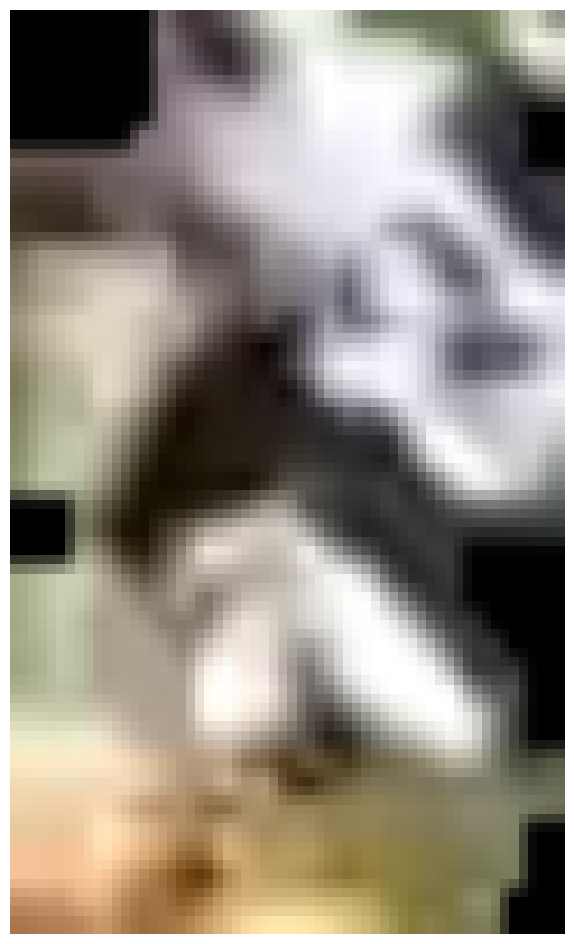

Chicago Bears 0.73166865 0.6271057

0: 384x640 21 Players, 20.2ms
Speed: 2.8ms preprocess, 20.2ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(41, 23)
(100, 60)


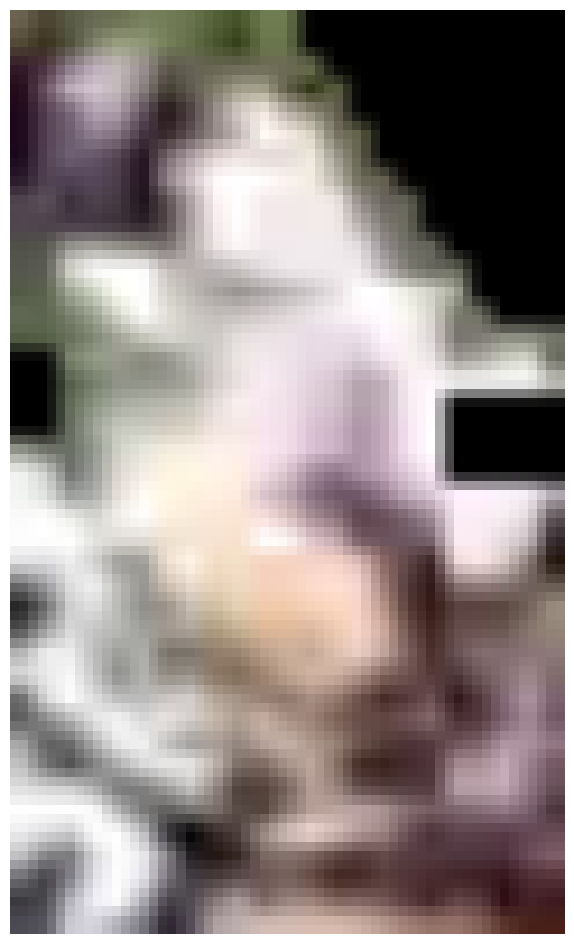

Chicago Bears 0.8292459 0.65435624
(71, 55)
(100, 60)


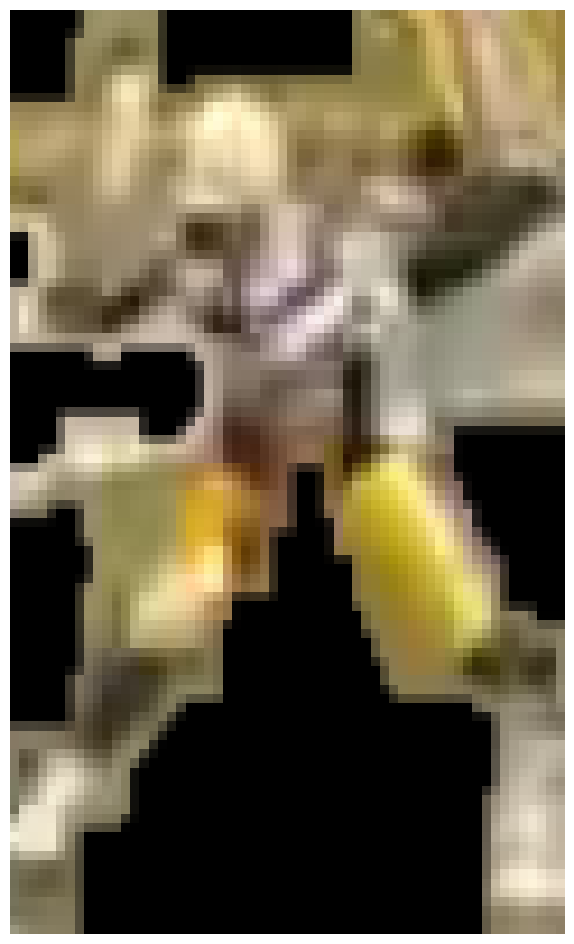

Green Bay Packers 0.39364842 0.41504505

0: 384x640 19 Players, 13.0ms
Speed: 3.8ms preprocess, 13.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 16.1ms
Speed: 2.4ms preprocess, 16.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)
(33, 25)
(100, 60)


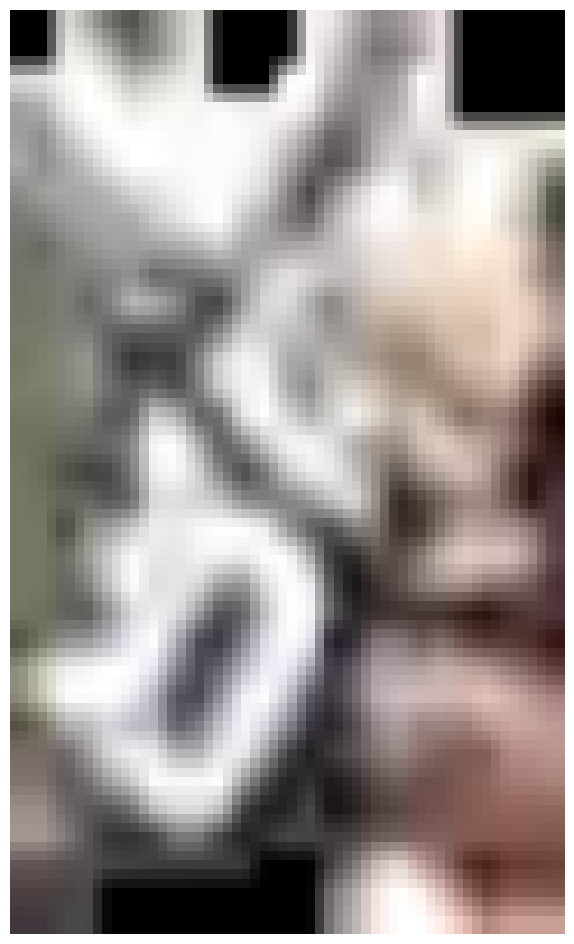

Chicago Bears 0.66261375 0.5085237

0: 384x640 19 Players, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 14.3ms
Speed: 2.8ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(47, 26)
(100, 60)


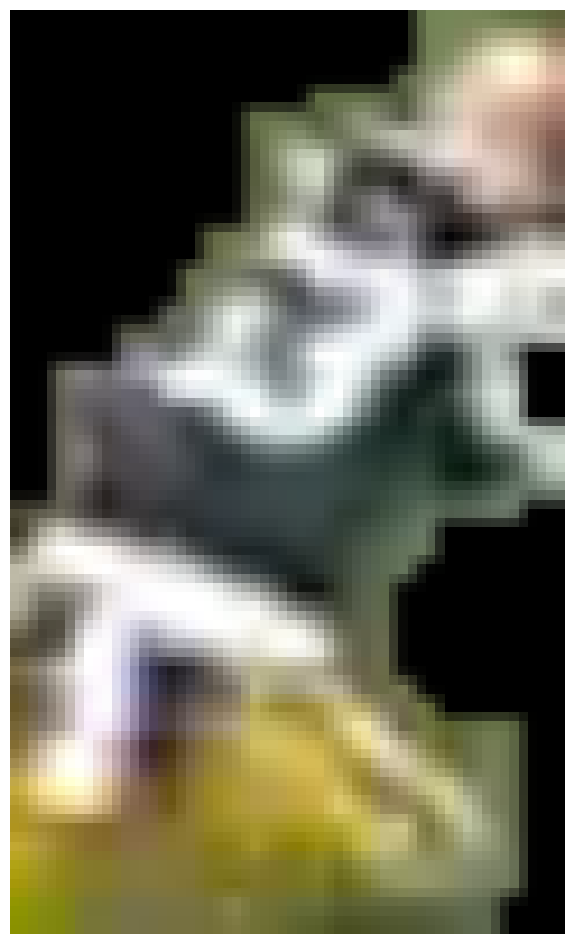

Chicago Bears 0.76032007 0.71010566

0: 384x640 21 Players, 14.1ms
Speed: 2.2ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(67, 44)
(100, 60)


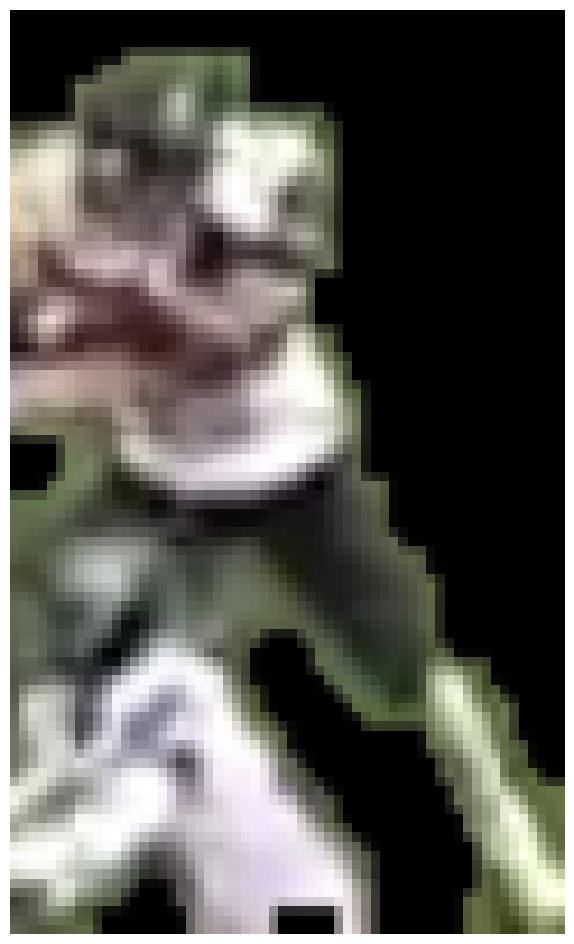

Chicago Bears 0.78252596 0.6784863

0: 384x640 20 Players, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 5.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.1ms
Speed: 2.5ms preprocess, 12.1ms infere

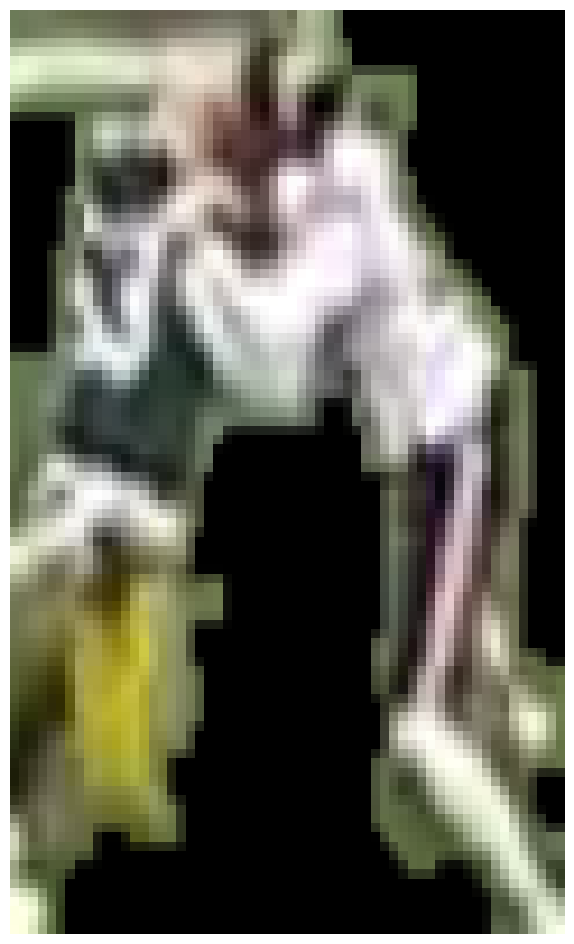

Chicago Bears 0.72721547 0.6547699

0: 384x640 20 Players, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(61, 34)
(100, 60)


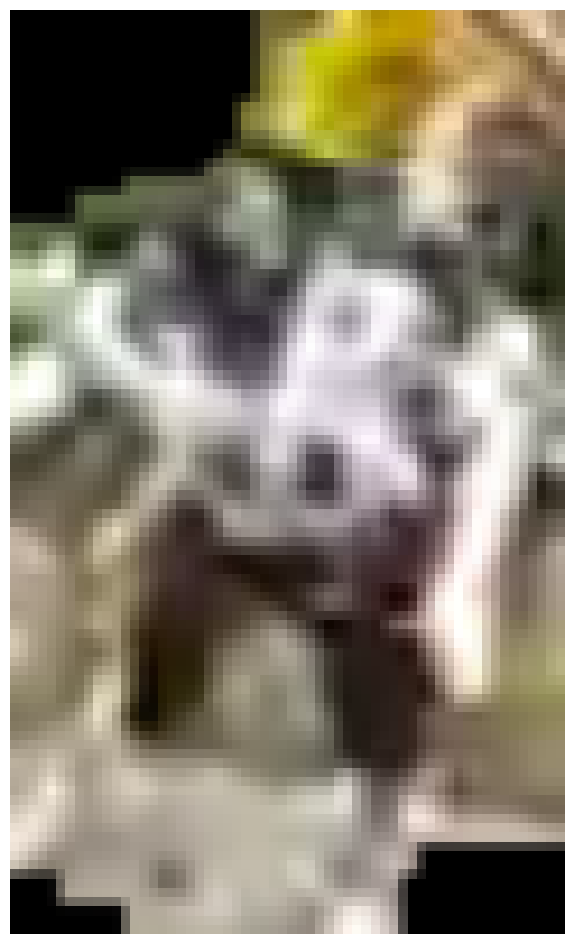

Chicago Bears 0.65224576 0.587785

0: 384x640 21 Players, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(67, 35)
(100, 60)


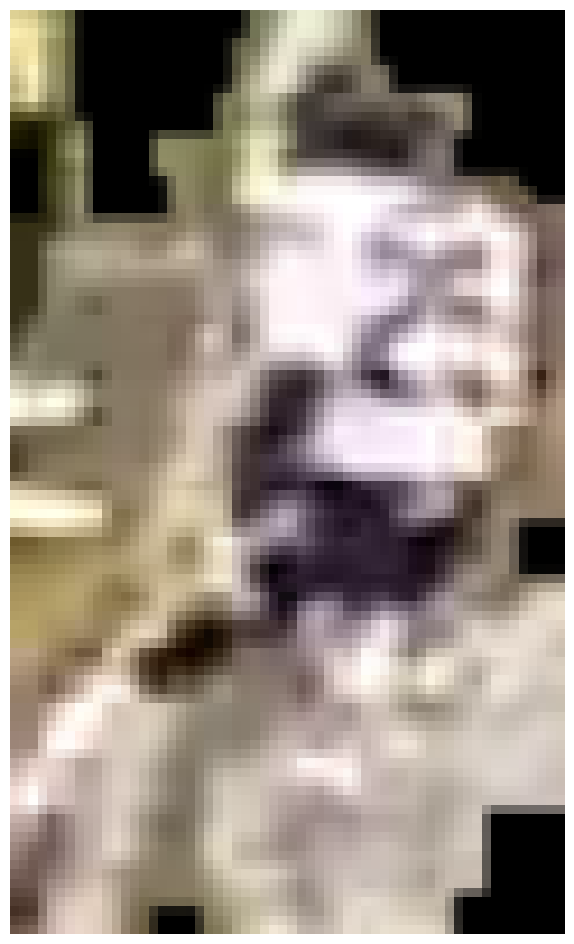

Chicago Bears 0.6681795 0.5771632

0: 384x640 22 Players, 11.7ms
Speed: 4.2ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(56, 27)
(100, 60)


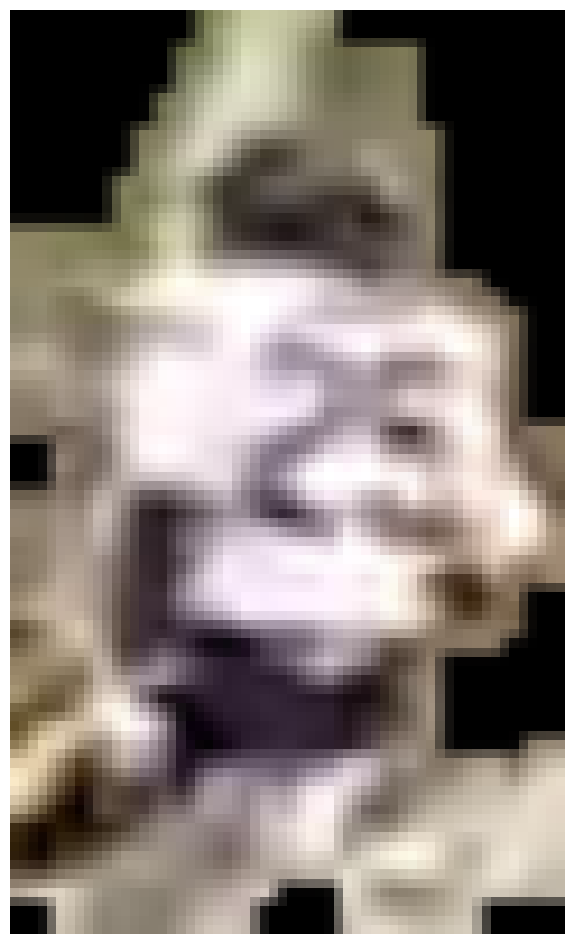

Chicago Bears 0.7147278 0.605241

0: 384x640 17 Players, 12.6ms
Speed: 4.3ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 15.4ms
Speed: 2.4ms preprocess, 15.4ms inferenc

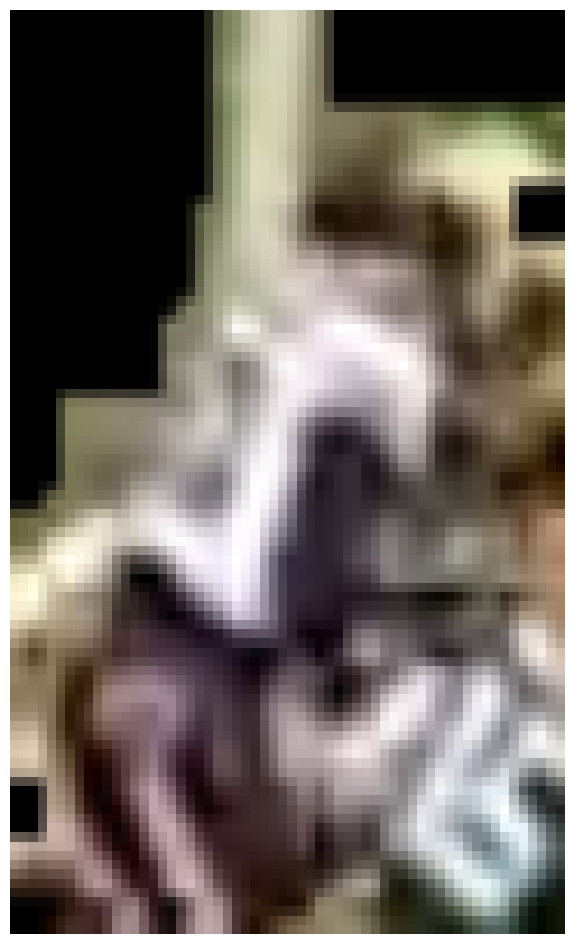

Chicago Bears 0.7907853 0.7193177

0: 384x640 18 Players, 13.2ms
Speed: 3.8ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 16.6ms
Speed: 2.5ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(69, 30)
(100, 60)

0: 384x640 18 Players, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(66, 26)
(100, 60)


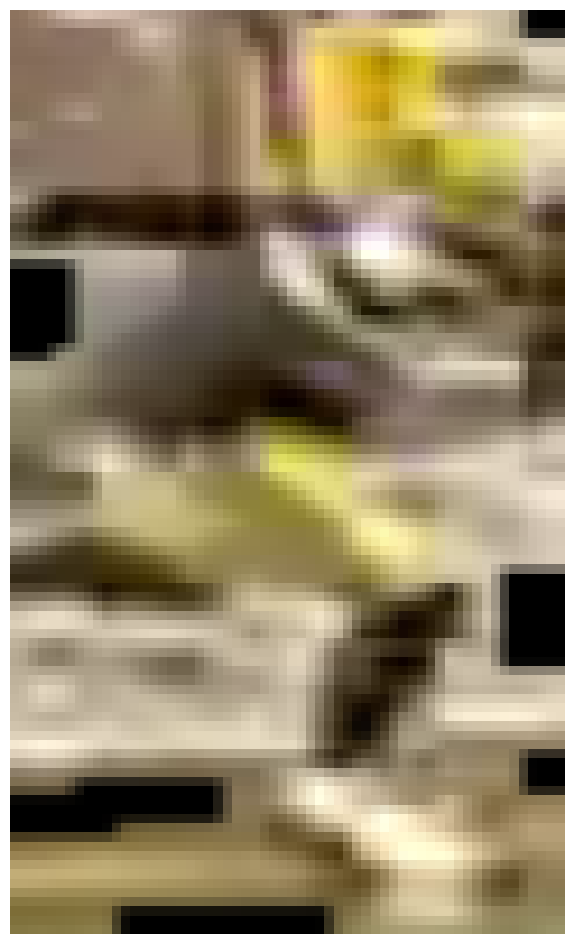

Green Bay Packers 0.37933573 0.40223467

0: 384x640 16 Players, 25.5ms
Speed: 5.5ms preprocess, 25.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 15.9ms
Speed: 2.5ms preprocess, 15.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 14.7ms
Speed: 2.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 34)
(100, 60)


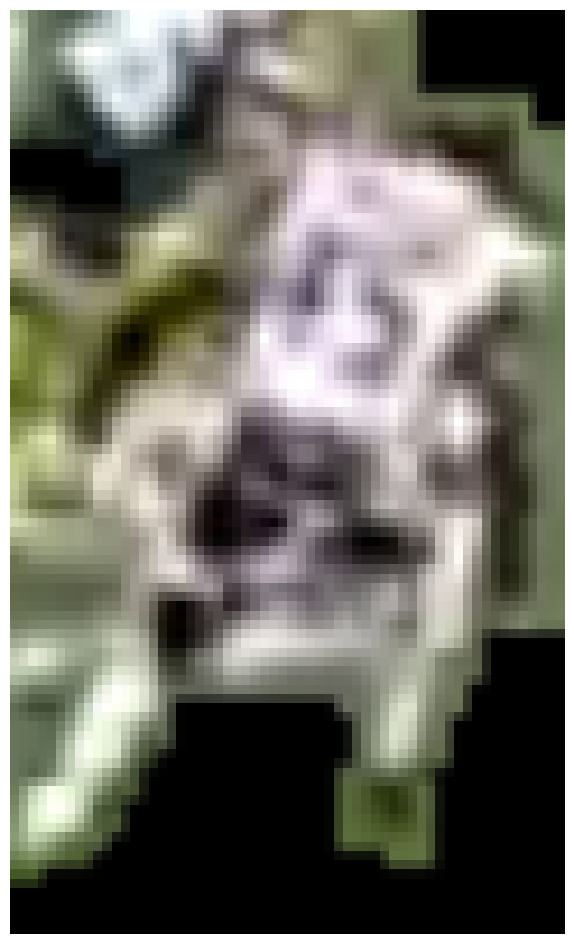

Chicago Bears 0.75010467 0.6493126

0: 384x640 18 Players, 12.8ms
Speed: 3.2ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.5ms
Speed: 2.8ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 16.6ms
Speed: 2.7ms preprocess, 16.6ms infere

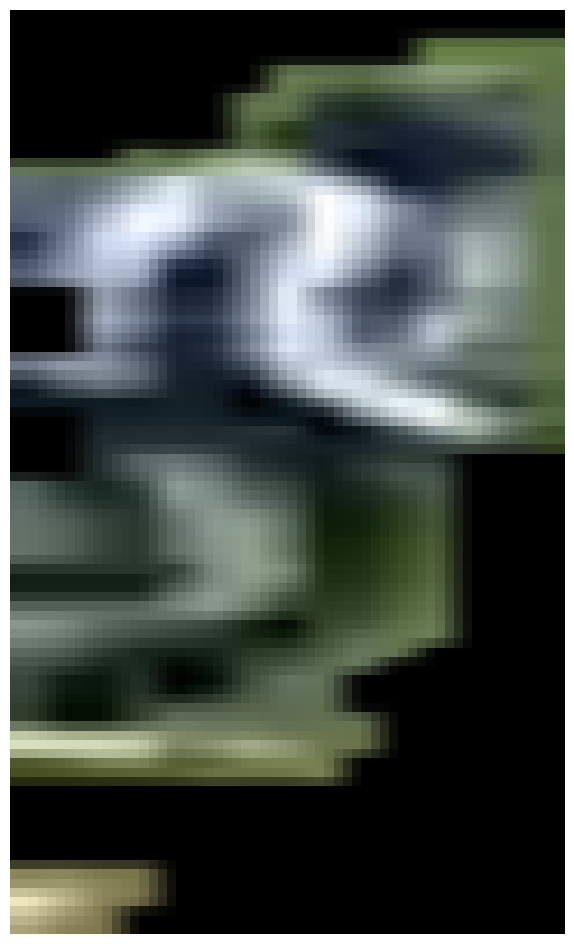

Green Bay Packers 0.6369413 0.7158333

0: 384x640 17 Players, 22.6ms
Speed: 2.6ms preprocess, 22.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 20.1ms
Speed: 2.8ms preprocess, 20.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 19.2ms
Speed: 2.5ms preprocess, 19.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(48, 41)
(100, 60)

0: 384x640 17 Players, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)
(51, 37)
(100, 60)

0: 384x640 17 Players, 18.5ms
Speed: 2.6ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 16.7ms
Speed: 2.6ms preprocess, 16.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 18.6

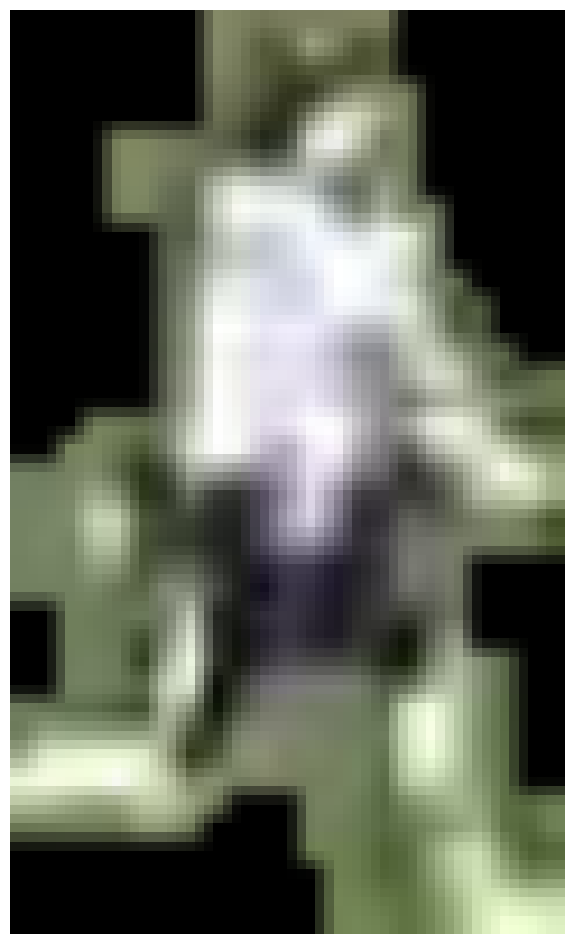

Chicago Bears 0.47693908 0.43549794
(64, 49)
(100, 60)


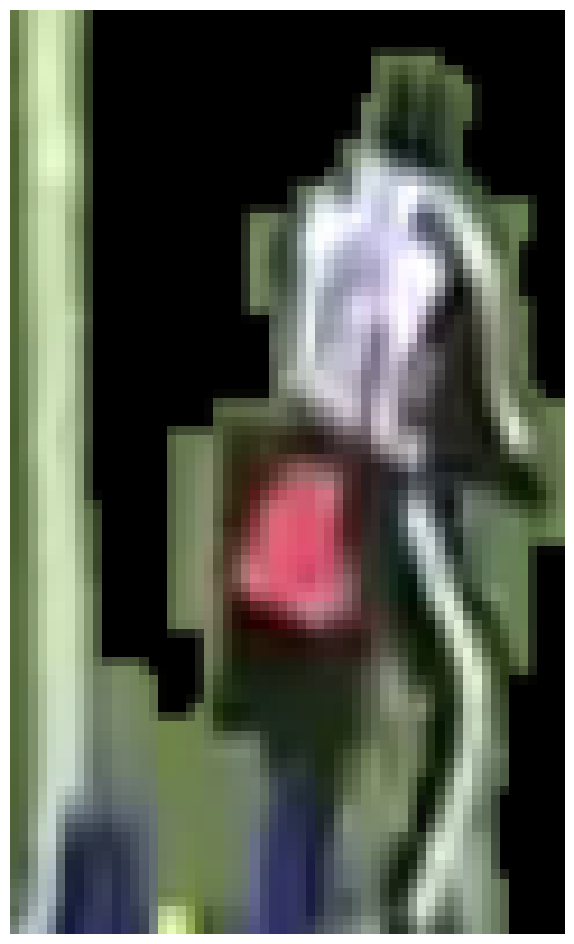

Green Bay Packers 0.5613077 0.58630466

0: 384x640 18 Players, 17.1ms
Speed: 2.6ms preprocess, 17.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 17.3ms
Speed: 2.7ms preprocess, 17.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 16.6ms
Speed: 4.3ms preprocess, 16.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(59, 29)
(100, 60)

0: 384x640 16 Players, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(68, 27)
(100, 60)

0: 384x640 16 Players, 17.4ms
Speed: 2.5ms preprocess, 17.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 Players, 19.5ms
Speed: 3.0ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(48, 38)
(100, 60)

0: 384x640 17 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(60, 40)

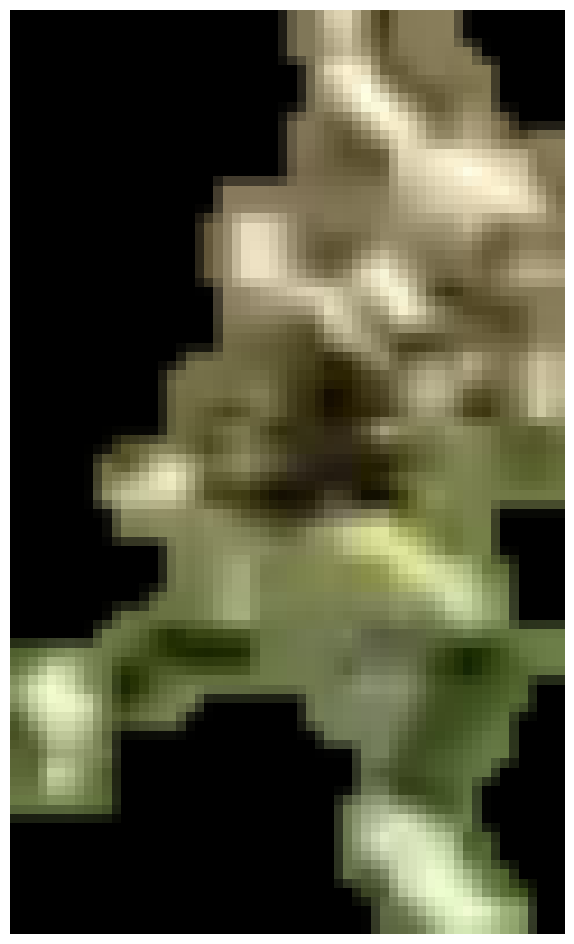

Green Bay Packers 0.40058565 0.4519511

0: 384x640 15 Players, 32.4ms
Speed: 2.6ms preprocess, 32.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Players, 18.9ms
Speed: 3.9ms preprocess, 18.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 18.4ms
Speed: 2.6ms preprocess, 18.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 19.0ms
Speed: 2.5ms preprocess, 19.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 28)
(100, 60)


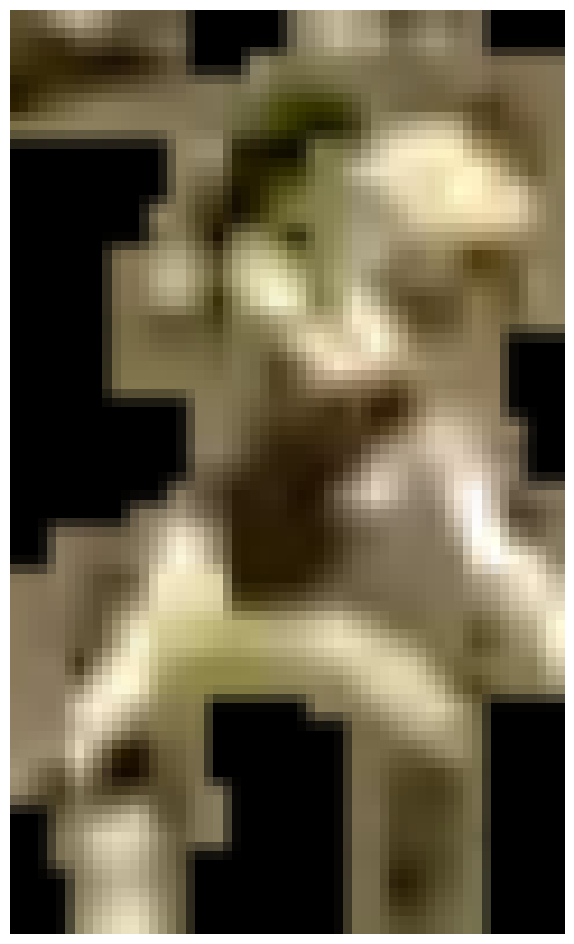

Green Bay Packers 0.3062393 0.35122982
(42, 24)
(100, 60)

0: 384x640 18 Players, 16.5ms
Speed: 2.5ms preprocess, 16.5ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)
(42, 26)
(100, 60)

0: 384x640 18 Players, 16.8ms
Speed: 2.7ms preprocess, 16.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 32)
(100, 60)
(54, 42)
(100, 60)

0: 384x640 19 Players, 19.7ms
Speed: 2.5ms preprocess, 19.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 28)
(100, 60)
(37, 29)
(100, 60)
(47, 41)
(100, 60)

0: 384x640 18 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(40, 25)
(100, 60)
(43, 27)
(100, 60)


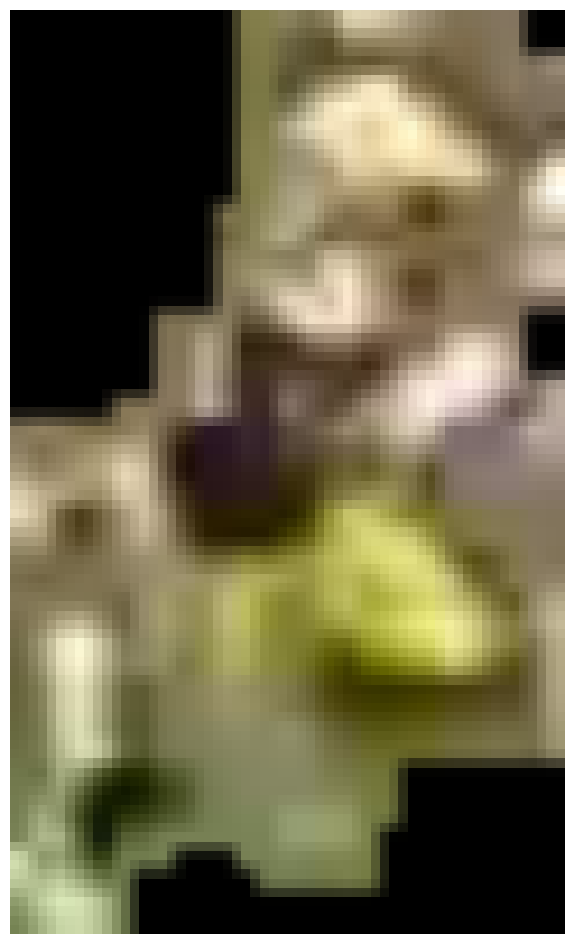

Green Bay Packers 0.41856414 0.45985076

0: 384x640 17 Players, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(38, 26)
(100, 60)

0: 384x640 16 Players, 15.0ms
Speed: 2.6ms preprocess, 15.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 24)
(100, 60)

0: 384x640 16 Players, 23.3ms
Speed: 2.5ms preprocess, 23.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(40, 27)
(100, 60)

0: 384x640 15 Players, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(41, 24)
(100, 60)

0: 384x640 15 Players, 16.9ms
Speed: 2.5ms preprocess, 16.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(41, 25)
(100, 60)

0: 384x640 16 Players, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(41, 26)
(100, 60)
(86, 34)
(100, 60)

0: 384x640 16 Players, 18.5ms
Speed: 2.7ms preprocess, 18.

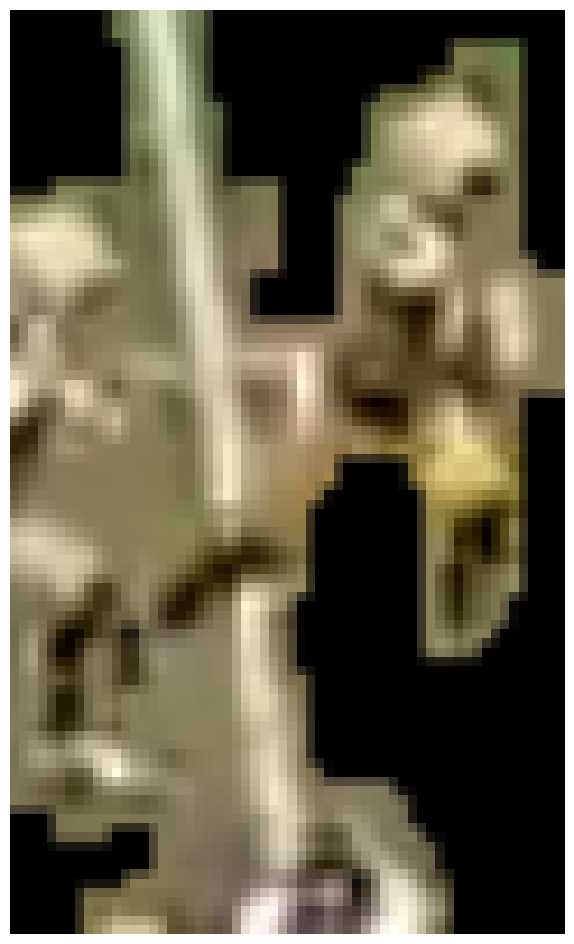

Green Bay Packers 0.35527617 0.39315897

0: 384x640 16 Players, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 25.5ms
Speed: 4.3ms preprocess, 25.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(40, 20)
(100, 60)


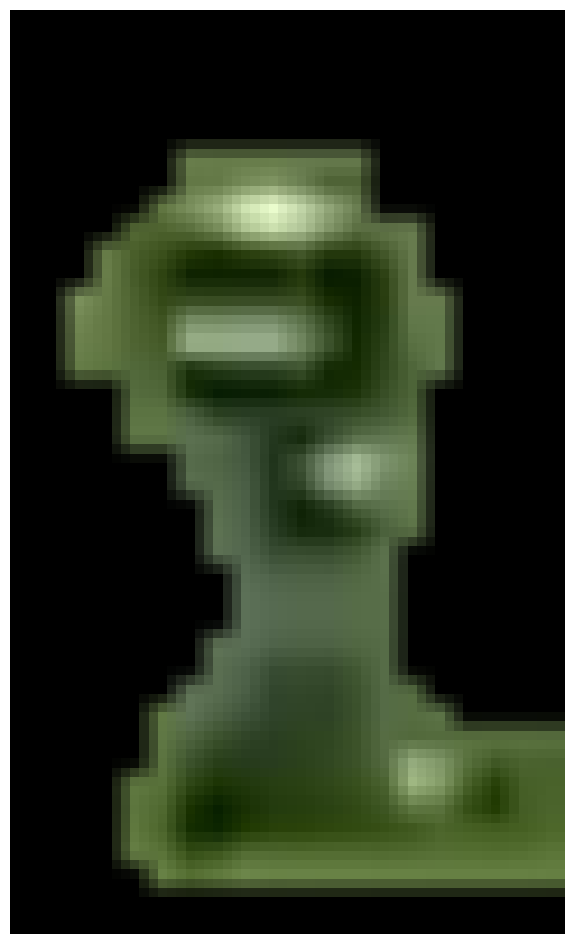

Green Bay Packers 0.27219385 0.34968123

0: 384x640 19 Players, 26.6ms
Speed: 2.4ms preprocess, 26.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(49, 27)
(100, 60)


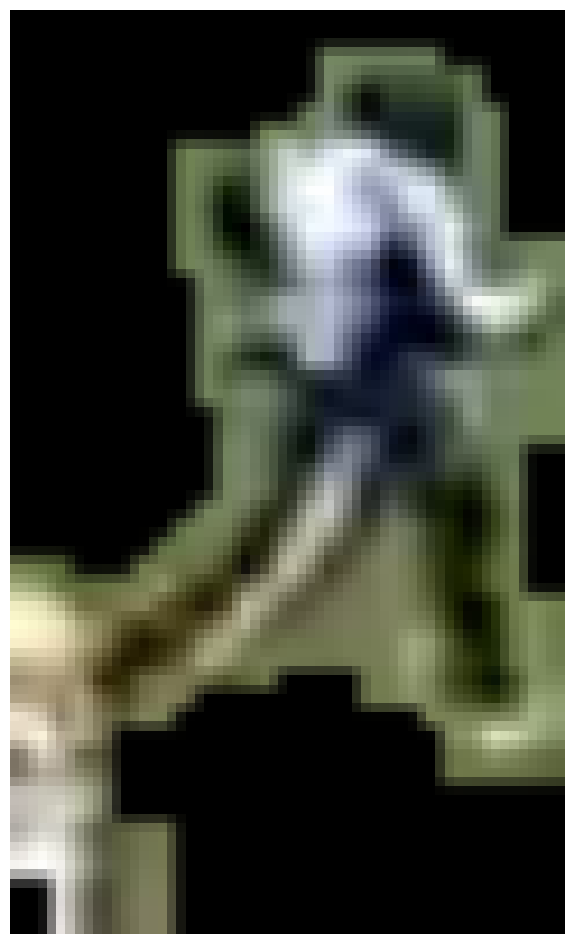

Green Bay Packers 0.5777576 0.6301459

0: 384x640 20 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(52, 18)
(100, 60)


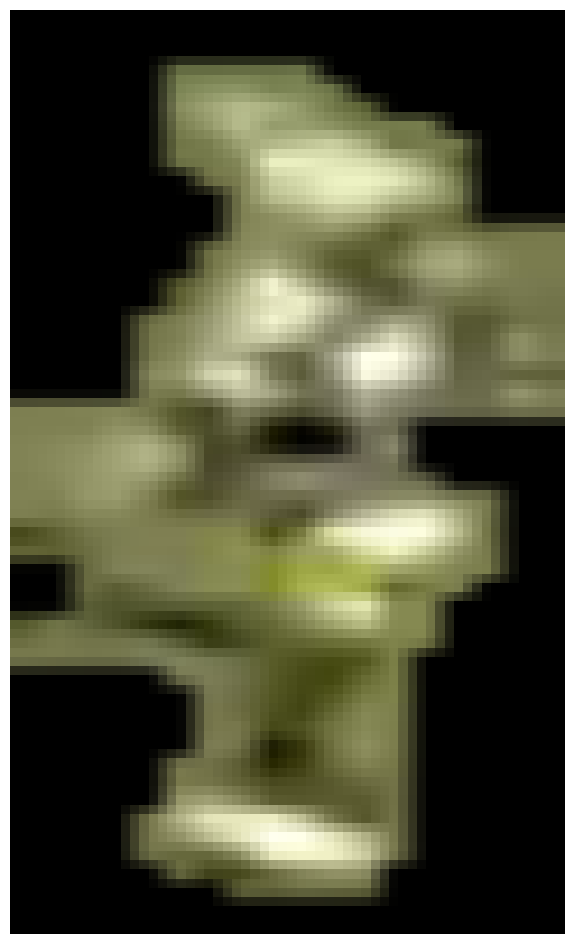

Green Bay Packers 0.31731242 0.35177937

0: 384x640 20 Players, 15.9ms
Speed: 2.7ms preprocess, 15.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 16.4ms
Speed: 6.0ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(41, 35)
(100, 60)


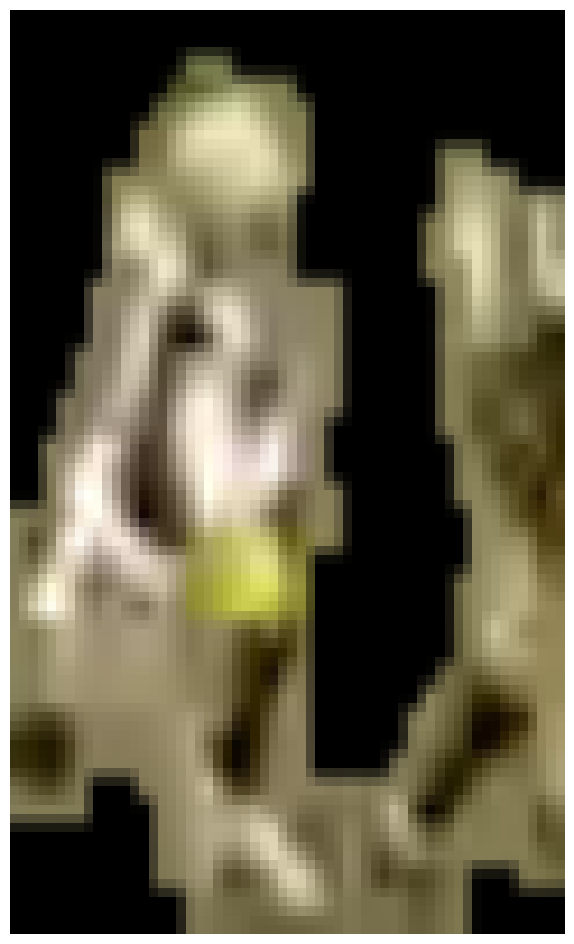

Green Bay Packers 0.36805 0.40427217

0: 384x640 18 Players, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 19.3ms
Speed: 2.4ms preprocess, 19.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(52, 21)
(100, 60)


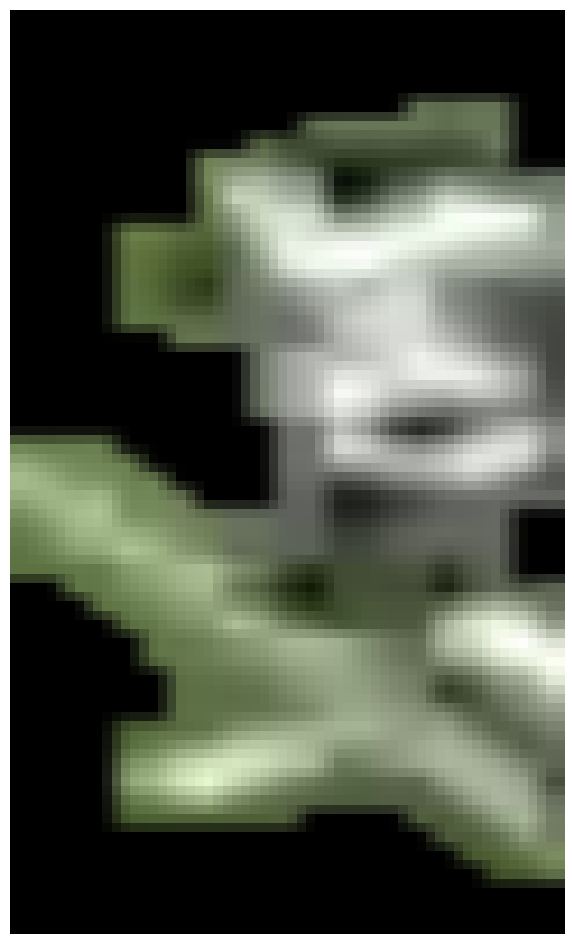

Chicago Bears 0.33515903 0.30824658

0: 384x640 20 Players, 1 Referee, 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)
(48, 37)
(100, 60)

0: 384x640 21 Players, 1 Referee, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(51, 36)
(100, 60)
(50, 28)
(100, 60)

0: 384x640 23 Players, 20.5ms
Speed: 2.6ms preprocess, 20.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(48, 38)
(100, 60)
(46, 38)
(100, 60)

0: 384x640 22 Players, 1 Referee, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 40)
(100, 60)
(45, 33)
(100, 60)
(39, 29)
(100, 60)


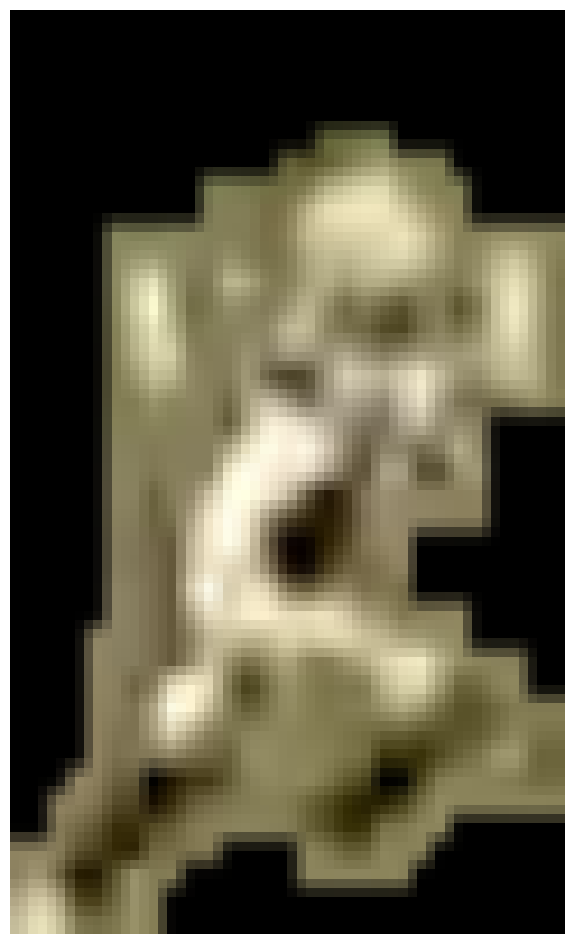

Green Bay Packers 0.33758017 0.3679219

0: 384x640 21 Players, 1 Referee, 12.9ms
Speed: 3.1ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(47, 40)
(100, 60)
(47, 36)
(100, 60)
(50, 18)
(100, 60)
(42, 27)
(100, 60)


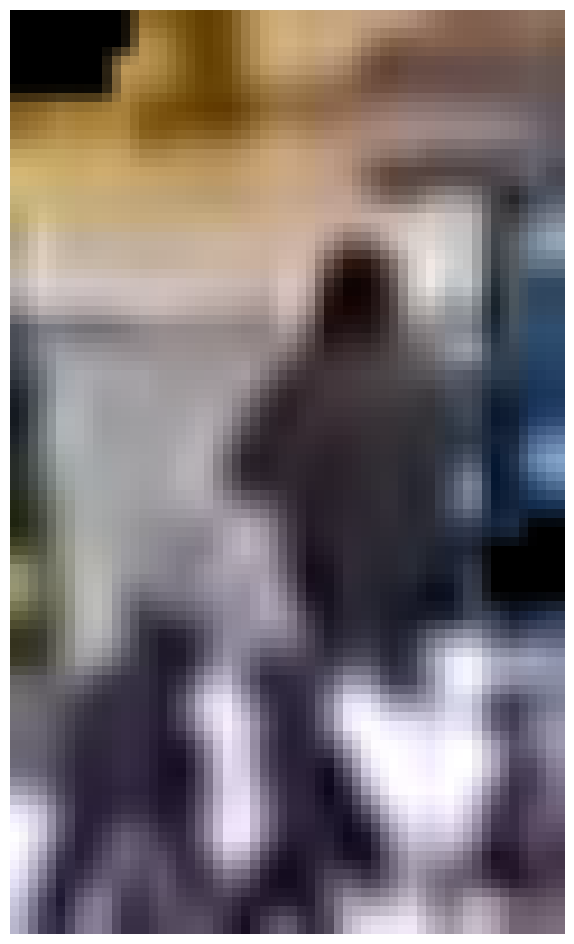

Chicago Bears 0.72126085 0.6811388

0: 384x640 20 Players, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 37)
(100, 60)
(49, 31)
(100, 60)
(48, 32)
(100, 60)
(47, 18)
(100, 60)

0: 384x640 19 Players, 1 Referee, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(38, 36)
(100, 60)
(52, 27)
(100, 60)
(46, 30)
(100, 60)
(47, 19)
(100, 60)

0: 384x640 23 Players, 1 Referee, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(50, 26)
(100, 60)
(47, 19)
(100, 60)

0: 384x640 24 Players, 2 Referees, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(56, 30)
(100, 60)
(47, 22)
(100, 60)
(38, 21)
(100, 60)
(47, 31)
(100, 60)

0: 384x640 25 Players, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 29)
(100, 60)
(48, 2

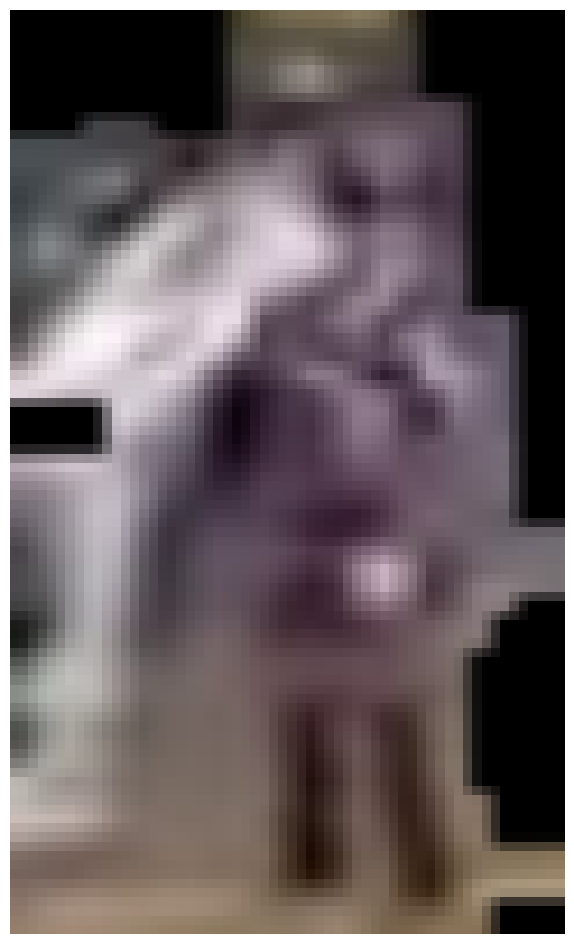

Chicago Bears 0.71795046 0.6277886
(39, 21)
(100, 60)


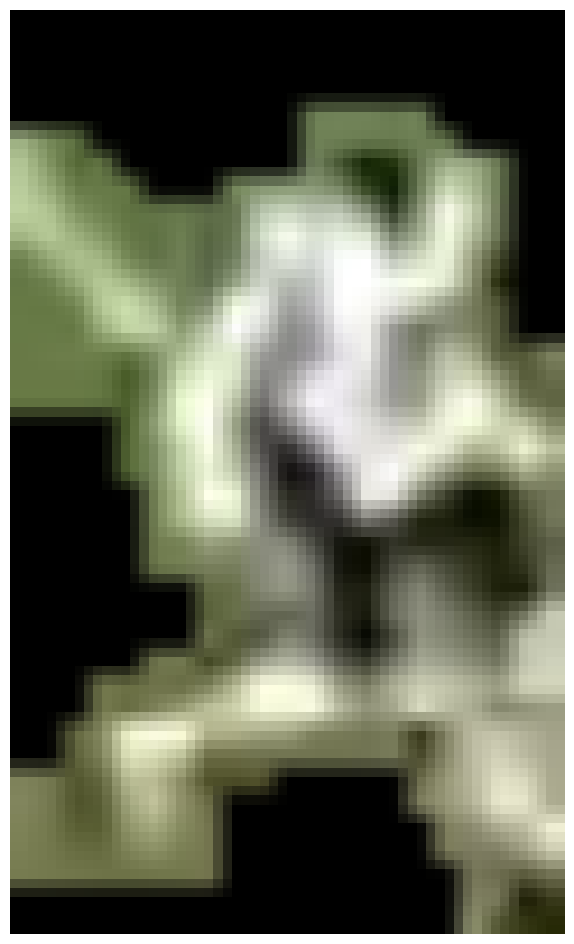

Chicago Bears 0.43246958 0.408783
(48, 18)
(100, 60)

0: 384x640 25 Players, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(54, 25)
(100, 60)
(48, 25)
(100, 60)
(42, 35)
(100, 60)

0: 384x640 21 Players, 1 Referee, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(54, 27)
(100, 60)

0: 384x640 19 Players, 3 Referees, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(55, 26)
(100, 60)
(44, 30)
(100, 60)


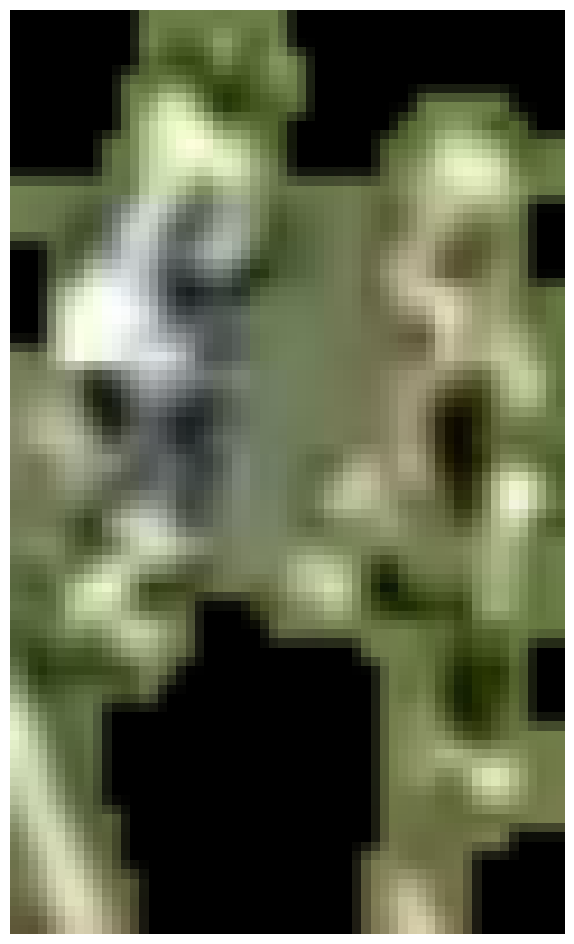

Green Bay Packers 0.40482494 0.42528892

0: 384x640 21 Players, 2 Referees, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(56, 29)
(100, 60)


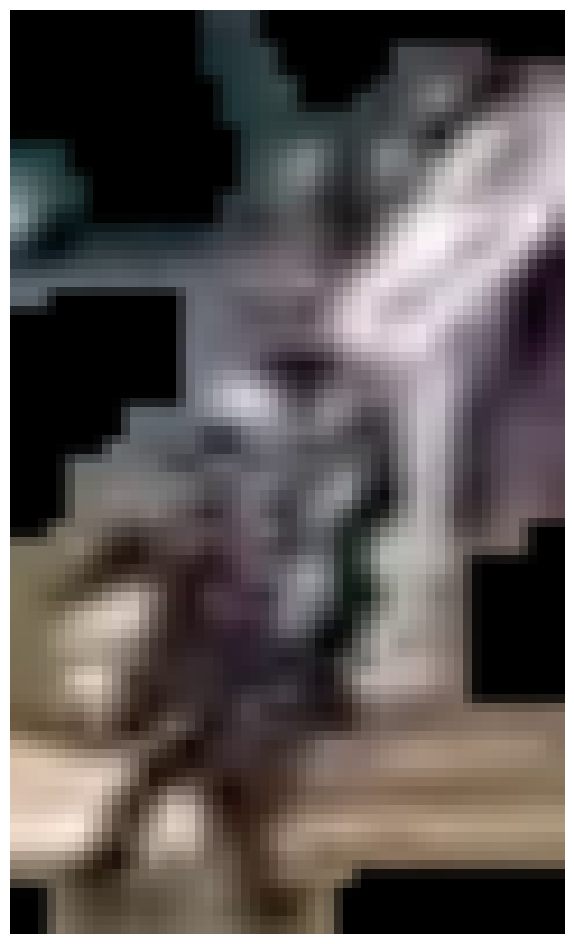

Chicago Bears 0.8060039 0.74003524
(49, 22)
(100, 60)


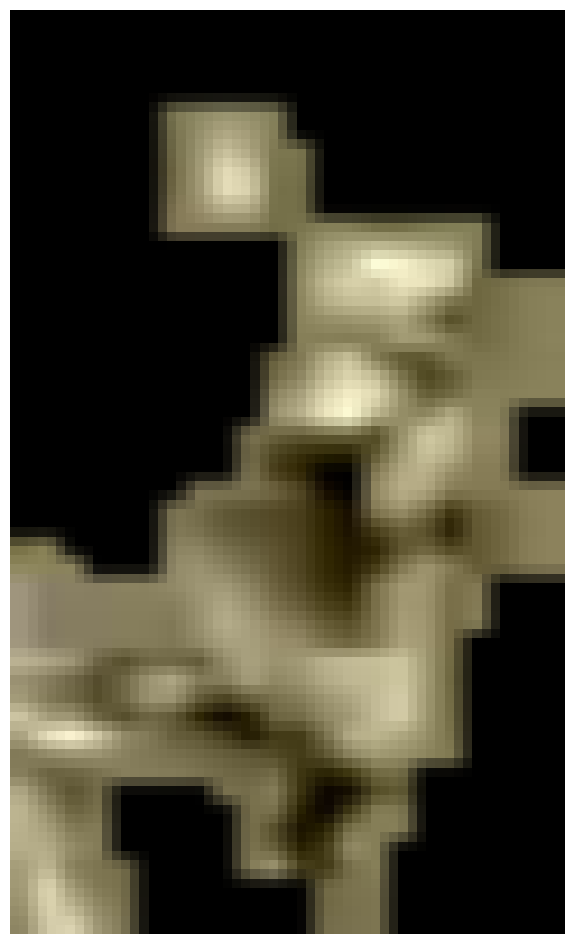

Green Bay Packers 0.28108615 0.31609684
(62, 28)
(100, 60)

0: 384x640 22 Players, 1 Referee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(60, 28)
(100, 60)

0: 384x640 22 Players, 1 Referee, 15.5ms
Speed: 2.7ms preprocess, 15.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(49, 27)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(42, 27)
(100, 60)

0: 384x640 22 Players, 1 Referee, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(38, 27)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Refer

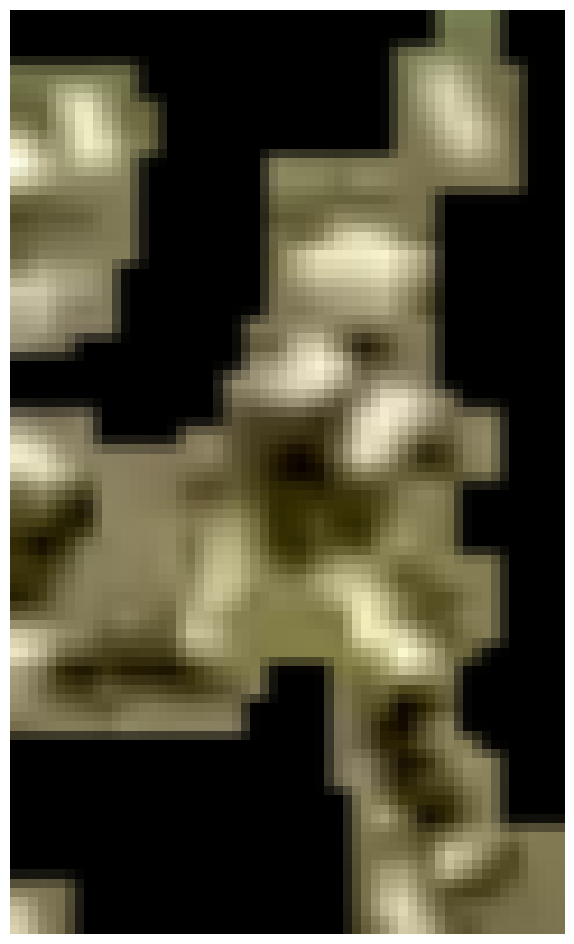

Green Bay Packers 0.28781173 0.3268939

0: 384x640 21 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 1 Referee, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 20.0ms
Speed: 2.9ms preprocess, 20.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 1 Referee, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 Players, 1 Referee, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3

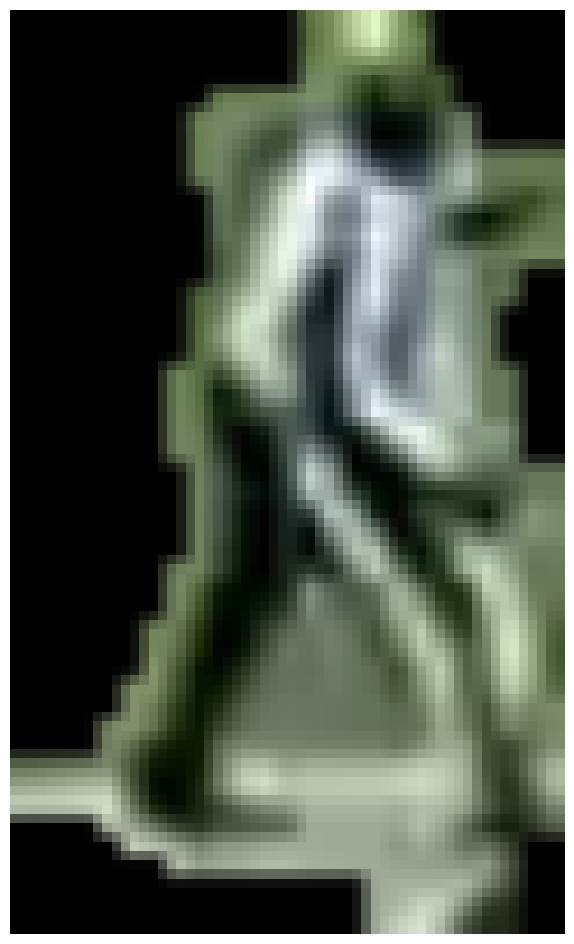

Green Bay Packers 0.46114683 0.482966

0: 384x640 20 Players, 1 Referee, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 20.4ms
Speed: 2.5ms preprocess, 20.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(44, 28)
(100, 60)

0: 384x640 20 Players, 1 Referee, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(45, 28)
(100, 60)


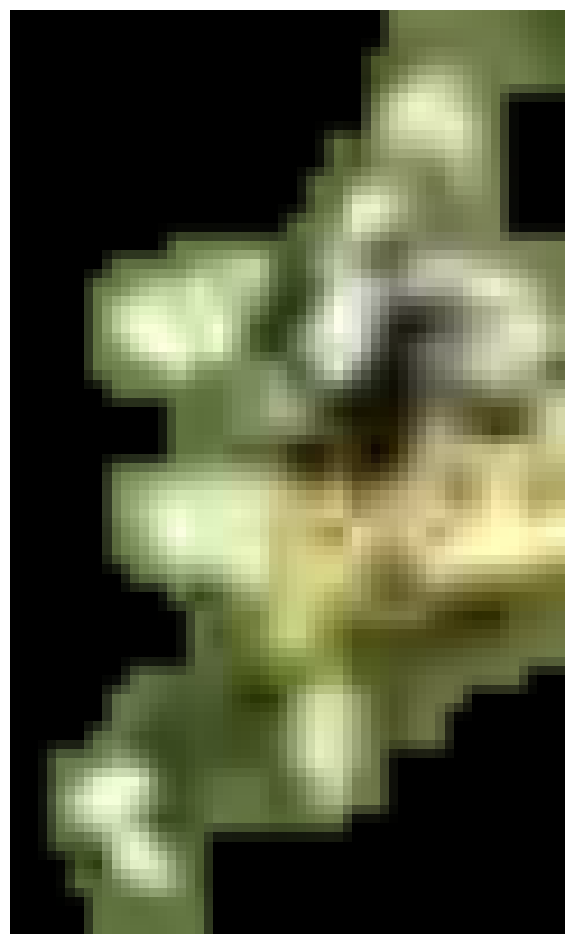

Green Bay Packers 0.37488225 0.40299544

0: 384x640 21 Players, 1 Referee, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(29, 46)
(100, 60)

0: 384x640 23 Players, 1 Referee, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 1 Referee, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 2 Referees, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(69, 20)
(100, 60)


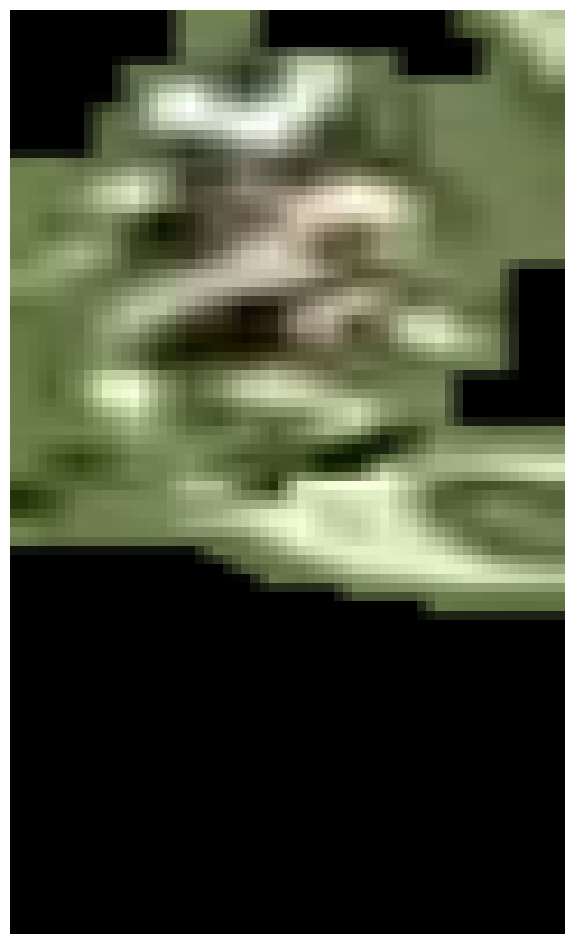

Green Bay Packers 0.35480142 0.3788107

0: 384x640 20 Players, 2 Referees, 21.1ms
Speed: 3.3ms preprocess, 21.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640

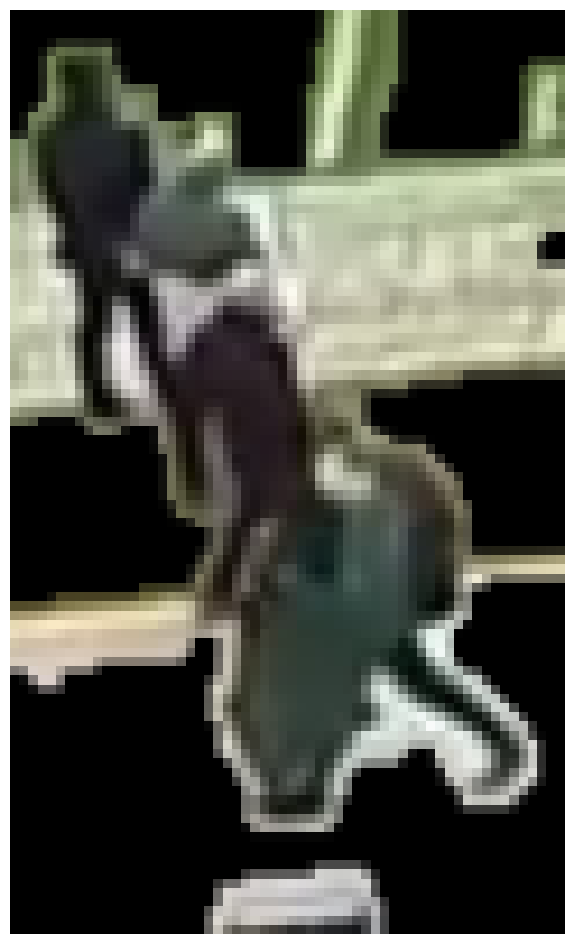

Chicago Bears 0.7021475 0.6681511

0: 384x640 20 Players, 1 Referee, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 18.2ms
Speed: 4.9ms preprocess, 18.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 1 Referee, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(47, 25)
(100, 60)


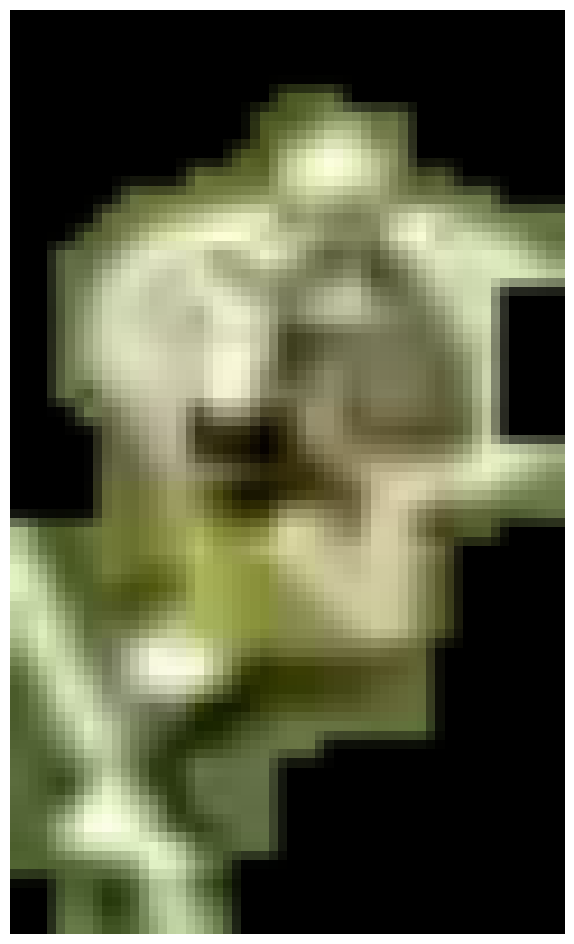

Green Bay Packers 0.34745276 0.3722537

0: 384x640 21 Players, 1 Referee, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(42, 20)
(100, 60)


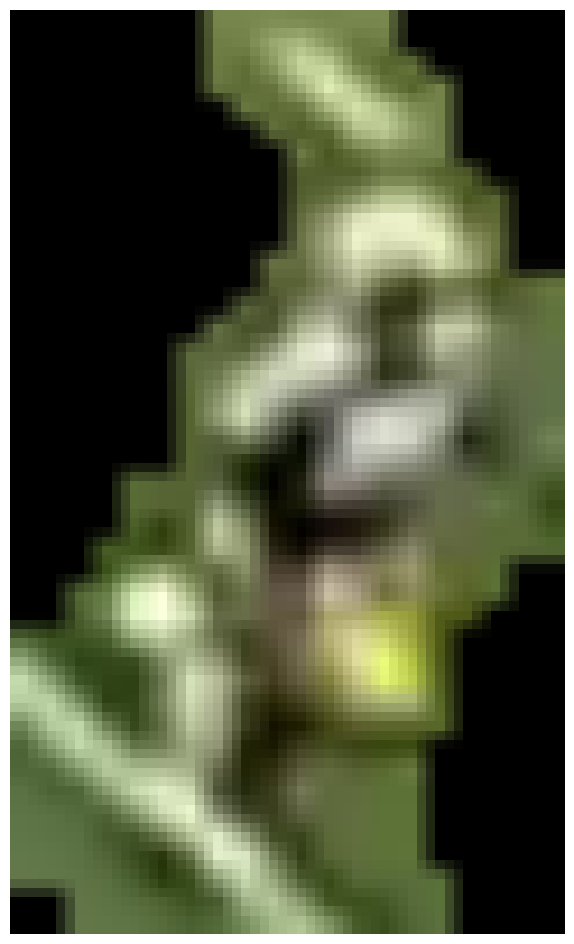

Green Bay Packers 0.33009392 0.3695278

0: 384x640 21 Players, 1 Referee, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 16.2ms
Speed: 2.4ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 20.1ms
Speed: 3.8ms preprocess, 20.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Player

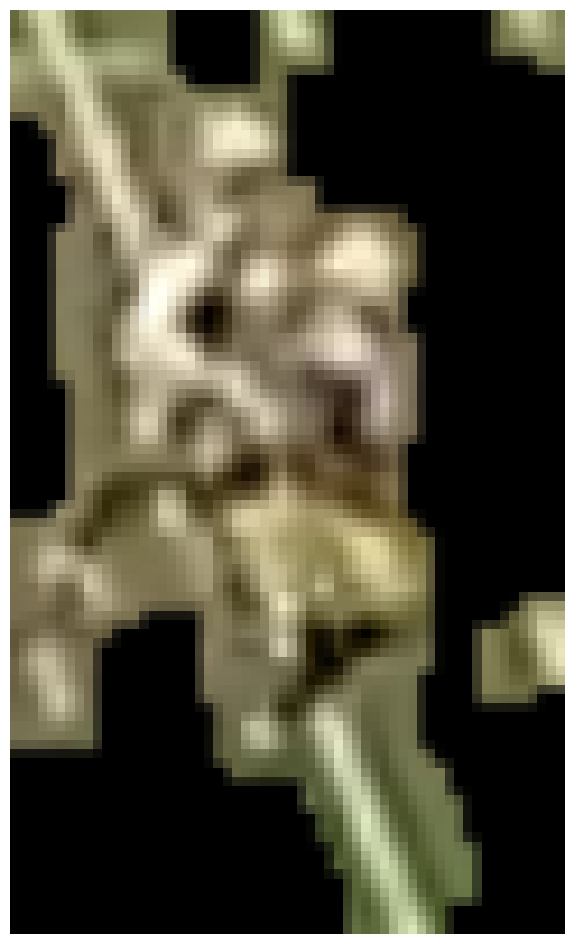

Green Bay Packers 0.38965932 0.43037778

0: 384x640 21 Players, 2 Referees, 15.5ms
Speed: 3.5ms preprocess, 15.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
(52, 21)
(100, 60)


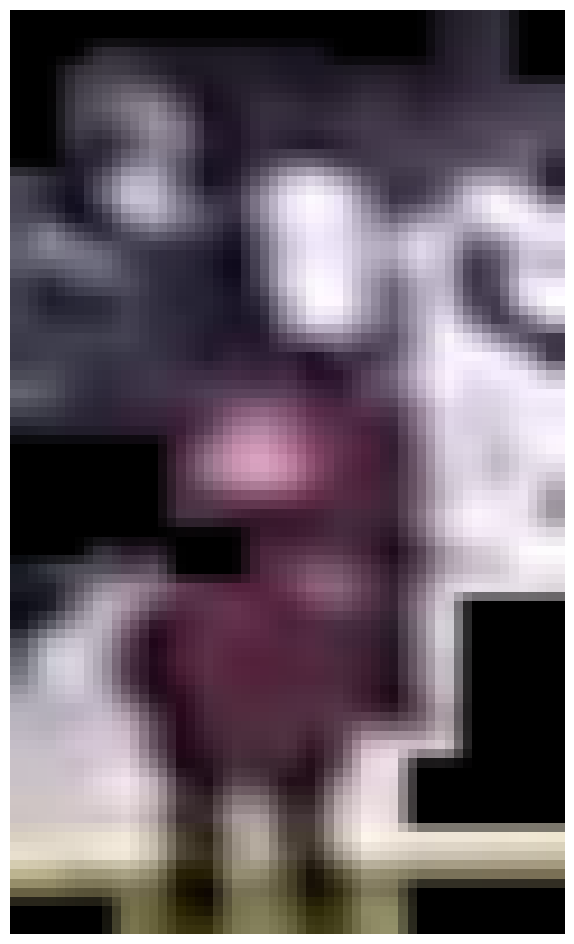

Chicago Bears 0.6261158 0.56694007
(68, 45)
(100, 60)


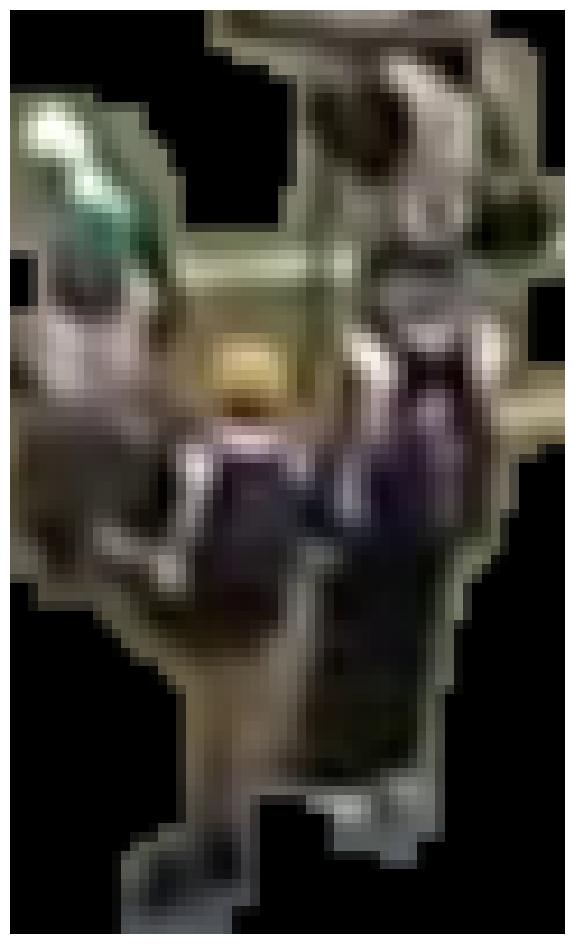

Green Bay Packers 0.66653407 0.687998

0: 384x640 24 Players, 2 Referees, 20.5ms
Speed: 2.5ms preprocess, 20.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(102, 45)
(100, 60)


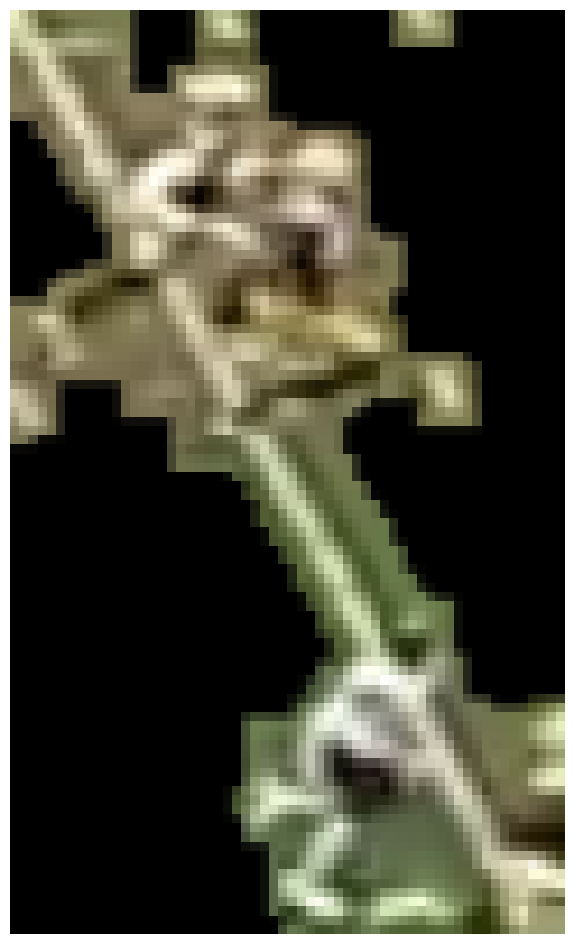

Green Bay Packers 0.45021978 0.48254576

0: 384x640 24 Players, 1 Referee, 17.1ms
Speed: 2.4ms preprocess, 17.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(58, 31)
(100, 60)


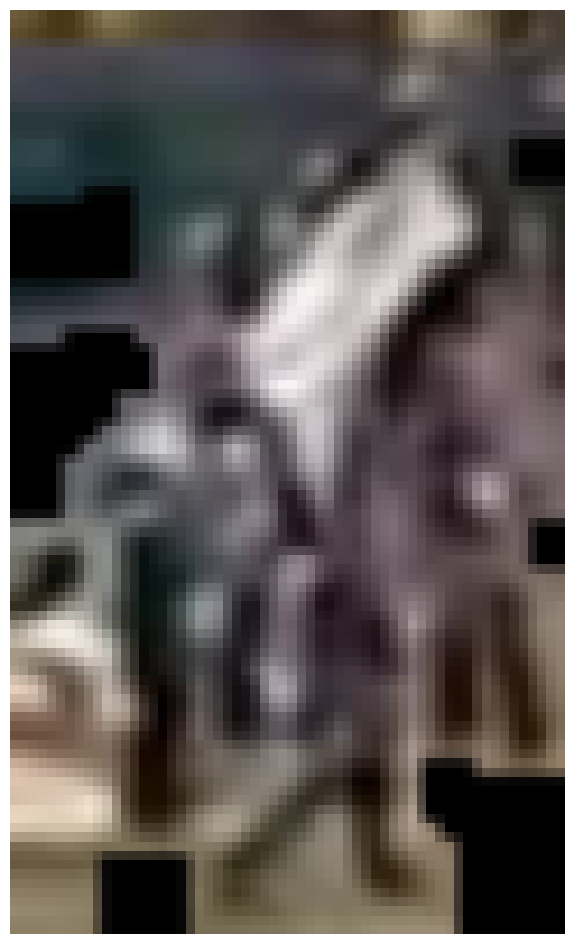

Chicago Bears 0.8127825 0.77315956

0: 384x640 22 Players, 2 Referees, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 2 Referees, 25.1ms
Speed: 2.4ms preprocess, 25.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 Players, 1 Referee, 20.0ms
Speed: 2.4ms preprocess, 20.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(46, 21)
(100, 60)
(61, 27)
(100, 60)


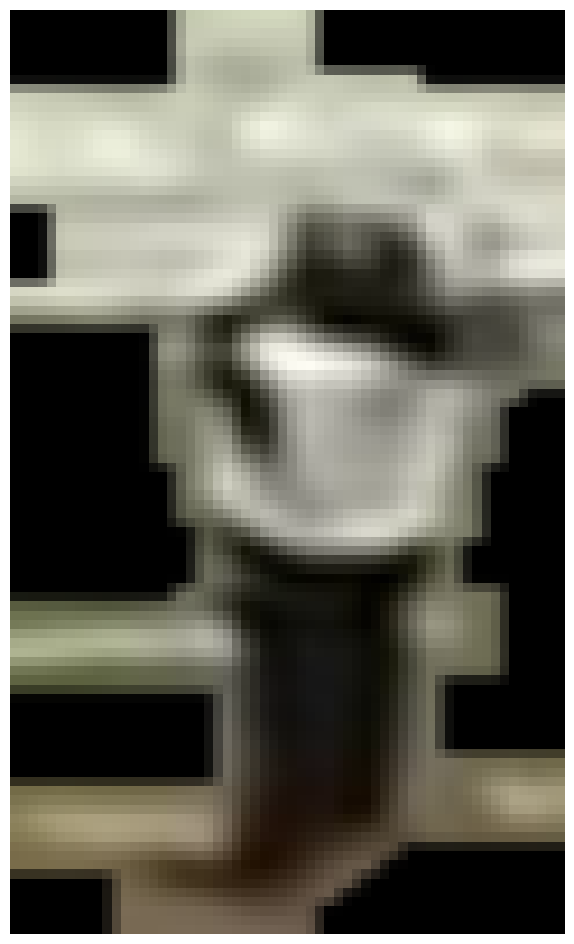

Chicago Bears 0.47197688 0.4255159

0: 384x640 21 Players, 1 Referee, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 1 Referee, 17.0ms
Speed: 2.6ms preprocess, 17.0ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 1 Referee, 18.0ms
Speed: 2.7ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(51, 36)
(100, 60)

0: 384x640 22 Players, 2 Referees, 25.3ms
Speed: 2.6ms preprocess, 25.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(51, 42)
(100, 60)
(43, 27)
(100, 60)

0: 384x640 23 Players, 2 Referees, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 28)
(100, 60)

0: 384x640 23 Players, 2 Referees, 19.0ms
Speed: 2.8ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 2 Referees, 25.2ms
Speed: 2.

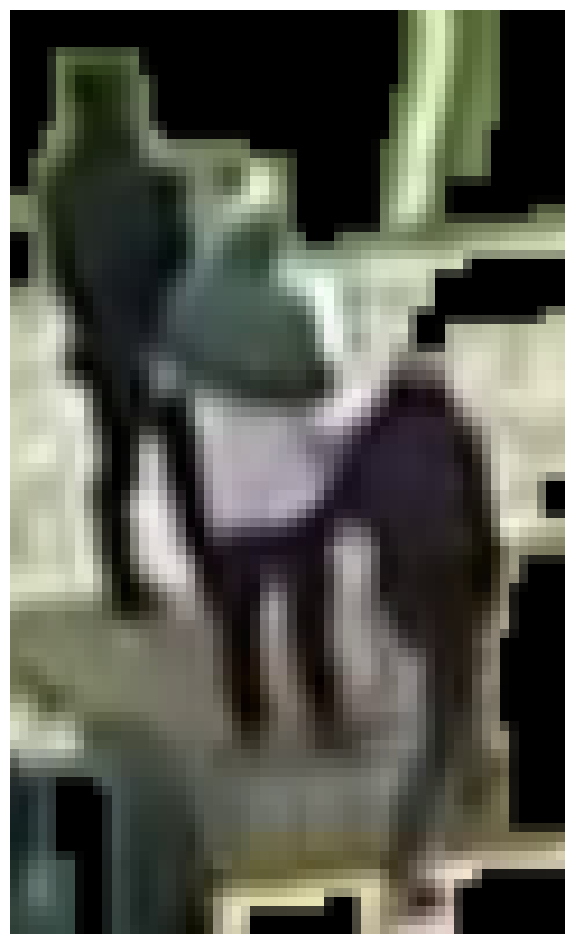

Chicago Bears 0.7320162 0.71167505

0: 384x640 18 Players, 1 Referee, 16.2ms
Speed: 2.5ms preprocess, 16.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
(49, 39)
(100, 60)
(61, 25)
(100, 60)

0: 384x640 19 Players, 2 Referees, 15.7ms
Speed: 2.5ms preprocess, 15.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 3 Referees, 17.7ms
Speed: 2.6ms preprocess, 17.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(72, 26)
(100, 60)
(60, 25)
(100, 60)
(58, 26)
(100, 60)


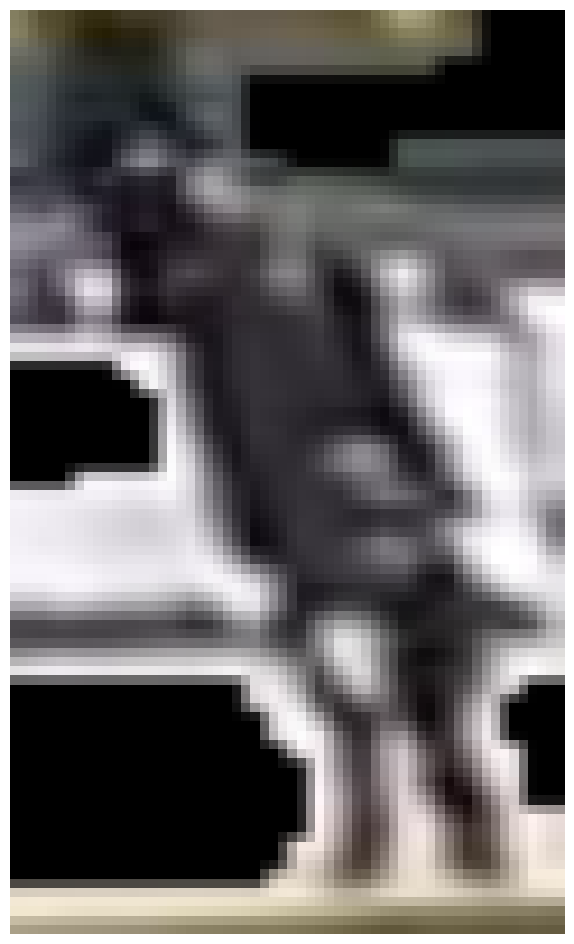

Chicago Bears 0.64803505 0.5150644

0: 384x640 19 Players, 3 Referees, 17.8ms
Speed: 2.6ms preprocess, 17.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(76, 25)
(100, 60)
(69, 54)
(100, 60)


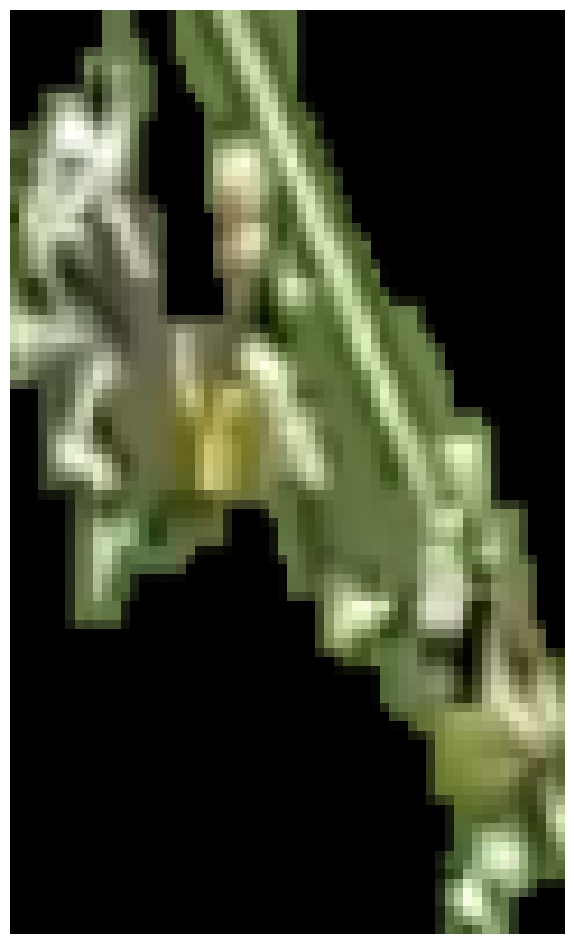

Green Bay Packers 0.3535526 0.38771242
(34, 27)
(100, 60)

0: 384x640 20 Players, 2 Referees, 13.9ms
Speed: 4.5ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(76, 26)
(100, 60)


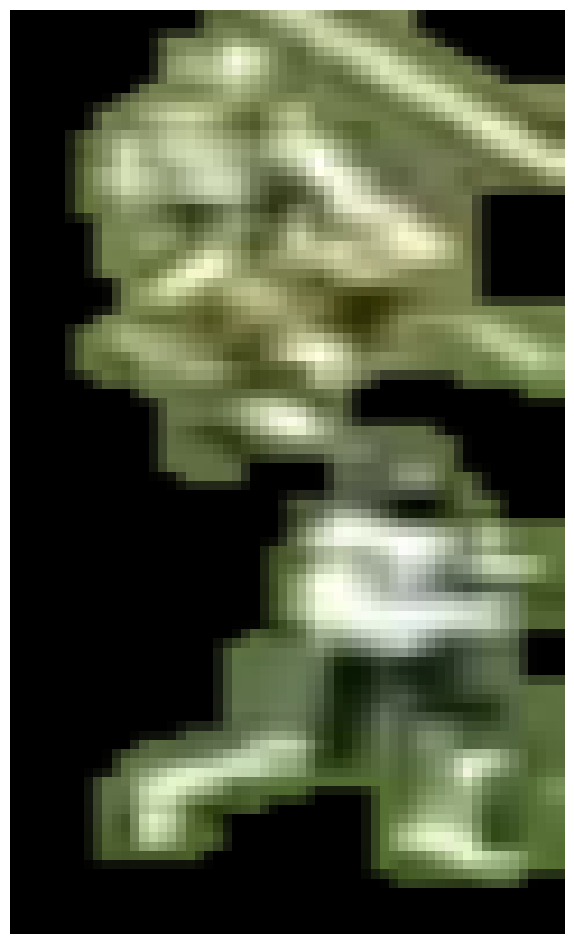

Green Bay Packers 0.35396895 0.3779955
(35, 28)
(100, 60)

0: 384x640 22 Players, 2 Referees, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(42, 19)
(100, 60)
(31, 23)
(100, 60)


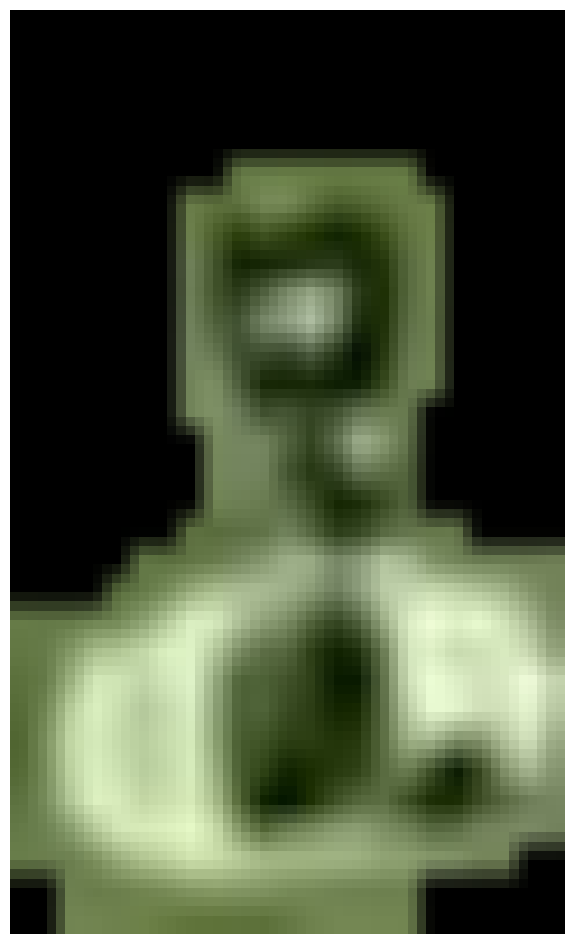

Green Bay Packers 0.23292264 0.25576112
(36, 26)
(100, 60)

0: 384x640 23 Players, 2 Referees, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(40, 19)
(100, 60)
(39, 31)
(100, 60)

0: 384x640 25 Players, 2 Referees, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)
(40, 19)
(100, 60)
(39, 30)
(100, 60)

0: 384x640 23 Players, 1 Referee, 16.4ms
Speed: 2.4ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(42, 19)
(100, 60)

0: 384x640 28 Players, 1 Referee, 20.1ms
Speed: 2.4ms preprocess, 20.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 19)
(100, 60)
(52, 45)
(100, 60)


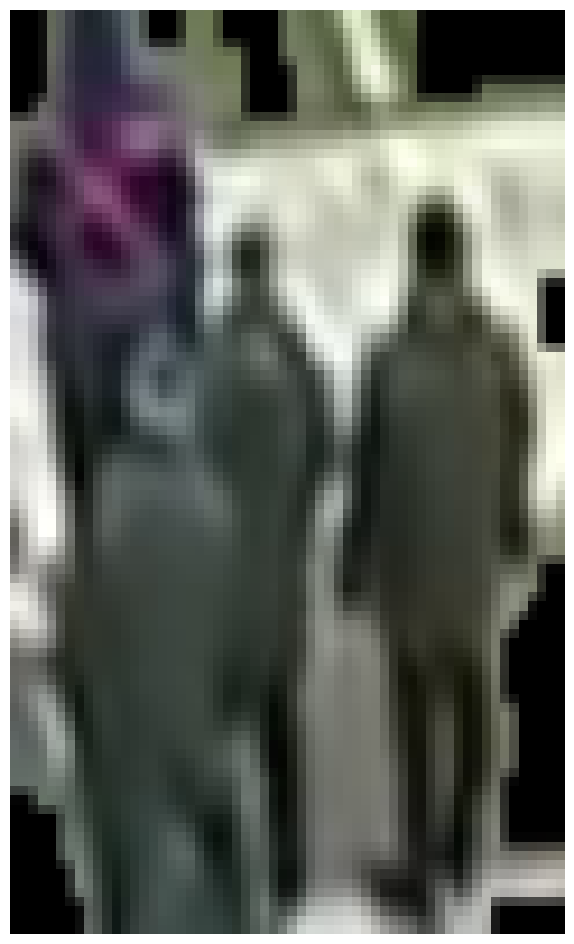

Chicago Bears 0.6511524 0.62967455

0: 384x640 23 Players, 2 Referees, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(40, 19)
(100, 60)
(38, 22)
(100, 60)

0: 384x640 19 Players, 3 Referees, 17.3ms
Speed: 2.5ms preprocess, 17.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(36, 19)
(100, 60)
(38, 24)
(100, 60)

0: 384x640 18 Players, 3 Referees, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(33, 19)
(100, 60)
(66, 27)
(100, 60)

0: 384x640 19 Players, 1 Referee, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 1 Referee, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(35, 20)
(100, 60)
(39, 20)
(100, 60)

0: 384x640 20 Players, 1 Referee, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at

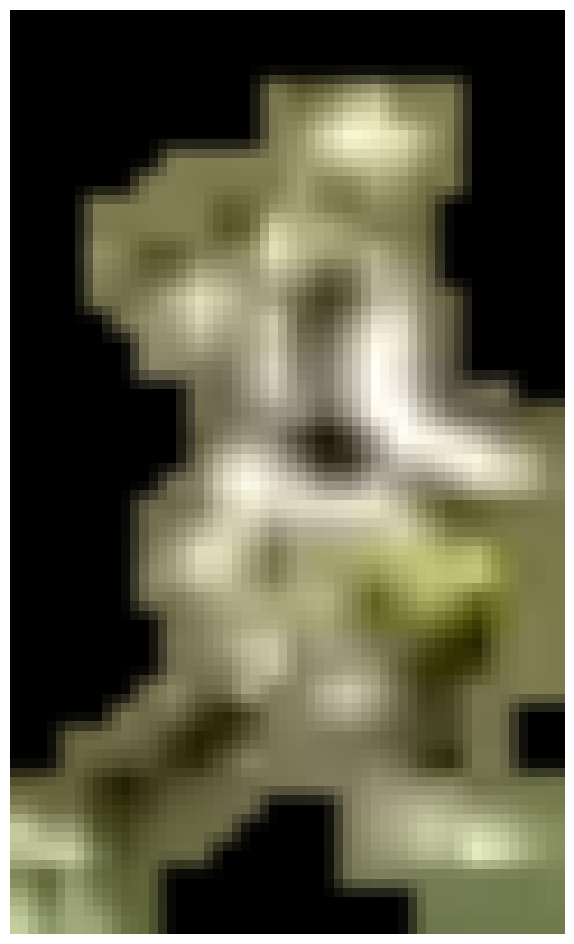

Green Bay Packers 0.32468647 0.34737405

0: 384x640 23 Players, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(33, 21)
(100, 60)
(40, 21)
(100, 60)
(45, 37)
(100, 60)


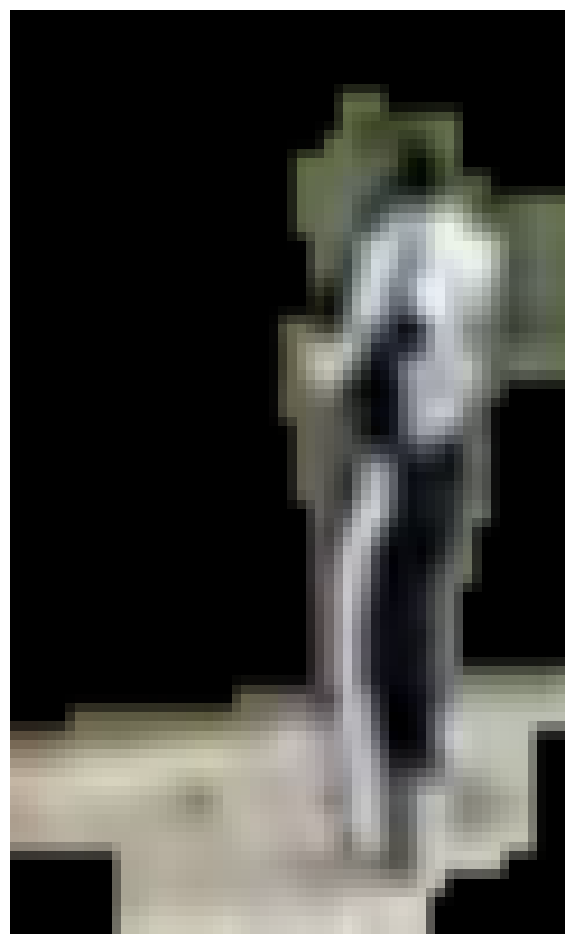

Chicago Bears 0.711877 0.64621836

0: 384x640 23 Players, 1 Referee, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(32, 22)
(100, 60)
(42, 21)
(100, 60)
(27, 23)
(100, 60)

0: 384x640 26 Players, 1 Referee, 14.5ms
Speed: 3.2ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(32, 22)
(100, 60)
(41, 20)
(100, 60)
(29, 21)
(100, 60)

0: 384x640 23 Players, 1 Referee, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(33, 21)
(100, 60)
(36, 25)
(100, 60)

0: 384x640 22 Players, 18.2ms
Speed: 5.6ms preprocess, 18.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(33, 21)
(100, 60)
(34, 27)
(100, 60)

0: 384x640 21 Players, 15.3ms
Speed: 2.6ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(34, 21)
(100, 60)
(33, 27)
(100, 60)

0: 384x640 22 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms in

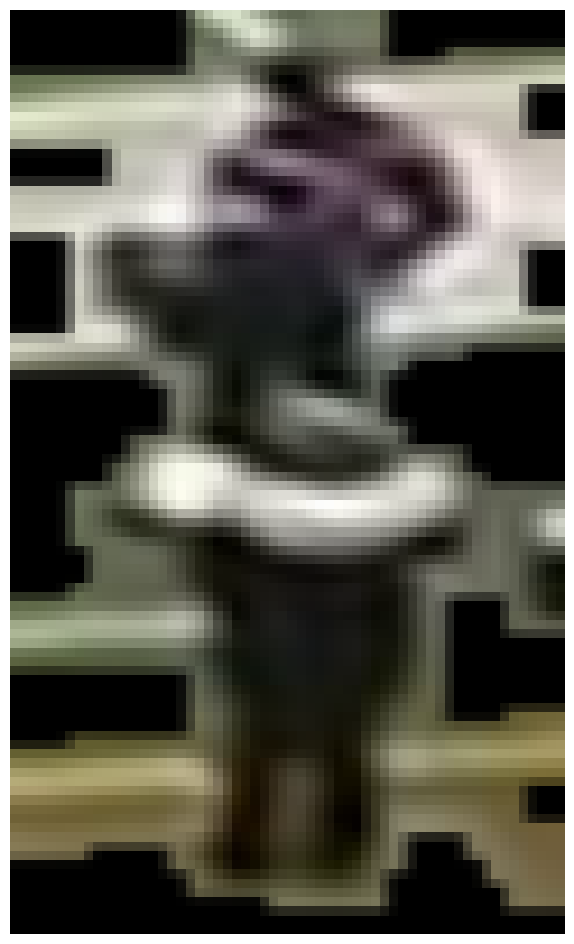

Chicago Bears 0.5881885 0.56011647

0: 384x640 21 Players, 15.3ms
Speed: 9.6ms preprocess, 15.3ms inference, 4.2ms postprocess per image at shape (1, 3, 384, 640)
(31, 25)
(100, 60)

0: 384x640 23 Players, 1 Referee, 12.1ms
Speed: 5.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(41, 21)
(100, 60)
(33, 24)
(100, 60)

0: 384x640 23 Players, 1 Referee, 19.5ms
Speed: 4.7ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(36, 23)
(100, 60)
(36, 21)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(42, 24)
(100, 60)
(37, 20)
(100, 60)
(36, 23)
(100, 60)

0: 384x640 22 Players, 17.7ms
Speed: 2.5ms preprocess, 17.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(39, 23)
(100, 60)

0: 384x640 21 Players, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384

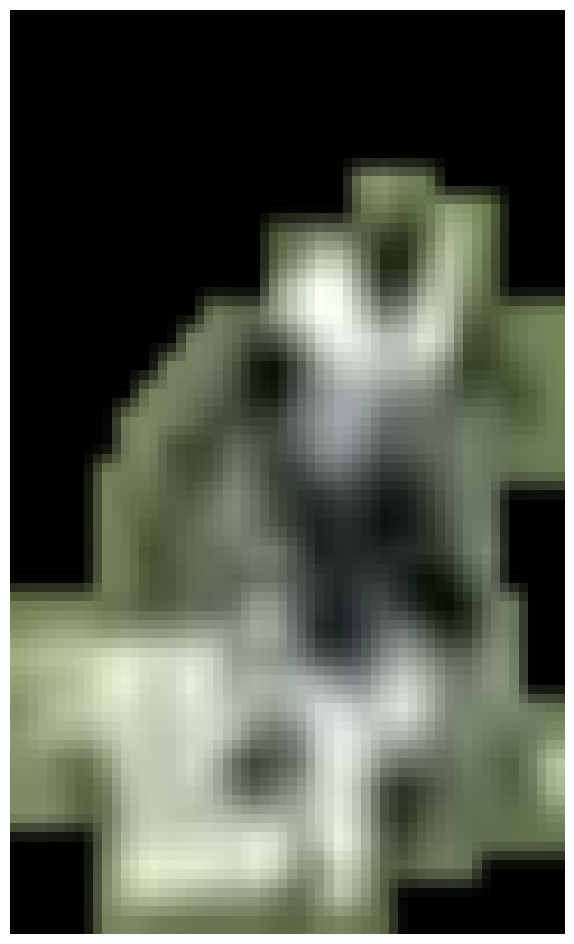

Chicago Bears 0.45600194 0.43397722
(34, 23)
(100, 60)
(32, 30)
(100, 60)
(67, 24)
(100, 60)

0: 384x640 25 Players, 22.5ms
Speed: 2.6ms preprocess, 22.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 25)
(100, 60)


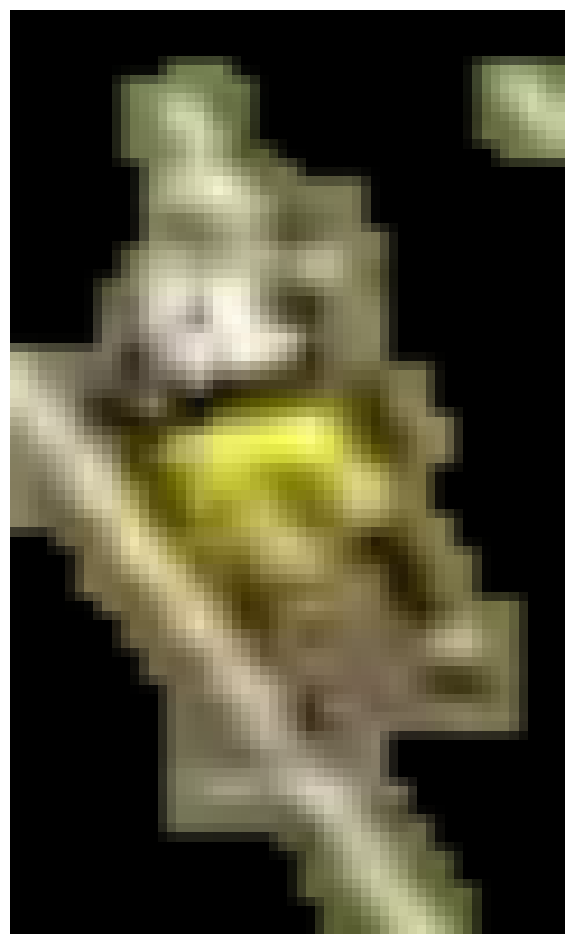

Green Bay Packers 0.36458278 0.40433344
(34, 24)
(100, 60)

0: 384x640 25 Players, 14.7ms
Speed: 2.7ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(35, 24)
(100, 60)

0: 384x640 21 Players, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(35, 24)
(100, 60)

0: 384x640 19 Players, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(35, 24)
(100, 60)

0: 384x640 20 Players, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(35, 24)
(100, 60)

0: 384x640 21 Players, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(68, 30)
(100, 60)


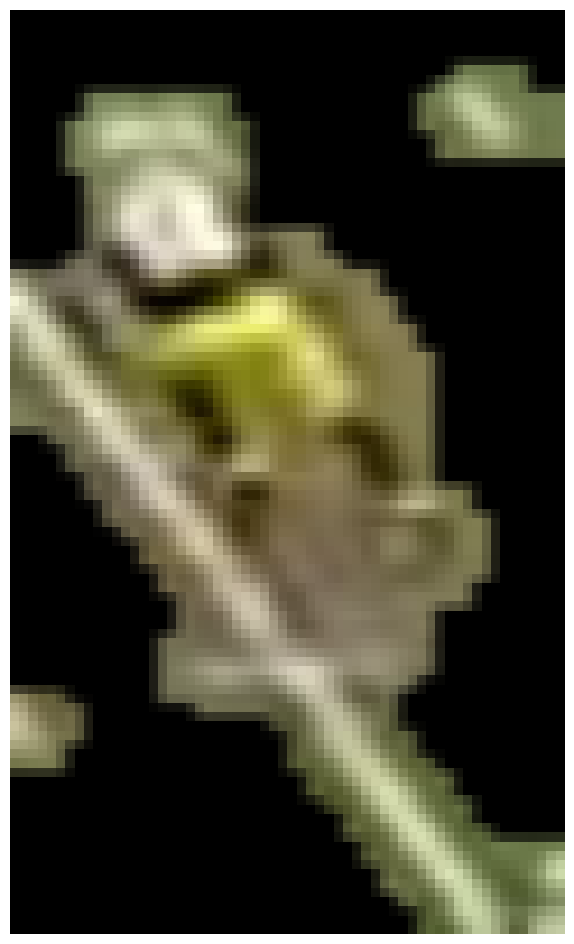

Green Bay Packers 0.37951258 0.42035636

0: 384x640 22 Players, 24.0ms
Speed: 5.1ms preprocess, 24.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(30, 25)
(100, 60)

0: 384x640 22 Players, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(34, 23)
(100, 60)
(30, 24)
(100, 60)

0: 384x640 24 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(29, 24)
(100, 60)
(60, 32)
(100, 60)

0: 384x640 22 Players, 1 Referee, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(40, 23)
(100, 60)
(61, 40)
(100, 60)
(63, 34)
(100, 60)

0: 384x640 21 Players, 1 Referee, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(42, 24)
(100, 60)


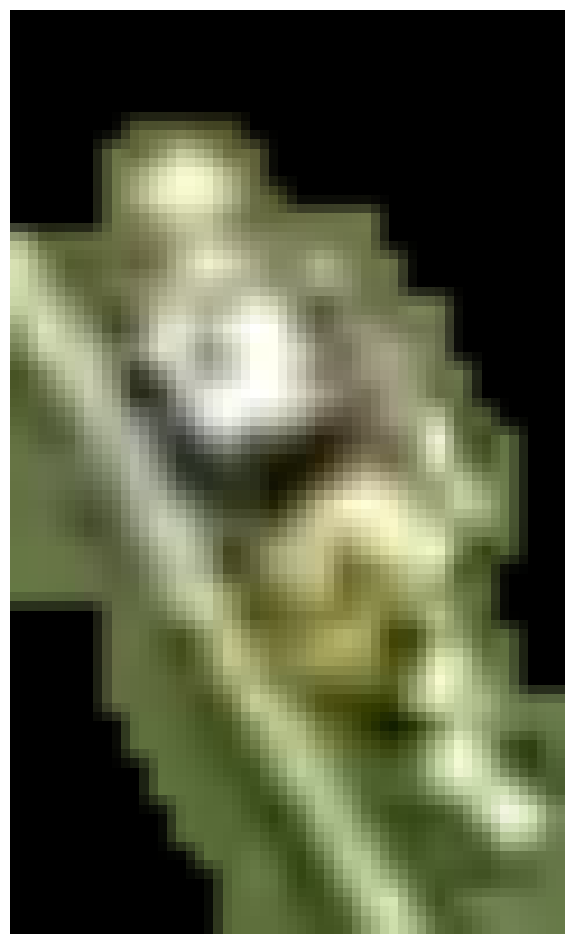

Green Bay Packers 0.36603525 0.38906854
(61, 43)
(100, 60)
(62, 28)
(100, 60)

0: 384x640 23 Players, 12.4ms
Speed: 2.9ms preprocess, 12.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(62, 43)
(100, 60)
(56, 23)
(100, 60)

0: 384x640 24 Players, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(61, 41)
(100, 60)
(61, 23)
(100, 60)


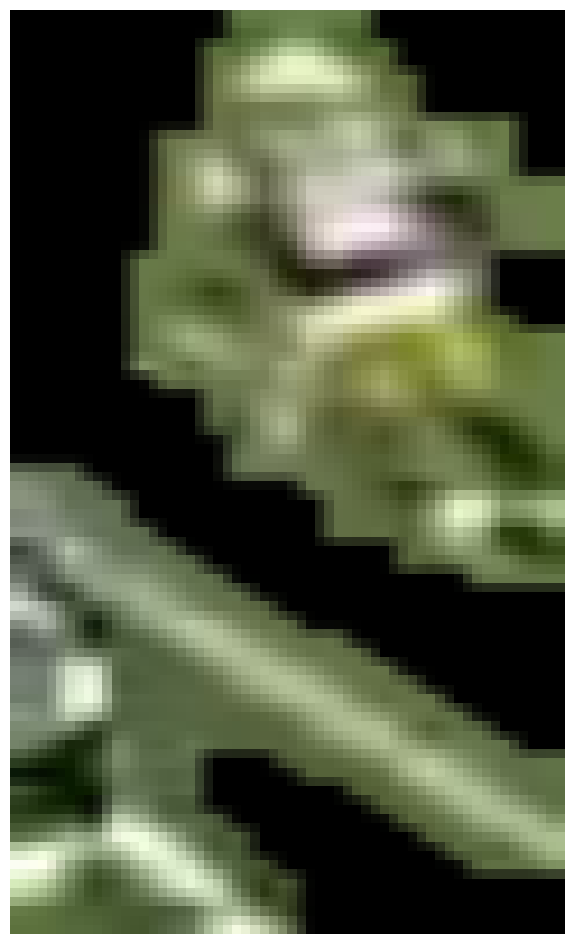

Green Bay Packers 0.36506823 0.3902953

0: 384x640 24 Players, 1 Referee, 19.6ms
Speed: 5.9ms preprocess, 19.6ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)
(53, 31)
(100, 60)


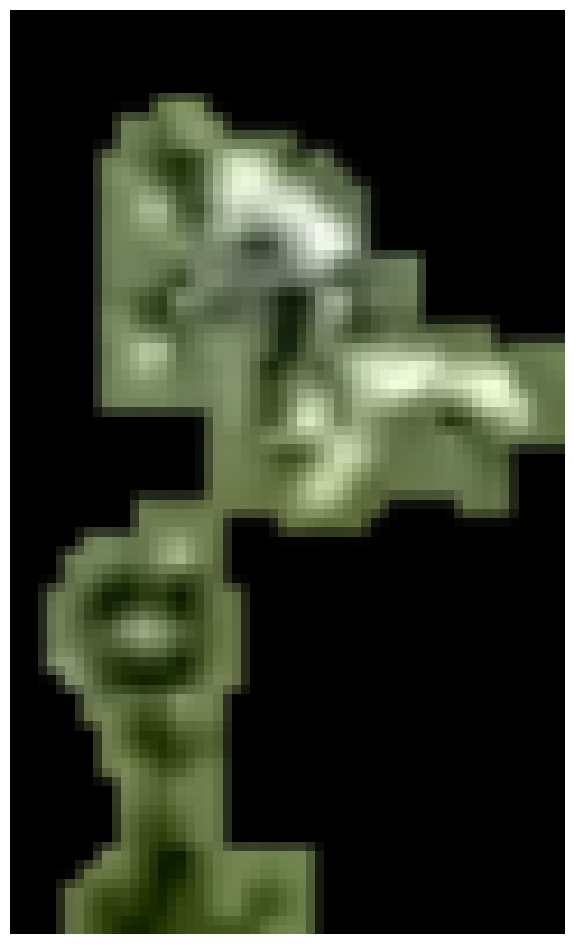

Green Bay Packers 0.2833182 0.31669214
(63, 38)
(100, 60)

0: 384x640 24 Players, 1 Referee, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(35, 21)
(100, 60)
(63, 35)
(100, 60)

0: 384x640 22 Players, 1 Referee, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(36, 20)
(100, 60)
(62, 32)
(100, 60)

0: 384x640 24 Players, 1 Referee, 14.7ms
Speed: 2.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(37, 20)
(100, 60)
(61, 32)
(100, 60)

0: 384x640 22 Players, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(38, 21)
(100, 60)
(61, 29)
(100, 60)

0: 384x640 21 Players, 21.7ms
Speed: 3.7ms preprocess, 21.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
(40, 21)
(100, 60)
(62, 29)
(100, 60)

0: 384x640 20 Players, 1 Referee, 14.6ms
Speed: 2.4ms preprocess, 14.6ms infer

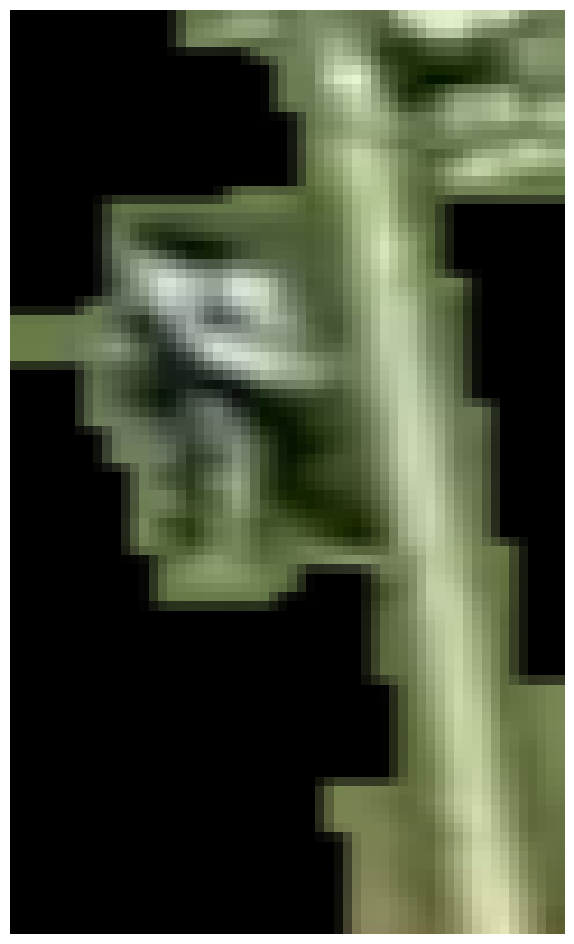

Green Bay Packers 0.34227097 0.37454048
(44, 29)
(100, 60)

0: 384x640 23 Players, 1 Referee, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(42, 25)
(100, 60)
(68, 30)
(100, 60)

0: 384x640 20 Players, 1 Referee, 21.8ms
Speed: 3.8ms preprocess, 21.8ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)
(42, 23)
(100, 60)


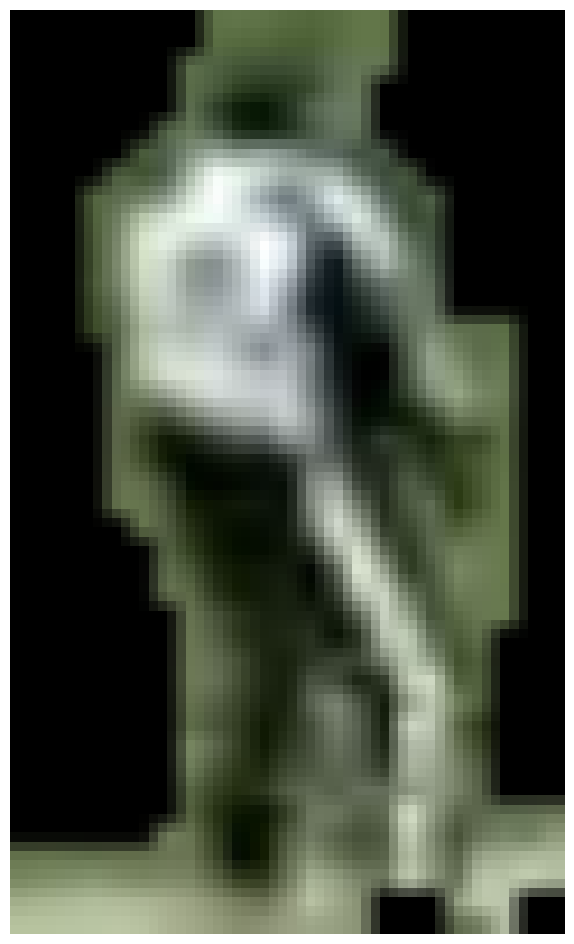

Green Bay Packers 0.42267174 0.44297948
(53, 33)
(100, 60)


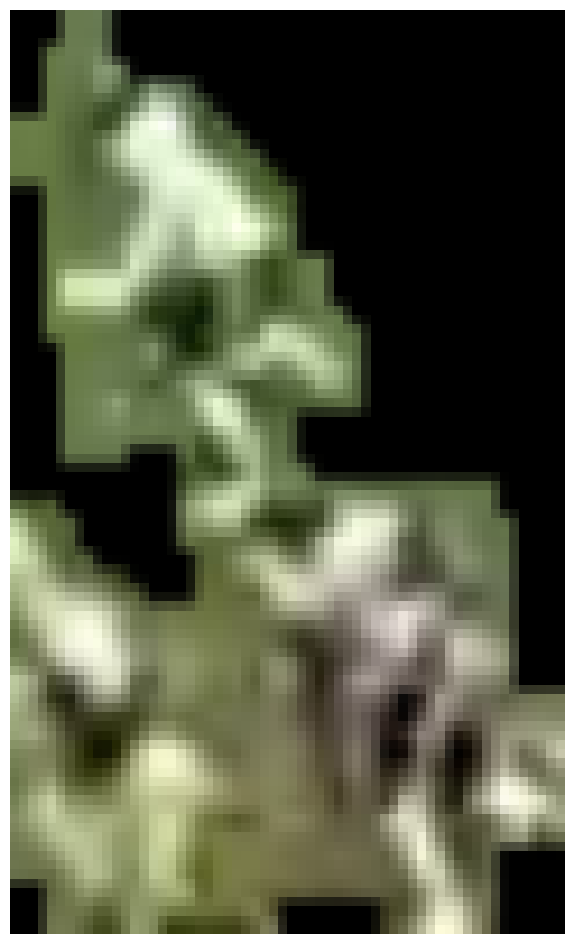

Green Bay Packers 0.43148097 0.4547861

0: 384x640 20 Players, 1 Referee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(37, 19)
(100, 60)

0: 384x640 17 Players, 1 Referee, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(36, 19)
(100, 60)
(39, 37)
(100, 60)
(45, 24)
(100, 60)

0: 384x640 16 Players, 1 Referee, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(35, 19)
(100, 60)
(41, 40)
(100, 60)
(46, 23)
(100, 60)
(62, 32)
(100, 60)

0: 384x640 16 Players, 1 Referee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(36, 20)
(100, 60)
(41, 39)
(100, 60)
(46, 24)
(100, 60)

0: 384x640 18 Players, 1 Referee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(36, 21)
(100, 60)
(41, 37)
(100, 60)
(47, 23)
(100, 60)


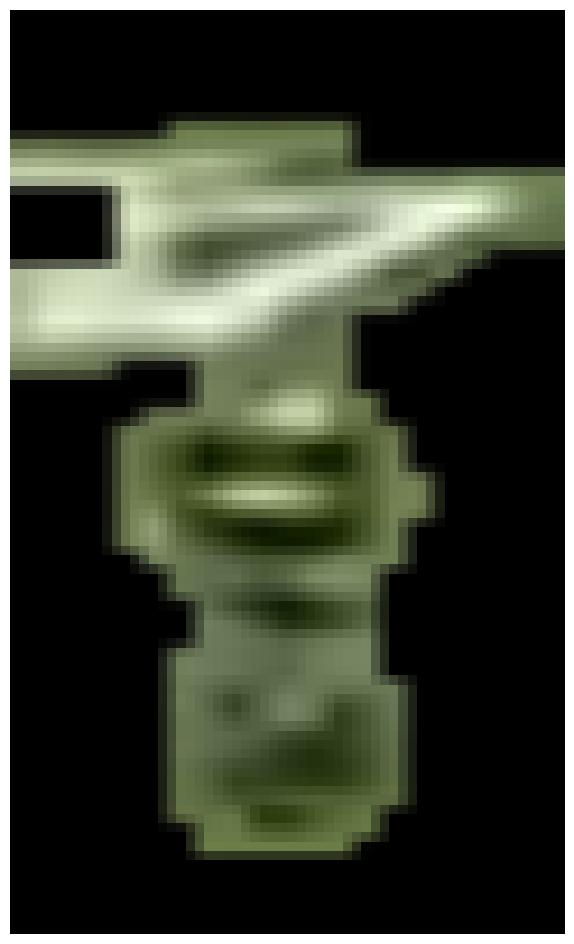

Green Bay Packers 0.2860543 0.30636707

0: 384x640 22 Players, 1 Referee, 17.3ms
Speed: 2.6ms preprocess, 17.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(53, 30)
(100, 60)
(45, 22)
(100, 60)
(95, 48)
(100, 60)

0: 384x640 19 Players, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(51, 30)
(100, 60)
(48, 23)
(100, 60)
(60, 16)
(100, 60)

0: 384x640 20 Players, 1 Referee, 14.4ms
Speed: 4.0ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(53, 30)
(100, 60)
(64, 16)
(100, 60)


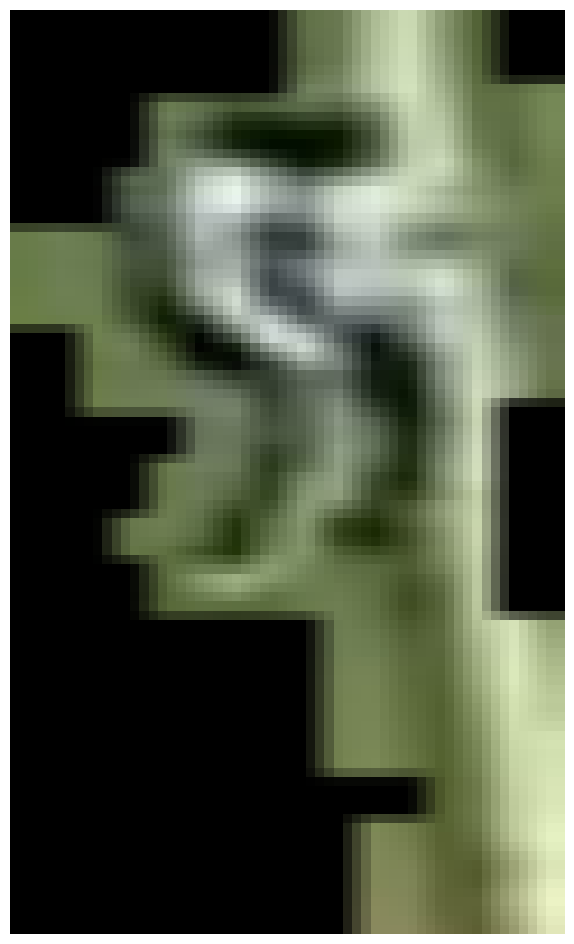

Green Bay Packers 0.41321272 0.43438146
(40, 31)
(100, 60)


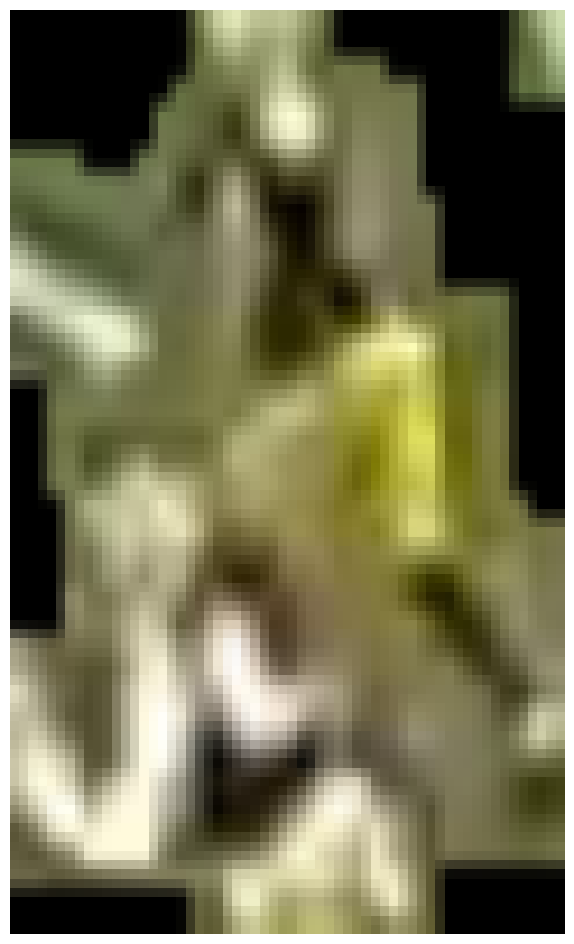

Green Bay Packers 0.33795735 0.3698575

0: 384x640 19 Players, 1 Referee, 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(52, 32)
(100, 60)
(43, 25)
(100, 60)

0: 384x640 20 Players, 1 Referee, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(49, 34)
(100, 60)
(42, 25)
(100, 60)

0: 384x640 19 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(50, 34)
(100, 60)
(41, 23)
(100, 60)
(37, 21)
(100, 60)
(34, 22)
(100, 60)


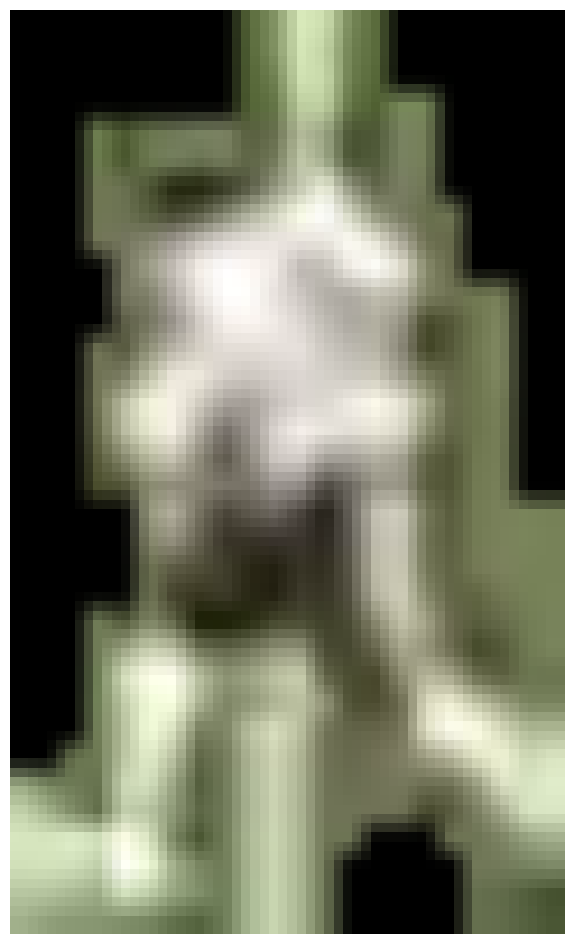

Chicago Bears 0.48158723 0.4522803
(58, 37)
(100, 60)


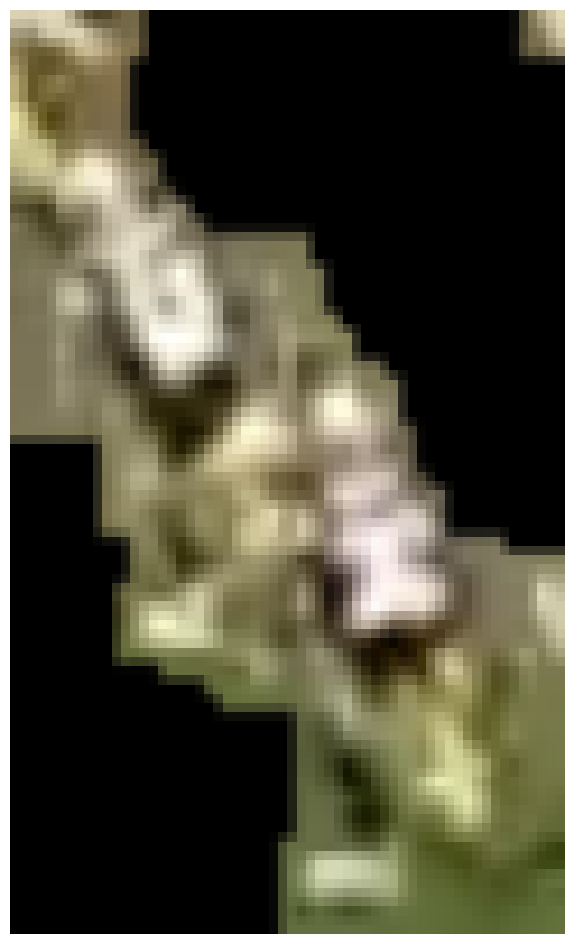

Green Bay Packers 0.4262437 0.4573731

0: 384x640 19 Players, 27.8ms
Speed: 2.7ms preprocess, 27.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 20)
(100, 60)
(49, 35)
(100, 60)
(42, 23)
(100, 60)
(41, 22)
(100, 60)

0: 384x640 20 Players, 1 Referee, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(41, 21)
(100, 60)
(51, 31)
(100, 60)


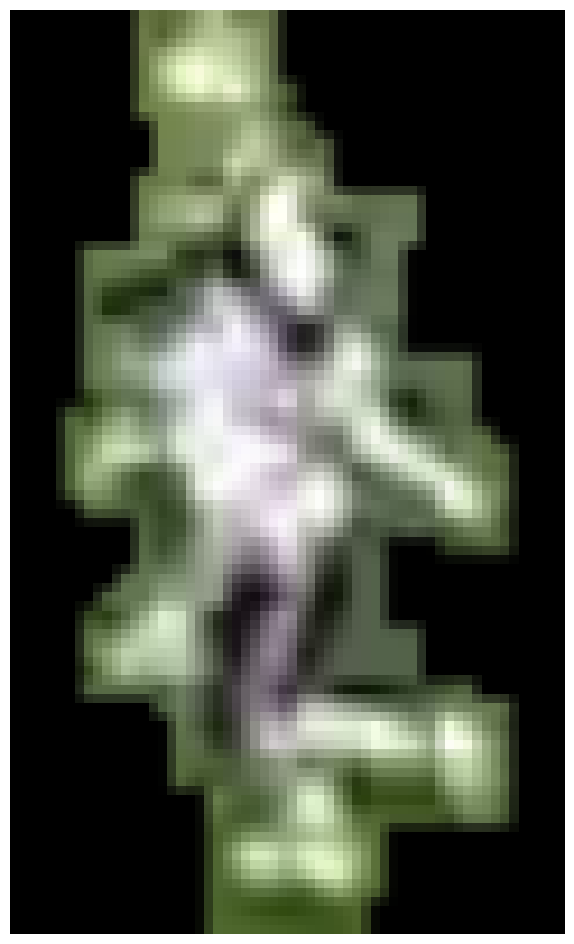

Chicago Bears 0.40504286 0.3835439
(38, 27)
(100, 60)
(43, 23)
(100, 60)
(44, 22)
(100, 60)


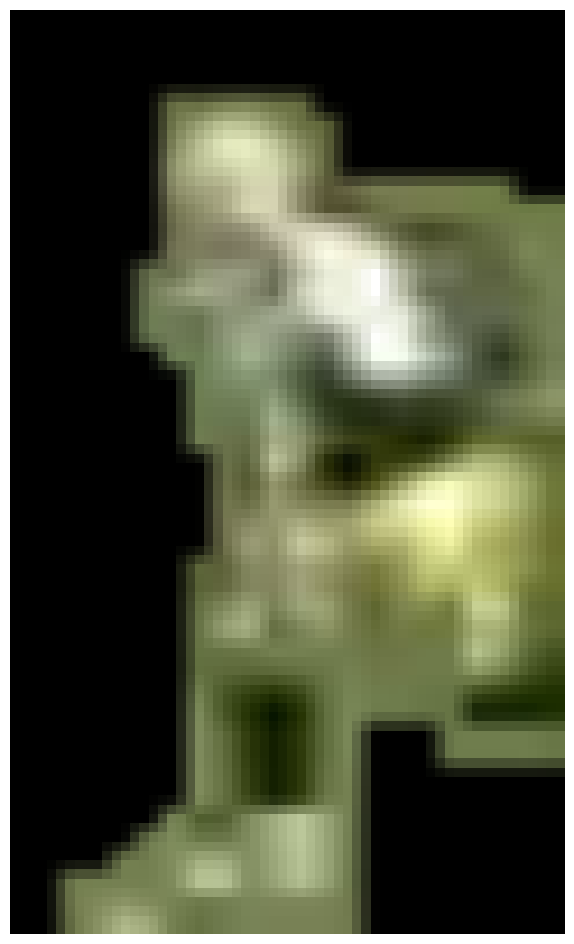

Green Bay Packers 0.3010861 0.32251206
(54, 45)
(100, 60)

0: 384x640 21 Players, 1 Referee, 28.7ms
Speed: 2.6ms preprocess, 28.7ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)
(40, 23)
(100, 60)


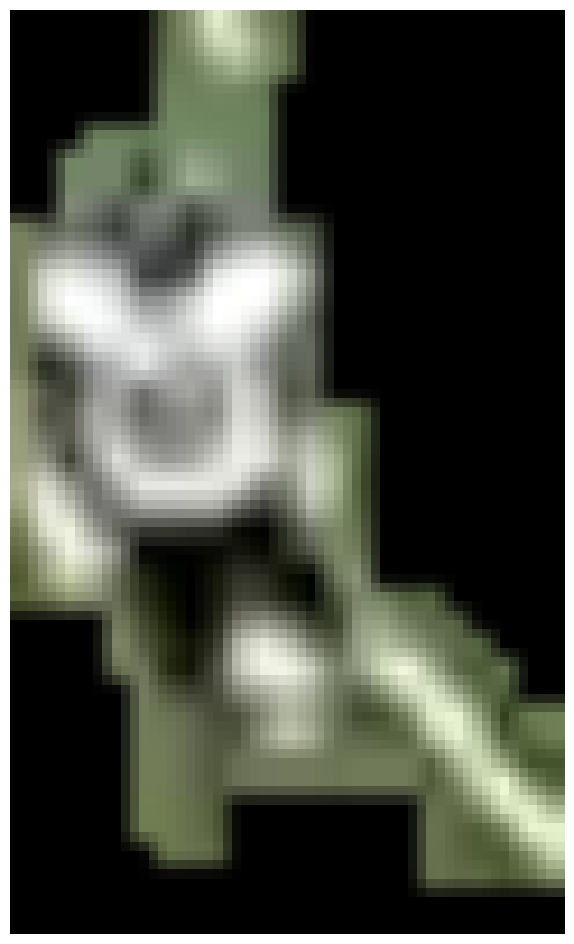

Chicago Bears 0.46935225 0.43792292
(36, 24)
(100, 60)

0: 384x640 23 Players, 19.8ms
Speed: 5.6ms preprocess, 19.8ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)
(35, 21)
(100, 60)


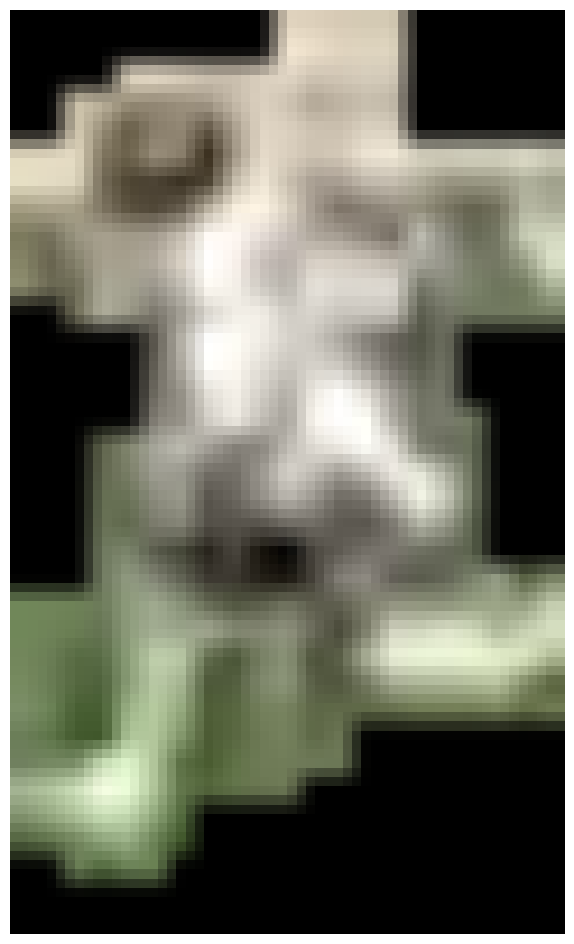

Chicago Bears 0.5176838 0.474098
(53, 40)
(100, 60)
(53, 45)
(100, 60)
(57, 35)
(100, 60)


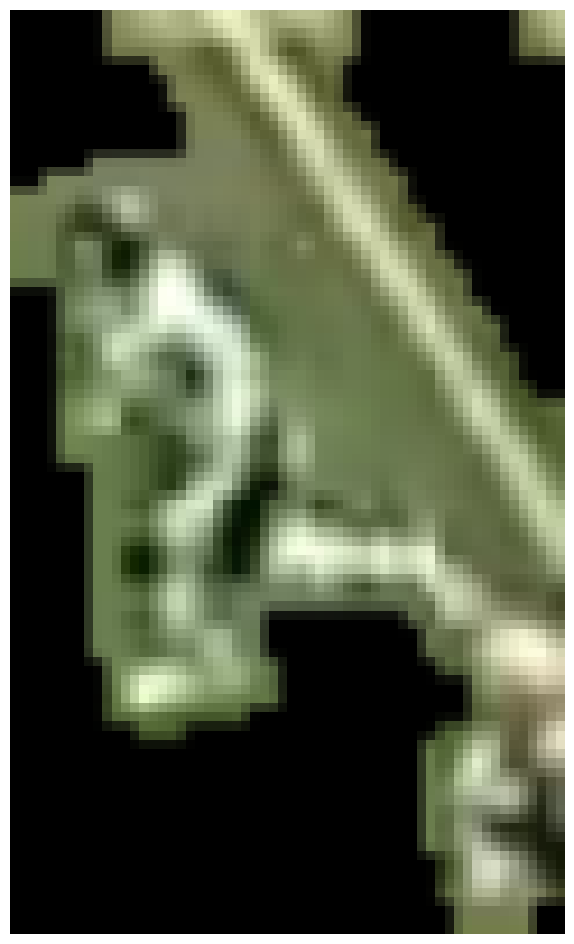

Green Bay Packers 0.33886832 0.3603406

0: 384x640 20 Players, 1 Referee, 24.3ms
Speed: 3.2ms preprocess, 24.3ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)
(45, 24)
(100, 60)
(70, 45)
(100, 60)
(50, 36)
(100, 60)

0: 384x640 20 Players, 19.7ms
Speed: 2.5ms preprocess, 19.7ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)
(46, 24)
(100, 60)
(71, 43)
(100, 60)

0: 384x640 21 Players, 2 Referees, 27.8ms
Speed: 3.2ms preprocess, 27.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(46, 24)
(100, 60)
(42, 25)
(100, 60)


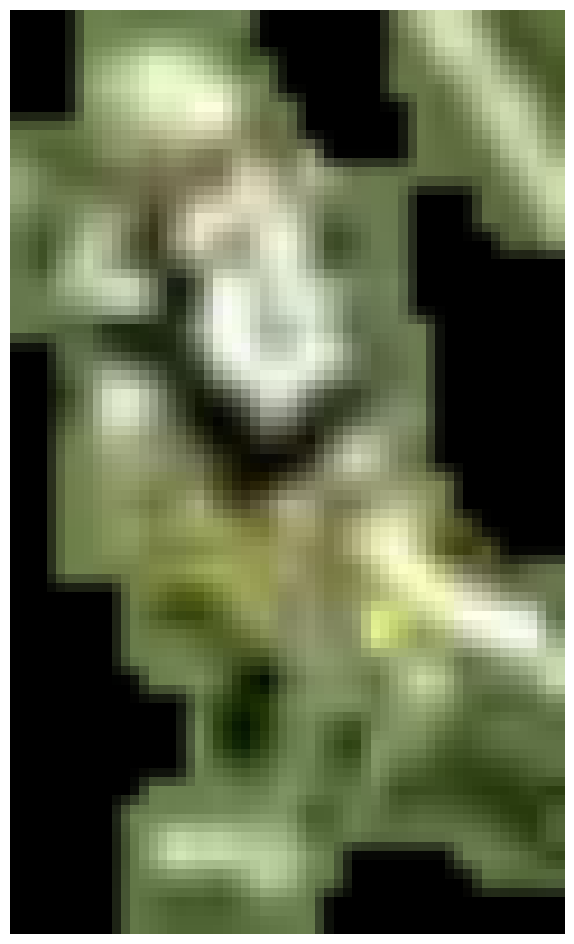

Green Bay Packers 0.34656107 0.3695623

0: 384x640 21 Players, 1 Referee, 17.3ms
Speed: 3.7ms preprocess, 17.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(46, 25)
(100, 60)
(43, 27)
(100, 60)

0: 384x640 19 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 27)
(100, 60)
(43, 28)
(100, 60)

0: 384x640 22 Players, 1 Referee, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(45, 27)
(100, 60)
(42, 27)
(100, 60)
(69, 29)
(100, 60)

0: 384x640 20 Players, 1 Referee, 16.4ms
Speed: 4.5ms preprocess, 16.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(43, 27)
(100, 60)
(62, 33)
(100, 60)
(42, 25)
(100, 60)
(75, 27)
(100, 60)

0: 384x640 19 Players, 1 Referee, 16.3ms
Speed: 2.4ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 26)
(100, 60)
(54, 34)
(100, 60)
(39, 27)
(100, 60)

0: 384x640

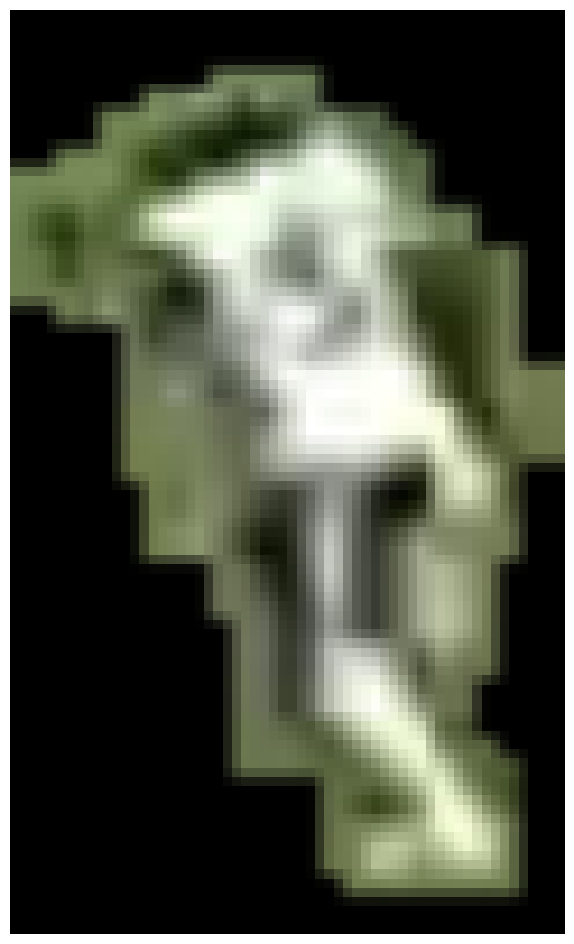

Chicago Bears 0.38995984 0.3693662
(41, 28)
(100, 60)
(73, 45)
(100, 60)
(73, 32)
(100, 60)

0: 384x640 19 Players, 1 Referee, 15.5ms
Speed: 4.8ms preprocess, 15.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 29)
(100, 60)
(66, 38)
(100, 60)

0: 384x640 19 Players, 1 Referee, 22.0ms
Speed: 4.3ms preprocess, 22.0ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)
(40, 29)
(100, 60)

0: 384x640 18 Players, 1 Referee, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(38, 27)
(100, 60)
(48, 40)
(100, 60)

0: 384x640 17 Players, 1 Referee, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(37, 27)
(100, 60)
(49, 48)
(100, 60)

0: 384x640 17 Players, 1 Referee, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(39, 26)
(100, 60)
(46, 42)
(100, 60)

0: 384x640 20 Players, 13.4ms
Speed: 2.4m

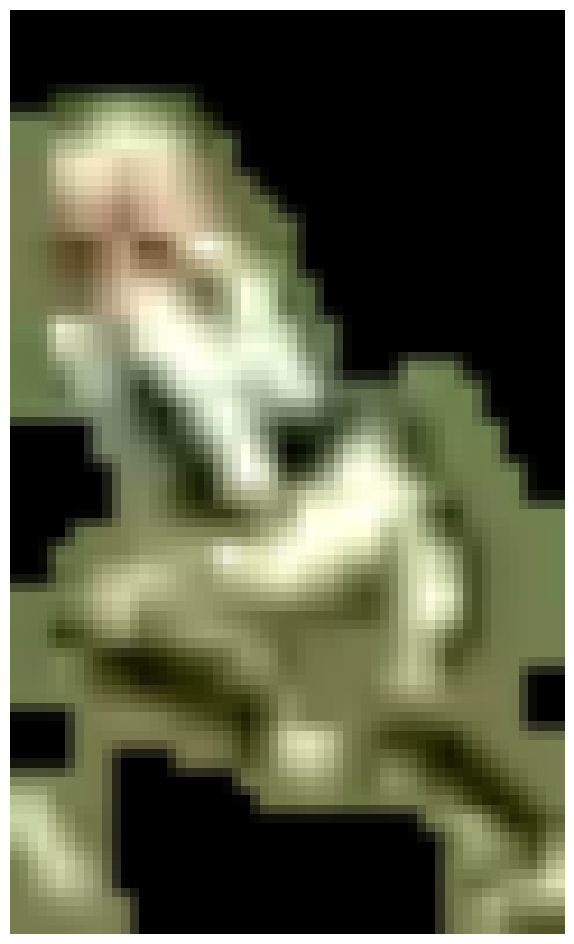

Green Bay Packers 0.36940572 0.39017928
(50, 26)
(100, 60)
(44, 34)
(100, 60)
(43, 22)
(100, 60)
(34, 29)
(100, 60)


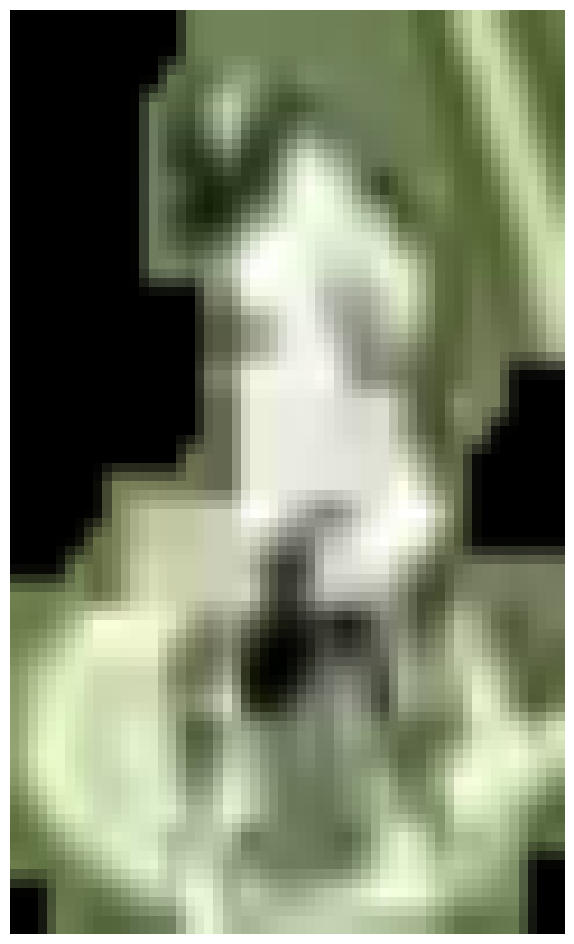

Chicago Bears 0.37168118 0.34464532

0: 384x640 21 Players, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(52, 26)
(100, 60)
(42, 32)
(100, 60)
(46, 23)
(100, 60)

0: 384x640 20 Players, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(59, 26)
(100, 60)
(40, 31)
(100, 60)
(47, 23)
(100, 60)

0: 384x640 21 Players, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(39, 31)
(100, 60)
(54, 23)
(100, 60)

0: 384x640 19 Players, 13.1ms
Speed: 4.0ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(59, 27)
(100, 60)
(40, 33)
(100, 60)
(59, 24)
(100, 60)

0: 384x640 19 Players, 18.8ms
Speed: 2.6ms preprocess, 18.8ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)
(61, 26)
(100, 60)
(41, 37)
(100, 60)
(60, 25)
(100, 60)

0: 384x640 20 Players, 12.5ms
Speed: 2.4ms preprocess, 12

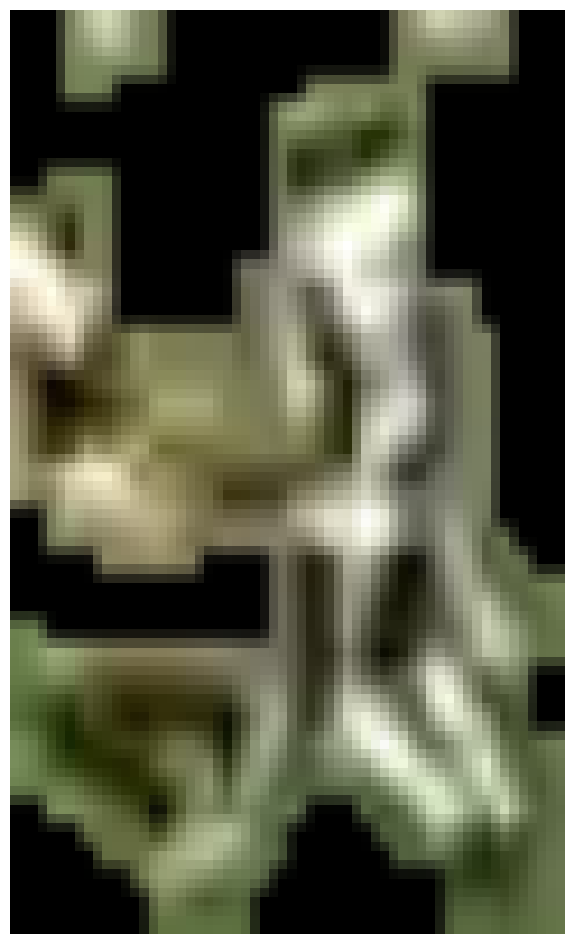

Green Bay Packers 0.4132747 0.43678024
(62, 26)
(100, 60)
(40, 25)
(100, 60)

0: 384x640 18 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)
(64, 29)
(100, 60)
(42, 25)
(100, 60)

0: 384x640 21 Players, 17.8ms
Speed: 2.7ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 24)
(100, 60)
(63, 38)
(100, 60)
(61, 26)
(100, 60)


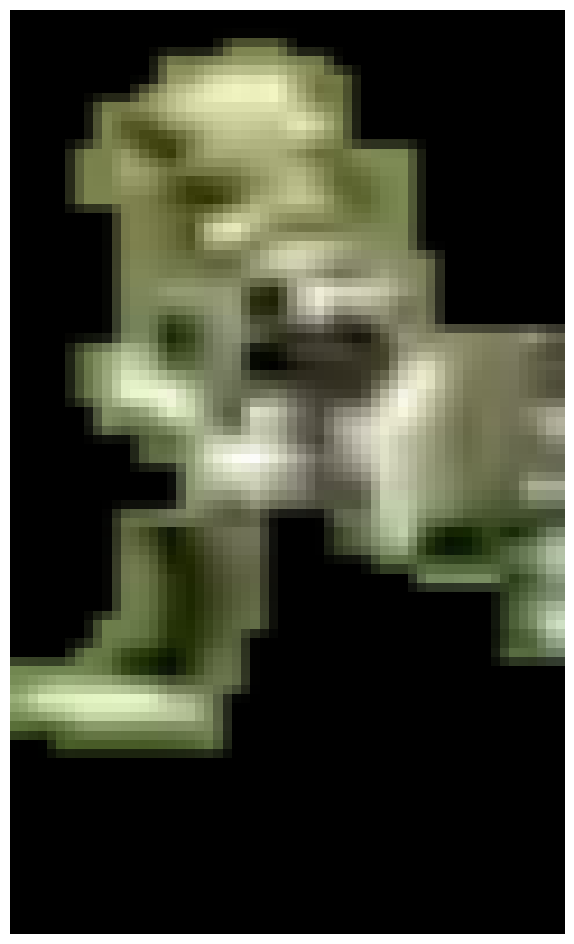

Green Bay Packers 0.3608921 0.38671198

0: 384x640 21 Players, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(65, 26)
(100, 60)
(45, 24)
(100, 60)

0: 384x640 21 Players, 20.1ms
Speed: 5.5ms preprocess, 20.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(63, 24)
(100, 60)
(64, 25)
(100, 60)
(56, 42)
(100, 60)

0: 384x640 23 Players, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(59, 28)
(100, 60)
(73, 27)
(100, 60)
(52, 44)
(100, 60)


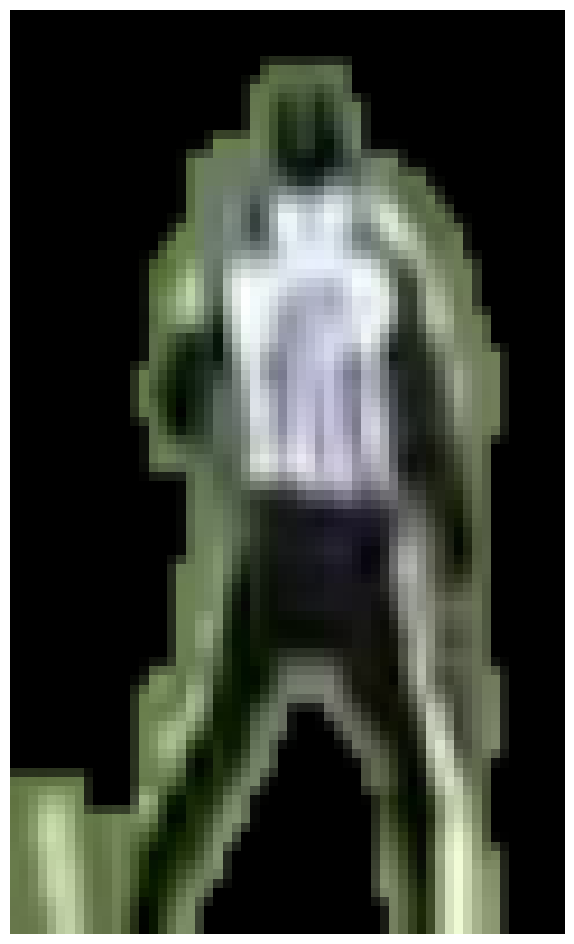

Green Bay Packers 0.51376563 0.53968376

0: 384x640 21 Players, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(67, 36)
(100, 60)


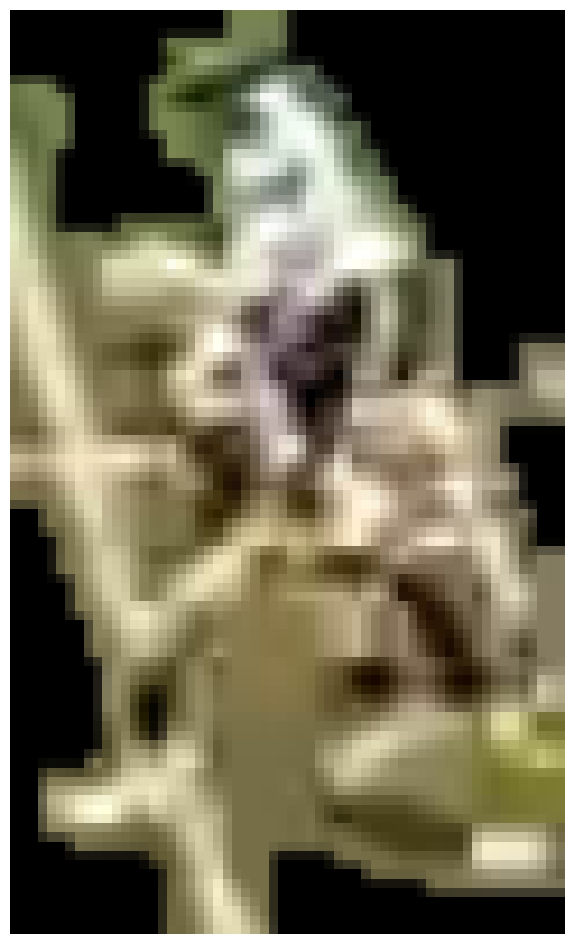

Green Bay Packers 0.44172448 0.4657335
(78, 30)
(100, 60)
(39, 21)
(100, 60)


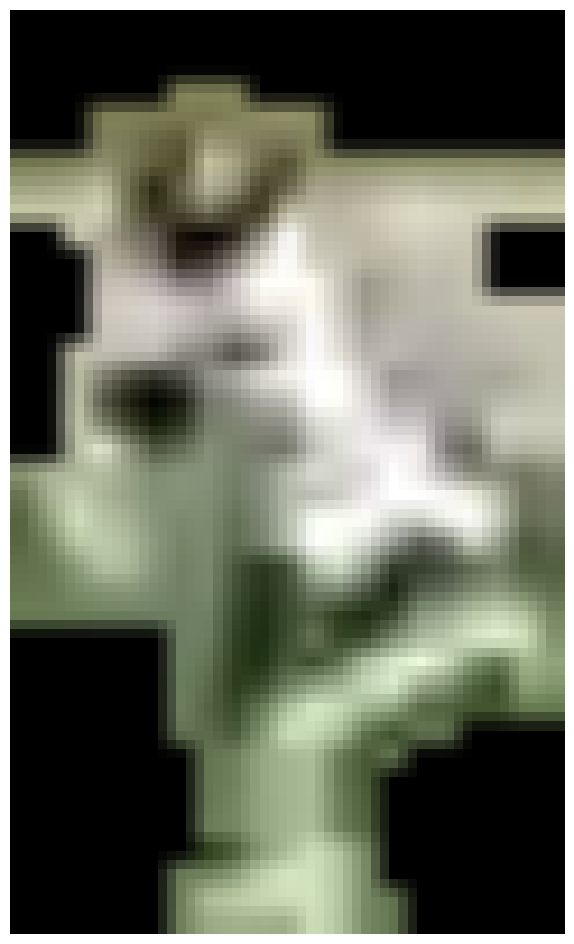

Chicago Bears 0.5110795 0.4609458
(62, 29)
(100, 60)

0: 384x640 19 Players, 21.5ms
Speed: 4.5ms preprocess, 21.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(84, 35)
(100, 60)

0: 384x640 21 Players, 16.2ms
Speed: 2.5ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(58, 31)
(100, 60)

0: 384x640 21 Players, 13.4ms
Speed: 3.2ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(55, 32)
(100, 60)
(44, 22)
(100, 60)

0: 384x640 23 Players, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
(51, 32)
(100, 60)
(45, 23)
(100, 60)
(43, 33)
(100, 60)


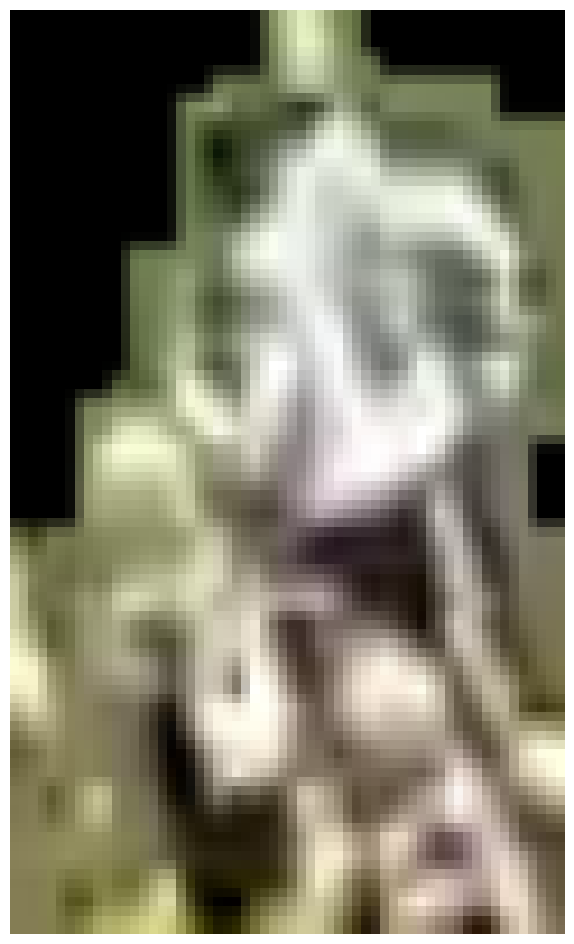

Chicago Bears 0.6219958 0.582232

0: 384x640 22 Players, 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(63, 33)
(100, 60)
(45, 24)
(100, 60)


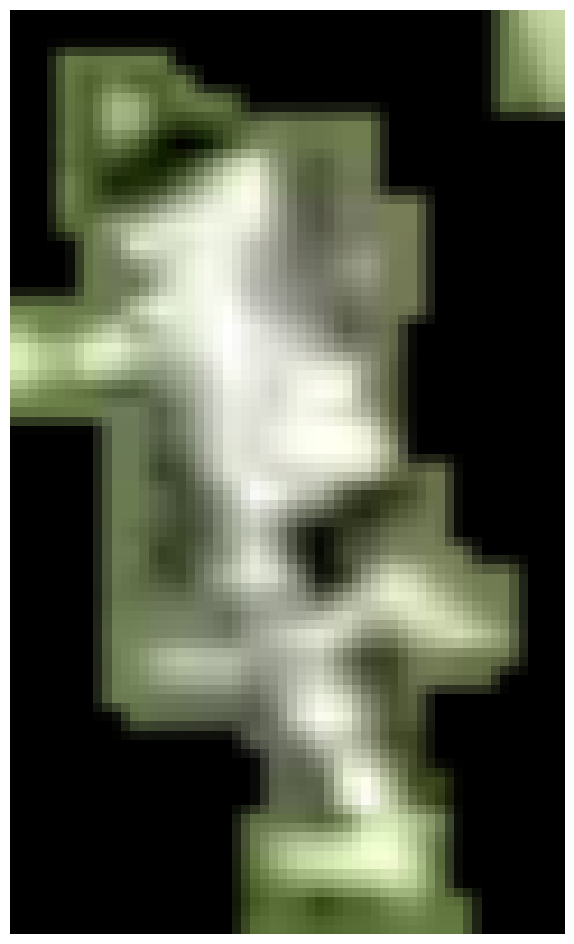

Chicago Bears 0.380857 0.35453686

0: 384x640 20 Players, 20.7ms
Speed: 2.6ms preprocess, 20.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(61, 37)
(100, 60)

0: 384x640 20 Players, 15.0ms
Speed: 2.4ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(50, 29)
(100, 60)

0: 384x640 19 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(43, 29)
(100, 60)


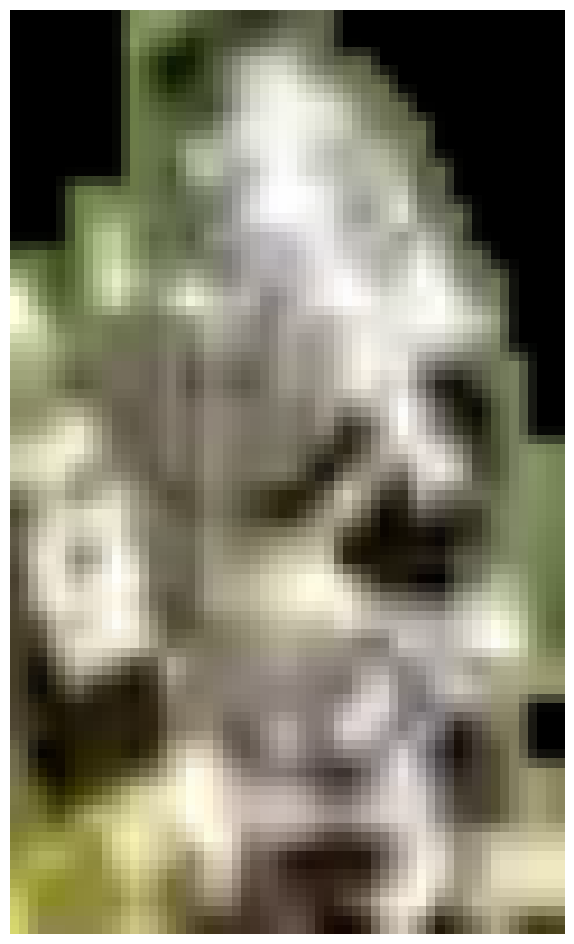

Chicago Bears 0.5797892 0.54219127

0: 384x640 21 Players, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(49, 30)
(100, 60)

0: 384x640 22 Players, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(58, 28)
(100, 60)

0: 384x640 21 Players, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(54, 29)
(100, 60)

0: 384x640 21 Players, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 36)
(100, 60)

0: 384x640 23 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(48, 36)
(100, 60)
(56, 23)
(100, 60)


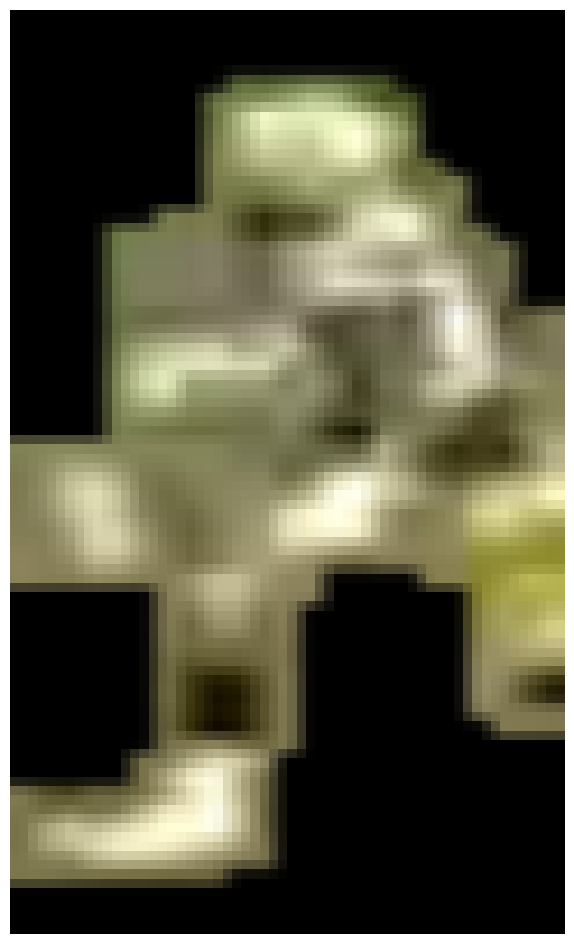

Green Bay Packers 0.2995592 0.32161796

0: 384x640 20 Players, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 16.6ms
Speed: 3.8ms preprocess, 16.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(75, 34)
(100, 60)


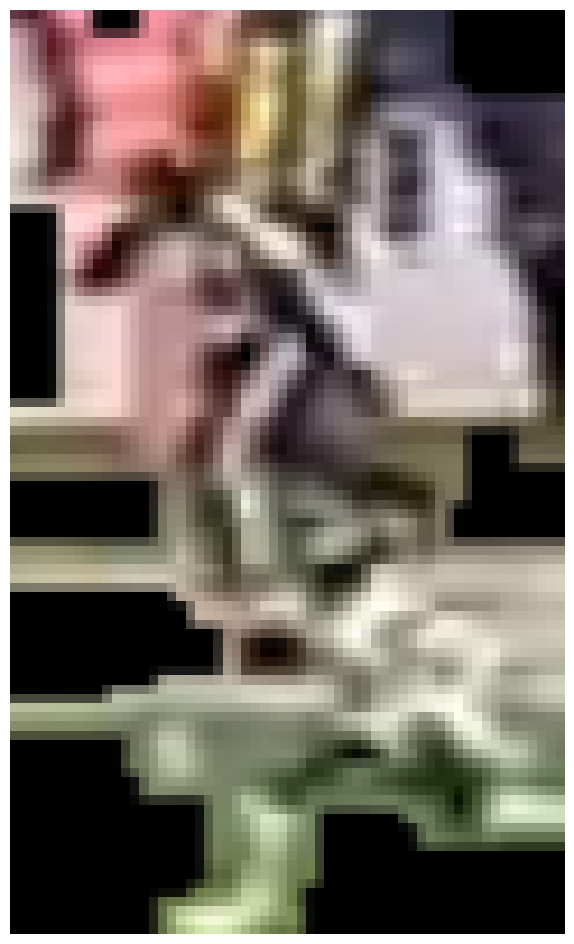

Chicago Bears 0.76307243 0.698911

0: 384x640 22 Players, 12.3ms
Speed: 4.0ms preprocess, 12.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 Players, 16.6ms
Speed: 2.5ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 1 Referee, 12.1ms
Speed: 5.8ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 Players, 17.2ms
Speed: 5.1ms preprocess, 17.2ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
(63, 29)
(100, 60)

0: 384x640 20 Players, 1 Referee, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(65, 27)
(100, 60)

0: 384x640 17 Players, 1 Referee, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 Players, 1 Referee, 14.7ms
Speed: 4.2ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3

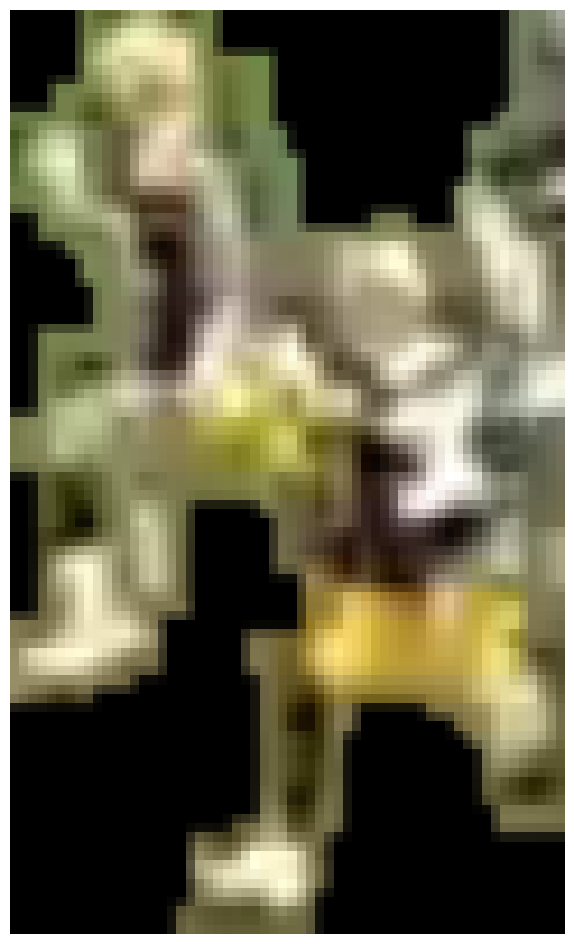

Green Bay Packers 0.42730713 0.45195022

0: 384x640 19 Players, 1 Referee, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(56, 32)
(100, 60)
(46, 40)
(100, 60)


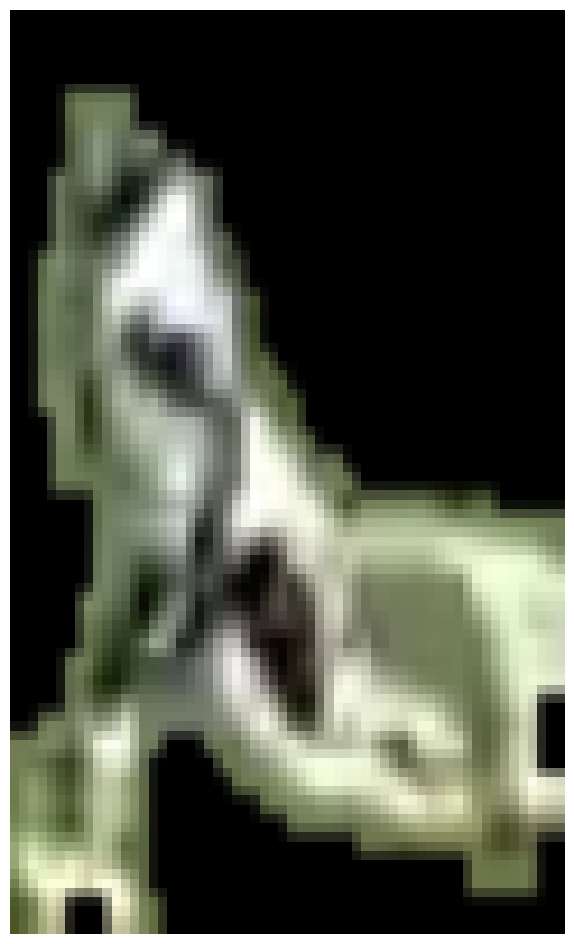

Chicago Bears 0.51090723 0.47861728

0: 384x640 23 Players, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(60, 30)
(100, 60)


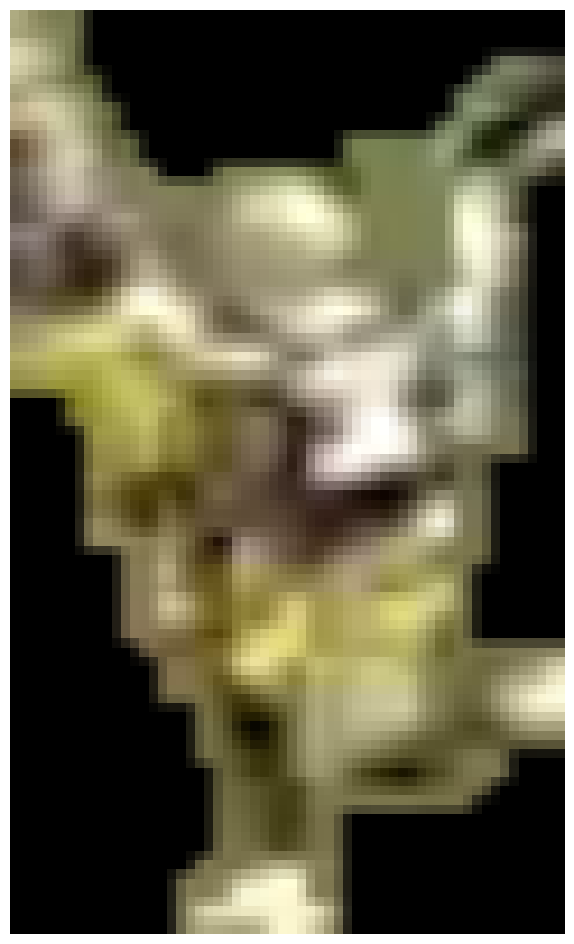

Green Bay Packers 0.3924407 0.4198464
(53, 32)
(100, 60)

0: 384x640 22 Players, 12.3ms
Speed: 4.0ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(51, 32)
(100, 60)

0: 384x640 25 Players, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(56, 30)
(100, 60)
(45, 24)
(100, 60)


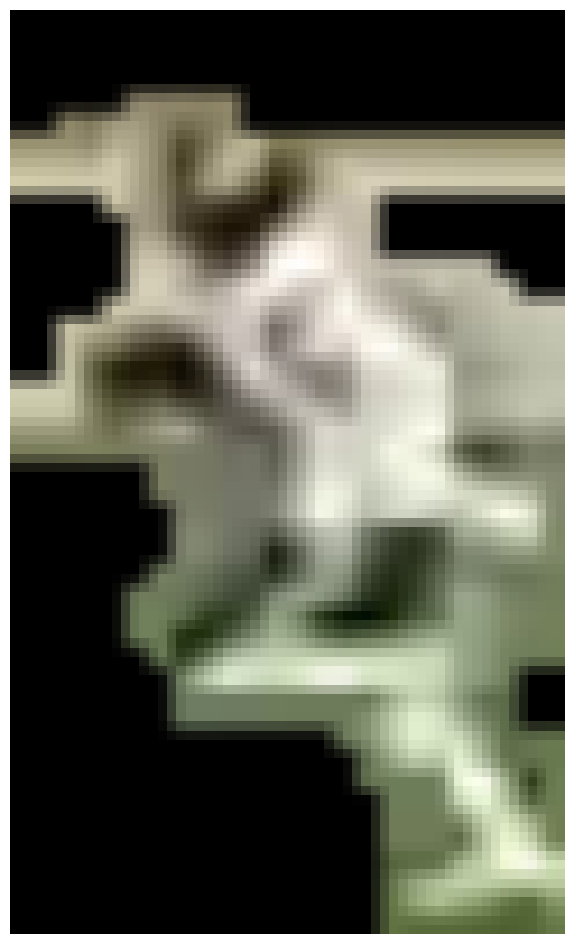

Chicago Bears 0.51374334 0.4797266
(61, 37)
(100, 60)


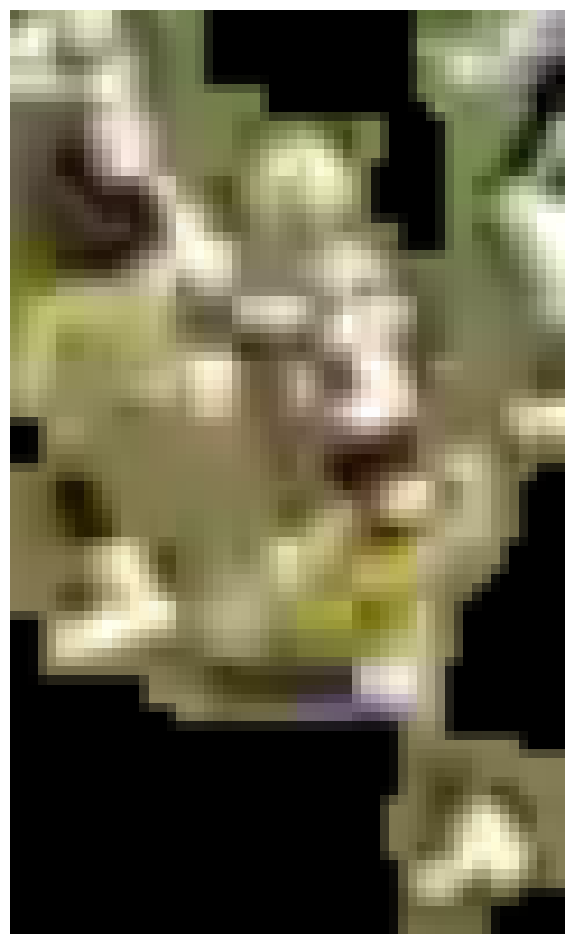

Green Bay Packers 0.39947662 0.42586496
(55, 27)
(100, 60)

0: 384x640 25 Players, 16.4ms
Speed: 2.5ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 30)
(100, 60)
(53, 25)
(100, 60)

0: 384x640 22 Players, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(61, 31)
(100, 60)
(51, 26)
(100, 60)

0: 384x640 21 Players, 15.7ms
Speed: 5.2ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(60, 29)
(100, 60)
(57, 28)
(100, 60)

0: 384x640 22 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(55, 26)
(100, 60)
(62, 33)
(100, 60)

0: 384x640 21 Players, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(54, 30)
(100, 60)


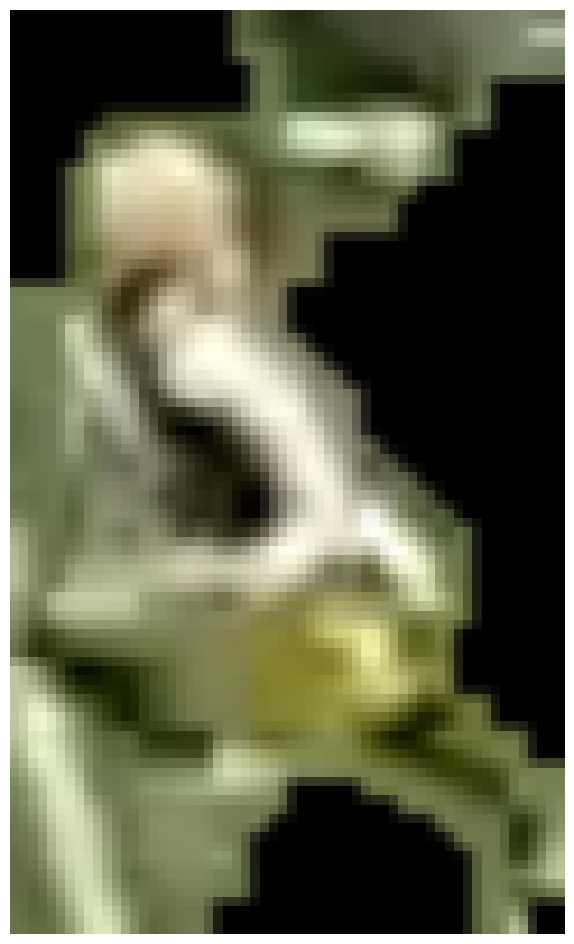

Green Bay Packers 0.35781807 0.38061512
(61, 36)
(100, 60)

0: 384x640 21 Players, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(61, 36)
(100, 60)
(60, 41)
(100, 60)

0: 384x640 20 Players, 14.8ms
Speed: 2.5ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(59, 35)
(100, 60)

0: 384x640 19 Players, 16.5ms
Speed: 3.1ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(59, 34)
(100, 60)

0: 384x640 20 Players, 15.5ms
Speed: 2.5ms preprocess, 15.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
(61, 33)
(100, 60)
(62, 41)
(100, 60)

0: 384x640 20 Players, 15.8ms
Speed: 2.6ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(60, 36)
(100, 60)

0: 384x640 21 Players, 13.8ms
Speed: 3.

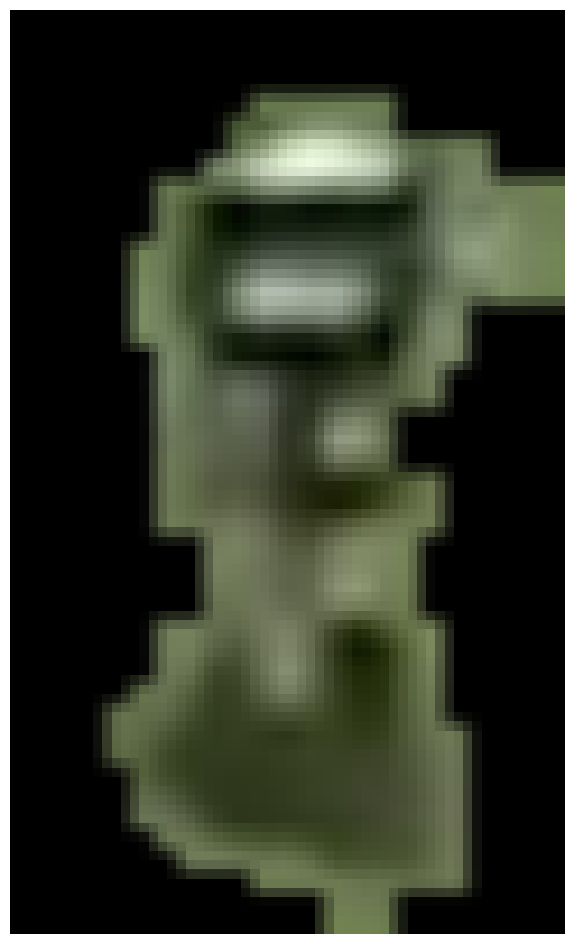

Green Bay Packers 0.34466174 0.3963077

0: 384x640 20 Players, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 Players, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)
(101, 29)
(100, 60)

0: 384x640 20 Players, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 16.1ms
Speed: 5.6ms preprocess, 16.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 Players, 18.9ms
Speed: 2.5ms preprocess, 18.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
(51, 28)
(100, 60)

0: 384x640 20 Players, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(52, 25)
(100, 60)

0: 384x640 18 Players, 16.2ms
Speed: 2.6ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384

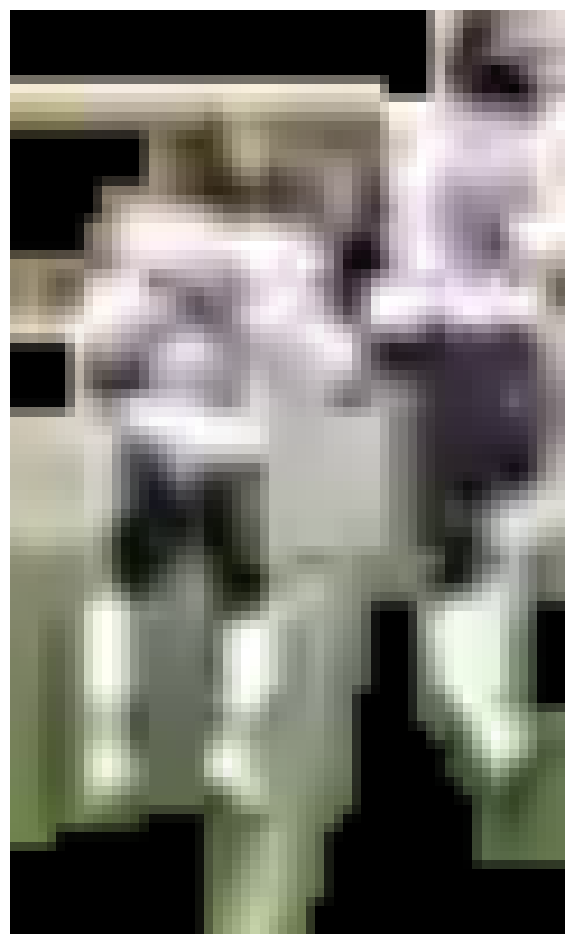

Chicago Bears 0.70576805 0.5655634

0: 384x640 24 Players, 23.3ms
Speed: 2.6ms preprocess, 23.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(52, 29)
(100, 60)


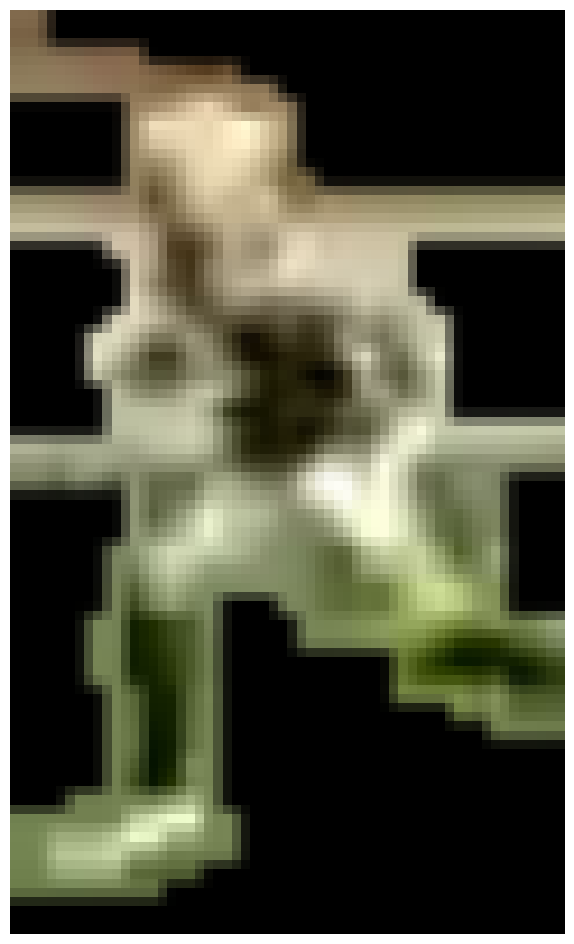

Green Bay Packers 0.39968732 0.42867446
(61, 33)
(100, 60)

0: 384x640 23 Players, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(86, 28)
(100, 60)
(60, 25)
(100, 60)

0: 384x640 25 Players, 17.4ms
Speed: 3.9ms preprocess, 17.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(89, 32)
(100, 60)


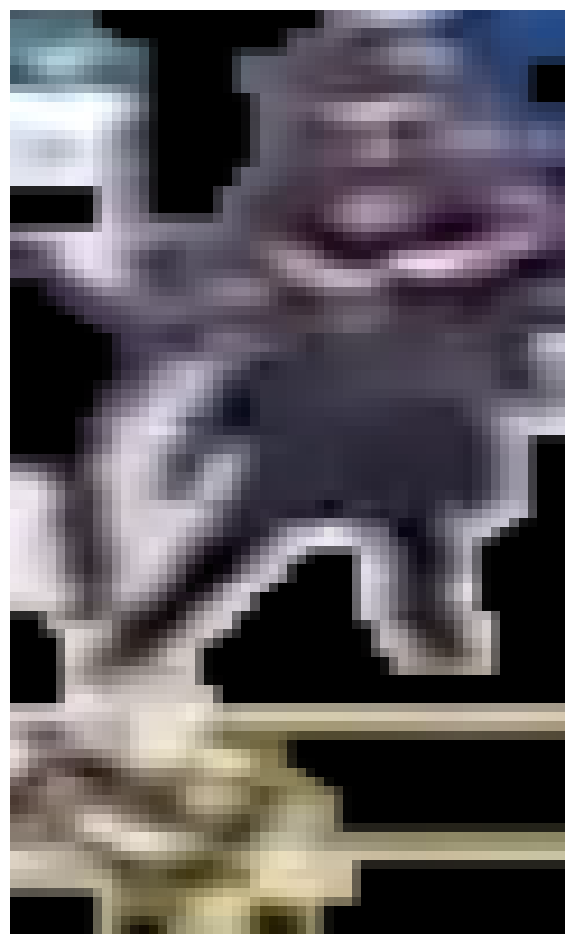

Chicago Bears 0.7142742 0.67697287
(59, 27)
(100, 60)

0: 384x640 23 Players, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(62, 34)
(100, 60)

0: 384x640 26 Players, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(59, 40)
(100, 60)
(70, 43)
(100, 60)
(64, 30)
(100, 60)


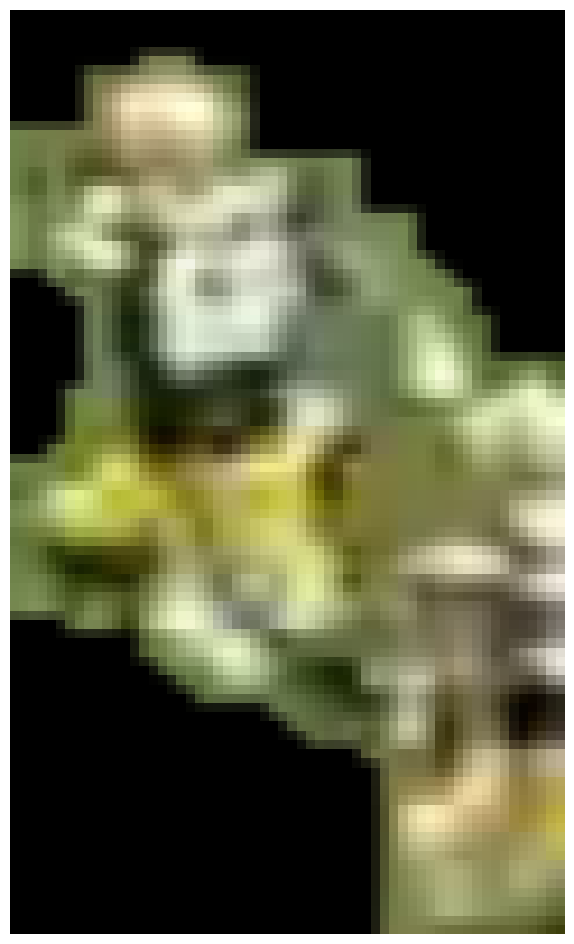

Green Bay Packers 0.40297973 0.4323125

0: 384x640 25 Players, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(56, 41)
(100, 60)

0: 384x640 24 Players, 24.3ms
Speed: 2.4ms preprocess, 24.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(67, 38)
(100, 60)

0: 384x640 24 Players, 16.5ms
Speed: 2.4ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(79, 35)
(100, 60)
(66, 27)
(100, 60)


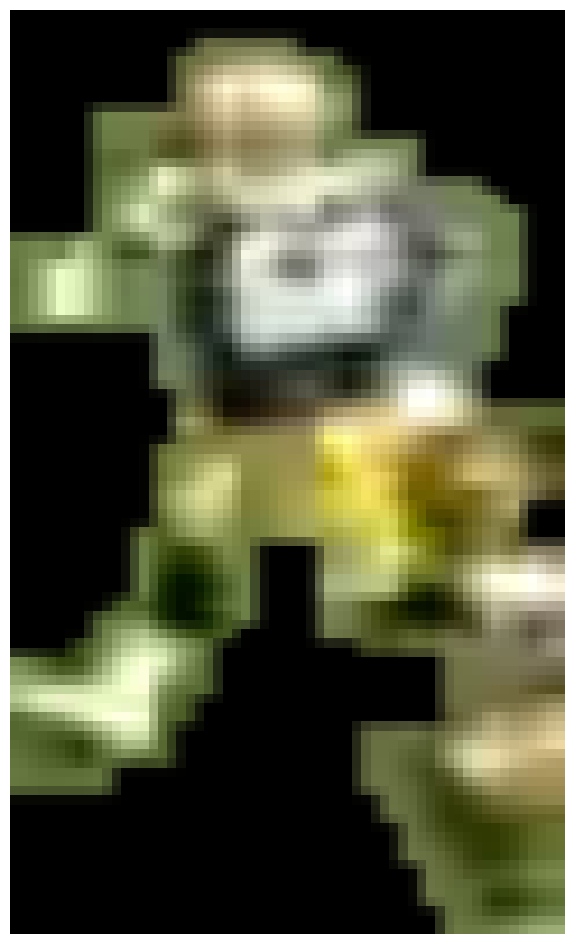

Green Bay Packers 0.44448736 0.47166732

0: 384x640 4 Players, 17.3ms
Speed: 3.8ms preprocess, 17.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 15.4ms
Speed: 2.9ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 Players, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(59, 59)
(100, 60)


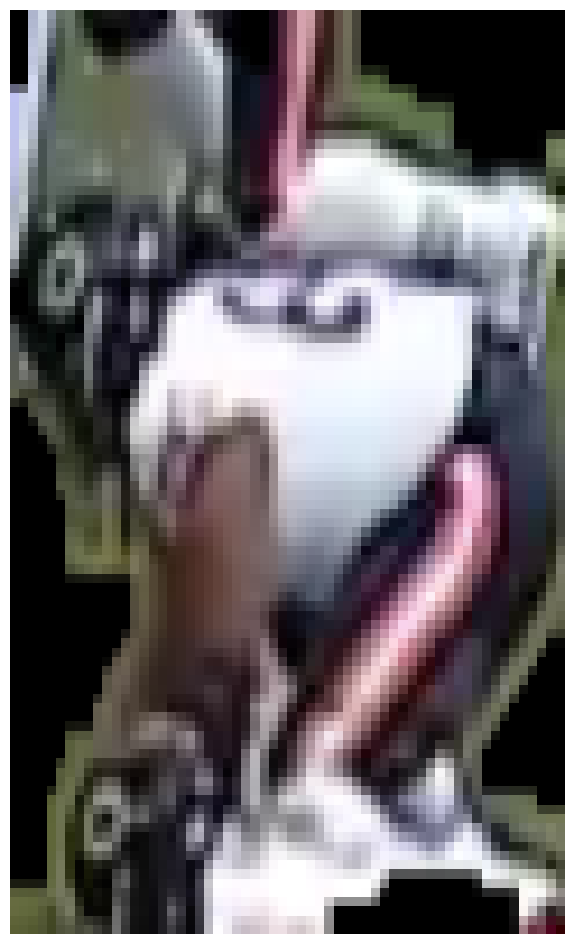

Chicago Bears 0.8648905 0.8160201
(96, 55)
(100, 60)


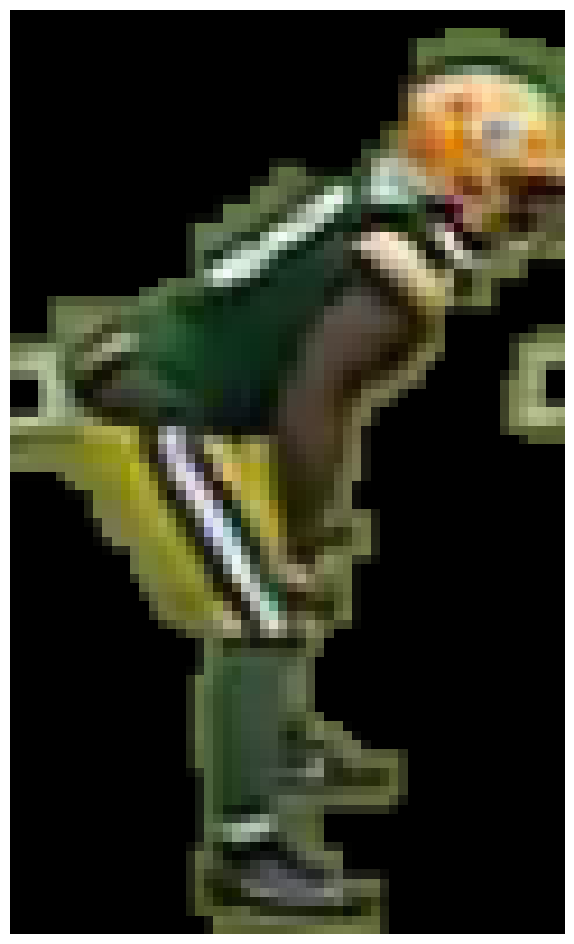

Green Bay Packers 0.52426976 0.62108546
(92, 64)
(100, 60)


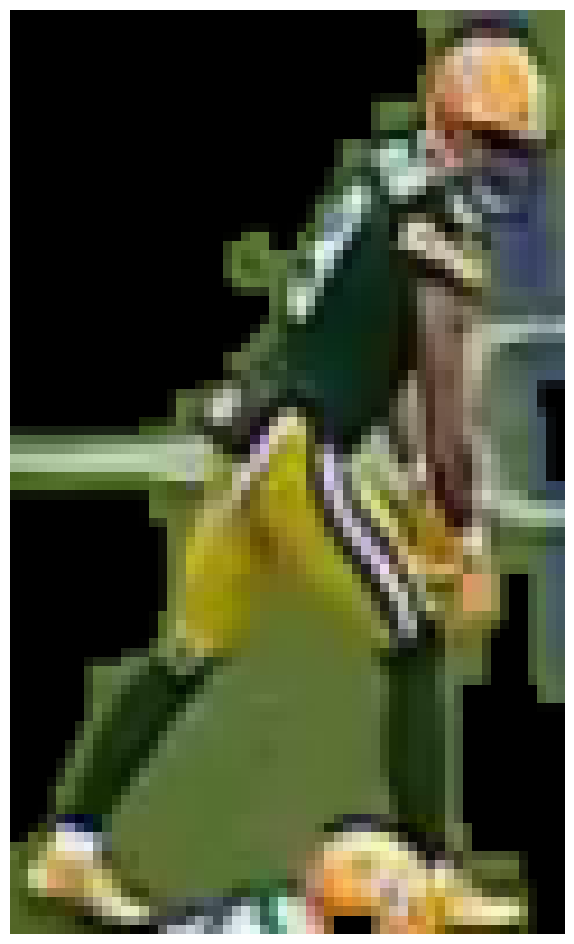

Green Bay Packers 0.5192156 0.6038265
(106, 50)
(100, 60)
(109, 37)
(100, 60)


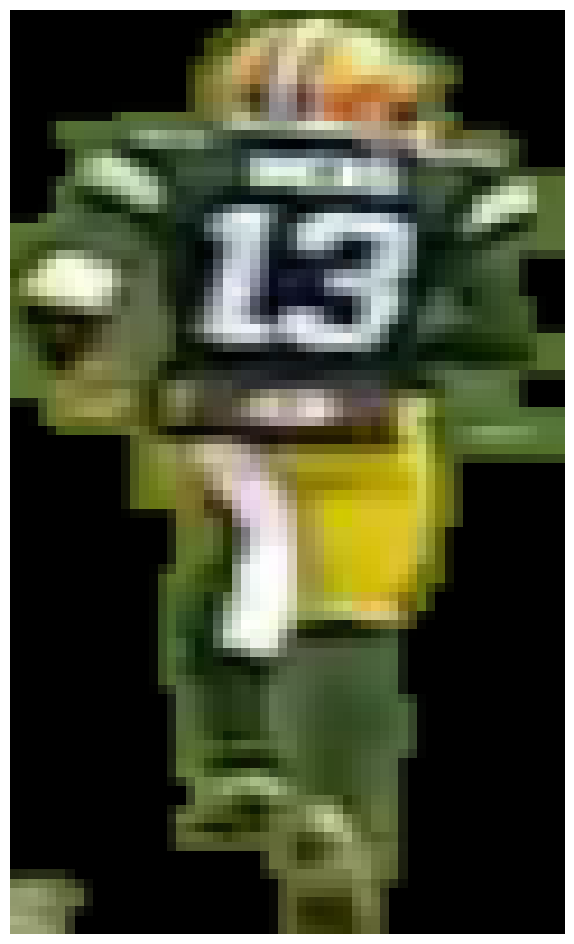

Green Bay Packers 0.54309785 0.6166747
(92, 39)
(100, 60)
(96, 46)
(100, 60)


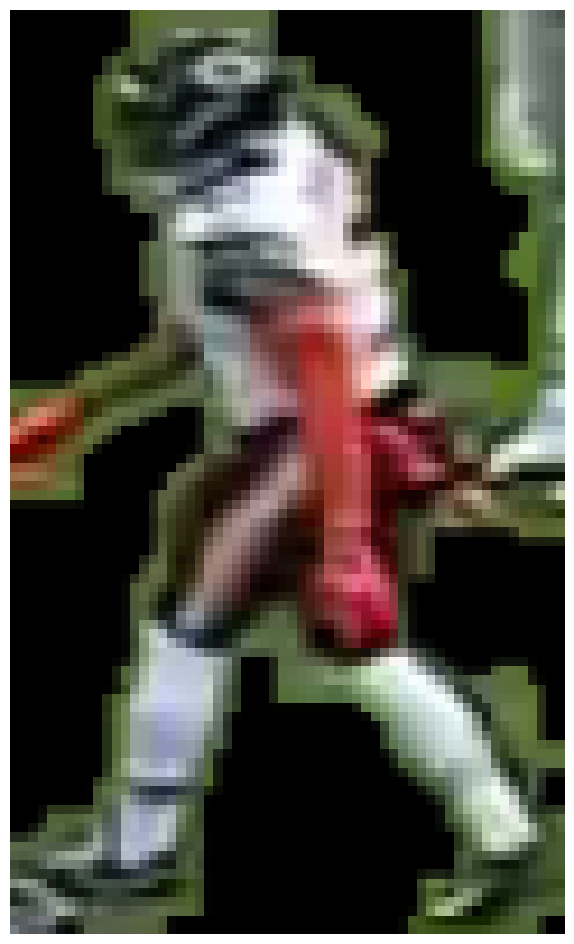

Green Bay Packers 0.7370688 0.7670837
(114, 38)
(100, 60)
(59, 63)
(100, 60)


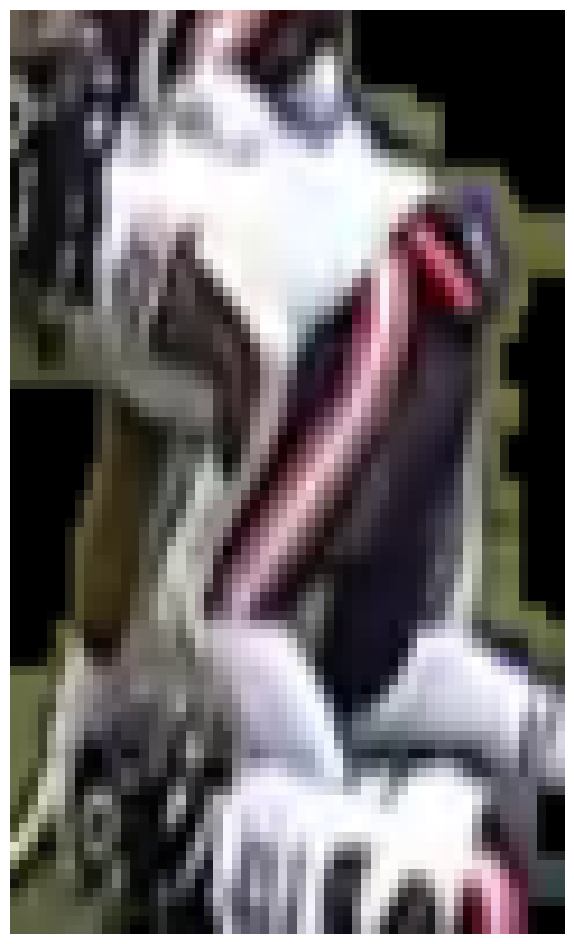

Chicago Bears 0.8188167 0.73045903
(77, 56)
(100, 60)


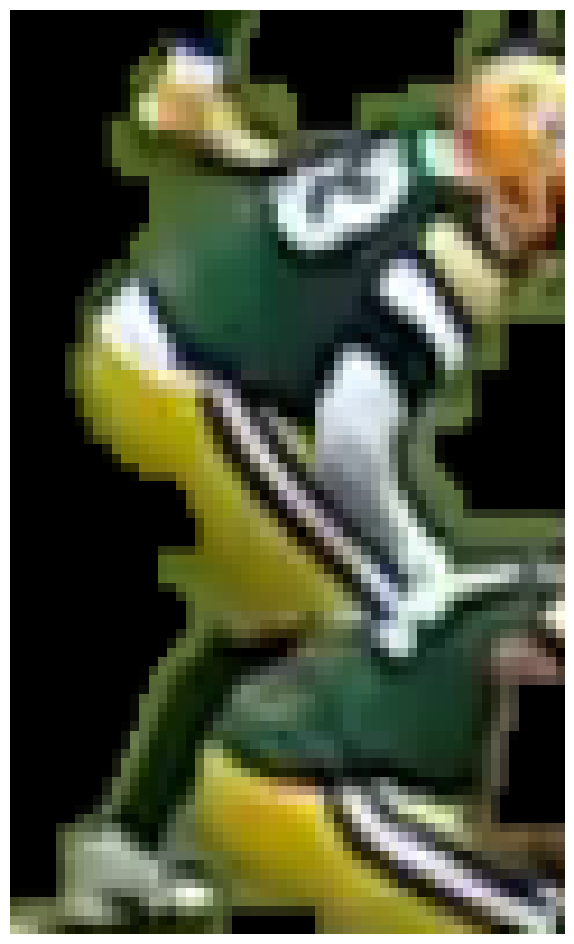

Green Bay Packers 0.6873434 0.76328695
(81, 71)
(100, 60)


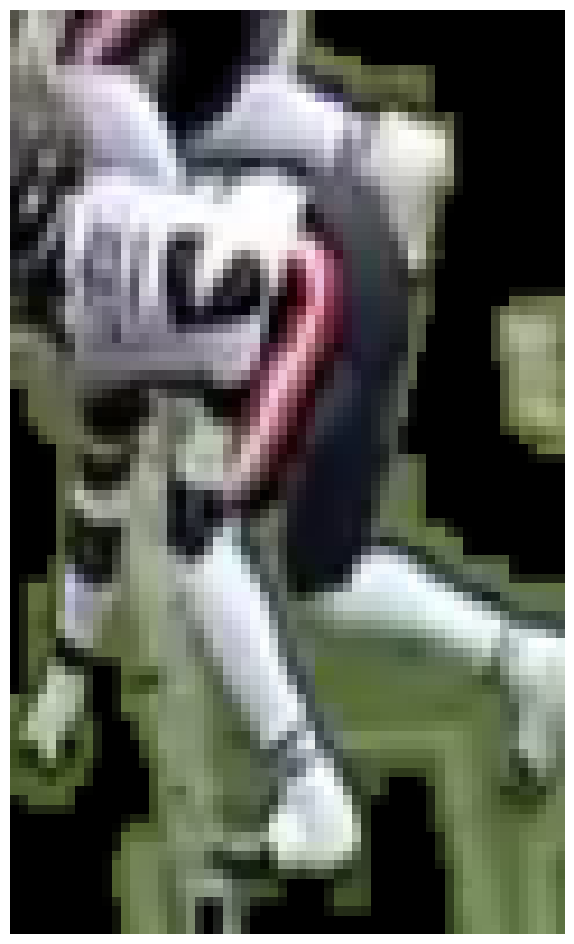

Chicago Bears 0.7127709 0.6839483
(63, 45)
(100, 60)


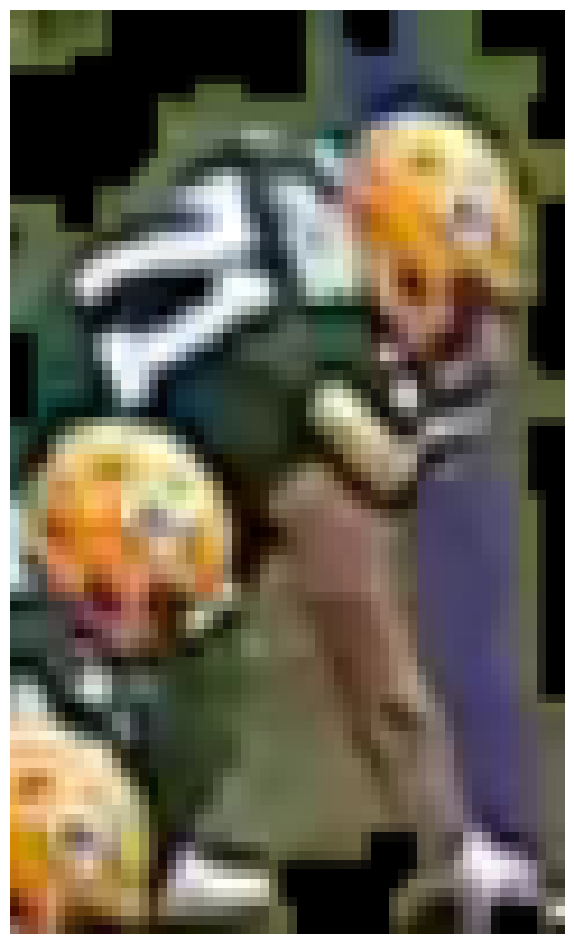

Green Bay Packers 0.73974115 0.7893096
(84, 45)
(100, 60)


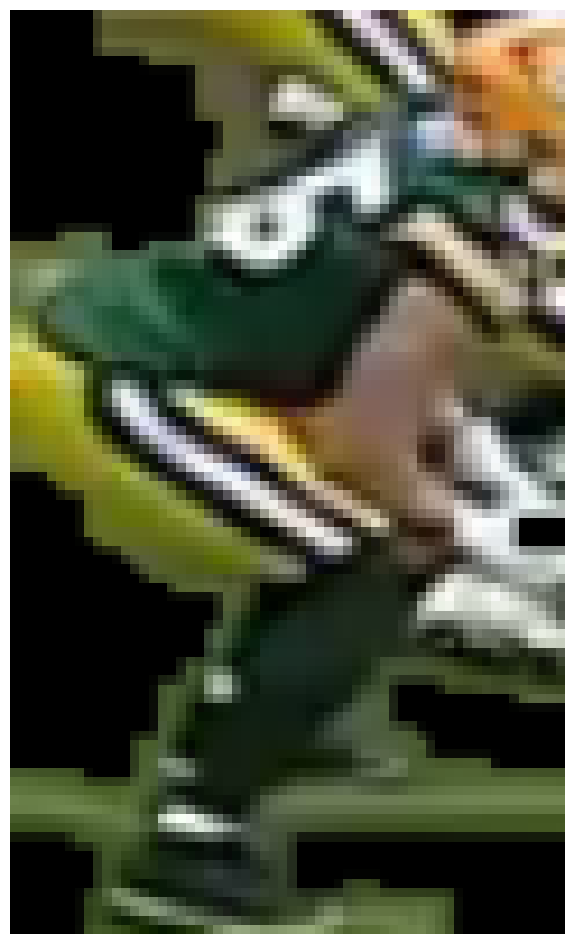

Green Bay Packers 0.6608801 0.7345237
(62, 31)
(100, 60)


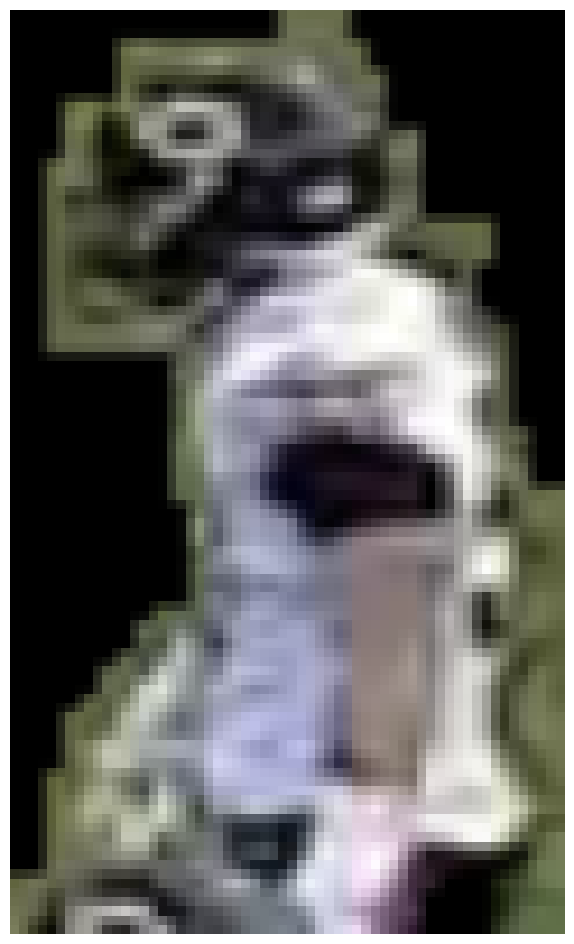

Chicago Bears 0.6717525 0.6271093
(77, 47)
(100, 60)


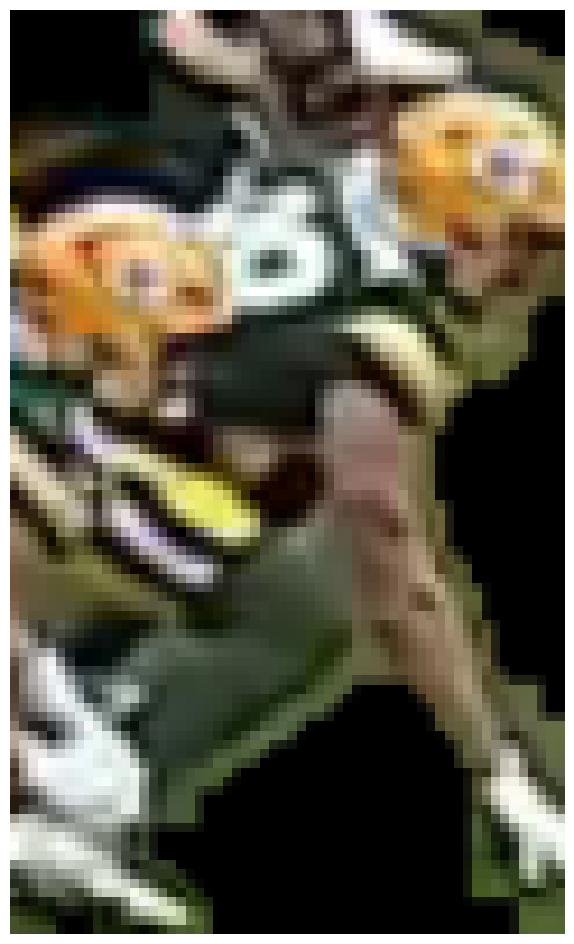

Green Bay Packers 0.7118387 0.7341571
(44, 24)
(100, 60)


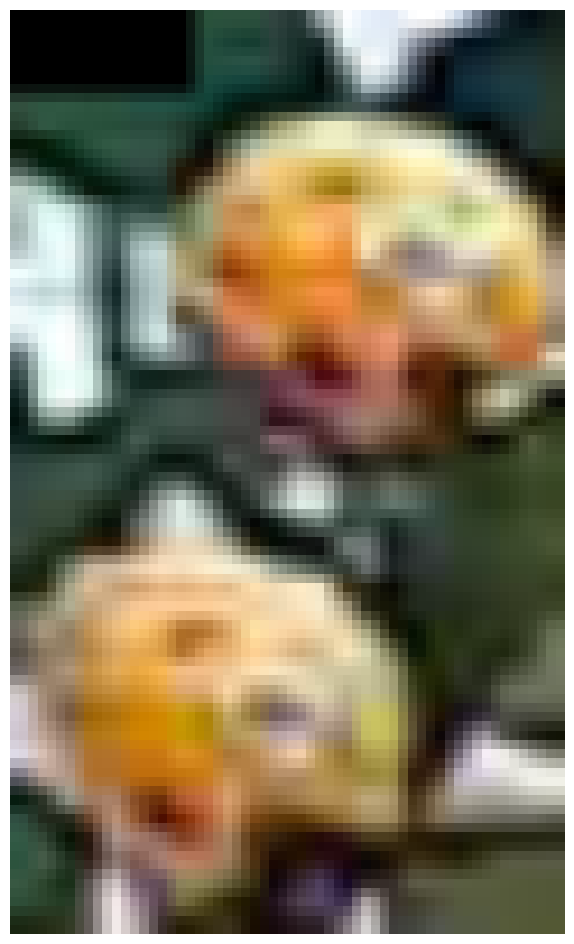

Green Bay Packers 0.72179633 0.758993
(69, 47)
(100, 60)


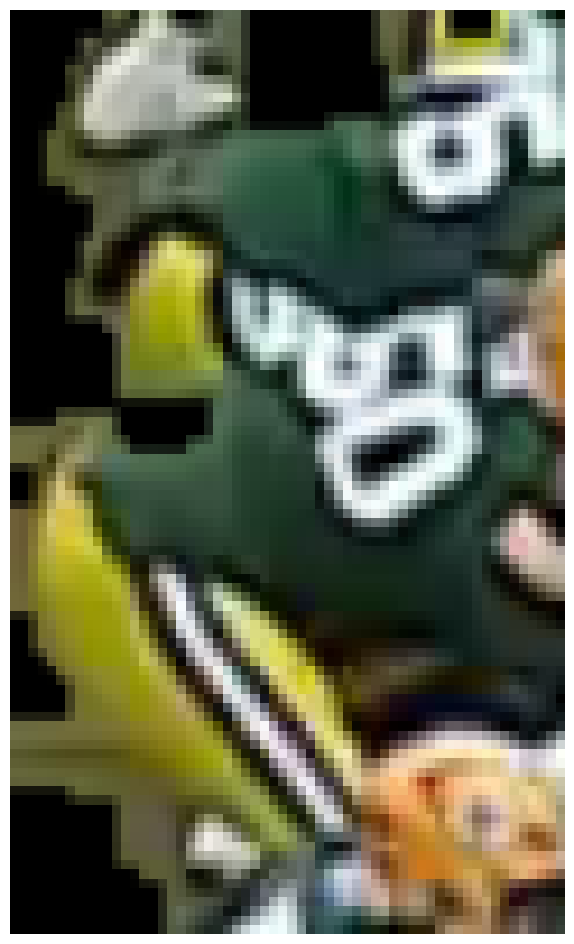

Green Bay Packers 0.74720347 0.8115329
(113, 51)
(100, 60)


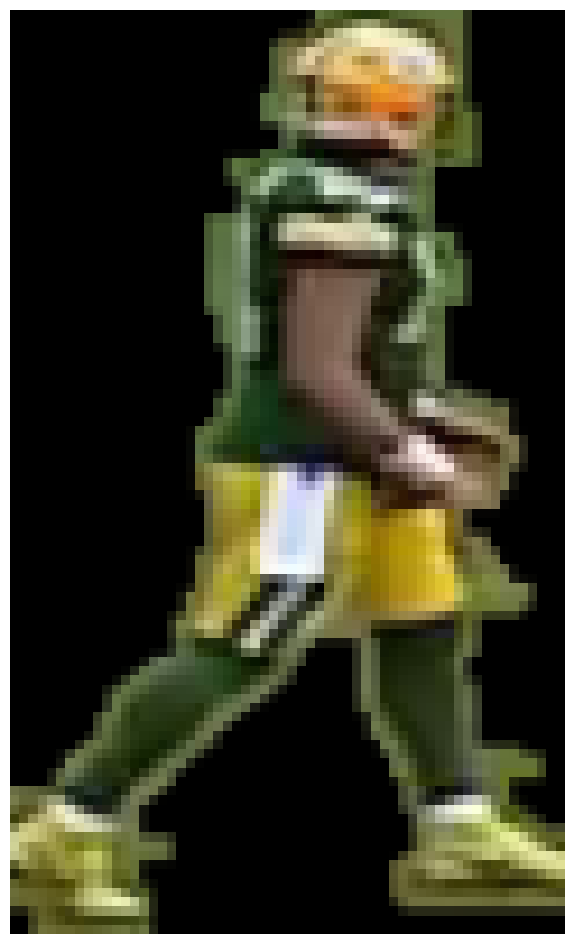

Green Bay Packers 0.4895231 0.5615597

0: 384x640 23 Players, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(106, 50)
(100, 60)
(92, 39)
(100, 60)
(114, 38)
(100, 60)

0: 384x640 22 Players, 16.8ms
Speed: 2.5ms preprocess, 16.8ms inference, 6.3ms postprocess per image at shape (1, 3, 384, 640)
(105, 50)
(100, 60)
(92, 39)
(100, 60)
(113, 37)
(100, 60)


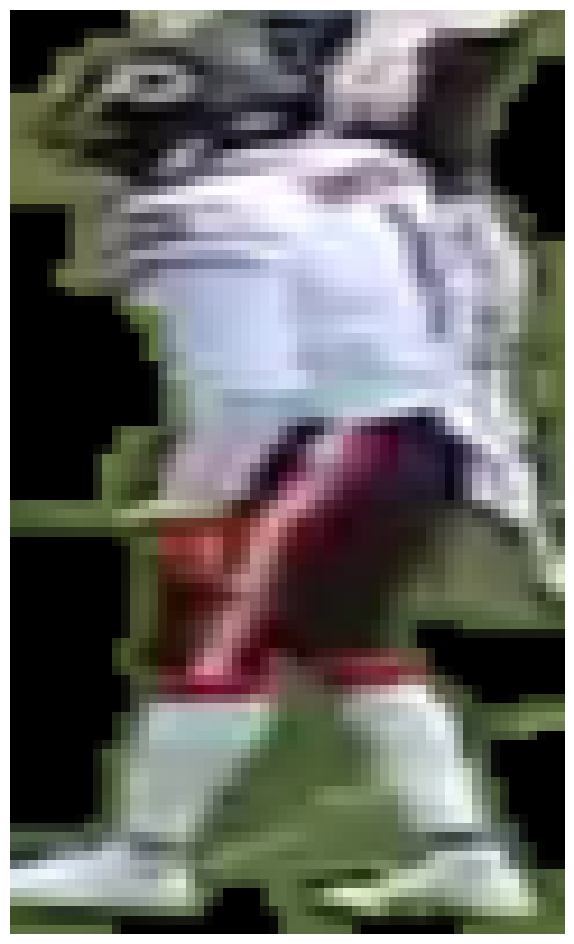

Chicago Bears 0.7978279 0.7744544

0: 384x640 23 Players, 19.6ms
Speed: 2.5ms preprocess, 19.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(105, 48)
(100, 60)
(92, 38)
(100, 60)

0: 384x640 22 Players, 16.6ms
Speed: 4.4ms preprocess, 16.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(105, 48)
(100, 60)
(92, 38)
(100, 60)

0: 384x640 24 Players, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 48)
(100, 60)
(91, 38)
(100, 60)

0: 384x640 24 Players, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(102, 47)
(100, 60)
(92, 38)
(100, 60)
(129, 32)
(100, 60)


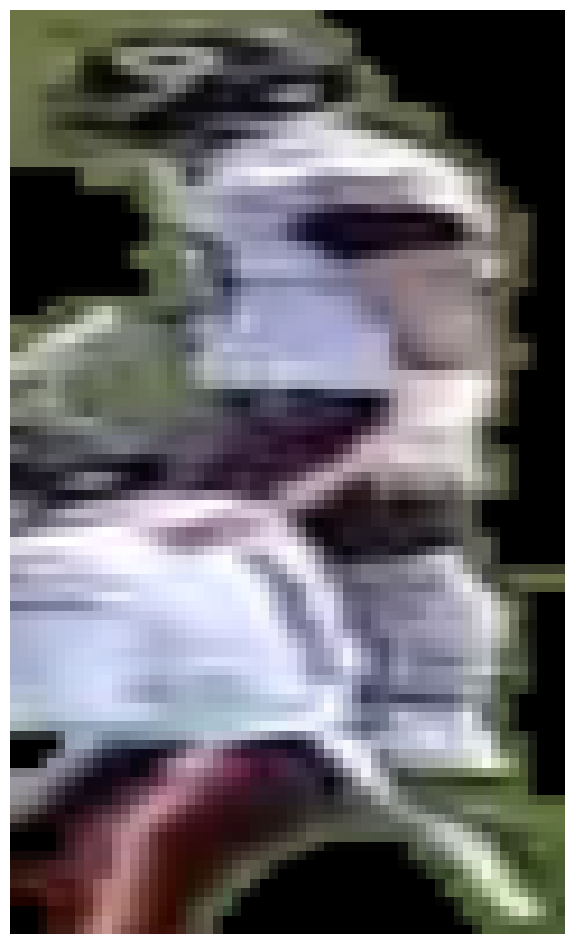

Chicago Bears 0.76999176 0.7430282

0: 384x640 24 Players, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(103, 49)
(100, 60)
(91, 38)
(100, 60)

0: 384x640 23 Players, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(103, 51)
(100, 60)
(90, 38)
(100, 60)

0: 384x640 23 Players, 20.3ms
Speed: 2.5ms preprocess, 20.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(103, 52)
(100, 60)
(90, 38)
(100, 60)

0: 384x640 23 Players, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(102, 51)
(100, 60)
(90, 38)
(100, 60)

0: 384x640 23 Players, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(101, 51)
(100, 60)
(91, 38)
(100, 60)

0: 384x640 23 Players, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(9

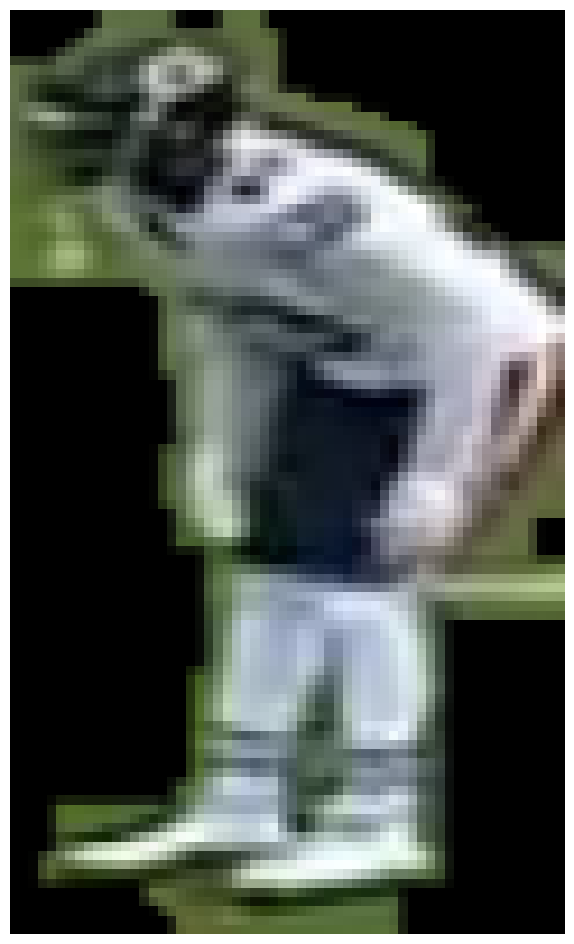

Green Bay Packers 0.72495973 0.7460265

0: 384x640 23 Players, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(96, 50)
(100, 60)

0: 384x640 23 Players, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(94, 50)
(100, 60)

0: 384x640 23 Players, 13.8ms
Speed: 3.2ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
(94, 51)
(100, 60)

0: 384x640 23 Players, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(95, 51)
(100, 60)

0: 384x640 23 Players, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
(95, 51)
(100, 60)

0: 384x640 23 Players, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
(95, 51)
(100, 60)

0: 384x640 23 Players, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 1.5ms

In [39]:
team_a_name = "Chicago Bears"
team_b_name = "Green Bay Packers"
year = "2024"
video_path = "/content/drive/MyDrive/NFL/Chicago Bears vs. Green Bay Packers Game Highlights.mp4"

process_video_with_yolo_tracking_optimized(video_path, team_a_name, team_b_name, year)